In [1]:
# Sample API
import flowx
import simulation
import numpy
flowx.__version__

'0.1.dev'

In [2]:
# Define grid parameters
n_min = 40
n_max = 100
step = 5

dif = numpy.int((n_max-n_min)/step)

n_x = n_min
n_y = n_min

u_error_ = numpy.zeros(dif)
v_error_ = numpy.zeros(dif)
p_error_ = numpy.zeros(dif)
n = numpy.zeros(dif)

xmin, xmax = 0.0, 2.0*numpy.pi
ymin, ymax = 0.0, 2.0*numpy.pi

for j in range (1, dif+1):
    nx, ny = n_x, n_y

    # Define cell-centered variable names
    center_vars = ['pres', 'divv', 'asol', 'eror']
    face_vars   = ['velc', 'hvar', 'asol', 'eror']

    # Define boundary conditions for variable pressure and velocity [left, right, bottom, top]
    bc_type_pres = {'pres': ['neumann', 'neumann', 'neumann', 'neumann']}
    bc_val_pres  = {'pres': [0.0, 0.0, 0.0, 0.0]}

    bc_type_u = {'velc': ['dirichlet', 'dirichlet', 'dirichlet', 'dirichlet']}
    bc_val_u  = {'velc': [0.0, 0.0, 0.0, 0.0]}

    bc_type_v = {'velc': ['dirichlet', 'dirichlet', 'dirichlet', 'dirichlet']}
    bc_val_v  = {'velc': [0.0, 0.0, 0.0, 0.0]}

    # Create the grid and data
    gridc = flowx.Grid('cell-centered', center_vars,
                    nx, ny, xmin, xmax, ymin, ymax,
                    user_bc_type=bc_type_pres, user_bc_val=bc_val_pres)

    gridx = flowx.Grid('x-face', face_vars,
                    nx, ny, xmin, xmax, ymin, ymax,
                    user_bc_type=bc_type_u, user_bc_val=bc_val_u)

    gridy = flowx.Grid('y-face', face_vars,
                    nx, ny, xmin, xmax, ymin, ymax,
                    user_bc_type=bc_type_v, user_bc_val=bc_val_v)



    scalars = flowx.Scalars(tmax=2, dt=0.0001, Re=1.0)

    simulation.update_bc_val(gridx, gridy, 'velc', scalars.variable['to'])
    simulation.get_initial(gridc, gridx, gridy, 'velc', 'pres')
    

 
    ins_vars = ['velc', 'hvar', 'divv', 'pres']

    poisson_options = dict(maxiter = 2000, tol = 1e-9)
    poisson_options['lu'], poisson_options['mtx'] = flowx.poisson.build_sparse(gridc, 'pres')

    while scalars.variable['time'] <= scalars.variable['tmax']:
    
        for i in range(0,3):
        
            # Update the time-dependent boundary condition value
            simulation.update_bc_val(gridx, gridy, 'velc', scalars.variable['time'])

            # Predictor Step
            flowx.ins.rk3(gridc, gridx, gridy, scalars, ins_vars, 'predictor', i=i)

            # Divergence Step
            flowx.ins.rk3(gridc, gridx, gridy, scalars, ins_vars, 'divergence', i=i)

            # Solve the pressure Poisson equation 
            scalars.stats['ites'], scalars.stats['res'] = flowx.poisson.solve_lu(gridc, 'pres', 'divv', 
                                                                                        poisson_options)
            # Corrector Step
            flowx.ins.rk3(gridc, gridx, gridy, scalars, ins_vars, 'corrector', i=i)

        # Display stats
        if scalars.variable['nstep'] % 10 == 0:
            flowx.io.display_stats(scalars)   

        scalars.advance()
    
    
    simulation.get_analytical(gridc, gridx, gridy, 'asol', scalars.variable['time']) 
    
    
    gridx.get_error('eror','velc','asol')
    gridy.get_error('eror','velc','asol')
    gridc.get_error('eror','pres','asol')


    u_error = gridx.get_l2_norm('eror')
    v_error = gridy.get_l2_norm('eror')
    p_error = gridc.get_l2_norm('eror')
    
    
    u_error_[j-1] = u_error
    v_error_[j-1] = v_error
    p_error_[j-1] = p_error
    n[j-1] = n_x


    n_x = n_x + step
    n_y = n_y + step 

------------ Time = 0.0 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.069681335560776e-11
Max, Min, U   : 0.9969173337331281, -0.996917333733128
Max, Min, V   : 0.996917333733128, -0.9969173337331281
Max, Min, P   : 20.97815548321599, 18.014870114313325
Max, Min, DIV : 2.3314683517128287e-15, -2.3314683517128287e-15


------------ Time = 0.0010000000000000002 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.2102935315379724e-11
Max, Min, U   : 0.9949254915717706, -0.9949254915717705
Max, Min, V   : 0.9949254915717705, -0.9949254915717706
Max, Min, P   : -39.201718792573274, -42.15883156057563
Max, Min, DIV : 2.3314683517128287e-15, -3.164135620181696e-15


------------ Time = 0.0020000000000000005 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.195849557828316e-11
Max, Min, U   : 0.9929376291137059, -0.9929376291137058
Max, Min, V   : 0.9929376291137058, -0.9929376291137059
Max, Min, 

------------ Time = 0.02399999999999991 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4754683183935458e-11
Max, Min, U   : 0.9501955937042652, -0.9501955937042651
Max, Min, V   : 0.9501955937042651, -0.9501955937042652
Max, Min, P   : 15.268554343267478, 12.447208945991994
Max, Min, DIV : 2.3314683517128287e-15, -2.3314683517128287e-15


------------ Time = 0.024999999999999904 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.858393328249532e-12
Max, Min, U   : 0.9482971016417499, -0.9482971016417497
Max, Min, V   : 0.9482971016417497, -0.9482971016417499
Max, Min, P   : 5.030742179835253, 2.215107367284088
Max, Min, DIV : 2.1649348980190553e-15, -2.3314683517128287e-15


------------ Time = 0.025999999999999898 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.295833319519357e-12
Max, Min, U   : 0.9464024027689054, -0.9464024027689053
Max, Min, V   : 0.9464024027689053, -0.946402402768

------------ Time = 0.04700000000000032 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8483445153588004e-12
Max, Min, U   : 0.9074766642762917, -0.9074766642762916
Max, Min, V   : 0.9074766642762916, -0.9074766642762917
Max, Min, P   : 3.0326392015532813, 0.33950582222462355
Max, Min, DIV : 2.3314683517128287e-15, -2.3314683517128287e-15


------------ Time = 0.04800000000000035 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.2348778551235616e-11
Max, Min, U   : 0.9056635246917035, -0.9056635246917034
Max, Min, V   : 0.9056635246917034, -0.9056635246917035
Max, Min, P   : 42.25060814301313, 39.562907534797084
Max, Min, DIV : 2.3314683517128287e-15, -2.6645352591003757e-15


------------ Time = 0.04900000000000038 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.997541247520353e-12
Max, Min, U   : 0.9038540077624216, -0.9038540077624215
Max, Min, V   : 0.9038540077624215, -0.90385400776

------------ Time = 0.071000000000001 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.9312434231695136e-12
Max, Min, U   : 0.8650152943193828, -0.8650152943193826
Max, Min, V   : 0.8650152943193827, -0.8650152943193827
Max, Min, P   : -4.604533693567106, -7.17034685876995
Max, Min, DIV : 2.1649348980190553e-15, -2.3314683517128287e-15


------------ Time = 0.07200000000000104 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.654922636994506e-12
Max, Min, U   : 0.8632901325522958, -0.8632901325522957
Max, Min, V   : 0.8632901325522958, -0.8632901325522956
Max, Min, P   : 8.645554983392357, 6.084911057575114
Max, Min, DIV : 2.1649348980190553e-15, -2.3314683517128287e-15


------------ Time = 0.07300000000000106 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.474490592629818e-12
Max, Min, U   : 0.8615684102960376, -0.8615684102960374
Max, Min, V   : 0.8615684102960375, -0.8615684102960374


------------ Time = 0.0950000000000017 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0340646052757134e-11
Max, Min, U   : 0.8245469922565659, -0.8245469922565657
Max, Min, V   : 0.8245469922565656, -0.8245469922565657
Max, Min, P   : 31.02375761651617, 28.57912611641088
Max, Min, DIV : 2.4980018054066022e-15, -2.1649348980190553e-15


------------ Time = 0.09600000000000172 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4677125916743902e-12
Max, Min, U   : 0.8229025148651359, -0.8229025148651358
Max, Min, V   : 0.8229025148651358, -0.8229025148651358
Max, Min, P   : -2.0777888595205445, -4.517499167965268
Max, Min, DIV : 2.1649348980190553e-15, -2.0816681711721685e-15


------------ Time = 0.09700000000000175 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9539022793449542e-12
Max, Min, U   : 0.8212613162347242, -0.8212613162347242
Max, Min, V   : 0.8212613162347242, -0.821261316234

------------ Time = 0.11900000000000238 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7563182701135603e-11
Max, Min, U   : 0.7859713873859393, -0.7859713873859391
Max, Min, V   : 0.785971387385939, -0.7859713873859389
Max, Min, P   : 17.34139295840797, 15.012142154011482
Max, Min, DIV : 2.1649348980190553e-15, -2.1649348980190553e-15


------------ Time = 0.12000000000000241 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8790627724130785e-11
Max, Min, U   : 0.7844038232465433, -0.7844038232465432
Max, Min, V   : 0.784403823246543, -0.7844038232465428
Max, Min, P   : -16.219526647105344, -18.5440913359553
Max, Min, DIV : 1.9984014443252818e-15, -2.1649348980190553e-15


------------ Time = 0.12100000000000244 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9007753171329886e-12
Max, Min, U   : 0.7828393846221792, -0.7828393846221792
Max, Min, V   : 0.7828393846221792, -0.7828393846221

------------ Time = 0.14300000000000057 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.846589301397568e-11
Max, Min, U   : 0.7492000182727383, -0.749200018272738
Max, Min, V   : 0.7492000182727381, -0.7492000182727381
Max, Min, P   : 18.06554915820393, 15.846174834987913
Max, Min, DIV : 2.1649348980190553e-15, -2.1649348980190553e-15


------------ Time = 0.14400000000000046 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8656290340656436e-11
Max, Min, U   : 0.7477057728238893, -0.7477057728238891
Max, Min, V   : 0.7477057728238891, -0.7477057728238891
Max, Min, P   : 28.42374630894824, 26.208834832583754
Max, Min, DIV : 2.1649348980190553e-15, -2.1649348980190553e-15


------------ Time = 0.14500000000000035 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9334649111329862e-11
Max, Min, U   : 0.7462145068332958, -0.7462145068332956
Max, Min, V   : 0.7462145068332956, -0.74621450683329

------------ Time = 0.16799999999999782 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.629915505735121e-13
Max, Min, U   : 0.7127242185676478, -0.7127242185676474
Max, Min, V   : 0.7127242185676476, -0.7127242185676478
Max, Min, P   : 0.5266801743027382, -1.5837975103657937
Max, Min, DIV : 2.1649348980190553e-15, -2.1649348980190553e-15


------------ Time = 0.1689999999999977 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.677288171083723e-11
Max, Min, U   : 0.7113027061531264, -0.7113027061531261
Max, Min, V   : 0.7113027061531263, -0.7113027061531264
Max, Min, P   : 17.05747734365126, 14.951241631916176
Max, Min, DIV : 1.9984014443252818e-15, -1.9984014443252818e-15


------------ Time = 0.1699999999999976 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.710194266609028e-11
Max, Min, U   : 0.7098840283333694, -0.7098840283333689
Max, Min, V   : 0.7098840283333694, -0.709884028333369

------------ Time = 0.19299999999999506 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.041637131875058e-13
Max, Min, U   : 0.6780239435126512, -0.6780239435126514
Max, Min, V   : 0.6780239435126516, -0.6780239435126514
Max, Min, P   : 1.4839500233293232, -0.5230168641896484
Max, Min, DIV : 2.1649348980190553e-15, -1.9984014443252818e-15


------------ Time = 0.19399999999999495 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.784440189782953e-12
Max, Min, U   : 0.6766716279630948, -0.6766716279630951
Max, Min, V   : 0.6766716279630952, -0.6766716279630949
Max, Min, P   : 10.62239619874139, 8.619461627013187
Max, Min, DIV : 1.85268467234323e-15, -1.9984014443252818e-15


------------ Time = 0.19499999999999484 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.3649025912585116e-11
Max, Min, U   : 0.6753220091988407, -0.6753220091988409
Max, Min, V   : 0.675322009198841, -0.6753220091988408

------------ Time = 0.21699999999999242 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.275470963978543e-11
Max, Min, U   : 0.6463019251922318, -0.6463019251922317
Max, Min, V   : 0.6463019251922316, -0.6463019251922315
Max, Min, P   : -21.353102395051895, -23.26551271511722
Max, Min, DIV : 1.9984014443252818e-15, -1.9984014443252818e-15


------------ Time = 0.2179999999999923 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0345617371355723e-11
Max, Min, U   : 0.6450128715471858, -0.6450128715471857
Max, Min, V   : 0.6450128715471855, -0.6450128715471853
Max, Min, P   : -8.866930621990619, -10.775499937022117
Max, Min, DIV : 2.1649348980190553e-15, -1.915134717478395e-15


------------ Time = 0.2189999999999922 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.65564837483735e-13
Max, Min, U   : 0.6437263886938245, -0.6437263886938244
Max, Min, V   : 0.6437263886938241, -0.64372638869382

------------ Time = 0.24199999999998967 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.306940821773018e-11
Max, Min, U   : 0.6148351725486542, -0.6148351725486543
Max, Min, V   : 0.6148351725486542, -0.6148351725486543
Max, Min, P   : 42.117940957537506, 40.299261887540325
Max, Min, DIV : 2.0816681711721685e-15, -2.0816681711721685e-15


------------ Time = 0.24299999999998956 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.625022581938815e-13
Max, Min, U   : 0.6136088757545455, -0.6136088757545456
Max, Min, V   : 0.6136088757545455, -0.6136088757545457
Max, Min, P   : 1.4585282433941924, -0.3564992881128544
Max, Min, DIV : 1.9984014443252818e-15, -1.85268467234323e-15


------------ Time = 0.24399999999998945 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0864032888548572e-11
Max, Min, U   : 0.6123850247505811, -0.6123850247505811
Max, Min, V   : 0.6123850247505811, -0.6123850247505

------------ Time = 0.2669999999999869 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2655895291836133e-11
Max, Min, U   : 0.5849004054849024, -0.5849004054849025
Max, Min, V   : 0.5849004054849025, -0.5849004054849024
Max, Min, P   : 13.308584102538342, 11.579014554453126
Max, Min, DIV : 1.915134717478395e-15, -1.9567680809018384e-15


------------ Time = 0.2679999999999868 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.951042928114836e-12
Max, Min, U   : 0.5837338138503702, -0.58373381385037
Max, Min, V   : 0.58373381385037, -0.5837338138503702
Max, Min, P   : 10.228579664643954, 8.502481677149657
Max, Min, DIV : 1.915134717478395e-15, -1.582067810090848e-15


------------ Time = 0.2689999999999867 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.596348308335609e-12
Max, Min, U   : 0.5825695490640066, -0.5825695490640063
Max, Min, V   : 0.5825695490640063, -0.5825695490640064
Max, M

------------ Time = 0.29199999999998416 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4798443966530625e-11
Max, Min, U   : 0.5564231220172323, -0.5564231220172321
Max, Min, V   : 0.5564231220172323, -0.5564231220172322
Max, Min, P   : -13.324085884475823, -14.968936469897569
Max, Min, DIV : 1.9984014443252818e-15, -1.97758476261356e-15


------------ Time = 0.29299999999998405 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.010100239688943e-12
Max, Min, U   : 0.5553133317626147, -0.5553133317626144
Max, Min, V   : 0.5553133317626147, -0.5553133317626147
Max, Min, P   : 3.8227948736950235, 2.1812448614981665
Max, Min, DIV : 1.6861512186494565e-15, -1.85268467234323e-15


------------ Time = 0.29399999999998394 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1234351822377602e-11
Max, Min, U   : 0.554205755178681, -0.5542057551786809
Max, Min, V   : 0.5542057551786811, -0.55420575517868

------------ Time = 0.3159999999999815 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4183088840634596e-11
Max, Min, U   : 0.5303902930980332, -0.530390293098033
Max, Min, V   : 0.5303902930980332, -0.5303902930980334
Max, Min, P   : 14.383903624546042, 12.816456093906925
Max, Min, DIV : 1.4779844015322396e-15, -1.8735013540549517e-15


------------ Time = 0.3169999999999814 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.466362958944273e-11
Max, Min, U   : 0.5293324309952837, -0.5293324309952835
Max, Min, V   : 0.5293324309952838, -0.5293324309952839
Max, Min, P   : -23.95470652765401, -25.519009608149535
Max, Min, DIV : 1.6861512186494565e-15, -1.8318679906315083e-15


------------ Time = 0.3179999999999813 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4080312938522292e-11
Max, Min, U   : 0.5282766790772494, -0.5282766790772492
Max, Min, V   : 0.5282766790772496, -0.52827667907724

------------ Time = 0.3399999999999789 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2106733495441486e-12
Max, Min, U   : 0.5055755893453546, -0.5055755893453548
Max, Min, V   : 0.505575589345355, -0.5055755893453554
Max, Min, P   : -1.3362258410765167, -2.8299306506990356
Max, Min, DIV : 1.4363510381087963e-15, -1.3114509478384662e-15


------------ Time = 0.34099999999997876 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.041590497530722e-13
Max, Min, U   : 0.5045672276361659, -0.5045672276361661
Max, Min, V   : 0.5045672276361662, -0.5045672276361666
Max, Min, P   : 0.2299903391201433, -1.2607186768184713
Max, Min, DIV : 1.1657341758564144e-15, -1.3322676295501878e-15


------------ Time = 0.34199999999997865 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9326857006896687e-11
Max, Min, U   : 0.5035608774474041, -0.5035608774474043
Max, Min, V   : 0.5035608774474044, -0.5035608774

------------ Time = 0.36399999999997623 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.864572447557382e-12
Max, Min, U   : 0.481922056318467, -0.48192205631846696
Max, Min, V   : 0.48192205631846724, -0.48192205631846713
Max, Min, P   : 7.3000253668889865, 5.876577878566717
Max, Min, DIV : 1.0824674490095276e-15, -1.3322676295501878e-15


------------ Time = 0.3649999999999761 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.796801714938777e-12
Max, Min, U   : 0.48096088038131946, -0.48096088038131946
Max, Min, V   : 0.4809608803813198, -0.4809608803813196
Max, Min, P   : 9.783579975102395, 8.362986723334197
Max, Min, DIV : 1.1657341758564144e-15, -1.1657341758564144e-15


------------ Time = 0.365999999999976 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.622812686935917e-12
Max, Min, U   : 0.4800016218991954, -0.4800016218991955
Max, Min, V   : 0.48000162189919576, -0.48000162189919

------------ Time = 0.3879999999999736 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.167834851841827e-11
Max, Min, U   : 0.45937539425655893, -0.45937539425655893
Max, Min, V   : 0.45937539425655893, -0.45937539425655904
Max, Min, P   : 12.303819344484927, 10.94731012696007
Max, Min, DIV : 1.1657341758564144e-15, -1.1657341758564144e-15


------------ Time = 0.3889999999999735 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.573954192467275e-12
Max, Min, U   : 0.4584591973800406, -0.4584591973800406
Max, Min, V   : 0.4584591973800407, -0.4584591973800407
Max, Min, P   : 9.909588524739501, 8.55579873842024
Max, Min, DIV : 1.0824674490095276e-15, -1.1657341758564144e-15


------------ Time = 0.38999999999997337 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0925549813420026e-11
Max, Min, U   : 0.45754482827957726, -0.4575448282795773
Max, Min, V   : 0.4575448282795773, -0.4575448282795

------------ Time = 0.41199999999997095 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.388433635317207e-12
Max, Min, U   : 0.43788383543614473, -0.4378838354361448
Max, Min, V   : 0.4378838354361449, -0.4378838354361449
Max, Min, P   : 3.8774643168307956, 2.5847325408683126
Max, Min, DIV : 1.0824674490095276e-15, -1.0824674490095276e-15


------------ Time = 0.41299999999997083 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.478800444046095e-12
Max, Min, U   : 0.4370105138328985, -0.4370105138328986
Max, Min, V   : 0.4370105138328988, -0.4370105138328987
Max, Min, P   : -6.516196255866789, -7.806336983427153
Max, Min, DIV : 1.0824674490095276e-15, -1.1657341758564144e-15


------------ Time = 0.4139999999999707 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.25839810538537e-12
Max, Min, U   : 0.4361389345104307, -0.43613893451043073
Max, Min, V   : 0.43613893451043095, -0.436138934510

------------ Time = 0.4359999999999683 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.051639114440911e-12
Max, Min, U   : 0.41739802713981555, -0.41739802713981555
Max, Min, V   : 0.4173980271398158, -0.4173980271398156
Max, Min, P   : -6.17427140821314, -7.406236053517235
Max, Min, DIV : 1.1657341758564144e-15, -1.0824674490095276e-15


------------ Time = 0.4369999999999682 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.378230508547351e-11
Max, Min, U   : 0.4165655751873852, -0.41656557518738513
Max, Min, V   : 0.4165655751873853, -0.41656557518738513
Max, Min, P   : -23.85848231897052, -25.087978188284314
Max, Min, DIV : 1.1657341758564144e-15, -1.2073675392798577e-15


------------ Time = 0.4379999999999681 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.018224054145824e-12
Max, Min, U   : 0.41573478401059977, -0.4157347840105998
Max, Min, V   : 0.41573478401059993, -0.4157347840

------------ Time = 0.45999999999996566 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1654725497847987e-12
Max, Min, U   : 0.3978709199358043, -0.39787091993580437
Max, Min, V   : 0.3978709199358045, -0.3978709199358044
Max, Min, P   : 1.6898842270930896, 0.5158196142492276
Max, Min, DIV : 9.992007221626409e-16, -1.0824674490095276e-15


------------ Time = 0.46099999999996555 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5006353024931085e-11
Max, Min, U   : 0.3970774256329734, -0.3970774256329735
Max, Min, V   : 0.39707742563297355, -0.3970774256329735
Max, Min, P   : -13.943132677998683, -15.11484497302452
Max, Min, DIV : 1.0824674490095276e-15, -1.1657341758564144e-15


------------ Time = 0.46199999999996544 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5834746706625184e-11
Max, Min, U   : 0.39628551440600374, -0.39628551440600385
Max, Min, V   : 0.3962855144060039, -0.396285

------------ Time = 0.483999999999963 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.4883944873897827e-13
Max, Min, U   : 0.37925766101248637, -0.3792576610124863
Max, Min, V   : 0.3792576610124864, -0.37925766101248637
Max, Min, P   : 0.957989694303354, -0.16101752723156834
Max, Min, DIV : 1.0824674490095276e-15, -1.0824674490095276e-15


------------ Time = 0.4849999999999629 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.827357057302891e-12
Max, Min, U   : 0.3785013016411394, -0.3785013016411394
Max, Min, V   : 0.37850130164113943, -0.3785013016411394
Max, Min, P   : -8.639427488041886, -9.756199988531302
Max, Min, DIV : 9.159339953157541e-16, -1.0824674490095276e-15


------------ Time = 0.4859999999999628 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.77848693606182e-12
Max, Min, U   : 0.3777464512747881, -0.3777464512747881
Max, Min, V   : 0.3777464512747882, -0.37774645127478

------------ Time = 0.5079999999999604 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.340235995028566e-12
Max, Min, U   : 0.36151549233973446, -0.3615154923397348
Max, Min, V   : 0.3615154923397347, -0.3615154923397345
Max, Min, P   : 2.710158276273331, 1.6435699197510596
Max, Min, DIV : 9.992007221626409e-16, -9.575673587391975e-16


------------ Time = 0.5089999999999603 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.0830270886845e-12
Max, Min, U   : 0.3607945303231773, -0.36079453032317754
Max, Min, V   : 0.3607945303231775, -0.3607945303231773
Max, Min, P   : -7.960851766099689, -9.025310131498069
Max, Min, DIV : 1.2490009027033011e-15, -1.0824674490095276e-15


------------ Time = 0.5099999999999602 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.207907118061208e-12
Max, Min, U   : 0.3600750067012341, -0.3600750067012343
Max, Min, V   : 0.3600750067012344, -0.3600750067012341
Ma

------------ Time = 0.5319999999999577 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.233594997167175e-11
Max, Min, U   : 0.344603653446967, -0.344603653446967
Max, Min, V   : 0.34460365344696703, -0.34460365344696686
Max, Min, P   : 12.739021817661193, 11.72239577524157
Max, Min, DIV : 9.575673587391975e-16, -9.992007221626409e-16


------------ Time = 0.5329999999999576 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.51095734884809e-12
Max, Min, U   : 0.3439164323962416, -0.34391643239624164
Max, Min, V   : 0.34391643239624176, -0.34391643239624153
Max, Min, P   : -4.929202824709942, -5.943798693364596
Max, Min, DIV : 1.0824674490095276e-15, -1.0408340855860843e-15


------------ Time = 0.5339999999999575 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.16996641157303e-11
Max, Min, U   : 0.34323058242945625, -0.34323058242945625
Max, Min, V   : 0.34323058242945637, -0.343230582429456

------------ Time = 0.5559999999999551 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0456062920906249e-11
Max, Min, U   : 0.3284832886200091, -0.3284832886200091
Max, Min, V   : 0.3284832886200091, -0.32848328862000914
Max, Min, P   : -10.023248340422311, -10.992253398264722
Max, Min, DIV : 1.0824674490095276e-15, -1.0824674490095276e-15


------------ Time = 0.556999999999955 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.922254060087237e-12
Max, Min, U   : 0.3278282295601767, -0.32782822956017665
Max, Min, V   : 0.32782822956017665, -0.3278282295601767
Max, Min, P   : 8.59684405770776, 7.629774037739208
Max, Min, DIV : 1.0304257447302234e-15, -9.992007221626409e-16


------------ Time = 0.5579999999999549 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.751929190592849e-13
Max, Min, U   : 0.3271744774198704, -0.32717447741987027
Max, Min, V   : 0.3271744774198703, -0.32717447741987

------------ Time = 0.5799999999999524 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.84672200520678e-12
Max, Min, U   : 0.3131173583280881, -0.31311735832808807
Max, Min, V   : 0.3131173583280882, -0.31311735832808824
Max, Min, P   : 9.7280107855846, 8.804395185447799
Max, Min, DIV : 9.8879238130678e-16, -1.0304257447302234e-15


------------ Time = 0.5809999999999523 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.9355911029301056e-12
Max, Min, U   : 0.3124929560967863, -0.3124929560967862
Max, Min, V   : 0.31249295609678635, -0.31249295609678635
Max, Min, P   : -3.2942784394524978, -4.216049676241158
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.5819999999999522 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1534968904726852e-12
Max, Min, U   : 0.3118697996204248, -0.31186979962042477
Max, Min, V   : 0.3118697996204249, -0.3118697996204248
M

------------ Time = 0.6049999999999497 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0424327849147788e-11
Max, Min, U   : 0.29787537451065343, -0.2978753745106536
Max, Min, V   : 0.2978753745106536, -0.29787537451065343
Max, Min, P   : -9.85452646815646, -10.733121555513897
Max, Min, DIV : 9.992007221626409e-16, -1.0824674490095276e-15


------------ Time = 0.6059999999999496 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.701202223223688e-12
Max, Min, U   : 0.297281381771993, -0.29728138177199315
Max, Min, V   : 0.2972813817719932, -0.29728138177199304
Max, Min, P   : 4.0966763514923485, 3.2198356930011935
Max, Min, DIV : 8.743006318923108e-16, -9.992007221626409e-16


------------ Time = 0.6069999999999495 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.537500687100546e-13
Max, Min, U   : 0.2966885741145218, -0.2966885741145218
Max, Min, V   : 0.29668857411452193, -0.29668857411452

------------ Time = 0.6299999999999469 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.270509964235768e-12
Max, Min, U   : 0.2833757010739308, -0.2833757010739307
Max, Min, V   : 0.28337570107393084, -0.28337570107393084
Max, Min, P   : 5.400233080461766, 4.564463256610138
Max, Min, DIV : 9.575673587391975e-16, -9.159339953157541e-16


------------ Time = 0.6309999999999468 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9828070553173236e-12
Max, Min, U   : 0.2828106367249531, -0.28281063672495305
Max, Min, V   : 0.28281063672495316, -0.2828106367249532
Max, Min, P   : -2.5553081588183226, -3.3894091003317883
Max, Min, DIV : 9.575673587391975e-16, -8.951173136040325e-16


------------ Time = 0.6319999999999467 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6735594826325828e-12
Max, Min, U   : 0.2822466997363614, -0.2822466997363615
Max, Min, V   : 0.2822466997363616, -0.28224669973636

------------ Time = 0.6559999999999441 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.926597339297318e-12
Max, Min, U   : 0.2690446380028581, -0.2690446380028583
Max, Min, V   : 0.26904463800285816, -0.26904463800285816
Max, Min, P   : -7.297952588044758, -8.09139778511114
Max, Min, DIV : 9.575673587391975e-16, -1.0408340855860843e-15


------------ Time = 0.656999999999944 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.8779850382640875e-12
Max, Min, U   : 0.26850816547924533, -0.26850816547924544
Max, Min, V   : 0.2685081654792453, -0.26850816547924533
Max, Min, P   : 6.165344459878499, 5.373483601118412
Max, Min, DIV : 8.743006318923108e-16, -7.077671781985373e-16


------------ Time = 0.6579999999999439 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.878353108677968e-12
Max, Min, U   : 0.2679727632649031, -0.2679727632649032
Max, Min, V   : 0.26797276326490305, -0.2679727632649030

------------ Time = 0.6799999999999414 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.958949321211369e-13
Max, Min, U   : 0.25646042505928873, -0.25646042505928873
Max, Min, V   : 0.25646042505928873, -0.2564604250592886
Max, Min, P   : 0.8340419742818337, 0.07776010936313629
Max, Min, DIV : 6.869504964868156e-16, -7.28583859910259e-16


------------ Time = 0.6809999999999413 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.07587340284794e-12
Max, Min, U   : 0.255949059039162, -0.255949059039162
Max, Min, V   : 0.255949059039162, -0.2559490590391619
Max, Min, P   : 8.136095393404627, 7.381323634452823
Max, Min, DIV : 5.828670879282072e-16, -5.828670879282072e-16


------------ Time = 0.6819999999999412 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.181575916035739e-12
Max, Min, U   : 0.2554387132303321, -0.2554387132303322
Max, Min, V   : 0.2554387132303322, -0.25543871323033207
Max, 

Max, Min, V   : 0.24446514129597446, -0.2444651412959744
Max, Min, P   : 5.453564124172166, 4.732704365417704
Max, Min, DIV : 5.828670879282072e-16, -6.661338147750939e-16


------------ Time = 0.7049999999999387 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1257998070589861e-11
Max, Min, U   : 0.24397770660696783, -0.24397770660696777
Max, Min, V   : 0.2439777066069678, -0.24397770660696774
Max, Min, P   : -10.601184340822936, -11.320604746276748
Max, Min, DIV : 5.828670879282072e-16, -6.661338147750939e-16


------------ Time = 0.7059999999999386 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.316570039511784e-12
Max, Min, U   : 0.24349124437521963, -0.24349124437521955
Max, Min, V   : 0.24349124437521957, -0.24349124437521955
Max, Min, P   : -4.682240859823298, -5.400224786929878
Max, Min, DIV : 5.828670879282072e-16, -5.828670879282072e-16


------------ Time = 0.7069999999999385 ---------------
Number of poisson

------------ Time = 0.7279999999999361 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5832704244668924e-12
Max, Min, U   : 0.23303122015726055, -0.23303122015726047
Max, Min, V   : 0.23303122015726052, -0.2330312201572605
Max, Min, P   : 3.7634315116794874, 3.0763342517491554
Max, Min, DIV : 5.828670879282072e-16, -5.828670879282072e-16


------------ Time = 0.728999999999936 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9190519708375766e-13
Max, Min, U   : 0.23256659661235282, -0.2325665966123527
Max, Min, V   : 0.23256659661235274, -0.23256659661235277
Max, Min, P   : 0.5931962426668206, -0.09252910024157034
Max, Min, DIV : 5.828670879282072e-16, -5.828670879282072e-16


------------ Time = 0.7299999999999359 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.33570648075276e-12
Max, Min, U   : 0.2321029000051458, -0.23210290000514577
Max, Min, V   : 0.23210290000514575, -0.2321029000

------------ Time = 0.7549999999999332 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.812619810923059e-13
Max, Min, U   : 0.22080639332976884, -0.22080639332976876
Max, Min, V   : 0.22080639332976876, -0.22080639332976876
Max, Min, P   : 0.07980706322906339, -0.5711944217469201
Max, Min, DIV : 5.828670879282072e-16, -5.412337245047638e-16


------------ Time = 0.7559999999999331 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.896345488429146e-12
Max, Min, U   : 0.2203661585180341, -0.22036615851803398
Max, Min, V   : 0.22036615851803398, -0.22036615851803396
Max, Min, P   : 4.130834167265346, 3.481132504167718
Max, Min, DIV : 5.828670879282072e-16, -5.828670879282072e-16


------------ Time = 0.756999999999933 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.873311286730553e-13
Max, Min, U   : 0.21992680197562897, -0.2199268019756288
Max, Min, V   : 0.21992680197562883, -0.219926801975

------------ Time = 0.7799999999999304 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.266926248901375e-11
Max, Min, U   : 0.21006001666816196, -0.210060016668162
Max, Min, V   : 0.2100600166681619, -0.21006001666816193
Max, Min, P   : -12.116688143570503, -12.735961123522342
Max, Min, DIV : 5.828670879282072e-16, -5.412337245047638e-16


------------ Time = 0.7809999999999303 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.063849546851486e-12
Max, Min, U   : 0.2096412207577655, -0.20964122075776553
Max, Min, V   : 0.20964122075776545, -0.2096412207577655
Max, Min, P   : 8.08320384823177, 7.465167319206132
Max, Min, DIV : 5.828670879282072e-16, -5.412337245047638e-16


------------ Time = 0.7819999999999302 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.4235045654438705e-12
Max, Min, U   : 0.20922326033427552, -0.20922326033427557
Max, Min, V   : 0.20922326033427552, -0.20922326033427

------------ Time = 0.8049999999999277 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.713956241035471e-12
Max, Min, U   : 0.19983697200127404, -0.1998369720012741
Max, Min, V   : 0.19983697200127404, -0.1998369720012741
Max, Min, P   : -2.3483867205127056, -2.937478059519364
Max, Min, DIV : 5.412337245047638e-16, -4.996003610813204e-16


------------ Time = 0.8059999999999276 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.711678448764987e-14
Max, Min, U   : 0.1994385706518942, -0.19943857065189421
Max, Min, V   : 0.1994385706518942, -0.19943857065189424
Max, Min, P   : 0.2656234195879067, -0.322291748773391
Max, Min, DIV : 5.828670879282072e-16, -5.412337245047638e-16


------------ Time = 0.8069999999999274 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9096430547191074e-13
Max, Min, U   : 0.19904096409067593, -0.19904096409067593
Max, Min, V   : 0.19904096409067587, -0.19904096409

------------ Time = 0.8299999999999249 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.845776546466429e-12
Max, Min, U   : 0.19011176647783076, -0.19011176647783087
Max, Min, V   : 0.1901117664778307, -0.19011176647783073
Max, Min, P   : -4.169000581830179, -4.729381702986553
Max, Min, DIV : 5.204170427930421e-16, -5.412337245047638e-16


------------ Time = 0.8309999999999248 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1648692863460496e-12
Max, Min, U   : 0.1897327662141875, -0.1897327662141876
Max, Min, V   : 0.18973276621418747, -0.1897327662141875
Max, Min, P   : -0.7932143149966244, -1.3524766059559157
Max, Min, DIV : 5.828670879282072e-16, -5.412337245047638e-16


------------ Time = 0.8319999999999247 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9659582886000925e-12
Max, Min, U   : 0.18935452202226877, -0.18935452202226885
Max, Min, V   : 0.18935452202226874, -0.189354522

------------ Time = 0.8539999999999223 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6986215080503955e-12
Max, Min, U   : 0.18122141386152762, -0.18122141386152762
Max, Min, V   : 0.1812214138615276, -0.1812214138615276
Max, Min, P   : -1.329153701579174, -1.8632906846195527
Max, Min, DIV : 5.412337245047638e-16, -5.412337245047638e-16


------------ Time = 0.8549999999999222 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.904564148956787e-12
Max, Min, U   : 0.18086014891925867, -0.1808601489192587
Max, Min, V   : 0.18086014891925867, -0.18086014891925867
Max, Min, P   : 6.727719820133983, 6.194649253017735
Max, Min, DIV : 5.828670879282072e-16, -5.412337245047638e-16


------------ Time = 0.855999999999922 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.3561844924399506e-12
Max, Min, U   : 0.18049960465630857, -0.1804996046563086
Max, Min, V   : 0.18049960465630854, -0.1804996046563

Final poisson residual : 2.2144206243775003e-12
Max, Min, U   : 0.17240272228602868, -0.1724027222860286
Max, Min, V   : 0.17240272228602857, -0.17240272228602868
Max, Min, P   : 2.401620924388607, 1.8935150771846865
Max, Min, DIV : 4.996003610813204e-16, -5.412337245047638e-16


------------ Time = 0.8799999999999194 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8729130696651486e-12
Max, Min, U   : 0.17205904940138184, -0.17205904940138175
Max, Min, V   : 0.17205904940138175, -0.17205904940138184
Max, Min, P   : 3.0990904390244185, 2.591999019720971
Max, Min, DIV : 5.152128723651117e-16, -4.631711680858075e-16


------------ Time = 0.8809999999999193 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.026062967370165e-12
Max, Min, U   : 0.17171606208947965, -0.17171606208947954
Max, Min, V   : 0.17171606208947957, -0.17171606208947962
Max, Min, P   : -7.492080405259406, -7.998159422607591
Max, Min, DIV : 4.9960036108132

------------ Time = 0.9029999999999169 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4640599581745757e-12
Max, Min, U   : 0.16434105083029896, -0.16434105083029887
Max, Min, V   : 0.16434105083029893, -0.16434105083029885
Max, Min, P   : 3.531925079605185, 3.047614447746813
Max, Min, DIV : 4.787836793695988e-16, -4.579669976578771e-16


------------ Time = 0.9039999999999168 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.227466989889415e-12
Max, Min, U   : 0.16401345955785662, -0.16401345955785654
Max, Min, V   : 0.16401345955785657, -0.1640134595578565
Max, Min, P   : 7.195911734060983, 6.712568008290356
Max, Min, DIV : 6.036837696399289e-16, -4.996003610813204e-16


------------ Time = 0.9049999999999166 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.605561449157075e-12
Max, Min, U   : 0.16368652176581744, -0.16368652176581736
Max, Min, V   : 0.16368652176581738, -0.1636865217658

------------ Time = 0.9269999999999142 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.188631893786433e-12
Max, Min, U   : 0.15665660886060503, -0.15665660886060517
Max, Min, V   : 0.1566566088606051, -0.15665660886060503
Max, Min, P   : 6.264426069338714, 5.802795951740625
Max, Min, DIV : 4.996003610813204e-16, -4.579669976578771e-16


------------ Time = 0.9279999999999141 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8230953333354107e-12
Max, Min, U   : 0.15634434640458872, -0.15634434640458883
Max, Min, V   : 0.15634434640458875, -0.15634434640458872
Max, Min, P   : -2.58722925391365, -3.047937760372027
Max, Min, DIV : 5.412337245047638e-16, -4.787836793695988e-16


------------ Time = 0.928999999999914 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4989771262805104e-12
Max, Min, U   : 0.15603270683895673, -0.15603270683895684
Max, Min, V   : 0.1560327068389568, -0.1560327068389

------------ Time = 0.9519999999999115 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.621311811933601e-12
Max, Min, U   : 0.1490340867231514, -0.1490340867231513
Max, Min, V   : 0.14903408672315124, -0.14903408672315124
Max, Min, P   : 5.724755391019498, 5.285621759410312
Max, Min, DIV : 5.412337245047638e-16, -5.204170427930421e-16


------------ Time = 0.9529999999999114 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.119532133467908e-13
Max, Min, U   : 0.14873702926090834, -0.14873702926090826
Max, Min, V   : 0.14873702926090823, -0.1487370292609082
Max, Min, P   : -0.6787113890555683, -1.1169683362855443
Max, Min, DIV : 4.631711680858075e-16, -4.996003610813204e-16


------------ Time = 0.9539999999999113 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.434093478111567e-13
Max, Min, U   : 0.14844056434622582, -0.14844056434622577
Max, Min, V   : 0.1484405643462257, -0.1484405643462

------------ Time = 0.9769999999999087 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4004997676818723e-12
Max, Min, U   : 0.1417827243473718, -0.14178272434737185
Max, Min, V   : 0.14178272434737174, -0.1417827243473717
Max, Min, P   : 3.379003605457071, 2.961269807225081
Max, Min, DIV : 5.204170427930421e-16, -4.527628272299467e-16


------------ Time = 0.9779999999999086 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4382231609232164e-12
Max, Min, U   : 0.14150013120043242, -0.14150013120043242
Max, Min, V   : 0.1415001312004323, -0.1415001312004323
Max, Min, P   : -1.181992651775273, -1.598892501678446
Max, Min, DIV : 4.996003610813204e-16, -4.0592529337857286e-16


------------ Time = 0.9789999999999085 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.92164644969819e-13
Max, Min, U   : 0.14121810173644986, -0.14121810173644986
Max, Min, V   : 0.14121810173644975, -0.1412181017364

------------ Time = 1.002999999999906 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5319811274764935e-12
Max, Min, U   : 0.13461560810310658, -0.13461560810310666
Max, Min, V   : 0.13461560810310655, -0.13461560810310652
Max, Min, P   : 1.7096026050693856, 1.313018757969601
Max, Min, DIV : 4.3194614551822497e-16, -4.371503159461554e-16


------------ Time = 1.0039999999999059 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.968474909300417e-12
Max, Min, U   : 0.13434731090181184, -0.1343473109018119
Max, Min, V   : 0.1343473109018118, -0.1343473109018118
Max, Min, P   : 3.1346593391105633, 2.738867203935027
Max, Min, DIV : 4.579669976578771e-16, -3.5388358909926865e-16


------------ Time = 1.0049999999999057 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6131774640352304e-12
Max, Min, U   : 0.13407954885504025, -0.13407954885504028
Max, Min, V   : 0.13407954885504017, -0.13407954885

------------ Time = 1.0269999999999033 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5746975915049992e-12
Max, Min, U   : 0.12832203889992255, -0.1283220388999226
Max, Min, V   : 0.12832203889992247, -0.1283220388999224
Max, Min, P   : 3.6235018341130867, 3.245489033299858
Max, Min, DIV : 3.3306690738754696e-16, -3.2786273695961654e-16


------------ Time = 1.0279999999999032 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.936439097363191e-13
Max, Min, U   : 0.12806629492780364, -0.1280662949278037
Max, Min, V   : 0.12806629492780358, -0.12806629492780353
Max, Min, P   : 0.7465170106154345, 0.3692588359173042
Max, Min, DIV : 3.8510861166685117e-16, -3.434752482434078e-16


------------ Time = 1.028999999999903 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.911188187364189e-12
Max, Min, U   : 0.12781106105965442, -0.12781106105965448
Max, Min, V   : 0.12781106105965437, -0.1278110610

------------ Time = 1.0519999999999006 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.382091192845381e-13
Max, Min, U   : 0.1220791550307487, -0.12207915503074872
Max, Min, V   : 0.12207915503074863, -0.12207915503074865
Max, Min, P   : -0.6264485931512145, -0.9860409795148718
Max, Min, DIV : 2.914335439641036e-16, -2.706168622523819e-16


------------ Time = 1.0529999999999005 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2991384792071665e-13
Max, Min, U   : 0.12183586290023467, -0.12183586290023468
Max, Min, V   : 0.12183586290023464, -0.12183586290023463
Max, Min, P   : 0.4904991008246594, 0.13162455607935164
Max, Min, DIV : 2.914335439641036e-16, -2.914335439641036e-16


------------ Time = 1.0539999999999003 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.058855737916575e-12
Max, Min, U   : 0.12159305602566672, -0.12159305602566671
Max, Min, V   : 0.12159305602566668, -0.121593

------------ Time = 1.075999999999898 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.413593957990048e-12
Max, Min, U   : 0.1163721349972501, -0.11637213499725015
Max, Min, V   : 0.11637213499725006, -0.11637213499725003
Max, Min, P   : -3.895046029411243, -4.237800121641166
Max, Min, DIV : 2.706168622523819e-16, -2.914335439641036e-16


------------ Time = 1.0769999999998978 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7378303504208024e-12
Max, Min, U   : 0.11614022561926853, -0.11614022561926855
Max, Min, V   : 0.1161402256192685, -0.11614022561926847
Max, Min, P   : 1.8299150447011259, 1.4878451694518051
Max, Min, DIV : 2.706168622523819e-16, -3.0184188481996443e-16


------------ Time = 1.0779999999998977 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.785540021609648e-13
Max, Min, U   : 0.11590877878282116, -0.11590877878282121
Max, Min, V   : 0.11590877878282115, -0.1159087787

------------ Time = 1.0999999999998953 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7585093885033864e-12
Max, Min, U   : 0.1109321226532222, -0.11093212265322216
Max, Min, V   : 0.11093212265322215, -0.11093212265322216
Max, Min, P   : -1.4991712027350528, -1.825875723661345
Max, Min, DIV : 2.914335439641036e-16, -2.914335439641036e-16


------------ Time = 1.1009999999998952 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7741818059561156e-12
Max, Min, U   : 0.11071106321341834, -0.11071106321341834
Max, Min, V   : 0.11071106321341831, -0.11071106321341834
Max, Min, P   : 2.865079049033607, 2.5390266958844276
Max, Min, DIV : 2.706168622523819e-16, -2.706168622523819e-16


------------ Time = 1.101999999999895 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.808562766237787e-12
Max, Min, U   : 0.11049044466419292, -0.11049044466419292
Max, Min, V   : 0.11049044466419289, -0.110490444

------------ Time = 1.1239999999998926 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9345881782882096e-13
Max, Min, U   : 0.10574661971735344, -0.10574661971735345
Max, Min, V   : 0.10574661971735347, -0.10574661971735344
Max, Min, P   : 0.340528414494703, 0.029121696258644813
Max, Min, DIV : 2.706168622523819e-16, -2.706168622523819e-16


------------ Time = 1.1249999999998925 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.680185567736868e-12
Max, Min, U   : 0.10553590234707261, -0.10553590234707261
Max, Min, V   : 0.10553590234707262, -0.1055359023470726
Max, Min, P   : -2.3723040636233366, -2.68308916168846
Max, Min, DIV : 2.914335439641036e-16, -2.706168622523819e-16


------------ Time = 1.1259999999998924 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4523865971519767e-12
Max, Min, U   : 0.10532560523008908, -0.10532560523008906
Max, Min, V   : 0.10532560523008909, -0.1053256

------------ Time = 1.1489999999998899 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.874217732052792e-12
Max, Min, U   : 0.10060285367276686, -0.10060285367276685
Max, Min, V   : 0.10060285367276686, -0.10060285367276683
Max, Min, P   : -5.673288934325647, -5.9695218924187134
Max, Min, DIV : 2.914335439641036e-16, -2.706168622523819e-16


------------ Time = 1.1499999999998898 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5041323240815814e-12
Max, Min, U   : 0.10040239486353301, -0.10040239486353299
Max, Min, V   : 0.10040239486353301, -0.10040239486353297
Max, Min, P   : 1.6322536011285713, 1.3366119636979539
Max, Min, DIV : 2.706168622523819e-16, -2.914335439641036e-16


------------ Time = 1.1509999999998897 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.48317405006204e-12
Max, Min, U   : 0.10020233583720194, -0.1002023358372019
Max, Min, V   : 0.10020233583720192, -0.100202335

------------ Time = 1.174999999999887 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.130296598930973e-13
Max, Min, U   : 0.09551880355034062, -0.09551880355034059
Max, Min, V   : 0.09551880355034062, -0.09551880355034062
Max, Min, P   : 0.9968172008197146, 0.7155808943404093
Max, Min, DIV : 2.706168622523819e-16, -2.706168622523819e-16


------------ Time = 1.175999999999887 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.802339057248585e-12
Max, Min, U   : 0.09532848392405194, -0.09532848392405194
Max, Min, V   : 0.09532848392405195, -0.09532848392405194
Max, Min, P   : 4.730467250960012, 4.449792319702684
Max, Min, DIV : 2.498001805406602e-16, -2.706168622523819e-16


------------ Time = 1.1769999999998868 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1304218425606217e-12
Max, Min, U   : 0.09513854384875704, -0.09513854384875704
Max, Min, V   : 0.09513854384875706, -0.095138543848

------------ Time = 1.1989999999998844 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.8423204760402556e-12
Max, Min, U   : 0.0910543716381613, -0.09105437163816126
Max, Min, V   : 0.09105437163816126, -0.09105437163816131
Max, Min, P   : -3.5215062188652704, -3.7895744179756656
Max, Min, DIV : 2.498001805406602e-16, -2.706168622523819e-16


------------ Time = 1.1999999999998843 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5146136037635038e-12
Max, Min, U   : 0.09087295523292678, -0.09087295523292675
Max, Min, V   : 0.09087295523292675, -0.09087295523292678
Max, Min, P   : 1.6607658336628872, 1.393232715940312
Max, Min, DIV : 2.706168622523819e-16, -2.706168622523819e-16


------------ Time = 1.2009999999998842 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.76713906525221e-13
Max, Min, U   : 0.09069190061328794, -0.09069190061328791
Max, Min, V   : 0.09069190061328791, -0.09069190

------------ Time = 1.2229999999998817 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.0426749767602694e-12
Max, Min, U   : 0.0867987848047073, -0.08679878480470725
Max, Min, V   : 0.08679878480470725, -0.08679878480470724
Max, Min, P   : -4.708605055565448, -4.964121914745178
Max, Min, DIV : 2.6020852139652106e-16, -2.6020852139652106e-16


------------ Time = 1.2239999999998816 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.092727602729844e-12
Max, Min, U   : 0.08662585489594869, -0.08662585489594865
Max, Min, V   : 0.08662585489594862, -0.08662585489594862
Max, Min, P   : -1.8419975099825248, -2.0970043497354194
Max, Min, DIV : 2.706168622523819e-16, -2.706168622523819e-16


------------ Time = 1.2249999999998815 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.522898440673839e-13
Max, Min, U   : 0.0864532698391573, -0.08645326983915727
Max, Min, V   : 0.08645326983915724, -0.086453

------------ Time = 1.246999999999879 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.821583060101972e-12
Max, Min, U   : 0.08274226790326143, -0.08274226790326145
Max, Min, V   : 0.08274226790326143, -0.08274226790326142
Max, Min, P   : -5.58363700944679, -5.827190400589352
Max, Min, DIV : 2.914335439641036e-16, -3.0184188481996443e-16


------------ Time = 1.247999999999879 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.527796374802886e-13
Max, Min, U   : 0.08257742727730018, -0.08257742727730018
Max, Min, V   : 0.08257742727730019, -0.08257742727730016
Max, Min, P   : 0.9581879865188729, 0.7151207269869168
Max, Min, DIV : 2.706168622523819e-16, -2.393918396847994e-16


------------ Time = 1.2489999999998789 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3150072845688e-12
Max, Min, U   : 0.08241291536250418, -0.08241291536250418
Max, Min, V   : 0.0824129153625042, -0.08241291536250

------------ Time = 1.2729999999998762 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.761990328242335e-12
Max, Min, U   : 0.07856155686319495, -0.07856155686319494
Max, Min, V   : 0.0785615568631949, -0.07856155686319496
Max, Min, P   : 1.7642114641209043, 1.5329870112148076
Max, Min, DIV : 2.2898349882893854e-16, -2.706168622523819e-16


------------ Time = 1.2739999999998761 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.163217154658987e-12
Max, Min, U   : 0.07840505293071393, -0.07840505293071394
Max, Min, V   : 0.07840505293071393, -0.07840505293071395
Max, Min, P   : -4.741479470496732, -4.972242409022567
Max, Min, DIV : 2.393918396847994e-16, -2.498001805406602e-16


------------ Time = 1.274999999999876 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1470476026471741e-12
Max, Min, U   : 0.07824886107520124, -0.07824886107520122
Max, Min, V   : 0.07824886107520124, -0.078248861

------------ Time = 1.2969999999998736 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.274709434146866e-12
Max, Min, U   : 0.07489034852190123, -0.07489034852190121
Max, Min, V   : 0.07489034852190124, -0.07489034852190123
Max, Min, P   : -1.9497428674604518, -2.1701416230623614
Max, Min, DIV : 2.2898349882893854e-16, -2.47198095326695e-16


------------ Time = 1.2979999999998735 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.19631843919722e-13
Max, Min, U   : 0.07474116506602423, -0.07474116506602423
Max, Min, V   : 0.07474116506602425, -0.07474116506602424
Max, Min, P   : 0.9793279791324462, 0.759369122498694
Max, Min, DIV : 2.498001805406602e-16, -2.498001805406602e-16


------------ Time = 1.2989999999998734 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3578417489927444e-12
Max, Min, U   : 0.07459227908082412, -0.07459227908082412
Max, Min, V   : 0.07459227908082414, -0.07459227

------------ Time = 1.3219999999998708 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2211830220274857e-12
Max, Min, U   : 0.07124865307559386, -0.0712486530755939
Max, Min, V   : 0.07124865307559387, -0.07124865307559389
Max, Min, P   : 1.2709558938498926, 1.0612951042195289
Max, Min, DIV : 2.185751579730777e-16, -2.393918396847994e-16


------------ Time = 1.3229999999998707 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9290130169536208e-12
Max, Min, U   : 0.07110673102339443, -0.07110673102339449
Max, Min, V   : 0.07110673102339445, -0.07110673102339446
Max, Min, P   : 3.0513746745491304, 2.8421323439308073
Max, Min, DIV : 2.185751579730777e-16, -2.185751579730777e-16


------------ Time = 1.3239999999998706 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0638001766847765e-12
Max, Min, U   : 0.07096509195369821, -0.07096509195369824
Max, Min, V   : 0.07096509195369821, -0.0709650

------------ Time = 1.3489999999998679 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.83023588937548e-12
Max, Min, U   : 0.06751445263815053, -0.06751445263815051
Max, Min, V   : 0.06751445263815051, -0.06751445263815051
Max, Min, P   : 3.752011905375381, 3.5533610679066037
Max, Min, DIV : 2.185751579730777e-16, -2.706168622523819e-16


------------ Time = 1.3499999999998678 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1361071693593709e-12
Max, Min, U   : 0.06737997619260719, -0.06737997619260716
Max, Min, V   : 0.06737997619260716, -0.06737997619260716
Max, Min, P   : -0.9389556155038649, -1.1372099766662074
Max, Min, DIV : 2.0816681711721685e-16, -2.185751579730777e-16


------------ Time = 1.3509999999998676 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6981115542735672e-12
Max, Min, U   : 0.06724576787415011, -0.0672457678741501
Max, Min, V   : 0.0672457678741501, -0.06724576

------------ Time = 1.373999999999865 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.491394996835293e-13
Max, Min, U   : 0.06423176261330658, -0.06423176261330658
Max, Min, V   : 0.06423176261330661, -0.0642317626133066
Max, Min, P   : -0.529776311915865, -0.7187491272096845
Max, Min, DIV : 1.8214596497756474e-16, -1.8214596497756474e-16


------------ Time = 1.374999999999865 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0347157719875327e-13
Max, Min, U   : 0.06410383128617506, -0.06410383128617504
Max, Min, V   : 0.06410383128617508, -0.06410383128617507
Max, Min, P   : 0.38764159087981265, 0.19904592882287442
Max, Min, DIV : 1.7694179454963432e-16, -2.1076890233118206e-16


------------ Time = 1.3759999999998649 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4315218166952894e-12
Max, Min, U   : 0.06397615502761929, -0.06397615502761929
Max, Min, V   : 0.06397615502761934, -0.063

------------ Time = 1.3979999999998625 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.822942928779845e-13
Max, Min, U   : 0.06123079039184378, -0.061230790391843745
Max, Min, V   : 0.06123079039184374, -0.061230790391843766
Max, Min, P   : -0.568215474004118, -0.7483414318618461
Max, Min, DIV : 1.3530843112619095e-16, -1.3530843112619095e-16


------------ Time = 1.3989999999998624 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.954795403622874e-13
Max, Min, U   : 0.0611088422897958, -0.061108842289795774
Max, Min, V   : 0.06110884228979576, -0.06110884228979579
Max, Min, P   : 0.5769115978250754, 0.39714512987167094
Max, Min, DIV : 1.457167719820518e-16, -1.6653345369377348e-16


------------ Time = 1.3999999999998622 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3054625240033005e-13
Max, Min, U   : 0.06098713731910695, -0.060987137319106925
Max, Min, V   : 0.060987137319106904, -0

------------ Time = 1.4229999999998597 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.204974535007428e-13
Max, Min, U   : 0.05825392373282867, -0.05825392373282864
Max, Min, V   : 0.05825392373282863, -0.05825392373282867
Max, Min, P   : 0.6738304936982072, 0.5024797222989886
Max, Min, DIV : 1.3530843112619095e-16, -1.6653345369377348e-16


------------ Time = 1.4239999999998596 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.039575881078164e-12
Max, Min, U   : 0.058137910596307844, -0.05813791059630779
Max, Min, V   : 0.058137910596307796, -0.058137910596307824
Max, Min, P   : -2.8989905114894152, -3.0699993129818255
Max, Min, DIV : 1.6653345369377348e-16, -1.457167719820518e-16


------------ Time = 1.4249999999998595 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6432973487351806e-12
Max, Min, U   : 0.0580221287504489, -0.058022128750448855
Max, Min, V   : 0.058022128750448855, -0

------------ Time = 1.446999999999857 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.203429618856822e-14
Max, Min, U   : 0.05553252043911534, -0.05553252043911535
Max, Min, V   : 0.05553252043911532, -0.05553252043911535
Max, Min, P   : 0.017018988046185204, -0.1463102138456478
Max, Min, DIV : 1.457167719820518e-16, -1.3530843112619095e-16


------------ Time = 1.447999999999857 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.403229575216291e-13
Max, Min, U   : 0.05542193276653699, -0.05542193276653699
Max, Min, V   : 0.055421932766536966, -0.05542193276653699
Max, Min, P   : 0.9996061239949318, 0.8366028768584696
Max, Min, DIV : 1.3530843112619095e-16, -1.3530843112619095e-16


------------ Time = 1.4489999999998568 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0339977171492829e-12
Max, Min, U   : 0.05531156556063915, -0.05531156556063914
Max, Min, V   : 0.05531156556063913, -0.055

------------ Time = 1.4709999999998544 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2843407068405665e-12
Max, Min, U   : 0.05293838413180834, -0.05293838413180831
Max, Min, V   : 0.052938384131808305, -0.05293838413180831
Max, Min, P   : 1.2982831452351407, 1.1425998486860482
Max, Min, DIV : 1.457167719820518e-16, -1.5612511283791264e-16


------------ Time = 1.4719999999998543 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1626944765795862e-13
Max, Min, U   : 0.05283296802377666, -0.05283296802377665
Max, Min, V   : 0.052832968023776634, -0.05283296802377664
Max, Min, P   : -0.12357086261061354, -0.27894346933023356
Max, Min, DIV : 1.457167719820518e-16, -1.6653345369377348e-16


------------ Time = 1.4729999999998542 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9837450650976e-13
Max, Min, U   : 0.0527277620651953, -0.05272776206519529
Max, Min, V   : 0.05272776206519528, -0.05

------------ Time = 1.4949999999998518 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.669740190154562e-13
Max, Min, U   : 0.05046555906253224, -0.05046555906253224
Max, Min, V   : 0.05046555906253222, -0.05046555906253224
Max, Min, P   : 0.5254232295491926, 0.3770277719780146
Max, Min, DIV : 1.3530843112619095e-16, -1.3530843112619095e-16


------------ Time = 1.4959999999998517 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.56461073523831e-14
Max, Min, U   : 0.05036507250652156, -0.05036507250652155
Max, Min, V   : 0.05036507250652154, -0.05036507250652155
Max, Min, P   : 0.04804482890914181, -0.10005448868469882
Max, Min, DIV : 1.457167719820518e-16, -1.457167719820518e-16


------------ Time = 1.4969999999998516 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2380228040235464e-13
Max, Min, U   : 0.05026478626575286, -0.05026478626575286
Max, Min, V   : 0.05026478626575285, -0.0502

------------ Time = 1.5189999999998491 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.088664332679567e-13
Max, Min, U   : 0.048108368313397556, -0.04810836831339756
Max, Min, V   : 0.04810836831339757, -0.04810836831339757
Max, Min, P   : -0.7890083212061496, -0.9304572329035246
Max, Min, DIV : 1.3530843112619095e-16, -1.3530843112619095e-16


------------ Time = 1.519999999999849 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3642469723968259e-12
Max, Min, U   : 0.04801258062713422, -0.048012580627134226
Max, Min, V   : 0.04801258062713423, -0.048012580627134226
Max, Min, P   : -1.2355659439681925, -1.3767325839708537
Max, Min, DIV : 1.5612511283791264e-16, -1.3530843112619095e-16


------------ Time = 1.520999999999849 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.692323679004309e-13
Max, Min, U   : 0.04791698388230836, -0.04791698388230836
Max, Min, V   : 0.04791698388230836, -0

------------ Time = 1.5429999999998465 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9068019405676904e-12
Max, Min, U   : 0.04586140074038236, -0.04586140074038236
Max, Min, V   : 0.04586140074038234, -0.04586140074038238
Max, Min, P   : -1.7026925756986753, -1.8375202472622378
Max, Min, DIV : 1.3660947373317356e-16, -1.3140530330524314e-16


------------ Time = 1.5439999999998464 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.340569232148306e-13
Max, Min, U   : 0.045770092041289415, -0.045770092041289415
Max, Min, V   : 0.0457700920412894, -0.04577009204128943
Max, Min, P   : 0.4838783659086797, 0.3493197473925237
Max, Min, DIV : 1.249000902703301e-16, -1.3530843112619095e-16


------------ Time = 1.5449999999998463 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.2005761013977443e-13
Max, Min, U   : 0.0456789653486741, -0.045678965348674105
Max, Min, V   : 0.045678965348674085, -0.

------------ Time = 1.5669999999998439 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1837707100239642e-12
Max, Min, U   : 0.043719498528070055, -0.043719498528070055
Max, Min, V   : 0.04371949852807004, -0.04371949852807006
Max, Min, P   : -1.0192337804969445, -1.1477502793685361
Max, Min, DIV : 1.196959198423997e-16, -1.2880321809127793e-16


------------ Time = 1.5679999999998437 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.722490938925777e-13
Max, Min, U   : 0.04363245922755451, -0.04363245922755451
Max, Min, V   : 0.043632459227554495, -0.04363245922755451
Max, Min, P   : -0.4772571917378546, -0.6055172370116629
Max, Min, DIV : 1.3270634591222574e-16, -1.3530843112619095e-16


------------ Time = 1.5689999999998436 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.831059320777377e-12
Max, Min, U   : 0.043545593416851776, -0.043545593416851776
Max, Min, V   : 0.04354559341685176,

------------ Time = 1.5909999999998412 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.560544790384636e-13
Max, Min, U   : 0.04167774532713221, -0.04167774532713224
Max, Min, V   : 0.04167774532713222, -0.04167774532713224
Max, Min, P   : 0.7020533477183248, 0.5795524784332949
Max, Min, DIV : 1.3010426069826053e-16, -1.3010426069826053e-16


------------ Time = 1.591999999999841 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5390007764417666e-12
Max, Min, U   : 0.04159477564855243, -0.041594775648552455
Max, Min, V   : 0.041594775648552434, -0.041594775648552455
Max, Min, P   : -1.4779528424758817, -1.6002092674262762
Max, Min, DIV : 1.196959198423997e-16, -1.249000902703301e-16


------------ Time = 1.592999999999841 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6101066114762623e-13
Max, Min, U   : 0.04151197134182838, -0.04151197134182841
Max, Min, V   : 0.04151197134182838, -0.04

------------ Time = 1.6149999999998386 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.32258597028445e-12
Max, Min, U   : 0.039731454947282537, -0.03973145494728255
Max, Min, V   : 0.03973145494728255, -0.039731454947282585
Max, Min, P   : -1.2002869226313688, -1.3170538616023681
Max, Min, DIV : 1.3530843112619095e-16, -1.3010426069826053e-16


------------ Time = 1.6159999999998385 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.566440517932897e-13
Max, Min, U   : 0.03965236446648748, -0.039652364466487504
Max, Min, V   : 0.039652364466487504, -0.03965236446648754
Max, Min, P   : 0.5862966636184882, 0.4697627222539315
Max, Min, DIV : 1.1449174941446927e-16, -1.249000902703301e-16


------------ Time = 1.6169999999998383 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.926875638950672e-12
Max, Min, U   : 0.03957343161962864, -0.03957343161962866
Max, Min, V   : 0.03957343161962865, -0.0

------------ Time = 1.638999999999836 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3662656852934017e-12
Max, Min, U   : 0.037876160579702306, -0.03787616057970231
Max, Min, V   : 0.0378761605797023, -0.03787616057970234
Max, Min, P   : -1.2317603712477287, -1.3430618839575978
Max, Min, DIV : 1.235990476633475e-16, -1.3010426069826053e-16


------------ Time = 1.6399999999998358 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.496095998947768e-13
Max, Min, U   : 0.03780076778708603, -0.037800767787086034
Max, Min, V   : 0.03780076778708602, -0.03780076778708606
Max, Min, P   : -0.5569077908326915, -0.6679872164852552
Max, Min, DIV : 1.0408340855860843e-16, -1.0408340855860843e-16


------------ Time = 1.6409999999998357 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1232984337397028e-13
Max, Min, U   : 0.037725525252728105, -0.037725525252728105
Max, Min, V   : 0.03772552525272809, -

------------ Time = 1.6629999999998333 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.466724443825519e-13
Max, Min, U   : 0.03610760452415344, -0.036107604524153444
Max, Min, V   : 0.036107604524153444, -0.03610760452415345
Max, Min, P   : -0.46008993508061274, -0.5661819485808971
Max, Min, DIV : 1.1579279202145187e-16, -1.249000902703301e-16


------------ Time = 1.6639999999998332 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.987856167972171e-13
Max, Min, U   : 0.03603573640721755, -0.03603573640721755
Max, Min, V   : 0.03603573640721754, -0.03603573640721755
Max, Min, P   : 0.9977902958648971, 0.8919099699310167
Max, Min, DIV : 1.3010426069826053e-16, -1.196959198423997e-16


------------ Time = 1.664999999999833 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.946042101923063e-14
Max, Min, U   : 0.03596401151814134, -0.035964011518141346
Max, Min, V   : 0.03596401151814133, -0.03

------------ Time = 1.6869999999998306 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1349532793180482e-12
Max, Min, U   : 0.034421728397154315, -0.0344217283971543
Max, Min, V   : 0.03442172839715431, -0.03442172839715433
Max, Min, P   : -1.0310351645302283, -1.1321616181191494
Max, Min, DIV : 1.196959198423997e-16, -1.209969624493823e-16


------------ Time = 1.6879999999998305 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.966518463137094e-13
Max, Min, U   : 0.034353220042618655, -0.03435322004261865
Max, Min, V   : 0.03435322004261864, -0.03435322004261867
Max, Min, P   : -0.2318319669872725, -0.3327566453860135
Max, Min, DIV : 1.249000902703301e-16, -1.196959198423997e-16


------------ Time = 1.6889999999998304 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.849561212539376e-14
Max, Min, U   : 0.03428484821465504, -0.03428484821465504
Max, Min, V   : 0.034284848214655037, -0.03

------------ Time = 1.710999999999828 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.951523140077378e-13
Max, Min, U   : 0.0328146637986966, -0.032814663798696596
Max, Min, V   : 0.032814663798696596, -0.03281466379869662
Max, Min, P   : 1.0190039555728563, 0.9226105487149235
Max, Min, DIV : 9.8879238130678e-17, -1.1319070680748666e-16


------------ Time = 1.7119999999998279 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3613273060383586e-12
Max, Min, U   : 0.03274935801324279, -0.0327493580132428
Max, Min, V   : 0.03274935801324279, -0.032749358013242795
Max, Min, P   : -1.287435232769005, -1.3836363125198574
Max, Min, DIV : 9.627715291671279e-17, -1.196959198423997e-16


------------ Time = 1.7129999999998278 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.944829425268678e-14
Max, Min, U   : 0.03268418236677339, -0.03268418236677339
Max, Min, V   : 0.03268418236677338, -0.03268418

------------ Time = 1.7349999999998253 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.622793585396132e-13
Max, Min, U   : 0.03128272341603689, -0.0312827234160369
Max, Min, V   : 0.0312827234160369, -0.031282723416036905
Max, Min, P   : 0.4888716989259305, 0.3969897164190816
Max, Min, DIV : 7.28583859910259e-17, -7.025630077706069e-17


------------ Time = 1.7359999999998252 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.915667354335497e-13
Max, Min, U   : 0.03122047036481247, -0.031220470364812476
Max, Min, V   : 0.031220470364812476, -0.031220470364812482
Max, Min, P   : -0.9096105814627662, -1.0013092424046746
Max, Min, DIV : 7.28583859910259e-17, -7.28583859910259e-17


------------ Time = 1.7369999999998251 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.183442506322103e-12
Max, Min, U   : 0.03115834136399542, -0.031158341363995423
Max, Min, V   : 0.031158341363995423, -0.031158

------------ Time = 1.7589999999998227 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.41489965434962e-13
Max, Min, U   : 0.029822392544098807, -0.02982239254409881
Max, Min, V   : 0.029822392544098804, -0.02982239254409881
Max, Min, P   : -0.29029387421207303, -0.377875674180147
Max, Min, DIV : 8.326672684688674e-17, -7.28583859910259e-17


------------ Time = 1.7599999999998226 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.8270383313964253e-13
Max, Min, U   : 0.029763049406150217, -0.02976304940615022
Max, Min, V   : 0.029763049406150214, -0.029763049406150224
Max, Min, P   : -0.3380164982235645, -0.4254235603608092
Max, Min, DIV : 7.28583859910259e-17, -7.28583859910259e-17


------------ Time = 1.7609999999998225 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.135291368957111e-13
Max, Min, U   : 0.029703824515041242, -0.029703824515041256
Max, Min, V   : 0.029703824515041246, -0.

------------ Time = 1.78299999999982 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.912288531310029e-13
Max, Min, U   : 0.0284303210029808, -0.028430321002980805
Max, Min, V   : 0.02843032100298079, -0.028430321002980808
Max, Min, P   : -0.5001877284371788, -0.5836706934350173
Max, Min, DIV : 7.28583859910259e-17, -7.28583859910259e-17


------------ Time = 1.78399999999982 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3525184110410005e-12
Max, Min, U   : 0.028373751642822916, -0.028373751642822916
Max, Min, V   : 0.028373751642822912, -0.02837375164282292
Max, Min, P   : 1.3864329424304611, 1.30311653357599
Max, Min, DIV : 8.326672684688674e-17, -7.28583859910259e-17


------------ Time = 1.7849999999998198 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.961425698758771e-14
Max, Min, U   : 0.02831729499760043, -0.028317294997600426
Max, Min, V   : 0.028317294997600422, -0.028317294

------------ Time = 1.8069999999998174 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.164158072400543e-13
Max, Min, U   : 0.027103315433974602, -0.0271033154339746
Max, Min, V   : 0.0271033154339746, -0.027103315433974606
Max, Min, P   : -0.36180605139825456, -0.4413820982864273
Max, Min, DIV : 6.765421556309548e-17, -6.765421556309548e-17


------------ Time = 1.8079999999998173 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.870813896735406e-14
Max, Min, U   : 0.027049390088540966, -0.027049390088540962
Max, Min, V   : 0.027049390088540955, -0.02704939008854097
Max, Min, P   : 0.1322886176893336, 0.0528713284683379
Max, Min, DIV : 7.806255641895632e-17, -7.28583859910259e-17


------------ Time = 1.8089999999998172 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.270232468689738e-13
Max, Min, U   : 0.026995572185081355, -0.026995572185081352
Max, Min, V   : 0.026995572185081345, -0.0

------------ Time = 1.8299999999998149 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.307583514956839e-12
Max, Min, U   : 0.02588983959659647, -0.025889839596596475
Max, Min, V   : 0.025889839596596468, -0.02588983959659648
Max, Min, P   : 1.270287435223755, 1.194283751377201
Max, Min, DIV : 6.765421556309548e-17, -6.765421556309548e-17


------------ Time = 1.8309999999998148 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.73027905009226e-13
Max, Min, U   : 0.025838331956372335, -0.025838331956372338
Max, Min, V   : 0.025838331956372335, -0.025838331956372345
Max, Min, P   : -0.5993812111367195, -0.6752332678831514
Max, Min, DIV : 6.765421556309548e-17, -6.765421556309548e-17


------------ Time = 1.8319999999998147 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6575751397302028e-12
Max, Min, U   : 0.02578692693662605, -0.02578692693662605
Max, Min, V   : 0.02578692693662605, -0.025

------------ Time = 1.8539999999998122 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.664453859518585e-13
Max, Min, U   : 0.024681569581664748, -0.024681569581664755
Max, Min, V   : 0.024681569581664748, -0.024681569581664762
Max, Min, P   : -0.5903147112312073, -0.6627616658785282
Max, Min, DIV : 6.765421556309548e-17, -6.245004513516506e-17


------------ Time = 1.8549999999998121 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.036198620018903e-13
Max, Min, U   : 0.024632469168167345, -0.024632469168167352
Max, Min, V   : 0.02463246916816735, -0.024632469168167356
Max, Min, P   : -0.25802630086952205, -0.33032872766273275
Max, Min, DIV : 6.765421556309548e-17, -6.765421556309548e-17


------------ Time = 1.855999999999812 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.141299965170839e-13
Max, Min, U   : 0.024583466574686033, -0.024583466574686033
Max, Min, V   : 0.02458346657468603

------------ Time = 1.8779999999998096 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.319253305323133e-13
Max, Min, U   : 0.023529767266912815, -0.023529767266912825
Max, Min, V   : 0.02352976726691282, -0.02352976726691282
Max, Min, P   : 0.5290606020254952, 0.4600038502859985
Max, Min, DIV : 6.505213034913027e-17, -7.28583859910259e-17


------------ Time = 1.8789999999998095 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.804375009511923e-13
Max, Min, U   : 0.023482961474545625, -0.02348296147454563
Max, Min, V   : 0.023482961474545625, -0.02348296147454563
Max, Min, P   : 0.9872125706884481, 0.9182935800581478
Max, Min, DIV : 6.765421556309548e-17, -6.245004513516506e-17


------------ Time = 1.8799999999998094 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2383499440529101e-14
Max, Min, U   : 0.02343624892642609, -0.023436248926426092
Max, Min, V   : 0.02343624892642609, -0.0234

------------ Time = 1.901999999999807 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.899523084051612e-13
Max, Min, U   : 0.022431791235010292, -0.022431791235010292
Max, Min, V   : 0.022431791235010292, -0.022431791235010306
Max, Min, P   : 0.22404998627282705, 0.15822471055085735
Max, Min, DIV : 6.245004513516506e-17, -6.765421556309548e-17


------------ Time = 1.9029999999998068 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.335111333341548e-13
Max, Min, U   : 0.022387172728817663, -0.022387172728817663
Max, Min, V   : 0.022387172728817663, -0.022387172728817677
Max, Min, P   : 0.43850808135815084, 0.3728141169248065
Max, Min, DIV : 6.765421556309548e-17, -6.765421556309548e-17


------------ Time = 1.9039999999998067 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.6137767834623845e-13
Max, Min, U   : 0.022342643105276592, -0.02234264310527659
Max, Min, V   : 0.02234264310527659, 

------------ Time = 1.9259999999998043 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.750151083958622e-13
Max, Min, U   : 0.021385123702283425, -0.021385123702283414
Max, Min, V   : 0.021385123702283414, -0.021385123702283418
Max, Min, P   : 0.48400677197908226, 0.42126167940739545
Max, Min, DIV : 6.245004513516506e-17, -6.245004513516506e-17


------------ Time = 1.9269999999998042 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.636979809601763e-14
Max, Min, U   : 0.02134259017115997, -0.021342590171159963
Max, Min, V   : 0.021342590171159966, -0.021342590171159966
Max, Min, P   : 0.1161600963401472, 0.0535401673139858
Max, Min, DIV : 7.28583859910259e-17, -5.724587470723463e-17


------------ Time = 1.927999999999804 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1800193171820855e-12
Max, Min, U   : 0.021300141365236, -0.021300141365235996
Max, Min, V   : 0.021300141365236006, -0.0

------------ Time = 1.9499999999998017 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.299001396268499e-13
Max, Min, U   : 0.020387364729761246, -0.020387364729761253
Max, Min, V   : 0.02038736472976124, -0.020387364729761243
Max, Min, P   : -0.09324331993071597, -0.15305243645423547
Max, Min, DIV : 5.4643789493269423e-17, -5.984795992119984e-17


------------ Time = 1.9509999999998016 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5358111588155085e-13
Max, Min, U   : 0.020346818651218998, -0.02034681865121901
Max, Min, V   : 0.020346818651218998, -0.020346818651218995
Max, Min, P   : 0.2688599418689927, 0.20917012907420102
Max, Min, DIV : 6.505213034913027e-17, -6.245004513516506e-17


------------ Time = 1.9519999999998014 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6017042494874523e-13
Max, Min, U   : 0.0203063533350096, -0.020306353335009603
Max, Min, V   : 0.02030635333500959

------------ Time = 1.973999999999799 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1241574246076703e-13
Max, Min, U   : 0.019436226705332668, -0.019436226705332668
Max, Min, V   : 0.019436226705332665, -0.019436226705332668
Max, Min, P   : 0.32760357904918846, 0.27059298529651704
Max, Min, DIV : 5.984795992119984e-17, -6.765421556309548e-17


------------ Time = 1.974999999999799 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1230360700104312e-13
Max, Min, U   : 0.019397575121284785, -0.019397575121284785
Max, Min, V   : 0.01939757512128478, -0.01939757512128478
Max, Min, P   : 0.22612191981806795, 0.16922504441544517
Max, Min, DIV : 5.4643789493269423e-17, -7.025630077706069e-17


------------ Time = 1.9759999999997988 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.733630806084904e-13
Max, Min, U   : 0.019359000522177507, -0.019359000522177507
Max, Min, V   : 0.019359000522177507

------------ Time = 1.9979999999997964 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.274080873074193e-14
Max, Min, U   : 0.018529529084317015, -0.018529529084317015
Max, Min, V   : 0.01852952908431701, -0.018529529084317035
Max, Min, P   : 0.09675858761027771, 0.04241550078858116
Max, Min, DIV : 5.204170427930421e-17, -6.505213034913027e-17


------------ Time = 1.9989999999997963 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.5242680824765484e-14
Max, Min, U   : 0.018492683387361982, -0.01849268338736199
Max, Min, V   : 0.018492683387361982, -0.018492683387362006
Max, Min, P   : -0.025193614387972407, -0.07942830665634681
Max, Min, DIV : 5.984795992119984e-17, -6.505213034913027e-17


------------ Time = 1.9999999999997962 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0138028651371731e-13
Max, Min, U   : 0.01845591107474549, -0.018455911074745496
Max, Min, V   : 0.018455911074745

------------ Time = 0.024999999999999904 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.293177624067511e-11
Max, Min, U   : 0.9506499612366673, -0.9506499612366673
Max, Min, V   : 0.9506499612366673, -0.9506499612366673
Max, Min, P   : 10.460612684857821, 7.618259624764108
Max, Min, DIV : 2.9976021664879227e-15, -2.6645352591003757e-15


------------ Time = 0.025999999999999898 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3081515158853224e-12
Max, Min, U   : 0.9487505613472166, -0.9487505613472166
Max, Min, V   : 0.9487505613472166, -0.9487505613472166
Max, Min, P   : -0.15420127927224866, -2.9907659136784615
Max, Min, DIV : 2.6645352591003757e-15, -2.6645352591003757e-15


------------ Time = 0.026999999999999892 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6795034521853138e-11
Max, Min, U   : 0.9468549564612765, -0.9468549564612765
Max, Min, V   : 0.9468549564612765, -0.946854

------------ Time = 0.05300000000000049 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0333206788454825e-11
Max, Min, U   : 0.898876742881956, -0.898876742881956
Max, Min, V   : 0.898876742881956, -0.898876742881956
Max, Min, P   : -6.199261054222236, -8.885050581150669
Max, Min, DIV : 2.6645352591003757e-15, -2.6645352591003757e-15


------------ Time = 0.05400000000000052 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.783202215531649e-12
Max, Min, U   : 0.8970807859517745, -0.8970807859517745
Max, Min, V   : 0.8970807859517745, -0.8970807859517745
Max, Min, P   : 3.249977910290274, 0.5695866803337089
Max, Min, DIV : 2.6645352591003757e-15, -2.6645352591003757e-15


------------ Time = 0.05500000000000055 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.400348726687557e-11
Max, Min, U   : 0.8952884173459329, -0.8952884173459329
Max, Min, V   : 0.8952884173459329, -0.8952884173459329


------------ Time = 0.0810000000000013 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.455080245334341e-12
Max, Min, U   : 0.8499231387365772, -0.8499231387365772
Max, Min, V   : 0.8499231387365772, -0.8499231387365772
Max, Min, P   : -3.2788462752893435, -5.817588805547515
Max, Min, DIV : 2.4980018054066022e-15, -2.4980018054066022e-15


------------ Time = 0.08200000000000132 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.653072825352451e-12
Max, Min, U   : 0.8482249911727171, -0.8482249911727171
Max, Min, V   : 0.8482249911727171, -0.8482249911727171
Max, Min, P   : 7.228731379031115, 4.695086653953156
Max, Min, DIV : 2.4980018054066022e-15, -2.9976021664879227e-15


------------ Time = 0.08300000000000135 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1546639427781355e-11
Max, Min, U   : 0.8465302365099525, -0.8465302365099525
Max, Min, V   : 0.8465302365099525, -0.84653023650995

------------ Time = 0.1090000000000021 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1935988066600089e-11
Max, Min, U   : 0.8036355901742354, -0.8036355901742354
Max, Min, V   : 0.8036355901742354, -0.8036355901742354
Max, Min, P   : -7.35022391700769, -9.750071026345562
Max, Min, DIV : 2.4980018054066022e-15, -2.3314683517128287e-15


------------ Time = 0.11000000000000212 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.679734324210614e-12
Max, Min, U   : 0.8020299251940886, -0.8020299251940886
Max, Min, V   : 0.8020299251940886, -0.8020299251940886
Max, Min, P   : 3.718569661487554, 1.3235386573479968
Max, Min, DIV : 2.3314683517128287e-15, -2.4980018054066022e-15


------------ Time = 0.11100000000000215 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.713162867830662e-12
Max, Min, U   : 0.800427468334712, -0.800427468334712
Max, Min, V   : 0.800427468334712, -0.800427468334712
Ma

------------ Time = 0.13700000000000123 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.62102542895301e-12
Max, Min, U   : 0.7598689015041165, -0.7598689015041165
Max, Min, V   : 0.7598689015041165, -0.7598689015041165
Max, Min, P   : 7.398617590541247, 5.130003207610751
Max, Min, DIV : 2.0816681711721685e-15, -2.3314683517128287e-15


------------ Time = 0.13800000000000112 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.462941644253126e-13
Max, Min, U   : 0.7583506824262591, -0.7583506824262591
Max, Min, V   : 0.7583506824262591, -0.7583506824262591
Max, Min, P   : 1.569579522978123, -0.6944840725934834
Max, Min, DIV : 2.4147350785597155e-15, -2.4980018054066022e-15


------------ Time = 0.139000000000001 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5685861181329058e-12
Max, Min, U   : 0.7568354967521428, -0.7568354967521428
Max, Min, V   : 0.7568354967521428, -0.7568354967521428


------------ Time = 0.16499999999999815 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0846142194542332e-12
Max, Min, U   : 0.7184857845181913, -0.7184857845181913
Max, Min, V   : 0.7184857845181913, -0.7184857845181913
Max, Min, P   : 0.41811987003211015, -1.7264848374305484
Max, Min, DIV : 2.4147350785597155e-15, -2.3314683517128287e-15


------------ Time = 0.16599999999999804 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9267338831691434e-12
Max, Min, U   : 0.7170502489632219, -0.7170502489632219
Max, Min, V   : 0.7170502489632219, -0.7170502489632219
Max, Min, P   : 3.1279516568369545, 0.9876474740134061
Max, Min, DIV : 2.3314683517128287e-15, -2.248201624865942e-15


------------ Time = 0.16699999999999793 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.467134827842603e-12
Max, Min, U   : 0.7156175816102044, -0.7156175816102044
Max, Min, V   : 0.7156175816102044, -0.7156175816

------------ Time = 0.19299999999999506 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.917110340705454e-12
Max, Min, U   : 0.6793564278428683, -0.6793564278428683
Max, Min, V   : 0.6793564278428683, -0.6793564278428683
Max, Min, P   : 7.300508878457656, 5.273098225970412
Max, Min, DIV : 2.2145479470803446e-15, -2.3314683517128287e-15


------------ Time = 0.19399999999999495 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0116204306140765e-11
Max, Min, U   : 0.6779990727946825, -0.6779990727946825
Max, Min, V   : 0.6779990727946825, -0.6779990727946825
Max, Min, P   : 8.312807245349386, 6.289460897665034
Max, Min, DIV : 2.3314683517128287e-15, -2.1649348980190553e-15


------------ Time = 0.19499999999999484 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.384419759235595e-12
Max, Min, U   : 0.6766444297436919, -0.6766444297436919
Max, Min, V   : 0.6766444297436919, -0.6766444297436919

------------ Time = 0.22099999999999198 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.728527650609575e-13
Max, Min, U   : 0.642358089744136, -0.642358089744136
Max, Min, V   : 0.642358089744136, -0.642358089744136
Max, Min, P   : 0.9174330343993734, -0.9992179687215759
Max, Min, DIV : 2.248201624865942e-15, -2.3314683517128287e-15


------------ Time = 0.22199999999999187 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.825146346811641e-12
Max, Min, U   : 0.6410746574247779, -0.6410746574247779
Max, Min, V   : 0.6410746574247779, -0.6410746574247779
Max, Min, P   : 4.426116426802871, 2.5133066818203127
Max, Min, DIV : 2.3314683517128287e-15, -2.248201624865942e-15


------------ Time = 0.22299999999999176 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.428598162878302e-12
Max, Min, U   : 0.6397937894049044, -0.6397937894049044
Max, Min, V   : 0.6397937894049044, -0.6397937894049044
Ma

------------ Time = 0.24299999999998956 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3825193636522096e-12
Max, Min, U   : 0.6147071160954803, -0.6147071160954803
Max, Min, V   : 0.6147071160954803, -0.6147071160954803
Max, Min, P   : -0.021815682372102265, -1.8557211508825922
Max, Min, DIV : 2.248201624865942e-15, -2.248201624865942e-15


------------ Time = 0.24399999999998945 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.377709089157588e-12
Max, Min, U   : 0.6134789304583218, -0.6134789304583218
Max, Min, V   : 0.6134789304583218, -0.6134789304583218
Max, Min, P   : 6.963170447286453, 5.132939714835216
Max, Min, DIV : 2.3314683517128287e-15, -2.4147350785597155e-15


------------ Time = 0.24499999999998934 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.1366751840967385e-12
Max, Min, U   : 0.6122531987377031, -0.6122531987377031
Max, Min, V   : 0.6122531987377031, -0.61225319873

------------ Time = 0.2709999999999865 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.76131181009309e-12
Max, Min, U   : 0.5812296353786016, -0.5812296353786016
Max, Min, V   : 0.5812296353786016, -0.5812296353786016
Max, Min, P   : -5.984296847432085, -7.718055736720688
Max, Min, DIV : 2.3314683517128287e-15, -1.9984014443252818e-15


------------ Time = 0.27199999999998636 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2066853001787546e-11
Max, Min, U   : 0.5800683377925296, -0.5800683377925296
Max, Min, V   : 0.5800683377925296, -0.5800683377925296
Max, Min, P   : -7.305674755621027, -9.035960338366015
Max, Min, DIV : 1.915134717478395e-15, -2.0816681711721685e-15


------------ Time = 0.27299999999998625 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4059316937038507e-12
Max, Min, U   : 0.5789093604805825, -0.5789093604805825
Max, Min, V   : 0.5789093604805825, -0.57890936048058

------------ Time = 0.2989999999999834 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.386165050720539e-12
Max, Min, U   : 0.5495753671897764, -0.5495753671897764
Max, Min, V   : 0.5495753671897764, -0.5495753671897764
Max, Min, P   : -3.5738698797122512, -5.212970291335435
Max, Min, DIV : 2.248201624865942e-15, -2.1649348980190553e-15


------------ Time = 0.2999999999999833 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.395580932708651e-13
Max, Min, U   : 0.5484773148737305, -0.5484773148737305
Max, Min, V   : 0.5484773148737305, -0.5484773148737305
Max, Min, P   : 0.527929919092051, -1.1078874749044931
Max, Min, DIV : 1.915134717478395e-15, -1.9984014443252818e-15


------------ Time = 0.30099999999998317 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.68706441431979e-12
Max, Min, U   : 0.5473814564676753, -0.5473814564676753
Max, Min, V   : 0.5473814564676753, -0.5473814564676753


------------ Time = 0.3269999999999803 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.365661297938681e-12
Max, Min, U   : 0.5196450177992716, -0.5196450177992716
Max, Min, V   : 0.5196450177992716, -0.5196450177992716
Max, Min, P   : 3.171680589796438, 1.6220538384742322
Max, Min, DIV : 1.6237011735142914e-15, -1.7069679003611782e-15


------------ Time = 0.3279999999999802 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.245091983868299e-12
Max, Min, U   : 0.5186067663611951, -0.5186067663611951
Max, Min, V   : 0.5186067663611951, -0.5186067663611951
Max, Min, P   : -4.731388471781527, -6.277911987391226
Max, Min, DIV : 2.040034807748725e-15, -1.8735013540549517e-15


------------ Time = 0.3289999999999801 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.542434142100422e-12
Max, Min, U   : 0.5175705893508754, -0.5175705893508754
Max, Min, V   : 0.5175705893508754, -0.5175705893508754
M

------------ Time = 0.3549999999999772 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.190599406129968e-12
Max, Min, U   : 0.4913447010996759, -0.4913447010996759
Max, Min, V   : 0.4913447010996759, -0.4913447010996759
Max, Min, P   : -2.121499692097761, -3.586551503845824
Max, Min, DIV : 1.4988010832439613e-15, -1.4988010832439613e-15


------------ Time = 0.3559999999999771 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1234407931510821e-11
Max, Min, U   : 0.49036299373208003, -0.49036299373208003
Max, Min, V   : 0.49036299373208003, -0.49036299373208003
Max, Min, P   : -7.259962436722448, -8.722080881050589
Max, Min, DIV : 1.4988010832439613e-15, -1.2490009027033011e-15


------------ Time = 0.356999999999977 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.145176404325195e-13
Max, Min, U   : 0.4893832478171129, -0.4893832478171129
Max, Min, V   : 0.4893832478171129, -0.489383247817

------------ Time = 0.38299999999997414 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4704483020867367e-12
Max, Min, U   : 0.4645856441021155, -0.4645856441021155
Max, Min, V   : 0.4645856441021155, -0.4645856441021155
Max, Min, P   : 1.6839374300551373, 0.2988318179932443
Max, Min, DIV : 1.4988010832439613e-15, -1.4988010832439613e-15


------------ Time = 0.38399999999997403 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.107233882547713e-12
Max, Min, U   : 0.46365740136606165, -0.46365740136606165
Max, Min, V   : 0.46365740136606165, -0.46365740136606165
Max, Min, P   : 2.190223598806936, 0.8078908424866642
Max, Min, DIV : 1.3322676295501878e-15, -1.2490009027033011e-15


------------ Time = 0.3849999999999739 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5527046691731577e-12
Max, Min, U   : 0.4627310132602314, -0.4627310132602314
Max, Min, V   : 0.4627310132602314, -0.462731013

------------ Time = 0.41099999999997106 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4232660445885386e-12
Max, Min, U   : 0.43928390847140014, -0.43928390847140014
Max, Min, V   : 0.43928390847140014, -0.43928390847140014
Max, Min, P   : 2.3832790619503275, 1.0737457508062662
Max, Min, DIV : 1.3322676295501878e-15, -1.4988010832439613e-15


------------ Time = 0.41199999999997095 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.575946682575257e-12
Max, Min, U   : 0.43840621863685525, -0.43840621863685525
Max, Min, V   : 0.43840621863685525, -0.43840621863685525
Max, Min, P   : 7.523113441896677, 6.216201307763467
Max, Min, DIV : 1.3322676295501878e-15, -1.3322676295501878e-15


------------ Time = 0.41299999999997083 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0387229781852136e-12
Max, Min, U   : 0.4375302824277694, -0.4375302824277694
Max, Min, V   : 0.4375302824277694, -0.43753

------------ Time = 0.43299999999996863 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0914371747793653e-12
Max, Min, U   : 0.420374474665936, -0.420374474665936
Max, Min, V   : 0.420374474665936, -0.420374474665936
Max, Min, P   : 2.74820247393139, 1.4951361819171707
Max, Min, DIV : 1.2073675392798577e-15, -1.4988010832439613e-15


------------ Time = 0.4339999999999685 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1470018202985026e-12
Max, Min, U   : 0.41953456590533444, -0.41953456590533444
Max, Min, V   : 0.41953456590533444, -0.41953456590533444
Max, Min, P   : 2.8127921653834402, 1.5622337487507665
Max, Min, DIV : 1.2490009027033011e-15, -1.2490009027033011e-15


------------ Time = 0.4349999999999684 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6760066642217737e-12
Max, Min, U   : 0.4186963352835558, -0.4186963352835558
Max, Min, V   : 0.4186963352835558, -0.41869633528355

------------ Time = 0.4549999999999662 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0997269083139653e-12
Max, Min, U   : 0.4022790171522224, -0.4022790171522224
Max, Min, V   : 0.4022790171522224, -0.4022790171522224
Max, Min, P   : 1.3441064836236838, 0.14506665665672927
Max, Min, DIV : 1.2073675392798577e-15, -1.2490009027033011e-15


------------ Time = 0.4559999999999661 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.054045034381098e-12
Max, Min, U   : 0.40147526313984844, -0.40147526313984844
Max, Min, V   : 0.40147526313984844, -0.40147526313984844
Max, Min, P   : -0.8583673505885371, -2.0550076821936947
Max, Min, DIV : 1.1657341758564144e-15, -1.2490009027033011e-15


------------ Time = 0.456999999999966 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.043168534244094e-12
Max, Min, U   : 0.40067311502906233, -0.40067311502906233
Max, Min, V   : 0.40067311502906233, -0.400673

Max, Min, V   : 0.38037055426495264, -0.38037055426495264
Max, Min, P   : -2.1594296341999013, -3.2930715149808667
Max, Min, DIV : 1.1657341758564144e-15, -1.124100812432971e-15


------------ Time = 0.483999999999963 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.402355642649591e-13
Max, Min, U   : 0.3796105733906241, -0.3796105733906241
Max, Min, V   : 0.3796105733906241, -0.3796105733906241
Max, Min, P   : 0.9795235252008252, -0.1518500204899185
Max, Min, DIV : 1.2073675392798577e-15, -1.2073675392798577e-15


------------ Time = 0.4849999999999629 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.140164764272054e-12
Max, Min, U   : 0.3788521109590952, -0.3788521109590952
Max, Min, V   : 0.3788521109590952, -0.3788521109590952
Max, Min, P   : 2.7813054521769076, 1.652195692879509
Max, Min, DIV : 1.2073675392798577e-15, -1.2490009027033011e-15


------------ Time = 0.4859999999999628 ---------------
Number of poisson 

------------ Time = 0.5119999999999599 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3697096979794995e-12
Max, Min, U   : 0.35893665353863075, -0.35893665353863075
Max, Min, V   : 0.35893665353863075, -0.35893665353863075
Max, Min, P   : -0.4174515922370606, -1.4871254858566882
Max, Min, DIV : 1.2490009027033011e-15, -1.2073675392798577e-15


------------ Time = 0.5129999999999598 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8339861415657247e-12
Max, Min, U   : 0.35821949762651767, -0.35821949762651767
Max, Min, V   : 0.35821949762651767, -0.35821949762651767
Max, Min, P   : -1.4941896915817818, -2.5617235096799544
Max, Min, DIV : 1.2490009027033011e-15, -1.2073675392798577e-15


------------ Time = 0.5139999999999597 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0849866889604507e-12
Max, Min, U   : 0.3575037745928727, -0.3575037745928727
Max, Min, V   : 0.3575037745928727, -0.3

------------ Time = 0.5399999999999568 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3554647156025217e-12
Max, Min, U   : 0.33938865322630957, -0.33938865322630957
Max, Min, V   : 0.33938865322630957, -0.33938865322630957
Max, Min, P   : -0.449847883377467, -1.4611935030611647
Max, Min, DIV : 1.2073675392798577e-15, -1.2073675392798577e-15


------------ Time = 0.5409999999999567 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.20353133754586e-13
Max, Min, U   : 0.33871055424487145, -0.33871055424487145
Max, Min, V   : 0.33871055424487145, -0.33871055424487145
Max, Min, P   : -0.0515752988201699, -1.0608977667744608
Max, Min, DIV : 1.2490009027033011e-15, -1.124100812432971e-15


------------ Time = 0.5419999999999566 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.003706215984633e-12
Max, Min, U   : 0.3380338101061019, -0.3380338101061019
Max, Min, V   : 0.3380338101061019, -0.338033

------------ Time = 0.5619999999999544 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7236832831699438e-12
Max, Min, U   : 0.324779314826366, -0.324779314826366
Max, Min, V   : 0.324779314826366, -0.324779314826366
Max, Min, P   : 1.6897371333248141, 0.7219765682341104
Max, Min, DIV : 1.2073675392798577e-15, -1.2073675392798577e-15


------------ Time = 0.5629999999999543 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.786312494943912e-12
Max, Min, U   : 0.32413040532252035, -0.32413040532252035
Max, Min, V   : 0.32413040532252035, -0.32413040532252035
Max, Min, P   : 4.0411047598457674, 3.075279993783664
Max, Min, DIV : 1.0824674490095276e-15, -1.0824674490095276e-15


------------ Time = 0.5639999999999542 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.581101386525651e-13
Max, Min, U   : 0.32348279234072813, -0.32348279234072813
Max, Min, V   : 0.32348279234072813, -0.3234827923407

------------ Time = 0.5899999999999513 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9500444197392092e-12
Max, Min, U   : 0.30709155269599897, -0.30709155269599897
Max, Min, V   : 0.30709155269599897, -0.30709155269599897
Max, Min, P   : -1.6028943132258524, -2.517893666445232
Max, Min, DIV : 1.0408340855860843e-15, -1.0824674490095276e-15


------------ Time = 0.5909999999999512 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0858971419826008e-12
Max, Min, U   : 0.30647798336446164, -0.30647798336446164
Max, Min, V   : 0.30647798336446164, -0.30647798336446164
Max, Min, P   : -1.7089572669548663, -2.6221265452324913
Max, Min, DIV : 1.2490009027033011e-15, -1.124100812432971e-15


------------ Time = 0.5919999999999511 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8843661658148314e-12
Max, Min, U   : 0.3058656399452665, -0.3058656399452665
Max, Min, V   : 0.3058656399452665, -0.305

------------ Time = 0.6179999999999483 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.867780085866684e-12
Max, Min, U   : 0.2903670813754167, -0.2903670813754167
Max, Min, V   : 0.2903670813754167, -0.2903670813754167
Max, Min, P   : 1.7291468590343635, 0.8640274145431772
Max, Min, DIV : 1.0200174038743626e-15, -1.0408340855860843e-15


------------ Time = 0.6189999999999481 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.940204400251015e-12
Max, Min, U   : 0.2897869275598661, -0.2897869275598661
Max, Min, V   : 0.2897869275598661, -0.2897869275598661
Max, Min, P   : -1.607679563853483, -2.4710688645260244
Max, Min, DIV : 1.1112117238328391e-15, -1.1093735564581789e-15


------------ Time = 0.619999999999948 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2707441645493187e-13
Max, Min, U   : 0.2892079328924121, -0.2892079328924121
Max, Min, V   : 0.2892079328924121, -0.289207932892412

------------ Time = 0.6459999999999452 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.046022947987297e-12
Max, Min, U   : 0.27455343921472963, -0.27455343921472963
Max, Min, V   : 0.27455343921472963, -0.27455343921472963
Max, Min, P   : -0.3011686166622441, -1.1191685406292098
Max, Min, DIV : 1.124100812432971e-15, -1.0408340855860843e-15


------------ Time = 0.6469999999999451 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1185933096430212e-12
Max, Min, U   : 0.2740048810772904, -0.2740048810772904
Max, Min, V   : 0.2740048810772904, -0.2740048810772904
Max, Min, P   : 1.1725742245147925, 0.3562078920171893
Max, Min, DIV : 1.124100812432971e-15, -1.0824674490095276e-15


------------ Time = 0.647999999999945 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.65894536934122e-13
Max, Min, U   : 0.2734574189597408, -0.2734574189597408
Max, Min, V   : 0.2734574189597408, -0.2734574189597

------------ Time = 0.6739999999999421 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2987312822117214e-13
Max, Min, U   : 0.2596010216708335, -0.2596010216708335
Max, Min, V   : 0.2596010216708335, -0.2596010216708335
Max, Min, P   : 0.5737697184499092, -0.19970207469209336
Max, Min, DIV : 1.0824674490095276e-15, -1.1421133915728073e-15


------------ Time = 0.674999999999942 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.768463269235166e-12
Max, Min, U   : 0.25908233848357354, -0.25908233848357354
Max, Min, V   : 0.25908233848357354, -0.25908233848357354
Max, Min, P   : -0.8570407628959428, -1.6289679142178293
Max, Min, DIV : 1.0621373877260035e-15, -1.144388945585606e-15


------------ Time = 0.6759999999999419 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.969332943740209e-12
Max, Min, U   : 0.258564691626013, -0.258564691626013
Max, Min, V   : 0.258564691626013, -0.258564691626

------------ Time = 0.7009999999999391 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.10031355250294e-13
Max, Min, U   : 0.2459543428116182, -0.2459543428116182
Max, Min, V   : 0.2459543428116182, -0.2459543428116182
Max, Min, P   : 0.981033232288517, 0.24820156286443484
Max, Min, DIV : 7.494005416219807e-16, -6.245004513516506e-16


------------ Time = 0.701999999999939 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0162376528013748e-12
Max, Min, U   : 0.24546292570690542, -0.24546292570690542
Max, Min, V   : 0.24546292570690542, -0.24546292570690542
Max, Min, P   : 1.0389825615933814, 0.30761435289758043
Max, Min, DIV : 6.661338147750939e-16, -6.661338147750939e-16


------------ Time = 0.7029999999999389 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2756325187771244e-12
Max, Min, U   : 0.24497249045422279, -0.24497249045422279
Max, Min, V   : 0.24497249045422279, -0.244972490454

------------ Time = 0.728999999999936 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6039414572508766e-12
Max, Min, U   : 0.23255945677058923, -0.23255945677058923
Max, Min, V   : 0.23255945677058923, -0.23255945677058923
Max, Min, P   : -1.5294949740093484, -2.2224358571295055
Max, Min, DIV : 6.661338147750939e-16, -6.245004513516506e-16


------------ Time = 0.7299999999999359 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.255796020320979e-13
Max, Min, U   : 0.23209480266603735, -0.23209480266603735
Max, Min, V   : 0.23209480266603735, -0.23209480266603735
Max, Min, P   : 0.45529789671603305, -0.23625920825042313
Max, Min, DIV : 6.245004513516506e-16, -6.661338147750939e-16


------------ Time = 0.7309999999999358 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4887576267039007e-13
Max, Min, U   : 0.23163107694100557, -0.23163107694100557
Max, Min, V   : 0.23163107694100557, -0.231

------------ Time = 0.7549999999999332 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.333958483110447e-13
Max, Min, U   : 0.22077540556962272, -0.22077540556962272
Max, Min, V   : 0.22077540556962272, -0.22077540556962272
Max, Min, P   : 0.20902275563786446, -0.44882402901458945
Max, Min, DIV : 6.245004513516506e-16, -6.661338147750939e-16


------------ Time = 0.7559999999999331 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3126268879974153e-12
Max, Min, U   : 0.22033429601507457, -0.22033429601507457
Max, Min, V   : 0.22033429601507457, -0.22033429601507457
Max, Min, P   : 1.2665095835303308, 0.609976477269515
Max, Min, DIV : 6.661338147750939e-16, -6.245004513516506e-16


------------ Time = 0.756999999999933 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9117990988725198e-12
Max, Min, U   : 0.21989406779800424, -0.21989406779800424
Max, Min, V   : 0.21989406779800424, -0.219894

------------ Time = 0.7829999999999301 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3491665018731787e-13
Max, Min, U   : 0.20875178620815413, -0.20875178620815413
Max, Min, V   : 0.20875178620815413, -0.20875178620815413
Max, Min, P   : 0.5187976977217268, -0.10324100857515345
Max, Min, DIV : 6.661338147750939e-16, -6.245004513516506e-16


------------ Time = 0.78399999999993 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.344767512903341e-13
Max, Min, U   : 0.20833469986111366, -0.20833469986111366
Max, Min, V   : 0.20833469986111366, -0.20833469986111366
Max, Min, P   : -0.20759612431889987, -0.8283926768720606
Max, Min, DIV : 6.245004513516506e-16, -6.245004513516506e-16


------------ Time = 0.7849999999999299 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.878685111896667e-12
Max, Min, U   : 0.20791844685315045, -0.20791844685315045
Max, Min, V   : 0.20791844685315045, -0.20791

------------ Time = 0.810999999999927 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.386393912746821e-12
Max, Min, U   : 0.197382983546836, -0.197382983546836
Max, Min, V   : 0.197382983546836, -0.197382983546836
Max, Min, P   : -2.7947485384634203, -3.3829287602404583
Max, Min, DIV : 5.93275428784068e-16, -5.828670879282072e-16


------------ Time = 0.8119999999999269 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.204698067448162e-12
Max, Min, U   : 0.1969886120826637, -0.1969886120826637
Max, Min, V   : 0.1969886120826637, -0.1969886120826637
Max, Min, P   : -1.962327224572043, -2.5493329218722383
Max, Min, DIV : 6.661338147750939e-16, -6.245004513516506e-16


------------ Time = 0.8129999999999268 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.378955758072214e-12
Max, Min, U   : 0.19659502857320235, -0.19659502857320235
Max, Min, V   : 0.19659502857320235, -0.19659502857320235
Ma

------------ Time = 0.837999999999924 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.815015877074631e-13
Max, Min, U   : 0.18700697588938975, -0.18700697588938975
Max, Min, V   : 0.18700697588938975, -0.18700697588938975
Max, Min, P   : 0.8278368425474384, 0.2705588876729241
Max, Min, DIV : 6.245004513516506e-16, -6.036837696399289e-16


------------ Time = 0.8389999999999239 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.317586439323277e-13
Max, Min, U   : 0.18663333570234478, -0.18663333570234478
Max, Min, V   : 0.18663333570234478, -0.18663333570234478
Max, Min, P   : 0.5749433952333125, 0.018778241341749415
Max, Min, DIV : 6.036837696399289e-16, -6.245004513516506e-16


------------ Time = 0.8399999999999238 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.251840548233349e-13
Max, Min, U   : 0.18626044204889144, -0.18626044204889144
Max, Min, V   : 0.18626044204889144, -0.18626044

------------ Time = 0.8659999999999209 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2923946264927243e-12
Max, Min, U   : 0.17682241438793084, -0.17682241438793084
Max, Min, V   : 0.17682241438793084, -0.17682241438793084
Max, Min, P   : 1.188576592029975, 0.6616312646724789
Max, Min, DIV : 5.620504062164855e-16, -6.036837696399289e-16


------------ Time = 0.8669999999999208 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0095180170680258e-12
Max, Min, U   : 0.17646912296833842, -0.17646912296833842
Max, Min, V   : 0.17646912296833842, -0.17646912296833842
Max, Min, P   : -0.4345242653154574, -0.9604173764712196
Max, Min, DIV : 5.828670879282072e-16, -5.828670879282072e-16


------------ Time = 0.8679999999999207 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.990110596340043e-13
Max, Min, U   : 0.17611653742547315, -0.17611653742547315
Max, Min, V   : 0.17611653742547315, -0.176116

------------ Time = 0.8939999999999179 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6420451657249816e-12
Max, Min, U   : 0.16720050599745165, -0.1672005059974517
Max, Min, V   : 0.1672005059974517, -0.16720050599745162
Max, Min, P   : 1.4286254100256348, 0.9303613072726686
Max, Min, DIV : 7.077671781985373e-16, -5.828670879282072e-16


------------ Time = 0.8949999999999178 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.438065900690617e-13
Max, Min, U   : 0.1668670436205554, -0.16686704362055538
Max, Min, V   : 0.1668670436205554, -0.16686704362055535
Max, Min, P   : 0.6150516590269933, 0.11778248697269167
Max, Min, DIV : 5.620504062164855e-16, -5.412337245047638e-16


------------ Time = 0.8959999999999176 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2739797924949544e-12
Max, Min, U   : 0.1665342466740175, -0.1665342466740175
Max, Min, V   : 0.16653424667401748, -0.166534246674

------------ Time = 0.919999999999915 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3556617562658355e-13
Max, Min, U   : 0.1587433347910178, -0.1587433347910178
Max, Min, V   : 0.1587433347910178, -0.15874333479101774
Max, Min, P   : 0.08934631219903444, -0.38368522054251303
Max, Min, DIV : 6.036837696399289e-16, -5.620504062164855e-16


------------ Time = 0.9209999999999149 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3655964538342706e-12
Max, Min, U   : 0.1584267487229959, -0.15842674872299595
Max, Min, V   : 0.1584267487229959, -0.1584267487229959
Max, Min, P   : -2.162250524291055, -2.6343375230836927
Max, Min, DIV : 6.036837696399289e-16, -5.204170427930421e-16


------------ Time = 0.9219999999999148 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.7977028763620467e-13
Max, Min, U   : 0.15811079439780407, -0.15811079439780412
Max, Min, V   : 0.15811079439780404, -0.158110794

------------ Time = 0.9439999999999124 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0590387901956516e-12
Max, Min, U   : 0.15131710435753074, -0.15131710435753074
Max, Min, V   : 0.15131710435753076, -0.15131710435753074
Max, Min, P   : 0.9630919303940642, 0.5122160884080101
Max, Min, DIV : 5.100087019371813e-16, -6.036837696399289e-16


------------ Time = 0.9449999999999122 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.396420138314748e-13
Max, Min, U   : 0.1510153371106254, -0.15101533711062537
Max, Min, V   : 0.15101533711062545, -0.15101533711062537
Max, Min, P   : -0.0768248053018533, -0.5268003641227998
Max, Min, DIV : 5.620504062164855e-16, -5.412337245047638e-16


------------ Time = 0.9459999999999121 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.038470757557412e-13
Max, Min, U   : 0.1507141720261533, -0.15071417202615325
Max, Min, V   : 0.1507141720261533, -0.150714172

------------ Time = 0.9679999999999097 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.31390873261751e-13
Max, Min, U   : 0.14423847971813133, -0.14423847971813136
Max, Min, V   : 0.14423847971813142, -0.1442384797181314
Max, Min, P   : 0.15162215658803052, -0.2781359683466769
Max, Min, DIV : 5.412337245047638e-16, -6.036837696399289e-16


------------ Time = 0.9689999999999096 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.923405544341937e-13
Max, Min, U   : 0.14395083742484024, -0.14395083742484027
Max, Min, V   : 0.14395083742484033, -0.14395083742484027
Max, Min, P   : 0.889664405524052, 0.460764386566148
Max, Min, DIV : 6.036837696399289e-16, -5.412337245047638e-16


------------ Time = 0.9699999999999095 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.453360324476232e-12
Max, Min, U   : 0.14366376909875425, -0.14366376909875425
Max, Min, V   : 0.14366376909875433, -0.14366376909

------------ Time = 0.992999999999907 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8074477945540955e-13
Max, Min, U   : 0.1372170061075077, -0.13721700610750764
Max, Min, V   : 0.13721700610750773, -0.13721700610750767
Max, Min, P   : 0.31554650620169844, -0.09326533106807983
Max, Min, DIV : 5.890788040468966e-16, -5.204170427930421e-16


------------ Time = 0.9939999999999068 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0455846215200646e-12
Max, Min, U   : 0.13694337448477892, -0.13694337448477892
Max, Min, V   : 0.13694337448477897, -0.13694337448477895
Max, Min, P   : -0.5051539758776858, -0.9131495414923995
Max, Min, DIV : 5.30825383648903e-16, -5.412337245047638e-16


------------ Time = 0.9949999999999067 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.139293081851127e-13
Max, Min, U   : 0.1366702888622942, -0.13667028886229426
Max, Min, V   : 0.13667028886229432, -0.136670

------------ Time = 1.0169999999999044 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1314556710683987e-12
Max, Min, U   : 0.13079836025299357, -0.13079836025299363
Max, Min, V   : 0.13079836025299352, -0.13079836025299355
Max, Min, P   : 0.9855210608716077, 0.5958563136445681
Max, Min, DIV : 4.2674197509029455e-16, -5.30825383648903e-16


------------ Time = 1.0179999999999043 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.056087546003679e-13
Max, Min, U   : 0.13053753618783695, -0.13053753618783698
Max, Min, V   : 0.13053753618783692, -0.13053753618783695
Max, Min, P   : -0.22826116034597532, -0.6171478764178511
Max, Min, DIV : 4.579669976578771e-16, -3.7470027081099033e-16


------------ Time = 1.0189999999999042 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3221206418252995e-12
Max, Min, U   : 0.13027723255767437, -0.1302772325576744
Max, Min, V   : 0.13027723255767434, -0.1302

------------ Time = 1.0409999999999018 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6030861423261301e-12
Max, Min, U   : 0.12468014199773135, -0.12468014199773142
Max, Min, V   : 0.12468014199773127, -0.1246801419977314
Max, Min, P   : 1.337047308565277, 0.9656326575978695
Max, Min, DIV : 3.3306690738754696e-16, -3.7470027081099033e-16


------------ Time = 1.0419999999999017 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.525848358140617e-13
Max, Min, U   : 0.12443152580652533, -0.1244315258065254
Max, Min, V   : 0.12443152580652529, -0.12443152580652539
Max, Min, P   : 0.6414439374971369, 0.2707708690526537
Max, Min, DIV : 3.122502256758253e-16, -3.7470027081099033e-16


------------ Time = 1.0429999999999016 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.724516311275945e-13
Max, Min, U   : 0.12418340568226065, -0.12418340568226068
Max, Min, V   : 0.12418340568226059, -0.12418340

------------ Time = 1.0649999999998991 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6155483930381822e-12
Max, Min, U   : 0.11884828457501924, -0.11884828457501927
Max, Min, V   : 0.11884828457501921, -0.11884828457501927
Max, Min, P   : -0.945613723916213, -1.2996332414897935
Max, Min, DIV : 3.7470027081099033e-16, -3.122502256758253e-16


------------ Time = 1.065999999999899 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.109459021503696e-13
Max, Min, U   : 0.11861130465690178, -0.11861130465690178
Max, Min, V   : 0.11861130465690173, -0.1186113046569018
Max, Min, P   : 0.46981321907398904, 0.11650054327185853
Max, Min, DIV : 3.3306690738754696e-16, -3.7470027081099033e-16


------------ Time = 1.066999999999899 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.551814642295339e-13
Max, Min, U   : 0.11837479757881669, -0.11837479757881668
Max, Min, V   : 0.11837479757881664, -0.11837

------------ Time = 1.0889999999998965 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.903803438212591e-13
Max, Min, U   : 0.11328937995747207, -0.11328937995747221
Max, Min, V   : 0.11328937995747211, -0.11328937995747221
Max, Min, P   : 0.6665085252710926, 0.3290692391379069
Max, Min, DIV : 3.122502256758253e-16, -3.0184188481996443e-16


------------ Time = 1.0899999999998964 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.569981970225449e-12
Max, Min, U   : 0.11306349147945832, -0.11306349147945843
Max, Min, V   : 0.11306349147945834, -0.11306349147945845
Max, Min, P   : -0.9100004602169067, -1.2467660174971227
Max, Min, DIV : 3.3306690738754696e-16, -3.122502256758253e-16


------------ Time = 1.0909999999998963 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9411207376306813e-12
Max, Min, U   : 0.11283805370228027, -0.11283805370228035
Max, Min, V   : 0.11283805370228027, -0.1128

------------ Time = 1.1129999999998939 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.289889317364401e-13
Max, Min, U   : 0.10799064801312054, -0.10799064801312061
Max, Min, V   : 0.10799064801312055, -0.10799064801312065
Max, Min, P   : -0.13876359666522792, -0.46039937001733655
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.1139999999998937 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2046022638899846e-12
Max, Min, U   : 0.10777533165673425, -0.10777533165673432
Max, Min, V   : 0.10777533165673427, -0.10777533165673436
Max, Min, P   : 1.0172270025094856, 0.6962333966306226
Max, Min, DIV : 3.122502256758253e-16, -3.122502256758253e-16


------------ Time = 1.1149999999998936 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.645299506902106e-14
Max, Min, U   : 0.1075604448987677, -0.1075604448987678
Max, Min, V   : 0.10756044489876773, -0.1075

------------ Time = 1.1369999999998912 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.113835882850493e-13
Max, Min, U   : 0.10293990710456276, -0.1029399071045628
Max, Min, V   : 0.1029399071045628, -0.10293990710456276
Max, Min, P   : 0.21388393474847417, -0.0926886507592506
Max, Min, DIV : 3.122502256758253e-16, -3.0184188481996443e-16


------------ Time = 1.137999999999891 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1724309027395303e-12
Max, Min, U   : 0.10273466787111155, -0.10273466787111159
Max, Min, V   : 0.10273466787111159, -0.10273466787111155
Max, Min, P   : 0.9718590012560946, 0.6658985006643696
Max, Min, DIV : 3.122502256758253e-16, -3.122502256758253e-16


------------ Time = 1.138999999999891 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5559461500199077e-13
Max, Min, U   : 0.1025298381218963, -0.10252983812189632
Max, Min, V   : 0.10252983812189632, -0.102529838

------------ Time = 1.1609999999998886 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0079434905730483e-12
Max, Min, U   : 0.09812554606382996, -0.09812554606382998
Max, Min, V   : 0.09812554606383, -0.09812554606382999
Max, Min, P   : 0.8397077751740523, 0.5474927406384656
Max, Min, DIV : 2.914335439641036e-16, -3.122502256758253e-16


------------ Time = 1.1619999999998885 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.43263312705214e-13
Max, Min, U   : 0.09792991213558701, -0.09792991213558702
Max, Min, V   : 0.09792991213558705, -0.09792991213558702
Max, Min, P   : 0.5984425883662725, 0.3068109657049325
Max, Min, DIV : 3.122502256758253e-16, -3.0184188481996443e-16


------------ Time = 1.1629999999998883 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.725577288465639e-13
Max, Min, U   : 0.09773466851935196, -0.09773466851935197
Max, Min, V   : 0.097734668519352, -0.0977346685193

------------ Time = 1.184999999999886 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0009625732604451e-13
Max, Min, U   : 0.09353649747874729, -0.09353649747874732
Max, Min, V   : 0.0935364974787473, -0.09353649747874729
Max, Min, P   : 0.1938991442435007, -0.0846309138126537
Max, Min, DIV : 3.0184188481996443e-16, -3.122502256758253e-16


------------ Time = 1.1859999999998858 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0941916464886471e-12
Max, Min, U   : 0.09335001913342941, -0.09335001913342944
Max, Min, V   : 0.09335001913342944, -0.09335001913342943
Max, Min, P   : -0.6164491042604516, -0.8944230800259103
Max, Min, DIV : 3.122502256758253e-16, -3.3306690738754696e-16


------------ Time = 1.1869999999998857 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2143475145756655e-13
Max, Min, U   : 0.0931639128257366, -0.0931639128257366
Max, Min, V   : 0.09316391282573659, -0.09316

------------ Time = 1.2089999999998833 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.87838932534912e-13
Max, Min, U   : 0.08916221222953982, -0.08916221222953982
Max, Min, V   : 0.08916221222953985, -0.08916221222953985
Max, Min, P   : 0.4044563925319938, 0.1389702493767541
Max, Min, DIV : 2.914335439641036e-16, -2.706168622523819e-16


------------ Time = 1.2099999999998832 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.815193447456113e-13
Max, Min, U   : 0.08898446080559266, -0.08898446080559268
Max, Min, V   : 0.08898446080559269, -0.0889844608055927
Max, Min, P   : 0.4038220634984854, 0.1388659535481304
Max, Min, DIV : 2.914335439641036e-16, -2.914335439641036e-16


------------ Time = 1.210999999999883 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3884887307463445e-12
Max, Min, U   : 0.08880706400068669, -0.08880706400068669
Max, Min, V   : 0.0888070640006867, -0.088807064000

------------ Time = 1.2329999999998806 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.961818180034218e-13
Max, Min, U   : 0.08499263521728102, -0.08499263521728105
Max, Min, V   : 0.08499263521728101, -0.08499263521728105
Max, Min, P   : 0.8269092533069718, 0.5738559995654138
Max, Min, DIV : 2.914335439641036e-16, -2.914335439641036e-16


------------ Time = 1.2339999999998805 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.115940406802805e-13
Max, Min, U   : 0.084823202127597, -0.08482320212759703
Max, Min, V   : 0.08482320212759702, -0.08482320212759704
Max, Min, P   : -0.2236760018171534, -0.47622405095080383
Max, Min, DIV : 2.8102520310824275e-16, -3.0184188481996443e-16


------------ Time = 1.2349999999998804 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0567062142813567e-13
Max, Min, U   : 0.08465410705409152, -0.08465410705409153
Max, Min, V   : 0.08465410705409152, -0.08465

------------ Time = 1.256999999999878 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.929614864322277e-13
Max, Min, U   : 0.08101818222848839, -0.08101818222848839
Max, Min, V   : 0.08101818222848842, -0.08101818222848844
Max, Min, P   : -0.5007915057135424, -0.7419942670263501
Max, Min, DIV : 2.706168622523819e-16, -2.8102520310824275e-16


------------ Time = 1.2579999999998779 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.14774133448516e-13
Max, Min, U   : 0.08085667802029434, -0.08085667802029434
Max, Min, V   : 0.08085667802029436, -0.08085667802029439
Max, Min, P   : 0.6304831682865899, 0.3897619462780876
Max, Min, DIV : 2.8102520310824275e-16, -2.914335439641036e-16


------------ Time = 1.2589999999998778 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3322628304987215e-12
Max, Min, U   : 0.08069549600293584, -0.08069549600293582
Max, Min, V   : 0.08069549600293584, -0.080695

------------ Time = 1.2809999999998753 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2077214551941194e-12
Max, Min, U   : 0.07722971788276366, -0.07722971788276366
Max, Min, V   : 0.07722971788276363, -0.07722971788276364
Max, Min, P   : 0.9705198770385399, 0.7406124980683824
Max, Min, DIV : 2.8102520310824275e-16, -2.6020852139652106e-16


------------ Time = 1.2819999999998752 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.585022237764834e-13
Max, Min, U   : 0.0770757713415196, -0.07707577134151963
Max, Min, V   : 0.07707577134151959, -0.0770757713415196
Max, Min, P   : -0.537477545028219, -0.7669259412187752
Max, Min, DIV : 2.914335439641036e-16, -3.122502256758253e-16


------------ Time = 1.2829999999998751 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1706097920910392e-13
Max, Min, U   : 0.07692213190687455, -0.07692213190687457
Max, Min, V   : 0.07692213190687451, -0.076922

------------ Time = 1.3049999999998727 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.63160167247165e-13
Max, Min, U   : 0.07361853461284042, -0.07361853461284043
Max, Min, V   : 0.07361853461284038, -0.0736185346128404
Max, Min, P   : 0.5843479625736719, 0.365206864045098
Max, Min, DIV : 2.914335439641036e-16, -2.694403334886457e-16


------------ Time = 1.3059999999998726 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6333852056345778e-13
Max, Min, U   : 0.07347179190809221, -0.07347179190809221
Max, Min, V   : 0.07347179190809215, -0.07347179190809218
Max, Min, P   : 0.21884094699756346, 0.00013733154372657497
Max, Min, DIV : 3.0184188481996443e-16, -2.8102520310824275e-16


------------ Time = 1.3069999999998725 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.424606281694534e-13
Max, Min, U   : 0.07332534193210445, -0.07332534193210445
Max, Min, V   : 0.0733253419321044, -0.07332

------------ Time = 1.32899999999987 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.290703936641991e-12
Max, Min, U   : 0.07017633262876707, -0.0701763326287671
Max, Min, V   : 0.07017633262876709, -0.07017633262876712
Max, Min, P   : -0.825073936805297, -1.033953067382082
Max, Min, DIV : 2.706168622523819e-16, -2.914335439641036e-16


------------ Time = 1.32999999999987 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6839086158136052e-13
Max, Min, U   : 0.07003645649998984, -0.07003645649998984
Max, Min, V   : 0.07003645649998982, -0.07003645649998984
Max, Min, P   : -0.008783503582183036, -0.2172456434925351
Max, Min, DIV : 2.8102520310824275e-16, -2.8102520310824275e-16


------------ Time = 1.3309999999998698 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.477866467236776e-13
Max, Min, U   : 0.0698968593954494, -0.0698968593954494
Max, Min, V   : 0.06989685939544939, -0.069896859

------------ Time = 1.3529999999998674 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.138408866071495e-14
Max, Min, U   : 0.06689520082019396, -0.06689520082019396
Max, Min, V   : 0.06689520082019394, -0.066895200820194
Max, Min, P   : 0.1309248738294901, -0.068172973519322
Max, Min, DIV : 2.514160017666662e-16, -2.2898349882893854e-16


------------ Time = 1.3539999999998673 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1554566923929934e-13
Max, Min, U   : 0.06676186980075692, -0.06676186980075692
Max, Min, V   : 0.06676186980075688, -0.06676186980075695
Max, Min, P   : 0.02325930721598533, -0.17544108178057505
Max, Min, DIV : 2.6020852139652106e-16, -2.393918396847994e-16


------------ Time = 1.3549999999998672 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.555454023622587e-13
Max, Min, U   : 0.06662880474281377, -0.06662880474281377
Max, Min, V   : 0.06662880474281373, -0.06662

------------ Time = 1.3789999999998646 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.925297509673613e-13
Max, Min, U   : 0.06351366741829652, -0.06351366741829655
Max, Min, V   : 0.06351366741829649, -0.06351366741829648
Max, Min, P   : -0.035001956593559244, -0.22401975908194316
Max, Min, DIV : 1.717376241217039e-16, -2.256276601710354e-16


------------ Time = 1.3799999999998644 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.0131693013790827e-13
Max, Min, U   : 0.06338708161076827, -0.06338708161076828
Max, Min, V   : 0.06338708161076823, -0.0633870816107682
Max, Min, P   : -0.18717268327313816, -0.37581315610497723
Max, Min, DIV : 1.9255430583342559e-16, -1.97758476261356e-16


------------ Time = 1.3809999999998643 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.376900403201554e-13
Max, Min, U   : 0.0632607483028337, -0.06326074830283368
Max, Min, V   : 0.06326074830283367, -0.0

------------ Time = 1.4049999999998617 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1290272498718293e-13
Max, Min, U   : 0.06030320348904199, -0.060303203489042
Max, Min, V   : 0.060303203489041966, -0.06030320348904198
Max, Min, P   : 0.23702277077559838, 0.057574526734321646
Max, Min, DIV : 1.6653345369377348e-16, -1.8735013540549517e-16


------------ Time = 1.4059999999998616 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.022547385290824e-13
Max, Min, U   : 0.060183021480563745, -0.06018302148056376
Max, Min, V   : 0.06018302148056372, -0.060183021480563745
Max, Min, P   : 0.2241780131158044, 0.045087989634912416
Max, Min, DIV : 1.6653345369377348e-16, -1.6653345369377348e-16


------------ Time = 1.4069999999998615 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6340212622285944e-13
Max, Min, U   : 0.060063079191372805, -0.060063079191372826
Max, Min, V   : 0.06006307919137279

------------ Time = 1.428999999999859 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7354858519297467e-13
Max, Min, U   : 0.05748403956982092, -0.05748403956982092
Max, Min, V   : 0.05748403956982092, -0.0574840395698209
Max, Min, P   : -0.10523921156522048, -0.2762847269901947
Max, Min, DIV : 1.6653345369377348e-16, -1.6653345369377348e-16


------------ Time = 1.429999999999859 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.1995417103136e-13
Max, Min, U   : 0.05736948069533684, -0.057369480695336844
Max, Min, V   : 0.05736948069533684, -0.05736948069533682
Max, Min, P   : 0.44669294133311954, 0.2759888675559501
Max, Min, DIV : 1.6653345369377348e-16, -1.6653345369377348e-16


------------ Time = 1.4309999999998588 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0842645754395021e-13
Max, Min, U   : 0.05725515031802114, -0.057255150318021135
Max, Min, V   : 0.057255150318021135, -0.0

------------ Time = 1.4549999999998562 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9111153135154561e-13
Max, Min, U   : 0.05457859828021829, -0.05457859828021828
Max, Min, V   : 0.054578598280218285, -0.0545785982802183
Max, Min, P   : 0.21562620452028824, 0.05324008687169674
Max, Min, DIV : 1.6653345369377348e-16, -1.6653345369377348e-16


------------ Time = 1.455999999999856 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.662834267755843e-14
Max, Min, U   : 0.054469834469124956, -0.05446983446912494
Max, Min, V   : 0.05446983446912494, -0.05446983446912498
Max, Min, P   : 0.03488451261717725, -0.1271774546322062
Max, Min, DIV : 1.8735013540549517e-16, -1.5612511283791264e-16


------------ Time = 1.456999999999856 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5902527478028513e-13
Max, Min, U   : 0.054361287590155925, -0.05436128759015592
Max, Min, V   : 0.05436128759015592, -0

------------ Time = 1.4819999999998532 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.857666040866798e-13
Max, Min, U   : 0.05171686729116314, -0.05171686729116313
Max, Min, V   : 0.0517168672911631, -0.051716867291163114
Max, Min, P   : 0.2772617137016872, 0.12340420297075036
Max, Min, DIV : 1.5612511283791264e-16, -1.5612511283791264e-16


------------ Time = 1.482999999999853 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1187897199266365e-13
Max, Min, U   : 0.051613811190022556, -0.05161381119002255
Max, Min, V   : 0.05161381119002253, -0.05161381119002254
Max, Min, P   : 0.15259780643524662, -0.0009525837774877514
Max, Min, DIV : 1.5612511283791264e-16, -1.5612511283791264e-16


------------ Time = 1.483999999999853 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5308504956302276e-13
Max, Min, U   : 0.05151096063050059, -0.05151096063050057
Max, Min, V   : 0.05151096063050055, -

------------ Time = 1.5089999999998502 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.260766083881476e-13
Max, Min, U   : 0.049005312126236336, -0.049005312126236336
Max, Min, V   : 0.049005312126236315, -0.049005312126236336
Max, Min, P   : -0.012611954916148593, -0.15838892338723587
Max, Min, DIV : 1.5612511283791264e-16, -1.5612511283791264e-16


------------ Time = 1.5099999999998501 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.706614900845826e-13
Max, Min, U   : 0.04890766404166246, -0.048907664041662455
Max, Min, V   : 0.04890766404166244, -0.048907664041662455
Max, Min, P   : -0.4061255087721534, -0.5516114917155016
Max, Min, DIV : 1.5612511283791264e-16, -1.6653345369377348e-16


------------ Time = 1.51099999999985 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8845040671979045e-13
Max, Min, U   : 0.048810210706488215, -0.0488102107064882
Max, Min, V   : 0.048810210706488

------------ Time = 1.5359999999998473 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.305643694399006e-13
Max, Min, U   : 0.04643604760995303, -0.046436047609953006
Max, Min, V   : 0.046436047609952985, -0.04643604760995303
Max, Min, P   : -0.23243195543821504, -0.37055290139882274
Max, Min, DIV : 1.457167719820518e-16, -1.5612511283791264e-16


------------ Time = 1.5369999999998472 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5970190386134103e-13
Max, Min, U   : 0.0463435235898941, -0.04634352358989407
Max, Min, V   : 0.04634352358989406, -0.04634352358989409
Max, Min, P   : 0.2525795110082213, 0.11473426344237722
Max, Min, DIV : 1.5612511283791264e-16, -1.5092094240998222e-16


------------ Time = 1.537999999999847 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.101168432594768e-14
Max, Min, U   : 0.04625118409387209, -0.04625118409387206
Max, Min, V   : 0.04625118409387205, -0.

------------ Time = 1.5629999999998443 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.886917912707324e-13
Max, Min, U   : 0.04400160273215454, -0.04400160273215454
Max, Min, V   : 0.04400160273215453, -0.044001602732154546
Max, Min, P   : 0.5488217079514901, 0.4179545722129685
Max, Min, DIV : 1.5612511283791264e-16, -1.457167719820518e-16


------------ Time = 1.5639999999998442 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.711317756504471e-13
Max, Min, U   : 0.04391393373893658, -0.04391393373893658
Max, Min, V   : 0.043913933738936574, -0.043913933738936595
Max, Min, P   : 0.47634991936013227, 0.34574399818047363
Max, Min, DIV : 1.5612511283791264e-16, -1.457167719820518e-16


------------ Time = 1.564999999999844 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9244763051926754e-14
Max, Min, U   : 0.04382643958146975, -0.043826439581469756
Max, Min, V   : 0.04382643958146975, -0.0

------------ Time = 1.5899999999998413 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7230528742683014e-13
Max, Min, U   : 0.041694898890208255, -0.04169489889020825
Max, Min, V   : 0.04169489889020822, -0.04169489889020825
Max, Min, P   : -0.059152935178294126, -0.18314733792179455
Max, Min, DIV : 1.3010426069826053e-16, -1.5092094240998222e-16


------------ Time = 1.5909999999998412 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.934714097928087e-13
Max, Min, U   : 0.0416118300170216, -0.04161183001702159
Max, Min, V   : 0.041611830017021574, -0.0416118300170216
Max, Min, P   : -0.4975873290629069, -0.621334240004689
Max, Min, DIV : 1.457167719820518e-16, -1.457167719820518e-16


------------ Time = 1.591999999999841 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.937556809228402e-13
Max, Min, U   : 0.041528926800162444, -0.04152892680016244
Max, Min, V   : 0.04152892680016241, -0.

------------ Time = 1.6179999999998382 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.019488849102576e-13
Max, Min, U   : 0.03943051900278212, -0.03943051900278215
Max, Min, V   : 0.03943051900278211, -0.03943051900278215
Max, Min, P   : 0.39892296666534044, 0.2816747341032909
Max, Min, DIV : 1.3530843112619095e-16, -1.457167719820518e-16


------------ Time = 1.6189999999998381 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.651328356688823e-14
Max, Min, U   : 0.03935196569036298, -0.039351965690363006
Max, Min, V   : 0.039351965690362964, -0.039351965690363
Max, Min, P   : 0.10212659108842133, -0.014887619545405106
Max, Min, DIV : 1.3010426069826053e-16, -1.3010426069826053e-16


------------ Time = 1.619999999999838 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4923826741876374e-13
Max, Min, U   : 0.03927356902377971, -0.03927356902377972
Max, Min, V   : 0.0392735690237797, -0.03

------------ Time = 1.6449999999998353 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.01046759386933e-13
Max, Min, U   : 0.037363658832476915, -0.037363658832476915
Max, Min, V   : 0.037363658832476894, -0.03736365883247693
Max, Min, P   : 0.403834519370869, 0.2927435673378519
Max, Min, DIV : 1.3270634591222574e-16, -1.4051260155412137e-16


------------ Time = 1.6459999999998352 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.465786162327091e-13
Max, Min, U   : 0.037289227048162406, -0.03728922704816242
Max, Min, V   : 0.03728922704816239, -0.03728922704816243
Max, Min, P   : -0.33452739353404304, -0.4453966175310973
Max, Min, DIV : 1.4051260155412137e-16, -1.268967586852453e-16


------------ Time = 1.646999999999835 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.857637821160738e-13
Max, Min, U   : 0.0372149436856408, -0.037214943685640815
Max, Min, V   : 0.03721494368564079, -0.03

------------ Time = 1.6729999999998322 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.711983065643195e-13
Max, Min, U   : 0.03533471409350019, -0.0353347140935002
Max, Min, V   : 0.035334714093500155, -0.0353347140935002
Max, Min, P   : 0.2407517214697666, 0.13570467117671448
Max, Min, DIV : 1.4311468676808659e-16, -1.3530843112619095e-16


------------ Time = 1.673999999999832 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.6843650286930936e-14
Max, Min, U   : 0.03526432808540676, -0.03526432808540677
Max, Min, V   : 0.03526432808540673, -0.03526432808540677
Max, Min, P   : 0.023372976021600784, -0.08146441358839202
Max, Min, DIV : 1.457167719820518e-16, -1.4051260155412137e-16


------------ Time = 1.674999999999832 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.353189377478967e-14
Max, Min, U   : 0.03519408242640196, -0.03519408242640195
Max, Min, V   : 0.03519408242640192, -0.035

------------ Time = 1.700999999999829 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5358607929433835e-14
Max, Min, U   : 0.03341605174532062, -0.033416051745320606
Max, Min, V   : 0.033416051745320585, -0.03341605174532062
Max, Min, P   : 0.029440830876924444, -0.06989124958067822
Max, Min, DIV : 1.3010426069826053e-16, -1.4051260155412137e-16


------------ Time = 1.701999999999829 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.705793033957798e-13
Max, Min, U   : 0.03334949146493434, -0.03334949146493433
Max, Min, V   : 0.0333494914649343, -0.03334949146493434
Max, Min, P   : 0.5237495354609959, 0.42461570524302916
Max, Min, DIV : 1.196959198423997e-16, -1.249000902703301e-16


------------ Time = 1.7029999999998289 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.472676030597736e-13
Max, Min, U   : 0.03328306390018609, -0.03328306390018608
Max, Min, V   : 0.03328306390018605, -0.03

------------ Time = 1.728999999999826 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1816460757355447e-13
Max, Min, U   : 0.03160167362977314, -0.03160167362977315
Max, Min, V   : 0.03160167362977314, -0.031601673629773154
Max, Min, P   : 0.20099848737275747, 0.10707035080105583
Max, Min, DIV : 9.8879238130678e-17, -1.2194312472124495e-16


------------ Time = 1.729999999999826 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.0814543716654693e-13
Max, Min, U   : 0.03153873100182833, -0.03153873100182834
Max, Min, V   : 0.03153873100182833, -0.03153873100182834
Max, Min, P   : 0.3313095689887706, 0.2375688933565506
Max, Min, DIV : 1.2460929327162587e-16, -9.367506770274758e-17


------------ Time = 1.7309999999998258 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5056341432354146e-13
Max, Min, U   : 0.031475913871418175, -0.03147591387141819
Max, Min, V   : 0.03147591387141817, -0.0314

------------ Time = 1.7549999999998231 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7726700609173754e-13
Max, Min, U   : 0.03000530838176275, -0.03000530838176275
Max, Min, V   : 0.03000530838176275, -0.030005308381762765
Max, Min, P   : 0.17027563237409762, 0.08110176232223124
Max, Min, DIV : 8.326672684688674e-17, -8.326672684688674e-17


------------ Time = 1.755999999999823 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0946037884782915e-13
Max, Min, U   : 0.0299455485960427, -0.0299455485960427
Max, Min, V   : 0.029945548596042697, -0.02994554859604271
Max, Min, P   : 0.19594784996157982, 0.10695194880047951
Max, Min, DIV : 8.326672684688674e-17, -8.326672684688674e-17


------------ Time = 1.756999999999823 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.181828450759715e-13
Max, Min, U   : 0.029885907957459646, -0.029885907957459646
Max, Min, V   : 0.02988590795745964, -0.029

------------ Time = 1.7809999999998203 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.057449320324301e-14
Max, Min, U   : 0.028489665734890406, -0.028489665734890403
Max, Min, V   : 0.028489665734890396, -0.028489665734890417
Max, Min, P   : 0.06727263482827323, -0.01738769856852803
Max, Min, DIV : 8.326672684688674e-17, -7.806255641895632e-17


------------ Time = 1.7819999999998202 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1645811358370784e-13
Max, Min, U   : 0.02843292773570145, -0.028432927735701448
Max, Min, V   : 0.02843292773570144, -0.028432927735701462
Max, Min, P   : -0.03744175494548705, -0.12193313075335205
Max, Min, DIV : 9.367506770274758e-17, -8.326672684688674e-17


------------ Time = 1.78299999999982 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.758131585807839e-13
Max, Min, U   : 0.028376302854732274, -0.02837630285473227
Max, Min, V   : 0.028376302854732263

------------ Time = 1.8069999999998174 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0812517562382066e-13
Max, Min, U   : 0.027050661072374454, -0.027050661072374454
Max, Min, V   : 0.02705066107237444, -0.027050661072374447
Max, Min, P   : -0.1805475417105139, -0.26092287604698317
Max, Min, DIV : 7.806255641895632e-17, -7.806255641895632e-17


------------ Time = 1.8079999999998173 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.97079638194724e-13
Max, Min, U   : 0.026996791957198642, -0.02699679195719864
Max, Min, V   : 0.02699679195719863, -0.02699679195719864
Max, Min, P   : 0.38206150920183124, 0.3018465775465743
Max, Min, DIV : 7.806255641895632e-17, -7.806255641895632e-17


------------ Time = 1.8089999999998172 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.368168483628352e-13
Max, Min, U   : 0.02694303023652699, -0.02694303023652699
Max, Min, V   : 0.026943030236526982, -0.

------------ Time = 1.8319999999998147 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.287199490661252e-14
Max, Min, U   : 0.02573566411065641, -0.025735664110656416
Max, Min, V   : 0.02573566411065641, -0.025735664110656406
Max, Min, P   : 0.027986718328402282, -0.048473165561290485
Max, Min, DIV : 7.806255641895632e-17, -7.806255641895632e-17


------------ Time = 1.8329999999998146 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4748558466908105e-13
Max, Min, U   : 0.025684416552943665, -0.02568441655294367
Max, Min, V   : 0.02568441655294366, -0.025684416552943668
Max, Min, P   : 0.20786274695730067, 0.13155544874378497
Max, Min, DIV : 7.546047120499111e-17, -7.806255641895632e-17


------------ Time = 1.8339999999998144 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0336439004373416e-13
Max, Min, U   : 0.025633271159587485, -0.025633271159587495
Max, Min, V   : 0.0256332711595874

------------ Time = 1.8589999999998117 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.491612654630562e-14
Max, Min, U   : 0.024387250640405297, -0.0243872506404053
Max, Min, V   : 0.02438725064040529, -0.024387250640405294
Max, Min, P   : -0.029632576701881134, -0.10207781339486978
Max, Min, DIV : 7.28583859910259e-17, -7.806255641895632e-17


------------ Time = 1.8599999999998116 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.848776822653678e-14
Max, Min, U   : 0.02433869115505645, -0.024338691155056453
Max, Min, V   : 0.024338691155056442, -0.024338691155056446
Max, Min, P   : 0.09702429306058809, 0.024723627110647628
Max, Min, DIV : 7.28583859910259e-17, -7.546047120499111e-17


------------ Time = 1.8609999999998115 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3539038087374592e-13
Max, Min, U   : 0.02429022847135045, -0.02429022847135045
Max, Min, V   : 0.024290228471350435, 

------------ Time = 1.8859999999998087 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.423032572103107e-13
Max, Min, U   : 0.02310956374860187, -0.023109563748601875
Max, Min, V   : 0.02310956374860187, -0.023109563748601864
Max, Min, P   : 0.1370082383837928, 0.06836677125545404
Max, Min, DIV : 7.546047120499111e-17, -7.546047120499111e-17


------------ Time = 1.8869999999998086 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.729568072935558e-13
Max, Min, U   : 0.02306355123763197, -0.02306355123763197
Max, Min, V   : 0.023063551237631975, -0.023063551237631964
Max, Min, P   : -0.09006229975270973, -0.1585667899568128
Max, Min, DIV : 7.025630077706069e-17, -7.806255641895632e-17


------------ Time = 1.8879999999998085 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.7132638639500085e-14
Max, Min, U   : 0.023017630447217434, -0.023017630447217437
Max, Min, V   : 0.023017630447217437, 

------------ Time = 1.9139999999998056 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4746593806597251e-13
Max, Min, U   : 0.021855291790515867, -0.02185529179051586
Max, Min, V   : 0.02185529179051586, -0.021855291790515863
Max, Min, P   : -0.06935100142452322, -0.13425871481724122
Max, Min, DIV : 7.28583859910259e-17, -7.28583859910259e-17


------------ Time = 1.9149999999998055 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4044249540318019e-13
Max, Min, U   : 0.021811779472031067, -0.02181177947203106
Max, Min, V   : 0.02181177947203106, -0.021811779472031063
Max, Min, P   : -0.06371017772777296, -0.12848836812068418
Max, Min, DIV : 7.28583859910259e-17, -7.806255641895632e-17


------------ Time = 1.9159999999998054 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0331585943873e-13
Max, Min, U   : 0.021768353886479706, -0.021768353886479706
Max, Min, V   : 0.021768353886479706, 

------------ Time = 1.9419999999998026 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.341486094159552e-14
Max, Min, U   : 0.02066917210993338, -0.020669172109933378
Max, Min, V   : 0.02066917210993337, -0.020669172109933378
Max, Min, P   : 0.08241820812107174, 0.021041068900743986
Max, Min, DIV : 7.546047120499111e-17, -7.28583859910259e-17


------------ Time = 1.9429999999998024 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.97288176606303e-14
Max, Min, U   : 0.020628024029145712, -0.020628024029145712
Max, Min, V   : 0.02062802402914571, -0.020628024029145705
Max, Min, P   : -0.031410848581293775, -0.09266551299335245
Max, Min, DIV : 7.546047120499111e-17, -7.28583859910259e-17


------------ Time = 1.9439999999998023 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.288567684645727e-14
Max, Min, U   : 0.020586957965020834, -0.02058695796502083
Max, Min, V   : 0.020586957965020827, 

------------ Time = 1.9689999999997996 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.407576767777847e-14
Max, Min, U   : 0.019586488904012208, -0.0195864889040122
Max, Min, V   : 0.01958648890401219, -0.019586488904012204
Max, Min, P   : 0.08727501246788683, 0.029120285380284577
Max, Min, DIV : 6.765421556309548e-17, -7.025630077706069e-17


------------ Time = 1.9699999999997995 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.531195235729735e-13
Max, Min, U   : 0.019547498790690808, -0.019547498790690804
Max, Min, V   : 0.019547498790690787, -0.019547498790690804
Max, Min, P   : 0.13722716844469227, 0.07918848326993475
Max, Min, DIV : 6.895525817007808e-17, -7.546047120499111e-17


------------ Time = 1.9709999999997994 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.30771181579403e-14
Max, Min, U   : 0.019508586389361402, -0.0195085863893614
Max, Min, V   : 0.01950858638936139, -0.

------------ Time = 1.9969999999997965 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.998622648269714e-14
Max, Min, U   : 0.018523639305912488, -0.01852363930591248
Max, Min, V   : 0.01852363930591248, -0.01852363930591249
Max, Min, P   : 0.09929477399719562, 0.04430315256436416
Max, Min, DIV : 6.505213034913027e-17, -7.025630077706069e-17


------------ Time = 1.9979999999997964 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.929820765088378e-14
Max, Min, U   : 0.018486767533328067, -0.018486767533328057
Max, Min, V   : 0.018486767533328057, -0.018486767533328067
Max, Min, P   : 0.016906576119502057, -0.03797531779967962
Max, Min, DIV : 6.505213034913027e-17, -7.546047120499111e-17


------------ Time = 1.9989999999997963 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.77441773470942e-13
Max, Min, U   : 0.01844996924723581, -0.018449969247235798
Max, Min, V   : 0.0184499692472358, -0

------------ Time = 0.01899999999999994 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.816704313280573e-12
Max, Min, U   : 0.9627129408911996, -0.9627129408911996
Max, Min, V   : 0.9627129408911996, -0.9627129408911996
Max, Min, P   : -1.7126901530052538, -4.616442702941053
Max, Min, DIV : 2.9976021664879227e-15, -2.6645352591003757e-15


------------ Time = 0.019999999999999934 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8068369610147814e-11
Max, Min, U   : 0.9607894391523233, -0.9607894391523233
Max, Min, V   : 0.9607894391523233, -0.9607894391523233
Max, Min, P   : -7.902434021443645, -10.800309092981024
Max, Min, DIV : 2.9976021664879227e-15, -2.6645352591003757e-15


------------ Time = 0.02099999999999993 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.689493177149684e-12
Max, Min, U   : 0.9588697805724847, -0.9588697805724847
Max, Min, V   : 0.9588697805724847, -0.958869780

------------ Time = 0.042000000000000176 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4583102647369688e-12
Max, Min, U   : 0.9194312560951243, -0.9194312560951243
Max, Min, V   : 0.9194312560951243, -0.9194312560951243
Max, Min, P   : 1.9846806976647153, -0.7871795451937388
Max, Min, DIV : 3.3306690738754696e-15, -2.6645352591003757e-15


------------ Time = 0.043000000000000205 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.247084598587719e-12
Max, Min, U   : 0.9175942312201506, -0.9175942312201506
Max, Min, V   : 0.9175942312201506, -0.9175942312201506
Max, Min, P   : 3.6080529773898538, 0.8417807554432363
Max, Min, DIV : 2.6645352591003757e-15, -2.6645352591003757e-15


------------ Time = 0.04400000000000023 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.012332954725296e-12
Max, Min, U   : 0.9157608767233252, -0.9157608767233252
Max, Min, V   : 0.9157608767233252, -0.915760876

------------ Time = 0.06600000000000086 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9778045667660254e-12
Max, Min, U   : 0.8763409950793718, -0.8763409950793718
Max, Min, V   : 0.8763409950793718, -0.8763409950793718
Max, Min, P   : 0.3721499195253135, -2.26874535976195
Max, Min, DIV : 2.6645352591003757e-15, -2.9976021664879227e-15


------------ Time = 0.06700000000000089 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.757038448152996e-12
Max, Min, U   : 0.8745900646033324, -0.8745900646033324
Max, Min, V   : 0.8745900646033324, -0.8745900646033324
Max, Min, P   : 3.281486294247757, 0.6459085558875468
Max, Min, DIV : 2.6645352591003757e-15, -2.6645352591003757e-15


------------ Time = 0.06800000000000092 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5316541108800283e-11
Max, Min, U   : 0.8728426324887177, -0.8728426324887177
Max, Min, V   : 0.8728426324887177, -0.8728426324887

------------ Time = 0.09000000000000155 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.244387634098547e-12
Max, Min, U   : 0.8352935334367474, -0.8352935334367476
Max, Min, V   : 0.8352935334367476, -0.8352935334367475
Max, Min, P   : -0.9179094736804141, -3.434139783152262
Max, Min, DIV : 2.6645352591003757e-15, -2.6645352591003757e-15


------------ Time = 0.09100000000000158 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.117941870505461e-12
Max, Min, U   : 0.8336264999896873, -0.8336264999896875
Max, Min, V   : 0.8336264999896875, -0.8336264999896872
Max, Min, P   : 4.644879756410886, 2.13371238019159
Max, Min, DIV : 3.3306690738754696e-15, -2.6645352591003757e-15


------------ Time = 0.09200000000000161 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8425114911958527e-12
Max, Min, U   : 0.8319627927012929, -0.8319627927012931
Max, Min, V   : 0.8319627927012929, -0.83196279270129

------------ Time = 0.11400000000000224 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.86113313105364e-12
Max, Min, U   : 0.7961894627654618, -0.7961894627654618
Max, Min, V   : 0.7961894627654621, -0.7961894627654619
Max, Min, P   : -1.4079354852112416, -3.8054565315355986
Max, Min, DIV : 2.6645352591003757e-15, -2.6645352591003757e-15


------------ Time = 0.11500000000000227 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0041061582993931e-11
Max, Min, U   : 0.7946004526643359, -0.7946004526643357
Max, Min, V   : 0.7946004526643361, -0.7946004526643358
Max, Min, P   : 6.6181900297375, 4.225490511695416
Max, Min, DIV : 2.6645352591003757e-15, -2.6645352591003757e-15


------------ Time = 0.1160000000000023 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.506193444773134e-11
Max, Min, U   : 0.7930146131108132, -0.793014613110813
Max, Min, V   : 0.7930146131108136, -0.793014613110813
M

------------ Time = 0.13800000000000112 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7232888739730598e-11
Max, Min, U   : 0.7589156279139898, -0.7589156279139898
Max, Min, V   : 0.7589156279139901, -0.7589156279139898
Max, Min, P   : 10.099775388107178, 7.815310103956825
Max, Min, DIV : 2.6645352591003757e-15, -2.6645352591003757e-15


------------ Time = 0.139000000000001 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6646323745094817e-11
Max, Min, U   : 0.7574009912729225, -0.7574009912729224
Max, Min, V   : 0.7574009912729228, -0.7574009912729224
Max, Min, P   : 9.725303275777362, 7.445430150005181
Max, Min, DIV : 2.6645352591003757e-15, -2.6645352591003757e-15


------------ Time = 0.1400000000000009 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6572402591804648e-11
Max, Min, U   : 0.7558893768816674, -0.755889376881667
Max, Min, V   : 0.7558893768816676, -0.7558893768816671


------------ Time = 0.16199999999999848 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.516326770463366e-13
Max, Min, U   : 0.7233864210240084, -0.7233864210240085
Max, Min, V   : 0.7233864210240083, -0.7233864210240087
Max, Min, P   : 0.7516504654456085, -1.425133243494317
Max, Min, DIV : 2.4980018054066022e-15, -2.6645352591003757e-15


------------ Time = 0.16299999999999837 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.380498350944696e-12
Max, Min, U   : 0.721942679495611, -0.721942679495611
Max, Min, V   : 0.7219426794956108, -0.7219426794956111
Max, Min, P   : -2.398082770543244, -4.570492448008976
Max, Min, DIV : 2.6645352591003757e-15, -2.6645352591003757e-15


------------ Time = 0.16399999999999826 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.899420963477111e-12
Max, Min, U   : 0.7205018188842202, -0.72050181888422
Max, Min, V   : 0.7205018188842199, -0.7205018188842203


------------ Time = 0.18599999999999584 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.75455151197617e-13
Max, Min, U   : 0.6895202546740478, -0.6895202546740475
Max, Min, V   : 0.6895202546740474, -0.6895202546740475
Max, Min, P   : 1.1462203468523593, -0.9279937675510018
Max, Min, DIV : 2.6645352591003757e-15, -2.4980018054066022e-15


------------ Time = 0.18699999999999573 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0469014512919388e-11
Max, Min, U   : 0.6881440930726928, -0.6881440930726926
Max, Min, V   : 0.6881440930726926, -0.6881440930726928
Max, Min, P   : -4.707041704171514, -6.777089316968236
Max, Min, DIV : 2.581268532253489e-15, -2.518818487118324e-15


------------ Time = 0.18799999999999562 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5585354000192385e-12
Max, Min, U   : 0.6867706776755914, -0.6867706776755914
Max, Min, V   : 0.6867706776755912, -0.6867706776755

------------ Time = 0.2099999999999932 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0119929332847309e-11
Max, Min, U   : 0.6572393636494296, -0.6572393636494296
Max, Min, V   : 0.6572393636494296, -0.6572393636494297
Max, Min, P   : 6.396688364106015, 4.420155158929174
Max, Min, DIV : 2.4771851236948805e-15, -2.3314683517128287e-15


------------ Time = 0.21099999999999308 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.851630455676258e-12
Max, Min, U   : 0.6559276218894794, -0.6559276218894795
Max, Min, V   : 0.6559276218894794, -0.6559276218894795
Max, Min, P   : 4.200563604841302, 2.2279796865185273
Max, Min, DIV : 2.4980018054066022e-15, -2.6645352591003757e-15


------------ Time = 0.21199999999999297 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.811253432903222e-12
Max, Min, U   : 0.6546184979162044, -0.6546184979162043
Max, Min, V   : 0.6546184979162044, -0.6546184979162044

------------ Time = 0.23399999999999055 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3396711632454987e-11
Max, Min, U   : 0.6264696173658361, -0.6264696173658362
Max, Min, V   : 0.6264696173658362, -0.6264696173658361
Max, Min, P   : -6.545337063541349, -8.429236252476986
Max, Min, DIV : 2.4147350785597155e-15, -2.4980018054066022e-15


------------ Time = 0.23499999999999044 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.20354906924411e-12
Max, Min, U   : 0.6252192829222012, -0.6252192829222011
Max, Min, V   : 0.6252192829222012, -0.6252192829222013
Max, Min, P   : 5.980192411409223, 4.100057206408757
Max, Min, DIV : 2.4980018054066022e-15, -2.4980018054066022e-15


------------ Time = 0.23599999999999033 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1913774821099644e-12
Max, Min, U   : 0.6239714438401038, -0.6239714438401037
Max, Min, V   : 0.6239714438401037, -0.62397144384010

------------ Time = 0.2579999999999879 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.994525597697901e-12
Max, Min, U   : 0.5971403448551635, -0.5971403448551635
Max, Min, V   : 0.5971403448551635, -0.5971403448551634
Max, Min, P   : 1.899514191609219, 0.10390310541056763
Max, Min, DIV : 2.6020852139652106e-15, -2.5604518505417673e-15


------------ Time = 0.2589999999999878 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.316181562935643e-12
Max, Min, U   : 0.5959485457286856, -0.5959485457286856
Max, Min, V   : 0.5959485457286857, -0.5959485457286858
Max, Min, P   : -1.3218145666110492, -3.1138382339535378
Max, Min, DIV : 2.581268532253489e-15, -2.4980018054066022e-15


------------ Time = 0.2599999999999877 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.789724352986018e-13
Max, Min, U   : 0.5947591252478382, -0.5947591252478382
Max, Min, V   : 0.5947591252478384, -0.594759125247838

------------ Time = 0.28199999999998526 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.60855908448975e-13
Max, Min, U   : 0.5691841710547809, -0.5691841710547806
Max, Min, V   : 0.5691841710547808, -0.5691841710547808
Max, Min, P   : 0.5866856431712026, -1.124778465937705
Max, Min, DIV : 2.3314683517128287e-15, -2.3314683517128287e-15


------------ Time = 0.28299999999998515 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.1210785014366735e-12
Max, Min, U   : 0.5680481691699265, -0.5680481691699261
Max, Min, V   : 0.5680481691699262, -0.5680481691699265
Max, Min, P   : -1.8565307841807817, -3.5645757250795045
Max, Min, DIV : 2.4980018054066022e-15, -2.456368441983159e-15


------------ Time = 0.28399999999998504 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2214565999686048e-11
Max, Min, U   : 0.566914434657266, -0.5669144346572657
Max, Min, V   : 0.5669144346572657, -0.566914434657

------------ Time = 0.30499999999998273 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.5228028849699895e-12
Max, Min, U   : 0.5436218433134377, -0.5436218433134375
Max, Min, V   : 0.5436218433134377, -0.543621843313438
Max, Min, P   : -1.5060890727246745, -3.1406177823508976
Max, Min, DIV : 2.248201624865942e-15, -2.435551760271437e-15


------------ Time = 0.3059999999999826 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0714985435214229e-11
Max, Min, U   : 0.5425368626735251, -0.542536862673525
Max, Min, V   : 0.5425368626735252, -0.5425368626735253
Max, Min, P   : -4.841588525068677, -6.472851874477569
Max, Min, DIV : 2.7478019859472624e-15, -2.373101715136272e-15


------------ Time = 0.3069999999999825 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0550269576801004e-12
Max, Min, U   : 0.5414540476418531, -0.541454047641853
Max, Min, V   : 0.5414540476418532, -0.5414540476418536

------------ Time = 0.3289999999999801 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.445088474623579e-13
Max, Min, U   : 0.5181713633156214, -0.5181713633156214
Max, Min, V   : 0.5181713633156213, -0.5181713633156214
Max, Min, P   : 0.5753232562410604, -0.9826122322501541
Max, Min, DIV : 1.4988010832439613e-15, -1.8735013540549517e-15


------------ Time = 0.32999999999998 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.495568778631887e-12
Max, Min, U   : 0.5171371822441281, -0.5171371822441281
Max, Min, V   : 0.517137182244128, -0.5171371822441282
Max, Min, P   : 3.698327608991432, 2.143504375421779
Max, Min, DIV : 1.7694179454963432e-15, -1.8943180357666733e-15


------------ Time = 0.33099999999997987 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4597987737344181e-12
Max, Min, U   : 0.5161050654451338, -0.5161050654451337
Max, Min, V   : 0.5161050654451337, -0.5161050654451338
M

------------ Time = 0.35099999999997766 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.376464136552187e-12
Max, Min, U   : 0.49588994429085653, -0.49588994429085653
Max, Min, V   : 0.4958899442908563, -0.49588994429085664
Max, Min, P   : 5.605568934726882, 4.114685041776022
Max, Min, DIV : 1.3322676295501878e-15, -1.4988010832439613e-15


------------ Time = 0.35199999999997755 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.64242588370457e-12
Max, Min, U   : 0.4949002384284046, -0.4949002384284045
Max, Min, V   : 0.49490023842840436, -0.4949002384284047
Max, Min, P   : -2.9639726346191515, -4.451878291664742
Max, Min, DIV : 1.6653345369377348e-15, -1.3322676295501878e-15


------------ Time = 0.35299999999997744 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.8592692462715825e-12
Max, Min, U   : 0.4939125081078073, -0.49391250810780735
Max, Min, V   : 0.4939125081078071, -0.493912508

------------ Time = 0.374999999999975 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.155983775623882e-11
Max, Min, U   : 0.4726743581694263, -0.47267435816942627
Max, Min, V   : 0.4726743581694262, -0.4726743581694263
Max, Min, P   : -5.5699631181711755, -6.990988364286816
Max, Min, DIV : 1.3322676295501878e-15, -1.3322676295501878e-15


------------ Time = 0.3759999999999749 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7200465673457104e-12
Max, Min, U   : 0.4717309931612189, -0.4717309931612189
Max, Min, V   : 0.4717309931612188, -0.47173099316121897
Max, Min, P   : 1.633277712057781, 0.2150910836087442
Max, Min, DIV : 1.3322676295501878e-15, -1.3322676295501878e-15


------------ Time = 0.3769999999999748 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.133625642266509e-12
Max, Min, U   : 0.4707895112321442, -0.4707895112321441
Max, Min, V   : 0.470789511232144, -0.470789511232144

------------ Time = 0.3989999999999724 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3089205106426771e-12
Max, Min, U   : 0.4505458015878238, -0.45054580158782387
Max, Min, V   : 0.45054580158782376, -0.45054580158782387
Max, Min, P   : 1.3503316735787363, -0.004109753037384685
Max, Min, DIV : 1.3322676295501878e-15, -1.3322676295501878e-15


------------ Time = 0.39999999999997227 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.04067358570982e-12
Max, Min, U   : 0.4496466084069221, -0.4496466084069222
Max, Min, V   : 0.44964660840692205, -0.44964660840692217
Max, Min, P   : 4.793108576390647, 3.441372703713112
Max, Min, DIV : 1.6653345369377348e-15, -1.4988010832439613e-15


------------ Time = 0.40099999999997216 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.840331725163309e-12
Max, Min, U   : 0.44874921016149594, -0.4487492101614961
Max, Min, V   : 0.448749210161496, -0.44874921

------------ Time = 0.42299999999996973 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8388288920003255e-12
Max, Min, U   : 0.4294533928685001, -0.42945339286850004
Max, Min, V   : 0.4294533928685002, -0.4294533928685002
Max, Min, P   : -0.875900256029957, -2.1668789724912734
Max, Min, DIV : 1.3322676295501878e-15, -1.3322676295501878e-15


------------ Time = 0.4239999999999696 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.843023795222826e-12
Max, Min, U   : 0.4285963038239647, -0.42859630382396474
Max, Min, V   : 0.42859630382396496, -0.42859630382396496
Max, Min, P   : -1.8164010708871903, -3.1048010521376868
Max, Min, DIV : 1.3322676295501878e-15, -1.4988010832439613e-15


------------ Time = 0.4249999999999695 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0841131869132737e-11
Max, Min, U   : 0.4277409256900469, -0.42774092569004696
Max, Min, V   : 0.4277409256900472, -0.42774

------------ Time = 0.4469999999999671 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.236372940137206e-12
Max, Min, U   : 0.40934862789756565, -0.4093486278975656
Max, Min, V   : 0.40934862789756565, -0.4093486278975656
Max, Min, P   : 2.744542356152139, 1.5140517047843844
Max, Min, DIV : 1.3322676295501878e-15, -1.4988010832439613e-15


------------ Time = 0.447999999999967 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.469259962080413e-12
Max, Min, U   : 0.40853167193308365, -0.4085316719330837
Max, Min, V   : 0.40853167193308376, -0.40853167193308365
Max, Min, P   : 3.0142676958316805, 1.7862349114616043
Max, Min, DIV : 1.3322676295501878e-15, -1.3322676295501878e-15


------------ Time = 0.44899999999996687 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.432884027818623e-13
Max, Min, U   : 0.40771634678195484, -0.40771634678195495
Max, Min, V   : 0.407716346781955, -0.40771634678

------------ Time = 0.47099999999996445 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.897848923440262e-12
Max, Min, U   : 0.3901852697590136, -0.3901852697590135
Max, Min, V   : 0.39018526975901346, -0.3901852697590134
Max, Min, P   : 4.498916836989105, 3.326079167106117
Max, Min, DIV : 1.3322676295501878e-15, -1.3322676295501878e-15


------------ Time = 0.47199999999996434 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2728986602904576e-12
Max, Min, U   : 0.3894065679644341, -0.3894065679644342
Max, Min, V   : 0.3894065679644341, -0.389406567964434
Max, Min, P   : -0.06370959504383548, -1.2342045959190113
Max, Min, DIV : 1.3322676295501878e-15, -1.3322676295501878e-15


------------ Time = 0.4729999999999642 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.074274681505335e-11
Max, Min, U   : 0.38862942063100253, -0.3886294206310027
Max, Min, V   : 0.38862942063100264, -0.3886294206

------------ Time = 0.4949999999999618 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.871083210130062e-12
Max, Min, U   : 0.3719192433732523, -0.3719192433732523
Max, Min, V   : 0.37191924337325233, -0.3719192433732522
Max, Min, P   : -3.50747887827378, -4.625365659907202
Max, Min, DIV : 1.3322676295501878e-15, -1.3322676295501878e-15


------------ Time = 0.4959999999999617 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.687362998836403e-12
Max, Min, U   : 0.3711770046999562, -0.37117700469995624
Max, Min, V   : 0.3711770046999563, -0.3711770046999561
Max, Min, P   : 4.9965800183791345, 3.8809261111275686
Max, Min, DIV : 1.3322676295501878e-15, -1.3322676295501878e-15


------------ Time = 0.4969999999999616 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.3981793002981995e-12
Max, Min, U   : 0.37043624770643013, -0.37043624770643024
Max, Min, V   : 0.3704362477064303, -0.370436247706

------------ Time = 0.5189999999999592 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8731499857513334e-12
Max, Min, U   : 0.35450853492788714, -0.3545085349278872
Max, Min, V   : 0.35450853492788714, -0.3545085349278871
Max, Min, P   : 2.1004736846910315, 1.0349624316178299
Max, Min, DIV : 1.3322676295501878e-15, -1.3322676295501878e-15


------------ Time = 0.519999999999959 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.584069782571064e-13
Max, Min, U   : 0.35380105209938284, -0.35380105209938284
Max, Min, V   : 0.3538010520993828, -0.3538010520993827
Max, Min, P   : 0.8294829743827823, -0.2339000496942817
Max, Min, DIV : 1.3322676295501878e-15, -1.3322676295501878e-15


------------ Time = 0.5209999999999589 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.953803390475279e-12
Max, Min, U   : 0.35309498157382024, -0.35309498157382013
Max, Min, V   : 0.35309498157382013, -0.35309498

------------ Time = 0.5429999999999565 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3980755300585506e-12
Max, Min, U   : 0.33791309589830243, -0.3379130958983025
Max, Min, V   : 0.3379130958983024, -0.3379130958983024
Max, Min, P   : -1.3427587357557846, -2.3583490451568063
Max, Min, DIV : 1.3114509478384662e-15, -1.1657341758564144e-15


------------ Time = 0.5439999999999564 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.572038624647076e-12
Max, Min, U   : 0.3372387415077848, -0.3372387415077848
Max, Min, V   : 0.3372387415077847, -0.33723874150778477
Max, Min, P   : -0.3146442171580761, -1.3282060357475647
Max, Min, DIV : 1.2385925618474403e-15, -1.3322676295501878e-15


------------ Time = 0.5449999999999563 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.739821748936706e-12
Max, Min, U   : 0.33656573328926687, -0.3365657332892669
Max, Min, V   : 0.3365657332892668, -0.33656573

------------ Time = 0.5669999999999539 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.849157939059836e-12
Max, Min, U   : 0.3220947514630453, -0.3220947514630454
Max, Min, V   : 0.3220947514630452, -0.3220947514630452
Max, Min, P   : -1.0322227571457034, -2.0002316086686673
Max, Min, DIV : 1.2490009027033011e-15, -1.2490009027033011e-15


------------ Time = 0.5679999999999538 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9887592220589866e-12
Max, Min, U   : 0.3214519742499375, -0.3214519742499376
Max, Min, V   : 0.3214519742499375, -0.32145197424993743
Max, Min, P   : 2.1914936552109734, 1.2254182329603776
Max, Min, DIV : 1.2490009027033011e-15, -1.3322676295501878e-15


------------ Time = 0.5689999999999537 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4314985250533673e-12
Max, Min, U   : 0.32081048017239877, -0.3208104801723988
Max, Min, V   : 0.3208104801723988, -0.3208104801

------------ Time = 0.5919999999999511 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9314510771314746e-12
Max, Min, U   : 0.3064044344232724, -0.30640443442327253
Max, Min, V   : 0.30640443442327253, -0.30640443442327236
Max, Min, P   : 2.0656320423951255, 1.1448176800401801
Max, Min, DIV : 1.3322676295501878e-15, -1.0928757898653885e-15


------------ Time = 0.592999999999951 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.2959854503474e-12
Max, Min, U   : 0.30579297877027883, -0.305792978770279
Max, Min, V   : 0.30579297877027894, -0.3057929787702788
Max, Min, P   : -1.75384854445276, -2.6728237636643044
Max, Min, DIV : 1.2490009027033011e-15, -1.2490009027033011e-15


------------ Time = 0.5939999999999509 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8089601043889208e-12
Max, Min, U   : 0.3051827437249001, -0.3051827437249003
Max, Min, V   : 0.3051827437249003, -0.3051827437249

------------ Time = 0.6159999999999485 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.246217446463757e-13
Max, Min, U   : 0.29206150570735556, -0.29206150570735584
Max, Min, V   : 0.2920615057073557, -0.2920615057073555
Max, Min, P   : 0.6183421481033666, -0.2593321587218222
Max, Min, DIV : 1.3322676295501878e-15, -1.3322676295501878e-15


------------ Time = 0.6169999999999484 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.540419423035855e-12
Max, Min, U   : 0.291478681830376, -0.29147868183037623
Max, Min, V   : 0.2914786818303762, -0.2914786818303759
Max, Min, P   : -0.9274012001153196, -1.8033225479978363
Max, Min, DIV : 1.2490009027033011e-15, -1.1657341758564144e-15


------------ Time = 0.6179999999999483 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.686582256749811e-13
Max, Min, U   : 0.2908970214013511, -0.29089702140135126
Max, Min, V   : 0.29089702140135115, -0.290897021

------------ Time = 0.6409999999999457 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5926741709109745e-12
Max, Min, U   : 0.2778346591069021, -0.27783465910690214
Max, Min, V   : 0.2778346591069021, -0.27783465910690197
Max, Min, P   : 1.7781095256802042, 0.9432245192340607
Max, Min, DIV : 1.1345091532888318e-15, -1.2073675392798577e-15


------------ Time = 0.6419999999999456 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.348058599739464e-12
Max, Min, U   : 0.2772802351638397, -0.2772802351638398
Max, Min, V   : 0.27728023516383976, -0.2772802351638397
Max, Min, P   : -3.071352424265226, -3.9045699535328264
Max, Min, DIV : 1.186550857568136e-15, -1.2490009027033011e-15


------------ Time = 0.6429999999999455 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.428952254702067e-12
Max, Min, U   : 0.27672691797077326, -0.27672691797077337
Max, Min, V   : 0.2767269179707733, -0.2767269179

------------ Time = 0.665999999999943 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2868042815769514e-12
Max, Min, U   : 0.2643010588848074, -0.2643010588848075
Max, Min, V   : 0.2643010588848074, -0.2643010588848074
Max, Min, P   : -0.7876246458446264, -1.5818069226168043
Max, Min, DIV : 9.8879238130678e-16, -1.1449174941446927e-15


------------ Time = 0.6669999999999429 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4598294190830084e-12
Max, Min, U   : 0.2637736508589749, -0.263773650858975
Max, Min, V   : 0.2637736508589749, -0.2637736508589749
Max, Min, P   : 1.1829117148532484, 0.39031560342852767
Max, Min, DIV : 1.186550857568136e-15, -1.061650767297806e-15


------------ Time = 0.6679999999999428 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.878871998444814e-12
Max, Min, U   : 0.263247295647333, -0.26324729564733296
Max, Min, V   : 0.26324729564733285, -0.2632472956473329


------------ Time = 0.6899999999999403 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.239975748977568e-13
Max, Min, U   : 0.25192963295645776, -0.25192963295645787
Max, Min, V   : 0.25192963295645765, -0.25192963295645765
Max, Min, P   : 0.6407803630466116, -0.1161958109014918
Max, Min, DIV : 8.638922910364499e-16, -9.471590178833367e-16


------------ Time = 0.6909999999999402 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.655140992883783e-12
Max, Min, U   : 0.25142692074915163, -0.2514269207491517
Max, Min, V   : 0.2514269207491516, -0.2514269207491516
Max, Min, P   : -1.6122734398613914, -2.367737773835348
Max, Min, DIV : 6.661338147750939e-16, -7.7021722333370235e-16


------------ Time = 0.6919999999999401 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2437254867893178e-12
Max, Min, U   : 0.2509252120515142, -0.25092521205151425
Max, Min, V   : 0.2509252120515141, -0.2509252120

------------ Time = 0.7139999999999377 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.8647227349353906e-12
Max, Min, U   : 0.24013749574037616, -0.24013749574037618
Max, Min, V   : 0.24013749574037613, -0.2401374957403761
Max, Min, P   : -2.204571527075621, -2.9260850089258845
Max, Min, DIV : 6.661338147750939e-16, -6.661338147750939e-16


------------ Time = 0.7149999999999376 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3267578600649136e-12
Max, Min, U   : 0.2396583228115475, -0.23965832281154753
Max, Min, V   : 0.23965832281154745, -0.23965832281154748
Max, Min, P   : -0.8559348919041257, -1.5760073753217452
Max, Min, DIV : 6.661338147750939e-16, -6.661338147750939e-16


------------ Time = 0.7159999999999375 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.310885968561418e-13
Max, Min, U   : 0.23918010639636572, -0.2391801063963658
Max, Min, V   : 0.2391801063963657, -0.23918010

------------ Time = 0.737999999999935 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.730503637182731e-12
Max, Min, U   : 0.2288975182030304, -0.2288975182030306
Max, Min, V   : 0.22889751820303048, -0.22889751820303042
Max, Min, P   : -1.6639915101332845, -2.3517039936286928
Max, Min, DIV : 6.661338147750939e-16, -6.661338147750939e-16


------------ Time = 0.7389999999999349 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7820429777431487e-12
Max, Min, U   : 0.22844078216474697, -0.22844078216474714
Max, Min, V   : 0.22844078216474706, -0.228440782164747
Max, Min, P   : -0.6034751985488961, -1.2898142047356613
Max, Min, DIV : 6.661338147750939e-16, -6.661338147750939e-16


------------ Time = 0.7399999999999348 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3587574468849453e-12
Max, Min, U   : 0.22798495784462275, -0.22798495784462294
Max, Min, V   : 0.22798495784462283, -0.22798495

------------ Time = 0.7599999999999326 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.5701450512018e-12
Max, Min, U   : 0.21905715544351598, -0.21905715544351614
Max, Min, V   : 0.21905715544351606, -0.21905715544351598
Max, Min, P   : -2.0548377456254183, -2.712959148222293
Max, Min, DIV : 8.326672684688674e-16, -6.661338147750939e-16


------------ Time = 0.7609999999999325 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5083851833954527e-13
Max, Min, U   : 0.21862006226758215, -0.21862006226758227
Max, Min, V   : 0.2186200622675822, -0.21862006226758213
Max, Min, P   : 0.4093814366095675, -0.24742559928411992
Max, Min, DIV : 6.661338147750939e-16, -6.661338147750939e-16


------------ Time = 0.7619999999999324 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2615815681006053e-12
Max, Min, U   : 0.21818384159238313, -0.21818384159238324
Max, Min, V   : 0.21818384159238322, -0.2181838

------------ Time = 0.78399999999993 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.631986098657476e-13
Max, Min, U   : 0.20880424033182124, -0.20880424033182132
Max, Min, V   : 0.20880424033182132, -0.20880424033182127
Max, Min, P   : -0.08372048194258168, -0.7110112248866872
Max, Min, DIV : 6.661338147750939e-16, -6.661338147750939e-16


------------ Time = 0.7849999999999299 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.339746636417818e-12
Max, Min, U   : 0.20838761335465872, -0.20838761335465883
Max, Min, V   : 0.2083876133546588, -0.20838761335465872
Max, Min, P   : 2.581662422721394, 1.9556244604579718
Max, Min, DIV : 6.661338147750939e-16, -6.661338147750939e-16


------------ Time = 0.7859999999999298 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.400784142821466e-12
Max, Min, U   : 0.20797181801681053, -0.2079718180168106
Max, Min, V   : 0.2079718180168106, -0.207971818016

------------ Time = 0.8079999999999273 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4568055890752493e-12
Max, Min, U   : 0.19903139962974095, -0.19903139962974103
Max, Min, V   : 0.19903139962974098, -0.19903139962974095
Max, Min, P   : 1.577459911436108, 0.9795552335192059
Max, Min, DIV : 6.661338147750939e-16, -7.494005416219807e-16


------------ Time = 0.8089999999999272 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7392497890658805e-12
Max, Min, U   : 0.19863428036584863, -0.1986342803658487
Max, Min, V   : 0.19863428036584865, -0.19863428036584865
Max, Min, P   : 1.250012172635264, 0.6533015757388857
Max, Min, DIV : 7.494005416219807e-16, -6.661338147750939e-16


------------ Time = 0.8099999999999271 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3926678501068092e-12
Max, Min, U   : 0.1982379537933715, -0.1982379537933716
Max, Min, V   : 0.19823795379337153, -0.19823795379

------------ Time = 0.8309999999999248 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.718509585939041e-12
Max, Min, U   : 0.1900954323997302, -0.19009543239973034
Max, Min, V   : 0.19009543239973029, -0.19009543239973015
Max, Min, P   : -2.2087040226772774, -2.7797399372458913
Max, Min, DIV : 6.661338147750939e-16, -6.661338147750939e-16


------------ Time = 0.8319999999999247 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.044562770709018e-12
Max, Min, U   : 0.18971615017069174, -0.18971615017069185
Max, Min, V   : 0.18971615017069185, -0.18971615017069168
Max, Min, P   : -1.7948619560308898, -2.364757460245845
Max, Min, DIV : 6.661338147750939e-16, -6.661338147750939e-16


------------ Time = 0.8329999999999246 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2119790701076013e-13
Max, Min, U   : 0.18933762502067883, -0.1893376250206789
Max, Min, V   : 0.1893376250206789, -0.18933762

------------ Time = 0.8549999999999222 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.583213075166515e-13
Max, Min, U   : 0.18119858516827408, -0.18119858516827403
Max, Min, V   : 0.18119858516827408, -0.181198585168274
Max, Min, P   : 0.6106953748659306, 0.06640970487292688
Max, Min, DIV : 6.661338147750939e-16, -7.494005416219807e-16


------------ Time = 0.855999999999922 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1283557936785e-12
Max, Min, U   : 0.18083706169517166, -0.1808370616951716
Max, Min, V   : 0.1808370616951716, -0.18083706169517158
Max, Min, P   : 2.0358574879598352, 1.4926587949652184
Max, Min, DIV : 6.661338147750939e-16, -6.661338147750939e-16


------------ Time = 0.8569999999999219 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.418508208697764e-13
Max, Min, U   : 0.18047625984497181, -0.1804762598449718
Max, Min, V   : 0.18047625984497176, -0.1804762598449717

------------ Time = 0.8789999999999195 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3805502406317263e-12
Max, Min, U   : 0.17271830397845644, -0.17271830397845642
Max, Min, V   : 0.1727183039784565, -0.17271830397845636
Max, Min, P   : 1.0033472177284042, 0.4845584291347263
Max, Min, DIV : 6.245004513516506e-16, -5.880712583561376e-16


------------ Time = 0.8799999999999194 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.165293317948822e-12
Max, Min, U   : 0.17237370756933618, -0.17237370756933615
Max, Min, V   : 0.17237370756933626, -0.17237370756933612
Max, Min, P   : 0.8680243257416274, 0.3502715849038931
Max, Min, DIV : 6.661338147750939e-16, -6.401129626354418e-16


------------ Time = 0.8809999999999193 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6062720484074316e-13
Max, Min, U   : 0.17202979898752233, -0.17202979898752233
Max, Min, V   : 0.17202979898752238, -0.17202979

------------ Time = 0.9029999999999169 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.014992571499777e-13
Max, Min, U   : 0.16463507989116746, -0.1646350798911675
Max, Min, V   : 0.16463507989116746, -0.16463507989116735
Max, Min, P   : 0.5601856496670357, 0.06569911668880493
Max, Min, DIV : 6.661338147750939e-16, -6.609296443471635e-16


------------ Time = 0.9039999999999168 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4189924767555937e-12
Max, Min, U   : 0.1643066178053228, -0.16430661780532277
Max, Min, V   : 0.16430661780532277, -0.16430661780532269
Max, Min, P   : 1.0362698298968054, 0.5427708021491728
Max, Min, DIV : 6.661338147750939e-16, -6.557254739192331e-16


------------ Time = 0.9049999999999166 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5515477918074767e-12
Max, Min, U   : 0.16397881133397874, -0.1639788113339787
Max, Min, V   : 0.16397881133397876, -0.163978811

------------ Time = 0.9249999999999144 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.60931835075002e-12
Max, Min, U   : 0.15755836413760466, -0.15755836413760466
Max, Min, V   : 0.15755836413760468, -0.15755836413760463
Max, Min, P   : -1.1252022050194967, -1.5984132546613887
Max, Min, DIV : 6.661338147750939e-16, -6.349087922075114e-16


------------ Time = 0.9259999999999143 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3714516313156973e-12
Max, Min, U   : 0.15724402718831992, -0.15724402718831998
Max, Min, V   : 0.15724402718831995, -0.15724402718831992
Max, Min, P   : 1.451671638133218, 0.9794055974183811
Max, Min, DIV : 6.661338147750939e-16, -6.661338147750939e-16


------------ Time = 0.9269999999999142 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.718561524688095e-13
Max, Min, U   : 0.15693031765221652, -0.1569303176522166
Max, Min, V   : 0.15693031765221657, -0.156930317

------------ Time = 0.946999999999912 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7426095919881788e-12
Max, Min, U   : 0.1507859727821282, -0.15078597278212827
Max, Min, V   : 0.15078597278212824, -0.1507859727821282
Max, Min, P   : 1.1840294607984252, 0.7311783289679461
Max, Min, DIV : 6.661338147750939e-16, -6.245004513516506e-16


------------ Time = 0.9479999999999119 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1624634748913296e-12
Max, Min, U   : 0.15048515337614254, -0.15048515337614257
Max, Min, V   : 0.15048515337614257, -0.15048515337614254
Max, Min, P   : 0.8492931486122904, 0.397346358536829
Max, Min, DIV : 6.453171330633722e-16, -6.609296443471635e-16


------------ Time = 0.9489999999999118 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.016638134021943e-13
Max, Min, U   : 0.15018493439518088, -0.15018493439518088
Max, Min, V   : 0.1501849343951809, -0.150184934395

------------ Time = 0.9689999999999096 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0227992479372623e-12
Max, Min, U   : 0.1443048153192361, -0.14430481531923608
Max, Min, V   : 0.14430481531923603, -0.14430481531923608
Max, Min, P   : -1.4491828335321244, -1.8825502054230523
Max, Min, DIV : 6.245004513516506e-16, -6.036837696399289e-16


------------ Time = 0.9699999999999095 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4943302405053213e-12
Max, Min, U   : 0.14401693200083068, -0.14401693200083063
Max, Min, V   : 0.14401693200083057, -0.14401693200083066
Max, Min, P   : 1.5470479438692002, 1.1145459969406615
Max, Min, DIV : 6.036837696399289e-16, -6.505213034913027e-16


------------ Time = 0.9709999999999094 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8138302147236465e-12
Max, Min, U   : 0.1437296232802796, -0.14372962328027955
Max, Min, V   : 0.14372962328027952, -0.143729

------------ Time = 0.992999999999907 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5124115004980848e-12
Max, Min, U   : 0.13755190691126765, -0.1375519069112676
Max, Min, V   : 0.13755190691126765, -0.13755190691126748
Max, Min, P   : -0.618253170485899, -1.031320517123073
Max, Min, DIV : 5.568462357885551e-16, -5.828670879282072e-16


------------ Time = 0.9939999999999068 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.482501478630565e-13
Max, Min, U   : 0.1372775019037802, -0.13727750190378019
Max, Min, V   : 0.1372775019037802, -0.13727750190378007
Max, Min, P   : 0.48974286307456083, 0.07750039455279283
Max, Min, DIV : 6.088879400678593e-16, -5.360295540768334e-16


------------ Time = 0.9949999999999067 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7388063224712522e-12
Max, Min, U   : 0.1370036445845383, -0.13700364458453826
Max, Min, V   : 0.1370036445845383, -0.13700364458

------------ Time = 1.0159999999999045 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5499188917101434e-12
Max, Min, U   : 0.1313772395296713, -0.13137723952967137
Max, Min, V   : 0.13137723952967137, -0.1313772395296713
Max, Min, P   : -0.6648043465605982, -1.0593105646092664
Max, Min, DIV : 6.29704621779581e-16, -5.516420653606247e-16


------------ Time = 1.0169999999999044 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4809151995215846e-12
Max, Min, U   : 0.1311151585340568, -0.13111515853405686
Max, Min, V   : 0.13111515853405684, -0.1311151585340568
Max, Min, P   : 1.0209721181159501, 0.6272537048935684
Max, Min, DIV : 6.29704621779581e-16, -5.724587470723463e-16


------------ Time = 1.0179999999999043 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.821082207521906e-13
Max, Min, U   : 0.13085360062177975, -0.13085360062177978
Max, Min, V   : 0.13085360062177978, -0.13085360062

------------ Time = 1.039999999999902 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2156371057196153e-13
Max, Min, U   : 0.12522957488701322, -0.1252295748870132
Max, Min, V   : 0.1252295748870132, -0.1252295748870132
Max, Min, P   : 0.20508077863022459, -0.17094612016648644
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.0409999999999018 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5570689471593424e-12
Max, Min, U   : 0.12497976383211182, -0.1249797638321118
Max, Min, V   : 0.12497976383211183, -0.1249797638321118
Max, Min, P   : -0.6986035335622398, -1.0738795371044618
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.0419999999999017 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.02868420614951e-12
Max, Min, U   : 0.1247304513637361, -0.12473045136373609
Max, Min, V   : 0.12473045136373613, -0.124730

------------ Time = 1.0639999999998992 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.366984350842665e-12
Max, Min, U   : 0.1193697256739636, -0.11936972567396363
Max, Min, V   : 0.11936972567396363, -0.1193697256739636
Max, Min, P   : 0.9218200233421033, 0.5634066696702947
Max, Min, DIV : 4.996003610813204e-16, -3.3306690738754696e-16


------------ Time = 1.0649999999998991 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.270287234895156e-13
Max, Min, U   : 0.11913160994096315, -0.11913160994096318
Max, Min, V   : 0.11913160994096321, -0.11913160994096318
Max, Min, P   : 0.45277861424050825, 0.09508097580278317
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.065999999999899 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.300176466216137e-13
Max, Min, U   : 0.1188939694450504, -0.11889396944505043
Max, Min, V   : 0.11889396944505046, -0.11889396

------------ Time = 1.0879999999998966 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.03740123325281e-13
Max, Min, U   : 0.11378421312583008, -0.11378421312583006
Max, Min, V   : 0.11378421312583005, -0.11378421312583005
Max, Min, P   : 0.17490688157258388, -0.1667181318667631
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.0889999999998965 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.286407300006817e-13
Max, Min, U   : 0.1135572450097889, -0.1135572450097889
Max, Min, V   : 0.11355724500978889, -0.11355724500978888
Max, Min, P   : 0.5045526631558259, 0.16360983341847773
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.0899999999998964 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7483456917718e-13
Max, Min, U   : 0.11333072987503583, -0.11333072987503584
Max, Min, V   : 0.11333072987503583, -0.1133307

------------ Time = 1.1099999999998942 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4064185085661767e-12
Max, Min, U   : 0.10889417365624239, -0.1088941736562424
Max, Min, V   : 0.10889417365624239, -0.10889417365624243
Max, Min, P   : 0.8973857600322628, 0.5704581964970473
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.110999999999894 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1238842631534396e-12
Max, Min, U   : 0.1086769649768965, -0.10867696497689655
Max, Min, V   : 0.10867696497689654, -0.10867696497689655
Max, Min, P   : 1.2570804244207467, 0.9308056894490818
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.111999999999894 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1090635084200554e-12
Max, Min, U   : 0.10846018979463135, -0.10846018979463143
Max, Min, V   : 0.10846018979463137, -0.108460

------------ Time = 1.1359999999998913 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.686704899726762e-13
Max, Min, U   : 0.10338540998166552, -0.10338540998166558
Max, Min, V   : 0.1033854099816655, -0.10338540998166552
Max, Min, P   : -0.03662250006961947, -0.3469935887741981
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.1369999999998912 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.249478854073471e-13
Max, Min, U   : 0.10317919539678863, -0.10317919539678869
Max, Min, V   : 0.1031791953967886, -0.10317919539678864
Max, Min, P   : -0.23341701231855821, -0.5431683403442573
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.137999999999891 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.558732924367413e-13
Max, Min, U   : 0.10297339236003289, -0.10297339236003296
Max, Min, V   : 0.10297339236003288, -0.10

------------ Time = 1.1599999999998887 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.541530308947747e-13
Max, Min, U   : 0.09854820155413738, -0.09854820155413738
Max, Min, V   : 0.09854820155413732, -0.09854820155413739
Max, Min, P   : -0.35755791683132526, -0.6533914372773487
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.1609999999998886 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6576913435997966e-12
Max, Min, U   : 0.09835164064204152, -0.09835164064204152
Max, Min, V   : 0.09835164064204147, -0.09835164064204154
Max, Min, P   : 1.0667040027399464, 0.7714612076557974
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.1619999999998885 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4776677394466069e-13
Max, Min, U   : 0.09815547200534008, -0.09815547200534011
Max, Min, V   : 0.09815547200534006, -0.

------------ Time = 1.183999999999886 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5259977015246934e-12
Max, Min, U   : 0.09393743908117523, -0.09393743908117524
Max, Min, V   : 0.09393743908117516, -0.09393743908117518
Max, Min, P   : 0.9921114843933762, 0.7101344607771956
Max, Min, DIV : 3.0704605524789486e-16, -3.3306690738754696e-16


------------ Time = 1.184999999999886 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.697317185300684e-12
Max, Min, U   : 0.09375007976393106, -0.09375007976393103
Max, Min, V   : 0.09375007976393099, -0.093750079763931
Max, Min, P   : 1.5609491399768605, 1.2795351669102888
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.1859999999998858 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.809549037697786e-12
Max, Min, U   : 0.0935630943520554, -0.09356309435205537
Max, Min, V   : 0.09356309435205534, -0.093563094

Max, Min, U   : 0.0897214639620342, -0.08972146396203418
Max, Min, V   : 0.08972146396203413, -0.08972146396203419
Max, Min, P   : 0.8831215467192234, 0.613814114783916
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.2079999999998834 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.854069828020154e-13
Max, Min, U   : 0.08954251822756659, -0.08954251822756659
Max, Min, V   : 0.08954251822756655, -0.08954251822756658
Max, Min, P   : 0.563716426481531, 0.29494674102636753
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.2089999999998833 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.901495846290792e-14
Max, Min, U   : 0.08936392960178134, -0.08936392960178133
Max, Min, V   : 0.08936392960178129, -0.08936392960178133
Max, Min, P   : 0.1174948588345692, -0.15073815413853264
Max, Min, DIV : 3.122502256758253e-16, -3.3306690738754696e-16


--------

------------ Time = 1.2309999999998809 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.060621554349666e-13
Max, Min, U   : 0.08552390038719102, -0.08552390038719097
Max, Min, V   : 0.08552390038719092, -0.08552390038719095
Max, Min, P   : -0.032296199105918924, -0.2889898419527731
Max, Min, DIV : 2.914335439641036e-16, -3.3306690738754696e-16


------------ Time = 1.2319999999998807 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.86895264068039e-13
Max, Min, U   : 0.08535333134641432, -0.0853533313464143
Max, Min, V   : 0.08535333134641424, -0.08535333134641425
Max, Min, P   : -0.29001704057871147, -0.5461981293626194
Max, Min, DIV : 3.3306690738754696e-16, -2.914335439641036e-16


------------ Time = 1.2329999999998806 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4946383037314406e-12
Max, Min, U   : 0.08518310269143987, -0.08518310269143986
Max, Min, V   : 0.08518310269143978, -0.0

------------ Time = 1.2549999999998782 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.212027627281714e-13
Max, Min, U   : 0.08152282882825301, -0.08152282882825293
Max, Min, V   : 0.08152282882825294, -0.081522828828253
Max, Min, P   : -0.2144958716154757, -0.45916665556663655
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.255999999999878 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.968664421855608e-14
Max, Min, U   : 0.08136024421464508, -0.08136024421464498
Max, Min, V   : 0.08136024421464502, -0.08136024421464506
Max, Min, P   : 0.10576152197466768, -0.13842071992127064
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.256999999999878 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.730513665916455e-13
Max, Min, U   : 0.08119798404722735, -0.08119798404722725
Max, Min, V   : 0.08119798404722728, -0.081

------------ Time = 1.2779999999998757 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.213613369848526e-12
Max, Min, U   : 0.07786433188959786, -0.07786433188959789
Max, Min, V   : 0.07786433188959786, -0.07786433188959786
Max, Min, P   : -0.5268828522489483, -0.7605606061174902
Max, Min, DIV : 3.0184188481996443e-16, -3.122502256758253e-16


------------ Time = 1.2789999999998756 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5167556059349309e-13
Max, Min, U   : 0.07770904793788087, -0.07770904793788089
Max, Min, V   : 0.07770904793788086, -0.07770904793788086
Max, Min, P   : 0.046415355506271225, -0.18679581136848858
Max, Min, DIV : 3.122502256758253e-16, -3.122502256758253e-16


------------ Time = 1.2799999999998755 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5359252626494052e-12
Max, Min, U   : 0.0775540738579203, -0.0775540738579203
Max, Min, V   : 0.07755407385792028, -0.07

------------ Time = 1.301999999999873 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9732558021294793e-13
Max, Min, U   : 0.07422180263021409, -0.07422180263021405
Max, Min, V   : 0.07422180263021405, -0.07422180263021408
Max, Min, P   : 0.26393782166855406, 0.04120469208368017
Max, Min, DIV : 3.2786273695961654e-16, -3.122502256758253e-16


------------ Time = 1.302999999999873 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.774061838831227e-13
Max, Min, U   : 0.0740737873414189, -0.07407378734141885
Max, Min, V   : 0.07407378734141884, -0.07407378734141887
Max, Min, P   : 0.6204412407018192, 0.39815283990012057
Max, Min, DIV : 3.226585665316861e-16, -2.914335439641036e-16


------------ Time = 1.3039999999998728 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.886473591852045e-13
Max, Min, U   : 0.07392606741398276, -0.07392606741398274
Max, Min, V   : 0.07392606741398271, -0.0739260

------------ Time = 1.3239999999998706 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.291074634128403e-13
Max, Min, U   : 0.07103279527882393, -0.0710327952788239
Max, Min, V   : 0.07103279527882385, -0.07103279527882395
Max, Min, P   : -0.012014896207006243, -0.22516645856719547
Max, Min, DIV : 3.122502256758253e-16, -2.914335439641036e-16


------------ Time = 1.3249999999998705 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.546546623189704e-13
Max, Min, U   : 0.07089114353257829, -0.07089114353257826
Max, Min, V   : 0.07089114353257822, -0.0708911435325783
Max, Min, P   : -0.24302452577156203, -0.4557504951595405
Max, Min, DIV : 2.8622937353617317e-16, -3.226585665316861e-16


------------ Time = 1.3259999999998704 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.979825653057504e-13
Max, Min, U   : 0.07074977444432023, -0.07074977444432022
Max, Min, V   : 0.07074977444432017, -0.07

------------ Time = 1.346999999999868 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.9353158126670996e-13
Max, Min, U   : 0.06784532818400209, -0.06784532818400209
Max, Min, V   : 0.06784532818400205, -0.0678453281840021
Max, Min, P   : -0.10887378823969916, -0.3124487773757993
Max, Min, DIV : 2.914335439641036e-16, -3.226585665316861e-16


------------ Time = 1.347999999999868 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.0036585932063173e-13
Max, Min, U   : 0.0677100367894042, -0.06771003678940417
Max, Min, V   : 0.06771003678940415, -0.0677100367894042
Max, Min, P   : -0.11451875336198053, -0.31768727521472595
Max, Min, DIV : 2.96637714392034e-16, -2.914335439641036e-16


------------ Time = 1.3489999999998679 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1561866934501596e-12
Max, Min, U   : 0.06757501535593159, -0.06757501535593156
Max, Min, V   : 0.06757501535593155, -0.06757

------------ Time = 1.3709999999998654 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.60829336064153e-13
Max, Min, U   : 0.06467176457969688, -0.06467176457969682
Max, Min, V   : 0.06467176457969682, -0.06467176457969685
Max, Min, P   : -0.33231526077265633, -0.526355834734751
Max, Min, DIV : 2.1597307275911248e-16, -2.3678975447083417e-16


------------ Time = 1.3719999999998653 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.880696255174179e-13
Max, Min, U   : 0.06454280566903557, -0.06454280566903554
Max, Min, V   : 0.06454280566903553, -0.06454280566903556
Max, Min, P   : 0.586571891276124, 0.3929187432587882
Max, Min, DIV : 2.3418766925686896e-16, -3.0964814046186007e-16


------------ Time = 1.3729999999998652 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.678673950763332e-13
Max, Min, U   : 0.06441410407841715, -0.06441410407841715
Max, Min, V   : 0.06441410407841712, -0.06441

------------ Time = 1.3949999999998628 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.099700345273759e-13
Max, Min, U   : 0.061646742207364456, -0.061646742207364456
Max, Min, V   : 0.061646742207364436, -0.06164674220736443
Max, Min, P   : 0.3207812310836759, 0.13582842546736595
Max, Min, DIV : 1.6653345369377348e-16, -1.8214596497756474e-16


------------ Time = 1.3959999999998627 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2845946361953017e-13
Max, Min, U   : 0.06152381926019309, -0.06152381926019309
Max, Min, V   : 0.06152381926019306, -0.06152381926019306
Max, Min, P   : 0.15800737207602325, -0.026576156776403893
Max, Min, DIV : 1.6653345369377348e-16, -1.6653345369377348e-16


------------ Time = 1.3969999999998626 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4839259934191878e-13
Max, Min, U   : 0.06140114158405375, -0.06140114158405374
Max, Min, V   : 0.06140114158405371

------------ Time = 1.4189999999998602 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2959887509066912e-12
Max, Min, U   : 0.058763305619869935, -0.05876330561986992
Max, Min, V   : 0.0587633056198699, -0.0587633056198699
Max, Min, P   : 0.7561932087852825, 0.5799024516856314
Max, Min, DIV : 1.6653345369377348e-16, -1.6653345369377348e-16


------------ Time = 1.41999999999986 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.85468463916595e-13
Max, Min, U   : 0.05864613600386268, -0.058646136003862676
Max, Min, V   : 0.05864613600386265, -0.05864613600386265
Max, Min, P   : 0.5104239784654672, 0.33448519929962434
Max, Min, DIV : 1.6653345369377348e-16, -1.6653345369377348e-16


------------ Time = 1.42099999999986 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.926231644197106e-13
Max, Min, U   : 0.05852920017421424, -0.05852920017421423
Max, Min, V   : 0.05852920017421421, -0.05852920

------------ Time = 1.4429999999998575 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7635173995772745e-13
Max, Min, U   : 0.05601482514133474, -0.056014825141334754
Max, Min, V   : 0.056014825141334705, -0.05601482514133471
Max, Min, P   : -0.05610318486821679, -0.2241376669243669
Max, Min, DIV : 1.6653345369377348e-16, -1.6653345369377348e-16


------------ Time = 1.4439999999998574 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.951743340627336e-13
Max, Min, U   : 0.05590313946173541, -0.05590313946173542
Max, Min, V   : 0.05590313946173538, -0.055903139461735384
Max, Min, P   : -0.12856266359237412, -0.29626165604138843
Max, Min, DIV : 1.6653345369377348e-16, -1.6653345369377348e-16


------------ Time = 1.4449999999998573 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1404786248047905e-13
Max, Min, U   : 0.055791676621724344, -0.05579167662172436
Max, Min, V   : 0.05579167662172

------------ Time = 1.464999999999855 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3048603686261507e-12
Max, Min, U   : 0.05360853756491561, -0.053608537564915626
Max, Min, V   : 0.05360853756491561, -0.05360853756491561
Max, Min, P   : -0.6219380635202996, -0.7827445008585248
Max, Min, DIV : 1.97758476261356e-16, -1.6653345369377348e-16


------------ Time = 1.465999999999855 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.902193701566791e-13
Max, Min, U   : 0.05350165295806059, -0.05350165295806061
Max, Min, V   : 0.053501652958060586, -0.05350165295806059
Max, Min, P   : -0.35870396566380786, -0.5191893481590593
Max, Min, DIV : 1.6653345369377348e-16, -1.6653345369377348e-16


------------ Time = 1.4669999999998549 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.056406389152104e-14
Max, Min, U   : 0.05339498160724585, -0.05339498160724585
Max, Min, V   : 0.05339498160724585, -0.0

------------ Time = 1.4889999999998524 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.584899134266834e-13
Max, Min, U   : 0.05110131304459483, -0.05110131304459484
Max, Min, V   : 0.05110131304459484, -0.05110131304459483
Max, Min, P   : -0.3979426450765368, -0.5512181612142825
Max, Min, DIV : 1.6653345369377348e-16, -1.6653345369377348e-16


------------ Time = 1.4899999999998523 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.895954987278164e-13
Max, Min, U   : 0.050999430796552135, -0.050999430796552135
Max, Min, V   : 0.050999430796552135, -0.050999430796552135
Max, Min, P   : -0.02009835266575344, -0.17306785345960102
Max, Min, DIV : 1.6523241108679088e-16, -1.6653345369377348e-16


------------ Time = 1.4909999999998522 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.609674890296406e-13
Max, Min, U   : 0.05089775181934012, -0.05089775181934013
Max, Min, V   : 0.05089775181934012

------------ Time = 1.5129999999998498 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.02802427580137e-13
Max, Min, U   : 0.04871142915117066, -0.04871142915117066
Max, Min, V   : 0.048711429151170674, -0.04871142915117066
Max, Min, P   : 0.4582228925235986, 0.31212552040027675
Max, Min, DIV : 1.6132928326584306e-16, -1.6653345369377348e-16


------------ Time = 1.5139999999998497 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8559769812887471e-13
Max, Min, U   : 0.04861431503983993, -0.048614315039839935
Max, Min, V   : 0.04861431503983994, -0.048614315039839935
Max, Min, P   : -0.02489453365592567, -0.17070022530151358
Max, Min, DIV : 1.8214596497756474e-16, -1.6653345369377348e-16


------------ Time = 1.5149999999998496 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.423147292247731e-13
Max, Min, U   : 0.048517394681794376, -0.048517394681794376
Max, Min, V   : 0.04851739468179438

------------ Time = 1.5369999999998472 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.294564411411532e-13
Max, Min, U   : 0.046433391758934905, -0.046433391758934905
Max, Min, V   : 0.04643339175893491, -0.04643339175893489
Max, Min, P   : -0.10654869665176732, -0.24580417363097995
Max, Min, DIV : 1.6653345369377348e-16, -1.6653345369377348e-16


------------ Time = 1.537999999999847 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.8968565254854305e-13
Max, Min, U   : 0.046340822532128824, -0.04634082253212882
Max, Min, V   : 0.046340822532128824, -0.04634082253212881
Max, Min, P   : 0.28454428386006575, 0.14556682410705038
Max, Min, DIV : 1.6653345369377348e-16, -1.7694179454963432e-16


------------ Time = 1.538999999999847 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.670875677610893e-14
Max, Min, U   : 0.04624843798681982, -0.046248437986819824
Max, Min, V   : 0.04624843798681983

------------ Time = 1.5609999999998445 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.03085271004797e-14
Max, Min, U   : 0.04426196406149338, -0.04426196406149335
Max, Min, V   : 0.044261964061493346, -0.04426196406149336
Max, Min, P   : 0.0515077501288096, -0.08122632675175187
Max, Min, DIV : 1.5092094240998222e-16, -1.6653345369377348e-16


------------ Time = 1.5619999999998444 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1241146557643216e-12
Max, Min, U   : 0.044173726923078485, -0.044173726923078444
Max, Min, V   : 0.04417372692307846, -0.044173726923078464
Max, Min, P   : 0.6648810745260827, 0.5324119917642919
Max, Min, DIV : 1.5612511283791264e-16, -1.5612511283791264e-16


------------ Time = 1.5629999999998443 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.566916929860892e-13
Max, Min, U   : 0.0440856658192496, -0.04408566581924957
Max, Min, V   : 0.044085665819249574, -0

------------ Time = 1.583999999999842 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.338010283770494e-13
Max, Min, U   : 0.04227643052638606, -0.042276430526386057
Max, Min, V   : 0.04227643052638607, -0.04227643052638606
Max, Min, P   : 0.18700381947881678, 0.06023257672073005
Max, Min, DIV : 1.6653345369377348e-16, -1.6653345369377348e-16


------------ Time = 1.5849999999998419 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5191847164769547e-13
Max, Min, U   : 0.04219215451826583, -0.042192154518265815
Max, Min, V   : 0.042192154518265836, -0.04219215451826583
Max, Min, P   : -0.014620097013352065, -0.1411382532097786
Max, Min, DIV : 1.6653345369377348e-16, -1.6653345369377348e-16


------------ Time = 1.5859999999998418 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.4915722551037164e-13
Max, Min, U   : 0.04210804663837416, -0.042108046638374155
Max, Min, V   : 0.0421080466383741

------------ Time = 1.6079999999998393 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.8048874936798553e-14
Max, Min, U   : 0.04029953757400897, -0.04029953757400896
Max, Min, V   : 0.04029953757400894, -0.04029953757400898
Max, Min, P   : 0.06704178586211125, -0.053792848514882786
Max, Min, DIV : 1.470178145890344e-16, -1.6653345369377348e-16


------------ Time = 1.6089999999998392 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.673920951055652e-13
Max, Min, U   : 0.04021920536561285, -0.04021920536561285
Max, Min, V   : 0.04021920536561284, -0.04021920536561287
Max, Min, P   : -0.29101409694420227, -0.4116074998390775
Max, Min, DIV : 1.6653345369377348e-16, -1.6653345369377348e-16


------------ Time = 1.6099999999998391 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.606016043142687e-13
Max, Min, U   : 0.040139033413797105, -0.040139033413797084
Max, Min, V   : 0.04013903341379708,

------------ Time = 1.6319999999998367 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0478010428768424e-13
Max, Min, U   : 0.03841515471947975, -0.03841515471947972
Max, Min, V   : 0.038415154719479726, -0.03841515471947975
Max, Min, P   : 0.2178549329582782, 0.10267882556884567
Max, Min, DIV : 1.6653345369377348e-16, -1.6653345369377348e-16


------------ Time = 1.6329999999998366 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.050928707670479e-14
Max, Min, U   : 0.03833858166614566, -0.03833858166614565
Max, Min, V   : 0.03833858166614565, -0.03833858166614566
Max, Min, P   : 0.09685996467629526, -0.018086210893100002
Max, Min, DIV : 1.6653345369377348e-16, -1.5612511283791264e-16


------------ Time = 1.6339999999998365 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.005753295712554e-13
Max, Min, U   : 0.03826216136640324, -0.03826216136640322
Max, Min, V   : 0.03826216136640322, -

------------ Time = 1.6539999999998343 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6866503018640602e-13
Max, Min, U   : 0.03676536852837162, -0.03676536852837159
Max, Min, V   : 0.03676536852837157, -0.036765368528371596
Max, Min, P   : -0.03436234678136367, -0.14458461987759497
Max, Min, DIV : 1.48318857196017e-16, -1.6393136847980827e-16


------------ Time = 1.6549999999998342 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.374746826602319e-13
Max, Min, U   : 0.03669208655489538, -0.03669208655489536
Max, Min, V   : 0.03669208655489533, -0.03669208655489536
Max, Min, P   : -0.18397086516538114, -0.29397309879571504
Max, Min, DIV : 1.6653345369377348e-16, -1.5612511283791264e-16


------------ Time = 1.655999999999834 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9953840158271752e-13
Max, Min, U   : 0.03661895076636496, -0.036618950766364934
Max, Min, V   : 0.03661895076636491,

------------ Time = 1.6779999999998316 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8243505395637872e-13
Max, Min, U   : 0.03504636381368286, -0.035046363813682854
Max, Min, V   : 0.03504636381368285, -0.035046363813682854
Max, Min, P   : -0.04191110580430591, -0.14697194741846703
Max, Min, DIV : 1.5612511283791264e-16, -1.470178145890344e-16


------------ Time = 1.6789999999998315 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.09886657828055e-13
Max, Min, U   : 0.03497651091789205, -0.03497651091789205
Max, Min, V   : 0.03497651091789204, -0.03497651091789204
Max, Min, P   : 0.44051222199243534, 0.3356611130306977
Max, Min, DIV : 1.4051260155412137e-16, -1.457167719820518e-16


------------ Time = 1.6799999999998314 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8689515556242164e-13
Max, Min, U   : 0.03490679736307853, -0.03490679736307853
Max, Min, V   : 0.03490679736307854, -0

------------ Time = 1.701999999999829 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.593868587850469e-13
Max, Min, U   : 0.03340779539698804, -0.033407795396988044
Max, Min, V   : 0.03340779539698804, -0.03340779539698803
Max, Min, P   : 0.34248995691423506, 0.242348782535251
Max, Min, DIV : 1.3010426069826053e-16, -1.3010426069826053e-16


------------ Time = 1.7029999999998289 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.017662505327271e-14
Max, Min, U   : 0.03334121104032575, -0.03334121104032575
Max, Min, V   : 0.033341211040325745, -0.033341211040325745
Max, Min, P   : 0.05033744949766872, -0.04960381617165816
Max, Min, DIV : 1.6132928326584306e-16, -1.5482407023093003e-16


------------ Time = 1.7039999999998288 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.913227131161157e-13
Max, Min, U   : 0.033274759501193, -0.033274759501193005
Max, Min, V   : 0.03327475950119299, -0.0

------------ Time = 1.7259999999998263 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6137704193091624e-13
Max, Min, U   : 0.031845897534647456, -0.031845897534647456
Max, Min, V   : 0.031845897534647456, -0.031845897534647456
Max, Min, P   : -0.08594602561275208, -0.18139797046750553
Max, Min, DIV : 1.0408340855860843e-16, -8.847089727481716e-17


------------ Time = 1.7269999999998262 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.351396661326391e-13
Max, Min, U   : 0.03178242869695888, -0.03178242869695889
Max, Min, V   : 0.03178242869695889, -0.03178242869695888
Max, Min, P   : 0.11667223541424482, 0.021410835571592842
Max, Min, DIV : 9.367506770274758e-17, -1.0148132334464322e-16


------------ Time = 1.7279999999998261 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0264887290728098e-13
Max, Min, U   : 0.03171908645885909, -0.0317190864588591
Max, Min, V   : 0.03171908645885908

------------ Time = 1.7499999999998237 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.895570657375012e-13
Max, Min, U   : 0.030357080840925685, -0.030357080840925685
Max, Min, V   : 0.030357080840925692, -0.030357080840925692
Max, Min, P   : 0.20007091626058052, 0.10908855903835124
Max, Min, DIV : 8.326672684688674e-17, -8.326672684688674e-17


------------ Time = 1.7509999999998236 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.404582507587915e-13
Max, Min, U   : 0.030296581668283085, -0.030296581668283088
Max, Min, V   : 0.03029658166828309, -0.03029658166828309
Max, Min, P   : -0.13172127039827913, -0.22252200762590033
Max, Min, DIV : 8.326672684688674e-17, -8.326672684688674e-17


------------ Time = 1.7519999999998235 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.442152008373955e-14
Max, Min, U   : 0.03023620316848505, -0.030236203168485052
Max, Min, V   : 0.03023620316848505,

------------ Time = 1.774999999999821 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.33973247603437e-14
Max, Min, U   : 0.028880255496119462, -0.02888025549611947
Max, Min, V   : 0.028880255496119465, -0.02888025549611948
Max, Min, P   : 0.0016216015153663354, -0.08492740689059962
Max, Min, DIV : 8.326672684688674e-17, -8.326672684688674e-17


------------ Time = 1.7759999999998208 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5695333874927167e-13
Max, Min, U   : 0.02882270198880168, -0.028822701988801692
Max, Min, V   : 0.028822701988801682, -0.028822701988801692
Max, Min, P   : -0.08954563498549267, -0.17592187596155878
Max, Min, DIV : 8.326672684688674e-17, -8.326672684688674e-17


------------ Time = 1.7769999999998207 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.804017608866749e-14
Max, Min, U   : 0.028765263275587045, -0.028765263275587052
Max, Min, V   : 0.0287652632755870

------------ Time = 1.7999999999998182 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.7105654507057053e-13
Max, Min, U   : 0.027475334862372067, -0.027475334862372074
Max, Min, V   : 0.027475334862372053, -0.027475334862372074
Max, Min, P   : -0.16122168044004861, -0.24355343031200954
Max, Min, DIV : 8.326672684688674e-17, -8.326672684688674e-17


------------ Time = 1.800999999999818 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1902819102318514e-13
Max, Min, U   : 0.027420583519530476, -0.027420583519530483
Max, Min, V   : 0.027420583519530466, -0.02742058351953048
Max, Min, P   : -0.021112666118308504, -0.10328006954477557
Max, Min, DIV : 8.326672684688674e-17, -8.326672684688674e-17


------------ Time = 1.801999999999818 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.841950387071273e-13
Max, Min, U   : 0.027365941378543035, -0.027365941378543045
Max, Min, V   : 0.0273659413785

------------ Time = 1.8239999999998155 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.982728487793128e-14
Max, Min, U   : 0.026191005840489317, -0.02619100584048932
Max, Min, V   : 0.02619100584048931, -0.026191005840489313
Max, Min, P   : -0.006687277220880513, -0.08516397283065856
Max, Min, DIV : 9.367506770274758e-17, -8.326672684688674e-17


------------ Time = 1.8249999999998154 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.0418918177662743e-13
Max, Min, U   : 0.026138816064697465, -0.026138816064697472
Max, Min, V   : 0.026138816064697458, -0.026138816064697465
Max, Min, P   : -0.18217173608660706, -0.2604917829084587
Max, Min, DIV : 1.0408340855860843e-16, -8.326672684688674e-17


------------ Time = 1.8259999999998153 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.946507979381543e-14
Max, Min, U   : 0.026086730378763415, -0.026086730378763422
Max, Min, V   : 0.0260867303787

------------ Time = 1.847999999999813 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.667693442214427e-13
Max, Min, U   : 0.024966763958252928, -0.024966763958252935
Max, Min, V   : 0.024966763958252924, -0.02496676395825293
Max, Min, P   : 0.46762560616640825, 0.39282340268572663
Max, Min, DIV : 8.326672684688674e-17, -8.326672684688674e-17


------------ Time = 1.8489999999998128 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.528793323885362e-14
Max, Min, U   : 0.024917015837544597, -0.0249170158375446
Max, Min, V   : 0.024917015837544593, -0.024917015837544604
Max, Min, P   : 0.03316328712991759, -0.04148960460305164
Max, Min, DIV : 8.326672684688674e-17, -8.326672684688674e-17


------------ Time = 1.8499999999998127 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1273542988179972e-13
Max, Min, U   : 0.024867366934090595, -0.024867366934090605
Max, Min, V   : 0.024867366934090595,

------------ Time = 1.8699999999998105 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.530994686579506e-13
Max, Min, U   : 0.02389492244307907, -0.023894922443079083
Max, Min, V   : 0.023894922443079072, -0.02389492244307908
Max, Min, P   : -0.23802356188856252, -0.3096088681272691
Max, Min, DIV : 8.326672684688674e-17, -8.326672684688674e-17


------------ Time = 1.8709999999998104 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5398236286882924e-13
Max, Min, U   : 0.023847311967542133, -0.023847311967542143
Max, Min, V   : 0.023847311967542133, -0.023847311967542136
Max, Min, P   : 0.11931003206672827, 0.04786761430278269
Max, Min, DIV : 7.806255641895632e-17, -8.326672684688674e-17


------------ Time = 1.8719999999998103 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8909136864228008e-13
Max, Min, U   : 0.023799796443419965, -0.023799796443419976
Max, Min, V   : 0.0237997964434199

------------ Time = 1.891999999999808 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.523161234305488e-13
Max, Min, U   : 0.022869136704174304, -0.0228691367041743
Max, Min, V   : 0.022869136704174304, -0.022869136704174314
Max, Min, P   : -0.04626211924555007, -0.11476891598252895
Max, Min, DIV : 7.806255641895632e-17, -8.326672684688674e-17


------------ Time = 1.892999999999808 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3661123099778508e-13
Max, Min, U   : 0.022823571966637875, -0.022823571966637875
Max, Min, V   : 0.022823571966637875, -0.02282357196663789
Max, Min, P   : -0.037100826088545945, -0.10547088124061517
Max, Min, DIV : 8.326672684688674e-17, -9.367506770274758e-17


------------ Time = 1.8939999999998078 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9099182709780483e-13
Max, Min, U   : 0.022778098098156487, -0.022778098098156487
Max, Min, V   : 0.022778098098156

------------ Time = 1.9139999999998056 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.140026331198152e-14
Max, Min, U   : 0.021887426608701077, -0.021887426608701077
Max, Min, V   : 0.02188742660870108, -0.02188742660870108
Max, Min, P   : 0.08132202770261791, 0.015761307309319197
Max, Min, DIV : 8.326672684688674e-17, -8.326672684688674e-17


------------ Time = 1.9149999999998055 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.673716634722112e-14
Max, Min, U   : 0.021843819655031932, -0.021843819655031932
Max, Min, V   : 0.021843819655031935, -0.021843819655031935
Max, Min, P   : 0.010444267760948124, -0.05498559344836247
Max, Min, DIV : 8.066464163292153e-17, -7.611099250848241e-17


------------ Time = 1.9159999999998054 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0632725034210797e-13
Max, Min, U   : 0.021800299663644263, -0.021800299663644267
Max, Min, V   : 0.021800299663644

------------ Time = 1.937999999999803 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.668828981070617e-13
Max, Min, U   : 0.020864513732879807, -0.02086451373287981
Max, Min, V   : 0.020864513732879814, -0.020864513732879814
Max, Min, P   : -0.38696122321420573, -0.4494523923551873
Max, Min, DIV : 7.806255641895632e-17, -7.806255641895632e-17


------------ Time = 1.9389999999998029 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5807022833589262e-13
Max, Min, U   : 0.020822946672927414, -0.020822946672927417
Max, Min, V   : 0.02082294667292742, -0.02082294667292742
Max, Min, P   : -0.05326399448356565, -0.11563043331812033
Max, Min, DIV : 8.326672684688674e-17, -7.806255641895632e-17


------------ Time = 1.9399999999998028 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3256462401578746e-13
Max, Min, U   : 0.020781462504709403, -0.020781462504709407
Max, Min, V   : 0.0207814625047094

------------ Time = 1.9619999999998003 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.41495561398055e-13
Max, Min, U   : 0.019889451111316743, -0.019889451111316746
Max, Min, V   : 0.019889451111316753, -0.01988945111131675
Max, Min, P   : -0.15797424457900006, -0.2175396262153955
Max, Min, DIV : 7.676151381197371e-17, -8.326672684688674e-17


------------ Time = 1.9629999999998002 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.546371749638648e-13
Max, Min, U   : 0.01984982846223774, -0.019849828462237738
Max, Min, V   : 0.019849828462237745, -0.019849828462237738
Max, Min, P   : -0.32624869780986365, -0.3856951909036952
Max, Min, DIV : 8.326672684688674e-17, -7.28583859910259e-17


------------ Time = 1.9639999999998001 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.698441191262635e-13
Max, Min, U   : 0.019810284824957454, -0.019810284824957454
Max, Min, V   : 0.01981028482495746, 

------------ Time = 1.9849999999997978 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.953722832345692e-14
Max, Min, U   : 0.018997843716202677, -0.018997843716202684
Max, Min, V   : 0.01899784371620268, -0.018997843716202674
Max, Min, P   : 0.033527109960875386, -0.023363060329507676
Max, Min, DIV : 7.806255641895632e-17, -7.806255641895632e-17


------------ Time = 1.9859999999997977 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7362494672663018e-13
Max, Min, U   : 0.018959999002175446, -0.018959999002175452
Max, Min, V   : 0.018959999002175452, -0.018959999002175442
Max, Min, P   : 0.12076789829958147, 0.06399127515908394
Max, Min, DIV : 7.48099499014998e-17, -7.806255641895632e-17


------------ Time = 1.9869999999997976 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.2830298382410943e-13
Max, Min, U   : 0.018922229752273458, -0.01892222975227346
Max, Min, V   : 0.018922229752273

------------ Time = 0.007000000000000005 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.179979585494056e-12
Max, Min, U   : 0.9856954066122066, -0.9856954066122066
Max, Min, V   : 0.9856954066122066, -0.9856954066122066
Max, Min, P   : 4.435691677456497, 1.4372185062203677
Max, Min, DIV : 2.9976021664879227e-15, -3.6637359812630166e-15


------------ Time = 0.008000000000000007 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.039030087380268e-12
Max, Min, U   : 0.9837259858761916, -0.9837259858761916
Max, Min, V   : 0.9837259858761916, -0.9837259858761916
Max, Min, P   : 0.11404927568453742, -2.8782844974831963
Max, Min, DIV : 3.3306690738754696e-15, -3.3306690738754696e-15


------------ Time = 0.009000000000000001 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.726266055198425e-12
Max, Min, U   : 0.981760500045432, -0.981760500045432
Max, Min, V   : 0.981760500045432, -0.981760500045

------------ Time = 0.030999999999999868 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.0988848388392815e-12
Max, Min, U   : 0.9394995958091936, -0.9394995958091936
Max, Min, V   : 0.9394995958091936, -0.9394995958091936
Max, Min, P   : -0.3950576152936366, -3.2513156160700913
Max, Min, DIV : 3.6637359812630166e-15, -2.9976021664879227e-15


------------ Time = 0.03199999999999989 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.551217508535808e-12
Max, Min, U   : 0.9376224743647267, -0.9376224743647267
Max, Min, V   : 0.9376224743647267, -0.9376224743647267
Max, Min, P   : -2.0687369056914147, -4.919244555817054
Max, Min, DIV : 3.164135620181696e-15, -3.6637359812630166e-15


------------ Time = 0.03299999999999992 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.756418150147878e-12
Max, Min, U   : 0.9357491034114074, -0.9357491034114074
Max, Min, V   : 0.9357491034114074, -0.935749103

------------ Time = 0.05500000000000055 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2567052739120857e-11
Max, Min, U   : 0.8954688077114004, -0.8954688077114004
Max, Min, V   : 0.8954688077114004, -0.8954688077114004
Max, Min, P   : 5.817146012413462, 3.0956246596061305
Max, Min, DIV : 2.9976021664879227e-15, -2.9976021664879227e-15


------------ Time = 0.05600000000000058 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5862673856763577e-12
Max, Min, U   : 0.8936796598402313, -0.8936796598402313
Max, Min, V   : 0.8936796598402313, -0.8936796598402313
Max, Min, P   : 0.5282000519393131, -2.1878511635518194
Max, Min, DIV : 2.9976021664879227e-15, -2.9976021664879227e-15


------------ Time = 0.057000000000000606 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.396397005260719e-12
Max, Min, U   : 0.8918940866888931, -0.8918940866888931
Max, Min, V   : 0.8918940866888931, -0.8918940866

------------ Time = 0.07900000000000124 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3617093143783681e-12
Max, Min, U   : 0.8535015759037438, -0.8535015759037438
Max, Min, V   : 0.8535015759037438, -0.8535015759037438
Max, Min, P   : 1.4140382871609753, -1.17923726627496
Max, Min, DIV : 2.9976021664879227e-15, -2.9976021664879227e-15


------------ Time = 0.08000000000000126 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.218981001176147e-12
Max, Min, U   : 0.8517962786176548, -0.8517962786176548
Max, Min, V   : 0.8517962786176548, -0.8517962786176548
Max, Min, P   : 4.673953857325027, 2.0858869278808556
Max, Min, DIV : 2.9976021664879227e-15, -2.9976021664879227e-15


------------ Time = 0.0810000000000013 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.129722867607142e-12
Max, Min, U   : 0.8500943885178158, -0.8500943885178158
Max, Min, V   : 0.8500943885178158, -0.850094388517815

------------ Time = 0.10300000000000192 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7490930671459368e-12
Max, Min, U   : 0.8135011893177526, -0.8135011893177526
Max, Min, V   : 0.8135011893177526, -0.8135011893177526
Max, Min, P   : 2.127046431397154, -0.34409589213844044
Max, Min, DIV : 2.9976021664879227e-15, -2.9976021664879227e-15


------------ Time = 0.10400000000000195 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.18935750456779e-12
Max, Min, U   : 0.8118758128573695, -0.8118758128573695
Max, Min, V   : 0.8118758128573695, -0.8118758128573695
Max, Min, P   : -1.830409715998612, -4.296591061197834
Max, Min, DIV : 2.9976021664879227e-15, -2.9976021664879227e-15


------------ Time = 0.10500000000000198 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.7736252435535406e-12
Max, Min, U   : 0.8102536839013204, -0.8102536839013204
Max, Min, V   : 0.8102536839013204, -0.81025368390

------------ Time = 0.12700000000000233 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.443074432408123e-12
Max, Min, U   : 0.775375469366483, -0.775375469366483
Max, Min, V   : 0.775375469366483, -0.775375469366483
Max, Min, P   : 4.578748019431169, 2.2239398409167457
Max, Min, DIV : 2.9976021664879227e-15, -3.164135620181696e-15


------------ Time = 0.12800000000000222 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.316541575342815e-12
Max, Min, U   : 0.7738262681453718, -0.7738262681453718
Max, Min, V   : 0.7738262681453718, -0.7738262681453718
Max, Min, P   : 1.393844785381632, -0.9562376854442834
Max, Min, DIV : 2.9976021664879227e-15, -2.9976021664879227e-15


------------ Time = 0.1290000000000021 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2857554392942294e-12
Max, Min, U   : 0.7722801622303648, -0.7722801622303648
Max, Min, V   : 0.7722801622303648, -0.7722801622303648
Ma

------------ Time = 0.1509999999999997 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0636416328476117e-11
Max, Min, U   : 0.7390365575242777, -0.7390365575242777
Max, Min, V   : 0.7390365575242777, -0.7390365575242777
Max, Min, P   : 4.938758899150565, 2.6947720779384894
Max, Min, DIV : 2.9976021664879227e-15, -2.9976021664879227e-15


------------ Time = 0.15199999999999958 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.177632678113188e-12
Max, Min, U   : 0.7375599614974547, -0.7375599614974547
Max, Min, V   : 0.7375599614974547, -0.7375599614974547
Max, Min, P   : -2.000650200991414, -4.2401350878654425
Max, Min, DIV : 2.9976021664879227e-15, -2.9976021664879227e-15


------------ Time = 0.15299999999999947 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.521908039415929e-11
Max, Min, U   : 0.7360863157114611, -0.7360863157114611
Max, Min, V   : 0.7360863157114611, -0.7360863157114

------------ Time = 0.17499999999999705 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1739441318462146e-11
Max, Min, U   : 0.7044007128618406, -0.7044007128618406
Max, Min, V   : 0.7044007128618406, -0.7044007128618406
Max, Min, P   : 5.198577476216618, 3.0601671228099248
Max, Min, DIV : 2.914335439641036e-15, -2.914335439641036e-15


------------ Time = 0.17599999999999694 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3534227169622576e-12
Max, Min, U   : 0.7029933192988114, -0.7029933192988114
Max, Min, V   : 0.7029933192988114, -0.7029933192988114
Max, Min, P   : 1.8243559935574196, -0.3097653786751762
Max, Min, DIV : 2.9976021664879227e-15, -2.9976021664879227e-15


------------ Time = 0.17699999999999683 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.925870475336677e-12
Max, Min, U   : 0.7015887377099964, -0.7015887377099964
Max, Min, V   : 0.7015887377099964, -0.7015887377099

------------ Time = 0.1989999999999944 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5169408100885128e-11
Max, Min, U   : 0.6713881190701038, -0.6713881190701038
Max, Min, V   : 0.6713881190701038, -0.6713881190701038
Max, Min, P   : -8.024849693767681, -10.062675638961524
Max, Min, DIV : 2.7478019859472624e-15, -2.9976021664879227e-15


------------ Time = 0.1999999999999943 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6593161603779986e-12
Max, Min, U   : 0.6700466847134652, -0.6700466847134652
Max, Min, V   : 0.6700466847134652, -0.6700466847134652
Max, Min, P   : 1.5011635447225677, -0.5325761365138579
Max, Min, DIV : 2.9976021664879227e-15, -2.9976021664879227e-15


------------ Time = 0.20099999999999418 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.70533875594104e-12
Max, Min, U   : 0.6687079305444587, -0.6687079305444587
Max, Min, V   : 0.6687079305444587, -0.668707930544

------------ Time = 0.22299999999999176 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.040240834340239e-12
Max, Min, U   : 0.639922700528134, -0.639922700528134
Max, Min, V   : 0.639922700528134, -0.639922700528134
Max, Min, P   : 1.6309811591799495, -0.31101294609435737
Max, Min, DIV : 2.914335439641036e-15, -2.831068712794149e-15


------------ Time = 0.22399999999999165 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.071441211160699e-12
Max, Min, U   : 0.6386441341196752, -0.6386441341196752
Max, Min, V   : 0.6386441341196752, -0.6386441341196752
Max, Min, P   : -1.5903823782659767, -3.5284832296181534
Max, Min, DIV : 2.7478019859472624e-15, -2.7478019859472624e-15


------------ Time = 0.22499999999999154 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.864699922467151e-12
Max, Min, U   : 0.6373681222886043, -0.6373681222886043
Max, Min, V   : 0.6373681222886043, -0.637368122288604

------------ Time = 0.24699999999998912 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.893906587811349e-12
Max, Min, U   : 0.6099319469912476, -0.6099319469912476
Max, Min, V   : 0.6099319469912476, -0.6099319469912476
Max, Min, P   : 3.028250637253796, 1.1775630811258249
Max, Min, DIV : 2.6645352591003757e-15, -2.914335439641036e-15


------------ Time = 0.247999999999989 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.940640471226224e-13
Max, Min, U   : 0.6087133021483231, -0.6087133021483231
Max, Min, V   : 0.6087133021483231, -0.6087133021483231
Max, Min, P   : 0.8587853974199953, -0.9881926968099551
Max, Min, DIV : 2.914335439641036e-15, -2.914335439641036e-15


------------ Time = 0.2489999999999889 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.341162818022343e-12
Max, Min, U   : 0.6074970921594188, -0.6074970921594188
Max, Min, V   : 0.6074970921594188, -0.6074970921594188
Ma

------------ Time = 0.27399999999998614 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.736873617154759e-12
Max, Min, U   : 0.5778691093606644, -0.5778691093606644
Max, Min, V   : 0.5778691093606644, -0.5778691093606644
Max, Min, P   : 3.3514121988054333, 1.598303791531945
Max, Min, DIV : 2.914335439641036e-15, -2.914335439641036e-15


------------ Time = 0.27499999999998603 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0254043456554654e-12
Max, Min, U   : 0.5767145261100548, -0.5767145261100548
Max, Min, V   : 0.5767145261100548, -0.5767145261100548
Max, Min, P   : 1.9261275364110984, 0.17653227481136705
Max, Min, DIV : 2.831068712794149e-15, -2.831068712794149e-15


------------ Time = 0.2759999999999859 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.3816897536488105e-12
Max, Min, U   : 0.5755622497183187, -0.5755622497183187
Max, Min, V   : 0.5755622497183187, -0.5755622497183187

------------ Time = 0.2999999999999833 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0008468822221896e-12
Max, Min, U   : 0.5485878267728724, -0.5485878267728724
Max, Min, V   : 0.5485878267728724, -0.5485878267728724
Max, Min, P   : 0.5784463935736289, -1.0855798784821258
Max, Min, DIV : 2.831068712794149e-15, -2.8102520310824275e-15


------------ Time = 0.30099999999998317 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.309231334140032e-13
Max, Min, U   : 0.5474917475638955, -0.5474917475638955
Max, Min, V   : 0.5474917475638955, -0.5474917475638955
Max, Min, P   : 0.9020652151379229, -0.7586270472022751
Max, Min, DIV : 2.373101715136272e-15, -2.831068712794149e-15


------------ Time = 0.30199999999998306 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.916300192247989e-12
Max, Min, U   : 0.5463978583226388, -0.5463978583226388
Max, Min, V   : 0.5463978583226388, -0.54639785832263

------------ Time = 0.32199999999998086 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5185454989161903e-12
Max, Min, U   : 0.5249732918518409, -0.5249732918518409
Max, Min, V   : 0.5249732918518409, -0.5249732918518409
Max, Min, P   : 1.275247139657213, -0.3169585690239862
Max, Min, DIV : 2.4147350785597155e-15, -2.706168622523819e-15


------------ Time = 0.32299999999998075 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5506424462758454e-12
Max, Min, U   : 0.5239243945151066, -0.5239243945151066
Max, Min, V   : 0.5239243945151066, -0.5239243945151066
Max, Min, P   : 1.277382022222143, -0.311634045231785
Max, Min, DIV : 2.373101715136272e-15, -2.5396351688300456e-15


------------ Time = 0.32399999999998064 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2618756272095996e-11
Max, Min, U   : 0.5228775928766488, -0.5228775928766488
Max, Min, V   : 0.5228775928766488, -0.5228775928766

------------ Time = 0.3489999999999779 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4112437396526098e-12
Max, Min, U   : 0.497376551756376, -0.497376551756376
Max, Min, V   : 0.497376551756376, -0.497376551756376
Max, Min, P   : 1.194497574340368, -0.3138003994367447
Max, Min, DIV : 1.4988010832439613e-15, -1.4988010832439613e-15


------------ Time = 0.3499999999999778 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.151040876182962e-13
Max, Min, U   : 0.4963827927431296, -0.4963827927431296
Max, Min, V   : 0.4963827927431296, -0.4963827927431296
Max, Min, P   : 0.7611838451881706, -0.7440930920593871
Max, Min, DIV : 1.4988010832439613e-15, -1.4988010832439613e-15


------------ Time = 0.35099999999997766 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0105149488590309e-12
Max, Min, U   : 0.495391019261716, -0.495391019261716
Max, Min, V   : 0.495391019261716, -0.495391019261716
Max

------------ Time = 0.374999999999975 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.231675947912239e-12
Max, Min, U   : 0.47217391827310695, -0.47217391827310695
Max, Min, V   : 0.47217391827310695, -0.47217391827310695
Max, Min, P   : 3.4057519055809213, 1.9740598974887031
Max, Min, DIV : 1.4988010832439613e-15, -1.4988010832439613e-15


------------ Time = 0.3759999999999749 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.318119482570953e-12
Max, Min, U   : 0.47123051415514683, -0.47123051415514683
Max, Min, V   : 0.47123051415514683, -0.47123051415514683
Max, Min, P   : -1.9714810823035098, -3.4003059314208057
Max, Min, DIV : 1.4988010832439613e-15, -1.4988010832439613e-15


------------ Time = 0.3769999999999748 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.253521570715765e-13
Max, Min, U   : 0.47028899495987164, -0.47028899495987164
Max, Min, V   : 0.47028899495987164, -0.4702

------------ Time = 0.40099999999997216 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1695999424623576e-12
Max, Min, U   : 0.44824833078697834, -0.44824833078697834
Max, Min, V   : 0.44824833078697834, -0.44824833078697834
Max, Min, P   : -0.4762943662936337, -1.8352817693297503
Max, Min, DIV : 1.6653345369377348e-15, -1.8318679906315083e-15


------------ Time = 0.40199999999997205 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3559800397815308e-11
Max, Min, U   : 0.4473527300247004, -0.4473527300247004
Max, Min, V   : 0.4473527300247004, -0.4473527300247004
Max, Min, P   : 5.617283934823992, 4.261017696810706
Max, Min, DIV : 1.4988010832439613e-15, -1.4988010832439613e-15


------------ Time = 0.40299999999997194 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0698804229992503e-12
Max, Min, U   : 0.44645891867393894, -0.44645891867393894
Max, Min, V   : 0.44645891867393894, -0.446

------------ Time = 0.4259999999999694 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.1104480043487546e-12
Max, Min, U   : 0.4263870017279055, -0.4263870017279055
Max, Min, V   : 0.4263870017279055, -0.4263870017279055
Max, Min, P   : 3.2224309552249664, 1.929858763203176
Max, Min, DIV : 1.4988010832439613e-15, -1.4988010832439613e-15


------------ Time = 0.4269999999999693 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3339095845334186e-12
Max, Min, U   : 0.4255350799302213, -0.4255350799302213
Max, Min, V   : 0.4255350799302213, -0.4255350799302213
Max, Min, P   : 1.0740088277131428, -0.21597552486602858
Max, Min, DIV : 1.4988010832439613e-15, -1.4988010832439613e-15


------------ Time = 0.4279999999999692 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.340633571888375e-12
Max, Min, U   : 0.42468486027342434, -0.42468486027342434
Max, Min, V   : 0.42468486027342434, -0.4246848602

------------ Time = 0.45099999999996665 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.6042224747892814e-12
Max, Min, U   : 0.4055918622682227, -0.4055918622682227
Max, Min, V   : 0.4055918622682227, -0.4055918622682227
Max, Min, P   : 1.9055413088303141, 0.6761306714776353
Max, Min, DIV : 1.8318679906315083e-15, -1.4988010832439613e-15


------------ Time = 0.45199999999996654 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3506311963511362e-12
Max, Min, U   : 0.404781489186892, -0.404781489186892
Max, Min, V   : 0.404781489186892, -0.404781489186892
Max, Min, P   : 1.454045231445731, 0.2270956733756103
Max, Min, DIV : 1.8318679906315083e-15, -1.8318679906315083e-15


------------ Time = 0.45299999999996643 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.422445243018941e-12
Max, Min, U   : 0.4039727352320578, -0.4039727352320578
Max, Min, V   : 0.4039727352320578, -0.4039727352320578

------------ Time = 0.4759999999999639 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.042603744907734e-12
Max, Min, U   : 0.3858109137275764, -0.3858109137275764
Max, Min, V   : 0.3858109137275764, -0.3858109137275764
Max, Min, P   : 0.24980418628901993, -0.9195383764390174
Max, Min, DIV : 1.4988010832439613e-15, -1.457167719820518e-15


------------ Time = 0.4769999999999638 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.014428992565473e-12
Max, Min, U   : 0.3850400630077914, -0.3850400630077914
Max, Min, V   : 0.3850400630077914, -0.3850400630077914
Max, Min, P   : 2.7322711061358835, 1.5652691010064275
Max, Min, DIV : 1.4988010832439613e-15, -1.4988010832439613e-15


------------ Time = 0.4779999999999637 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.173377352420542e-12
Max, Min, U   : 0.38427075244877174, -0.38427075244877174
Max, Min, V   : 0.38427075244877174, -0.384270752448

------------ Time = 0.5009999999999611 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.410274220044658e-12
Max, Min, U   : 0.36699469343117924, -0.36699469343117924
Max, Min, V   : 0.36699469343117924, -0.36699469343117924
Max, Min, P   : 1.7828062707996324, 0.6705905084335385
Max, Min, DIV : 1.4988010832439613e-15, -1.4988010832439613e-15


------------ Time = 0.501999999999961 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5565563702073815e-12
Max, Min, U   : 0.3662614375446221, -0.3662614375446221
Max, Min, V   : 0.3662614375446221, -0.3662614375446221
Max, Min, P   : 1.4512675249291824, 0.34127772676392076
Max, Min, DIV : 1.4988010832439613e-15, -1.4988010832439613e-15


------------ Time = 0.5029999999999609 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.08285589287099e-12
Max, Min, U   : 0.36552964670430355, -0.36552964670430355
Max, Min, V   : 0.36552964670430355, -0.365529646

------------ Time = 0.5259999999999584 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.932907886797618e-12
Max, Min, U   : 0.34909615102735847, -0.34909615102735847
Max, Min, V   : 0.34909615102735847, -0.34909615102735847
Max, Min, P   : -0.9221111546110948, -1.9799967481659233
Max, Min, DIV : 1.457167719820518e-15, -1.3739009929736312e-15


------------ Time = 0.5269999999999583 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.182149217159133e-12
Max, Min, U   : 0.348398656452377, -0.348398656452377
Max, Min, V   : 0.348398656452377, -0.348398656452377
Max, Min, P   : -1.7042598561977655, -2.760028445035987
Max, Min, DIV : 1.457167719820518e-15, -1.4988010832439613e-15


------------ Time = 0.5279999999999582 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.877948040103578e-12
Max, Min, U   : 0.34770255547248585, -0.34770255547248585
Max, Min, V   : 0.34770255547248585, -0.347702555472

------------ Time = 0.5509999999999556 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.231777863690948e-12
Max, Min, U   : 0.33207053083717036, -0.33207053083717036
Max, Min, V   : 0.33207053083717036, -0.33207053083717036
Max, Min, P   : -2.6751834403284276, -3.681398032102673
Max, Min, DIV : 1.4988010832439613e-15, -1.4155343563970746e-15


------------ Time = 0.5519999999999555 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.978808201414251e-12
Max, Min, U   : 0.3314070534740184, -0.3314070534740184
Max, Min, V   : 0.3314070534740184, -0.3314070534740184
Max, Min, P   : -1.6342503874994536, -2.638451579551738
Max, Min, DIV : 1.4155343563970746e-15, -1.4155343563970746e-15


------------ Time = 0.5529999999999554 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5286640800437854e-12
Max, Min, U   : 0.3307449017395221, -0.3307449017395221
Max, Min, V   : 0.3307449017395221, -0.330744901

------------ Time = 0.5759999999999529 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5071715648332943e-12
Max, Min, U   : 0.31587525994189, -0.31587525994189
Max, Min, V   : 0.31587525994189, -0.31587525994189
Max, Min, P   : -0.8072583308025563, -1.7643304375803486
Max, Min, DIV : 1.4155343563970746e-15, -1.457167719820518e-15


------------ Time = 0.5769999999999528 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5017415839128225e-12
Max, Min, U   : 0.3152441407515696, -0.3152441407515696
Max, Min, V   : 0.3152441407515696, -0.3152441407515696
Max, Min, P   : -0.4248267941172846, -1.3799840169599225
Max, Min, DIV : 1.3739009929736312e-15, -1.3739009929736312e-15


------------ Time = 0.5779999999999527 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.607579965159525e-12
Max, Min, U   : 0.3146142825382326, -0.3146142825382326
Max, Min, V   : 0.3146142825382326, -0.3146142825382326
Ma

------------ Time = 0.6009999999999501 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.338734196846797e-12
Max, Min, U   : 0.300469841728539, -0.300469841728539
Max, Min, V   : 0.300469841728539, -0.300469841728539
Max, Min, P   : 2.0893088460551925, 1.17897488782989
Max, Min, DIV : 1.457167719820518e-15, -1.457167719820518e-15


------------ Time = 0.60199999999995 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1120463941444163e-12
Max, Min, U   : 0.29986950258433925, -0.29986950258433925
Max, Min, V   : 0.29986950258433925, -0.29986950258433925
Max, Min, P   : 1.2181594576612342, 0.3096467048951397
Max, Min, DIV : 1.4155343563970746e-15, -1.457167719820518e-15


------------ Time = 0.6029999999999499 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.485041234226774e-12
Max, Min, U   : 0.2992703629185497, -0.2992703629185497
Max, Min, V   : 0.2992703629185497, -0.2992703629185497
Max, 

------------ Time = 0.6259999999999474 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3714094555065467e-12
Max, Min, U   : 0.2858157546272604, -0.2858157546272604
Max, Min, V   : 0.2858157546272604, -0.2858157546272604
Max, Min, P   : 1.6798379578849096, 0.8139316258756822
Max, Min, DIV : 1.457167719820518e-15, -1.3634926521177704e-15


------------ Time = 0.6269999999999473 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.140823024740454e-13
Max, Min, U   : 0.285244694368618, -0.285244694368618
Max, Min, V   : 0.285244694368618, -0.285244694368618
Max, Min, P   : 0.38767217054494285, -0.4765045938493069
Max, Min, DIV : 1.4155343563970746e-15, -1.3322676295501878e-15


------------ Time = 0.6279999999999472 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.550089392496513e-12
Max, Min, U   : 0.28467477508913336, -0.28467477508913336
Max, Min, V   : 0.28467477508913336, -0.284674775089133

------------ Time = 0.6509999999999446 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.2151914932647444e-12
Max, Min, U   : 0.27187635578732766, -0.27187635578732766
Max, Min, V   : 0.27187635578732766, -0.27187635578732766
Max, Min, P   : 2.6726511914068833, 1.8489631623122593
Max, Min, DIV : 1.3322676295501878e-15, -1.4155343563970746e-15


------------ Time = 0.6519999999999445 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.839562547002604e-13
Max, Min, U   : 0.27133314646614404, -0.27133314646614404
Max, Min, V   : 0.27133314646614404, -0.27133314646614404
Max, Min, P   : 0.7107151005564079, -0.11132770379187869
Max, Min, DIV : 1.3634926521177704e-15, -1.394717674685353e-15


------------ Time = 0.6529999999999444 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2469159996616743e-12
Max, Min, U   : 0.27079102247790804, -0.27079102247790804
Max, Min, V   : 0.27079102247790804, -0.27

------------ Time = 0.6759999999999419 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2778771044764473e-12
Max, Min, U   : 0.2586167894509325, -0.2586167894509325
Max, Min, V   : 0.2586167894509325, -0.2586167894509325
Max, Min, P   : -0.433349129940953, -1.216877629551019
Max, Min, DIV : 9.049348489791834e-16, -1.1345091532888318e-15


------------ Time = 0.6769999999999418 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.741976469892776e-12
Max, Min, U   : 0.25810007276095953, -0.25810007276095953
Max, Min, V   : 0.25810007276095953, -0.25810007276095953
Max, Min, P   : 2.1101430852708214, 1.3281795817056783
Max, Min, DIV : 1.3690138246262107e-15, -1.394717674685353e-15


------------ Time = 0.6779999999999416 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.896790467388041e-12
Max, Min, U   : 0.2575843884716218, -0.2575843884716218
Max, Min, V   : 0.2575843884716218, -0.2575843884716

------------ Time = 0.6979999999999394 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1092539059881615e-12
Max, Min, U   : 0.24748436013404473, -0.24748436013404473
Max, Min, V   : 0.24748436013404473, -0.24748436013404473
Max, Min, P   : -0.40651472243093834, -1.156325988089353
Max, Min, DIV : 7.494005416219807e-16, -8.326672684688674e-16


------------ Time = 0.6989999999999393 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.802976293564546e-12
Max, Min, U   : 0.24698988605268274, -0.24698988605268274
Max, Min, V   : 0.24698988605268274, -0.24698988605268274
Max, Min, P   : 2.131312312980308, 1.3829986856299945
Max, Min, DIV : 7.494005416219807e-16, -8.326672684688674e-16


------------ Time = 0.6999999999999392 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.926078500491484e-12
Max, Min, U   : 0.24649639993119427, -0.24649639993119427
Max, Min, V   : 0.24649639993119427, -0.2464963

------------ Time = 0.7239999999999366 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.36020478969976e-12
Max, Min, U   : 0.23494404716739162, -0.23494404716739162
Max, Min, V   : 0.23494404716739162, -0.23494404716739162
Max, Min, P   : 3.0880187673729953, 2.3761891129922543
Max, Min, DIV : 7.494005416219807e-16, -7.494005416219807e-16


------------ Time = 0.7249999999999365 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3427083714539814e-12
Max, Min, U   : 0.23447462864804908, -0.23447462864804908
Max, Min, V   : 0.23447462864804908, -0.23447462864804908
Max, Min, P   : -0.49521514889608254, -1.2056230408305928
Max, Min, DIV : 7.494005416219807e-16, -7.494005416219807e-16


------------ Time = 0.7259999999999364 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.277166745179747e-12
Max, Min, U   : 0.23400614802753372, -0.23400614802753372
Max, Min, V   : 0.23400614802753372, -0.234006

------------ Time = 0.7489999999999338 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5542004169483417e-12
Max, Min, U   : 0.22348569077690777, -0.22348569077690777
Max, Min, V   : 0.22348569077690777, -0.22348569077690777
Max, Min, P   : 0.8967653693917561, 0.2196406160943491
Max, Min, DIV : 9.159339953157541e-16, -7.494005416219807e-16


------------ Time = 0.7499999999999337 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.899437782125654e-12
Max, Min, U   : 0.2230391660689036, -0.2230391660689036
Max, Min, V   : 0.2230391660689036, -0.2230391660689036
Max, Min, P   : -0.732914339298613, -1.4086866592884548
Max, Min, DIV : 7.494005416219807e-16, -7.494005416219807e-16


------------ Time = 0.7509999999999336 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7213251010263986e-12
Max, Min, U   : 0.22259353351786104, -0.22259353351786104
Max, Min, V   : 0.22259353351786104, -0.2225935335

------------ Time = 0.7739999999999311 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.461623034657413e-13
Max, Min, U   : 0.2125861650218637, -0.2125861650218637
Max, Min, V   : 0.2125861650218637, -0.2125861650218637
Max, Min, P   : 0.26816272954814385, -0.37594942249700586
Max, Min, DIV : 7.494005416219807e-16, -7.494005416219807e-16


------------ Time = 0.774999999999931 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9485144098866657e-13
Max, Min, U   : 0.21216141758084348, -0.21216141758084348
Max, Min, V   : 0.21216141758084348, -0.21216141758084348
Max, Min, P   : 0.3125834393086546, -0.33024222716835544
Max, Min, DIV : 7.494005416219807e-16, -7.494005416219807e-16


------------ Time = 0.7759999999999309 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.563345941838704e-12
Max, Min, U   : 0.2117375187857765, -0.2117375187857765
Max, Min, V   : 0.2117375187857765, -0.21173751878

------------ Time = 0.7999999999999282 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.015891454192381e-12
Max, Min, U   : 0.20181418314668254, -0.20181418314668254
Max, Min, V   : 0.20181418314668254, -0.20181418314668254
Max, Min, P   : -0.7762194086542883, -1.3877049672088035
Max, Min, DIV : 7.28583859910259e-16, -9.159339953157541e-16


------------ Time = 0.8009999999999281 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3472646172834658e-12
Max, Min, U   : 0.20141095813980445, -0.20141095813980445
Max, Min, V   : 0.20141095813980445, -0.20141095813980445
Max, Min, P   : -0.1773717731604715, -0.7876360220814503
Max, Min, DIV : 7.494005416219807e-16, -7.494005416219807e-16


------------ Time = 0.801999999999928 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.591399822710455e-13
Max, Min, U   : 0.20100853877702743, -0.20100853877702743
Max, Min, V   : 0.20100853877702743, -0.201008

------------ Time = 0.8249999999999255 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.596028101044417e-12
Max, Min, U   : 0.1919715892907016, -0.1919715892907016
Max, Min, V   : 0.1919715892907016, -0.1919715892907016
Max, Min, P   : -0.6392165642553235, -1.2208902068771703
Max, Min, DIV : 7.494005416219807e-16, -7.494005416219807e-16


------------ Time = 0.8259999999999253 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1561259755792313e-12
Max, Min, U   : 0.19158802979946463, -0.19158802979946463
Max, Min, V   : 0.19158802979946463, -0.19158802979946463
Max, Min, P   : -0.5097216838473997, -1.09023356947764
Max, Min, DIV : 7.494005416219807e-16, -7.494005416219807e-16


------------ Time = 0.8269999999999252 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0761674227887154e-12
Max, Min, U   : 0.1912052366606023, -0.1912052366606023
Max, Min, V   : 0.1912052366606023, -0.191205236660

------------ Time = 0.8499999999999227 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1380074334979256e-12
Max, Min, U   : 0.18260902440148252, -0.18260902440148252
Max, Min, V   : 0.18260902440148252, -0.18260902440148252
Max, Min, P   : 0.6817155502345232, 0.1284001622699826
Max, Min, DIV : 7.494005416219807e-16, -7.494005416219807e-16


------------ Time = 0.8509999999999226 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.65116747768751e-13
Max, Min, U   : 0.1822441713273714, -0.1822441713273714
Max, Min, V   : 0.1822441713273714, -0.1822441713273714
Max, Min, P   : 0.1313626368918024, -0.4208476423377536
Max, Min, DIV : 7.28583859910259e-16, -7.494005416219807e-16


------------ Time = 0.8519999999999225 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.854732286070793e-12
Max, Min, U   : 0.18188004723018855, -0.18188004723018855
Max, Min, V   : 0.18188004723018855, -0.1818800472301

------------ Time = 0.8759999999999198 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1154077691811953e-12
Max, Min, U   : 0.17335601821034594, -0.17335601821034594
Max, Min, V   : 0.17335601821034594, -0.17335601821034594
Max, Min, P   : 1.0425880841954485, 0.5172994073325309
Max, Min, DIV : 7.28583859910259e-16, -7.28583859910259e-16


------------ Time = 0.8769999999999197 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6464895393510142e-12
Max, Min, U   : 0.1730096526549359, -0.1730096526549359
Max, Min, V   : 0.1730096526549359, -0.1730096526549359
Max, Min, P   : 1.2267378370613486, 0.7024982834805075
Max, Min, DIV : 7.28583859910259e-16, -7.494005416219807e-16


------------ Time = 0.8779999999999196 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.045808690327933e-12
Max, Min, U   : 0.17266397913836712, -0.17266397913836712
Max, Min, V   : 0.17266397913836712, -0.17266397913836

------------ Time = 0.8999999999999172 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.588568002512184e-12
Max, Min, U   : 0.16523147814950478, -0.16523147814950478
Max, Min, V   : 0.16523147814950478, -0.16523147814950478
Max, Min, P   : -1.060497029283316, -1.5611767721557863
Max, Min, DIV : 6.70626795164686e-16, -7.389922007661198e-16


------------ Time = 0.9009999999999171 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4546133698122212e-12
Max, Min, U   : 0.1649013454359636, -0.1649013454359636
Max, Min, V   : 0.1649013454359636, -0.1649013454359636
Max, Min, P   : 0.7651373907360114, 0.26545761338445506
Max, Min, DIV : 7.077671781985373e-16, -7.494005416219807e-16


------------ Time = 0.901999999999917 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.559398954223812e-13
Max, Min, U   : 0.164571872328024, -0.164571872328024
Max, Min, V   : 0.164571872328024, -0.164571872328024
Ma

------------ Time = 0.9239999999999146 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.278657498808968e-12
Max, Min, U   : 0.1574877045130523, -0.1574877045130523
Max, Min, V   : 0.1574877045130523, -0.1574877045130523
Max, Min, P   : 1.4224625307213599, 0.9452386489982938
Max, Min, DIV : 7.494005416219807e-16, -6.661338147750939e-16


------------ Time = 0.9249999999999144 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.8785807161742884e-12
Max, Min, U   : 0.1571731782159206, -0.15717317821592058
Max, Min, V   : 0.1571731782159206, -0.15717317821592067
Max, Min, P   : -1.2046123037216943, -1.6808830739793383
Max, Min, DIV : 7.181755190543981e-16, -7.28583859910259e-16


------------ Time = 0.9259999999999143 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.6847597177782527e-13
Max, Min, U   : 0.1568595248254627, -0.15685952482546267
Max, Min, V   : 0.15685952482546267, -0.1568595248254

------------ Time = 0.9459999999999121 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3705749547665875e-13
Max, Min, U   : 0.15071630372487685, -0.1507163037248769
Max, Min, V   : 0.15071630372487685, -0.15071630372487688
Max, Min, P   : 0.12699373155106133, -0.32969568988934916
Max, Min, DIV : 6.661338147750939e-16, -7.28583859910259e-16


------------ Time = 0.946999999999912 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1506629711690307e-12
Max, Min, U   : 0.15041554053632716, -0.1504155405363272
Max, Min, V   : 0.15041554053632714, -0.15041554053632716
Max, Min, P   : 0.647605351887298, 0.19182802378292685
Max, Min, DIV : 6.557254739192331e-16, -6.661338147750939e-16


------------ Time = 0.9479999999999119 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3537449101251425e-12
Max, Min, U   : 0.15011537777426767, -0.1501153777742677
Max, Min, V   : 0.15011537777426764, -0.15011537

------------ Time = 0.9699999999999095 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.984947941724169e-13
Max, Min, U   : 0.14366130350426518, -0.14366130350426515
Max, Min, V   : 0.14366130350426515, -0.14366130350426523
Max, Min, P   : 0.45991340147724485, 0.024618659588304184
Max, Min, DIV : 6.661338147750939e-16, -6.036837696399289e-16


------------ Time = 0.9709999999999094 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6206780607566726e-12
Max, Min, U   : 0.14337462444074725, -0.14337462444074722
Max, Min, V   : 0.14337462444074725, -0.1433746244407473
Max, Min, P   : -0.36235663170489846, -0.7967820163872223
Max, Min, DIV : 7.28583859910259e-16, -6.453171330633722e-16


------------ Time = 0.9719999999999093 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.63993208890068e-13
Max, Min, U   : 0.14308851768049408, -0.14308851768049402
Max, Min, V   : 0.14308851768049405, -0.14308

------------ Time = 0.9939999999999068 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0116961914993638e-12
Max, Min, U   : 0.13693667276218063, -0.13693667276218052
Max, Min, V   : 0.13693667276218052, -0.1369366727621806
Max, Min, P   : 0.5749459229762082, 0.1600434164890605
Max, Min, DIV : 7.077671781985373e-16, -6.973588373426765e-16


------------ Time = 0.9949999999999067 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1023887921512894e-13
Max, Min, U   : 0.13666341814214822, -0.13666341814214808
Max, Min, V   : 0.13666341814214805, -0.1366634181421482
Max, Min, P   : 0.11661679653781508, -0.2974570861754017
Max, Min, DIV : 6.765421556309548e-16, -6.506185005220001e-16


------------ Time = 0.9959999999999066 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5036993662938223e-12
Max, Min, U   : 0.1363907090195208, -0.1363907090195207
Max, Min, V   : 0.1363907090195207, -0.136390709

------------ Time = 1.0179999999999043 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.229448209493733e-13
Max, Min, U   : 0.13052693746599683, -0.1305269374659968
Max, Min, V   : 0.13052693746599683, -0.13052693746599686
Max, Min, P   : 0.418325114056433, 0.022859375034427868
Max, Min, DIV : 5.554130560418008e-16, -5.83787918620991e-16


------------ Time = 1.0189999999999042 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.332359520141432e-13
Max, Min, U   : 0.13026647850922224, -0.13026647850922218
Max, Min, V   : 0.13026647850922224, -0.13026647850922224
Max, Min, P   : 0.2557035067070298, -0.13897243314706528
Max, Min, DIV : 6.888610851784661e-16, -7.181224736160763e-16


------------ Time = 1.019999999999904 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9996436695767475e-12
Max, Min, U   : 0.13000653949965826, -0.13000653949965824
Max, Min, V   : 0.1300065394996583, -0.130006539

------------ Time = 1.0419999999999017 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.786479596372624e-13
Max, Min, U   : 0.12441734843198256, -0.12441734843198249
Max, Min, V   : 0.12441734843198252, -0.12441734843198256
Max, Min, P   : 0.16270474906761198, -0.21423491604454958
Max, Min, DIV : 3.7470027081099033e-16, -3.7470027081099033e-16


------------ Time = 1.0429999999999016 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5667273010397036e-13
Max, Min, U   : 0.12416908581223117, -0.12416908581223111
Max, Min, V   : 0.12416908581223114, -0.12416908581223118
Max, Min, P   : 0.257633784796436, -0.11855308639514399
Max, Min, DIV : 4.579669976578771e-16, -3.7470027081099033e-16


------------ Time = 1.0439999999999015 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1584716252036399e-12
Max, Min, U   : 0.12392131878634877, -0.12392131878634872
Max, Min, V   : 0.12392131878634875, -0.

------------ Time = 1.065999999999899 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9707979574458395e-12
Max, Min, U   : 0.118593847375029, -0.11859384737502897
Max, Min, V   : 0.118593847375029, -0.118593847375029
Max, Min, P   : 1.2258414028254823, 0.8665597938653318
Max, Min, DIV : 4.163336342344337e-16, -3.7470027081099033e-16


------------ Time = 1.066999999999899 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.813128002498277e-13
Max, Min, U   : 0.11835720984047937, -0.11835720984047933
Max, Min, V   : 0.11835720984047937, -0.11835720984047936
Max, Min, P   : 0.5408787746595818, 0.1823146884586983
Max, Min, DIV : 4.163336342344337e-16, -3.7470027081099033e-16


------------ Time = 1.0679999999998988 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8393363553493e-12
Max, Min, U   : 0.11812104468725011, -0.11812104468725008
Max, Min, V   : 0.11812104468725011, -0.1181210446872501

------------ Time = 1.0899999999998964 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.533614065006658e-13
Max, Min, U   : 0.11304303454757944, -0.11304303454757941
Max, Min, V   : 0.11304303454757944, -0.11304303454757944
Max, Min, P   : 0.47262448742517127, 0.13017359247355617
Max, Min, DIV : 3.7470027081099033e-16, -3.7470027081099033e-16


------------ Time = 1.0909999999998963 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.109200745345824e-13
Max, Min, U   : 0.1128174776058243, -0.11281747760582428
Max, Min, V   : 0.11281747760582428, -0.11281747760582429
Max, Min, P   : 0.4576350796035842, 0.1158680890615701
Max, Min, DIV : 3.7470027081099033e-16, -3.7470027081099033e-16


------------ Time = 1.0919999999998962 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3200304689113982e-12
Max, Min, U   : 0.11259237092019882, -0.11259237092019879
Max, Min, V   : 0.1125923709201988, -0.1125

------------ Time = 1.1139999999998937 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.243884348978156e-13
Max, Min, U   : 0.10775213789353016, -0.10775213789353014
Max, Min, V   : 0.10775213789353018, -0.10775213789353015
Max, Min, P   : 0.4918967880170339, 0.16548803414376323
Max, Min, DIV : 3.7470027081099033e-16, -3.7470027081099033e-16


------------ Time = 1.1149999999998936 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0964904886589706e-13
Max, Min, U   : 0.10753714255814198, -0.10753714255814195
Max, Min, V   : 0.107537142558142, -0.10753714255814198
Max, Min, P   : 0.10705210373514783, -0.21870478873101515
Max, Min, DIV : 4.163336342344337e-16, -3.7470027081099033e-16


------------ Time = 1.1159999999998935 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4531602237401797e-12
Max, Min, U   : 0.10732257639011729, -0.10732257639011723
Max, Min, V   : 0.1073225763901173, -0.107

------------ Time = 1.137999999999891 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.646722790861442e-13
Max, Min, U   : 0.10270898364631004, -0.10270898364631002
Max, Min, V   : 0.10270898364631002, -0.10270898364631002
Max, Min, P   : -0.05065349318679465, -0.3617717267206123
Max, Min, DIV : 3.7470027081099033e-16, -3.7470027081099033e-16


------------ Time = 1.138999999999891 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.691829394658682e-13
Max, Min, U   : 0.10250405524209347, -0.10250405524209344
Max, Min, V   : 0.10250405524209347, -0.10250405524209345
Max, Min, P   : -0.08453472760210573, -0.3950316412157973
Max, Min, DIV : 4.579669976578771e-16, -3.642919299551295e-16


------------ Time = 1.1399999999998909 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.438234212152605e-13
Max, Min, U   : 0.10229953590435022, -0.1022995359043502
Max, Min, V   : 0.1022995359043502, -0.10229

------------ Time = 1.1619999999998885 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.081365480748686e-13
Max, Min, U   : 0.09790196830363591, -0.09790196830363586
Max, Min, V   : 0.09790196830363589, -0.09790196830363589
Max, Min, P   : -0.1792927464142751, -0.47583685999130304
Max, Min, DIV : 3.7470027081099033e-16, -3.7470027081099033e-16


------------ Time = 1.1629999999998883 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1863393966279217e-12
Max, Min, U   : 0.09770663532782349, -0.09770663532782342
Max, Min, V   : 0.09770663532782346, -0.09770663532782345
Max, Min, P   : 0.5784893881127057, 0.28253748411312773
Max, Min, DIV : 3.7470027081099033e-16, -3.7470027081099033e-16


------------ Time = 1.1639999999998882 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.680941582392228e-12
Max, Min, U   : 0.09751169225919488, -0.09751169225919483
Max, Min, V   : 0.09751169225919487, -0.

------------ Time = 1.1859999999998858 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.461530610906239e-13
Max, Min, U   : 0.09332003191457391, -0.09332003191457391
Max, Min, V   : 0.09332003191457396, -0.09332003191457394
Max, Min, P   : 0.16395420108175607, -0.11869862321163047
Max, Min, DIV : 3.7470027081099033e-16, -3.642919299551295e-16


------------ Time = 1.1869999999998857 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.434691410308914e-13
Max, Min, U   : 0.09313384495134922, -0.09313384495134922
Max, Min, V   : 0.09313384495134926, -0.09313384495134924
Max, Min, P   : -0.01676052118567086, -0.2988488821717538
Max, Min, DIV : 3.7470027081099033e-16, -3.7470027081099033e-16


------------ Time = 1.1879999999998856 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6437065810968857e-12
Max, Min, U   : 0.09294802963351151, -0.09294802963351151
Max, Min, V   : 0.09294802963351154, -0

------------ Time = 1.2099999999998832 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7313902805621687e-12
Max, Min, U   : 0.08895263261753705, -0.08895263261753704
Max, Min, V   : 0.088952632617537, -0.08895263261753703
Max, Min, P   : 1.1211214128464007, 0.8517090436065324
Max, Min, DIV : 3.95516952522712e-16, -3.5388358909926865e-16


------------ Time = 1.210999999999883 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.883231034612037e-13
Max, Min, U   : 0.08877516330339083, -0.08877516330339082
Max, Min, V   : 0.08877516330339077, -0.08877516330339079
Max, Min, P   : -0.10655405960176062, -0.3754284116596792
Max, Min, DIV : 3.7470027081099033e-16, -3.7470027081099033e-16


------------ Time = 1.211999999999883 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.696459860668461e-13
Max, Min, U   : 0.08859804822828482, -0.0885980482282848
Max, Min, V   : 0.08859804822828479, -0.08859804

------------ Time = 1.2339999999998805 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.440118581982819e-13
Max, Min, U   : 0.08478972237070145, -0.08478972237070143
Max, Min, V   : 0.08478972237070148, -0.08478972237070144
Max, Min, P   : 0.051159898438223335, -0.20563235305111638
Max, Min, DIV : 3.3306690738754696e-16, -3.5388358909926865e-16


------------ Time = 1.2349999999998804 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.007483687107276e-12
Max, Min, U   : 0.08462056240824294, -0.08462056240824294
Max, Min, V   : 0.08462056240824296, -0.08462056240824291
Max, Min, P   : -0.24994259226388538, -0.506222033483077
Max, Min, DIV : 3.642919299551295e-16, -3.434752482434078e-16


------------ Time = 1.2359999999998803 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.3638027810528177e-13
Max, Min, U   : 0.08445174009385446, -0.08445174009385445
Max, Min, V   : 0.08445174009385449, -0.

------------ Time = 1.2579999999998779 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0700724860159851e-13
Max, Min, U   : 0.08082172381905577, -0.08082172381905577
Max, Min, V   : 0.0808217238190558, -0.08082172381905577
Max, Min, P   : 0.1862535353979258, -0.058509867942322574
Max, Min, DIV : 3.7470027081099033e-16, -3.3306690738754696e-16


------------ Time = 1.2589999999998778 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.263205218122121e-13
Max, Min, U   : 0.08066048403701172, -0.08066048403701169
Max, Min, V   : 0.08066048403701172, -0.08066048403701169
Max, Min, P   : 0.0994986354955062, -0.1447759833474124
Max, Min, DIV : 3.3306690738754696e-16, -3.2720967455728348e-16


------------ Time = 1.2599999999998777 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2373167522853267e-12
Max, Min, U   : 0.08049956608924738, -0.08049956608924737
Max, Min, V   : 0.08049956608924741, -0.

------------ Time = 1.2819999999998752 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.122984175290693e-13
Max, Min, U   : 0.07703950824489583, -0.07703950824489579
Max, Min, V   : 0.07703950824489586, -0.07703950824489582
Max, Min, P   : 0.4085497387309332, 0.1752516194095241
Max, Min, DIV : 3.5388358909926865e-16, -3.434752482434078e-16


------------ Time = 1.2829999999998751 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.840615168739012e-13
Max, Min, U   : 0.07688581770213608, -0.07688581770213603
Max, Min, V   : 0.07688581770213608, -0.07688581770213603
Max, Min, P   : -0.13002740984524727, -0.3628596446560718
Max, Min, DIV : 3.642919299551295e-16, -3.642919299551295e-16


------------ Time = 1.283999999999875 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3612855447828788e-12
Max, Min, U   : 0.07673243392063796, -0.07673243392063792
Max, Min, V   : 0.07673243392063799, -0.07673

------------ Time = 1.3059999999998726 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.244731337704011e-13
Max, Min, U   : 0.07343437455106011, -0.07343437455106011
Max, Min, V   : 0.07343437455106014, -0.07343437455106012
Max, Min, P   : 0.3000071758709557, 0.07763718353064372
Max, Min, DIV : 3.642919299551295e-16, -3.434752482434078e-16


------------ Time = 1.3069999999998725 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.780529514999487e-13
Max, Min, U   : 0.07328787968258885, -0.07328787968258885
Max, Min, V   : 0.07328787968258886, -0.07328787968258886
Max, Min, P   : 0.4372270503942063, 0.2153011156058048
Max, Min, DIV : 3.226585665316861e-16, -3.434752482434078e-16


------------ Time = 1.3079999999998724 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.2707656414714957e-13
Max, Min, U   : 0.07314167720843111, -0.07314167720843111
Max, Min, V   : 0.07314167720843112, -0.0731416

------------ Time = 1.32999999999987 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1317930158493233e-13
Max, Min, U   : 0.06999802922856914, -0.06999802922856914
Max, Min, V   : 0.06999802922856913, -0.06999802922856911
Max, Min, P   : 0.08093636065928639, -0.13101749216522973
Max, Min, DIV : 3.408731630294426e-16, -2.9716848641260724e-16


------------ Time = 1.3309999999998698 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.550998185421702e-13
Max, Min, U   : 0.06985839303151775, -0.06985839303151777
Max, Min, V   : 0.06985839303151774, -0.06985839303151772
Max, Min, P   : -0.0625684327250786, -0.27409903221357995
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.3319999999998697 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0845938992711971e-13
Max, Min, U   : 0.06971903553482499, -0.06971903553482497
Max, Min, V   : 0.06971903553482499, -0.

------------ Time = 1.3539999999998673 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.416502456396303e-13
Max, Min, U   : 0.06672256726258573, -0.06672256726258571
Max, Min, V   : 0.06672256726258573, -0.06672256726258574
Max, Min, P   : -0.16801457615306456, -0.37004028687044815
Max, Min, DIV : 3.258668626380894e-16, -3.408731630294426e-16


------------ Time = 1.3549999999998672 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.85408542218815e-13
Max, Min, U   : 0.06658946852033484, -0.06658946852033483
Max, Min, V   : 0.06658946852033486, -0.06658946852033487
Max, Min, P   : 0.2394907919363686, 0.03786850515340939
Max, Min, DIV : 3.3046482217358175e-16, -3.5388358909926865e-16


------------ Time = 1.355999999999867 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.065637726874028e-13
Max, Min, U   : 0.06645663542595319, -0.06645663542595316
Max, Min, V   : 0.0664566354259532, -0.06645

------------ Time = 1.3779999999998647 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.333384644102177e-13
Max, Min, U   : 0.06360045393277212, -0.06360045393277211
Max, Min, V   : 0.0636004539327721, -0.06360045393277211
Max, Min, P   : 0.3261343762205923, 0.1335716760271166
Max, Min, DIV : 2.888314587501384e-16, -2.539853703330437e-16


------------ Time = 1.3789999999998646 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.780107656713033e-13
Max, Min, U   : 0.0634735864754169, -0.0634735864754169
Max, Min, V   : 0.06347358647541691, -0.0634735864754169
Max, Min, P   : 0.46637269015868593, 0.2741945136305638
Max, Min, DIV : 2.706168622523819e-16, -2.9518738222809784e-16


------------ Time = 1.3799999999998644 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.938387174146032e-13
Max, Min, U   : 0.06334697222485655, -0.06334697222485654
Max, Min, V   : 0.06334697222485654, -0.06334697222

------------ Time = 1.401999999999862 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.245179693256015e-13
Max, Min, U   : 0.060624507466165815, -0.06062450746616581
Max, Min, V   : 0.060624507466165836, -0.06062450746616581
Max, Min, P   : -0.16914214961434704, -0.3526851765802867
Max, Min, DIV : 2.0556473190325164e-16, -1.8735013540549517e-16


------------ Time = 1.402999999999862 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.171191319446108e-13
Max, Min, U   : 0.060503579465623916, -0.06050357946562391
Max, Min, V   : 0.06050357946562393, -0.06050357946562391
Max, Min, P   : -0.10084251343474353, -0.28401903141277285
Max, Min, DIV : 2.2898349882893854e-16, -2.2898349882893854e-16


------------ Time = 1.4039999999998618 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.9044444771626363e-13
Max, Min, U   : 0.060382892813574576, -0.060382892813574576
Max, Min, V   : 0.0603828928135745

------------ Time = 1.4259999999998594 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.007506386949367e-13
Max, Min, U   : 0.0577878825026589, -0.05778788250265888
Max, Min, V   : 0.05778788250265887, -0.057787882502658885
Max, Min, P   : -0.09532361785363876, -0.2702695359180436
Max, Min, DIV : 1.8735013540549517e-16, -1.8735013540549517e-16


------------ Time = 1.4269999999998593 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.41418040705848e-13
Max, Min, U   : 0.057672615800798285, -0.05767261580079827
Max, Min, V   : 0.057672615800798264, -0.057672615800798264
Max, Min, P   : -0.21986432875742679, -0.39446090841984244
Max, Min, DIV : 2.0816681711721685e-16, -1.8735013540549517e-16


------------ Time = 1.4279999999998592 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.751386799747995e-13
Max, Min, U   : 0.05755757914459879, -0.057557579144598775
Max, Min, V   : 0.05755757914459876

------------ Time = 1.4499999999998567 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.891141773387128e-13
Max, Min, U   : 0.05508405433502897, -0.05508405433502895
Max, Min, V   : 0.055084054335028956, -0.05508405433502896
Max, Min, P   : -0.10237267268164935, -0.26912424664928797
Max, Min, DIV : 1.8735013540549517e-16, -1.8735013540549517e-16


------------ Time = 1.4509999999998566 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.53812809892044e-13
Max, Min, U   : 0.054974183803269606, -0.054974183803269586
Max, Min, V   : 0.054974183803269586, -0.0549741838032696
Max, Min, P   : -0.12264260413755154, -0.2890612057527503
Max, Min, DIV : 1.8735013540549517e-16, -2.2898349882893854e-16


------------ Time = 1.4519999999998565 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.631819051363417e-13
Max, Min, U   : 0.05486453254378852, -0.05486453254378851
Max, Min, V   : 0.0548645325437885, 

------------ Time = 1.473999999999854 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.329853979228545e-13
Max, Min, U   : 0.05250680388725096, -0.05250680388725095
Max, Min, V   : 0.05250680388725096, -0.05250680388725095
Max, Min, P   : -0.03865756224511295, -0.19759868522499058
Max, Min, DIV : 1.8735013540549517e-16, -2.2898349882893854e-16


------------ Time = 1.474999999999854 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.947371005215044e-13
Max, Min, U   : 0.052402076816166335, -0.05240207681616632
Max, Min, V   : 0.05240207681616634, -0.052402076816166335
Max, Min, P   : 0.2622290089427512, 0.10360525910083537
Max, Min, DIV : 2.2898349882893854e-16, -1.8735013540549517e-16


------------ Time = 1.4759999999998539 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.872986288366255e-13
Max, Min, U   : 0.05229755874862254, -0.05229755874862253
Max, Min, V   : 0.05229755874862255, -0.

------------ Time = 1.4979999999998515 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.729748764556665e-13
Max, Min, U   : 0.05005020339651487, -0.05005020339651484
Max, Min, V   : 0.050050203396514864, -0.05005020339651487
Max, Min, P   : -0.09999355023669489, -0.25149012798317993
Max, Min, DIV : 1.8735013540549517e-16, -1.8735013540549517e-16


------------ Time = 1.4989999999998513 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.2906016396902863e-13
Max, Min, U   : 0.049950378914028586, -0.049950378914028565
Max, Min, V   : 0.04995037891402859, -0.04995037891402859
Max, Min, P   : 0.23205861446535225, 0.08086454154322031
Max, Min, DIV : 2.0296264668928643e-16, -1.8735013540549517e-16


------------ Time = 1.4999999999998512 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.04139103629341e-13
Max, Min, U   : 0.04985075364734978, -0.04985075364734976
Max, Min, V   : 0.04985075364734979,

------------ Time = 1.5219999999998488 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.042163787998988e-13
Max, Min, U   : 0.04770860276599257, -0.04770860276599254
Max, Min, V   : 0.04770860276599256, -0.04770860276599256
Max, Min, P   : 0.29039662317372683, 0.14599582936613997
Max, Min, DIV : 1.8735013540549517e-16, -1.8735013540549517e-16


------------ Time = 1.5229999999998487 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.869835818375777e-13
Max, Min, U   : 0.04761345128283047, -0.04761345128283045
Max, Min, V   : 0.047613451282830455, -0.047613451282830455
Max, Min, P   : 0.43842997201574074, 0.2943175113694611
Max, Min, DIV : 1.8735013540549517e-16, -1.8735013540549517e-16


------------ Time = 1.5239999999998486 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9970851816879863e-13
Max, Min, U   : 0.04751848968621286, -0.04751848968621285
Max, Min, V   : 0.04751848968621285, -0

------------ Time = 1.5459999999998462 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.972266507536711e-13
Max, Min, U   : 0.0454766165569386, -0.0454766165569386
Max, Min, V   : 0.04547661655693859, -0.0454766165569386
Max, Min, P   : 0.36014451654382795, 0.22250708644892572
Max, Min, DIV : 1.8214596497756474e-16, -1.8735013540549517e-16


------------ Time = 1.546999999999846 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.100829495393458e-13
Max, Min, U   : 0.04538591923806014, -0.045385919238060124
Max, Min, V   : 0.045385919238060124, -0.045385919238060145
Max, Min, P   : 0.40418846334846936, 0.2668258587574556
Max, Min, DIV : 1.8735013540549517e-16, -1.717376241217039e-16


------------ Time = 1.547999999999846 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.133867372346953e-13
Max, Min, U   : 0.0452954029134555, -0.04529540291345547
Max, Min, V   : 0.04529540291345548, -0.045295

------------ Time = 1.5699999999998435 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.616076568550609e-13
Max, Min, U   : 0.043349111590180525, -0.04334911159018052
Max, Min, V   : 0.043349111590180525, -0.04334911159018053
Max, Min, P   : -0.030515023841555133, -0.16170593512175854
Max, Min, DIV : 1.8214596497756474e-16, -1.8214596497756474e-16


------------ Time = 1.5709999999998434 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.956678346238345e-14
Max, Min, U   : 0.043262659850972406, -0.0432626598509724
Max, Min, V   : 0.043262659850972406, -0.04326265985097242
Max, Min, P   : 0.09547047443893494, -0.035458486104390265
Max, Min, DIV : 1.6653345369377348e-16, -1.8735013540549517e-16


------------ Time = 1.5719999999998433 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.632304199293632e-13
Max, Min, U   : 0.043176380630287815, -0.04317638063028781
Max, Min, V   : 0.04317638063028

------------ Time = 1.5949999999998408 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.993712948312932e-13
Max, Min, U   : 0.041238790154527485, -0.0412387901545275
Max, Min, V   : 0.04123879015452749, -0.04123879015452748
Max, Min, P   : -0.08317648660686747, -0.2079731992921407
Max, Min, DIV : 2.0296264668928643e-16, -1.8735013540549517e-16


------------ Time = 1.5959999999998407 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3182115357605749e-13
Max, Min, U   : 0.0411565496203806, -0.04115654962038062
Max, Min, V   : 0.041156549620380616, -0.041156549620380595
Max, Min, P   : 0.10680979234865098, -0.017737739778356847
Max, Min, DIV : 1.7694179454963432e-16, -1.8214596497756474e-16


------------ Time = 1.5969999999998405 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.2831719475416014e-13
Max, Min, U   : 0.041074473197738104, -0.04107447319773812
Max, Min, V   : 0.0410744731977381

------------ Time = 1.6189999999998381 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.375974360867378e-13
Max, Min, U   : 0.039309655901863506, -0.0393096559018635
Max, Min, V   : 0.03930965590186353, -0.03930965590186353
Max, Min, P   : -0.24900102388491643, -0.36795276334293836
Max, Min, DIV : 1.7694179454963432e-16, -1.8214596497756474e-16


------------ Time = 1.619999999999838 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.679638029236524e-13
Max, Min, U   : 0.03923126493078971, -0.0392312649307897
Max, Min, V   : 0.03923126493078972, -0.039231264930789725
Max, Min, P   : 0.11753724651057902, -0.0011769855928129278
Max, Min, DIV : 1.8214596497756474e-16, -1.6653345369377348e-16


------------ Time = 1.620999999999838 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.277745985110107e-13
Max, Min, U   : 0.039153030386263006, -0.03915303038626299
Max, Min, V   : 0.03915303038626301, 

------------ Time = 1.6429999999998355 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.692224170433069e-13
Max, Min, U   : 0.0374708208514205, -0.0374708208514205
Max, Min, V   : 0.03747082085142049, -0.03747082085142051
Max, Min, P   : 0.3384485359004476, 0.2250679548746268
Max, Min, DIV : 1.6653345369377348e-16, -1.691355389077387e-16


------------ Time = 1.6439999999998354 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.699150339978524e-13
Max, Min, U   : 0.03739609917848025, -0.03739609917848025
Max, Min, V   : 0.03739609917848023, -0.037396099178480253
Max, Min, P   : 0.15296112403012194, 0.039806924084733734
Max, Min, DIV : 1.704365815147213e-16, -1.7954387976359953e-16


------------ Time = 1.6449999999998353 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.7871501632045687e-13
Max, Min, U   : 0.03732152660709108, -0.037321526607091066
Max, Min, V   : 0.03732152660709106, -0.037

------------ Time = 1.665999999999833 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.510020980976289e-14
Max, Min, U   : 0.035789423154190134, -0.03578942315419011
Max, Min, V   : 0.03578942315419012, -0.03578942315419013
Max, Min, P   : 0.07429090721291393, -0.03399570894743812
Max, Min, DIV : 1.717376241217039e-16, -1.5612511283791264e-16


------------ Time = 1.6669999999998328 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.002614662847055e-13
Max, Min, U   : 0.035718056554046355, -0.035718056554046355
Max, Min, V   : 0.035718056554046355, -0.035718056554046355
Max, Min, P   : -0.13504926877606035, -0.24311967704090104
Max, Min, DIV : 1.7694179454963432e-16, -1.8214596497756474e-16


------------ Time = 1.6679999999998327 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3506807574990814e-13
Max, Min, U   : 0.03564683235783035, -0.03564683235783036
Max, Min, V   : 0.0356468323578303

------------ Time = 1.6899999999998303 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.743679741764139e-13
Max, Min, U   : 0.034115358847232935, -0.03411535884723293
Max, Min, V   : 0.034115358847232935, -0.034115358847232935
Max, Min, P   : 0.3231757128272695, 0.21996064005601876
Max, Min, DIV : 1.717376241217039e-16, -1.717376241217039e-16


------------ Time = 1.6909999999998302 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.320023198729361e-13
Max, Min, U   : 0.03404733261856959, -0.03404733261856958
Max, Min, V   : 0.034047332618569584, -0.034047332618569584
Max, Min, P   : -0.2117347120423849, -0.314743705248083
Max, Min, DIV : 1.6653345369377348e-16, -1.7834681375961484e-16


------------ Time = 1.69199999999983 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.842010460197818e-13
Max, Min, U   : 0.033979442125646346, -0.03397944212564633
Max, Min, V   : 0.03397944212564634, -0.0

------------ Time = 1.7139999999998277 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9247744806257132e-13
Max, Min, U   : 0.03251964970541222, -0.03251964970541222
Max, Min, V   : 0.032519649705412206, -0.03251964970541222
Max, Min, P   : -0.01890734081191809, -0.11728844744792627
Max, Min, DIV : 1.48318857196017e-16, -1.6132928326584306e-16


------------ Time = 1.7149999999998276 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.1600779292495954e-13
Max, Min, U   : 0.032454807433425464, -0.03245480743342547
Max, Min, V   : 0.03245480743342546, -0.03245480743342546
Max, Min, P   : -0.10460382891182642, -0.2027885097732245
Max, Min, DIV : 1.5032688114638133e-16, -1.730386667286865e-16


------------ Time = 1.7159999999998274 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.721061273800694e-14
Max, Min, U   : 0.032390094541320094, -0.03239009454132011
Max, Min, V   : 0.03239009454132008,

------------ Time = 1.737999999999825 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.975018839025575e-13
Max, Min, U   : 0.030998626726853867, -0.03099862672685385
Max, Min, V   : 0.030998626726853856, -0.03099862672685386
Max, Min, P   : -0.06088128991424303, -0.1546548765764119
Max, Min, DIV : 9.367506770274758e-17, -1.0408340855860843e-16


------------ Time = 1.738999999999825 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.882094334363216e-13
Max, Min, U   : 0.030936819322970398, -0.03093681932297038
Max, Min, V   : 0.030936819322970398, -0.03093681932297039
Max, Min, P   : 0.15113358872038452, 0.05754722634494951
Max, Min, DIV : 9.367506770274758e-17, -9.367506770274758e-17


------------ Time = 1.7399999999998248 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.403804943561148e-13
Max, Min, U   : 0.030875135240806983, -0.030875135240806966
Max, Min, V   : 0.030875135240806983, -

------------ Time = 1.7619999999998224 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.042363636524758e-13
Max, Min, U   : 0.02954879275945259, -0.029548792759452578
Max, Min, V   : 0.02954879275945259, -0.02954879275945259
Max, Min, P   : -0.14442891886105616, -0.2338108221978217
Max, Min, DIV : 9.367506770274758e-17, -9.367506770274758e-17


------------ Time = 1.7629999999998223 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8630863960644912e-13
Max, Min, U   : 0.029489878118122145, -0.029489878118122138
Max, Min, V   : 0.029489878118122148, -0.029489878118122145
Max, Min, P   : -0.021165577100936785, -0.11036902652968608
Max, Min, DIV : 9.367506770274758e-17, -9.367506770274758e-17


------------ Time = 1.7639999999998222 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1037363783611814e-13
Max, Min, U   : 0.029431081024101857, -0.02943108102410185
Max, Min, V   : 0.029431081024101

------------ Time = 1.7859999999998197 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.529377587929518e-13
Max, Min, U   : 0.028166814450346928, -0.02816681445034691
Max, Min, V   : 0.028166814450346925, -0.02816681445034692
Max, Min, P   : -0.23087930552896538, -0.31607524981267787
Max, Min, DIV : 9.367506770274758e-17, -9.367506770274758e-17


------------ Time = 1.7869999999998196 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.3117477865854563e-13
Max, Min, U   : 0.028110657121914285, -0.02811065712191427
Max, Min, V   : 0.028110657121914278, -0.028110657121914278
Max, Min, P   : 0.196550194880564, 0.11152434503459793
Max, Min, DIV : 1.1449174941446927e-16, -9.367506770274758e-17


------------ Time = 1.7879999999998195 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.014664287473003e-14
Max, Min, U   : 0.028054611836840666, -0.02805461183684065
Max, Min, V   : 0.028054611836840663,

------------ Time = 1.8079999999998173 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.471862166735249e-13
Max, Min, U   : 0.026956894061184795, -0.026956894061184795
Max, Min, V   : 0.0269568940611848, -0.026956894061184802
Max, Min, P   : -0.1259456173931712, -0.20747691549801542
Max, Min, DIV : 9.367506770274758e-17, -9.367506770274758e-17


------------ Time = 1.8089999999998172 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.142222178853144e-13
Max, Min, U   : 0.02690315070445891, -0.0269031507044589
Max, Min, V   : 0.026903150704458905, -0.02690315070445891
Max, Min, P   : -0.21585840377300625, -0.2972269257767306
Max, Min, DIV : 9.367506770274758e-17, -9.367506770274758e-17


------------ Time = 1.809999999999817 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.178881528906686e-13
Max, Min, U   : 0.02684951457256237, -0.026849514572562364
Max, Min, V   : 0.026849514572562367, -0.

------------ Time = 1.8319999999998147 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.985940410785374e-14
Max, Min, U   : 0.02569621886104351, -0.025696218861043518
Max, Min, V   : 0.025696218861043514, -0.025696218861043525
Max, Min, P   : 0.03210910072138164, -0.04560398824689662
Max, Min, DIV : 9.367506770274758e-17, -9.367506770274758e-17


------------ Time = 1.8329999999998146 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.669490938850059e-13
Max, Min, U   : 0.02564499068392208, -0.025644990683922085
Max, Min, V   : 0.025644990683922078, -0.025644990683922092
Max, Min, P   : 0.17057136027878952, 0.09301342246948172
Max, Min, DIV : 9.367506770274758e-17, -9.367506770274758e-17


------------ Time = 1.8339999999998144 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0813385392305597e-13
Max, Min, U   : 0.025593864711151538, -0.02559386471115154
Max, Min, V   : 0.025593864711151534

------------ Time = 1.855999999999812 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5900401682116774e-13
Max, Min, U   : 0.024494542397703857, -0.024494542397703857
Max, Min, V   : 0.024494542397703847, -0.024494542397703864
Max, Min, P   : -0.020632608083912478, -0.09470634407937761
Max, Min, DIV : 9.367506770274758e-17, -9.8879238130678e-17


------------ Time = 1.856999999999812 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5648466923725496e-14
Max, Min, U   : 0.02444571163534051, -0.024445711635340518
Max, Min, V   : 0.024445711635340504, -0.024445711635340525
Max, Min, P   : 0.040940674952688244, -0.03298517758934909
Max, Min, DIV : 9.367506770274758e-17, -9.367506770274758e-17


------------ Time = 1.8579999999998118 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0693883831773204e-13
Max, Min, U   : 0.024396978291989904, -0.024396978291989915
Max, Min, V   : 0.02439697829198

------------ Time = 1.8799999999998094 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.415555541778589e-14
Max, Min, U   : 0.02334910227300227, -0.02334910227300227
Max, Min, V   : 0.023349102273002267, -0.02334910227300228
Max, Min, P   : 0.03879231943819361, -0.031812540171083904
Max, Min, DIV : 9.107298248878237e-17, -8.586881206085195e-17


------------ Time = 1.8809999999998093 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.872555426583495e-13
Max, Min, U   : 0.023302556676188017, -0.02330255667618801
Max, Min, V   : 0.02330255667618801, -0.023302556676188024
Max, Min, P   : -0.06893056628116068, -0.13939446964483734
Max, Min, DIV : 9.367506770274758e-17, -9.367506770274758e-17


------------ Time = 1.8819999999998092 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.1268796240193206e-13
Max, Min, U   : 0.02325610393717345, -0.023256103937173447
Max, Min, V   : 0.023256103937173443

------------ Time = 1.9039999999998067 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.7936349194048936e-13
Max, Min, U   : 0.02225726546793984, -0.02225726546793983
Max, Min, V   : 0.02225726546793983, -0.022257265467939838
Max, Min, P   : -0.10345204149871513, -0.17075051436941144
Max, Min, DIV : 9.107298248878237e-17, -9.367506770274758e-17


------------ Time = 1.9049999999998066 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1061678087007005e-13
Max, Min, U   : 0.02221289804472214, -0.02221289804472213
Max, Min, V   : 0.02221289804472213, -0.022212898044722137
Max, Min, P   : 0.11218141521526535, 0.045017295925491176
Max, Min, DIV : 9.107298248878237e-17, -9.8879238130678e-17


------------ Time = 1.9059999999998065 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3037936195437046e-13
Max, Min, U   : 0.02216861913171703, -0.02216861913171702
Max, Min, V   : 0.02216861913171702, -0

------------ Time = 1.9269999999998042 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.499185852972319e-13
Max, Min, U   : 0.021258898047473586, -0.021258898047473593
Max, Min, V   : 0.02125889804747359, -0.021258898047473593
Max, Min, P   : 0.08470704745602034, 0.020431767886626033
Max, Min, DIV : 9.367506770274758e-17, -9.367506770274758e-17


------------ Time = 1.927999999999804 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.389268224154105e-14
Max, Min, U   : 0.0212165222819106, -0.0212165222819106
Max, Min, V   : 0.0212165222819106, -0.021216522281910608
Max, Min, P   : 0.015349780844829202, -0.048797182234714326
Max, Min, DIV : 8.847089727481716e-17, -9.107298248878237e-17


------------ Time = 1.928999999999804 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.8154371356376773e-13
Max, Min, U   : 0.02117423105131772, -0.021174231051317723
Max, Min, V   : 0.021174231051317726, -0

------------ Time = 1.9529999999998013 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3468023619603325e-13
Max, Min, U   : 0.020184168313181303, -0.02018416831318131
Max, Min, V   : 0.020184168313181303, -0.02018416831318131
Max, Min, P   : -0.09172419637917119, -0.15274520885016585
Max, Min, DIV : 8.847089727481716e-17, -8.716985466783456e-17


------------ Time = 1.9539999999998012 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.8989926279466135e-13
Max, Min, U   : 0.020143936486840746, -0.02014393648684076
Max, Min, V   : 0.02014393648684075, -0.020143936486840753
Max, Min, P   : 0.1707610809161343, 0.1098618864665805
Max, Min, DIV : 8.847089727481716e-17, -9.107298248878237e-17


------------ Time = 1.9549999999998011 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.942512913987265e-13
Max, Min, U   : 0.020103784916353604, -0.020103784916353614
Max, Min, V   : 0.020103784916353604,

------------ Time = 1.974999999999799 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.310739278680034e-13
Max, Min, U   : 0.019317362877969962, -0.019317362877969972
Max, Min, V   : 0.01931736287796997, -0.019317362877969965
Max, Min, P   : -0.05677557136375781, -0.11517203879269637
Max, Min, DIV : 9.107298248878237e-17, -8.847089727481716e-17


------------ Time = 1.9759999999997988 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.318980696166869e-13
Max, Min, U   : 0.019278860166195476, -0.019278860166195486
Max, Min, V   : 0.01927886016619548, -0.01927886016619548
Max, Min, P   : -0.09223154474466179, -0.15051143507624026
Max, Min, DIV : 9.107298248878237e-17, -9.107298248878237e-17


------------ Time = 1.9769999999997987 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.23144316164909e-14
Max, Min, U   : 0.01924043425916948, -0.01924043425916949
Max, Min, V   : 0.01924043425916948, -

------------ Time = 1.9969999999997965 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9291384183446326e-14
Max, Min, U   : 0.018487811269271803, -0.0184878112692718
Max, Min, V   : 0.018487811269271796, -0.018487811269271806
Max, Min, P   : 0.03338400078072952, -0.022500835828271438
Max, Min, DIV : 9.107298248878237e-17, -8.586881206085195e-17


------------ Time = 1.9979999999997964 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8159115468801424e-14
Max, Min, U   : 0.018450963318448824, -0.018450963318448813
Max, Min, V   : 0.018450963318448813, -0.01845096331844882
Max, Min, P   : 0.02312684315221167, -0.03264643176369707
Max, Min, DIV : 8.586881206085195e-17, -8.689587259662229e-17


------------ Time = 1.9989999999997963 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1690474099522585e-13
Max, Min, U   : 0.018414188869721744, -0.01841418886972173
Max, Min, V   : 0.018414188869721

------------ Time = 0.017999999999999947 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.888512822493437e-10
Max, Min, U   : 0.9633182874865668, -0.9633182874865668
Max, Min, V   : 0.9633182874865668, -0.9633182874865668
Max, Min, P   : -175.85443118858342, -178.80409021907042
Max, Min, DIV : 6.328271240363392e-15, -6.963180032570904e-15


------------ Time = 0.01899999999999994 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4175345914848114e-10
Max, Min, U   : 0.9613935762643863, -0.9613935762643863
Max, Min, V   : 0.9613935762643863, -0.9613935762643863
Max, Min, P   : 96.77225701565175, 93.82858154948057
Max, Min, DIV : 3.9968028886505635e-15, -4.746203430272544e-15


------------ Time = 0.019999999999999934 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.892904600167064e-10
Max, Min, U   : 0.9594727106177925, -0.9594727106177925
Max, Min, V   : 0.9594727106177925, -0.9594727106177

------------ Time = 0.04500000000000026 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.230993074617061e-10
Max, Min, U   : 0.9126786743451024, -0.9126786743451024
Max, Min, V   : 0.9126786743451024, -0.9126786743451024
Max, Min, P   : -261.78333744415767, -264.57603595881307
Max, Min, DIV : 8.909539772616881e-15, -8.826273045769994e-15


------------ Time = 0.04600000000000029 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6646117232564377e-09
Max, Min, U   : 0.9108551411374641, -0.9108551411374641
Max, Min, V   : 0.9108551411374641, -0.9108551411374641
Max, Min, P   : -488.5449556366119, -491.33201251981075
Max, Min, DIV : 1.544597783009749e-14, -1.532107773982716e-14


------------ Time = 0.04700000000000032 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7923280735698087e-10
Max, Min, U   : 0.9090352513516048, -0.9090352513516048
Max, Min, V   : 0.9090352513516048, -0.909035251351

------------ Time = 0.06700000000000089 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4779718000550147e-09
Max, Min, U   : 0.8733914693157986, -0.8733914693157986
Max, Min, V   : 0.8733914693157986, -0.8733914693157986
Max, Min, P   : 425.15823475688046, 422.4869907648792
Max, Min, DIV : 1.321859288694327e-14, -1.2823075934420558e-14


------------ Time = 0.06800000000000092 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.032708193200359e-09
Max, Min, U   : 0.8716464319961656, -0.8716464319961656
Max, Min, V   : 0.8716464319961656, -0.8716464319961656
Max, Min, P   : -303.5767315642703, -306.242584819824
Max, Min, DIV : 9.325873406851315e-15, -1.2916751002123306e-14


------------ Time = 0.06900000000000095 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7483711057168534e-10
Max, Min, U   : 0.8699048812634229, -0.8699048812634229
Max, Min, V   : 0.8699048812634229, -0.869904881263422

------------ Time = 0.09000000000000155 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1312757430421131e-09
Max, Min, U   : 0.8341255026159905, -0.8341255026159905
Max, Min, V   : 0.8341255026159905, -0.8341255026159905
Max, Min, P   : 337.61791812377834, 335.0679046579527
Max, Min, DIV : 1.0325074129013956e-14, -8.826273045769994e-15


------------ Time = 0.09100000000000158 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.850978142477095e-10
Max, Min, U   : 0.8324589187501522, -0.8324589187501522
Max, Min, V   : 0.8324589187501522, -0.8324589187501522
Max, Min, P   : 142.38760468577567, 139.84273363079075
Max, Min, DIV : 5.370703881624195e-15, -4.6629367034256575e-15


------------ Time = 0.09200000000000161 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.212586687785953e-12
Max, Min, U   : 0.830795664721099, -0.830795664721099
Max, Min, V   : 0.830795664721099, -0.830795664721099
Ma

------------ Time = 0.11400000000000224 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6052918004243203e-10
Max, Min, U   : 0.7950343050478134, -0.7950343050478133
Max, Min, V   : 0.7950343050478131, -0.7950343050478133
Max, Min, P   : 77.3928683770907, 74.96337091314771
Max, Min, DIV : 3.9968028886505635e-15, -4.6629367034256575e-15


------------ Time = 0.11500000000000227 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.436235807346017e-10
Max, Min, U   : 0.7934470440697596, -0.7934470440697591
Max, Min, V   : 0.7934470440697591, -0.7934470440697592
Max, Min, P   : -158.9871637669887, -161.41179152238286
Max, Min, DIV : 4.433953204596719e-15, -5.495603971894525e-15


------------ Time = 0.1160000000000023 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6958190256188517e-10
Max, Min, U   : 0.7918629770398822, -0.7918629770398818
Max, Min, V   : 0.7918629770398818, -0.791862977039882


------------ Time = 0.13600000000000134 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4636021652587847e-09
Max, Min, U   : 0.7608373324514626, -0.760837332451462
Max, Min, V   : 0.7608373324514621, -0.7608373324514623
Max, Min, P   : -421.61022277272195, -423.9348235795785
Max, Min, DIV : 1.2656542480726785e-14, -1.199040866595169e-14


------------ Time = 0.13700000000000123 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.52436819551699e-10
Max, Min, U   : 0.7593183582594006, -0.7593183582594003
Max, Min, V   : 0.7593183582594005, -0.7593183582594005
Max, Min, P   : 103.4764523812053, 101.15650992193098
Max, Min, DIV : 4.163336342344337e-15, -4.413136522884997e-15


------------ Time = 0.13800000000000112 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.799631918304637e-10
Max, Min, U   : 0.7578024161385783, -0.757802416138578
Max, Min, V   : 0.7578024161385782, -0.7578024161385781
M

------------ Time = 0.1589999999999988 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.918084490091634e-10
Max, Min, U   : 0.7266574316167224, -0.7266574316167224
Max, Min, V   : 0.7266574316167221, -0.7266574316167224
Max, Min, P   : 117.35950866821466, 115.13971036311523
Max, Min, DIV : 3.9968028886505635e-15, -4.829470157119431e-15


------------ Time = 0.1599999999999987 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.82381735662238e-10
Max, Min, U   : 0.7252066856063362, -0.7252066856063362
Max, Min, V   : 0.7252066856063359, -0.725206685606336
Max, Min, P   : -275.0830218709048, -277.298372776696
Max, Min, DIV : 8.826273045769994e-15, -9.346690088563037e-15


------------ Time = 0.1609999999999986 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.59029692756573e-11
Max, Min, U   : 0.7237588355353906, -0.7237588355353904
Max, Min, V   : 0.7237588355353901, -0.7237588355353904
Max, M

------------ Time = 0.18599999999999584 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.71075094073655e-10
Max, Min, U   : 0.6884870654441494, -0.6884870654441492
Max, Min, V   : 0.6884870654441493, -0.6884870654441494
Max, Min, P   : 138.6912559208987, 136.58844950289003
Max, Min, DIV : 5.578870698741412e-15, -4.517219931443606e-15


------------ Time = 0.18699999999999573 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.2334991154573846e-10
Max, Min, U   : 0.687112515241641, -0.6871125152416409
Max, Min, V   : 0.687112515241641, -0.6871125152416411
Max, Min, P   : -125.1317779220459, -127.23037222951614
Max, Min, DIV : 5.891120924417237e-15, -5.578870698741412e-15


------------ Time = 0.18799999999999562 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.492122445264667e-10
Max, Min, U   : 0.6857407089701167, -0.6857407089701165
Max, Min, V   : 0.6857407089701166, -0.6857407089701165
Ma

------------ Time = 0.21199999999999297 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4137652945387804e-10
Max, Min, U   : 0.6536264676204273, -0.6536264676204274
Max, Min, V   : 0.6536264676204272, -0.6536264676204272
Max, Min, P   : -67.63507556599761, -69.63107495830367
Max, Min, DIV : 3.58046925441613e-15, -3.8719027983802334e-15


------------ Time = 0.21299999999999286 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.647080920191352e-10
Max, Min, U   : 0.6523215086980906, -0.6523215086980908
Max, Min, V   : 0.6523215086980907, -0.6523215086980907
Max, Min, P   : 188.79082950177974, 186.79882755665741
Max, Min, DIV : 5.662137425588298e-15, -4.829470157119431e-15


------------ Time = 0.21399999999999275 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.512305540749333e-10
Max, Min, U   : 0.6510191548800344, -0.6510191548800344
Max, Min, V   : 0.6510191548800343, -0.6510191548800344

------------ Time = 0.2379999999999901 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.091966079183673e-10
Max, Min, U   : 0.6205308359979274, -0.6205308359979272
Max, Min, V   : 0.620530835997927, -0.6205308359979268
Max, Min, P   : -202.0301185971051, -203.92475286189335
Max, Min, DIV : 5.578870698741412e-15, -6.161737786669619e-15


------------ Time = 0.23899999999999 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.792250067435571e-11
Max, Min, U   : 0.6192919474056771, -0.6192919474056771
Max, Min, V   : 0.6192919474056767, -0.6192919474056765
Max, Min, P   : -15.429551582529042, -17.320392021230003
Max, Min, DIV : 2.9976021664879227e-15, -3.2057689836051395e-15


------------ Time = 0.2399999999999899 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.847890962740831e-10
Max, Min, U   : 0.6180555321101733, -0.6180555321101734
Max, Min, V   : 0.618055532110173, -0.618055532110173
Max

------------ Time = 0.26399999999998724 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.621210905866879e-10
Max, Min, U   : 0.5891108704966932, -0.5891108704966935
Max, Min, V   : 0.5891108704966934, -0.5891108704966936
Max, Min, P   : 221.21793257774834, 219.41950118363064
Max, Min, DIV : 6.744604874597826e-15, -6.369904603786836e-15


------------ Time = 0.26499999999998713 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.407166023248316e-10
Max, Min, U   : 0.5879347092325844, -0.5879347092325845
Max, Min, V   : 0.5879347092325844, -0.5879347092325846
Max, Min, P   : 128.6672328857539, 126.87240214941389
Max, Min, DIV : 5.662137425588298e-15, -5.172945405362839e-15


------------ Time = 0.265999999999987 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.144240066244329e-11
Max, Min, U   : 0.586760896116887, -0.5867608961168872
Max, Min, V   : 0.5867608961168871, -0.5867608961168871
Max,

------------ Time = 0.2869999999999847 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.481881706747231e-10
Max, Min, U   : 0.5626450277133308, -0.562645027713331
Max, Min, V   : 0.5626450277133307, -0.562645027713331
Max, Min, P   : 72.6121773765602, 70.89475793829057
Max, Min, DIV : 3.164135620181696e-15, -3.58046925441613e-15


------------ Time = 0.2879999999999846 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.372382876737984e-10
Max, Min, U   : 0.5615217049008283, -0.5615217049008286
Max, Min, V   : 0.5615217049008282, -0.5615217049008285
Max, Min, P   : 214.63642010472282, 212.92243871489964
Max, Min, DIV : 6.1201044232461754e-15, -5.329070518200751e-15


------------ Time = 0.2889999999999845 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8971856137004524e-10
Max, Min, U   : 0.560400624808069, -0.5604006248080691
Max, Min, V   : 0.5604006248080687, -0.5604006248080691
Max, Min

------------ Time = 0.3089999999999823 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5230089942530773e-10
Max, Min, U   : 0.5384431671437757, -0.538443167143775
Max, Min, V   : 0.5384431671437754, -0.5384431671437753
Max, Min, P   : 104.59896761277221, 102.9556126229619
Max, Min, DIV : 3.6637359812630166e-15, -3.788636071533347e-15


------------ Time = 0.3099999999999822 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3358279497356792e-10
Max, Min, U   : 0.5373681640090411, -0.5373681640090405
Max, Min, V   : 0.5373681640090407, -0.5373681640090407
Max, Min, P   : -39.08077798902287, -40.720843552331516
Max, Min, DIV : 2.9455604622086184e-15, -3.164135620181696e-15


------------ Time = 0.31099999999998207 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.738373452338708e-10
Max, Min, U   : 0.5362953071730889, -0.5362953071730886
Max, Min, V   : 0.5362953071730888, -0.5362953071730887

------------ Time = 0.33399999999997954 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0165155335368277e-09
Max, Min, U   : 0.5122022343198511, -0.5122022343198505
Max, Min, V   : 0.5122022343198509, -0.5122022343198506
Max, Min, P   : -295.0083377296339, -296.5714067284819
Max, Min, DIV : 8.1601392309949e-15, -8.056055822436292e-15


------------ Time = 0.3349999999999794 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3808754561541254e-10
Max, Min, U   : 0.5111796231355638, -0.5111796231355631
Max, Min, V   : 0.5111796231355634, -0.5111796231355632
Max, Min, P   : -96.08365014815143, -97.64359078408732
Max, Min, DIV : 3.3514857555871913e-15, -3.6637359812630166e-15


------------ Time = 0.3359999999999793 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.4433026202900776e-11
Max, Min, U   : 0.5101590536934902, -0.5101590536934898
Max, Min, V   : 0.5101590536934899, -0.5101590536934898

------------ Time = 0.356999999999977 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.6804340955551615e-10
Max, Min, U   : 0.48919159269535206, -0.48919159269535184
Max, Min, V   : 0.4891915926953519, -0.4891915926953519
Max, Min, P   : -107.19816824908978, -108.69085030138433
Max, Min, DIV : 3.3306690738754696e-15, -3.434752482434078e-15


------------ Time = 0.3579999999999769 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.5151673947339383e-11
Max, Min, U   : 0.4882149248870675, -0.48821492488706725
Max, Min, V   : 0.48821492488706736, -0.48821492488706736
Max, Min, P   : -15.175738531653106, -16.66543339097807
Max, Min, DIV : 1.8318679906315083e-15, -1.9984014443252818e-15


------------ Time = 0.3589999999999768 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.992641081987556e-10
Max, Min, U   : 0.487240207125664, -0.48724020712566374
Max, Min, V   : 0.48724020712566385, -0.4872402

------------ Time = 0.38099999999997436 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.594856866263014e-10
Max, Min, U   : 0.46628198233100515, -0.4662819823310049
Max, Min, V   : 0.46628198233100493, -0.4662819823310049
Max, Min, P   : 184.17792547663728, 182.75530684848462
Max, Min, DIV : 5.568462357885551e-15, -4.829470157119431e-15


------------ Time = 0.38199999999997425 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.312443161301233e-10
Max, Min, U   : 0.4653510569559517, -0.46535105695595147
Max, Min, V   : 0.4653510569559516, -0.46535105695595147
Max, Min, P   : 97.44375707370098, 96.02398514854549
Max, Min, DIV : 3.679348492546808e-15, -3.361894096443052e-15


------------ Time = 0.38299999999997414 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.091529268275009e-10
Max, Min, U   : 0.4644219903264799, -0.46442199032647963
Max, Min, V   : 0.46442199032647963, -0.4644219903264

------------ Time = 0.4049999999999717 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5202150444748494e-10
Max, Min, U   : 0.44444535567800386, -0.4444453556780036
Max, Min, V   : 0.4444453556780036, -0.44444535567800353
Max, Min, P   : -100.25648795172994, -101.61233796890915
Max, Min, DIV : 3.164135620181696e-15, -3.58046925441613e-15


------------ Time = 0.4059999999999716 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3895076059297426e-10
Max, Min, U   : 0.44355803100175567, -0.4435580310017554
Max, Min, V   : 0.44355803100175545, -0.44355803100175534
Max, Min, P   : 68.38461297831584, 67.03147580877898
Max, Min, DIV : 2.9976021664879227e-15, -2.6229018956769323e-15


------------ Time = 0.4069999999999715 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.8092745204128913e-10
Max, Min, U   : 0.442672478038553, -0.4426724780385526
Max, Min, V   : 0.4426724780385527, -0.442672478038

------------ Time = 0.4289999999999691 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1701018216166736e-10
Max, Min, U   : 0.42363147233112775, -0.4236314723311274
Max, Min, V   : 0.4236314723311274, -0.42363147233112747
Max, Min, P   : 33.48107439669099, 32.18885373623008
Max, Min, DIV : 2.4147350785597155e-15, -2.185751579730777e-15


------------ Time = 0.42999999999996896 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.166059149417186e-10
Max, Min, U   : 0.42278570676654775, -0.4227857067665473
Max, Min, V   : 0.4227857067665473, -0.4227857067665474
Max, Min, P   : -123.18361554763068, -124.47325089770324
Max, Min, DIV : 3.58046925441613e-15, -3.497202527569243e-15


------------ Time = 0.43099999999996885 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.931237769567203e-11
Max, Min, U   : 0.42194162995259926, -0.4219416299525988
Max, Min, V   : 0.42194162995259893, -0.421941629952

------------ Time = 0.45199999999996654 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.420063961378482e-10
Max, Min, U   : 0.40460020681750525, -0.40460020681750497
Max, Min, V   : 0.40460020681750497, -0.40460020681750486
Max, Min, P   : -161.9027426659015, -163.13679381777612
Max, Min, DIV : 4.08006961549745e-15, -5.766220834146907e-15


------------ Time = 0.45299999999996643 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.023813079397095e-10
Max, Min, U   : 0.403792441374367, -0.4037924413743668
Max, Min, V   : 0.40379244137436676, -0.4037924413743667
Max, Min, P   : -141.88476985359537, -143.11635226818714
Max, Min, DIV : 3.903127820947816e-15, -4.56926163572291e-15


------------ Time = 0.4539999999999663 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3518095830686272e-10
Max, Min, U   : 0.40298628882003656, -0.40298628882003656
Max, Min, V   : 0.40298628882003634, -0.402986288

------------ Time = 0.4779999999999637 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.088995529366969e-09
Max, Min, U   : 0.38411421737857504, -0.3841142173785748
Max, Min, V   : 0.38411421737857476, -0.3841142173785748
Max, Min, P   : -320.40657799362515, -321.5780241804201
Max, Min, DIV : 1.1324274851176597e-14, -9.034439862887211e-15


------------ Time = 0.47899999999996357 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6395118181884784e-10
Max, Min, U   : 0.38334735705816764, -0.38334735705816747
Max, Min, V   : 0.3833473570581674, -0.38334735705816736
Max, Min, P   : -44.908134463758365, -46.077237353660244
Max, Min, DIV : 1.9567680809018384e-15, -1.9984014443252818e-15


------------ Time = 0.47999999999996346 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.796716793614325e-10
Max, Min, U   : 0.3825820279613734, -0.38258202796137314
Max, Min, V   : 0.38258202796137314, -0.3825

------------ Time = 0.501999999999961 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6660351992523597e-11
Max, Min, U   : 0.36612606414051785, -0.3661260641405175
Max, Min, V   : 0.36612606414051746, -0.36612606414051757
Max, Min, P   : 8.457297611531008, 7.340813685488614
Max, Min, DIV : 1.6237011735142914e-15, -1.6653345369377348e-15


------------ Time = 0.5029999999999609 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.736260146365046e-10
Max, Min, U   : 0.3653951216446239, -0.36539512164462357
Max, Min, V   : 0.3653951216446235, -0.3653951216446235
Max, Min, P   : 82.92594088528556, 81.81169014733167
Max, Min, DIV : 3.283831540024096e-15, -2.7478019859472624e-15


------------ Time = 0.5039999999999608 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.015597593212048e-12
Max, Min, U   : 0.36466563866098517, -0.36466563866098484
Max, Min, V   : 0.36466563866098467, -0.36466563866098

------------ Time = 0.5249999999999585 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.823575155238573e-10
Max, Min, U   : 0.3496785336816858, -0.3496785336816855
Max, Min, V   : 0.3496785336816855, -0.34967853368168555
Max, Min, P   : 84.53257117867324, 83.46633453964775
Max, Min, DIV : 3.3775066077268434e-15, -2.9455604622086184e-15


------------ Time = 0.5259999999999584 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.547436285183603e-10
Max, Min, U   : 0.3489804329125287, -0.34898043291252845
Max, Min, V   : 0.34898043291252845, -0.34898043291252856
Max, Min, P   : 75.13862198467574, 74.07451788525049
Max, Min, DIV : 2.7478019859472624e-15, -2.84147705365001e-15


------------ Time = 0.5269999999999583 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.738677276958531e-10
Max, Min, U   : 0.3482837260835366, -0.3482837260835364
Max, Min, V   : 0.3482837260835364, -0.3482837260835365
M

------------ Time = 0.5489999999999559 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4761293900493157e-10
Max, Min, U   : 0.33330326805792526, -0.333303268057925
Max, Min, V   : 0.33330326805792515, -0.33330326805792493
Max, Min, P   : -99.6367548394945, -100.6529722261717
Max, Min, DIV : 3.2578106878844437e-15, -3.3775066077268434e-15


------------ Time = 0.5499999999999557 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1797026543513534e-10
Max, Min, U   : 0.33263786481365315, -0.3326378648136529
Max, Min, V   : 0.332637864813653, -0.3326378648136529
Max, Min, P   : -33.02828599027117, -34.042471015427864
Max, Min, DIV : 1.97758476261356e-15, -1.8318679906315083e-15


------------ Time = 0.5509999999999556 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.11508151449868e-11
Max, Min, U   : 0.3319737902234042, -0.33197379022340384
Max, Min, V   : 0.33197379022340406, -0.3319737902234

------------ Time = 0.5729999999999532 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.723211813141924e-12
Max, Min, U   : 0.31769498500358867, -0.3176949850035885
Max, Min, V   : 0.3176949850035885, -0.3176949850035888
Max, Min, P   : 2.439804964585022, 1.4712572729556428
Max, Min, DIV : 1.582067810090848e-15, -1.582067810090848e-15


------------ Time = 0.5739999999999531 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9628135320879454e-10
Max, Min, U   : 0.3170607478538565, -0.31706074785385635
Max, Min, V   : 0.31706074785385635, -0.3170607478538566
Max, Min, P   : -56.775691927784976, -57.74230271776132
Max, Min, DIV : 1.9984014443252818e-15, -1.904726376622534e-15


------------ Time = 0.574999999999953 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.347751041920961e-11
Max, Min, U   : 0.31642777712811154, -0.3164277771281114
Max, Min, V   : 0.31642777712811143, -0.31642777712811

------------ Time = 0.5969999999999506 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.023833035589847e-10
Max, Min, U   : 0.30281776148669326, -0.3028177614866932
Max, Min, V   : 0.30281776148669304, -0.3028177614866932
Max, Min, P   : -146.51467476318825, -147.4377916714048
Max, Min, DIV : 4.902328543110457e-15, -4.6629367034256575e-15


------------ Time = 0.5979999999999505 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5095323703606675e-10
Max, Min, U   : 0.3022132306923621, -0.30221323069236206
Max, Min, V   : 0.30221323069236194, -0.3022132306923621
Max, Min, P   : -72.13607473312729, -73.05734570477608
Max, Min, DIV : 2.373101715136272e-15, -2.4980018054066022e-15


------------ Time = 0.5989999999999503 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.5990358130189835e-11
Max, Min, U   : 0.30160990700532164, -0.3016099070053216
Max, Min, V   : 0.3016099070053214, -0.3016099070

------------ Time = 0.6209999999999479 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.761143030745676e-10
Max, Min, U   : 0.28863735622554737, -0.2886373562255473
Max, Min, V   : 0.2886373562255474, -0.28863735622554737
Max, Min, P   : -50.1326718443446, -51.01249147326495
Max, Min, DIV : 2.888314587501384e-15, -1.790234627208065e-15


------------ Time = 0.6219999999999478 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.1042850639738145e-10
Max, Min, U   : 0.28806114038901903, -0.288061140389019
Max, Min, V   : 0.2880611403890191, -0.288061140389019
Max, Min, P   : 120.34230801999867, 119.46424764461185
Max, Min, DIV : 4.163336342344337e-15, -4.272623921330876e-15


------------ Time = 0.6229999999999477 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0579427030559822e-12
Max, Min, U   : 0.28748607512027763, -0.2874860751202776
Max, Min, V   : 0.28748607512027763, -0.2874860751202775

------------ Time = 0.6439999999999454 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7579621733594466e-10
Max, Min, U   : 0.27567145709741525, -0.2756714570974151
Max, Min, V   : 0.2756714570974151, -0.27567145709741525
Max, Min, P   : -49.680425350154465, -50.52066079647694
Max, Min, DIV : 1.9567680809018384e-15, -1.790234627208065e-15


------------ Time = 0.6449999999999453 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.888117980955652e-10
Max, Min, U   : 0.2751211310984555, -0.2751211310984554
Max, Min, V   : 0.27512113109845543, -0.2751211310984556
Max, Min, P   : 55.192365577603475, 54.353810144210954
Max, Min, DIV : 2.5396351688300456e-15, -2.040034807748725e-15


------------ Time = 0.6459999999999452 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9907919140030124e-10
Max, Min, U   : 0.2745719039694294, -0.27457190396942915
Max, Min, V   : 0.2745719039694292, -0.27457190396

------------ Time = 0.6679999999999428 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8442851216559034e-10
Max, Min, U   : 0.2627625261711426, -0.26276252617114243
Max, Min, V   : 0.2627625261711424, -0.26276252617114243
Max, Min, P   : -52.880206144477775, -53.68103593219335
Max, Min, DIV : 1.7486012637846216e-15, -1.839674246273404e-15


------------ Time = 0.6689999999999426 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.756582647205043e-10
Max, Min, U   : 0.2622379762021457, -0.26223797620214556
Max, Min, V   : 0.26223797620214534, -0.26223797620214545
Max, Min, P   : -108.65391441373467, -109.45314306358206
Max, Min, DIV : 3.851086116668512e-15, -3.83026943495679e-15


------------ Time = 0.6699999999999425 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.901555290857923e-11
Max, Min, U   : 0.26171447363176836, -0.26171447363176836
Max, Min, V   : 0.26171447363176803, -0.26171447

------------ Time = 0.6919999999999401 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.006932933681331e-10
Max, Min, U   : 0.250458219694553, -0.2504582196945529
Max, Min, V   : 0.25045821969455295, -0.2504582196945529
Max, Min, P   : 144.43198205410948, 143.668703344919
Max, Min, DIV : 4.374105244675519e-15, -4.220582217051572e-15


------------ Time = 0.69299999999994 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7419488214939386e-10
Max, Min, U   : 0.2499582383935646, -0.24995823839356446
Max, Min, V   : 0.2499582383935644, -0.24995823839356454
Max, Min, P   : -81.09588690608861, -81.8576409904979
Max, Min, DIV : 2.373101715136272e-15, -2.6359123217467584e-15


------------ Time = 0.6939999999999399 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.339303238566563e-10
Max, Min, U   : 0.24945925543023428, -0.24945925543023417
Max, Min, V   : 0.2494592554302341, -0.24945925543023423
M

------------ Time = 0.7159999999999375 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.545650506832802e-11
Max, Min, U   : 0.23873021661044966, -0.23873021661044957
Max, Min, V   : 0.23873021661044946, -0.23873021661044957
Max, Min, P   : -10.320426765831531, -11.04794294671032
Max, Min, DIV : 8.951173136040325e-16, -9.159339953157541e-16


------------ Time = 0.7169999999999374 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.684927880075461e-10
Max, Min, U   : 0.23825365315652175, -0.23825365315652164
Max, Min, V   : 0.23825365315652156, -0.2382536531565216
Max, Min, P   : -130.74946352240195, -131.4755265236448
Max, Min, DIV : 3.944761184371259e-15, -4.668140873853588e-15


------------ Time = 0.7179999999999372 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.633116706703071e-11
Max, Min, U   : 0.23777804127688534, -0.23777804127688526
Max, Min, V   : 0.2377780412768852, -0.237778041

------------ Time = 0.7399999999999348 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.011722847053456e-10
Max, Min, U   : 0.227551522173344, -0.2275515221733439
Max, Min, V   : 0.2275515221733439, -0.2275515221733439
Max, Min, P   : -29.344059997846568, -30.037489503166757
Max, Min, DIV : 1.3114509478384662e-15, -1.1657341758564144e-15


------------ Time = 0.7409999999999347 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.685898278342963e-10
Max, Min, U   : 0.22709727964128357, -0.22709727964128346
Max, Min, V   : 0.22709727964128346, -0.2270972796412834
Max, Min, P   : 79.01559402054248, 78.32354959837498
Max, Min, DIV : 2.4147350785597155e-15, -2.336672522140759e-15


------------ Time = 0.7419999999999346 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2626094828262033e-10
Max, Min, U   : 0.22664394411024064, -0.2266439441102405
Max, Min, V   : 0.2266439441102405, -0.2266439441102

------------ Time = 0.7639999999999322 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1496832821762623e-10
Max, Min, U   : 0.2168964058932498, -0.21689640589324968
Max, Min, V   : 0.21689640589324977, -0.21689640589324968
Max, Min, P   : 33.19601925844384, 32.53507912294586
Max, Min, DIV : 1.3921155894713877e-15, -1.2281842209915794e-15


------------ Time = 0.7649999999999321 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.261153289061923e-11
Max, Min, U   : 0.21646343873169221, -0.21646343873169213
Max, Min, V   : 0.2164634387316922, -0.21646343873169213
Max, Min, P   : 12.650722590992997, 11.991102633803521
Max, Min, DIV : 8.326672684688674e-16, -9.992007221626409e-16


------------ Time = 0.765999999999932 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.884967873935917e-11
Max, Min, U   : 0.21603133608548228, -0.2160313360854822
Max, Min, V   : 0.21603133608548228, -0.216031336085

------------ Time = 0.7879999999999295 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.0761483454443853e-10
Max, Min, U   : 0.20674034237349906, -0.20674034237349898
Max, Min, V   : 0.20674034237349906, -0.20674034237349903
Max, Min, P   : 119.94857042364339, 119.3185972160789
Max, Min, DIV : 3.4295483120061476e-15, -3.71057351511439e-15


------------ Time = 0.7889999999999294 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2211840473278297e-10
Max, Min, U   : 0.20632765400063147, -0.2063276540006313
Max, Min, V   : 0.20632765400063144, -0.20632765400063144
Max, Min, P   : -89.76854760873158, -90.3972625008528
Max, Min, DIV : 2.6124935548210715e-15, -2.484991379336776e-15


------------ Time = 0.7899999999999293 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.961435199971064e-11
Max, Min, U   : 0.2059157896473394, -0.20591578964733923
Max, Min, V   : 0.2059157896473393, -0.20591578964

------------ Time = 0.8119999999999269 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3851951244970634e-10
Max, Min, U   : 0.197059954909225, -0.1970599549092249
Max, Min, V   : 0.1970599549092249, -0.197059954909225
Max, Min, P   : 41.51628997873026, 40.91583261084913
Max, Min, DIV : 1.6887533038634217e-15, -1.7486012637846216e-15


------------ Time = 0.8129999999999268 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.211025477690406e-10
Max, Min, U   : 0.19666659542072953, -0.19666659542072942
Max, Min, V   : 0.19666659542072942, -0.1966665954207295
Max, Min, P   : -34.2535570382997, -34.8528150542502
Max, Min, DIV : 1.2906342661267445e-15, -1.4155343563970746e-15


------------ Time = 0.8139999999999267 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8250356112706475e-10
Max, Min, U   : 0.19627402135279093, -0.1962740213527909
Max, Min, V   : 0.19627402135279087, -0.196274021352790

------------ Time = 0.8359999999999242 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.147751667455111e-11
Max, Min, U   : 0.18783296171901395, -0.18783296171901398
Max, Min, V   : 0.18783296171901392, -0.18783296171901404
Max, Min, P   : 18.143754024376463, 17.57142941614046
Max, Min, DIV : 8.847089727481716e-16, -9.992007221626409e-16


------------ Time = 0.8369999999999241 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4480541640423898e-10
Max, Min, U   : 0.1874580257030447, -0.18745802570304465
Max, Min, V   : 0.18745802570304462, -0.1874580257030447
Max, Min, P   : 44.13626403276895, 43.56508257637245
Max, Min, DIV : 1.5404344466674047e-15, -1.3010426069826053e-15


------------ Time = 0.837999999999924 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7545936784737823e-10
Max, Min, U   : 0.1870838383165732, -0.18708383831657313
Max, Min, V   : 0.1870838383165732, -0.1870838383165

------------ Time = 0.8609999999999215 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.05790239748004e-11
Max, Min, U   : 0.17868074914212786, -0.17868074914212784
Max, Min, V   : 0.1786807491421278, -0.17868074914212784
Max, Min, P   : 15.120754324805077, 14.576333801598825
Max, Min, DIV : 8.430756093247282e-16, -8.326672684688674e-16


------------ Time = 0.8619999999999214 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.088244867467564e-10
Max, Min, U   : 0.1783240871581168, -0.1783240871581167
Max, Min, V   : 0.1783240871581167, -0.1783240871581168
Max, Min, P   : -62.054279352956485, -62.59761246715922
Max, Min, DIV : 1.9359513991901167e-15, -1.915134717478395e-15


------------ Time = 0.8629999999999213 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0684251973502105e-10
Max, Min, U   : 0.17796813731089614, -0.17796813731089606
Max, Min, V   : 0.17796813731089603, -0.177968137310

------------ Time = 0.8869999999999186 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2448966404410536e-10
Max, Min, U   : 0.1696353265950599, -0.16963532659505995
Max, Min, V   : 0.16963532659505987, -0.16963532659505992
Max, Min, P   : 36.10692149445247, 35.59007877552578
Max, Min, DIV : 1.1657341758564144e-15, -1.2281842209915794e-15


------------ Time = 0.8879999999999185 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1515494516202566e-11
Max, Min, U   : 0.1692967252790702, -0.16929672527907022
Max, Min, V   : 0.16929672527907014, -0.16929672527907016
Max, Min, P   : -3.066901274357258, -3.5827116748862045
Max, Min, DIV : 7.91033905045424e-16, -7.91033905045424e-16


------------ Time = 0.8889999999999184 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2384397510717906e-10
Max, Min, U   : 0.1689588000332022, -0.1689588000332022
Max, Min, V   : 0.1689588000332021, -0.168958800033

------------ Time = 0.9089999999999162 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7374801582436545e-10
Max, Min, U   : 0.1623402102771664, -0.16234021027716647
Max, Min, V   : 0.16234021027716644, -0.16234021027716644
Max, Min, P   : 50.534711527721996, 50.04010973160522
Max, Min, DIV : 1.5404344466674047e-15, -1.4155343563970746e-15


------------ Time = 0.9099999999999161 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.421006660991341e-10
Max, Min, U   : 0.16201617474496494, -0.16201617474496505
Max, Min, V   : 0.162016174744965, -0.162016174744965
Max, Min, P   : -43.608192191685404, -44.10180609851332
Max, Min, DIV : 1.259409243559162e-15, -1.813653394133752e-15


------------ Time = 0.910999999999916 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.395484085065246e-11
Max, Min, U   : 0.16169278619539734, -0.16169278619539743
Max, Min, V   : 0.16169278619539737, -0.161692786195

------------ Time = 0.9349999999999133 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.271056124049086e-11
Max, Min, U   : 0.1541222348136363, -0.15412223481363632
Max, Min, V   : 0.1541222348136363, -0.15412223481363635
Max, Min, P   : 12.306915867596032, 11.837367962683457
Max, Min, DIV : 7.91033905045424e-16, -9.679756995950584e-16


------------ Time = 0.9359999999999132 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0849137350387305e-10
Max, Min, U   : 0.15381460755957055, -0.15381460755957058
Max, Min, V   : 0.15381460755957058, -0.1538146075595706
Max, Min, P   : -31.360588664293978, -31.829198727952676
Max, Min, DIV : 1.0928757898653885e-15, -1.1188966420050406e-15


------------ Time = 0.9369999999999131 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.327765570545427e-10
Max, Min, U   : 0.15350759452125262, -0.15350759452125265
Max, Min, V   : 0.15350759452125262, -0.15350759

------------ Time = 0.9589999999999107 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8919308532991032e-10
Max, Min, U   : 0.1469062475033604, -0.1469062475033604
Max, Min, V   : 0.1469062475033604, -0.14690624750336043
Max, Min, P   : -54.888500298121365, -55.33604958529471
Max, Min, DIV : 2.1050869380978554e-15, -1.8318679906315083e-15


------------ Time = 0.9599999999999106 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.214093440602823e-10
Max, Min, U   : 0.14661302779970684, -0.14661302779970684
Max, Min, V   : 0.14661302779970686, -0.14661302779970692
Max, Min, P   : 34.33546372280408, 33.8888083324118
Max, Min, DIV : 1.2073675392798577e-15, -1.4597698050344832e-15


------------ Time = 0.9609999999999105 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3406974903027177e-10
Max, Min, U   : 0.14632039354034732, -0.14632039354034737
Max, Min, V   : 0.14632039354034734, -0.14632039

------------ Time = 0.9829999999999081 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9233542914244404e-11
Max, Min, U   : 0.14002821556636957, -0.1400282155663696
Max, Min, V   : 0.14002821556636952, -0.14002821556636957
Max, Min, P   : 8.497160680336266, 8.070579223717369
Max, Min, DIV : 7.7021722333370235e-16, -8.326672684688674e-16


------------ Time = 0.983999999999908 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0051870057314191e-10
Max, Min, U   : 0.13974872852672818, -0.13974872852672818
Max, Min, V   : 0.1397487285267281, -0.13974872852672818
Max, Min, P   : -59.066654160094615, -59.492383605033886
Max, Min, DIV : 2.040034807748725e-15, -1.8735013540549517e-15


------------ Time = 0.9849999999999078 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.753777483262522e-12
Max, Min, U   : 0.13946979950770308, -0.1394697995077031
Max, Min, V   : 0.13946979950770305, -0.139469799

------------ Time = 1.0059999999999056 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2067164417522785e-10
Max, Min, U   : 0.13373923891849987, -0.13373923891849981
Max, Min, V   : 0.1337392389184999, -0.13373923891849984
Max, Min, P   : -34.14717256704196, -34.554582389589136
Max, Min, DIV : 1.0408340855860843e-15, -1.0928757898653885e-15


------------ Time = 1.0069999999999055 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.338774422689936e-10
Max, Min, U   : 0.1334723083252728, -0.13347230832527268
Max, Min, V   : 0.13347230832527274, -0.1334723083252727
Max, Min, P   : -66.1369890553794, -66.54358516305109
Max, Min, DIV : 1.779826286352204e-15, -1.863093013199091e-15


------------ Time = 1.0079999999999054 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2330103434247252e-10
Max, Min, U   : 0.13320591067790827, -0.13320591067790813
Max, Min, V   : 0.13320591067790818, -0.13320591

------------ Time = 1.029999999999903 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.607097862057132e-11
Max, Min, U   : 0.12747786605915587, -0.1274778660591558
Max, Min, V   : 0.12747786605915587, -0.12747786605915595
Max, Min, P   : -24.072996780885326, -24.46131956708149
Max, Min, DIV : 8.118505867571457e-16, -7.91033905045424e-16


------------ Time = 1.0309999999999029 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.1853356713545113e-11
Max, Min, U   : 0.12722343668482697, -0.1272234366848269
Max, Min, V   : 0.127223436684827, -0.12722343668482708
Max, Min, P   : 12.158244291704401, 11.770697092797304
Max, Min, DIV : 8.144526719711109e-16, -7.077671781985373e-16


------------ Time = 1.0319999999999028 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3730114495509246e-10
Max, Min, U   : 0.12696951529196288, -0.12696951529196285
Max, Min, V   : 0.1269695152919629, -0.1269695152919

------------ Time = 1.0529999999999005 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4370738501632707e-10
Max, Min, U   : 0.12175273103416877, -0.12175273103416877
Max, Min, V   : 0.12175273103416882, -0.1217527310341688
Max, Min, P   : 43.45816413054372, 43.08729331116147
Max, Min, DIV : 1.2932363513407097e-15, -1.3010426069826053e-15


------------ Time = 1.0539999999999003 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.093181652710234e-11
Max, Min, U   : 0.1215097321386873, -0.12150973213868732
Max, Min, V   : 0.12150973213868736, -0.12150973213868733
Max, Min, P   : 26.925847981667136, 26.55571788835024
Max, Min, DIV : 1.0928757898653885e-15, -9.003214840319629e-16


------------ Time = 1.0549999999999002 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6333707109421845e-10
Max, Min, U   : 0.12126721839856813, -0.1212672183985681
Max, Min, V   : 0.12126721839856816, -0.1212672183

------------ Time = 1.0769999999998978 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.514654796566693e-10
Max, Min, U   : 0.1160527199080796, -0.11605271990807962
Max, Min, V   : 0.11605271990807965, -0.11605271990807964
Max, Min, P   : 71.41385511354387, 71.06035926116137
Max, Min, DIV : 2.1024848528838902e-15, -2.6775456851702018e-15


------------ Time = 1.0779999999998977 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3360143890809584e-11
Max, Min, U   : 0.11582110121973926, -0.11582110121973926
Max, Min, V   : 0.11582110121973929, -0.1158211012197393
Max, Min, P   : 7.043783824894995, 6.69099399136662
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.0789999999998976 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1959669403153732e-10
Max, Min, U   : 0.11558994496113159, -0.11558994496113162
Max, Min, V   : 0.11558994496113165, -0.115589944961

------------ Time = 1.1009999999998952 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.846170822843823e-11
Max, Min, U   : 0.11061965238451024, -0.11061965238451021
Max, Min, V   : 0.11061965238451026, -0.11061965238451024
Max, Min, P   : 14.128276493689041, 13.791341494887698
Max, Min, DIV : 5.828670879282072e-16, -5.204170427930421e-16


------------ Time = 1.101999999999895 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.549653997885943e-11
Max, Min, U   : 0.11039888083307593, -0.1103988808330759
Max, Min, V   : 0.11039888083307595, -0.11039888083307592
Max, Min, P   : 13.586993550738375, 13.250731489994985
Max, Min, DIV : 5.828670879282072e-16, -4.475586568020162e-16


------------ Time = 1.102999999999895 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.228934858877453e-11
Max, Min, U   : 0.11017855005034555, -0.11017855005034549
Max, Min, V   : 0.11017855005034555, -0.110178550050

------------ Time = 1.1259999999998924 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.854177704615326e-11
Max, Min, U   : 0.10523059183689042, -0.10523059183689042
Max, Min, V   : 0.10523059183689042, -0.10523059183689036
Max, Min, P   : -14.060833108773478, -14.381341809842693
Max, Min, DIV : 5.620504062164855e-16, -4.996003610813204e-16


------------ Time = 1.1269999999998923 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3110008567048002e-10
Max, Min, U   : 0.10502057944669671, -0.10502057944669668
Max, Min, V   : 0.10502057944669668, -0.10502057944669664
Max, Min, P   : -37.8597059138288, -38.179574488661544
Max, Min, DIV : 1.0278236595162582e-15, -1.0824674490095276e-15


------------ Time = 1.1279999999998922 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.456651685916403e-11
Max, Min, U   : 0.1048109863399596, -0.10481098633995956
Max, Min, V   : 0.10481098633995957, -0.10481

------------ Time = 1.14799999999989 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.959812886714997e-11
Max, Min, U   : 0.10070589647070148, -0.10070589647070152
Max, Min, V   : 0.10070589647070151, -0.1007058964707015
Max, Min, P   : 16.770422109457687, 16.46370471200665
Max, Min, DIV : 7.077671781985373e-16, -7.077671781985373e-16


------------ Time = 1.1489999999998899 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4198740727332245e-10
Max, Min, U   : 0.10050491745669937, -0.10050491745669936
Max, Min, V   : 0.10050491745669937, -0.10050491745669937
Max, Min, P   : -41.708192232796215, -42.01429705223083
Max, Min, DIV : 1.4883927423881005e-15, -1.457167719820518e-15


------------ Time = 1.1499999999998898 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.650373428016412e-11
Max, Min, U   : 0.10030433968725821, -0.10030433968725821
Max, Min, V   : 0.10030433968725826, -0.1003043396

------------ Time = 1.1699999999998876 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.893419486995392e-11
Max, Min, U   : 0.09637582335335762, -0.09637582335335765
Max, Min, V   : 0.09637582335335766, -0.09637582335335765
Max, Min, P   : -17.012167197693948, -17.30568680719887
Max, Min, DIV : 4.996003610813204e-16, -7.91033905045424e-16


------------ Time = 1.1709999999998875 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4327561675655588e-10
Max, Min, U   : 0.0961834890720963, -0.09618348907209631
Max, Min, V   : 0.09618348907209633, -0.09618348907209631
Max, Min, P   : -43.41857794388619, -43.71151133790704
Max, Min, DIV : 1.0772632785815972e-15, -1.4168353990040572e-15


------------ Time = 1.1719999999998874 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.137389032542604e-11
Max, Min, U   : 0.09599153877267198, -0.09599153877267201
Max, Min, V   : 0.09599153877267202, -0.0959915

------------ Time = 1.1969999999998846 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.578294936203617e-11
Max, Min, U   : 0.0913153592007144, -0.09131535920071439
Max, Min, V   : 0.0913153592007144, -0.0913153592007144
Max, Min, P   : 19.44317571813105, 19.165079680782743
Max, Min, DIV : 6.830473686658678e-16, -6.036837696399289e-16


------------ Time = 1.1979999999998845 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.362802918993522e-11
Max, Min, U   : 0.0911331277174509, -0.09113312771745088
Max, Min, V   : 0.0911331277174509, -0.09113312771745088
Max, Min, P   : 9.861902960012701, 9.58436232979819
Max, Min, DIV : 4.475586568020162e-16, -4.996003610813204e-16


------------ Time = 1.1989999999998844 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.110505696330457e-11
Max, Min, U   : 0.09095126004179545, -0.09095126004179546
Max, Min, V   : 0.09095126004179546, -0.09095126004179545


------------ Time = 1.219999999999882 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.100459437695417e-11
Max, Min, U   : 0.08721480455944045, -0.0872148045594404
Max, Min, V   : 0.08721480455944046, -0.0872148045594405
Max, Min, P   : 17.477526753443637, 17.211928284667625
Max, Min, DIV : 6.453171330633722e-16, -6.140921104957897e-16


------------ Time = 1.220999999999882 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.525360456161332e-11
Max, Min, U   : 0.08704075939497023, -0.08704075939497018
Max, Min, V   : 0.08704075939497025, -0.08704075939497027
Max, Min, P   : -23.93546553006632, -24.200533555264656
Max, Min, DIV : 7.676151381197371e-16, -1.0564465968698755e-15


------------ Time = 1.2219999999998818 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1578432295745344e-11
Max, Min, U   : 0.08686706169098812, -0.0868670616909881
Max, Min, V   : 0.08686706169098814, -0.08686706169

------------ Time = 1.2419999999998796 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.880724854472313e-11
Max, Min, U   : 0.08346501587060916, -0.08346501587060913
Max, Min, V   : 0.08346501587060917, -0.08346501587060919
Max, Min, P   : 22.808898505407456, 22.554728269658142
Max, Min, DIV : 7.546047120499111e-16, -7.91033905045424e-16


------------ Time = 1.2429999999998795 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.045635630251359e-12
Max, Min, U   : 0.08329845667467424, -0.0832984566746742
Max, Min, V   : 0.08329845667467424, -0.08329845667467425
Max, Min, P   : -1.3130550632291196, -1.566717682868187
Max, Min, DIV : 3.95516952522712e-16, -3.95516952522712e-16


------------ Time = 1.2439999999998794 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.971296092047335e-11
Max, Min, U   : 0.08313222999071236, -0.08313222999071233
Max, Min, V   : 0.08313222999071236, -0.083132229990

------------ Time = 1.2639999999998772 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.037283114819028e-11
Max, Min, U   : 0.07987651092505575, -0.0798765109250557
Max, Min, V   : 0.07987651092505571, -0.07987651092505578
Max, Min, P   : 11.676012736084502, 11.432778924226653
Max, Min, DIV : 4.163336342344337e-16, -4.891920202254596e-16


------------ Time = 1.2649999999998771 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.140535609738866e-11
Max, Min, U   : 0.07971711563569586, -0.07971711563569582
Max, Min, V   : 0.07971711563569582, -0.07971711563569588
Max, Min, P   : -17.465667546266953, -17.708415586999738
Max, Min, DIV : 7.051650929845721e-16, -6.088879400678593e-16


------------ Time = 1.265999999999877 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1416653083118222e-10
Max, Min, U   : 0.07955803855299558, -0.07955803855299556
Max, Min, V   : 0.07955803855299554, -0.07955803

------------ Time = 1.2859999999998748 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1365479723028413e-11
Max, Min, U   : 0.07644235097962364, -0.07644235097962358
Max, Min, V   : 0.07644235097962361, -0.07644235097962365
Max, Min, P   : -3.191452388183498, -3.424220418122574
Max, Min, DIV : 4.371503159461554e-16, -3.7470027081099033e-16


------------ Time = 1.2869999999998747 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3472325532596314e-11
Max, Min, U   : 0.07628981139249158, -0.07628981139249152
Max, Min, V   : 0.07628981139249155, -0.07628981139249161
Max, Min, P   : 6.900456433474023, 6.668153269867144
Max, Min, DIV : 4.475586568020162e-16, -3.95516952522712e-16


------------ Time = 1.2879999999998746 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.329652710667486e-11
Max, Min, U   : 0.0761375763222315, -0.07613757632223145
Max, Min, V   : 0.07613757632223146, -0.0761375763

------------ Time = 1.3079999999998724 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8360746688431165e-10
Max, Min, U   : 0.07315589584981617, -0.07315589584981612
Max, Min, V   : 0.07315589584981615, -0.07315589584981616
Max, Min, P   : -52.8625029111955, -53.08525554514603
Max, Min, DIV : 1.5781646822699003e-15, -1.6393136847980827e-15


------------ Time = 1.3089999999998723 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1089690957600656e-11
Max, Min, U   : 0.07300991702190555, -0.07300991702190554
Max, Min, V   : 0.07300991702190557, -0.07300991702190555
Max, Min, P   : -3.153762108802768, -3.3760698814906345
Max, Min, DIV : 3.694961003830599e-16, -4.2674197509029455e-16


------------ Time = 1.3099999999998722 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.197575339034076e-11
Max, Min, U   : 0.0728642296101198, -0.07286422961011976
Max, Min, V   : 0.0728642296101198, -0.072864

------------ Time = 1.32999999999987 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4278347179807363e-11
Max, Min, U   : 0.07001079106321885, -0.0700107910632188
Max, Min, V   : 0.07001079106321881, -0.07001079106321882
Max, Min, P   : -7.010039853601827, -7.223208093346846
Max, Min, DIV : 4.0592529337857286e-16, -3.95516952522712e-16


------------ Time = 1.3309999999998698 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.653015779161223e-11
Max, Min, U   : 0.06987109074224424, -0.06987109074224418
Max, Min, V   : 0.0698710907422442, -0.06987109074224424
Max, Min, P   : -16.093427266787003, -16.30616978934413
Max, Min, DIV : 4.774826367626162e-16, -5.412337245047638e-16


------------ Time = 1.3319999999998697 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.24541344508931e-11
Max, Min, U   : 0.06973166930034198, -0.06973166930034194
Max, Min, V   : 0.06973166930034196, -0.069731669300

------------ Time = 1.3519999999998675 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.239042170393938e-11
Max, Min, U   : 0.06700095556560218, -0.06700095556560214
Max, Min, V   : 0.06700095556560212, -0.06700095556560216
Max, Min, P   : 23.713853616261517, 23.509857318724272
Max, Min, DIV : 8.821068875342064e-16, -7.077671781985373e-16


------------ Time = 1.3529999999998674 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6755599195921185e-10
Max, Min, U   : 0.06686726364392834, -0.0668672636439283
Max, Min, V   : 0.06686726364392828, -0.06686726364392834
Max, Min, P   : 47.320740607215875, 47.117151706726034
Max, Min, DIV : 1.3296655443362226e-15, -1.5443375744883525e-15


------------ Time = 1.3539999999998673 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.338635442782268e-10
Max, Min, U   : 0.06673383860371368, -0.06673383860371364
Max, Min, V   : 0.06673383860371361, -0.0667338

------------ Time = 1.374999999999865 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3244145314597511e-11
Max, Min, U   : 0.06399262794800549, -0.06399262794800549
Max, Min, V   : 0.06399262794800548, -0.06399262794800549
Max, Min, P   : 3.9229147953173737, 3.7280856047136934
Max, Min, DIV : 3.2786273695961654e-16, -3.408731630294426e-16


------------ Time = 1.3759999999998649 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.769663478511157e-11
Max, Min, U   : 0.0638649413401441, -0.06386494134014409
Max, Min, V   : 0.06386494134014407, -0.0638649413401441
Max, Min, P   : 28.531124895738266, 28.336684791799158
Max, Min, DIV : 9.56266316132215e-16, -8.365703962898152e-16


------------ Time = 1.3769999999998648 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.288799631105877e-11
Max, Min, U   : 0.06373750962237719, -0.06373750962237715
Max, Min, V   : 0.06373750962237716, -0.06373750962

------------ Time = 1.4009999999998621 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.816538123241129e-11
Max, Min, U   : 0.060754307190248935, -0.06075430719024892
Max, Min, V   : 0.060754307190248935, -0.06075430719024891
Max, Min, P   : 20.380149569674966, 20.195188045950772
Max, Min, DIV : 5.958775139980332e-16, -6.401129626354418e-16


------------ Time = 1.401999999999862 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.159677041100152e-12
Max, Min, U   : 0.06063308492535914, -0.060633084925359126
Max, Min, V   : 0.060633084925359126, -0.06063308492535912
Max, Min, P   : -2.674686800342731, -2.8592789469694977
Max, Min, DIV : 2.0816681711721685e-16, -2.0816681711721685e-16


------------ Time = 1.402999999999862 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6464931263640614e-11
Max, Min, U   : 0.06051210464271882, -0.060512104642718785
Max, Min, V   : 0.06051210464271879, -0.06

------------ Time = 1.4269999999998593 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.780567083223818e-11
Max, Min, U   : 0.057679930561098956, -0.05767993056109897
Max, Min, V   : 0.05767993056109895, -0.057679930561098956
Max, Min, P   : 20.67183425906774, 20.496240547296647
Max, Min, DIV : 6.973588373426765e-16, -6.36209834814494e-16


------------ Time = 1.4279999999998592 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.578347756255178e-11
Max, Min, U   : 0.05756484528086759, -0.05756484528086759
Max, Min, V   : 0.05756484528086759, -0.05756484528086759
Max, Min, P   : 11.03803047293911, 10.862787427218976
Max, Min, DIV : 3.4867941867133823e-16, -3.122502256758253e-16


------------ Time = 1.428999999999859 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3953935324143443e-11
Max, Min, U   : 0.05744998972881182, -0.05744998972881182
Max, Min, V   : 0.05744998972881182, -0.057449989

------------ Time = 1.4529999999998564 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0196546044524444e-11
Max, Min, U   : 0.05476119586376096, -0.05476119586376098
Max, Min, V   : 0.054761195863760964, -0.05476119586376095
Max, Min, P   : -8.690697113839017, -8.857397545120135
Max, Min, DIV : 3.46077333457373e-16, -2.706168622523819e-16


------------ Time = 1.4539999999998563 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6025420611206108e-11
Max, Min, U   : 0.05465193679026241, -0.05465193679026242
Max, Min, V   : 0.054651936790262416, -0.0546519367902624
Max, Min, P   : 4.8128733111701765, 4.64650578282279
Max, Min, DIV : 2.498001805406602e-16, -2.875304161431558e-16


------------ Time = 1.4549999999998562 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.326724551304561e-11
Max, Min, U   : 0.0545428958115216, -0.05454289581152163
Max, Min, V   : 0.05454289581152162, -0.0545428958

------------ Time = 1.4769999999998538 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6549378208860442e-11
Max, Min, U   : 0.052198300016874, -0.05219830001687401
Max, Min, V   : 0.05219830001687401, -0.05219830001687402
Max, Min, P   : -4.797111531702669, -4.956003151757751
Max, Min, DIV : 2.654126918244515e-16, -3.0184188481996443e-16


------------ Time = 1.4779999999998537 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.458692185082323e-11
Max, Min, U   : 0.05209415676804428, -0.05209415676804429
Max, Min, V   : 0.05209415676804429, -0.052094156768044304
Max, Min, P   : -12.824663905543826, -12.98323821960744
Max, Min, DIV : 4.891920202254596e-16, -4.579669976578771e-16


------------ Time = 1.4789999999998535 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.194205914868816e-11
Max, Min, U   : 0.051990221399096245, -0.051990221399096245
Max, Min, V   : 0.05199022139909625, -0.05199

------------ Time = 1.5009999999998511 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4603029176862627e-11
Max, Min, U   : 0.0497554055164296, -0.04975540551642958
Max, Min, V   : 0.049755405516429596, -0.049755405516429596
Max, Min, P   : -10.27594910499021, -10.427397765940352
Max, Min, DIV : 3.95516952522712e-16, -3.5973828083069037e-16


------------ Time = 1.501999999999851 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.338973335701293e-12
Max, Min, U   : 0.04965613848404843, -0.0496561384840484
Max, Min, V   : 0.04965613848404842, -0.04965613848404842
Max, Min, P   : -1.4370388365071454, -1.5881850575851841
Max, Min, DIV : 2.0816681711721685e-16, -2.0816681711721685e-16


------------ Time = 1.502999999999851 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.130512995127905e-11
Max, Min, U   : 0.04955706959519166, -0.04955706959519164
Max, Min, V   : 0.04955706959519166, -0.04955

------------ Time = 1.5249999999998485 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0146660762961956e-10
Max, Min, U   : 0.04742689192208356, -0.04742689192208353
Max, Min, V   : 0.04742689192208353, -0.047426891922083554
Max, Min, P   : -29.639716412514538, -29.784070823852666
Max, Min, DIV : 1.0629518099047885e-15, -7.7021722333370235e-16


------------ Time = 1.5259999999998484 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.176400138913287e-11
Max, Min, U   : 0.04733227272242642, -0.04733227272242641
Max, Min, V   : 0.047332272722426405, -0.04733227272242641
Max, Min, P   : -17.896419033742905, -18.040485174751705
Max, Min, DIV : 6.817463260588852e-16, -4.996003610813204e-16


------------ Time = 1.5269999999998483 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.75055605787093e-12
Max, Min, U   : 0.047237842386037114, -0.04723784238603712
Max, Min, V   : 0.047237842386037114, -0

------------ Time = 1.5489999999998458 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4444539198091465e-11
Max, Min, U   : 0.045207402083631026, -0.04520740208363104
Max, Min, V   : 0.04520740208363105, -0.04520740208363105
Max, Min, P   : 4.128415106091453, 3.990822574178723
Max, Min, DIV : 2.237793284010081e-16, -2.498001805406602e-16


------------ Time = 1.5499999999998457 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1903370041065626e-11
Max, Min, U   : 0.045117213031609496, -0.04511721303160952
Max, Min, V   : 0.04511721303160952, -0.0451172130316095
Max, Min, P   : -3.367466492578837, -3.504784259771957
Max, Min, DIV : 1.97758476261356e-16, -2.498001805406602e-16


------------ Time = 1.5509999999998456 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2874791923757031e-11
Max, Min, U   : 0.0450272039973318, -0.04502720399733183
Max, Min, V   : 0.04502720399733182, -0.045027203

------------ Time = 1.5729999999998432 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.90923813554485e-11
Max, Min, U   : 0.04309182980603947, -0.0430918298060395
Max, Min, V   : 0.043091829806039525, -0.04309182980603953
Max, Min, P   : -16.764341969474607, -16.895489418516906
Max, Min, DIV : 4.371503159461554e-16, -5.100087019371813e-16


------------ Time = 1.573999999999843 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.229627562521061e-11
Max, Min, U   : 0.043005863413976865, -0.04300586341397691
Max, Min, V   : 0.04300586341397692, -0.043005863413976914
Max, Min, P   : -15.259640146649472, -15.390525703761485
Max, Min, DIV : 5.035034889022683e-16, -4.475586568020162e-16


------------ Time = 1.574999999999843 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.12341680350079e-11
Max, Min, U   : 0.042920068608499784, -0.042920068608499826
Max, Min, V   : 0.04292006860849985, -0.04292

------------ Time = 1.5969999999998405 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4817769970445405e-11
Max, Min, U   : 0.04107530809235597, -0.041075308092355954
Max, Min, V   : 0.04107530809235596, -0.041075308092355975
Max, Min, P   : 7.452983347263986, 7.327979028376505
Max, Min, DIV : 3.0184188481996443e-16, -2.8622937353617317e-16


------------ Time = 1.5979999999998404 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0301798455686644e-11
Max, Min, U   : 0.04099336659224493, -0.0409933665922449
Max, Min, V   : 0.04099336659224491, -0.04099336659224493
Max, Min, P   : -2.776315173322332, -2.9010698699010264
Max, Min, DIV : 2.0556473190325164e-16, -1.8735013540549517e-16


------------ Time = 1.5989999999998403 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3600140004471223e-11
Max, Min, U   : 0.04091158864251396, -0.04091158864251393
Max, Min, V   : 0.04091158864251394, -0.04

------------ Time = 1.619999999999838 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.047276806916632e-12
Max, Min, U   : 0.03923145925177743, -0.03923145925177743
Max, Min, V   : 0.039231459251777435, -0.039231459251777435
Max, Min, P   : -1.664150740709727, -1.7835381376523087
Max, Min, DIV : 1.97758476261356e-16, -2.0816681711721685e-16


------------ Time = 1.620999999999838 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5133452212054687e-11
Max, Min, U   : 0.039153197937421697, -0.039153197937421697
Max, Min, V   : 0.0391531979374217, -0.03915319793742171
Max, Min, P   : 4.482686276664412, 4.363537283468245
Max, Min, DIV : 2.237793284010081e-16, -2.498001805406602e-16


------------ Time = 1.6219999999998378 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.464644203321126e-12
Max, Min, U   : 0.03907509282556347, -0.03907509282556348
Max, Min, V   : 0.039075092825563484, -0.0390750

------------ Time = 1.6449999999998353 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.00776714042003e-11
Max, Min, U   : 0.03732107764659499, -0.03732107764659498
Max, Min, V   : 0.037321077646594994, -0.03732107764659499
Max, Min, P   : -17.329366018153088, -17.442934004860383
Max, Min, DIV : 4.475586568020162e-16, -6.459676543668635e-16


------------ Time = 1.6459999999998352 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.651936610652804e-11
Max, Min, U   : 0.037246629249572276, -0.037246629249572276
Max, Min, V   : 0.03724662924957229, -0.03724662924957228
Max, Min, P   : 13.730160785586316, 13.616819579710498
Max, Min, DIV : 3.929148673087468e-16, -4.774826367626162e-16


------------ Time = 1.646999999999835 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5738015854383277e-11
Max, Min, U   : 0.037172329442231054, -0.03717232944223104
Max, Min, V   : 0.037172329442231054, -0.037

------------ Time = 1.6709999999998324 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.008577387612573e-11
Max, Min, U   : 0.03543294840759823, -0.03543294840759822
Max, Min, V   : 0.035432948407598225, -0.03543294840759823
Max, Min, P   : 8.683138709608524, 8.575322144529354
Max, Min, DIV : 3.434752482434078e-16, -3.3306690738754696e-16


------------ Time = 1.6719999999998323 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.700366104715837e-12
Max, Min, U   : 0.03536226844729245, -0.035362268447292435
Max, Min, V   : 0.03536226844729243, -0.03536226844729244
Max, Min, P   : -1.8767890466506, -1.984390317943735
Max, Min, DIV : 1.8930169931596907e-16, -1.7694179454963432e-16


------------ Time = 1.6729999999998322 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.109951706624322e-11
Max, Min, U   : 0.035291729552746676, -0.03529172955274666
Max, Min, V   : 0.03529172955274667, -0.0352917

------------ Time = 1.69299999999983 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6579770769491187e-11
Max, Min, U   : 0.03391014582308235, -0.03391014582308232
Max, Min, V   : 0.03391014582308233, -0.0339101458230823
Max, Min, P   : 4.882905140257911, 4.779727019981916
Max, Min, DIV : 1.8735013540549517e-16, -1.8735013540549517e-16


------------ Time = 1.6939999999998299 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.29399239502809e-11
Max, Min, U   : 0.03384250510752098, -0.03384250510752095
Max, Min, V   : 0.03384250510752096, -0.03384250510752094
Max, Min, P   : -15.52862364692077, -15.631595737499964
Max, Min, DIV : 5.724587470723463e-16, -4.966730152156096e-16


------------ Time = 1.6949999999998298 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.9625682604077476e-12
Max, Min, U   : 0.03377499938974206, -0.03377499938974203
Max, Min, V   : 0.03377499938974204, -0.0337749993

------------ Time = 1.718999999999827 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.478851449789165e-12
Max, Min, U   : 0.03219466870355897, -0.03219466870355898
Max, Min, V   : 0.03219466870355898, -0.03219466870355899
Max, Min, P   : 1.5633994843673686, 1.4654465148543012
Max, Min, DIV : 1.7433970933566911e-16, -1.7954387976359953e-16


------------ Time = 1.719999999999827 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.624829795212945e-11
Max, Min, U   : 0.032130451717501125, -0.03213045171750113
Max, Min, V   : 0.03213045171750113, -0.03213045171750116
Max, Min, P   : 13.671185860072981, 13.57342848444264
Max, Min, DIV : 4.195862407518902e-16, -3.7470027081099033e-16


------------ Time = 1.720999999999827 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.83025925820874e-11
Max, Min, U   : 0.03206636289368438, -0.032066362893684364
Max, Min, V   : 0.03206636289368436, -0.032066362

------------ Time = 1.7419999999998246 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.300442704566172e-11
Max, Min, U   : 0.030749654404136642, -0.03074965440413665
Max, Min, V   : 0.030749654404136652, -0.030749654404136646
Max, Min, P   : 3.8594451540411803, 3.765893379139997
Max, Min, DIV : 1.6783449630075609e-16, -1.5092094240998222e-16


------------ Time = 1.7429999999998245 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.44232603411818e-11
Max, Min, U   : 0.03068832130878958, -0.03068832130878959
Max, Min, V   : 0.03068832130878959, -0.030688321308789585
Max, Min, P   : 12.459807979916736, 12.366443008772068
Max, Min, DIV : 4.0072112295064244e-16, -3.226585665316861e-16


------------ Time = 1.7439999999998244 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1956820673645944e-11
Max, Min, U   : 0.030627110618007453, -0.03062711061800747
Max, Min, V   : 0.03062711061800747, -0.03

------------ Time = 1.764999999999822 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4708602979449563e-11
Max, Min, U   : 0.029369533060009653, -0.02936953306000965
Max, Min, V   : 0.029369533060009653, -0.02936953306000965
Max, Min, P   : 7.312803827208022, 7.223455454730883
Max, Min, DIV : 2.172741153660951e-16, -2.224782857940255e-16


------------ Time = 1.765999999999822 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.796386657416241e-11
Max, Min, U   : 0.029310954297530428, -0.02931095429753042
Max, Min, V   : 0.029310954297530424, -0.02931095429753042
Max, Min, P   : 5.557149656909257, 5.467979693149669
Max, Min, DIV : 2.1109416298292771e-16, -1.6263032587282567e-16


------------ Time = 1.7669999999998218 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.046217129805042e-12
Max, Min, U   : 0.029252492440662727, -0.029252492440662727
Max, Min, V   : 0.02925249244066273, -0.029252

------------ Time = 1.7909999999998192 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8747225299988164e-12
Max, Min, U   : 0.02788387963265375, -0.02788387963265375
Max, Min, V   : 0.027883879632653753, -0.027883879632653756
Max, Min, P   : 0.8815698439658541, 0.796746124607754
Max, Min, DIV : 1.0538445116559103e-16, -1.0408340855860843e-16


------------ Time = 1.791999999999819 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.5466491112833105e-12
Max, Min, U   : 0.02782826575987356, -0.027828265759873565
Max, Min, V   : 0.027828265759873565, -0.027828265759873568
Max, Min, P   : -1.5588465778089353, -1.6435009250281725
Max, Min, DIV : 1.0408340855860843e-16, -1.249000902703301e-16


------------ Time = 1.792999999999819 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.933804590753088e-11
Max, Min, U   : 0.027772762873451564, -0.02777276287345157
Max, Min, V   : 0.027772762873451574, -

------------ Time = 1.8169999999998163 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2543664570534142e-11
Max, Min, U   : 0.026473419963381845, -0.02647341996338184
Max, Min, V   : 0.026473419963381848, -0.026473419963381848
Max, Min, P   : -3.5939168799067454, -3.6744451235219486
Max, Min, DIV : 1.7694179454963432e-16, -1.5092094240998222e-16


------------ Time = 1.8179999999998162 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0882871312636117e-11
Max, Min, U   : 0.026420620860669822, -0.026420620860669815
Max, Min, V   : 0.026420620860669826, -0.02642062086066983
Max, Min, P   : -5.9178544430973625, -5.998221893378217
Max, Min, DIV : 1.8735013540549517e-16, -2.237793284010081e-16


------------ Time = 1.818999999999816 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4405564649707304e-11
Max, Min, U   : 0.026367927124842254, -0.026367927124842257
Max, Min, V   : 0.026367927124842

------------ Time = 1.8399999999998138 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5701045614513395e-11
Max, Min, U   : 0.02528532957480348, -0.02528532957480349
Max, Min, V   : 0.025285329574803492, -0.025285329574803492
Max, Min, P   : 4.568464501551695, 4.4915543833011204
Max, Min, DIV : 1.863743534502582e-16, -1.5092094240998222e-16


------------ Time = 1.8409999999998137 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.01834181947976e-12
Max, Min, U   : 0.025234901427054778, -0.025234901427054784
Max, Min, V   : 0.025234901427054788, -0.02523490142705479
Max, Min, P   : -2.3130586304278093, -2.3898151813109565
Max, Min, DIV : 1.1709383462843448e-16, -1.5092094240998222e-16


------------ Time = 1.8419999999998136 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.354760682050363e-12
Max, Min, U   : 0.025184573912819263, -0.025184573912819273
Max, Min, V   : 0.025184573912819277, 

------------ Time = 1.8639999999998111 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.370364168194763e-11
Max, Min, U   : 0.02410242647924827, -0.024102426479248266
Max, Min, V   : 0.024102426479248276, -0.02410242647924828
Max, Min, P   : 7.047016760396581, 6.97370883756385
Max, Min, DIV : 2.172741153660951e-16, -2.2898349882893854e-16


------------ Time = 1.864999999999811 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4313657285589464e-11
Max, Min, U   : 0.024054358890044206, -0.024054358890044203
Max, Min, V   : 0.024054358890044213, -0.02405435889004422
Max, Min, P   : -9.959450687096842, -10.032612236664816
Max, Min, DIV : 3.129007469793166e-16, -3.5388358909926865e-16


------------ Time = 1.865999999999811 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.190884695313236e-12
Max, Min, U   : 0.024006387221795225, -0.02400638722179523
Max, Min, V   : 0.024006387221795236, -0.024

------------ Time = 1.8879999999998085 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2233919105722855e-11
Max, Min, U   : 0.022974894971466178, -0.022974894971466178
Max, Min, V   : 0.022974894971466184, -0.0229748949714662
Max, Min, P   : -3.4990045812778274, -3.5688790585852437
Max, Min, DIV : 1.5092094240998222e-16, -1.3921155894713877e-16


------------ Time = 1.8889999999998084 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5946211886034165e-12
Max, Min, U   : 0.02292907739906723, -0.022929077399067226
Max, Min, V   : 0.02292907739906724, -0.022929077399067244
Max, Min, P   : -0.44250098060184495, -0.512235941679997
Max, Min, DIV : 9.8879238130678e-17, -9.8879238130678e-17


------------ Time = 1.8899999999998083 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.884293897073324e-13
Max, Min, U   : 0.022883351255805245, -0.022883351255805238
Max, Min, V   : 0.02288335125580525, -0

------------ Time = 1.9119999999998059 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.145646622493596e-11
Max, Min, U   : 0.02190014209091366, -0.021900142090913656
Max, Min, V   : 0.02190014209091367, -0.021900142090913663
Max, Min, P   : -11.754903971035024, -11.821505846243236
Max, Min, DIV : 4.195862407518902e-16, -3.262364337008883e-16


------------ Time = 1.9129999999998057 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.746750353814973e-11
Max, Min, U   : 0.021856469171424607, -0.021856469171424617
Max, Min, V   : 0.021856469171424624, -0.021856469171424614
Max, Min, P   : 8.008374722774375, 7.9419058280332475
Max, Min, DIV : 2.445960101127298e-16, -2.478486166301863e-16


------------ Time = 1.9139999999998056 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0790926247132088e-11
Max, Min, U   : 0.02181288339965313, -0.021812883399653135
Max, Min, V   : 0.021812883399653142, -0

------------ Time = 1.9359999999998032 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.059649703822388e-12
Max, Min, U   : 0.020875696332493292, -0.02087569633249329
Max, Min, V   : 0.020875696332493306, -0.020875696332493296
Max, Min, P   : -1.3830645769821426, -1.4465471575305489
Max, Min, DIV : 1.0278236595162582e-16, -9.8879238130678e-17


------------ Time = 1.936999999999803 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1176638879228774e-11
Max, Min, U   : 0.02083406763729116, -0.02083406763729116
Max, Min, V   : 0.020834067637291176, -0.02083406763729116
Max, Min, P   : 6.043167251834043, 5.979811422209146
Max, Min, DIV : 1.97758476261356e-16, -2.0686577451023425e-16


------------ Time = 1.937999999999803 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.992701176915934e-11
Max, Min, U   : 0.020792522008929146, -0.020792522008929143
Max, Min, V   : 0.02079252200892915, -0.02079

------------ Time = 1.9599999999998006 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.383505761044647e-12
Max, Min, U   : 0.01989920195660882, -0.019899201956608818
Max, Min, V   : 0.01989920195660884, -0.019899201956608832
Max, Min, P   : -1.8321583303530067, -1.89266774081417
Max, Min, DIV : 1.0928757898653885e-16, -9.8879238130678e-17


------------ Time = 1.9609999999998005 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.372695018839635e-11
Max, Min, U   : 0.019859521761135646, -0.019859521761135646
Max, Min, V   : 0.019859521761135663, -0.019859521761135656
Max, Min, P   : -10.00241919331637, -10.062807790527362
Max, Min, DIV : 2.8102520310824275e-16, -3.0769657655138616e-16


------------ Time = 1.9619999999998003 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.228778965349051e-11
Max, Min, U   : 0.019819920742772154, -0.019819920742772154
Max, Min, V   : 0.01981992074277217, -0

------------ Time = 1.982999999999798 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.565795269927266e-11
Max, Min, U   : 0.019006312122943708, -0.019006312122943722
Max, Min, V   : 0.019006312122943722, -0.019006312122943722
Max, Min, P   : 7.5399130340875535, 7.482122131236212
Max, Min, DIV : 2.0816681711721685e-16, -2.3548871186385156e-16


------------ Time = 1.983999999999798 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.598289422927189e-12
Max, Min, U   : 0.018968413565804604, -0.01896841356580461
Max, Min, V   : 0.018968413565804615, -0.01896841356580462
Max, Min, P   : 2.2035871337609234, 2.145911615109832
Max, Min, DIV : 1.1709383462843448e-16, -9.367506770274758e-17


------------ Time = 1.9849999999997978 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.331205563119105e-12
Max, Min, U   : 0.018930590629192823, -0.018930590629192827
Max, Min, V   : 0.018930590629192834, -0.0

------------ Time = 0.0039999999999999975 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.816289585604368e-12
Max, Min, U   : 0.991742255485929, -0.991742255485929
Max, Min, V   : 0.991742255485929, -0.991742255485929
Max, Min, P   : 2.195820249873006, -0.8525647984112348
Max, Min, DIV : 3.6637359812630166e-15, -3.6637359812630166e-15


------------ Time = 0.005 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.297320657689832e-12
Max, Min, U   : 0.989760753137806, -0.989760753137806
Max, Min, V   : 0.989760753137806, -0.989760753137806
Max, Min, P   : 1.4149633053569954, -1.6270736907283785
Max, Min, DIV : 4.3298697960381105e-15, -3.6637359812630166e-15


------------ Time = 0.006000000000000003 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.634416794898445e-12
Max, Min, U   : 0.9877832098340152, -0.9877832098340152
Max, Min, V   : 0.9877832098340152, -0.9877832098340152
Max, Min, P   

------------ Time = 0.027999999999999886 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.0547511858896394e-11
Max, Min, U   : 0.9452630517760899, -0.9452630517760899
Max, Min, V   : 0.9452630517760899, -0.9452630517760899
Max, Min, P   : 10.67290553163621, 7.76948658261657
Max, Min, DIV : 3.6637359812630166e-15, -3.6637359812630166e-15


------------ Time = 0.02899999999999988 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.004019634589195e-11
Max, Min, U   : 0.9433744149389205, -0.9433744149389205
Max, Min, V   : 0.9433744149389205, -0.9433744149389205
Max, Min, P   : 12.922656576293043, 10.025082786401665
Max, Min, DIV : 3.6637359812630166e-15, -3.6637359812630166e-15


------------ Time = 0.029999999999999874 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6773889871254334e-11
Max, Min, U   : 0.9414895516006687, -0.9414895516006687
Max, Min, V   : 0.9414895516006687, -0.941489551600

------------ Time = 0.05300000000000049 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0058345510420575e-10
Max, Min, U   : 0.8991620287427575, -0.8991620287427575
Max, Min, V   : 0.8991620287427575, -0.8991620287427575
Max, Min, P   : 24.566808282372662, 21.80589846146772
Max, Min, DIV : 3.9968028886505635e-15, -3.6637359812630166e-15


------------ Time = 0.05400000000000052 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.373247250538116e-11
Max, Min, U   : 0.897365501811046, -0.897365501811046
Max, Min, V   : 0.897365501811046, -0.897365501811046
Max, Min, P   : -15.41545283283434, -18.17081418013677
Max, Min, DIV : 4.3298697960381105e-15, -3.6637359812630166e-15


------------ Time = 0.05500000000000055 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7573105625574228e-11
Max, Min, U   : 0.8955725643425381, -0.8955725643425381
Max, Min, V   : 0.8955725643425381, -0.8955725643425381

------------ Time = 0.07800000000000121 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7141701722618365e-11
Max, Min, U   : 0.8553093791338665, -0.8553093791338665
Max, Min, V   : 0.8553093791338665, -0.8553093791338665
Max, Min, P   : -5.010891491606811, -7.636432730195436
Max, Min, DIV : 3.6637359812630166e-15, -3.6637359812630166e-15


------------ Time = 0.07900000000000124 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5197142055901285e-11
Max, Min, U   : 0.8536004698545144, -0.8536004698545144
Max, Min, V   : 0.8536004698545144, -0.8536004698545144
Max, Min, P   : -4.465445165498315, -7.085713682449327
Max, Min, DIV : 3.497202527569243e-15, -3.6637359812630166e-15


------------ Time = 0.08000000000000126 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.069825942396065e-11
Max, Min, U   : 0.8518949749781801, -0.8518949749781801
Max, Min, V   : 0.8518949749781801, -0.851894974978

------------ Time = 0.1020000000000019 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.973878005011872e-11
Max, Min, U   : 0.8152242676567705, -0.8152242676567705
Max, Min, V   : 0.8152242676567705, -0.8152242676567705
Max, Min, P   : 15.299605320610572, 12.797702898687607
Max, Min, DIV : 3.497202527569243e-15, -3.6637359812630166e-15


------------ Time = 0.10300000000000192 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5794158917886516e-11
Max, Min, U   : 0.8135954484835697, -0.8135954484835697
Max, Min, V   : 0.8135954484835697, -0.8135954484835697
Max, Min, P   : 7.229658499952642, 4.7327783170863675
Max, Min, DIV : 3.497202527569243e-15, -3.6637359812630166e-15


------------ Time = 0.10400000000000195 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1419729672163902e-11
Max, Min, U   : 0.8119698836932477, -0.8119698836932477
Max, Min, V   : 0.8119698836932477, -0.811969883693247

------------ Time = 0.12700000000000233 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.9450561766010027e-11
Max, Min, U   : 0.7754653109621651, -0.7754653109621651
Max, Min, V   : 0.7754653109621651, -0.7754653109621651
Max, Min, P   : -10.22221434939559, -12.60156005166736
Max, Min, DIV : 3.497202527569243e-15, -3.497202527569243e-15


------------ Time = 0.12800000000000222 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.544254656473273e-11
Max, Min, U   : 0.7739159302374259, -0.7739159302374259
Max, Min, V   : 0.7739159302374259, -0.7739159302374259
Max, Min, P   : 14.107482425013488, 11.73291127218014
Max, Min, DIV : 3.497202527569243e-15, -3.497202527569243e-15


------------ Time = 0.1290000000000021 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.610476920296102e-11
Max, Min, U   : 0.7723696451774396, -0.7723696451774396
Max, Min, V   : 0.7723696451774396, -0.7723696451774396
M

------------ Time = 0.15199999999999958 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2284857203476121e-11
Max, Min, U   : 0.7376454214668116, -0.7376454214668116
Max, Min, V   : 0.7376454214668116, -0.7376454214668116
Max, Min, P   : 3.92517691855904, 1.6623479726510304
Max, Min, DIV : 3.497202527569243e-15, -3.497202527569243e-15


------------ Time = 0.15299999999999947 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8845873038691967e-12
Max, Min, U   : 0.7361716049316853, -0.7361716049316853
Max, Min, V   : 0.7361716049316853, -0.7361716049316853
Max, Min, P   : 0.541626025589655, -1.7166635136200985
Max, Min, DIV : 3.497202527569243e-15, -3.497202527569243e-15


------------ Time = 0.15399999999999936 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.631561400309807e-12
Max, Min, U   : 0.7347007330839604, -0.7347007330839604
Max, Min, V   : 0.7347007330839604, -0.7347007330839604


------------ Time = 0.17699999999999683 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.367313332625408e-11
Max, Min, U   : 0.7016700297474656, -0.7016700297474656
Max, Min, V   : 0.7016700297474656, -0.7016700297474656
Max, Min, P   : -11.420505012477586, -13.572552777843821
Max, Min, DIV : 3.497202527569243e-15, -3.497202527569243e-15


------------ Time = 0.17799999999999672 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4668089430112733e-12
Max, Min, U   : 0.7002680920929379, -0.7002680920929379
Max, Min, V   : 0.7002680920929379, -0.7002680920929379
Max, Min, P   : 1.4967032316991955, -0.6510284731742185
Max, Min, DIV : 3.497202527569243e-15, -3.497202527569243e-15


------------ Time = 0.1789999999999966 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.165783553737252e-12
Max, Min, U   : 0.6988689555117122, -0.6988689555117122
Max, Min, V   : 0.6988689555117122, -0.69886895551171

------------ Time = 0.20099999999999418 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.74473464454837e-11
Max, Min, U   : 0.6687854127319909, -0.6687854127319909
Max, Min, V   : 0.6687854127319909, -0.6687854127319909
Max, Min, P   : 5.066019638113366, 3.0151922878643593
Max, Min, DIV : 3.4555691641457997e-15, -3.497202527569243e-15


------------ Time = 0.20199999999999407 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7679502239200695e-11
Max, Min, U   : 0.6674491785860843, -0.6674491785860843
Max, Min, V   : 0.6674491785860843, -0.6674491785860843
Max, Min, P   : 7.35181127354266, 5.30509606487581
Max, Min, DIV : 3.3306690738754696e-15, -3.497202527569243e-15


------------ Time = 0.20299999999999396 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.0594431004342325e-11
Max, Min, U   : 0.666115614237782, -0.666115614237782
Max, Min, V   : 0.666115614237782, -0.666115614237782
Max, M

------------ Time = 0.22599999999999143 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.241666445180306e-12
Max, Min, U   : 0.6361683632675277, -0.6361683632675277
Max, Min, V   : 0.6361683632675277, -0.6361683632675277
Max, Min, P   : 2.8665320587060945, 0.9160621445409061
Max, Min, DIV : 3.3306690738754696e-15, -3.3306690738754696e-15


------------ Time = 0.22699999999999132 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8557918918959454e-11
Max, Min, U   : 0.6348972980299188, -0.6348972980299188
Max, Min, V   : 0.6348972980299188, -0.6348972980299188
Max, Min, P   : 5.149184382321594, 3.2026245523207075
Max, Min, DIV : 3.497202527569243e-15, -3.164135620181696e-15


------------ Time = 0.2279999999999912 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.695713602352804e-12
Max, Min, U   : 0.6336287723823485, -0.6336287723823485
Max, Min, V   : 0.6336287723823485, -0.6336287723823485

------------ Time = 0.2489999999999889 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.367261458058662e-12
Max, Min, U   : 0.6075674819386782, -0.6075674819386782
Max, Min, V   : 0.6075674819386782, -0.6075674819386782
Max, Min, P   : 2.349282385985338, 0.4867812989717913
Max, Min, DIV : 3.3306690738754696e-15, -3.497202527569243e-15


------------ Time = 0.2499999999999888 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7495590780477216e-12
Max, Min, U   : 0.6063535613000797, -0.6063535613000797
Max, Min, V   : 0.6063535613000797, -0.6063535613000797
Max, Min, P   : 1.4827489254548396, -0.3760191014539849
Max, Min, DIV : 3.4555691641457997e-15, -3.4139358007223564e-15


------------ Time = 0.2509999999999887 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.06922465411675e-11
Max, Min, U   : 0.6051420660765349, -0.6051420660765349
Max, Min, V   : 0.6051420660765349, -0.6051420660765349


------------ Time = 0.27199999999998636 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.24279294755677e-11
Max, Min, U   : 0.5802524401139896, -0.5802524401139896
Max, Min, V   : 0.5802524401139896, -0.5802524401139896
Max, Min, P   : 5.95479538998754, 4.1762812649217524
Max, Min, DIV : 3.247402347028583e-15, -3.3931191190106347e-15


------------ Time = 0.27299999999998625 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.6817950487679977e-11
Max, Min, U   : 0.5790930949653588, -0.5790930949653588
Max, Min, V   : 0.5790930949653588, -0.5790930949653588
Max, Min, P   : 9.34572015759731, 7.570770154237419
Max, Min, DIV : 3.247402347028583e-15, -3.247402347028583e-15


------------ Time = 0.27399999999998614 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8565611135995246e-11
Max, Min, U   : 0.5779360661898799, -0.5779360661898799
Max, Min, V   : 0.5779360661898799, -0.5779360661898799
Max

------------ Time = 0.2969999999999836 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.545681939374481e-11
Max, Min, U   : 0.5519531946747684, -0.5519531946747684
Max, Min, V   : 0.5519531946747684, -0.5519531946747684
Max, Min, P   : 13.786986341781539, 12.09545800933333
Max, Min, DIV : 2.9976021664879227e-15, -3.3514857555871913e-15


------------ Time = 0.2979999999999835 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.553822424794637e-12
Max, Min, U   : 0.5508503914562386, -0.5508503914562386
Max, Min, V   : 0.5508503914562386, -0.5508503914562386
Max, Min, P   : 2.3291491081620492, 0.6410099973833252
Max, Min, DIV : 3.247402347028583e-15, -3.164135620181696e-15


------------ Time = 0.2989999999999834 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.601100357919188e-11
Max, Min, U   : 0.549749791640009, -0.549749791640009
Max, Min, V   : 0.549749791640009, -0.549749791640009
Max, M

------------ Time = 0.3199999999999811 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.663121145643691e-11
Max, Min, U   : 0.527138462079627, -0.527138462079627
Max, Min, V   : 0.527138462079627, -0.527138462079627
Max, Min, P   : -7.757126494392647, -9.372588489252442
Max, Min, DIV : 2.9976021664879227e-15, -3.0808688933348094e-15


------------ Time = 0.32099999999998097 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.041190973388557e-12
Max, Min, U   : 0.526085238729892, -0.526085238729892
Max, Min, V   : 0.526085238729892, -0.526085238729892
Max, Min, P   : -0.5398225577378201, -2.1520570754714887
Max, Min, DIV : 3.372302437298913e-15, -3.4555691641457997e-15


------------ Time = 0.32199999999998086 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2806876013258796e-11
Max, Min, U   : 0.5250341197218134, -0.5250341197218134
Max, Min, V   : 0.5250341197218134, -0.5250341197218134
Max

------------ Time = 0.3449999999999783 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.69327007933015e-11
Max, Min, U   : 0.5014296159161978, -0.5014296159161978
Max, Min, V   : 0.5014296159161978, -0.5014296159161978
Max, Min, P   : -3.210399739736703, -4.747080624986219
Max, Min, DIV : 1.8318679906315083e-15, -1.8318679906315083e-15


------------ Time = 0.3459999999999782 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9064822303993256e-12
Max, Min, U   : 0.5004277588753587, -0.5004277588753587
Max, Min, V   : 0.5004277588753587, -0.5004277588753587
Max, Min, P   : 0.3906385573248659, -1.142972302139336
Max, Min, DIV : 1.8318679906315083e-15, -1.9984014443252818e-15


------------ Time = 0.3469999999999781 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.197825436469472e-11
Max, Min, U   : 0.4994279035462223, -0.4994279035462223
Max, Min, V   : 0.4994279035462223, -0.4994279035462223

------------ Time = 0.36999999999997557 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2825547407906433e-11
Max, Min, U   : 0.47697460497558153, -0.47697460497558153
Max, Min, V   : 0.47697460497558153, -0.47697460497558153
Max, Min, P   : -4.337744886661493, -5.799487852005424
Max, Min, DIV : 1.9984014443252818e-15, -1.8318679906315083e-15


------------ Time = 0.37099999999997546 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.651312734561067e-11
Max, Min, U   : 0.47602160907919217, -0.47602160907919217
Max, Min, V   : 0.47602160907919217, -0.47602160907919217
Max, Min, P   : 4.648389416138344, 3.1895667158682435
Max, Min, DIV : 1.8318679906315083e-15, -1.8318679906315083e-15


------------ Time = 0.37199999999997535 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2421385993703973e-11
Max, Min, U   : 0.47507051726987376, -0.47507051726987376
Max, Min, V   : 0.47507051726987376, -0.4

------------ Time = 0.3949999999999728 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5134391744679934e-12
Max, Min, U   : 0.4537122789923803, -0.4537122789923803
Max, Min, V   : 0.4537122789923803, -0.4537122789923803
Max, Min, P   : 0.15451199538418828, -1.235948547470062
Max, Min, DIV : 1.8318679906315083e-15, -1.8318679906315083e-15


------------ Time = 0.3959999999999727 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4101517788170061e-11
Max, Min, U   : 0.4528057612543063, -0.4528057612543063
Max, Min, V   : 0.4528057612543063, -0.4528057612543063
Max, Min, P   : -2.5276395355723023, -3.915322261145479
Max, Min, DIV : 1.8318679906315083e-15, -1.8318679906315083e-15


------------ Time = 0.3969999999999726 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.557803886634252e-11
Max, Min, U   : 0.451901054739881, -0.451901054739881
Max, Min, V   : 0.451901054739881, -0.451901054739881

------------ Time = 0.41999999999997006 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.101094182259067e-13
Max, Min, U   : 0.4315844700348317, -0.4315844700348317
Max, Min, V   : 0.4315844700348317, -0.4315844700348317
Max, Min, P   : 0.7006431967775753, -0.6220119401231455
Max, Min, DIV : 1.8318679906315083e-15, -1.8318679906315083e-15


------------ Time = 0.42099999999996995 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7878027284770045e-12
Max, Min, U   : 0.4307221636885438, -0.4307221636885438
Max, Min, V   : 0.4307221636885438, -0.4307221636885438
Max, Min, P   : 0.2888380167600157, -1.0311747963692148
Max, Min, DIV : 1.8318679906315083e-15, -1.7486012637846216e-15


------------ Time = 0.42199999999996984 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4412971140353227e-11
Max, Min, U   : 0.4298615802314851, -0.4298615802314851
Max, Min, V   : 0.4298615802314851, -0.429861580

------------ Time = 0.44199999999996764 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.485930177314576e-11
Max, Min, U   : 0.41300646658374174, -0.41300646658374174
Max, Min, V   : 0.41300646658374174, -0.41300646658374174
Max, Min, P   : -2.8658366926805683, -4.131564273381049
Max, Min, DIV : 1.8318679906315083e-15, -1.7486012637846216e-15


------------ Time = 0.44299999999996753 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.576651269143848e-11
Max, Min, U   : 0.4121812791131074, -0.4121812791131074
Max, Min, V   : 0.4121812791131074, -0.4121812791131074
Max, Min, P   : -5.237650338610974, -6.500849348187254
Max, Min, DIV : 1.8318679906315083e-15, -1.8318679906315083e-15


------------ Time = 0.4439999999999674 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.341292855808139e-12
Max, Min, U   : 0.41135774036813916, -0.41135774036813916
Max, Min, V   : 0.41135774036813916, -0.411357

------------ Time = 0.4669999999999649 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.43674700713609e-12
Max, Min, U   : 0.3928639035235282, -0.3928639035235282
Max, Min, V   : 0.3928639035235282, -0.3928639035235282
Max, Min, P   : 1.606009235890326, 0.40200316041418704
Max, Min, DIV : 1.915134717478395e-15, -1.7486012637846216e-15


------------ Time = 0.4679999999999648 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.338520684684074e-11
Max, Min, U   : 0.3920789609207315, -0.3920789609207315
Max, Min, V   : 0.3920789609207315, -0.3920789609207315
Max, Min, P   : -4.677626325336692, -5.879227157923477
Max, Min, DIV : 1.7486012637846216e-15, -1.7486012637846216e-15


------------ Time = 0.46899999999996467 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.962413927762911e-11
Max, Min, U   : 0.39129558663430136, -0.39129558663430136
Max, Min, V   : 0.39129558663430136, -0.39129558663430

------------ Time = 0.48999999999996235 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.969520353414274e-11
Max, Min, U   : 0.37520151329501583, -0.37520151329501583
Max, Min, V   : 0.37520151329501583, -0.37520151329501583
Max, Min, P   : -13.644196620887707, -14.794081166283714
Max, Min, DIV : 1.7486012637846216e-15, -1.7486012637846216e-15


------------ Time = 0.49099999999996224 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.047254092479634e-11
Max, Min, U   : 0.37445186017143384, -0.37445186017143384
Max, Min, V   : 0.37445186017143384, -0.37445186017143384
Max, Min, P   : -1.8269897347323087, -2.9745771767983
Max, Min, DIV : 1.7069679003611782e-15, -1.7486012637846216e-15


------------ Time = 0.49199999999996213 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3071674977951413e-11
Max, Min, U   : 0.3737037048557918, -0.3737037048557918
Max, Min, V   : 0.3737037048557918, -0.373

------------ Time = 0.5129999999999598 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.750310222731536e-11
Max, Min, U   : 0.3583331894741993, -0.3583331894741993
Max, Min, V   : 0.3583331894741993, -0.3583331894741993
Max, Min, P   : 4.611516462056169, 3.5133201718192018
Max, Min, DIV : 1.7486012637846216e-15, -1.7486012637846216e-15


------------ Time = 0.5139999999999597 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.155517990571896e-11
Max, Min, U   : 0.3576172392840911, -0.3576172392840911
Max, Min, V   : 0.3576172392840911, -0.3576172392840911
Max, Min, P   : -6.9792694331167775, -8.075271895410026
Max, Min, DIV : 1.7486012637846216e-15, -1.8318679906315083e-15


------------ Time = 0.5149999999999596 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7787798831930338e-11
Max, Min, U   : 0.3569027195634169, -0.3569027195634169
Max, Min, V   : 0.3569027195634169, -0.356902719563416

------------ Time = 0.5369999999999572 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4519592916555742e-11
Max, Min, U   : 0.34153946991910644, -0.34153946991910644
Max, Min, V   : 0.34153946991910644, -0.34153946991910644
Max, Min, P   : 3.893533825346851, 2.8467971588411936
Max, Min, DIV : 1.7486012637846216e-15, -1.7069679003611782e-15


------------ Time = 0.5379999999999571 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5568144739580202e-11
Max, Min, U   : 0.34085707360304973, -0.34085707360304973
Max, Min, V   : 0.34085707360304973, -0.34085707360304973
Max, Min, P   : -5.329433516298421, -6.374079171393844
Max, Min, DIV : 1.6653345369377348e-15, -1.7364700579140455e-15


------------ Time = 0.538999999999957 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8225721256619977e-12
Max, Min, U   : 0.34017604071574203, -0.34017604071574203
Max, Min, V   : 0.34017604071574203, -0.3401

------------ Time = 0.5589999999999548 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2205924798943088e-11
Max, Min, U   : 0.32683754737233706, -0.32683754737233706
Max, Min, V   : 0.32683754737233706, -0.32683754737233706
Max, Min, P   : -2.235580311629677, -3.237267062768709
Max, Min, DIV : 1.7486012637846216e-15, -1.6653345369377348e-15


------------ Time = 0.5599999999999546 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2090734889193607e-11
Max, Min, U   : 0.32618452551712157, -0.32618452551712157
Max, Min, V   : 0.32618452551712157, -0.32618452551712157
Max, Min, P   : -2.205831267079817, -3.2055170151683936
Max, Min, DIV : 1.7486012637846216e-15, -1.6782163198786966e-15


------------ Time = 0.5609999999999545 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.518017251705443e-11
Max, Min, U   : 0.32553280840044313, -0.32553280840044313
Max, Min, V   : 0.32553280840044313, -0.32

------------ Time = 0.5819999999999522 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.638518133978125e-11
Max, Min, U   : 0.312143572560079, -0.312143572560079
Max, Min, V   : 0.312143572560079, -0.312143572560079
Max, Min, P   : 4.337224042208521, 3.3805629000230666
Max, Min, DIV : 1.7694179454963432e-15, -1.7069679003611782e-15


------------ Time = 0.5829999999999521 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5481187078653435e-11
Max, Min, U   : 0.3115199092861206, -0.3115199092861206
Max, Min, V   : 0.3115199092861206, -0.3115199092861206
Max, Min, P   : 8.642305063118625, 7.687554965540181
Max, Min, DIV : 1.7277845820728999e-15, -1.7069679003611782e-15


------------ Time = 0.583999999999952 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.572158586167133e-11
Max, Min, U   : 0.31089749209221473, -0.31089749209221473
Max, Min, V   : 0.31089749209221473, -0.31089749209221473
Ma

------------ Time = 0.6069999999999495 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0024983675696951e-11
Max, Min, U   : 0.29692015088792245, -0.29692015088792245
Max, Min, V   : 0.29692015088792245, -0.29692015088792245
Max, Min, P   : 2.7625737835034925, 1.852560678573464
Max, Min, DIV : 1.6445178552260131e-15, -1.6237011735142914e-15


------------ Time = 0.6079999999999494 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6060607026439147e-12
Max, Min, U   : 0.2963269040307528, -0.2963269040307528
Max, Min, V   : 0.2963269040307528, -0.2963269040307528
Max, Min, P   : 0.10810510337273462, -0.8000901555626133
Max, Min, DIV : 1.7069679003611782e-15, -1.7069679003611782e-15


------------ Time = 0.6089999999999492 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.790769739068863e-12
Max, Min, U   : 0.2957348424815944, -0.2957348424815944
Max, Min, V   : 0.2957348424815944, -0.295734842

------------ Time = 0.6319999999999467 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.72377253120016e-12
Max, Min, U   : 0.2824391842517852, -0.2824391842517852
Max, Min, V   : 0.2824391842517852, -0.2824391842517852
Max, Min, P   : -1.7896688075850131, -2.655308811443316
Max, Min, DIV : 1.6028844918025698e-15, -1.5300261058115439e-15


------------ Time = 0.6329999999999466 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2943533851506025e-12
Max, Min, U   : 0.28187487038525283, -0.28187487038525283
Max, Min, V   : 0.28187487038525283, -0.28187487038525283
Max, Min, P   : 0.15996380099933613, -0.7039470091572646
Max, Min, DIV : 1.6653345369377348e-15, -1.7486012637846216e-15


------------ Time = 0.6339999999999465 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.529068549090666e-11
Max, Min, U   : 0.28131168401857787, -0.28131168401857787
Max, Min, V   : 0.28131168401857787, -0.281311

------------ Time = 0.6559999999999441 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.529794074322247e-12
Max, Min, U   : 0.2692023293049866, -0.2692023293049866
Max, Min, V   : 0.2692023293049866, -0.2692023293049866
Max, Min, P   : 1.65986001011052, 0.8347809841481856
Max, Min, DIV : 1.6653345369377348e-15, -1.6237011735142914e-15


------------ Time = 0.656999999999944 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4495153065765534e-11
Max, Min, U   : 0.2686644626922782, -0.2686644626922782
Max, Min, V   : 0.2686644626922782, -0.2686644626922782
Max, Min, P   : 3.8259429995284338, 3.00251213212777
Max, Min, DIV : 1.6445178552260131e-15, -1.6445178552260131e-15


------------ Time = 0.6579999999999439 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7305125135137612e-12
Max, Min, U   : 0.2681276707377789, -0.2681276707377789
Max, Min, V   : 0.2681276707377789, -0.2681276707377789
Ma

------------ Time = 0.6789999999999415 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4727458836385352e-11
Max, Min, U   : 0.2570995208057466, -0.2570995208057466
Max, Min, V   : 0.2570995208057466, -0.2570995208057466
Max, Min, P   : -3.0958578847539457, -3.8838507972909952
Max, Min, DIV : 1.4675760606763788e-15, -1.2073675392798577e-15


------------ Time = 0.6799999999999414 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.040127807707145e-12
Max, Min, U   : 0.25658583562054876, -0.25658583562054876
Max, Min, V   : 0.25658583562054876, -0.25658583562054876
Max, Min, P   : -1.649959679887912, -2.436378525931869
Max, Min, DIV : 1.4883927423881005e-15, -1.5612511283791264e-15


------------ Time = 0.6809999999999413 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.71095911940103e-12
Max, Min, U   : 0.2560731767790355, -0.2560731767790355
Max, Min, V   : 0.2560731767790355, -0.2560731767

------------ Time = 0.7029999999999389 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.776268216076163e-12
Max, Min, U   : 0.2450502399213943, -0.2450502399213943
Max, Min, V   : 0.2450502399213943, -0.2450502399213943
Max, Min, P   : 0.9940654650056917, 0.2429947932174664
Max, Min, DIV : 1.0824674490095276e-15, -1.0824674490095276e-15


------------ Time = 0.7039999999999388 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.587218970965935e-11
Max, Min, U   : 0.24456062921546104, -0.24456062921546104
Max, Min, V   : 0.24456062921546104, -0.24456062921546104
Max, Min, P   : -3.400774306996204, -4.15034467625286
Max, Min, DIV : 9.159339953157541e-16, -9.159339953157541e-16


------------ Time = 0.7049999999999387 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.42536405884096e-12
Max, Min, U   : 0.24407199675237076, -0.24407199675237076
Max, Min, V   : 0.24407199675237076, -0.2440719967523

------------ Time = 0.7269999999999363 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.769966825930212e-11
Max, Min, U   : 0.2335656632005309, -0.2335656632005309
Max, Min, V   : 0.2335656632005309, -0.2335656632005309
Max, Min, P   : 4.439733896305092, 3.723855221328565
Max, Min, DIV : 9.159339953157541e-16, -9.159339953157541e-16


------------ Time = 0.7279999999999361 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.713978331614483e-13
Max, Min, U   : 0.23309899869419107, -0.23309899869419107
Max, Min, V   : 0.23309899869419107, -0.23309899869419107
Max, Min, P   : 0.5244969786002696, -0.1899517004468494
Max, Min, DIV : 9.159339953157541e-16, -9.159339953157541e-16


------------ Time = 0.728999999999936 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.115355929995769e-11
Max, Min, U   : 0.2326332665841568, -0.2326332665841568
Max, Min, V   : 0.2326332665841568, -0.2326332665841568
M

------------ Time = 0.7519999999999335 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9158512993055715e-11
Max, Min, U   : 0.22217453138936985, -0.22217453138936985
Max, Min, V   : 0.22217453138936985, -0.22217453138936985
Max, Min, P   : -4.057847742428521, -4.738820583283441
Max, Min, DIV : 9.159339953157541e-16, -9.159339953157541e-16


------------ Time = 0.7529999999999334 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.903233034013478e-11
Max, Min, U   : 0.22173062637956928, -0.22173062637956928
Max, Min, V   : 0.22173062637956928, -0.22173062637956928
Max, Min, P   : 4.670628924476609, 3.9910163452512313
Max, Min, DIV : 9.159339953157541e-16, -8.743006318923108e-16


------------ Time = 0.7539999999999333 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.272227020218959e-12
Max, Min, U   : 0.22128760829256988, -0.22128760829256988
Max, Min, V   : 0.22128760829256988, -0.221287608

------------ Time = 0.7759999999999309 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.703681513617523e-12
Max, Min, U   : 0.21176205249532115, -0.21176205249532115
Max, Min, V   : 0.21176205249532115, -0.21176205249532115
Max, Min, P   : 0.9307997317464947, 0.2817340166462529
Max, Min, DIV : 8.743006318923108e-16, -8.743006318923108e-16


------------ Time = 0.7769999999999307 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.911794835597468e-12
Max, Min, U   : 0.21133895163222727, -0.21133895163222727
Max, Min, V   : 0.21133895163222727, -0.21133895163222727
Max, Min, P   : 0.7554289531051295, 0.10765975662402388
Max, Min, DIV : 8.743006318923108e-16, -1.0408340855860843e-15


------------ Time = 0.7779999999999306 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.45465359693672e-12
Max, Min, U   : 0.21091669612522168, -0.21091669612522168
Max, Min, V   : 0.21091669612522168, -0.21091669

------------ Time = 0.7999999999999282 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9406869802306103e-12
Max, Min, U   : 0.20183756705417186, -0.20183756705417186
Max, Min, V   : 0.20183756705417186, -0.20183756705417186
Max, Min, P   : 0.9712420486615829, 0.352588269657791
Max, Min, DIV : 8.743006318923108e-16, -8.743006318923108e-16


------------ Time = 0.8009999999999281 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.208973538489648e-12
Max, Min, U   : 0.20143429532621546, -0.20143429532621546
Max, Min, V   : 0.20143429532621546, -0.20143429532621546
Max, Min, P   : -0.4185678637860862, -1.0359858796859251
Max, Min, DIV : 8.743006318923108e-16, -9.159339953157541e-16


------------ Time = 0.801999999999928 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.781776441058647e-12
Max, Min, U   : 0.20103182933570887, -0.20103182933570887
Max, Min, V   : 0.20103182933570887, -0.20103182

------------ Time = 0.8239999999999256 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4552751354529298e-12
Max, Min, U   : 0.19237820466085367, -0.19237820466085367
Max, Min, V   : 0.19237820466085367, -0.19237820466085367
Max, Min, P   : -0.030469265485779003, -0.620136222300899
Max, Min, DIV : 8.743006318923108e-16, -9.159339953157541e-16


------------ Time = 0.8249999999999255 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9163218461932416e-11
Max, Min, U   : 0.19199383275156526, -0.19199383275156526
Max, Min, V   : 0.19199383275156526, -0.19199383275156526
Max, Min, P   : -4.147921315006261, -4.7364104167984085
Max, Min, DIV : 1.0824674490095276e-15, -9.575673587391975e-16


------------ Time = 0.8259999999999253 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3592738782061138e-12
Max, Min, U   : 0.19161022881786383, -0.19161022881786383
Max, Min, V   : 0.19161022881786383, -0.1

------------ Time = 0.8479999999999229 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.02811783578621e-11
Max, Min, U   : 0.18336216675957168, -0.18336216675957168
Max, Min, V   : 0.18336216675957168, -0.18336216675957168
Max, Min, P   : -2.103758462430086, -2.6657969204713345
Max, Min, DIV : 8.743006318923108e-16, -8.743006318923108e-16


------------ Time = 0.8489999999999228 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.2874622820907224e-13
Max, Min, U   : 0.1829958089060254, -0.1829958089060254
Max, Min, V   : 0.1829958089060254, -0.1829958089060254
Max, Min, P   : 0.23357156493736983, -0.32734423221601305
Max, Min, DIV : 8.743006318923108e-16, -8.743006318923108e-16


------------ Time = 0.8499999999999227 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.06306315091051e-13
Max, Min, U   : 0.18263018303595874, -0.18263018303595874
Max, Min, V   : 0.18263018303595874, -0.1826301830

------------ Time = 0.8729999999999202 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.535451805934436e-12
Max, Min, U   : 0.1744194883619123, -0.1744194883619123
Max, Min, V   : 0.1744194883619123, -0.1744194883619123
Max, Min, P   : 1.7413736214872408, 1.2067390516646055
Max, Min, DIV : 8.534839501805891e-16, -8.743006318923108e-16


------------ Time = 0.8739999999999201 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.898319464456581e-12
Max, Min, U   : 0.17407099799172215, -0.17407099799172215
Max, Min, V   : 0.17407099799172215, -0.17407099799172215
Max, Min, P   : 2.3347281702821907, 1.801161516279986
Max, Min, DIV : 8.743006318923108e-16, -8.743006318923108e-16


------------ Time = 0.87499999999992 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2475670882808426e-11
Max, Min, U   : 0.17372320390575607, -0.17372320390575607
Max, Min, V   : 0.17372320390575607, -0.173723203905756

------------ Time = 0.8979999999999174 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1475544725355255e-12
Max, Min, U   : 0.16591294953621172, -0.16591294953621172
Max, Min, V   : 0.16591294953621172, -0.16591294953621172
Max, Min, P   : -0.23800303311407614, -0.746570024943538
Max, Min, DIV : 8.534839501805891e-16, -8.743006318923108e-16


------------ Time = 0.8989999999999173 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8113558016976436e-11
Max, Min, U   : 0.1655814552419317, -0.1655814552419317
Max, Min, V   : 0.1655814552419317, -0.1655814552419317
Max, Min, P   : -3.99875488476851, -4.506306035949861
Max, Min, DIV : 8.743006318923108e-16, -8.410929169534427e-16


------------ Time = 0.8999999999999172 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.144889601926757e-12
Max, Min, U   : 0.16525062327369341, -0.16525062327369341
Max, Min, V   : 0.16525062327369341, -0.1652506232

------------ Time = 0.9229999999999147 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6386010800215198e-11
Max, Min, U   : 0.15782127950454758, -0.15782127950454758
Max, Min, V   : 0.15782127950454758, -0.15782127950454758
Max, Min, P   : -3.64644853395781, -4.130219087047909
Max, Min, DIV : 8.638922910364499e-16, -8.638922910364499e-16


------------ Time = 0.9239999999999146 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3864763912122764e-12
Max, Min, U   : 0.1575059523777743, -0.1575059523777743
Max, Min, V   : 0.1575059523777743, -0.1575059523777743
Max, Min, P   : 0.7867855749767088, 0.3039813270199384
Max, Min, DIV : 8.743006318923108e-16, -8.534839501805891e-16


------------ Time = 0.9249999999999144 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1631837639453068e-11
Max, Min, U   : 0.1571912552750206, -0.1571912552750206
Max, Min, V   : 0.1571912552750206, -0.15719125527502

------------ Time = 0.9449999999999122 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.772368953560239e-12
Max, Min, U   : 0.15102769799533736, -0.15102769799533736
Max, Min, V   : 0.15102769799533736, -0.15102769799533736
Max, Min, P   : -1.5891417618210262, -2.0520936338030946
Max, Min, DIV : 8.743006318923108e-16, -7.494005416219807e-16


------------ Time = 0.9459999999999121 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.443013906895778e-12
Max, Min, U   : 0.1507259444534731, -0.1507259444534731
Max, Min, V   : 0.1507259444534731, -0.1507259444534731
Max, Min, P   : 1.0208477480814866, 0.5588205922634677
Max, Min, DIV : 8.2033849216334425e-16, -8.534839501805891e-16


------------ Time = 0.946999999999912 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0633969433145662e-11
Max, Min, U   : 0.15042479381558757, -0.15042479381558757
Max, Min, V   : 0.15042479381558757, -0.1504247938

------------ Time = 0.9689999999999096 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.461965677414456e-12
Max, Min, U   : 0.14395031878675624, -0.14395031878675627
Max, Min, V   : 0.14395031878675635, -0.14395031878675635
Max, Min, P   : -1.305940513600007, -1.7472016541537005
Max, Min, DIV : 8.534839501805891e-16, -8.122844793843767e-16


------------ Time = 0.9699999999999095 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.665305933454118e-12
Max, Min, U   : 0.14366295352490657, -0.1436629535249066
Max, Min, V   : 0.14366295352490666, -0.14366295352490666
Max, Min, P   : -0.38166011071849587, -0.8220398659220958
Max, Min, DIV : 8.534839501805891e-16, -7.91033905045424e-16


------------ Time = 0.9709999999999094 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.657743455690268e-13
Max, Min, U   : 0.14337616208161305, -0.14337616208161305
Max, Min, V   : 0.14337616208161308, -0.1433761

------------ Time = 0.9909999999999072 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4648650146408324e-11
Max, Min, U   : 0.13775908690191066, -0.13775908690191063
Max, Min, V   : 0.1377590869019107, -0.13775908690191066
Max, Min, P   : -3.1803624947710127, -3.60263451489255
Max, Min, DIV : 8.118505867571457e-16, -8.118505867571457e-16


------------ Time = 0.9919999999999071 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3294241635192662e-12
Max, Min, U   : 0.137484084414828, -0.13748408441482798
Max, Min, V   : 0.13748408441482807, -0.137484084414828
Max, Min, P   : -0.08606251602082568, -0.5074910844966266
Max, Min, DIV : 7.91033905045424e-16, -7.91033905045424e-16


------------ Time = 0.992999999999907 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.6020769167529535e-12
Max, Min, U   : 0.13720963105613493, -0.1372096310561349
Max, Min, V   : 0.13720963105613496, -0.137209631056

------------ Time = 1.0129999999999049 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8758426819115027e-12
Max, Min, U   : 0.13183420785841712, -0.13183420785841715
Max, Min, V   : 0.13183420785841715, -0.1318342078584171
Max, Min, P   : -0.4344293005660215, -0.8385294660169496
Max, Min, DIV : 7.28583859910259e-16, -6.661338147750939e-16


------------ Time = 1.0139999999999048 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.700596730208477e-13
Max, Min, U   : 0.13157103620323712, -0.13157103620323718
Max, Min, V   : 0.13157103620323718, -0.13157103620323712
Max, Min, P   : 0.3422461417888996, -0.061046872931457226
Max, Min, DIV : 8.118505867571457e-16, -7.741079632977966e-16


------------ Time = 1.0149999999999046 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6927955798830708e-12
Max, Min, U   : 0.13130839004869196, -0.13130839004869205
Max, Min, V   : 0.13130839004869202, -0.1313

------------ Time = 1.0359999999999023 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.6258603213052716e-12
Max, Min, U   : 0.12591237121720097, -0.12591237121720097
Max, Min, V   : 0.125912371217201, -0.12591237121720095
Max, Min, P   : -1.0501793964025412, -1.4361173829765461
Max, Min, DIV : 5.152128723651117e-16, -5.724587470723463e-16


------------ Time = 1.0369999999999022 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.160598952852314e-12
Max, Min, U   : 0.1256610242300761, -0.12566102423007613
Max, Min, V   : 0.12566102423007616, -0.1256610242300761
Max, Min, P   : 0.6832202005715439, 0.29805308331714
Max, Min, DIV : 4.579669976578771e-16, -4.579669976578771e-16


------------ Time = 1.0379999999999021 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.353750579645777e-12
Max, Min, U   : 0.12541017912819968, -0.1254101791281997
Max, Min, V   : 0.1254101791281997, -0.12541017912819

------------ Time = 1.0579999999999 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.289673863049944e-12
Max, Min, U   : 0.12049714394680544, -0.12049714394680548
Max, Min, V   : 0.12049714394680547, -0.12049714394680545
Max, Min, P   : 1.1749885989218913, 0.8056587108984504
Max, Min, DIV : 4.579669976578771e-16, -4.579669976578771e-16


------------ Time = 1.0589999999998998 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.684807726069378e-12
Max, Min, U   : 0.1202566099512508, -0.12025660995125084
Max, Min, V   : 0.12025660995125084, -0.12025660995125083
Max, Min, P   : 0.7901582052422004, 0.42156600977072595
Max, Min, DIV : 4.579669976578771e-16, -4.579669976578771e-16


------------ Time = 1.0599999999998997 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.204956407774404e-12
Max, Min, U   : 0.1200165562460672, -0.12001655624606723
Max, Min, V   : 0.12001655624606723, -0.1200165562460

------------ Time = 1.0799999999998975 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3114560369631023e-12
Max, Min, U   : 0.11531487986968121, -0.11531487986968116
Max, Min, V   : 0.11531487986968122, -0.11531487986968116
Max, Min, P   : -0.5896279921429252, -0.9430645614650643
Max, Min, DIV : 4.579669976578771e-16, -4.579669976578771e-16


------------ Time = 1.0809999999998974 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.6044880442444395e-12
Max, Min, U   : 0.11508469361014123, -0.1150846936101412
Max, Min, V   : 0.11508469361014126, -0.1150846936101412
Max, Min, P   : 1.0119373245727104, 0.6592066990427273
Max, Min, DIV : 4.579669976578771e-16, -5.412337245047638e-16


------------ Time = 1.0819999999998973 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.709959409734546e-12
Max, Min, U   : 0.11485496697533105, -0.11485496697533105
Max, Min, V   : 0.11485496697533111, -0.1148549

------------ Time = 1.1039999999998948 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9494087781185123e-12
Max, Min, U   : 0.10991542751666766, -0.10991542751666764
Max, Min, V   : 0.10991542751666765, -0.10991542751666758
Max, Min, P   : -0.49773613735231426, -0.8346136284330092
Max, Min, DIV : 4.579669976578771e-16, -5.412337245047638e-16


------------ Time = 1.1049999999998947 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.383139440796886e-12
Max, Min, U   : 0.10969602257600967, -0.10969602257600966
Max, Min, V   : 0.10969602257600966, -0.10969602257600959
Max, Min, P   : 1.8867019678402774, 1.550497342015352
Max, Min, DIV : 4.579669976578771e-16, -4.579669976578771e-16


------------ Time = 1.1059999999998946 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.268178667047663e-12
Max, Min, U   : 0.10947705572860018, -0.10947705572860016
Max, Min, V   : 0.10947705572860018, -0.109477

------------ Time = 1.1279999999998922 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5679452513414623e-12
Max, Min, U   : 0.10476887026305029, -0.1047688702630503
Max, Min, V   : 0.10476887026305029, -0.10476887026305028
Max, Min, P   : -0.1999710142806681, -0.5210653370981201
Max, Min, DIV : 4.371503159461554e-16, -4.579669976578771e-16


------------ Time = 1.128999999999892 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6553891737701062e-12
Max, Min, U   : 0.10455974158285, -0.10455974158285002
Max, Min, V   : 0.10455974158284999, -0.10455974158284999
Max, Min, P   : 0.5405244138717833, 0.22007142789061995
Max, Min, DIV : 4.579669976578771e-16, -4.579669976578771e-16


------------ Time = 1.129999999999892 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.520106727274365e-12
Max, Min, U   : 0.10435103047315614, -0.10435103047315614
Max, Min, V   : 0.10435103047315612, -0.1043510304

------------ Time = 1.1499999999998898 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.566296321293895e-13
Max, Min, U   : 0.10026322593142452, -0.10026322593142452
Max, Min, V   : 0.10026322593142452, -0.1002632259314245
Max, Min, P   : 0.24769794784140695, -0.05957900115318962
Max, Min, DIV : 4.371503159461554e-16, -4.371503159461554e-16


------------ Time = 1.1509999999998897 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.666395456725708e-12
Max, Min, U   : 0.10006309370558128, -0.10006309370558128
Max, Min, V   : 0.1000630937055813, -0.10006309370558127
Max, Min, P   : -0.939287516546491, -1.245950730130483
Max, Min, DIV : 4.579669976578771e-16, -4.371503159461554e-16


------------ Time = 1.1519999999998896 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1571012645949627e-13
Max, Min, U   : 0.09986336108347978, -0.09986336108347982
Max, Min, V   : 0.09986336108347982, -0.0998633

------------ Time = 1.1739999999998871 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.406439744757559e-12
Max, Min, U   : 0.09556874470437572, -0.09556874470437571
Max, Min, V   : 0.09556874470437571, -0.09556874470437567
Max, Min, P   : -1.0536089381024447, -1.3464897041926842
Max, Min, DIV : 4.371503159461554e-16, -4.371503159461554e-16


------------ Time = 1.174999999999887 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.3447475396739635e-13
Max, Min, U   : 0.09537798590058702, -0.09537798590058702
Max, Min, V   : 0.09537798590058703, -0.09537798590058698
Max, Min, P   : 0.057248602176327705, -0.23504718601948432
Max, Min, DIV : 4.371503159461554e-16, -4.371503159461554e-16


------------ Time = 1.175999999999887 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1611700227103628e-11
Max, Min, U   : 0.09518760798101752, -0.09518760798101752
Max, Min, V   : 0.09518760798101755, -0.095

------------ Time = 1.1979999999998845 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.9071466968823836e-12
Max, Min, U   : 0.09109413390486887, -0.09109413390486887
Max, Min, V   : 0.0910941339048689, -0.09109413390486885
Max, Min, P   : 1.2687454666777074, 0.9895863297008105
Max, Min, DIV : 4.371503159461554e-16, -4.371503159461554e-16


------------ Time = 1.1989999999998844 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.272487994025676e-12
Max, Min, U   : 0.09091230942415848, -0.09091230942415851
Max, Min, V   : 0.09091230942415854, -0.0909123094241585
Max, Min, P   : -0.14997779980915146, -0.4285793688027409
Max, Min, DIV : 4.371503159461554e-16, -4.371503159461554e-16


------------ Time = 1.1999999999998843 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.61132037348247e-12
Max, Min, U   : 0.09073084798514942, -0.09073084798514945
Max, Min, V   : 0.09073084798514947, -0.09073084

------------ Time = 1.2229999999998817 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.187407725883936e-12
Max, Min, U   : 0.08665578501744382, -0.08665578501744386
Max, Min, V   : 0.0866557850174439, -0.08665578501744385
Max, Min, P   : 1.3229120629749886, 1.0573630540088406
Max, Min, DIV : 4.371503159461554e-16, -4.579669976578771e-16


------------ Time = 1.2239999999998816 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2725080436637057e-12
Max, Min, U   : 0.0864828223676113, -0.08648282236761136
Max, Min, V   : 0.08648282236761137, -0.08648282236761133
Max, Min, P   : 0.4214386495277968, 0.15642002149648138
Max, Min, DIV : 4.371503159461554e-16, -4.371503159461554e-16


------------ Time = 1.2249999999998815 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.337958604349973e-13
Max, Min, U   : 0.086310205061827, -0.08631020506182703
Max, Min, V   : 0.08631020506182704, -0.08631020506

------------ Time = 1.246999999999879 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.998131954486522e-12
Max, Min, U   : 0.08259861500234003, -0.08259861500234006
Max, Min, V   : 0.0825986150023401, -0.08259861500234005
Max, Min, P   : -1.025816134366475, -1.2789241739365977
Max, Min, DIV : 4.371503159461554e-16, -4.371503159461554e-16


------------ Time = 1.247999999999879 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.8278039583030695e-12
Max, Min, U   : 0.08243375301904121, -0.08243375301904124
Max, Min, V   : 0.08243375301904128, -0.08243375301904123
Max, Min, P   : 1.0480184530055012, 0.7954159429061733
Max, Min, DIV : 4.371503159461554e-16, -4.2674197509029455e-16


------------ Time = 1.2489999999998789 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.340134278502419e-12
Max, Min, U   : 0.08226922020232104, -0.08226922020232108
Max, Min, V   : 0.08226922020232111, -0.082269220

------------ Time = 1.2709999999998765 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.991931441807955e-12
Max, Min, U   : 0.0787314607195939, -0.07873146071959398
Max, Min, V   : 0.07873146071959393, -0.07873146071959394
Max, Min, P   : -1.209481517469916, -1.4507315188994787
Max, Min, DIV : 4.2674197509029455e-16, -4.0592529337857286e-16


------------ Time = 1.2719999999998763 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.695284019084102e-12
Max, Min, U   : 0.07857431993213328, -0.07857431993213335
Max, Min, V   : 0.0785743199321333, -0.07857431993213329
Max, Min, P   : 0.9837908704064262, 0.7430227115302798
Max, Min, DIV : 4.371503159461554e-16, -4.371503159461554e-16


------------ Time = 1.2729999999998762 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1229551100954133e-12
Max, Min, U   : 0.07841749289169204, -0.07841749289169211
Max, Min, V   : 0.07841749289169206, -0.0784174

------------ Time = 1.2949999999998738 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2733067369369635e-12
Max, Min, U   : 0.07504542102372301, -0.07504542102372307
Max, Min, V   : 0.07504542102372305, -0.07504542102372302
Max, Min, P   : 0.4020524649107731, 0.17210488662663523
Max, Min, DIV : 3.929148673087468e-16, -4.2674197509029455e-16


------------ Time = 1.2959999999998737 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6741118790179273e-12
Max, Min, U   : 0.07489563973950296, -0.07489563973950301
Max, Min, V   : 0.07489563973950299, -0.07489563973950296
Max, Min, P   : 0.5000280736167884, 0.270539760939055
Max, Min, DIV : 4.2674197509029455e-16, -4.0592529337857286e-16


------------ Time = 1.2969999999998736 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.803202590790401e-12
Max, Min, U   : 0.07474615750514489, -0.07474615750514492
Max, Min, V   : 0.07474615750514488, -0.0747

------------ Time = 1.3169999999998714 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3786527637904552e-12
Max, Min, U   : 0.07181840224848182, -0.07181840224848186
Max, Min, V   : 0.07181840224848184, -0.07181840224848182
Max, Min, P   : -0.43749880965065413, -0.657551667133639
Max, Min, DIV : 4.2674197509029455e-16, -3.95516952522712e-16


------------ Time = 1.3179999999998713 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.346328154889394e-12
Max, Min, U   : 0.07167506392531296, -0.071675063925313
Max, Min, V   : 0.07167506392531296, -0.07167506392531296
Max, Min, P   : -0.19833208597414215, -0.41794544277820467
Max, Min, DIV : 4.163336342344337e-16, -4.0072112295064244e-16


------------ Time = 1.3189999999998712 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.6346864051913066e-13
Max, Min, U   : 0.07153201178528701, -0.07153201178528705
Max, Min, V   : 0.07153201178528701, -0.07

------------ Time = 1.3409999999998687 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5438734674590677e-12
Max, Min, U   : 0.0684561243333047, -0.06845612433330471
Max, Min, V   : 0.06845612433330468, -0.06845612433330468
Max, Min, P   : -0.24989127597476643, -0.4596349076723996
Max, Min, DIV : 3.8510861166685117e-16, -4.2674197509029455e-16


------------ Time = 1.3419999999998686 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.792385797646458e-12
Max, Min, U   : 0.06831949895465594, -0.06831949895465596
Max, Min, V   : 0.06831949895465593, -0.06831949895465593
Max, Min, P   : -1.932244978123283, -2.141569701958837
Max, Min, DIV : 3.7470027081099033e-16, -4.163336342344337e-16


------------ Time = 1.3429999999998685 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.091449846675542e-12
Max, Min, U   : 0.0681831463533497, -0.06818314635334971
Max, Min, V   : 0.06818314635334967, -0.0681

------------ Time = 1.364999999999866 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.927473879790707e-13
Max, Min, U   : 0.06525131071465705, -0.06525131071465706
Max, Min, V   : 0.06525131071465703, -0.065251310714657
Max, Min, P   : 0.16065593441012807, -0.03926150950118706
Max, Min, DIV : 3.881006364390188e-16, -3.434752482434078e-16


------------ Time = 1.365999999999866 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0774849790926667e-12
Max, Min, U   : 0.06512108382411852, -0.06512108382411853
Max, Min, V   : 0.06512108382411853, -0.06512108382411848
Max, Min, P   : 0.8081256926815709, 0.6086075287839816
Max, Min, DIV : 4.0852737859253807e-16, -4.0072112295064244e-16


------------ Time = 1.3669999999998659 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.0914720405353825e-12
Max, Min, U   : 0.06499111693317715, -0.06499111693317719
Max, Min, V   : 0.06499111693317718, -0.064991

------------ Time = 1.3889999999998635 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3733319990121508e-12
Max, Min, U   : 0.06219658526929107, -0.062196585269291074
Max, Min, V   : 0.062196585269291074, -0.06219658526929105
Max, Min, P   : -0.44791324464676735, -0.6384649039120736
Max, Min, DIV : 2.2898349882893854e-16, -2.393918396847994e-16


------------ Time = 1.3899999999998633 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2197935189804566e-12
Max, Min, U   : 0.062072457142563264, -0.06207245714256327
Max, Min, V   : 0.062072457142563264, -0.06207245714256326
Max, Min, P   : -0.4154835080677311, -0.6056545954209888
Max, Min, DIV : 2.706168622523819e-16, -2.2898349882893854e-16


------------ Time = 1.3909999999998632 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.468015233511361e-12
Max, Min, U   : 0.06194857683631689, -0.061948576836316896
Max, Min, V   : 0.06194857683631689

------------ Time = 1.410999999999861 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7097646376860553e-12
Max, Min, U   : 0.05952225805896947, -0.059522258058969484
Max, Min, V   : 0.05952225805896944, -0.05952225805896944
Max, Min, P   : -0.30813462946437015, -0.4904869935240229
Max, Min, DIV : 2.706168622523819e-16, -2.2898349882893854e-16


------------ Time = 1.411999999999861 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.829323498467997e-12
Max, Min, U   : 0.05940346917084732, -0.05940346917084734
Max, Min, V   : 0.05940346917084731, -0.059403469170847295
Max, Min, P   : -1.0118293347950518, -1.1938175049126147
Max, Min, DIV : 2.706168622523819e-16, -2.2898349882893854e-16


------------ Time = 1.4129999999998608 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.929907143534724e-12
Max, Min, U   : 0.05928491744091918, -0.059284917440919196
Max, Min, V   : 0.05928491744091918, -0.

------------ Time = 1.4329999999998586 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5920166151870897e-12
Max, Min, U   : 0.05696296359551198, -0.056962963595511985
Max, Min, V   : 0.056962963595511985, -0.056962963595511965
Max, Min, P   : -0.27897925620355374, -0.4534851822434898
Max, Min, DIV : 2.2898349882893854e-16, -2.2898349882893854e-16


------------ Time = 1.4339999999998585 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.3695110597786766e-12
Max, Min, U   : 0.05684928423001361, -0.05684928423001362
Max, Min, V   : 0.05684928423001362, -0.056849284230013605
Max, Min, P   : 1.5549945245674022, 1.3808371193962916
Max, Min, DIV : 2.2898349882893854e-16, -2.498001805406602e-16


------------ Time = 1.4349999999998584 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.314356192179605e-12
Max, Min, U   : 0.05673583181922379, -0.05673583181922379
Max, Min, V   : 0.05673583181922381, 

------------ Time = 1.4549999999998562 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.9223610725786185e-13
Max, Min, U   : 0.05451375271261443, -0.05451375271261443
Max, Min, V   : 0.054513752712614445, -0.05451375271261442
Max, Min, P   : 0.1701087922761504, 0.0031116337757775975
Max, Min, DIV : 2.2898349882893854e-16, -2.2898349882893854e-16


------------ Time = 1.455999999999856 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.811460075783228e-13
Max, Min, U   : 0.054404963038505394, -0.054404963038505394
Max, Min, V   : 0.054404963038505394, -0.05440496303850538
Max, Min, P   : -0.1463833041748536, -0.3130469403237981
Max, Min, DIV : 2.2898349882893854e-16, -2.2898349882893854e-16


------------ Time = 1.456999999999856 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1691228977658633e-12
Max, Min, U   : 0.05429639055467785, -0.054296390554677866
Max, Min, V   : 0.05429639055467786

------------ Time = 1.4769999999998538 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.286017682223712e-13
Max, Min, U   : 0.052169889207799684, -0.0521698892077997
Max, Min, V   : 0.05216988920779968, -0.05216988920779966
Max, Min, P   : -0.03924601933097593, -0.19905754774389828
Max, Min, DIV : 2.2898349882893854e-16, -2.706168622523819e-16


------------ Time = 1.4779999999998537 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.229269437342228e-13
Max, Min, U   : 0.05206577885322273, -0.05206577885322273
Max, Min, V   : 0.052065778853222715, -0.0520657788532227
Max, Min, P   : 0.29015390055080015, 0.13066154149309353
Max, Min, DIV : 2.185751579730777e-16, -2.2898349882893854e-16


------------ Time = 1.4789999999998535 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4477373737923405e-12
Max, Min, U   : 0.051961876344664606, -0.05196187634466462
Max, Min, V   : 0.0519618763446646, -0.

------------ Time = 1.4999999999998512 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.019151635175074e-13
Max, Min, U   : 0.04982720832334726, -0.04982720832334728
Max, Min, V   : 0.04982720832334727, -0.049827208323347257
Max, Min, P   : 0.21341323269162998, 0.06078353849868901
Max, Min, DIV : 2.185751579730777e-16, -2.185751579730777e-16


------------ Time = 1.5009999999998511 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7832452105120745e-12
Max, Min, U   : 0.04972777487259582, -0.049727774872595824
Max, Min, V   : 0.049727774872595804, -0.049727774872595804
Max, Min, P   : -0.3349194660587109, -0.48724433624388935
Max, Min, DIV : 2.2898349882893854e-16, -2.185751579730777e-16


------------ Time = 1.501999999999851 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0021645509983687e-12
Max, Min, U   : 0.049628539928491644, -0.04962853992849165
Max, Min, V   : 0.04962853992849162, 

------------ Time = 1.5249999999998485 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.7508829835823645e-12
Max, Min, U   : 0.04740002226257112, -0.047400022262571125
Max, Min, V   : 0.04740002226257113, -0.04740002226257111
Max, Min, P   : -1.0386042996079106, -1.1837932872430414
Max, Min, DIV : 2.185751579730777e-16, -2.185751579730777e-16


------------ Time = 1.5259999999998484 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5595949996973006e-12
Max, Min, U   : 0.04730543435937262, -0.04730543435937262
Max, Min, V   : 0.04730543435937263, -0.0473054343593726
Max, Min, P   : -0.7532949354548419, -0.8981939614396224
Max, Min, DIV : 2.185751579730777e-16, -2.185751579730777e-16


------------ Time = 1.5269999999998483 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.779108091846001e-12
Max, Min, U   : 0.04721103528675889, -0.0472110352867589
Max, Min, V   : 0.04721103528675889, -0.0472

------------ Time = 1.5499999999998457 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.129998049442972e-13
Max, Min, U   : 0.045091116035850434, -0.045091116035850455
Max, Min, V   : 0.04509111603585045, -0.04509111603585044
Max, Min, P   : 0.0831878777040382, -0.054923190317114394
Max, Min, DIV : 2.185751579730777e-16, -2.185751579730777e-16


------------ Time = 1.5509999999998456 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8621323289038367e-13
Max, Min, U   : 0.045001137488421106, -0.04500113748842113
Max, Min, V   : 0.04500113748842113, -0.045001137488421106
Max, Min, P   : 0.13075721959116718, -0.00707802441781679
Max, Min, DIV : 2.185751579730777e-16, -2.185751579730777e-16


------------ Time = 1.5519999999998455 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.32349907509071e-12
Max, Min, U   : 0.04491133856724204, -0.04491133856724207
Max, Min, V   : 0.04491133856724207, -0

------------ Time = 1.574999999999843 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5062066994113812e-12
Max, Min, U   : 0.04289472422348105, -0.042894724223481055
Max, Min, V   : 0.042894724223481076, -0.042894724223481034
Max, Min, P   : -0.2834221176847313, -0.41480036282951793
Max, Min, DIV : 2.185751579730777e-16, -2.185751579730777e-16


------------ Time = 1.5759999999998429 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4607577722362472e-13
Max, Min, U   : 0.04280913035485079, -0.0428091303548508
Max, Min, V   : 0.042809130354850816, -0.04280913035485078
Max, Min, P   : 0.09145094035511865, -0.03966492903799942
Max, Min, DIV : 2.185751579730777e-16, -2.0296264668928643e-16


------------ Time = 1.5769999999998427 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0012697662631224e-12
Max, Min, U   : 0.0427237073568647, -0.042723707356864725
Max, Min, V   : 0.04272370735686474, 

------------ Time = 1.5989999999998403 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.173012469589561e-12
Max, Min, U   : 0.040886948261237996, -0.040886948261238
Max, Min, V   : 0.04088694826123801, -0.040886948261237975
Max, Min, P   : -0.20271399411958113, -0.32793776836309335
Max, Min, DIV : 2.185751579730777e-16, -2.1597307275911248e-16


------------ Time = 1.5999999999998402 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.2805274416697425e-13
Max, Min, U   : 0.0408053624807257, -0.04080536248072569
Max, Min, V   : 0.0408053624807257, -0.04080536248072568
Max, Min, P   : 0.1584106688752765, 0.03343697739829026
Max, Min, DIV : 2.185751579730777e-16, -2.1337098754514727e-16


------------ Time = 1.60099999999984 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.651797301460344e-12
Max, Min, U   : 0.04072393956732077, -0.04072393956732076
Max, Min, V   : 0.040723939567320774, -0.0407

------------ Time = 1.6219999999998378 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.764908426717964e-12
Max, Min, U   : 0.03905111043266608, -0.03905111043266609
Max, Min, V   : 0.039051110432666104, -0.03905111043266608
Max, Min, P   : 0.958081885486614, 0.8384853870413779
Max, Min, DIV : 2.185751579730777e-16, -2.1597307275911248e-16


------------ Time = 1.6229999999998377 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0411193395141536e-13
Max, Min, U   : 0.0389731894540882, -0.0389731894540882
Max, Min, V   : 0.038973189454088224, -0.038973189454088196
Max, Min, P   : 0.04350107135740493, -0.07585658422552045
Max, Min, DIV : 2.0734786860611995e-16, -2.0556473190325164e-16


------------ Time = 1.6239999999998376 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.900091602981725e-13
Max, Min, U   : 0.03889542402463263, -0.03889542402463262
Max, Min, V   : 0.038895424024632634, -0.0

------------ Time = 1.6449999999998353 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0347383554806147e-12
Max, Min, U   : 0.037297737225727434, -0.037297737225727434
Max, Min, V   : 0.03729773722572742, -0.03729773722572743
Max, Min, P   : 0.2989282236222892, 0.1847060851368179
Max, Min, DIV : 2.185751579730777e-16, -1.9255430583342559e-16


------------ Time = 1.6459999999998352 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7478772855313795e-12
Max, Min, U   : 0.03722331638194196, -0.037223316381941964
Max, Min, V   : 0.03722331638194196, -0.03722331638194195
Max, Min, P   : 0.6697392390200598, 0.5557452087204269
Max, Min, DIV : 2.0296264668928643e-16, -2.0296264668928643e-16


------------ Time = 1.646999999999835 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.213128273920914e-12
Max, Min, U   : 0.037149044098164975, -0.037149044098164975
Max, Min, V   : 0.03714904409816497, -0.

------------ Time = 1.6689999999998326 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.339305039968238e-13
Max, Min, U   : 0.0355520453727945, -0.03555204537279451
Max, Min, V   : 0.035552045372794494, -0.03555204537279448
Max, Min, P   : -0.08981671585509599, -0.19868818578095576
Max, Min, DIV : 2.0296264668928643e-16, -2.0816681711721685e-16


------------ Time = 1.6699999999998325 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.345821256570099e-13
Max, Min, U   : 0.035481109281792995, -0.03548110928179301
Max, Min, V   : 0.035481109281792995, -0.03548110928179298
Max, Min, P   : 0.22319906886984042, 0.11454501983019476
Max, Min, DIV : 1.97758476261356e-16, -2.0296264668928643e-16


------------ Time = 1.6709999999998324 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.241609935658266e-12
Max, Min, U   : 0.03541031479246248, -0.0354103147924625
Max, Min, V   : 0.03541031479246249, -0.

------------ Time = 1.69299999999983 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0419210200343965e-12
Max, Min, U   : 0.03388809492046046, -0.033888094920460445
Max, Min, V   : 0.033888094920460465, -0.03388809492046044
Max, Min, P   : 0.29948821681405063, 0.19571672714177668
Max, Min, DIV : 1.8639112867308079e-16, -1.8735013540549517e-16


------------ Time = 1.6939999999998299 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.191622783925428e-13
Max, Min, U   : 0.033820480362119994, -0.03382048036211997
Max, Min, V   : 0.03382048036211999, -0.033820480362119966
Max, Min, P   : -0.1375638892445543, -0.24112814455617207
Max, Min, DIV : 1.951563910473908e-16, -2.0556473190325164e-16


------------ Time = 1.6949999999998298 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.821835697759204e-13
Max, Min, U   : 0.03375300077309112, -0.033753000773091096
Max, Min, V   : 0.03375300077309111, 

------------ Time = 1.7169999999998273 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4520903855772895e-12
Max, Min, U   : 0.03230205725160293, -0.03230205725160294
Max, Min, V   : 0.032302057251602935, -0.03230205725160293
Max, Min, P   : 0.3745769496974817, 0.2756664984360926
Max, Min, DIV : 1.9255430583342559e-16, -1.9255430583342559e-16


------------ Time = 1.7179999999998272 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5710148588243918e-12
Max, Min, U   : 0.032237608652174926, -0.032237608652174926
Max, Min, V   : 0.03223760865217492, -0.03223760865217492
Max, Min, P   : -0.5477201282136922, -0.6464330543325248
Max, Min, DIV : 1.5992830400597425e-16, -1.691355389077387e-16


------------ Time = 1.718999999999827 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.180903492161525e-13
Max, Min, U   : 0.03217328870040443, -0.03217328870040444
Max, Min, V   : 0.03217328870040443, -0.

------------ Time = 1.738999999999825 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2683260491618835e-12
Max, Min, U   : 0.03091351380846146, -0.03091351380846146
Max, Min, V   : 0.030913513808461458, -0.030913513808461454
Max, Min, P   : -0.4760110014831273, -0.5706658330230727
Max, Min, DIV : 1.1449174941446927e-16, -1.1449174941446927e-16


------------ Time = 1.7399999999998248 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.32187350735278e-12
Max, Min, U   : 0.030851836901529615, -0.030851836901529615
Max, Min, V   : 0.03085183690152961, -0.03085183690152961
Max, Min, P   : -0.25212608331581965, -0.3465918896501067
Max, Min, DIV : 1.1449174941446927e-16, -1.3530843112619095e-16


------------ Time = 1.7409999999998247 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0179365291115255e-12
Max, Min, U   : 0.030790283107906654, -0.030790283107906654
Max, Min, V   : 0.0307902831079066

------------ Time = 1.7629999999998223 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.710311924047982e-13
Max, Min, U   : 0.02946675494274234, -0.029466754942742368
Max, Min, V   : 0.029466754942742347, -0.02946675494274235
Max, Min, P   : -0.03895723477992237, -0.12917815388112255
Max, Min, DIV : 1.1449174941446927e-16, -1.0928757898653885e-16


------------ Time = 1.7639999999998222 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0077304936522128e-13
Max, Min, U   : 0.029407965891108143, -0.029407965891108168
Max, Min, V   : 0.02940796589110815, -0.029407965891108154
Max, Min, P   : 0.08980205062407934, -0.00023869927259236083
Max, Min, DIV : 1.1449174941446927e-16, -1.3530843112619095e-16


------------ Time = 1.764999999999822 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.383349745537539e-13
Max, Min, U   : 0.02934929418654112, -0.029349294186541138
Max, Min, V   : 0.02934929418

------------ Time = 1.7869999999998196 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.26117630027593e-12
Max, Min, U   : 0.028087736187235143, -0.028087736187235156
Max, Min, V   : 0.02808773618723515, -0.028087736187235143
Max, Min, P   : -0.24850348752652549, -0.3344982264316693
Max, Min, DIV : 1.1449174941446927e-16, -1.1449174941446927e-16


------------ Time = 1.7879999999998195 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1967560336342134e-12
Max, Min, U   : 0.028031699733425033, -0.028031699733425047
Max, Min, V   : 0.02803169973342504, -0.028031699733425033
Max, Min, P   : 0.3199998347285431, 0.2341768239854237
Max, Min, DIV : 1.1449174941446927e-16, -1.249000902703301e-16


------------ Time = 1.7889999999998194 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2365993016889314e-12
Max, Min, U   : 0.027975775130566444, -0.02797577513056646
Max, Min, V   : 0.02797577513056644

------------ Time = 1.810999999999817 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4651720557552845e-12
Max, Min, U   : 0.026773284836692626, -0.026773284836692637
Max, Min, V   : 0.026773284836692626, -0.026773284836692626
Max, Min, P   : 0.3713219073588751, 0.28935534993387946
Max, Min, DIV : 1.1449174941446927e-16, -1.222980050563649e-16


------------ Time = 1.8119999999998169 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5167913475489025e-12
Max, Min, U   : 0.02671987205950329, -0.026719872059503304
Max, Min, V   : 0.02671987205950329, -0.026719872059503293
Max, Min, P   : -0.3066373600798157, -0.38844023487163354
Max, Min, DIV : 1.1449174941446927e-16, -1.0928757898653885e-16


------------ Time = 1.8129999999998168 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.747172737600988e-13
Max, Min, U   : 0.026666565894619996, -0.026666565894620013
Max, Min, V   : 0.02666656589462,

------------ Time = 1.8349999999998143 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.723557967679974e-13
Max, Min, U   : 0.02552037681396685, -0.02552037681396686
Max, Min, V   : 0.025520376813966843, -0.025520376813966853
Max, Min, P   : 0.16871530951820518, 0.09058821227158277
Max, Min, DIV : 1.1449174941446927e-16, -1.0928757898653885e-16


------------ Time = 1.8359999999998142 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.547574082912603e-14
Max, Min, U   : 0.0254694648316004, -0.02546946483160041
Max, Min, V   : 0.025469464831600393, -0.025469464831600404
Max, Min, P   : 0.0516190601638436, -0.02635202299848581
Max, Min, DIV : 1.0928757898653885e-16, -1.1449174941446927e-16


------------ Time = 1.8369999999998141 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.68775540487475e-13
Max, Min, U   : 0.025418654468301796, -0.025418654468301796
Max, Min, V   : 0.025418654468301785,

------------ Time = 1.8579999999998118 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.094114159557957e-12
Max, Min, U   : 0.024374755072954127, -0.024374755072954134
Max, Min, V   : 0.024374755072954127, -0.024374755072954127
Max, Min, P   : 0.7552248904379033, 0.6806083722942775
Max, Min, DIV : 1.0928757898653885e-16, -1.1449174941446927e-16


------------ Time = 1.8589999999998117 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0113643568878103e-12
Max, Min, U   : 0.024326129706543433, -0.02432612970654344
Max, Min, V   : 0.024326129706543437, -0.024326129706543433
Max, Min, P   : -0.2052242663871263, -0.27969178208078044
Max, Min, DIV : 1.0928757898653885e-16, -1.0928757898653885e-16


------------ Time = 1.8599999999998116 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.724932906042801e-13
Max, Min, U   : 0.024277601393651888, -0.024277601393651888
Max, Min, V   : 0.02427760139365

------------ Time = 1.8799999999998094 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.130278252561343e-13
Max, Min, U   : 0.02332712076442001, -0.023327120764420017
Max, Min, V   : 0.023327120764420006, -0.023327120764420017
Max, Min, P   : 0.2188895421595458, 0.14748323921875517
Max, Min, DIV : 1.0928757898653885e-16, -1.0928757898653885e-16


------------ Time = 1.8809999999998093 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5314703697226994e-13
Max, Min, U   : 0.02328058640263072, -0.02328058640263073
Max, Min, V   : 0.023280586402630712, -0.023280586402630723
Max, Min, P   : 0.0020824638154355543, -0.06918124836059249
Max, Min, DIV : 1.0928757898653885e-16, -1.0928757898653885e-16


------------ Time = 1.8819999999998092 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1300076665834267e-13
Max, Min, U   : 0.023234144919419168, -0.02323414491941917
Max, Min, V   : 0.0232341449194

------------ Time = 1.9029999999998068 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1843583885184084e-13
Max, Min, U   : 0.02228000355983153, -0.022280003559831545
Max, Min, V   : 0.02228000355983153, -0.022280003559831525
Max, Min, P   : 0.10734388344236066, 0.03914611314916783
Max, Min, DIV : 1.0928757898653885e-16, -1.0928757898653885e-16


------------ Time = 1.9039999999998067 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.697434983951664e-14
Max, Min, U   : 0.022235559137812885, -0.0222355591378129
Max, Min, V   : 0.022235559137812885, -0.022235559137812878
Max, Min, P   : 0.0166538647262845, -0.05140772309018037
Max, Min, DIV : 1.0928757898653885e-16, -1.0798653637955624e-16


------------ Time = 1.9049999999998066 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.582506514207469e-13
Max, Min, U   : 0.022191203421599234, -0.022191203421599245
Max, Min, V   : 0.0221912034215992

------------ Time = 1.9269999999998042 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.032885999454076e-14
Max, Min, U   : 0.021237465493509373, -0.021237465493509387
Max, Min, V   : 0.021237465493509383, -0.021237465493509373
Max, Min, P   : 0.019251184112704007, -0.045752188199199365
Max, Min, DIV : 1.0928757898653885e-16, -1.0928757898653885e-16


------------ Time = 1.927999999999804 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1801408048473304e-12
Max, Min, U   : 0.0211951018371634, -0.021195101837163412
Max, Min, V   : 0.02119510183716341, -0.021195101837163402
Max, Min, P   : 0.3010620372377159, 0.23618846738381521
Max, Min, DIV : 1.0928757898653885e-16, -1.0928757898653885e-16


------------ Time = 1.928999999999804 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.2727954151388343e-13
Max, Min, U   : 0.02115282273221175, -0.02115282273221177
Max, Min, V   : 0.0211528227322117

------------ Time = 1.9499999999998017 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.21387355601788e-12
Max, Min, U   : 0.020284196896183236, -0.020284196896183236
Max, Min, V   : 0.020284196896183233, -0.02028419689618323
Max, Min, P   : 0.5494411933477893, 0.48735859599434994
Max, Min, DIV : 1.1449174941446927e-16, -1.0668549377257364e-16


------------ Time = 1.9509999999998016 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1154739456547196e-12
Max, Min, U   : 0.020243735803486995, -0.020243735803486995
Max, Min, V   : 0.02024373580348699, -0.02024373580348699
Max, Min, P   : 0.29068693498592324, 0.22872830660185897
Max, Min, DIV : 1.0148132334464322e-16, -1.0928757898653885e-16


------------ Time = 1.9519999999998014 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.819312694563983e-13
Max, Min, U   : 0.02020335546361055, -0.020203355463610552
Max, Min, V   : 0.02020335546361055,

------------ Time = 1.973999999999799 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.036422211030757e-12
Max, Min, U   : 0.019335095521253183, -0.019335095521253193
Max, Min, V   : 0.01933509552125319, -0.019335095521253187
Max, Min, P   : -0.21464577461926646, -0.27382046233097823
Max, Min, DIV : 1.0928757898653885e-16, -1.0928757898653885e-16


------------ Time = 1.974999999999799 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.082776265137754e-13
Max, Min, U   : 0.019296528642588785, -0.019296528642588795
Max, Min, V   : 0.01929652864258879, -0.019296528642588788
Max, Min, P   : -0.11171276928975746, -0.17076929578940708
Max, Min, DIV : 1.0668549377257364e-16, -1.0798653637955624e-16


------------ Time = 1.9759999999997988 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.825241452057904e-13
Max, Min, U   : 0.01925803873488263, -0.01925803873488264
Max, Min, V   : 0.019258038734882

------------ Time = 1.9979999999997964 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.375724034012564e-13
Max, Min, U   : 0.018430426616404857, -0.01843042661640486
Max, Min, V   : 0.018430426616404857, -0.01843042661640486
Max, Min, P   : -0.02668350577055654, -0.0830865145685709
Max, Min, DIV : 1.0668549377257364e-16, -1.0408340855860843e-16


------------ Time = 1.9989999999997963 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.6543448179196345e-13
Max, Min, U   : 0.018393665241352827, -0.018393665241352834
Max, Min, V   : 0.018393665241352827, -0.01839366524135283
Max, Min, P   : 0.11077097609594862, 0.05448059287221617
Max, Min, DIV : 1.0148132334464322e-16, -1.0408340855860843e-16


------------ Time = 1.9999999999997962 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.7034701307027184e-13
Max, Min, U   : 0.018356977232552876, -0.01835697723255288
Max, Min, V   : 0.01835697723255

------------ Time = 0.02099999999999993 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0375533993498034e-11
Max, Min, U   : 0.9588697805724847, -0.9588697805724847
Max, Min, V   : 0.9588697805724847, -0.9588697805724847
Max, Min, P   : -4.625832985586741, -7.585295056395511
Max, Min, DIV : 3.9968028886505635e-15, -3.9968028886505635e-15


------------ Time = 0.021999999999999922 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.48186327172458e-11
Max, Min, U   : 0.9569539574730468, -0.9569539574730468
Max, Min, V   : 0.9569539574730468, -0.9569539574730468
Max, Min, P   : 9.998140997945994, 7.044671634736452
Max, Min, DIV : 3.9968028886505635e-15, -3.83026943495679e-15


------------ Time = 0.022999999999999916 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.8377677340891524e-12
Max, Min, U   : 0.9550419621907148, -0.9550419621907148
Max, Min, V   : 0.9550419621907148, -0.95504196219071

------------ Time = 0.04500000000000026 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.643431586117871e-11
Max, Min, U   : 0.9139311852712277, -0.9139311852712277
Max, Min, V   : 0.9139311852712277, -0.9139311852712277
Max, Min, P   : 10.010243447726642, 7.191071644105319
Max, Min, DIV : 4.6629367034256575e-15, -3.83026943495679e-15


------------ Time = 0.04600000000000029 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.0062985072965334e-11
Max, Min, U   : 0.9121051495450899, -0.9121051495450899
Max, Min, V   : 0.9121051495450899, -0.9121051495450899
Max, Min, P   : -7.780501911113996, -10.59398124068802
Max, Min, DIV : 3.9968028886505635e-15, -3.83026943495679e-15


------------ Time = 0.04700000000000032 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.170792891379617e-11
Max, Min, U   : 0.9102827622407663, -0.9102827622407663
Max, Min, V   : 0.9102827622407663, -0.9102827622407663


------------ Time = 0.06900000000000095 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.797143188274967e-11
Max, Min, U   : 0.8710986917457967, -0.8710986917457967
Max, Min, V   : 0.8710986917457967, -0.8710986917457967
Max, Min, P   : 10.267252767518363, 7.581241693870103
Max, Min, DIV : 3.9968028886505635e-15, -3.9968028886505635e-15


------------ Time = 0.07000000000000098 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5020204697952905e-11
Max, Min, U   : 0.8693582353988041, -0.8693582353988041
Max, Min, V   : 0.8693582353988041, -0.8693582353988041
Max, Min, P   : 4.186531324014814, 1.5059089847381366
Max, Min, DIV : 3.9968028886505635e-15, -3.9968028886505635e-15


------------ Time = 0.071000000000001 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.0481821977000176e-11
Max, Min, U   : 0.8676212564859123, -0.8676212564859123
Max, Min, V   : 0.8676212564859123, -0.867621256485912

------------ Time = 0.09200000000000161 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.535760682764678e-11
Max, Min, U   : 0.8319358038266691, -0.8319358038266691
Max, Min, V   : 0.8319358038266691, -0.8319358038266691
Max, Min, P   : -13.976707149533137, -16.54149940977403
Max, Min, DIV : 3.83026943495679e-15, -3.83026943495679e-15


------------ Time = 0.09300000000000164 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3720462958798602e-11
Max, Min, U   : 0.83027359498193, -0.83027359498193
Max, Min, V   : 0.83027359498193, -0.83027359498193
Max, Min, P   : -1.3510943578632644, -3.910743188165702
Max, Min, DIV : 3.83026943495679e-15, -3.9968028886505635e-15


------------ Time = 0.09400000000000167 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.8086507275678684e-11
Max, Min, U   : 0.8286147072326778, -0.8286147072326778
Max, Min, V   : 0.8286147072326778, -0.8286147072326778
Max, M

------------ Time = 0.11500000000000227 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.776375029699965e-11
Max, Min, U   : 0.7945336025033304, -0.7945336025033304
Max, Min, V   : 0.7945336025033304, -0.7945336025033304
Max, Min, P   : -7.527913266027313, -9.976996709912447
Max, Min, DIV : 3.83026943495679e-15, -4.6629367034256575e-15


------------ Time = 0.1160000000000023 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.185402820578189e-11
Max, Min, U   : 0.79294612330668, -0.79294612330668
Max, Min, V   : 0.79294612330668, -0.79294612330668
Max, Min, P   : 7.5798000733075686, 5.135626563438884
Max, Min, DIV : 3.83026943495679e-15, -3.83026943495679e-15


------------ Time = 0.11700000000000232 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.693049391623819e-11
Max, Min, U   : 0.7913618158955802, -0.7913618158955802
Max, Min, V   : 0.7913618158955802, -0.7913618158955802
Max, Min, P 

------------ Time = 0.139000000000001 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.231674883378824e-11
Max, Min, U   : 0.757296821514334, -0.757296821514334
Max, Min, V   : 0.757296821514334, -0.757296821514334
Max, Min, P   : 7.732655309324518, 5.398719219069339
Max, Min, DIV : 3.83026943495679e-15, -3.747002708109903e-15


------------ Time = 0.1400000000000009 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1354726880436113e-11
Max, Min, U   : 0.7557837414557241, -0.7557837414557241
Max, Min, V   : 0.7557837414557241, -0.7557837414557241
Max, Min, P   : 5.241272131756177, 2.912013968243455
Max, Min, DIV : 3.6637359812630166e-15, -3.747002708109903e-15


------------ Time = 0.1410000000000008 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3457642376632252e-11
Max, Min, U   : 0.7542736845330877, -0.7542736845330877
Max, Min, V   : 0.7542736845330877, -0.7542736845330877
Max, Min, 

------------ Time = 0.16299999999999837 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.007709575297676e-12
Max, Min, U   : 0.7218106006213783, -0.7218106006213784
Max, Min, V   : 0.7218106006213779, -0.7218106006213785
Max, Min, P   : 2.4558202407982397, 0.23159317102468824
Max, Min, DIV : 3.747002708109903e-15, -3.83026943495679e-15


------------ Time = 0.16399999999999826 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.858463366796246e-11
Max, Min, U   : 0.7203692149913801, -0.7203692149913801
Max, Min, V   : 0.7203692149913798, -0.7203692149913801
Max, Min, P   : 4.842936318942785, 2.6231663464643415
Max, Min, DIV : 3.6637359812630166e-15, -3.83026943495679e-15


------------ Time = 0.16499999999999815 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6631827686319993e-11
Max, Min, U   : 0.7189307072743141, -0.7189307072743141
Max, Min, V   : 0.7189307072743137, -0.7189307072743142


------------ Time = 0.18799999999999562 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2320325176279248e-11
Max, Min, U   : 0.6866262688511218, -0.6866262688511218
Max, Min, V   : 0.6866262688511219, -0.6866262688511219
Max, Min, P   : 3.35998544064707, 1.24453703248113
Max, Min, DIV : 3.83026943495679e-15, -3.747002708109903e-15


------------ Time = 0.1889999999999955 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.912311915470311e-11
Max, Min, U   : 0.6852551342571903, -0.6852551342571904
Max, Min, V   : 0.6852551342571904, -0.6852551342571904
Max, Min, P   : 12.720982705823472, 10.609772597386682
Max, Min, DIV : 3.747002708109903e-15, -3.83026943495679e-15


------------ Time = 0.1899999999999954 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.542157263544625e-12
Max, Min, U   : 0.6838867373921034, -0.6838867373921033
Max, Min, V   : 0.6838867373921034, -0.6838867373921032
Max, Mi

------------ Time = 0.21199999999999297 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.091197714229999e-11
Max, Min, U   : 0.6544637096781097, -0.6544637096781097
Max, Min, V   : 0.6544637096781096, -0.6544637096781097
Max, Min, P   : -5.189285912291176, -7.205332564623469
Max, Min, DIV : 3.58046925441613e-15, -3.83026943495679e-15


------------ Time = 0.21299999999999286 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7507368718803322e-12
Max, Min, U   : 0.6531567946368915, -0.6531567946368916
Max, Min, V   : 0.6531567946368914, -0.6531567946368915
Max, Min, P   : 1.0590292443319043, -0.9529789320019627
Max, Min, DIV : 3.747002708109903e-15, -3.747002708109903e-15


------------ Time = 0.21399999999999275 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9850288742208856e-11
Max, Min, U   : 0.6518524891783976, -0.6518524891783977
Max, Min, V   : 0.6518524891783976, -0.6518524891783976

------------ Time = 0.23399999999999055 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8518124700706424e-11
Max, Min, U   : 0.6263064484539147, -0.6263064484539149
Max, Min, V   : 0.6263064484539148, -0.6263064484539147
Max, Min, P   : -4.538961869793457, -6.468011826486303
Max, Min, DIV : 3.497202527569243e-15, -3.83026943495679e-15


------------ Time = 0.23499999999999044 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.215831228719907e-11
Max, Min, U   : 0.625055757169544, -0.6250557571695443
Max, Min, V   : 0.6250557571695441, -0.625055757169544
Max, Min, P   : -7.15924814273111, -9.084434433046908
Max, Min, DIV : 3.6637359812630166e-15, -3.6637359812630166e-15


------------ Time = 0.23599999999999033 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.515468890696301e-11
Max, Min, U   : 0.6238075632721914, -0.6238075632721917
Max, Min, V   : 0.6238075632721914, -0.6238075632721913
M

------------ Time = 0.2559999999999881 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.3311293478308606e-12
Max, Min, U   : 0.5993605337289936, -0.5993605337289934
Max, Min, V   : 0.5993605337289934, -0.5993605337289934
Max, Min, P   : 0.12315243059570838, -1.722665928617109
Max, Min, DIV : 3.6637359812630166e-15, -3.497202527569243e-15


------------ Time = 0.256999999999988 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5675067950627672e-12
Max, Min, U   : 0.5981636488584489, -0.5981636488584487
Max, Min, V   : 0.5981636488584486, -0.5981636488584485
Max, Min, P   : 0.8987941298171459, -0.9433277468080096
Max, Min, DIV : 3.58046925441613e-15, -3.70536934468646e-15


------------ Time = 0.2579999999999879 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.754897934500859e-11
Max, Min, U   : 0.59696915399567, -0.5969691539956697
Max, Min, V   : 0.5969691539956695, -0.5969691539956695
Max

------------ Time = 0.2789999999999856 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.5664690543004516e-11
Max, Min, U   : 0.5724284897902351, -0.5724284897902351
Max, Min, V   : 0.572428489790235, -0.572428489790235
Max, Min, P   : 9.401855738679078, 7.639204607904625
Max, Min, DIV : 3.58046925441613e-15, -3.622102617839573e-15


------------ Time = 0.2799999999999855 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.424044564553151e-11
Max, Min, U   : 0.5712853849900996, -0.5712853849900996
Max, Min, V   : 0.5712853849900996, -0.5712853849900996
Max, Min, P   : -7.439239576996961, -9.198361225324968
Max, Min, DIV : 3.58046925441613e-15, -3.497202527569243e-15


------------ Time = 0.2809999999999854 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0876149647287326e-12
Max, Min, U   : 0.5701445628621636, -0.5701445628621638
Max, Min, V   : 0.5701445628621635, -0.5701445628621636
Max, Mi

------------ Time = 0.30299999999998295 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.248144489142846e-12
Max, Min, U   : 0.5456148664084972, -0.545614866408497
Max, Min, V   : 0.5456148664084967, -0.5456148664084972
Max, Min, P   : 2.029258740563205, 0.34938810134810283
Max, Min, DIV : 3.497202527569243e-15, -3.497202527569243e-15


------------ Time = 0.30399999999998284 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.15121101965923e-11
Max, Min, U   : 0.5445253064593801, -0.5445253064593799
Max, Min, V   : 0.5445253064593796, -0.5445253064593799
Max, Min, P   : -3.272046004124199, -4.948553333950855
Max, Min, DIV : 3.6637359812630166e-15, -3.497202527569243e-15


------------ Time = 0.30499999999998273 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5307622635542572e-12
Max, Min, U   : 0.5434379223068738, -0.5434379223068736
Max, Min, V   : 0.5434379223068735, -0.5434379223068736


------------ Time = 0.3279999999999802 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4603009034399568e-11
Max, Min, U   : 0.5190187261093182, -0.5190187261093182
Max, Min, V   : 0.519018726109318, -0.519018726109318
Max, Min, P   : 3.65122728198987, 2.053445230234619
Max, Min, DIV : 3.70536934468646e-15, -3.164135620181696e-15


------------ Time = 0.3289999999999801 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.364511499771275e-12
Max, Min, U   : 0.517982277835213, -0.5179822778352129
Max, Min, V   : 0.5179822778352127, -0.5179822778352128
Max, Min, P   : 0.7385219165176168, -0.856061562881555
Max, Min, DIV : 3.4555691641457997e-15, -3.2890357104520263e-15


------------ Time = 0.32999999999998 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.321368145678112e-12
Max, Min, U   : 0.5169478993374066, -0.5169478993374068
Max, Min, V   : 0.5169478993374065, -0.5169478993374067
Max, Min,

------------ Time = 0.35199999999997755 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1870896930094599e-11
Max, Min, U   : 0.4947069497908847, -0.4947069497908848
Max, Min, V   : 0.4947069497908846, -0.49470694979088475
Max, Min, P   : 3.001607562167047, 1.4788457905949197
Max, Min, DIV : 1.9984014443252818e-15, -1.9984014443252818e-15


------------ Time = 0.35299999999997744 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5381763618045717e-11
Max, Min, U   : 0.4937190522596254, -0.49371905225962553
Max, Min, V   : 0.4937190522596253, -0.4937190522596255
Max, Min, P   : 3.6996859327136793, 2.179972220498397
Max, Min, DIV : 1.9984014443252818e-15, -1.9984014443252818e-15


------------ Time = 0.35399999999997733 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.634630963979452e-12
Max, Min, U   : 0.4927331275809855, -0.49273312758098553
Max, Min, V   : 0.4927331275809853, -0.4927331275

------------ Time = 0.3759999999999749 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4506700399342884e-11
Max, Min, U   : 0.4715340273500567, -0.47153402735005684
Max, Min, V   : 0.47153402735005673, -0.4715340273500566
Max, Min, P   : -2.112626058412373, -3.5638973379136574
Max, Min, DIV : 1.9984014443252818e-15, -1.9984014443252818e-15


------------ Time = 0.3769999999999748 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3877160222272007e-12
Max, Min, U   : 0.47059240694736515, -0.47059240694736526
Max, Min, V   : 0.47059240694736515, -0.470592406947365
Max, Min, P   : 0.10709196101254355, -1.341274656733497
Max, Min, DIV : 1.9984014443252818e-15, -1.9984014443252818e-15


------------ Time = 0.3779999999999747 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1855971728715853e-11
Max, Min, U   : 0.46965266700604535, -0.46965266700604547
Max, Min, V   : 0.46965266700604535, -0.4696

------------ Time = 0.39999999999997227 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5617133471221693e-11
Max, Min, U   : 0.44944662499020366, -0.4494466249902038
Max, Min, V   : 0.44944662499020366, -0.4494466249902037
Max, Min, P   : 5.52301266163502, 4.139868908085911
Max, Min, DIV : 1.915134717478395e-15, -2.3314683517128287e-15


------------ Time = 0.40099999999997216 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2827908874849627e-11
Max, Min, U   : 0.4485491144348789, -0.448549114434879
Max, Min, V   : 0.4485491144348789, -0.44854911443487894
Max, Min, P   : -3.5745303263702297, -4.95490604061797
Max, Min, DIV : 1.9984014443252818e-15, -1.9984014443252818e-15


------------ Time = 0.40199999999997205 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.117709140034841e-12
Max, Min, U   : 0.4476533962711994, -0.4476533962711995
Max, Min, V   : 0.4476533962711994, -0.4476533962711

------------ Time = 0.42199999999996984 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3417502178298867e-12
Max, Min, U   : 0.4301099757417719, -0.4301099757417719
Max, Min, V   : 0.43010997574177173, -0.4301099757417719
Max, Min, P   : 0.8165800230521324, -0.5069319637736664
Max, Min, DIV : 1.915134717478395e-15, -1.9984014443252818e-15


------------ Time = 0.42299999999996973 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.163033183404794e-11
Max, Min, U   : 0.4292510819904098, -0.4292510819904098
Max, Min, V   : 0.4292510819904097, -0.42925108199040973
Max, Min, P   : 6.886691116658703, 5.565827607177525
Max, Min, DIV : 1.9984014443252818e-15, -1.915134717478395e-15


------------ Time = 0.4239999999999696 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.337059105069112e-11
Max, Min, U   : 0.42839390352442047, -0.4283939035244205
Max, Min, V   : 0.42839390352442036, -0.428393903524

------------ Time = 0.4449999999999673 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4788229151871583e-11
Max, Min, U   : 0.41078338103923245, -0.41078338103923234
Max, Min, V   : 0.41078338103923234, -0.41078338103923223
Max, Min, P   : -4.0726473498769025, -5.336568980124524
Max, Min, DIV : 1.915134717478395e-15, -1.915134717478395e-15


------------ Time = 0.4459999999999672 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.923989833540035e-11
Max, Min, U   : 0.4099630843083427, -0.40996308430834266
Max, Min, V   : 0.40996308430834266, -0.40996308430834255
Max, Min, P   : -3.2002124517388584, -4.461605062391505
Max, Min, DIV : 1.8735013540549517e-15, -1.915134717478395e-15


------------ Time = 0.4469999999999671 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4083184964881679e-12
Max, Min, U   : 0.4091444257926981, -0.40914442579269805
Max, Min, V   : 0.40914442579269805, -0.409144

------------ Time = 0.46999999999996456 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.690218162164217e-12
Max, Min, U   : 0.39075998536473483, -0.3907599853647349
Max, Min, V   : 0.39075998536473494, -0.39075998536473483
Max, Min, P   : 2.3123502421141593, 1.1101564991082187
Max, Min, DIV : 1.915134717478395e-15, -1.915134717478395e-15


------------ Time = 0.47099999999996445 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.602142237856312e-12
Max, Min, U   : 0.3899796774913576, -0.3899796774913576
Max, Min, V   : 0.38997967749135776, -0.3899796774913575
Max, Min, P   : 1.4955839679635778, 0.2957955237604923
Max, Min, DIV : 1.915134717478395e-15, -1.8735013540549517e-15


------------ Time = 0.47199999999996434 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1509842571105158e-11
Max, Min, U   : 0.38920092798068906, -0.38920092798068917
Max, Min, V   : 0.38920092798068934, -0.38920092

------------ Time = 0.49199999999996213 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6090830646990817e-11
Max, Min, U   : 0.3739484466981281, -0.373948446698128
Max, Min, V   : 0.3739484466981281, -0.37394844669812805
Max, Min, P   : -4.428634717889208, -5.579010631152661
Max, Min, DIV : 1.8318679906315083e-15, -1.85268467234323e-15


------------ Time = 0.492999999999962 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.033588205262346e-12
Max, Min, U   : 0.37320171342681985, -0.3732017134268198
Max, Min, V   : 0.37320171342681985, -0.37320171342681985
Max, Min, P   : 1.7173880936733878, 0.5693136380915874
Max, Min, DIV : 1.915134717478395e-15, -1.915134717478395e-15


------------ Time = 0.4939999999999619 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.305513926027477e-12
Max, Min, U   : 0.37245647147184585, -0.37245647147184585
Max, Min, V   : 0.3724564714718459, -0.37245647147184

------------ Time = 0.5139999999999597 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6310224891462415e-11
Max, Min, U   : 0.3578602656805477, -0.3578602656805477
Max, Min, V   : 0.35786026568054774, -0.3578602656805477
Max, Min, P   : 5.633374315040334, 4.532579312984993
Max, Min, DIV : 1.8735013540549517e-15, -1.85268467234323e-15


------------ Time = 0.5149999999999596 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.002508152448278e-12
Max, Min, U   : 0.35714566249233376, -0.35714566249233376
Max, Min, V   : 0.35714566249233376, -0.3571456624923337
Max, Min, P   : 1.5175697181596635, 0.41897682973517125
Max, Min, DIV : 1.915134717478395e-15, -1.915134717478395e-15


------------ Time = 0.5159999999999595 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2386424086640208e-11
Max, Min, U   : 0.3564324864569444, -0.3564324864569444
Max, Min, V   : 0.3564324864569444, -0.356432486456944

------------ Time = 0.5379999999999571 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5172366853258082e-11
Max, Min, U   : 0.3410979748114297, -0.34109797481142967
Max, Min, V   : 0.3410979748114298, -0.3410979748114297
Max, Min, P   : 3.5114269216486362, 2.462282693033667
Max, Min, DIV : 1.8318679906315083e-15, -1.915134717478395e-15


------------ Time = 0.538999999999957 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5890004583040764e-11
Max, Min, U   : 0.3404168480716344, -0.3404168480716344
Max, Min, V   : 0.3404168480716344, -0.34041684807163447
Max, Min, P   : 3.61999600964636, 2.5729504180721876
Max, Min, DIV : 1.915134717478395e-15, -1.915134717478395e-15


------------ Time = 0.5399999999999568 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.714818403313582e-12
Max, Min, U   : 0.3397370816308339, -0.3397370816308338
Max, Min, V   : 0.3397370816308339, -0.33973708163083394
M

------------ Time = 0.5609999999999545 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.107512150779949e-12
Max, Min, U   : 0.32577145199114194, -0.3257714519911419
Max, Min, V   : 0.32577145199114194, -0.325771451991142
Max, Min, P   : -1.0806586104157079, -2.0825830080863175
Max, Min, DIV : 1.8735013540549517e-15, -1.8735013540549517e-15


------------ Time = 0.5619999999999544 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.995954668054997e-11
Max, Min, U   : 0.3251209343358783, -0.3251209343358782
Max, Min, V   : 0.32512093433587824, -0.3251209343358783
Max, Min, P   : -5.486133696464126, -6.486054043685197
Max, Min, DIV : 1.8318679906315083e-15, -1.8318679906315083e-15


------------ Time = 0.5629999999999543 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.100859580081062e-12
Max, Min, U   : 0.3244717158507059, -0.3244717158507058
Max, Min, V   : 0.3244717158507059, -0.324471715850

------------ Time = 0.5859999999999518 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0712654266641582e-12
Max, Min, U   : 0.30989235908707674, -0.3098923590870768
Max, Min, V   : 0.30989235908707674, -0.30989235908707696
Max, Min, P   : 0.8531612645089283, -0.09984775122645236
Max, Min, DIV : 1.7069679003611782e-15, -1.7486012637846216e-15


------------ Time = 0.5869999999999517 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.756024772641201e-12
Max, Min, U   : 0.3092735540946119, -0.30927355409461177
Max, Min, V   : 0.3092735540946118, -0.30927355409461205
Max, Min, P   : 2.4363426629974696, 1.4852397278366007
Max, Min, DIV : 1.7486012637846216e-15, -1.7486012637846216e-15


------------ Time = 0.5879999999999516 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7125603972345756e-12
Max, Min, U   : 0.3086559849382146, -0.3086559849382145
Max, Min, V   : 0.3086559849382145, -0.3086559

------------ Time = 0.6089999999999492 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.865122082269544e-12
Max, Min, U   : 0.29596818302087163, -0.2959681830208715
Max, Min, V   : 0.29596818302087174, -0.29596818302087174
Max, Min, P   : -0.8552286230553758, -1.7653501271548449
Max, Min, DIV : 1.7486012637846216e-15, -1.7486012637846216e-15


------------ Time = 0.6099999999999491 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4952801170147985e-11
Max, Min, U   : 0.29537718645985084, -0.2953771864598507
Max, Min, V   : 0.2953771864598509, -0.2953771864598508
Max, Min, P   : -4.236630231993244, -5.144931541614804
Max, Min, DIV : 1.6861512186494565e-15, -1.7486012637846216e-15


------------ Time = 0.610999999999949 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5542949486508192e-11
Max, Min, U   : 0.29478737019721357, -0.29478737019721346
Max, Min, V   : 0.29478737019721357, -0.294787

------------ Time = 0.6329999999999466 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3061727994939256e-11
Max, Min, U   : 0.2821053064454803, -0.28210530644548015
Max, Min, V   : 0.2821053064454802, -0.28210530644548015
Max, Min, P   : 2.9170994825698218, 2.0496713132686017
Max, Min, DIV : 1.7486012637846216e-15, -1.826663820203578e-15


------------ Time = 0.6339999999999465 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.173666342850948e-12
Max, Min, U   : 0.2815419958709291, -0.28154199587092893
Max, Min, V   : 0.28154199587092893, -0.281541995870929
Max, Min, P   : 0.8398770219027522, -0.025816440103116185
Max, Min, DIV : 1.7069679003611782e-15, -1.6861512186494565e-15


------------ Time = 0.6349999999999464 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.356377505885896e-12
Max, Min, U   : 0.28097981030089325, -0.28097981030089303
Max, Min, V   : 0.2809798103008931, -0.28097981

------------ Time = 0.656999999999944 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1466736934603718e-11
Max, Min, U   : 0.2688918535732662, -0.26889185357326606
Max, Min, V   : 0.2688918535732661, -0.2688918535732662
Max, Min, P   : -1.7347442132132502, -2.5614840740123865
Max, Min, DIV : 1.6861512186494565e-15, -1.7277845820728999e-15


------------ Time = 0.6579999999999439 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.124926057906735e-12
Max, Min, U   : 0.26835493196268106, -0.26835493196268095
Max, Min, V   : 0.268354931962681, -0.2683549319626811
Max, Min, P   : 2.061806420867795, 1.2367198042527172
Max, Min, DIV : 1.7694179454963432e-15, -1.8110513089197866e-15


------------ Time = 0.6589999999999437 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2806315115472804e-11
Max, Min, U   : 0.2678190826525333, -0.2678190826525332
Max, Min, V   : 0.2678190826525333, -0.267819082652

------------ Time = 0.6799999999999414 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.80159295999169e-12
Max, Min, U   : 0.25681019332925853, -0.2568101933292585
Max, Min, V   : 0.2568101933292586, -0.25681019332925853
Max, Min, P   : -0.926114495595102, -1.715655478609761
Max, Min, DIV : 1.6653345369377348e-15, -1.321859288694327e-15


------------ Time = 0.6809999999999413 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6892114309788686e-12
Max, Min, U   : 0.2562974002996478, -0.2562974002996478
Max, Min, V   : 0.2562974002996478, -0.25629740029964787
Max, Min, P   : 0.08797680808475689, -0.6999853996666036
Max, Min, DIV : 1.4988010832439613e-15, -1.7642137750684128e-15


------------ Time = 0.6819999999999412 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2981767612428546e-11
Max, Min, U   : 0.2557856313803902, -0.25578563138039007
Max, Min, V   : 0.25578563138039007, -0.255785631

------------ Time = 0.7039999999999388 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.218963922430414e-12
Max, Min, U   : 0.2447817182792615, -0.24478171827926148
Max, Min, V   : 0.24478171827926154, -0.24478171827926154
Max, Min, P   : -1.0305064676137188, -1.7830164182077186
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.7049999999999387 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.943506348439569e-12
Max, Min, U   : 0.24429294755359354, -0.24429294755359354
Max, Min, V   : 0.24429294755359357, -0.24429294755359357
Max, Min, P   : -0.7296715142672198, -1.4806768150226524
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.7059999999999386 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7559407259940072e-11
Max, Min, U   : 0.24380515296008354, -0.2438051529600835
Max, Min, V   : 0.24380515296008354, -0.243805

------------ Time = 0.7279999999999361 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3605179635850386e-12
Max, Min, U   : 0.23331672844519735, -0.2333167284451973
Max, Min, V   : 0.23331672844519738, -0.23331672844519738
Max, Min, P   : 0.8161462917989126, 0.09892880136967958
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.728999999999936 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.814096459663811e-12
Max, Min, U   : 0.2328508546072907, -0.23285085460729066
Max, Min, V   : 0.2328508546072907, -0.2328508546072907
Max, Min, P   : 1.0965821321355933, 0.3807986531716669
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.7299999999999359 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0941673342595906e-12
Max, Min, U   : 0.23238591117077245, -0.23238591117077242
Max, Min, V   : 0.23238591117077248, -0.23238591117

------------ Time = 0.7519999999999335 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3300606748765803e-12
Max, Min, U   : 0.22238882514487526, -0.22238882514487535
Max, Min, V   : 0.2223888251448754, -0.22238882514487537
Max, Min, P   : 0.7781827276104573, 0.09460090456504051
Max, Min, DIV : 9.575673587391975e-16, -9.992007221626409e-16


------------ Time = 0.7529999999999334 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.44993091723665e-13
Max, Min, U   : 0.22194477549681613, -0.2219447754968162
Max, Min, V   : 0.22194477549681627, -0.22194477549681624
Max, Min, P   : 0.2826849733477105, -0.39953015422565885
Max, Min, DIV : 1.1657341758564144e-15, -9.575673587391975e-16


------------ Time = 0.7539999999999333 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.284087419846653e-12
Max, Min, U   : 0.22150161266159266, -0.2215016126615927
Max, Min, V   : 0.22150161266159274, -0.22150161

------------ Time = 0.7759999999999309 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1469082235575636e-11
Max, Min, U   : 0.21197284631639374, -0.21197284631639365
Max, Min, V   : 0.21197284631639376, -0.21197284631639382
Max, Min, P   : 2.4691799108137786, 1.817630588822957
Max, Min, DIV : 9.992007221626409e-16, -9.575673587391975e-16


------------ Time = 0.7769999999999307 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6620025158178622e-11
Max, Min, U   : 0.2115495984104946, -0.2115495984104945
Max, Min, V   : 0.21154959841049462, -0.21154959841049464
Max, Min, P   : 3.590194469007954, 2.939946676815057
Max, Min, DIV : 9.575673587391975e-16, -9.992007221626409e-16


------------ Time = 0.7779999999999306 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2445305536325613e-11
Max, Min, U   : 0.21112719577079966, -0.21112719577079958
Max, Min, V   : 0.21112719577079966, -0.21112719577

------------ Time = 0.8009999999999281 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0866501910404967e-12
Max, Min, U   : 0.20164138790789388, -0.20164138790789382
Max, Min, V   : 0.20164138790789385, -0.20164138790789393
Max, Min, P   : 0.1216594437342086, -0.49811987332267743
Max, Min, DIV : 9.575673587391975e-16, -9.367506770274758e-16


------------ Time = 0.801999999999928 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.50953557064179e-12
Max, Min, U   : 0.20123877285982378, -0.20123877285982372
Max, Min, V   : 0.20123877285982378, -0.20123877285982383
Max, Min, P   : -0.35408539272544104, -0.9726266499209718
Max, Min, DIV : 9.992007221626409e-16, -9.575673587391975e-16


------------ Time = 0.8029999999999279 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.56916016997125e-12
Max, Min, U   : 0.20083696186850167, -0.20083696186850158
Max, Min, V   : 0.20083696186850158, -0.200836

------------ Time = 0.8229999999999257 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2484343857888567e-11
Max, Min, U   : 0.19296714413115434, -0.1929671441311543
Max, Min, V   : 0.19296714413115434, -0.19296714413115432
Max, Min, P   : 2.6742672266130403, 2.0811614143968997
Max, Min, DIV : 9.367506770274758e-16, -9.575673587391975e-16


------------ Time = 0.8239999999999256 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8186882974725278e-11
Max, Min, U   : 0.19258185225603194, -0.1925818522560319
Max, Min, V   : 0.19258185225603194, -0.19258185225603194
Max, Min, P   : -3.4057730975391047, -3.997694137752446
Max, Min, DIV : 9.992007221626409e-16, -9.575673587391975e-16


------------ Time = 0.8249999999999255 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4095286784217816e-11
Max, Min, U   : 0.19219732983846877, -0.1921973298384687
Max, Min, V   : 0.19219732983846877, -0.19219732

------------ Time = 0.846999999999923 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.66166691956395e-12
Max, Min, U   : 0.18392943124344474, -0.18392943124344466
Max, Min, V   : 0.18392943124344474, -0.18392943124344474
Max, Min, P   : 1.211955766921916, 0.6466406877561854
Max, Min, DIV : 9.575673587391975e-16, -9.575673587391975e-16


------------ Time = 0.8479999999999229 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.637784531526344e-12
Max, Min, U   : 0.18356218833471682, -0.18356218833471677
Max, Min, V   : 0.18356218833471682, -0.18356218833471682
Max, Min, P   : 1.7825720493544235, 1.218386222662509
Max, Min, DIV : 9.575673587391975e-16, -9.575673587391975e-16


------------ Time = 0.8489999999999228 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3989370569102117e-12
Max, Min, U   : 0.18319567883469495, -0.1831956788346949
Max, Min, V   : 0.18319567883469495, -0.1831956788346

------------ Time = 0.8709999999999204 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.085985246304659e-12
Max, Min, U   : 0.17531508827410175, -0.17531508827410172
Max, Min, V   : 0.17531508827410175, -0.17531508827410175
Max, Min, P   : -0.14096827737114923, -0.6797949199749458
Max, Min, DIV : 9.367506770274758e-16, -1.0408340855860843e-15


------------ Time = 0.8719999999999203 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.75751836945346e-12
Max, Min, U   : 0.1749650487427838, -0.1749650487427838
Max, Min, V   : 0.17496504874278382, -0.1749650487427838
Max, Min, P   : -0.4753564569794597, -1.0131067646554908
Max, Min, DIV : 9.575673587391975e-16, -9.367506770274758e-16


------------ Time = 0.8729999999999202 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5650799705411267e-12
Max, Min, U   : 0.1746157082601673, -0.17461570826016728
Max, Min, V   : 0.17461570826016734, -0.1746157

------------ Time = 0.8949999999999178 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6332337389708602e-12
Max, Min, U   : 0.16710428045556922, -0.1671042804555692
Max, Min, V   : 0.1671042804555693, -0.16710428045556924
Max, Min, P   : -0.2498948725665599, -0.7634743418481308
Max, Min, DIV : 9.367506770274758e-16, -9.367506770274758e-16


------------ Time = 0.8959999999999176 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4406265438246736e-11
Max, Min, U   : 0.16677063832782812, -0.16677063832782812
Max, Min, V   : 0.16677063832782824, -0.16677063832782815
Max, Min, P   : 2.967337009156414, 2.4547834372702253
Max, Min, DIV : 9.367506770274758e-16, -9.367506770274758e-16


------------ Time = 0.8969999999999175 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9378221312583834e-12
Max, Min, U   : 0.16643766249853278, -0.16643766249853278
Max, Min, V   : 0.1664376624985329, -0.16643766

------------ Time = 0.9189999999999151 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3052706235330894e-12
Max, Min, U   : 0.15927810226842715, -0.15927810226842717
Max, Min, V   : 0.15927810226842715, -0.15927810226842717
Max, Min, P   : 0.8884750733740767, 0.39895968648416635
Max, Min, DIV : 9.367506770274758e-16, -9.575673587391975e-16


------------ Time = 0.919999999999915 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.261236237146126e-12
Max, Min, U   : 0.1589600893301038, -0.15896008933010383
Max, Min, V   : 0.1589600893301038, -0.1589600893301038
Max, Min, P   : -1.4124388673458055, -1.9009764306082757
Max, Min, DIV : 9.26342336171615e-16, -9.159339953157541e-16


------------ Time = 0.9209999999999149 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.286587823410416e-12
Max, Min, U   : 0.1586427114743207, -0.15864271147432069
Max, Min, V   : 0.15864271147432069, -0.15864271147

------------ Time = 0.9429999999999125 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.98521880146993e-12
Max, Min, U   : 0.15181853391667657, -0.1518185339166766
Max, Min, V   : 0.1518185339166765, -0.15181853391667657
Max, Min, P   : -1.6308977224496801, -2.0974766723317813
Max, Min, DIV : 9.367506770274758e-16, -8.743006318923108e-16


------------ Time = 0.9439999999999124 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.921076201220719e-13
Max, Min, U   : 0.15151541794463202, -0.151515417944632
Max, Min, V   : 0.15151541794463197, -0.151515417944632
Max, Min, P   : 0.20983005911103905, -0.25581688794488844
Max, Min, DIV : 8.534839501805891e-16, -8.951173136040325e-16


------------ Time = 0.9449999999999122 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.99226615292068e-12
Max, Min, U   : 0.15121290730170214, -0.15121290730170214
Max, Min, V   : 0.1512129073017021, -0.1512129073017

------------ Time = 0.9669999999999098 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3344193207436691e-11
Max, Min, U   : 0.14470839983984615, -0.14470839983984612
Max, Min, V   : 0.14470839983984615, -0.14470839983984618
Max, Min, P   : 2.7408127735333534, 2.296095461933144
Max, Min, DIV : 8.743006318923108e-16, -8.951173136040325e-16


------------ Time = 0.9679999999999097 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.829210407261429e-12
Max, Min, U   : 0.14441948291608186, -0.1444194829160818
Max, Min, V   : 0.14441948291608184, -0.1444194829160819
Max, Min, P   : 1.1886376256847144, 0.7448086434744496
Max, Min, DIV : 8.977193988179977e-16, -8.951173136040325e-16


------------ Time = 0.9689999999999096 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.14078780474353e-13
Max, Min, U   : 0.1441311429619803, -0.14413114296198026
Max, Min, V   : 0.14413114296198026, -0.1441311429619

------------ Time = 0.9889999999999074 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1266127494649528e-12
Max, Min, U   : 0.13848374957868528, -0.13848374957868528
Max, Min, V   : 0.1384837495786853, -0.13848374957868528
Max, Min, P   : 0.4260805416584122, 0.0005019459732823441
Max, Min, DIV : 8.951173136040325e-16, -9.159339953157541e-16


------------ Time = 0.9899999999999073 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.938861174704417e-12
Max, Min, U   : 0.13820726330167407, -0.13820726330167407
Max, Min, V   : 0.1382072633016741, -0.13820726330167407
Max, Min, P   : 2.0467385063013728, 1.6220100063766165
Max, Min, DIV : 8.743006318923108e-16, -8.430756093247282e-16


------------ Time = 0.9909999999999072 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7387446423603935e-12
Max, Min, U   : 0.13793132916690323, -0.13793132916690323
Max, Min, V   : 0.13793132916690326, -0.137931

------------ Time = 1.011999999999905 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.740808456572057e-13
Max, Min, U   : 0.13226232352994155, -0.13226232352994152
Max, Min, V   : 0.13226232352994155, -0.13226232352994152
Max, Min, P   : 0.11360853026894485, -0.2928415689430581
Max, Min, DIV : 8.638922910364499e-16, -8.951173136040325e-16


------------ Time = 1.0129999999999049 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.802064671211758e-12
Max, Min, U   : 0.13199826138360043, -0.1319982613836004
Max, Min, V   : 0.13199826138360043, -0.1319982613836004
Max, Min, P   : 0.9318769816560353, 0.5262387651521409
Max, Min, DIV : 7.389922007661198e-16, -7.754213937616328e-16


------------ Time = 1.0139999999999048 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.999849102787666e-12
Max, Min, U   : 0.1317347265651387, -0.13173472656513874
Max, Min, V   : 0.13173472656513874, -0.13173472656

------------ Time = 1.0359999999999023 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.322676477316852e-12
Max, Min, U   : 0.12606826497992332, -0.12606826497992338
Max, Min, V   : 0.12606826497992338, -0.12606826497992335
Max, Min, P   : 0.6592813368068754, 0.2718752693077487
Max, Min, DIV : 6.088879400678593e-16, -7.754213937616328e-16


------------ Time = 1.0369999999999022 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.198975867990566e-12
Max, Min, U   : 0.1258165722286712, -0.12581657222867132
Max, Min, V   : 0.12581657222867126, -0.1258165722286713
Max, Min, P   : 1.0633152307087321, 0.6766830017654061
Max, Min, DIV : 5.828670879282072e-16, -5.828670879282072e-16


------------ Time = 1.0379999999999021 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.256408616438111e-12
Max, Min, U   : 0.1255653821003164, -0.12556538210031656
Max, Min, V   : 0.1255653821003165, -0.1255653821003

------------ Time = 1.0599999999998997 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.779626278238138e-12
Max, Min, U   : 0.120164352172461, -0.12016435217246098
Max, Min, V   : 0.12016435217246105, -0.120164352172461
Max, Min, P   : -1.6074878126866534, -1.9767422342473855
Max, Min, DIV : 5.828670879282072e-16, -4.787836793695988e-16


------------ Time = 1.0609999999998996 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.705466054420616e-13
Max, Min, U   : 0.11992444931856586, -0.11992444931856584
Max, Min, V   : 0.11992444931856591, -0.11992444931856586
Max, Min, P   : 0.22751509332399206, -0.14100175096210038
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.0619999999998995 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.467241303616379e-12
Max, Min, U   : 0.11968502554006084, -0.11968502554006083
Max, Min, V   : 0.11968502554006091, -0.11968502

------------ Time = 1.083999999999897 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.04089653779574e-12
Max, Min, U   : 0.11453699199476097, -0.11453699199476103
Max, Min, V   : 0.11453699199476106, -0.11453699199476097
Max, Min, P   : 0.9823289817338926, 0.6303756402856261
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.084999999999897 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.466404374375547e-12
Max, Min, U   : 0.11430832669109481, -0.11430832669109488
Max, Min, V   : 0.11430832669109488, -0.11430832669109481
Max, Min, P   : 0.8500522757272909, 0.4988019495829841
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.0859999999998968 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.921249429488587e-12
Max, Min, U   : 0.11408011801856036, -0.11408011801856041
Max, Min, V   : 0.11408011801856043, -0.114080118018

------------ Time = 1.1079999999998944 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.349394849621462e-12
Max, Min, U   : 0.10917322819898018, -0.10917322819898016
Max, Min, V   : 0.10917322819898022, -0.10917322819898015
Max, Min, P   : -1.4672423447319685, -1.8027053119771586
Max, Min, DIV : 4.996003610813204e-16, -5.828670879282072e-16


------------ Time = 1.1089999999998943 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.343327624688749e-12
Max, Min, U   : 0.10895527397704116, -0.10895527397704118
Max, Min, V   : 0.10895527397704119, -0.10895527397704115
Max, Min, P   : 0.6265516490907576, 0.29175875484573405
Max, Min, DIV : 4.787836793695988e-16, -4.996003610813204e-16


------------ Time = 1.1099999999998942 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.486986708224764e-12
Max, Min, U   : 0.10873775499353767, -0.10873775499353769
Max, Min, V   : 0.10873775499353772, -0.108737

------------ Time = 1.1319999999998918 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.697234898097231e-12
Max, Min, U   : 0.10406071156551353, -0.10406071156551354
Max, Min, V   : 0.10406071156551355, -0.10406071156551353
Max, Min, P   : 1.219810346657239, 0.9000650394747126
Max, Min, DIV : 4.787836793695988e-16, -5.828670879282072e-16


------------ Time = 1.1329999999998916 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.958222562987034e-12
Max, Min, U   : 0.1038529666230186, -0.10385296662301859
Max, Min, V   : 0.10385296662301861, -0.1038529666230186
Max, Min, P   : -0.8317973150694965, -1.150903947798387
Max, Min, DIV : 5.828670879282072e-16, -5.412337245047638e-16


------------ Time = 1.1339999999998915 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.807300636980962e-13
Max, Min, U   : 0.10364563652855945, -0.10364563652855945
Max, Min, V   : 0.10364563652855945, -0.10364563652

------------ Time = 1.1559999999998891 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.159503506251555e-12
Max, Min, U   : 0.0991876714636679, -0.0991876714636679
Max, Min, V   : 0.09918767146366789, -0.0991876714636679
Max, Min, P   : -0.6830281940367102, -0.9877923441005088
Max, Min, DIV : 4.787836793695988e-16, -4.787836793695988e-16


------------ Time = 1.156999999999889 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2364062800606563e-12
Max, Min, U   : 0.09898965750892955, -0.09898965750892955
Max, Min, V   : 0.09898965750892955, -0.09898965750892956
Max, Min, P   : 0.6008702145206086, 0.29671481176973263
Max, Min, DIV : 4.787836793695988e-16, -5.2562121322097255e-16


------------ Time = 1.157999999999889 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.55350807980543e-12
Max, Min, U   : 0.09879203896716526, -0.09879203896716524
Max, Min, V   : 0.09879203896716524, -0.0987920389

------------ Time = 1.1799999999998865 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.234910616039982e-12
Max, Min, U   : 0.09454288874434583, -0.09454288874434581
Max, Min, V   : 0.09454288874434584, -0.09454288874434578
Max, Min, P   : 1.3331235507150967, 1.0426385689169582
Max, Min, DIV : 4.787836793695988e-16, -4.579669976578771e-16


------------ Time = 1.1809999999998864 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.905997398143623e-12
Max, Min, U   : 0.09435414989477618, -0.09435414989477617
Max, Min, V   : 0.09435414989477618, -0.09435414989477614
Max, Min, P   : -0.6216793942444018, -0.9115841534244388
Max, Min, DIV : 4.787836793695988e-16, -4.787836793695988e-16


------------ Time = 1.1819999999998863 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.750490332010578e-13
Max, Min, U   : 0.09416578793369801, -0.094165787933698
Max, Min, V   : 0.09416578793369804, -0.094165787

------------ Time = 1.2039999999998838 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.666802222250469e-12
Max, Min, U   : 0.09011566990241436, -0.09011566990241439
Max, Min, V   : 0.0901156699024144, -0.09011566990241437
Max, Min, P   : -1.429769262726872, -1.7066441685752263
Max, Min, DIV : 4.683753385137379e-16, -4.683753385137379e-16


------------ Time = 1.2049999999998837 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4367794838220053e-13
Max, Min, U   : 0.08993577163462341, -0.08993577163462342
Max, Min, V   : 0.08993577163462345, -0.08993577163462342
Max, Min, P   : 0.11698891652667132, -0.15933295467991584
Max, Min, DIV : 4.683753385137379e-16, -4.787836793695988e-16


------------ Time = 1.2059999999998836 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.137849506946128e-12
Max, Min, U   : 0.08975623259875831, -0.08975623259875834
Max, Min, V   : 0.08975623259875835, -0.08975

------------ Time = 1.2259999999998814 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7642958880978845e-12
Max, Min, U   : 0.08623979610126677, -0.08623979610126677
Max, Min, V   : 0.08623979610126678, -0.08623979610126675
Max, Min, P   : -0.20894265470658083, -0.473902630992624
Max, Min, DIV : 4.579669976578771e-16, -4.683753385137379e-16


------------ Time = 1.2269999999998813 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.6453112449969285e-12
Max, Min, U   : 0.08606763738809316, -0.08606763738809316
Max, Min, V   : 0.08606763738809316, -0.08606763738809314
Max, Min, P   : 1.4132751840118105, 1.1488444407687195
Max, Min, DIV : 4.787836793695988e-16, -5.204170427930421e-16


------------ Time = 1.2279999999998812 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.814331653986008e-12
Max, Min, U   : 0.08589582244933712, -0.08589582244933709
Max, Min, V   : 0.0858958224493371, -0.085895

------------ Time = 1.247999999999879 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5106360028345262e-12
Max, Min, U   : 0.08253066891661842, -0.08253066891661844
Max, Min, V   : 0.08253066891661844, -0.08253066891661841
Max, Min, P   : -0.16129730555979405, -0.4148551481662373
Max, Min, DIV : 4.787836793695988e-16, -4.683753385137379e-16


------------ Time = 1.2489999999998789 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7854168060747726e-12
Max, Min, U   : 0.08236591673088674, -0.08236591673088675
Max, Min, V   : 0.08236591673088677, -0.08236591673088672
Max, Min, P   : 0.6494845515590209, 0.3964331648563854
Max, Min, DIV : 4.683753385137379e-16, -4.579669976578771e-16


------------ Time = 1.2499999999998788 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9201626000890217e-12
Max, Min, U   : 0.08220149352725263, -0.08220149352725264
Max, Min, V   : 0.08220149352725263, -0.0822

------------ Time = 1.2729999999998762 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.590974749810219e-12
Max, Min, U   : 0.07850906416993372, -0.0785090641699337
Max, Min, V   : 0.07850906416993371, -0.0785090641699337
Max, Min, P   : -1.3620805206064186, -1.6032758790497434
Max, Min, DIV : 4.579669976578771e-16, -4.683753385137379e-16


------------ Time = 1.2739999999998761 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5090198209402285e-12
Max, Min, U   : 0.07835234240971632, -0.07835234240971627
Max, Min, V   : 0.0783523424097163, -0.07835234240971627
Max, Min, P   : -0.5625411405077203, -0.8032547385052259
Max, Min, DIV : 4.683753385137379e-16, -4.371503159461554e-16


------------ Time = 1.274999999999876 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.74486717892705e-13
Max, Min, U   : 0.0781959335933035, -0.07819593359330344
Max, Min, V   : 0.07819593359330346, -0.0781959335

------------ Time = 1.2969999999998736 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.670286603547743e-12
Max, Min, U   : 0.074832862561004, -0.07483286256100401
Max, Min, V   : 0.07483286256100403, -0.07483286256100398
Max, Min, P   : -0.5756816012333599, -0.8055764719142912
Max, Min, DIV : 4.371503159461554e-16, -4.163336342344337e-16


------------ Time = 1.2979999999998735 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.015012338470245e-12
Max, Min, U   : 0.07468348145066152, -0.0746834814506615
Max, Min, V   : 0.07468348145066153, -0.07468348145066149
Max, Min, P   : -0.8752211855765842, -1.1046568697191752
Max, Min, DIV : 4.51461784622964e-16, -4.527628272299467e-16


------------ Time = 1.2989999999998734 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.358392912818534e-12
Max, Min, U   : 0.07453439862352006, -0.07453439862352003
Max, Min, V   : 0.07453439862352007, -0.074534398

------------ Time = 1.320999999999871 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4176118654012034e-12
Max, Min, U   : 0.07132884887475462, -0.07132884887475459
Max, Min, V   : 0.0713288488747546, -0.07132884887475462
Max, Min, P   : -0.5510758981532159, -0.7701997884019564
Max, Min, DIV : 4.579669976578771e-16, -4.475586568020162e-16


------------ Time = 1.3219999999998708 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.697629515989966e-12
Max, Min, U   : 0.07118646452476303, -0.07118646452476299
Max, Min, V   : 0.07118646452476302, -0.07118646452476302
Max, Min, P   : 0.43814977773959274, 0.2194635579548595
Max, Min, DIV : 4.475586568020162e-16, -4.371503159461554e-16


------------ Time = 1.3229999999998707 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.020021658034273e-13
Max, Min, U   : 0.07104436448425196, -0.07104436448425192
Max, Min, V   : 0.07104436448425193, -0.0710443

------------ Time = 1.3449999999998683 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.303035225490247e-13
Max, Min, U   : 0.06798895659423829, -0.06798895659423829
Max, Min, V   : 0.06798895659423827, -0.06798895659423827
Max, Min, P   : -0.05294574787703667, -0.26180335188983933
Max, Min, DIV : 4.215378046623641e-16, -4.475586568020162e-16


------------ Time = 1.3459999999998682 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1074754513359643e-12
Max, Min, U   : 0.0678532412270773, -0.06785324122707727
Max, Min, V   : 0.0678532412270773, -0.06785324122707728
Max, Min, P   : -0.4833839649621539, -0.6918244063269358
Max, Min, DIV : 3.95516952522712e-16, -3.95516952522712e-16


------------ Time = 1.346999999999868 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.975069406604403e-13
Max, Min, U   : 0.06771779685037628, -0.06771779685037628
Max, Min, V   : 0.0677177968503763, -0.06771779

------------ Time = 1.3689999999998657 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.313495265867214e-12
Max, Min, U   : 0.06480549713682894, -0.06480549713682894
Max, Min, V   : 0.06480549713682895, -0.06480549713682894
Max, Min, P   : 0.5695846577751932, 0.3705122960856016
Max, Min, DIV : 3.447762908503904e-16, -4.51461784622964e-16


------------ Time = 1.3699999999998655 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.285659679716044e-12
Max, Min, U   : 0.06467613833207324, -0.06467613833207324
Max, Min, V   : 0.06467613833207325, -0.06467613833207324
Max, Min, P   : 0.984473671706947, 0.7857989258565302
Max, Min, DIV : 4.475586568020162e-16, -4.2674197509029455e-16


------------ Time = 1.3709999999998654 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8409620993762508e-12
Max, Min, U   : 0.06454703782278162, -0.06454703782278162
Max, Min, V   : 0.06454703782278164, -0.064547037

------------ Time = 1.3949999999998628 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.096998470048856e-12
Max, Min, U   : 0.061524788291337604, -0.06152478829133762
Max, Min, V   : 0.06152478829133759, -0.06152478829133758
Max, Min, P   : 0.30806379788851723, 0.11907538949815952
Max, Min, DIV : 2.498001805406602e-16, -2.8102520310824275e-16


------------ Time = 1.3959999999998627 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.4636513366895446e-13
Max, Min, U   : 0.06140198016494137, -0.061401980164941396
Max, Min, V   : 0.06140198016494137, -0.06140198016494136
Max, Min, P   : 0.011964312455854723, -0.17664662351779353
Max, Min, DIV : 2.498001805406602e-16, -2.498001805406602e-16


------------ Time = 1.3969999999998626 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.371941523376669e-13
Max, Min, U   : 0.06127941725141413, -0.06127941725141414
Max, Min, V   : 0.06127941725141413, -0

------------ Time = 1.4169999999998604 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4570385484477701e-12
Max, Min, U   : 0.05887890661587805, -0.05887890661587807
Max, Min, V   : 0.058878906615878066, -0.05887890661587805
Max, Min, P   : 0.36417514545033214, 0.1833192480081238
Max, Min, DIV : 2.914335439641036e-16, -2.498001805406602e-16


------------ Time = 1.4179999999998603 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.699806606083976e-12
Max, Min, U   : 0.058761381539042264, -0.058761381539042284
Max, Min, V   : 0.058761381539042284, -0.05876138153904227
Max, Min, P   : -0.23873253254978308, -0.41922720278447556
Max, Min, DIV : 2.498001805406602e-16, -2.498001805406602e-16


------------ Time = 1.4189999999998602 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.787862466506554e-12
Max, Min, U   : 0.05864409112417046, -0.05864409112417048
Max, Min, V   : 0.05864409112417047, -0

------------ Time = 1.4419999999998576 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.30570110142517e-13
Max, Min, U   : 0.05601011213708665, -0.05601011213708667
Max, Min, V   : 0.05601011213708668, -0.05601011213708665
Max, Min, P   : -0.0883797249438098, -0.260418134739517
Max, Min, DIV : 2.393918396847994e-16, -2.498001805406602e-16


------------ Time = 1.4429999999998575 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1559730193365348e-12
Max, Min, U   : 0.05589831514454464, -0.05589831514454466
Max, Min, V   : 0.05589831514454467, -0.05589831514454464
Max, Min, P   : -0.13911528639357001, -0.31081008240445723
Max, Min, DIV : 2.393918396847994e-16, -2.393918396847994e-16


------------ Time = 1.4439999999998574 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.025276789709726e-12
Max, Min, U   : 0.055786741374340816, -0.05578674137434083
Max, Min, V   : 0.05578674137434083, -0.055

------------ Time = 1.4639999999998552 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.914033719924488e-12
Max, Min, U   : 0.05360146259848732, -0.05360146259848732
Max, Min, V   : 0.053601462598487325, -0.05360146259848731
Max, Min, P   : 0.4531661325269602, 0.28853076257181715
Max, Min, DIV : 2.393918396847994e-16, -2.393918396847994e-16


------------ Time = 1.464999999999855 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1419141585313357e-12
Max, Min, U   : 0.053494474876269855, -0.053494474876269855
Max, Min, V   : 0.053494474876269855, -0.053494474876269835
Max, Min, P   : 0.5130858649646766, 0.3487793208702201
Max, Min, DIV : 2.498001805406602e-16, -2.393918396847994e-16


------------ Time = 1.465999999999855 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9900114442846704e-12
Max, Min, U   : 0.053387700771798496, -0.05338770077179849
Max, Min, V   : 0.053387700771798496, -0.0

------------ Time = 1.4879999999998526 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.161672795591581e-12
Max, Min, U   : 0.051091861277796524, -0.051091861277796524
Max, Min, V   : 0.05109186127779654, -0.05109186127779654
Max, Min, P   : -0.5266507757900806, -0.6835729857882566
Max, Min, DIV : 2.393918396847994e-16, -2.393918396847994e-16


------------ Time = 1.4889999999998524 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.310665030885268e-12
Max, Min, U   : 0.050989884342570124, -0.05098988434257011
Max, Min, V   : 0.05098988434257011, -0.050989884342570124
Max, Min, P   : 0.7207584502255708, 0.5641496587461448
Max, Min, DIV : 2.914335439641036e-16, -2.393918396847994e-16


------------ Time = 1.4899999999998523 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.327652754790475e-12
Max, Min, U   : 0.050888111018110825, -0.05088811101811082
Max, Min, V   : 0.050888111018110825, -0.0

------------ Time = 1.51199999999985 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7362553061099846e-12
Max, Min, U   : 0.048699796952587374, -0.048699796952587374
Max, Min, V   : 0.04869979695258738, -0.048699796952587374
Max, Min, P   : -0.2617229603333074, -0.41129341461299695
Max, Min, DIV : 2.393918396847994e-16, -2.393918396847994e-16


------------ Time = 1.5129999999998498 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.533399030998133e-12
Max, Min, U   : 0.048602596073448516, -0.04860259607344852
Max, Min, V   : 0.048602596073448516, -0.048602596073448516
Max, Min, P   : -0.8482141537809149, -0.9974858749023641
Max, Min, DIV : 2.393918396847994e-16, -2.3418766925686896e-16


------------ Time = 1.5139999999998497 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.934312289077876e-13
Max, Min, U   : 0.04850558926693907, -0.04850558926693908
Max, Min, V   : 0.04850558926693908, -

------------ Time = 1.5359999999998473 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.625172474307497e-13
Max, Min, U   : 0.046419763605596416, -0.04641976360559641
Max, Min, V   : 0.046419763605596416, -0.04641976360559642
Max, Min, P   : -0.014988719595134014, -0.15755188717605534
Max, Min, DIV : 2.2898349882893854e-16, -2.3418766925686896e-16


------------ Time = 1.5369999999998472 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1441972802752145e-12
Max, Min, U   : 0.046327115049103036, -0.04632711504910302
Max, Min, V   : 0.046327115049103036, -0.04632711504910304
Max, Min, P   : -0.15816285861716617, -0.3004412902530954
Max, Min, DIV : 2.393918396847994e-16, -2.2898349882893854e-16


------------ Time = 1.537999999999847 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5265909042890752e-12
Max, Min, U   : 0.04623465147397526, -0.046234651473975256
Max, Min, V   : 0.04623465147397

------------ Time = 1.5599999999998446 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0775038052648125e-12
Max, Min, U   : 0.044246513183534224, -0.04424651318353423
Max, Min, V   : 0.04424651318353423, -0.044246513183534224
Max, Min, P   : 0.4829105810992839, 0.3470263727864663
Max, Min, DIV : 2.2898349882893854e-16, -2.2898349882893854e-16


------------ Time = 1.5609999999998445 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.993667935229368e-13
Max, Min, U   : 0.04415820369842444, -0.04415820369842445
Max, Min, V   : 0.04415820369842445, -0.04415820369842445
Max, Min, P   : -0.007024840036311086, -0.14263765371845144
Max, Min, DIV : 2.393918396847994e-16, -2.393918396847994e-16


------------ Time = 1.5619999999998444 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1757771068911575e-12
Max, Min, U   : 0.04407007052935234, -0.04407007052935234
Max, Min, V   : 0.04407007052935234, -

------------ Time = 1.583999999999842 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3966745874168664e-13
Max, Min, U   : 0.042175043510295815, -0.04217504351029582
Max, Min, V   : 0.042175043510295836, -0.04217504351029582
Max, Min, P   : 0.023538027091696733, -0.10598016422989673
Max, Min, DIV : 2.3418766925686896e-16, -2.2898349882893854e-16


------------ Time = 1.5849999999998419 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.07803380704801e-13
Max, Min, U   : 0.042090869836350006, -0.042090869836349985
Max, Min, V   : 0.04209086983635001, -0.042090869836350006
Max, Min, P   : 0.007041052077656811, -0.12221846076562339
Max, Min, DIV : 2.393918396847994e-16, -2.3418766925686896e-16


------------ Time = 1.5859999999998418 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.061416319023635e-13
Max, Min, U   : 0.042006864219092714, -0.04200686421909271
Max, Min, V   : 0.042006864219092

------------ Time = 1.6079999999998393 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.911110989357883e-12
Max, Min, U   : 0.04020058676649178, -0.04020058676649179
Max, Min, V   : 0.04020058676649178, -0.04020058676649178
Max, Min, P   : -0.7228587805820622, -0.8463092330198536
Max, Min, DIV : 2.393918396847994e-16, -2.185751579730777e-16


------------ Time = 1.6089999999998392 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.308605235043234e-12
Max, Min, U   : 0.04012035516640654, -0.040120355166406545
Max, Min, V   : 0.040120355166406545, -0.04012035516640654
Max, Min, P   : -0.8241203039740086, -0.9473241982203797
Max, Min, DIV : 2.393918396847994e-16, -2.3418766925686896e-16


------------ Time = 1.6099999999998391 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8172082080343942e-12
Max, Min, U   : 0.0400402837506175, -0.0400402837506175
Max, Min, V   : 0.04004028375061751, -0.040

------------ Time = 1.6319999999998367 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1494276301337754e-13
Max, Min, U   : 0.038318598508768155, -0.038318598508768155
Max, Min, V   : 0.03831859850876816, -0.03831859850876814
Max, Min, P   : 0.04648506869199064, -0.07118194599481914
Max, Min, DIV : 2.211772431870429e-16, -2.205267218835516e-16


------------ Time = 1.6329999999998366 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7111558261865005e-12
Max, Min, U   : 0.03824212432196445, -0.03824212432196445
Max, Min, V   : 0.03824212432196445, -0.03824212432196444
Max, Min, P   : -0.2623416572830222, -0.3797736661233801
Max, Min, DIV : 2.185751579730777e-16, -2.2898349882893854e-16


------------ Time = 1.6339999999998365 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8129579481135585e-12
Max, Min, U   : 0.038165802815890805, -0.038165802815890805
Max, Min, V   : 0.03816580281589081,

------------ Time = 1.655999999999834 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8971225424950508e-13
Max, Min, U   : 0.03652474720362657, -0.03652474720362659
Max, Min, V   : 0.036524747203626584, -0.03652474720362657
Max, Min, P   : 0.08836303855781578, -0.023791517525625624
Max, Min, DIV : 2.185751579730777e-16, -2.185751579730777e-16


------------ Time = 1.656999999999834 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.597553684800089e-13
Max, Min, U   : 0.036451854420964186, -0.0364518544209642
Max, Min, V   : 0.03645185442096419, -0.036451854420964186
Max, Min, P   : -0.010807751329495605, -0.12273831258441226
Max, Min, DIV : 2.3418766925686896e-16, -2.185751579730777e-16


------------ Time = 1.6579999999998338 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7200463169056375e-12
Max, Min, U   : 0.036379107167010725, -0.03637910716701074
Max, Min, V   : 0.03637910716701073,

------------ Time = 1.6799999999998314 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.039515663888026e-13
Max, Min, U   : 0.03481490425163988, -0.034814904251639876
Max, Min, V   : 0.03481490425163988, -0.03481490425163988
Max, Min, P   : -0.12505527626747714, -0.23195565520319802
Max, Min, DIV : 2.3158558404290375e-16, -2.1076890233118206e-16


------------ Time = 1.6809999999998313 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5312593862474713e-13
Max, Min, U   : 0.03474542511005879, -0.034745425110058785
Max, Min, V   : 0.034745425110058785, -0.03474542511005879
Max, Min, P   : 0.0789737003136375, -0.027713178851905527
Max, Min, DIV : 2.1011838102769076e-16, -2.1597307275911248e-16


------------ Time = 1.6819999999998312 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.177067084341806e-13
Max, Min, U   : 0.03467608468023902, -0.03467608468023903
Max, Min, V   : 0.0346760846802390

------------ Time = 1.7039999999998288 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9142720726347478e-12
Max, Min, U   : 0.03318513447908751, -0.033185134479087525
Max, Min, V   : 0.03318513447908751, -0.03318513447908751
Max, Min, P   : 0.4315876714625125, 0.32969529087514865
Max, Min, DIV : 2.185751579730777e-16, -2.3158558404290375e-16


------------ Time = 1.7049999999998287 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.701831058415147e-13
Max, Min, U   : 0.03311890907524255, -0.033118909075242564
Max, Min, V   : 0.03311890907524255, -0.03311890907524256
Max, Min, P   : 0.14121029669691884, 0.03952141260216018
Max, Min, DIV : 2.0556473190325164e-16, -2.185751579730777e-16


------------ Time = 1.7059999999998285 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.8592439920453054e-13
Max, Min, U   : 0.0330528158855852, -0.033052815885585216
Max, Min, V   : 0.0330528158855852, -0.0

------------ Time = 1.7279999999998261 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.082529329196846e-12
Max, Min, U   : 0.031631687075111256, -0.03163168707511126
Max, Min, V   : 0.03163168707511125, -0.03163168707511125
Max, Min, P   : 0.26150688027995767, 0.16438785474823847
Max, Min, DIV : 1.9190378452993428e-16, -1.6393136847980827e-16


------------ Time = 1.728999999999826 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6301755903199951e-12
Max, Min, U   : 0.03156856299711022, -0.03156856299711023
Max, Min, V   : 0.03156856299711022, -0.03156856299711023
Max, Min, P   : -0.2652178704252735, -0.36214293400675956
Max, Min, DIV : 1.6132928326584306e-16, -1.457167719820518e-16


------------ Time = 1.729999999999826 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.565801517274239e-13
Max, Min, U   : 0.03150556494013291, -0.03150556494013291
Max, Min, V   : 0.03150556494013291, -0.0

------------ Time = 1.7519999999998235 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8202823493895168e-12
Max, Min, U   : 0.030150986953517436, -0.03015098695351744
Max, Min, V   : 0.030150986953517436, -0.030150986953517443
Max, Min, P   : -0.47810465897670407, -0.5706739778093137
Max, Min, DIV : 1.196959198423997e-16, -1.249000902703301e-16


------------ Time = 1.7529999999998234 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.118416219620554e-12
Max, Min, U   : 0.030090818929914356, -0.03009081892991436
Max, Min, V   : 0.030090818929914352, -0.030090818929914366
Max, Min, P   : -0.17597802934554435, -0.26836247400063656
Max, Min, DIV : 1.249000902703301e-16, -1.249000902703301e-16


------------ Time = 1.7539999999998233 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.804213356446601e-12
Max, Min, U   : 0.030030771024318052, -0.030030771024318056
Max, Min, V   : 0.030030771024318

------------ Time = 1.7759999999998208 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.78995141465552e-13
Max, Min, U   : 0.028739626519329476, -0.028739626519329486
Max, Min, V   : 0.02873962651932948, -0.028739626519329486
Max, Min, P   : -0.07057028727178807, -0.15880306806260328
Max, Min, DIV : 1.196959198423997e-16, -1.249000902703301e-16


------------ Time = 1.7769999999998207 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.298897445097581e-14
Max, Min, U   : 0.028682276084564702, -0.028682276084564712
Max, Min, V   : 0.028682276084564706, -0.028682276084564712
Max, Min, P   : 0.03328076998548862, -0.0547757985670582
Max, Min, DIV : 1.249000902703301e-16, -1.249000902703301e-16


------------ Time = 1.7779999999998206 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.180942820081585e-13
Max, Min, U   : 0.028625040141342123, -0.028625040141342133
Max, Min, V   : 0.02862504014134212

------------ Time = 1.7999999999998182 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.984069768403568e-14
Max, Min, U   : 0.02739435782112694, -0.02739435782112694
Max, Min, V   : 0.02739435782112694, -0.027394357821126945
Max, Min, P   : 0.049502006776729106, -0.03459741602126777
Max, Min, DIV : 1.196959198423997e-16, -1.457167719820518e-16


------------ Time = 1.800999999999818 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.104174607376681e-12
Max, Min, U   : 0.027339692996643346, -0.027339692996643343
Max, Min, V   : 0.027339692996643346, -0.027339692996643353
Max, Min, P   : 0.6294921509354785, 0.5455606843149607
Max, Min, DIV : 1.249000902703301e-16, -1.249000902703301e-16


------------ Time = 1.801999999999818 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.0259742600197366e-13
Max, Min, U   : 0.0272851373008321, -0.0272851373008321
Max, Min, V   : 0.0272851373008321, -0.0272

------------ Time = 1.8249999999998154 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.944985320316926e-13
Max, Min, U   : 0.026059980061396017, -0.026059980061396024
Max, Min, V   : 0.026059980061396024, -0.026059980061396024
Max, Min, P   : 0.1699714900287771, 0.08997185268183731
Max, Min, DIV : 1.196959198423997e-16, -1.457167719820518e-16


------------ Time = 1.8259999999998153 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0481055933686561e-13
Max, Min, U   : 0.02600797906874366, -0.026007979068743668
Max, Min, V   : 0.02600797906874367, -0.026007979068743668
Max, Min, P   : 0.0563403231490359, -0.023499546981495572
Max, Min, DIV : 1.249000902703301e-16, -1.196959198423997e-16


------------ Time = 1.8269999999998152 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.165379311433111e-13
Max, Min, U   : 0.02595608188543021, -0.025956081885430218
Max, Min, V   : 0.025956081885430218,

------------ Time = 1.8489999999998128 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.863846257203571e-13
Max, Min, U   : 0.024840192418505026, -0.024840192418505023
Max, Min, V   : 0.024840192418505023, -0.024840192418505023
Max, Min, P   : 0.23331307744365648, 0.15706105297464823
Max, Min, DIV : 1.196959198423997e-16, -1.196959198423997e-16


------------ Time = 1.8499999999998127 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5484725826748304e-12
Max, Min, U   : 0.02479062646634719, -0.024790626466347183
Max, Min, V   : 0.02479062646634719, -0.024790626466347186
Max, Min, P   : -0.2576530324273492, -0.3337527751690217
Max, Min, DIV : 1.196959198423997e-16, -1.196959198423997e-16


------------ Time = 1.8509999999998126 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.428522996990154e-13
Max, Min, U   : 0.024741159461106024, -0.024741159461106013
Max, Min, V   : 0.02474115946110602,

------------ Time = 1.8709999999998104 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.23012241659371e-14
Max, Min, U   : 0.02377229679894253, -0.02377229679894254
Max, Min, V   : 0.023772296798942532, -0.023772296798942535
Max, Min, P   : 0.033682382999332586, -0.03928877914858685
Max, Min, DIV : 1.196959198423997e-16, -1.196959198423997e-16


------------ Time = 1.8719999999998103 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.092686393206193e-13
Max, Min, U   : 0.02372486263956216, -0.023724862639562173
Max, Min, V   : 0.023724862639562166, -0.023724862639562166
Max, Min, P   : 0.13667152353971931, 0.0638460899503685
Max, Min, DIV : 1.196959198423997e-16, -1.196959198423997e-16


------------ Time = 1.8729999999998102 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.464710249579564e-13
Max, Min, U   : 0.02367752317025474, -0.02367752317025475
Max, Min, V   : 0.02367752317025475, -0.

------------ Time = 1.8959999999998076 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.121851094979092e-14
Max, Min, U   : 0.022614419689889722, -0.022614419689889725
Max, Min, V   : 0.022614419689889722, -0.02261441968988973
Max, Min, P   : 0.043464079312081697, -0.02594986900812412
Max, Min, DIV : 1.1709383462843448e-16, -1.196959198423997e-16


------------ Time = 1.8969999999998075 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0218091079820343e-13
Max, Min, U   : 0.022569296917468652, -0.02256929691746866
Max, Min, V   : 0.022569296917468652, -0.02256929691746866
Max, Min, P   : 0.018577785617060225, -0.050697539259964015
Max, Min, DIV : 1.196959198423997e-16, -1.196959198423997e-16


------------ Time = 1.8979999999998074 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0119692696817367e-12
Max, Min, U   : 0.022524264219697887, -0.022524264219697894
Max, Min, V   : 0.022524264219

------------ Time = 1.919999999999805 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.2350253533944333e-13
Max, Min, U   : 0.021555973501531184, -0.02155597350153119
Max, Min, V   : 0.021555973501531187, -0.02155597350153119
Max, Min, P   : -0.04835897660415086, -0.11452127422634903
Max, Min, DIV : 1.196959198423997e-16, -1.196959198423997e-16


------------ Time = 1.9209999999998049 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.958299941346958e-14
Max, Min, U   : 0.021512963598328126, -0.02151296359832813
Max, Min, V   : 0.021512963598328126, -0.021512963598328133
Max, Min, P   : 0.01931469490495707, -0.04671547402853396
Max, Min, DIV : 1.1449174941446927e-16, -1.196959198423997e-16


------------ Time = 1.9219999999998048 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.450605353976838e-12
Max, Min, U   : 0.021470039550797144, -0.021470039550797147
Max, Min, V   : 0.0214700395507971

------------ Time = 1.9439999999998023 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.171833764569718e-13
Max, Min, U   : 0.020547088613447256, -0.020547088613447253
Max, Min, V   : 0.020547088613447263, -0.020547088613447267
Max, Min, P   : -0.07156776050712667, -0.13463075266716887
Max, Min, DIV : 1.1709383462843448e-16, -1.196959198423997e-16


------------ Time = 1.9449999999998022 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.657027642855328e-13
Max, Min, U   : 0.020506092615881547, -0.020506092615881537
Max, Min, V   : 0.020506092615881547, -0.02050609261588155
Max, Min, P   : -0.15831811056146256, -0.221255164464478
Max, Min, DIV : 1.1709383462843448e-16, -1.196959198423997e-16


------------ Time = 1.945999999999802 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.798822878554979e-14
Max, Min, U   : 0.020465178452658498, -0.020465178452658495
Max, Min, V   : 0.020465178452658

------------ Time = 1.9679999999997997 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6821675267881646e-12
Max, Min, U   : 0.019585443660036367, -0.01958544366003637
Max, Min, V   : 0.019585443660036374, -0.019585443660036374
Max, Min, P   : -0.28703334545612513, -0.3471422390065603
Max, Min, DIV : 1.1709383462843448e-16, -1.1579279202145187e-16


------------ Time = 1.9689999999997996 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.296076378878972e-13
Max, Min, U   : 0.019546367240716588, -0.019546367240716594
Max, Min, V   : 0.019546367240716594, -0.019546367240716594
Max, Min, P   : -0.09471653354364017, -0.1547053892065493
Max, Min, DIV : 1.1709383462843448e-16, -1.1579279202145187e-16


------------ Time = 1.9699999999997995 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.849194963810076e-13
Max, Min, U   : 0.019507368822798445, -0.019507368822798445
Max, Min, V   : 0.01950736882

------------ Time = 1.991999999999797 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7633040532454014e-13
Max, Min, U   : 0.018668826025398547, -0.01866882602539855
Max, Min, V   : 0.01866882602539855, -0.018668826025398558
Max, Min, P   : 0.061654750532103224, 0.004361552616758389
Max, Min, DIV : 1.0701075442431929e-16, -1.0928757898653885e-16


------------ Time = 1.992999999999797 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.903747293020488e-13
Max, Min, U   : 0.01863157927590264, -0.01863157927590264
Max, Min, V   : 0.01863157927590264, -0.01863157927590265
Max, Min, P   : 0.14714283837226225, 0.089964054444788
Max, Min, DIV : 1.096128396382845e-16, -1.0928757898653885e-16


------------ Time = 1.9939999999997968 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.627089690168076e-14
Max, Min, U   : 0.018594406874429106, -0.018594406874429103
Max, Min, V   : 0.018594406874429103, -

------------ Time = 0.012999999999999977 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.528169173332068e-12
Max, Min, U   : 0.9741214018225602, -0.9741214018225602
Max, Min, V   : 0.9741214018225602, -0.9741214018225602
Max, Min, P   : 2.065893717079178, -0.953281058879105
Max, Min, DIV : 3.9968028886505635e-15, -3.9968028886505635e-15


------------ Time = 0.01399999999999997 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1002657816155502e-11
Max, Min, U   : 0.9721751059635394, -0.9721751059635394
Max, Min, V   : 0.9721751059635394, -0.9721751059635394
Max, Min, P   : 2.988216531627865, -0.02483712944737927
Max, Min, DIV : 3.9968028886505635e-15, -3.9968028886505635e-15


------------ Time = 0.014999999999999965 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.90731981091555e-12
Max, Min, U   : 0.9702326988062387, -0.9702326988062387
Max, Min, V   : 0.9702326988062387, -0.97023269880

------------ Time = 0.03700000000000003 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.940927646342479e-12
Max, Min, U   : 0.9284680207923846, -0.9284680207923846
Max, Min, V   : 0.9284680207923846, -0.9284680207923846
Max, Min, P   : 0.5607043981019486, -2.315480583997512
Max, Min, DIV : 3.9968028886505635e-15, -4.496403249731884e-15


------------ Time = 0.03800000000000006 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.230863137401607e-12
Max, Min, U   : 0.9266129404495026, -0.9266129404495026
Max, Min, V   : 0.9266129404495026, -0.9266129404495026
Max, Min, P   : 0.6690269869295528, -2.2013603568839994
Max, Min, DIV : 4.9960036108132044e-15, -3.9968028886505635e-15


------------ Time = 0.03900000000000009 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5208322966728702e-11
Max, Min, U   : 0.9247615665596182, -0.9247615665596182
Max, Min, V   : 0.9247615665596182, -0.924761566559

------------ Time = 0.06000000000000069 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.927588699033994e-11
Max, Min, U   : 0.886725920408887, -0.886725920408887
Max, Min, V   : 0.886725920408887, -0.886725920408887
Max, Min, P   : 4.108756078575064, 1.3629237802374128
Max, Min, DIV : 4.6629367034256575e-15, -3.9968028886505635e-15


------------ Time = 0.06100000000000072 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.9111807537814635e-12
Max, Min, U   : 0.8849542408381996, -0.8849542408381996
Max, Min, V   : 0.8849542408381996, -0.8849542408381996
Max, Min, P   : 0.4743504000769154, -2.2659532003198666
Max, Min, DIV : 4.9960036108132044e-15, -3.9968028886505635e-15


------------ Time = 0.06200000000000075 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4797512424076305e-11
Max, Min, U   : 0.8831861010856557, -0.8831861010856557
Max, Min, V   : 0.8831861010856557, -0.883186101085655

------------ Time = 0.08300000000000135 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.850377765665695e-11
Max, Min, U   : 0.8468604629526698, -0.8468604629526698
Max, Min, V   : 0.8468604629526698, -0.8468604629526698
Max, Min, P   : 3.91668355611036, 1.2951953781832108
Max, Min, DIV : 4.9960036108132044e-15, -3.9968028886505635e-15


------------ Time = 0.08400000000000138 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2738945340566807e-12
Max, Min, U   : 0.8451684346191073, -0.8451684346191073
Max, Min, V   : 0.8451684346191073, -0.8451684346191073
Max, Min, P   : 1.1713748210301471, -1.4448383269427918
Max, Min, DIV : 3.9968028886505635e-15, -3.9968028886505635e-15


------------ Time = 0.08500000000000141 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.50022715066215e-11
Max, Min, U   : 0.8434797869604103, -0.8434797869604103
Max, Min, V   : 0.8434797869604103, -0.84347978696041

------------ Time = 0.10700000000000204 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.694342853132714e-11
Max, Min, U   : 0.8071713201802859, -0.8071713201802859
Max, Min, V   : 0.8071713201802859, -0.8071713201802859
Max, Min, P   : 3.6202976156385867, 1.1224942124961543
Max, Min, DIV : 3.9968028886505635e-15, -3.9968028886505635e-15


------------ Time = 0.10800000000000207 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.541642058371116e-12
Max, Min, U   : 0.8055585908068751, -0.8055585908068751
Max, Min, V   : 0.8055585908068751, -0.8055585908068751
Max, Min, P   : 1.7245790419467302, -0.7682006425008404
Max, Min, DIV : 3.9968028886505635e-15, -3.9968028886505635e-15


------------ Time = 0.1090000000000021 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.055064876393797e-12
Max, Min, U   : 0.8039490836689017, -0.8039490836689017
Max, Min, V   : 0.8039490836689017, -0.8039490836689

------------ Time = 0.1310000000000019 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.78686977389821e-12
Max, Min, U   : 0.7693422572237852, -0.7693422572237852
Max, Min, V   : 0.7693422572237852, -0.7693422572237852
Max, Min, P   : 2.077616545862512, -0.30238833802950077
Max, Min, DIV : 3.9968028886505635e-15, -3.9968028886505635e-15


------------ Time = 0.13200000000000178 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3198389300970346e-11
Max, Min, U   : 0.7678051103685753, -0.7678051103685753
Max, Min, V   : 0.7678051103685753, -0.7678051103685753
Max, Min, P   : 4.576087268604442, 2.2008672575910535
Max, Min, DIV : 3.9968028886505635e-15, -3.9968028886505635e-15


------------ Time = 0.13300000000000167 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4649799162182828e-11
Max, Min, U   : 0.7662710347348306, -0.7662710347348306
Max, Min, V   : 0.7662710347348306, -0.7662710347348

------------ Time = 0.15499999999999925 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9784101339420592e-11
Max, Min, U   : 0.7332860991864661, -0.7332860991864661
Max, Min, V   : 0.7332860991864661, -0.7332860991864661
Max, Min, P   : 4.024681457697922, 1.756878280688269
Max, Min, DIV : 3.9968028886505635e-15, -3.9968028886505635e-15


------------ Time = 0.15599999999999914 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.656995888313779e-12
Max, Min, U   : 0.7318209925830655, -0.7318209925830655
Max, Min, V   : 0.7318209925830655, -0.7318209925830655
Max, Min, P   : 1.9995935480528129, -0.2636519436311057
Max, Min, DIV : 3.9968028886505635e-15, -3.9968028886505635e-15


------------ Time = 0.15699999999999903 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.99792963930749e-12
Max, Min, U   : 0.730358813264611, -0.730358813264611
Max, Min, V   : 0.730358813264611, -0.730358813264611
M

------------ Time = 0.1789999999999966 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5857936597727226e-12
Max, Min, U   : 0.6989197567288908, -0.6989197567288908
Max, Min, V   : 0.6989197567288908, -0.6989197567288908
Max, Min, P   : 1.1493106315768042, -1.0116155974742254
Max, Min, DIV : 3.9968028886505635e-15, -3.9968028886505635e-15


------------ Time = 0.1799999999999965 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.834277932978229e-11
Max, Min, U   : 0.6975233141235194, -0.6975233141235194
Max, Min, V   : 0.6975233141235194, -0.6975233141235194
Max, Min, P   : 3.6156021574756156, 1.4590174280753248
Max, Min, DIV : 3.9968028886505635e-15, -3.9968028886505635e-15


------------ Time = 0.18099999999999639 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8223664432267823e-11
Max, Min, U   : 0.6961296616123346, -0.6961296616123346
Max, Min, V   : 0.6961296616123346, -0.696129661612

------------ Time = 0.20299999999999396 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.809127265976457e-12
Max, Min, U   : 0.6661640345942996, -0.6661640345942996
Max, Min, V   : 0.6661640345942996, -0.6661640345942996
Max, Min, P   : 2.3946844948413077, 0.33524811596119836
Max, Min, DIV : 3.9968028886505635e-15, -3.83026943495679e-15


------------ Time = 0.20399999999999385 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6376089606143568e-11
Max, Min, U   : 0.6648330379654056, -0.6648330379654056
Max, Min, V   : 0.6648330379654056, -0.6648330379654056
Max, Min, P   : -1.303877959041734, -3.3591915715492497
Max, Min, DIV : 3.9968028886505635e-15, -3.9968028886505635e-15


------------ Time = 0.20499999999999374 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.993339829454672e-12
Max, Min, U   : 0.6635047006695499, -0.6635047006695499
Max, Min, V   : 0.6635047006695499, -0.663504700669

------------ Time = 0.22499999999999154 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7025071454991927e-12
Max, Min, U   : 0.6374883092312297, -0.6374883092312297
Max, Min, V   : 0.6374883092312297, -0.6374883092312297
Max, Min, P   : 1.1809826408036828, -0.7896389085047973
Max, Min, DIV : 3.83026943495679e-15, -3.9968028886505635e-15


------------ Time = 0.22599999999999143 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3064105797640917e-11
Max, Min, U   : 0.6362146067398262, -0.6362146067398262
Max, Min, V   : 0.6362146067398262, -0.6362146067398262
Max, Min, P   : -2.4774087757178402, -4.444085797572862
Max, Min, DIV : 3.9968028886505635e-15, -3.9968028886505635e-15


------------ Time = 0.22699999999999132 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3817318619575987e-11
Max, Min, U   : 0.6349434491076981, -0.6349434491076981
Max, Min, V   : 0.6349434491076981, -0.6349434491

------------ Time = 0.2489999999999889 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.498680611281193e-12
Max, Min, U   : 0.6076116463952006, -0.6076116463952006
Max, Min, V   : 0.6076116463952006, -0.6076116463952006
Max, Min, P   : 2.1123069957779284, 0.23420165330383538
Max, Min, DIV : 3.747002708109903e-15, -3.9968028886505635e-15


------------ Time = 0.2499999999999888 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2187276847409286e-11
Max, Min, U   : 0.6063976375159592, -0.6063976375159592
Max, Min, V   : 0.6063976375159592, -0.6063976375159592
Max, Min, P   : -2.3535889239789256, -4.2279353456106765
Max, Min, DIV : 3.83026943495679e-15, -4.08006961549745e-15


------------ Time = 0.2509999999999887 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2020433452561633e-12
Max, Min, U   : 0.6051860542280764, -0.6051860542280764
Max, Min, V   : 0.6051860542280764, -0.6051860542280764

------------ Time = 0.27299999999998625 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6911145324859975e-11
Max, Min, U   : 0.5791351896010584, -0.5791351896010584
Max, Min, V   : 0.5791351896010584, -0.5791351896010584
Max, Min, P   : -1.5406294032381296, -3.330571211592043
Max, Min, DIV : 3.747002708109903e-15, -3.83026943495679e-15


------------ Time = 0.27399999999998614 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6751411880089005e-11
Max, Min, U   : 0.5779780767204412, -0.5779780767204412
Max, Min, V   : 0.5779780767204412, -0.5779780767204412
Max, Min, P   : 4.727555608940411, 2.9411958987534454
Max, Min, DIV : 3.83026943495679e-15, -3.788636071533347e-15


------------ Time = 0.27499999999998603 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2642272587087788e-12
Max, Min, U   : 0.5768232757529017, -0.5768232757529017
Max, Min, V   : 0.5768232757529017, -0.5768232757529017

------------ Time = 0.2969999999999836 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.687056312226693e-12
Max, Min, U   : 0.5519933164943084, -0.5519933164943084
Max, Min, V   : 0.5519933164943084, -0.5519933164943084
Max, Min, P   : 1.4538123269382721, -0.25211273040273136
Max, Min, DIV : 3.913536161803677e-15, -3.622102617839573e-15


------------ Time = 0.2979999999999835 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.0090455358939434e-12
Max, Min, U   : 0.5508904331123297, -0.5508904331123297
Max, Min, V   : 0.5508904331123297, -0.5508904331123297
Max, Min, P   : 0.19523574969746074, -1.5072756723705367
Max, Min, DIV : 3.841447093486995e-15, -3.747002708109903e-15


------------ Time = 0.2989999999999834 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3630937677457936e-12
Max, Min, U   : 0.5497897532928178, -0.5497897532928178
Max, Min, V   : 0.5497897532928178, -0.54978975329281

------------ Time = 0.32199999999998086 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.578899070407307e-12
Max, Min, U   : 0.5250722847771243, -0.5250722847771243
Max, Min, V   : 0.5250722847771243, -0.5250722847771243
Max, Min, P   : 1.7256636384760147, 0.10305765237779663
Max, Min, DIV : 3.732566090315138e-15, -3.6637359812630166e-15


------------ Time = 0.32299999999998075 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6808067492182516e-12
Max, Min, U   : 0.5240231896523933, -0.5240231896523933
Max, Min, V   : 0.5240231896523933, -0.5240231896523933
Max, Min, P   : 0.5282404624024147, -1.09111891387908
Max, Min, DIV : 3.5388358909926865e-15, -3.58046925441613e-15


------------ Time = 0.32399999999998064 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.721101986527544e-12
Max, Min, U   : 0.5229761906211196, -0.5229761906211196
Max, Min, V   : 0.5229761906211196, -0.522976190621119

------------ Time = 0.3459999999999782 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.297880582385153e-12
Max, Min, U   : 0.5004641352790612, -0.5004641352790612
Max, Min, V   : 0.5004641352790612, -0.5004641352790612
Max, Min, P   : -0.10793728847272906, -1.6543944975125864
Max, Min, DIV : 2.1441182163073336e-15, -3.4552318332745557e-15


------------ Time = 0.3469999999999781 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.208640036371539e-12
Max, Min, U   : 0.4994642072698217, -0.4994642072698217
Max, Min, V   : 0.4994642072698217, -0.4994642072698217
Max, Min, P   : 1.771280170659626, 0.2279169515662004
Max, Min, DIV : 2.3314683517128287e-15, -1.9984014443252818e-15


------------ Time = 0.347999999999978 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.6513067580082185e-12
Max, Min, U   : 0.4984662771180773, -0.4984662771180773
Max, Min, V   : 0.4984662771180773, -0.49846627711807

------------ Time = 0.36999999999997557 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7669937141334063e-12
Max, Min, U   : 0.47700927655500275, -0.47700927655500275
Max, Min, V   : 0.47700927655500275, -0.47700927655500275
Max, Min, P   : 0.6512063914595576, -0.8226814066126674
Max, Min, DIV : 1.9984014443252818e-15, -1.9984014443252818e-15


------------ Time = 0.37099999999997546 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8661318309860614e-12
Max, Min, U   : 0.4760562113847515, -0.4760562113847515
Max, Min, V   : 0.4760562113847515, -0.4760562113847515
Max, Min, P   : 0.6188856308804349, -0.8520535963829715
Max, Min, DIV : 1.9984014443252818e-15, -1.9984014443252818e-15


------------ Time = 0.37199999999997535 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.064394263116127e-12
Max, Min, U   : 0.47510505043998047, -0.47510505043998047
Max, Min, V   : 0.47510505043998047, -0.47

------------ Time = 0.3939999999999729 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.789649805573932e-12
Max, Min, U   : 0.454653658233973, -0.454653658233973
Max, Min, V   : 0.454653658233973, -0.454653658233973
Max, Min, P   : 0.803755324553001, -0.600973590609862
Max, Min, DIV : 2.1649348980190553e-15, -1.9984014443252818e-15


------------ Time = 0.3949999999999728 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.768371365438273e-12
Max, Min, U   : 0.4537452596189197, -0.4537452596189197
Max, Min, V   : 0.4537452596189197, -0.4537452596189197
Max, Min, P   : 1.3416162581605806, -0.06030264762684895
Max, Min, DIV : 1.9984014443252818e-15, -2.4980018054066022e-15


------------ Time = 0.3959999999999727 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.570813838458089e-12
Max, Min, U   : 0.4528386759855099, -0.4528386759855099
Max, Min, V   : 0.4528386759855099, -0.4528386759855099
Ma

------------ Time = 0.4159999999999705 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.794770748293611e-12
Max, Min, U   : 0.4350826175266006, -0.4350826175266006
Max, Min, V   : 0.4350826175266006, -0.4350826175266006
Max, Min, P   : 1.7698851521543864, 0.42569329872589895
Max, Min, DIV : 1.9984014443252818e-15, -2.4980018054066022e-15


------------ Time = 0.4169999999999704 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.315681376771235e-12
Max, Min, U   : 0.4342133218769623, -0.4342133218769623
Max, Min, V   : 0.4342133218769623, -0.4342133218769623
Max, Min, P   : 0.9178463629157773, -0.4236567503189454
Max, Min, DIV : 2.123301534595612e-15, -1.9984014443252818e-15


------------ Time = 0.4179999999999703 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6274653529924988e-12
Max, Min, U   : 0.4333457630811905, -0.4333457630811905
Max, Min, V   : 0.4333457630811905, -0.43334576308119

------------ Time = 0.43999999999996786 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2685062950143859e-11
Max, Min, U   : 0.41469194293472456, -0.41469194293472456
Max, Min, V   : 0.41469194293472456, -0.41469194293472456
Max, Min, P   : -1.1836161592493024, -2.4647430465122016
Max, Min, DIV : 1.9984014443252818e-15, -2.1649348980190553e-15


------------ Time = 0.44099999999996775 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.242296358274685e-12
Max, Min, U   : 0.41386338788009486, -0.41386338788009486
Max, Min, V   : 0.41386338788009486, -0.41386338788009486
Max, Min, P   : 1.6567460946212627, 0.37818163205738164
Max, Min, DIV : 1.9984014443252818e-15, -1.9984014443252818e-15


------------ Time = 0.44199999999996764 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.034987927248082e-12
Max, Min, U   : 0.4130364882795684, -0.4130364882795684
Max, Min, V   : 0.4130364882795684, -0.4

------------ Time = 0.4639999999999652 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0501670215007065e-11
Max, Min, U   : 0.3952569020399046, -0.3952569020399046
Max, Min, V   : 0.3952569020399046, -0.3952569020399046
Max, Min, P   : 2.129328216230913, 0.9083037282020254
Max, Min, DIV : 1.9984014443252818e-15, -1.9984014443252818e-15


------------ Time = 0.4649999999999651 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3123584156867934e-12
Max, Min, U   : 0.39446717822288313, -0.39446717822288313
Max, Min, V   : 0.39446717822288313, -0.39446717822288313
Max, Min, P   : 0.16919545168553735, -1.0493869768929753
Max, Min, DIV : 1.9984014443252818e-15, -1.9984014443252818e-15


------------ Time = 0.465999999999965 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.614437702482177e-11
Max, Min, U   : 0.39367903227510054, -0.39367903227510054
Max, Min, V   : 0.39367903227510054, -0.3936790

------------ Time = 0.4879999999999626 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0629603504767686e-12
Max, Min, U   : 0.37673270790981855, -0.37673270790981855
Max, Min, V   : 0.37673270790981855, -0.37673270790981855
Max, Min, P   : 0.9847964190329708, -0.1789487019937404
Max, Min, DIV : 1.9984014443252818e-15, -2.1649348980190553e-15


------------ Time = 0.48899999999996246 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.969297482001352e-12
Max, Min, U   : 0.3759799954573556, -0.3759799954573556
Max, Min, V   : 0.3759799954573556, -0.3759799954573556
Max, Min, P   : 1.699922812507087, 0.5385050538981169
Max, Min, DIV : 1.9984014443252818e-15, -1.9984014443252818e-15


------------ Time = 0.48999999999996235 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.078776708609898e-12
Max, Min, U   : 0.37522878692537576, -0.37522878692537576
Max, Min, V   : 0.37522878692537576, -0.375228

------------ Time = 0.5119999999999599 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4348573379327704e-11
Max, Min, U   : 0.3590766726060507, -0.3590766726060507
Max, Min, V   : 0.3590766726060507, -0.3590766726060507
Max, Min, P   : -1.4861457945631655, -2.595301657093293
Max, Min, DIV : 1.9984014443252818e-15, -1.9984014443252818e-15


------------ Time = 0.5129999999999598 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.98881152962075e-12
Max, Min, U   : 0.3583592369356543, -0.3583592369356543
Max, Min, V   : 0.3583592369356543, -0.3583592369356543
Max, Min, P   : 1.669324570902015, 0.5623867735363484
Max, Min, DIV : 1.9984014443252818e-15, -2.0816681711721685e-15


------------ Time = 0.5139999999999597 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1590933527992315e-12
Max, Min, U   : 0.3576432347026834, -0.3576432347026834
Max, Min, V   : 0.3576432347026834, -0.357643234702683

------------ Time = 0.5359999999999573 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.075411039146753e-12
Max, Min, U   : 0.3422481088121962, -0.3422481088121962
Max, Min, V   : 0.3422481088121962, -0.3422481088121962
Max, Min, P   : -0.20056182582578236, -1.2576919074298987
Max, Min, DIV : 2.248201624865942e-15, -1.9984014443252818e-15


------------ Time = 0.5369999999999572 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.849263951878102e-12
Max, Min, U   : 0.3415642966346868, -0.3415642966346868
Max, Min, V   : 0.3415642966346868, -0.3415642966346868
Max, Min, P   : 0.9048808236137985, -0.1501353458370238
Max, Min, DIV : 1.9984014443252818e-15, -1.9984014443252818e-15


------------ Time = 0.5379999999999571 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.268646958198519e-12
Max, Min, U   : 0.3408818507148193, -0.3408818507148193
Max, Min, V   : 0.3408818507148193, -0.3408818507148

------------ Time = 0.5589999999999548 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1761278416098522e-12
Max, Min, U   : 0.32686130539606273, -0.32686130539606273
Max, Min, V   : 0.32686130539606273, -0.32686130539606273
Max, Min, P   : 0.461466438569495, -0.5480994002873306
Max, Min, DIV : 1.8735013540549517e-15, -1.9359513991901167e-15


------------ Time = 0.5599999999999546 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6861233127666254e-12
Max, Min, U   : 0.3262082360722842, -0.3262082360722842
Max, Min, V   : 0.3262082360722842, -0.3262082360722842
Max, Min, P   : 0.8574577310813581, -0.1500894069655436
Max, Min, DIV : 1.9984014443252818e-15, -1.9984014443252818e-15


------------ Time = 0.5609999999999545 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.535663616740907e-12
Max, Min, U   : 0.32555647158188494, -0.32555647158188494
Max, Min, V   : 0.32555647158188494, -0.325556

------------ Time = 0.583999999999952 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1250301650365174e-12
Max, Min, U   : 0.31092009142345056, -0.31092009142345056
Max, Min, V   : 0.31092009142345056, -0.31092009142345056
Max, Min, P   : 0.5111864103517058, -0.4491056851151759
Max, Min, DIV : 1.9567680809018384e-15, -1.9567680809018384e-15


------------ Time = 0.5849999999999519 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.42100869063671e-12
Max, Min, U   : 0.3102988726664337, -0.3102988726664337
Max, Min, V   : 0.3102988726664337, -0.3102988726664337
Max, Min, P   : 1.1011585723473185, 0.14278655423715805
Max, Min, DIV : 1.9567680809018384e-15, -1.9984014443252818e-15


------------ Time = 0.5859999999999518 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.7914595702529484e-12
Max, Min, U   : 0.30967889510532115, -0.30967889510532115
Max, Min, V   : 0.30967889510532115, -0.3096788

------------ Time = 0.6069999999999495 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.033614796937935e-12
Max, Min, U   : 0.29694173419757014, -0.29694173419757014
Max, Min, V   : 0.29694173419757014, -0.29694173419757014
Max, Min, P   : 0.19674168941558287, -0.7203473720769699
Max, Min, DIV : 1.790234627208065e-15, -1.97758476261356e-15


------------ Time = 0.6079999999999494 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.968041296881384e-12
Max, Min, U   : 0.2963484442169191, -0.2963484442169191
Max, Min, V   : 0.2963484442169191, -0.2963484442169191
Max, Min, P   : -0.08643713954746585, -1.0016925881599712
Max, Min, DIV : 1.9567680809018384e-15, -1.9984014443252818e-15


------------ Time = 0.6089999999999492 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.176710173575295e-12
Max, Min, U   : 0.29575633963043996, -0.29575633963043996
Max, Min, V   : 0.29575633963043996, -0.2957563

------------ Time = 0.628999999999947 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1116786134720642e-12
Max, Min, U   : 0.28415956767927564, -0.28415956767927564
Max, Min, V   : 0.28415956767927564, -0.28415956767927564
Max, Min, P   : 0.3692258453343597, -0.5083601728473199
Max, Min, DIV : 1.9021884541543235e-15, -1.9567680809018384e-15


------------ Time = 0.6299999999999469 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6200764187268923e-12
Max, Min, U   : 0.2835918164843625, -0.2835918164843625
Max, Min, V   : 0.2835918164843625, -0.2835918164843625
Max, Min, P   : 0.08312303108887521, -0.7927084270456404
Max, Min, DIV : 1.8735013540549517e-15, -1.85268467234323e-15


------------ Time = 0.6309999999999468 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.148492864731253e-12
Max, Min, U   : 0.28302519965709333, -0.28302519965709333
Max, Min, V   : 0.28302519965709333, -0.2830251

------------ Time = 0.6529999999999444 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.909920071656737e-12
Max, Min, U   : 0.27084208487645595, -0.27084208487645595
Max, Min, V   : 0.27084208487645595, -0.27084208487645595
Max, Min, P   : -0.5611832856913574, -1.3976148159158805
Max, Min, DIV : 1.8401900893382818e-15, -1.8839096949108125e-15


------------ Time = 0.6539999999999443 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.515078601624612e-12
Max, Min, U   : 0.27030094202993055, -0.27030094202993055
Max, Min, V   : 0.27030094202993055, -0.27030094202993055
Max, Min, P   : -0.062388147538425406, -0.8971474686628721
Max, Min, DIV : 1.8318679906315083e-15, -1.8110513089197866e-15


------------ Time = 0.6549999999999442 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0081074843406093e-12
Max, Min, U   : 0.26976088038753365, -0.26976088038753365
Max, Min, V   : 0.26976088038753365, -

------------ Time = 0.6769999999999418 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.758504573229739e-12
Max, Min, U   : 0.25814874205826477, -0.25814874205826477
Max, Min, V   : 0.25814874205826477, -0.25814874205826477
Max, Min, P   : 1.3520957510767022, 0.5548871805141979
Max, Min, DIV : 1.8318679906315083e-15, -1.7277845820728999e-15


------------ Time = 0.6779999999999416 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9772476307111368e-12
Max, Min, U   : 0.25763296052760615, -0.25763296052760615
Max, Min, V   : 0.25763296052760615, -0.25763296052760615
Max, Min, P   : -0.018901612313287516, -0.8145164533348472
Max, Min, DIV : 1.7069679003611782e-15, -1.8110513089197866e-15


------------ Time = 0.6789999999999415 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.770311355367296e-12
Max, Min, U   : 0.2571182095291331, -0.2571182095291331
Max, Min, V   : 0.2571182095291331, -0.257

------------ Time = 0.7009999999999391 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.706392497831585e-12
Max, Min, U   : 0.24605028814728916, -0.24605028814728916
Max, Min, V   : 0.24605028814728916, -0.24605028814728916
Max, Min, P   : -0.30317113414191366, -1.0629974775443816
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.701999999999939 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7058051069847383e-12
Max, Min, U   : 0.24555867934366782, -0.24555867934366782
Max, Min, V   : 0.24555867934366782, -0.24555867934366782
Max, Min, P   : 0.7493597697461797, -0.00894763487573376
Max, Min, DIV : 1.2490009027033011e-15, -9.992007221626409e-16


------------ Time = 0.7029999999999389 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.59834392701238e-12
Max, Min, U   : 0.2450680527750913, -0.2450680527750913
Max, Min, V   : 0.2450680527750913, -0.2450680

------------ Time = 0.7249999999999365 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1362271716460541e-12
Max, Min, U   : 0.23451884295333825, -0.23451884295333825
Max, Min, V   : 0.23451884295333825, -0.23451884295333825
Max, Min, P   : 0.24343108574277042, -0.48076724876117294
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.7259999999999364 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.944784928516454e-12
Max, Min, U   : 0.234050273992582, -0.234050273992582
Max, Min, V   : 0.234050273992582, -0.234050273992582
Max, Min, P   : 0.913152388156226, 0.1904017165546657
Max, Min, DIV : 1.124100812432971e-15, -9.992007221626409e-16


------------ Time = 0.7269999999999363 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1960525305971711e-12
Max, Min, U   : 0.2335826412332338, -0.2335826412332338
Max, Min, V   : 0.2335826412332338, -0.2335826412332338

------------ Time = 0.7489999999999338 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.955720865889058e-13
Max, Min, U   : 0.22352783292515105, -0.22352783292515105
Max, Min, V   : 0.22352783292515105, -0.22352783292515105
Max, Min, P   : 0.30799732920599926, -0.38226271511093785
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.7499999999999337 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0885799252012055e-11
Max, Min, U   : 0.22308122401707847, -0.22308122401707847
Max, Min, V   : 0.22308122401707847, -0.22308122401707847
Max, Min, P   : 1.94998102807034, 1.2610998897284442
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.7509999999999336 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4097098881443676e-12
Max, Min, U   : 0.22263550743419944, -0.22263550743419944
Max, Min, V   : 0.22263550743419944, -0.222635

------------ Time = 0.7729999999999312 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3781792575848345e-12
Max, Min, U   : 0.2130519299131781, -0.2130519299131781
Max, Min, V   : 0.2130519299131781, -0.2130519299131781
Max, Min, P   : 0.6552912988169367, -0.002624314080694515
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.7739999999999311 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.348273389767918e-13
Max, Min, U   : 0.21262625187328435, -0.21262625187328435
Max, Min, V   : 0.21262625187328435, -0.21262625187328435
Max, Min, P   : 0.3204672099316189, -0.3361341160573551
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.774999999999931 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.71191017832402e-12
Max, Min, U   : 0.21220142433868158, -0.21220142433868158
Max, Min, V   : 0.21220142433868158, -0.2122014243

------------ Time = 0.7969999999999285 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.014962739287631e-12
Max, Min, U   : 0.20306699280231963, -0.20306699280231963
Max, Min, V   : 0.20306699280231963, -0.20306699280231963
Max, Min, P   : -0.11706866067539232, -0.7441555808463509
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.7979999999999284 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4203573894740893e-12
Max, Min, U   : 0.20266126468007994, -0.20266126468007994
Max, Min, V   : 0.20266126468007994, -0.20266126468007994
Max, Min, P   : 0.6412745774657742, 0.015440353709147774
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.7989999999999283 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.074446572075319e-13
Max, Min, U   : 0.20225634720316923, -0.20225634720316923
Max, Min, V   : 0.20225634720316923, -0.202

------------ Time = 0.8209999999999259 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0245440014771482e-12
Max, Min, U   : 0.1935500118801163, -0.1935500118801163
Max, Min, V   : 0.1935500118801163, -0.1935500118801163
Max, Min, P   : 0.18243692937158326, -0.41526599743566034
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.8219999999999258 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7140625680181975e-12
Max, Min, U   : 0.19316329869844218, -0.19316329869844218
Max, Min, V   : 0.19316329869844218, -0.19316329869844218
Max, Min, P   : 0.6810382858379165, 0.08452935154195601
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.8229999999999257 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.600312438305302e-13
Max, Min, U   : 0.1927773581702204, -0.1927773581702204
Max, Min, V   : 0.1927773581702204, -0.1927773581

------------ Time = 0.8439999999999234 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9323037216663784e-12
Max, Min, U   : 0.18484838312802335, -0.18484838312802335
Max, Min, V   : 0.18484838312802335, -0.18484838312802335
Max, Min, P   : 0.023632694860372613, -0.5472035469143441
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.8449999999999233 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.494859501879376e-12
Max, Min, U   : 0.18447905581219226, -0.18447905581219226
Max, Min, V   : 0.18447905581219226, -0.18447905581219226
Max, Min, P   : -0.06346749160983937, -0.6331634153723064
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.8459999999999231 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.947857308448132e-13
Max, Min, U   : 0.18411046641283044, -0.18411046641283044
Max, Min, V   : 0.18411046641283044, -0.18

------------ Time = 0.8669999999999208 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5882485101182976e-12
Max, Min, U   : 0.17653796253036932, -0.17653796253036932
Max, Min, V   : 0.17653796253036932, -0.17653796253036932
Max, Min, P   : 0.48711056761500443, -0.058066745966754096
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.8679999999999207 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.380142305923414e-12
Max, Min, U   : 0.17618523944596737, -0.17618523944596737
Max, Min, V   : 0.17618523944596737, -0.17618523944596737
Max, Min, P   : 1.0670321880421754, 0.5229439310869872
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.8689999999999206 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.857607109738439e-13
Max, Min, U   : 0.1758332211027581, -0.1758332211027581
Max, Min, V   : 0.1758332211027581, -0.1758332

------------ Time = 0.8909999999999182 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1835043859674006e-12
Max, Min, U   : 0.16826429678951843, -0.16826429678951843
Max, Min, V   : 0.16826429678951843, -0.16826429678951843
Max, Min, P   : -0.043262389818810226, -0.5628941337695528
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.8919999999999181 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.882679912541623e-12
Max, Min, U   : 0.16792810450029272, -0.16792810450029272
Max, Min, V   : 0.16792810450029272, -0.16792810450029272
Max, Min, P   : 0.0051247726739289574, -0.5134689493295431
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.892999999999918 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2285294603173385e-12
Max, Min, U   : 0.16759258392370893, -0.16759258392370893
Max, Min, V   : 0.16759258392370893, -0.

------------ Time = 0.9129999999999158 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.547586003919708e-13
Max, Min, U   : 0.1610211847141497, -0.1610211847141497
Max, Min, V   : 0.1610211847141497, -0.1610211847141497
Max, Min, P   : 0.13887510570807268, -0.3583928698807692
Max, Min, DIV : 9.992007221626409e-16, -9.992007221626409e-16


------------ Time = 0.9139999999999157 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.69941667950644e-12
Max, Min, U   : 0.16069946417250325, -0.16069946417250325
Max, Min, V   : 0.16069946417250325, -0.16069946417250325
Max, Min, P   : -0.13745148997345377, -0.6337261215275738
Max, Min, DIV : 1.0824674490095276e-15, -9.992007221626409e-16


------------ Time = 0.9149999999999155 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.682571712715398e-12
Max, Min, U   : 0.16037838642892777, -0.16037838642892777
Max, Min, V   : 0.16037838642892777, -0.16037838

------------ Time = 0.9369999999999131 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.431202655342455e-12
Max, Min, U   : 0.15347473158630473, -0.15347473158630473
Max, Min, V   : 0.15347473158630473, -0.15347473158630473
Max, Min, P   : 0.03962447364301196, -0.4343430200284852
Max, Min, DIV : 9.471590178833367e-16, -9.992007221626409e-16


------------ Time = 0.937999999999913 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.436462150757461e-12
Max, Min, U   : 0.15316808886806463, -0.15316808886806463
Max, Min, V   : 0.15316808886806463, -0.15316808886806463
Max, Min, P   : -0.40780924747960096, -0.8808299461810101
Max, Min, DIV : 9.783840404509192e-16, -9.992007221626409e-16


------------ Time = 0.9389999999999129 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.370432768141117e-12
Max, Min, U   : 0.1528620588223842, -0.1528620588223842
Max, Min, V   : 0.1528620588223842, -0.15286205

------------ Time = 0.9589999999999107 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6036610745529913e-12
Max, Min, U   : 0.14686825176362864, -0.14686825176362864
Max, Min, V   : 0.14686825176362864, -0.14686825176362864
Max, Min, P   : -0.1373695547035032, -0.5909387252526414
Max, Min, DIV : 9.575673587391975e-16, -9.62771529167128e-16


------------ Time = 0.9599999999999106 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6033618996700892e-12
Max, Min, U   : 0.14657480880087848, -0.14657480880087848
Max, Min, V   : 0.14657480880087848, -0.14657480880087848
Max, Min, P   : -0.14574075496065422, -0.5984038815843826
Max, Min, DIV : 9.367506770274758e-16, -9.367506770274758e-16


------------ Time = 0.9609999999999105 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4274752057900015e-12
Max, Min, U   : 0.14628195213755896, -0.14628195213755896
Max, Min, V   : 0.14628195213755896, -0.14

------------ Time = 0.9809999999999083 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0498188729135591e-12
Max, Min, U   : 0.14054615475235288, -0.14054615475235288
Max, Min, V   : 0.14054615475235288, -0.14054615475235288
Max, Min, P   : 0.3479073514117926, -0.08614145960367181
Max, Min, DIV : 9.8879238130678e-16, -9.367506770274758e-16


------------ Time = 0.9819999999999082 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.096183232256648e-13
Max, Min, U   : 0.14026534334785648, -0.14026534334785648
Max, Min, V   : 0.14026534334785648, -0.14026534334785648
Max, Min, P   : 0.26689508531896233, -0.1662866787036491
Max, Min, DIV : 9.406734983644473e-16, -9.003214840319629e-16


------------ Time = 0.9829999999999081 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.857214464191283e-12
Max, Min, U   : 0.1399850930049205, -0.1399850930049205
Max, Min, V   : 0.1399850930049205, -0.139985093

------------ Time = 1.0049999999999057 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2448087822953583e-12
Max, Min, U   : 0.1339592887382918, -0.1339592887382918
Max, Min, V   : 0.1339592887382918, -0.1339592887382918
Max, Min, P   : -0.11274860903766691, -0.5264594329010158
Max, Min, DIV : 8.534839501805891e-16, -8.534741034225773e-16


------------ Time = 1.0059999999999056 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0160780405413893e-12
Max, Min, U   : 0.1336916379008696, -0.1336916379008696
Max, Min, V   : 0.1336916379008696, -0.1336916379008696
Max, Min, P   : -0.07541511161409929, -0.4882995186818719
Max, Min, DIV : 9.159339953157541e-16, -9.367506770274758e-16


------------ Time = 1.0069999999999055 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.530053203672133e-13
Max, Min, U   : 0.13342452183017728, -0.13342452183017728
Max, Min, V   : 0.13342452183017728, -0.133424521

------------ Time = 1.028999999999903 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5450160144907743e-12
Max, Min, U   : 0.1276815540129614, -0.12768155401296144
Max, Min, V   : 0.1276815540129614, -0.12768155401296138
Max, Min, P   : 0.41624680311623374, 0.02192092126638832
Max, Min, DIV : 9.52363188311267e-16, -7.598088824778415e-16


------------ Time = 1.029999999999903 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.947173321701039e-12
Max, Min, U   : 0.12742661149508325, -0.12742661149508328
Max, Min, V   : 0.12742661149508325, -0.1274266114950832
Max, Min, P   : 0.46728313259038906, 0.07374494143572728
Max, Min, DIV : 9.159339953157541e-16, -8.05162732242981e-16


------------ Time = 1.0309999999999029 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1061331130584715e-12
Max, Min, U   : 0.12717217812901924, -0.12717217812901926
Max, Min, V   : 0.12717217812901924, -0.1271721781

------------ Time = 1.0529999999999005 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0546399558662005e-12
Max, Min, U   : 0.12170142255715856, -0.12170142255715852
Max, Min, V   : 0.12170142255715853, -0.1217014225571585
Max, Min, P   : 0.047680463817693766, -0.32816885769194964
Max, Min, DIV : 4.996003610813204e-16, -6.245004513516506e-16


------------ Time = 1.0539999999999003 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.492484274440785e-12
Max, Min, U   : 0.1214584230686194, -0.12145842306861937
Max, Min, V   : 0.12145842306861937, -0.12145842306861936
Max, Min, P   : -0.7475509660834219, -1.1226495081454118
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.0549999999999002 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2187855910709724e-12
Max, Min, U   : 0.12121590887721445, -0.12121590887721442
Max, Min, V   : 0.12121590887721442, -0.121

------------ Time = 1.0779999999998977 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.1782380292257365e-13
Max, Min, U   : 0.11576981934133988, -0.11576981934133986
Max, Min, V   : 0.11576981934133986, -0.11576981934133984
Max, Min, P   : 0.16399961448475164, -0.19352336023765823
Max, Min, DIV : 6.036837696399289e-16, -4.996003610813204e-16


------------ Time = 1.0789999999998976 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.88593275226984e-12
Max, Min, U   : 0.11553866589049251, -0.11553866589049248
Max, Min, V   : 0.11553866589049248, -0.11553866589049248
Max, Min, P   : 0.5978514828980527, 0.2410426766026888
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.0799999999998975 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.339441039881403e-12
Max, Min, U   : 0.11530797407588955, -0.11530797407588955
Max, Min, V   : 0.11530797407588954, -0.115307

------------ Time = 1.101999999999895 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.159376887503159e-13
Max, Min, U   : 0.11034770129894572, -0.11034770129894574
Max, Min, V   : 0.11034770129894574, -0.11034770129894571
Max, Min, P   : 0.23927536320486026, -0.10149563207724532
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.102999999999895 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.247348140895789e-12
Max, Min, U   : 0.11012737631955809, -0.1101273763195581
Max, Min, V   : 0.1101273763195581, -0.11012737631955807
Max, Min, P   : 0.7682854241729306, 0.42819513157801203
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.1039999999998948 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2028240322074577e-12
Max, Min, U   : 0.10990749134804056, -0.10990749134804059
Max, Min, V   : 0.10990749134804056, -0.10990749

------------ Time = 1.1239999999998926 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.206910854556053e-13
Max, Min, U   : 0.10560085288566512, -0.10560085288566512
Max, Min, V   : 0.10560085288566512, -0.10560085288566512
Max, Min, P   : 0.1340486481858362, -0.19205686883359724
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.1249999999998925 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.314154169712869e-12
Max, Min, U   : 0.10539000774226026, -0.10539000774226025
Max, Min, V   : 0.10539000774226026, -0.10539000774226023
Max, Min, P   : -0.025333764160674056, -0.3507878758887013
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.1259999999998924 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2261533362532575e-12
Max, Min, U   : 0.10517958367211916, -0.10517958367211915
Max, Min, V   : 0.10517958367211915, -0.10

------------ Time = 1.14799999999989 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.338945223356302e-13
Max, Min, U   : 0.10065510112566434, -0.10065510112566435
Max, Min, V   : 0.10065510112566434, -0.10065510112566432
Max, Min, P   : 0.0791624067947461, -0.23166333956616222
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.1489999999998899 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2850331751936546e-12
Max, Min, U   : 0.10045413298063953, -0.10045413298063954
Max, Min, V   : 0.10045413298063952, -0.10045413298063953
Max, Min, P   : -0.02359010248814442, -0.33379496802743247
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.1499999999998898 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4977632873724328e-12
Max, Min, U   : 0.10025356618105888, -0.10025356618105889
Max, Min, V   : 0.10025356618105885, -0.100

------------ Time = 1.1709999999998875 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.619446282153918e-13
Max, Min, U   : 0.09613296858020333, -0.09613296858020334
Max, Min, V   : 0.0961329685802033, -0.09613296858020332
Max, Min, P   : 0.19223281217302726, -0.10462213482199122
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.1719999999998874 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.612063126600908e-13
Max, Min, U   : 0.09594103137675898, -0.095941031376759
Max, Min, V   : 0.09594103137675898, -0.09594103137675898
Max, Min, P   : 0.2122616830169593, -0.08400029259095505
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.1729999999998872 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4297965369014993e-12
Max, Min, U   : 0.09574947748087131, -0.0957494774808713
Max, Min, V   : 0.09574947748087131, -0.0957494

------------ Time = 1.1949999999998848 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1811960449381932e-12
Max, Min, U   : 0.0916307351393471, -0.09163073513934711
Max, Min, V   : 0.09163073513934711, -0.09163073513934711
Max, Min, P   : 0.3037906351698289, 0.020844798766702557
Max, Min, DIV : 5.620504062164855e-16, -4.996003610813204e-16


------------ Time = 1.1959999999998847 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.922314806162234e-13
Max, Min, U   : 0.09144778907600844, -0.09144778907600845
Max, Min, V   : 0.09144778907600845, -0.09144778907600845
Max, Min, P   : 0.2466052167476028, -0.03577543437144481
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.1969999999998846 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.355105186404858e-13
Max, Min, U   : 0.09126520836190011, -0.09126520836190012
Max, Min, V   : 0.09126520836190012, -0.09126

------------ Time = 1.2189999999998822 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3176550776949943e-12
Max, Min, U   : 0.08733940441173536, -0.08733940441173539
Max, Min, V   : 0.08733940441173538, -0.08733940441173536
Max, Min, P   : 0.32280430843219454, 0.053115815337350714
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.219999999999882 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5976313471103462e-12
Max, Min, U   : 0.08716502824571473, -0.08716502824571473
Max, Min, V   : 0.08716502824571473, -0.08716502824571472
Max, Min, P   : -0.09222760934126356, -0.36137740113268085
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.220999999999882 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7547937469546576e-12
Max, Min, U   : 0.0869910003120268, -0.08699100031202679
Max, Min, V   : 0.08699100031202679, -0.08

------------ Time = 1.2429999999998795 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2904964668749106e-13
Max, Min, U   : 0.08324909543836359, -0.0832490954383636
Max, Min, V   : 0.08324909543836359, -0.0832490954383636
Max, Min, P   : 0.15074048389690028, -0.1063118898739605
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.2439999999998794 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2175488180331185e-12
Max, Min, U   : 0.08308288766400151, -0.08308288766400154
Max, Min, V   : 0.0830828876640015, -0.08308288766400153
Max, Min, P   : -0.04329436666826996, -0.2998332820191133
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.2449999999998793 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.081985507835761e-13
Max, Min, U   : 0.08291701180707854, -0.08291701180707856
Max, Min, V   : 0.08291701180707851, -0.08291

------------ Time = 1.266999999999877 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.017072731090235e-12
Max, Min, U   : 0.07935039022775513, -0.07935039022775515
Max, Min, V   : 0.07935039022775514, -0.07935039022775514
Max, Min, P   : 0.2632749336153477, 0.01826656704820541
Max, Min, DIV : 4.996003610813204e-16, -4.996003610813204e-16


------------ Time = 1.2679999999998768 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1019340313554193e-12
Max, Min, U   : 0.07919196815174104, -0.07919196815174102
Max, Min, V   : 0.07919196815174104, -0.07919196815174104
Max, Min, P   : 0.42089986867077284, 0.1763809005727407
Max, Min, DIV : 4.683753385137379e-16, -4.787836793695988e-16


------------ Time = 1.2689999999998767 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.747457063729216e-12
Max, Min, U   : 0.07903386244269846, -0.07903386244269844
Max, Min, V   : 0.07903386244269846, -0.0790338

------------ Time = 1.2909999999998742 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.947747867794665e-13
Max, Min, U   : 0.07563431206363949, -0.07563431206363949
Max, Min, V   : 0.07563431206363952, -0.0756343120636395
Max, Min, P   : 0.05661659101072026, -0.17691213295034816
Max, Min, DIV : 4.891920202254596e-16, -4.787836793695988e-16


------------ Time = 1.2919999999998741 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1467832855092395e-12
Max, Min, U   : 0.07548331092355716, -0.07548331092355716
Max, Min, V   : 0.07548331092355716, -0.07548331092355716
Max, Min, P   : 0.5715248024279441, 0.33846254447897156
Max, Min, DIV : 4.787836793695988e-16, -4.996003610813204e-16


------------ Time = 1.292999999999874 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1631280893207685e-12
Max, Min, U   : 0.07533261132858746, -0.07533261132858747
Max, Min, V   : 0.07533261132858747, -0.07533

------------ Time = 1.3149999999998716 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7073099054902573e-12
Max, Min, U   : 0.07209230482890847, -0.07209230482890851
Max, Min, V   : 0.07209230482890855, -0.07209230482890852
Max, Min, P   : 0.35446649418536214, 0.13187949536176127
Max, Min, DIV : 4.996003610813204e-16, -4.787836793695988e-16


------------ Time = 1.3159999999998715 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5536473784215953e-12
Max, Min, U   : 0.07194837695307799, -0.07194837695307804
Max, Min, V   : 0.07194837695307806, -0.07194837695307804
Max, Min, P   : 0.4835195994051636, 0.2613772087904444
Max, Min, DIV : 4.683753385137379e-16, -4.839878497975292e-16


------------ Time = 1.3169999999998714 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4980176952614682e-12
Max, Min, U   : 0.07180473649497067, -0.07180473649497073
Max, Min, V   : 0.07180473649497074, -0.0718

------------ Time = 1.338999999999869 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.339693672958779e-12
Max, Min, U   : 0.06871621329825985, -0.06871621329825983
Max, Min, V   : 0.06871621329825985, -0.06871621329825983
Max, Min, P   : -0.09218571820489885, -0.3043437016741981
Max, Min, DIV : 4.613849344187258e-16, -4.683753385137379e-16


------------ Time = 1.3399999999998689 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.492693989628053e-13
Max, Min, U   : 0.06857902730494189, -0.06857902730494189
Max, Min, V   : 0.0685790273049419, -0.0685790273049419
Max, Min, P   : 0.22240410467115612, 0.010669895897906583
Max, Min, DIV : 4.579669976578771e-16, -4.2674197509029455e-16


------------ Time = 1.3409999999998687 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.934927414697555e-12
Max, Min, U   : 0.06844211526388719, -0.0684421152638872
Max, Min, V   : 0.0684421152638872, -0.0684421

------------ Time = 1.3609999999998665 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.833705726399634e-13
Max, Min, U   : 0.06576056973038569, -0.06576056973038573
Max, Min, V   : 0.0657605697303857, -0.06576056973038572
Max, Min, P   : 0.17921802278457794, -0.02380989082774467
Max, Min, DIV : 4.735795089416683e-16, -4.657732532997727e-16


------------ Time = 1.3619999999998664 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.887498048896128e-13
Max, Min, U   : 0.06562928596032404, -0.0656292859603241
Max, Min, V   : 0.06562928596032405, -0.06562928596032407
Max, Min, P   : 0.0048481289798417496, -0.1977742485509104
Max, Min, DIV : 4.839878497975292e-16, -4.579669976578771e-16


------------ Time = 1.3629999999998663 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.25685067412192e-12
Max, Min, U   : 0.06549826435415887, -0.0654982643541589
Max, Min, V   : 0.06549826435415887, -0.065498

------------ Time = 1.384999999999864 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.180349910438756e-13
Max, Min, U   : 0.06268106771851799, -0.06268106771851802
Max, Min, V   : 0.06268106771851799, -0.06268106771851799
Max, Min, P   : 0.012059417328526318, -0.18145598035570684
Max, Min, DIV : 3.122502256758253e-16, -2.498001805406602e-16


------------ Time = 1.3859999999998638 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0309759039010871e-12
Max, Min, U   : 0.06255593345985487, -0.0625559334598549
Max, Min, V   : 0.06255593345985486, -0.06255593345985487
Max, Min, P   : 0.23827416380964658, 0.045145299665856814
Max, Min, DIV : 2.498001805406602e-16, -2.498001805406602e-16


------------ Time = 1.3869999999998637 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.129972178447524e-12
Max, Min, U   : 0.06243104908287715, -0.06243104908287718
Max, Min, V   : 0.062431049082877145, -0.06

------------ Time = 1.4089999999998613 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1420783100443271e-13
Max, Min, U   : 0.05974581322897067, -0.05974581322897068
Max, Min, V   : 0.05974581322897067, -0.05974581322897067
Max, Min, P   : 0.10259509431022643, -0.0818535225804408
Max, Min, DIV : 2.498001805406602e-16, -3.122502256758253e-16


------------ Time = 1.4099999999998611 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.820641662231975e-13
Max, Min, U   : 0.05962654038170392, -0.059626540381703924
Max, Min, V   : 0.05962654038170391, -0.059626540381703924
Max, Min, P   : 0.18618650711950874, 0.002106311708361907
Max, Min, DIV : 2.8102520310824275e-16, -2.498001805406602e-16


------------ Time = 1.410999999999861 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.417983455329863e-13
Max, Min, U   : 0.05950750570938354, -0.05950750570938355
Max, Min, V   : 0.05950750570938353, -0.0

------------ Time = 1.4329999999998586 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.12471228649999e-13
Max, Min, U   : 0.05694804838951679, -0.056948048389516774
Max, Min, V   : 0.05694804838951679, -0.056948048389516774
Max, Min, P   : 0.21557859530177526, 0.0397719116839275
Max, Min, DIV : 2.498001805406602e-16, -2.498001805406602e-16


------------ Time = 1.4339999999998585 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.204567562644181e-12
Max, Min, U   : 0.05683436235229974, -0.056834362352299723
Max, Min, V   : 0.05683436235229973, -0.05683436235229971
Max, Min, P   : 0.2588478627317886, 0.08339233728122765
Max, Min, DIV : 2.498001805406602e-16, -3.122502256758253e-16


------------ Time = 1.4349999999998584 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.936438799705555e-13
Max, Min, U   : 0.05672090333179771, -0.05672090333179771
Max, Min, V   : 0.056720903331797703, -0.0567

------------ Time = 1.456999999999856 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1663244011766248e-12
Max, Min, U   : 0.05428133196136838, -0.05428133196136839
Max, Min, V   : 0.054281331961368404, -0.05428133196136837
Max, Min, P   : -0.08495002370261417, -0.25251971283002483
Max, Min, DIV : 2.498001805406602e-16, -2.498001805406602e-16


------------ Time = 1.4579999999998559 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6113344661251e-13
Max, Min, U   : 0.054172970999014546, -0.05417297099901455
Max, Min, V   : 0.054172970999014566, -0.05417297099901454
Max, Min, P   : 0.11019561095702904, -0.05703937434215563
Max, Min, DIV : 2.498001805406602e-16, -2.498001805406602e-16


------------ Time = 1.4589999999998557 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.3330194346167176e-13
Max, Min, U   : 0.05406482641795103, -0.054064826417951045
Max, Min, V   : 0.05406482641795106, -0

------------ Time = 1.4809999999998533 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.019046270905408e-12
Max, Min, U   : 0.05173952450293377, -0.05173952450293377
Max, Min, V   : 0.05173952450293377, -0.05173952450293376
Max, Min, P   : -0.06694754318953985, -0.2266662008684582
Max, Min, DIV : 3.0184188481996443e-16, -2.5500435096859064e-16


------------ Time = 1.4819999999998532 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.393582260316684e-13
Max, Min, U   : 0.05163623914355681, -0.05163623914355681
Max, Min, V   : 0.05163623914355682, -0.051636239143556806
Max, Min, P   : 0.055745969554759585, -0.10365366757328726
Max, Min, DIV : 2.498001805406602e-16, -2.8102520310824275e-16


------------ Time = 1.482999999999853 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5965192997658372e-12
Max, Min, U   : 0.05153316002835539, -0.051533160028355396
Max, Min, V   : 0.051533160028355396,

------------ Time = 1.5049999999998507 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.470650293518695e-13
Max, Min, U   : 0.049316774228726636, -0.04931677422872665
Max, Min, V   : 0.049316774228726656, -0.04931677422872663
Max, Min, P   : 0.049467849507588785, -0.10276765329518565
Max, Min, DIV : 2.498001805406602e-16, -2.498001805406602e-16


------------ Time = 1.5059999999998506 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.9350547560909954e-13
Max, Min, U   : 0.04921832668912763, -0.04921832668912764
Max, Min, V   : 0.04921832668912766, -0.04921832668912763
Max, Min, P   : 0.12794940203646712, -0.023982028565744898
Max, Min, DIV : 2.498001805406602e-16, -2.498001805406602e-16


------------ Time = 1.5069999999998505 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.800062090840654e-13
Max, Min, U   : 0.049120075731550285, -0.0491200757315503
Max, Min, V   : 0.04912007573155031, -

------------ Time = 1.528999999999848 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.593065427289974e-13
Max, Min, U   : 0.04700750353086191, -0.04700750353086191
Max, Min, V   : 0.047007503530861895, -0.04700750353086191
Max, Min, P   : 0.16536565254524374, 0.020262666922351565
Max, Min, DIV : 2.498001805406602e-16, -2.498001805406602e-16


------------ Time = 1.529999999999848 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.08302429758868e-13
Max, Min, U   : 0.04691366716884031, -0.04691366716884031
Max, Min, V   : 0.04691366716884031, -0.04691366716884031
Max, Min, P   : 0.05384451595056894, -0.09096864533615331
Max, Min, DIV : 2.498001805406602e-16, -2.498001805406602e-16


------------ Time = 1.5309999999998478 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.19257731327444e-12
Max, Min, U   : 0.046820018179392506, -0.046820018179392506
Max, Min, V   : 0.04682001817939251, -0.0468

------------ Time = 1.5529999999998454 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.092676315175948e-13
Max, Min, U   : 0.04480639613209674, -0.04480639613209675
Max, Min, V   : 0.04480639613209673, -0.04480639613209674
Max, Min, P   : 0.18326586142207532, 0.04496118628910551
Max, Min, DIV : 2.498001805406602e-16, -2.498001805406602e-16


------------ Time = 1.5539999999998453 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.886978145224332e-13
Max, Min, U   : 0.044716954924423916, -0.04471695492442392
Max, Min, V   : 0.0447169549244239, -0.04471695492442392
Max, Min, P   : -0.012883668731967581, -0.1509120997341804
Max, Min, DIV : 2.498001805406602e-16, -2.498001805406602e-16


------------ Time = 1.5549999999998452 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0282104325823571e-12
Max, Min, U   : 0.044627692311370884, -0.044627692311370884
Max, Min, V   : 0.04462769231137087, -0.

------------ Time = 1.5769999999998427 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.088663853510934e-12
Max, Min, U   : 0.042708384840829346, -0.042708384840829366
Max, Min, V   : 0.042708384840829346, -0.04270838484082934
Max, Min, P   : -0.09058321646617608, -0.22240812680055955
Max, Min, DIV : 2.498001805406602e-16, -2.498001805406602e-16


------------ Time = 1.5779999999998426 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.12622487488785e-13
Max, Min, U   : 0.04262313288568223, -0.04262313288568225
Max, Min, V   : 0.04262313288568223, -0.042623132885682216
Max, Min, P   : 0.193730804752455, 0.062169194713817946
Max, Min, DIV : 2.498001805406602e-16, -2.498001805406602e-16


------------ Time = 1.5789999999998425 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9288587693840503e-12
Max, Min, U   : 0.04253805115847649, -0.042538051158476496
Max, Min, V   : 0.04253805115847648, -0

------------ Time = 1.60099999999984 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6409223870149694e-13
Max, Min, U   : 0.04070863987985379, -0.04070863987985382
Max, Min, V   : 0.0407086398798538, -0.040708639879853806
Max, Min, P   : 0.0758628399948656, -0.04978592415428008
Max, Min, DIV : 2.498001805406602e-16, -2.393918396847994e-16


------------ Time = 1.60199999999984 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7596207532424846e-13
Max, Min, U   : 0.04062738092256269, -0.04062738092256271
Max, Min, V   : 0.04062738092256269, -0.0406273809225627
Max, Min, P   : 0.0776089250263196, -0.04778887611374157
Max, Min, DIV : 2.498001805406602e-16, -2.3678975447083417e-16


------------ Time = 1.6029999999998399 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0719708526057296e-13
Max, Min, U   : 0.040546284218539286, -0.04054628421853931
Max, Min, V   : 0.04054628421853928, -0.04054

------------ Time = 1.6249999999998375 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1975022208904694e-13
Max, Min, U   : 0.038802557761988904, -0.03880255776198891
Max, Min, V   : 0.03880255776198889, -0.03880255776198889
Max, Min, P   : 0.08497237127108287, -0.03478963775296072
Max, Min, DIV : 2.498001805406602e-16, -2.654126918244515e-16


------------ Time = 1.6259999999998374 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.72728897179086e-13
Max, Min, U   : 0.03872510474300727, -0.03872510474300727
Max, Min, V   : 0.038725104743007256, -0.03872510474300726
Max, Min, P   : 0.12478315998383524, 0.005260354805937543
Max, Min, DIV : 2.393918396847994e-16, -2.3678975447083417e-16


------------ Time = 1.6269999999998372 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.988279408334168e-13
Max, Min, U   : 0.0386478063762565, -0.038647806376256505
Max, Min, V   : 0.0386478063762565, -0.0

------------ Time = 1.6489999999998348 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.112942418684457e-13
Max, Min, U   : 0.036985750686959654, -0.03698575068695967
Max, Min, V   : 0.03698575068695966, -0.03698575068695966
Max, Min, P   : 0.03201058093848741, -0.08214050320849978
Max, Min, DIV : 2.498001805406602e-16, -2.498001805406602e-16


------------ Time = 1.6499999999998347 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.568722055050468e-13
Max, Min, U   : 0.036911925311014594, -0.0369119253110146
Max, Min, V   : 0.0369119253110146, -0.03691192531101461
Max, Min, P   : 0.08874758646803334, -0.025175501964327114
Max, Min, DIV : 2.445960101127298e-16, -2.498001805406602e-16


------------ Time = 1.6509999999998346 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5748685629103513e-13
Max, Min, U   : 0.03683824734239319, -0.036838247342393195
Max, Min, V   : 0.03683824734239319, -0.

------------ Time = 1.6729999999998322 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.4711086262733335e-13
Max, Min, U   : 0.035254036435108646, -0.035254036435108674
Max, Min, V   : 0.03525403643510865, -0.03525403643510865
Max, Min, P   : 0.11573808830403273, 0.006935024104060648
Max, Min, DIV : 2.3418766925686896e-16, -2.2287009147168983e-16


------------ Time = 1.673999999999832 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.93858534113503e-13
Max, Min, U   : 0.03518366876053967, -0.03518366876053968
Max, Min, V   : 0.03518366876053967, -0.03518366876053967
Max, Min, P   : 0.03204121644331821, -0.07654453496484057
Max, Min, DIV : 2.2638141361497333e-16, -2.3418766925686896e-16


------------ Time = 1.674999999999832 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.705677540307566e-13
Max, Min, U   : 0.035113441587829856, -0.03511344158782985
Max, Min, V   : 0.035113441587829856, 

------------ Time = 1.6959999999998296 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.28829622484485e-13
Max, Min, U   : 0.03367063487523851, -0.03367063487523853
Max, Min, V   : 0.03367063487523851, -0.033670634875238525
Max, Min, P   : 0.12655258526084107, 0.022639410640582662
Max, Min, DIV : 2.4237554632872715e-16, -2.2898349882893854e-16


------------ Time = 1.6969999999998295 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0054803686709454e-12
Max, Min, U   : 0.033603428734659005, -0.03360342873465904
Max, Min, V   : 0.03360342873465902, -0.033603428734659026
Max, Min, P   : -0.09046238922858482, -0.1941680188050621
Max, Min, DIV : 2.3288662664988635e-16, -2.250803710079907e-16


------------ Time = 1.6979999999998294 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4380066635678404e-13
Max, Min, U   : 0.03353635678199934, -0.03353635678199937
Max, Min, V   : 0.03353635678199935,

------------ Time = 1.718999999999827 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.593825738478071e-13
Max, Min, U   : 0.0321583732839328, -0.03215837328393282
Max, Min, V   : 0.032158373283932805, -0.032158373283932805
Max, Min, P   : 0.08311283607351776, -0.016130238718983572
Max, Min, DIV : 2.3028454143592114e-16, -2.3158558404290375e-16


------------ Time = 1.719999999999827 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.82215471629731e-13
Max, Min, U   : 0.03209418660325807, -0.03209418660325809
Max, Min, V   : 0.03209418660325808, -0.03209418660325808
Max, Min, P   : 0.14902218239745157, 0.049977323975143005
Max, Min, DIV : 1.8946540166791577e-16, -2.1337098754514727e-16


------------ Time = 1.720999999999827 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.8043836788032597e-13
Max, Min, U   : 0.032030128080341454, -0.032030128080341475
Max, Min, V   : 0.03203012808034147, -

------------ Time = 1.7419999999998246 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.407625513123778e-13
Max, Min, U   : 0.030714054759019938, -0.03071405475901995
Max, Min, V   : 0.030714054759019952, -0.03071405475901994
Max, Min, P   : 0.15496072317945145, 0.06017783831733652
Max, Min, DIV : 1.249000902703301e-16, -1.5612511283791264e-16


------------ Time = 1.7429999999998245 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.2338112081844444e-13
Max, Min, U   : 0.030652751849619922, -0.030652751849619932
Max, Min, V   : 0.030652751849619936, -0.030652751849619922
Max, Min, P   : 0.10567292912631934, 0.011079351297015544
Max, Min, DIV : 1.249000902703301e-16, -1.5612511283791264e-16


------------ Time = 1.7439999999998244 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7326908094595642e-13
Max, Min, U   : 0.030591571338838622, -0.03059157133883863
Max, Min, V   : 0.030591571338838

------------ Time = 1.7669999999998218 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.489198299992482e-13
Max, Min, U   : 0.02921764552305477, -0.02921764552305477
Max, Min, V   : 0.02921764552305477, -0.029217645523054767
Max, Min, P   : 0.029234746689317297, -0.06092718720945131
Max, Min, DIV : 1.249000902703301e-16, -1.249000902703301e-16


------------ Time = 1.7679999999998217 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.246736469865587e-13
Max, Min, U   : 0.029159330357924607, -0.029159330357924614
Max, Min, V   : 0.02915933035792461, -0.029159330357924604
Max, Min, P   : -0.02861186109514752, -0.11859371838476562
Max, Min, DIV : 1.249000902703301e-16, -1.249000902703301e-16


------------ Time = 1.7689999999998216 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0034957290597728e-13
Max, Min, U   : 0.029101131624673263, -0.029101131624673267
Max, Min, V   : 0.0291011316246732

------------ Time = 1.7889999999998194 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.109375504728339e-13
Max, Min, U   : 0.027961252943483016, -0.027961252943483027
Max, Min, V   : 0.027961252943483027, -0.02796125294348301
Max, Min, P   : -0.029154823523290813, -0.11543706771732977
Max, Min, DIV : 1.5612511283791264e-16, -1.249000902703301e-16


------------ Time = 1.7899999999998193 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.572766047103656e-13
Max, Min, U   : 0.027905446275612814, -0.027905446275612825
Max, Min, V   : 0.027905446275612825, -0.02790544627561281
Max, Min, P   : -0.08098817600229488, -0.1670980932981251
Max, Min, DIV : 1.249000902703301e-16, -1.249000902703301e-16


------------ Time = 1.7909999999998192 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9348356511640773e-13
Max, Min, U   : 0.027849751030007898, -0.027849751030007912
Max, Min, V   : 0.0278497510300

------------ Time = 1.810999999999817 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.781322873798819e-13
Max, Min, U   : 0.026758905347003627, -0.026758905347003637
Max, Min, V   : 0.026758905347003627, -0.02675890534700362
Max, Min, P   : 0.0036959298477928786, -0.07887358924788587
Max, Min, DIV : 1.249000902703301e-16, -1.249000902703301e-16


------------ Time = 1.8119999999998169 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.952814033738929e-13
Max, Min, U   : 0.026705499245794278, -0.02670549924579428
Max, Min, V   : 0.02670549924579428, -0.026705499245794267
Max, Min, P   : 0.016221781965724484, -0.06618282640100623
Max, Min, DIV : 1.3270634591222574e-16, -1.249000902703301e-16


------------ Time = 1.8129999999998168 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1504289673660587e-13
Max, Min, U   : 0.026652199772812798, -0.0266521997728128
Max, Min, V   : 0.0266521997728128

------------ Time = 1.8349999999998143 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.443236051569808e-13
Max, Min, U   : 0.025506161800828247, -0.02550616180082826
Max, Min, V   : 0.025506161800828264, -0.025506161800828247
Max, Min, P   : -0.010049523723108049, -0.08875078404699245
Max, Min, DIV : 1.249000902703301e-16, -1.249000902703301e-16


------------ Time = 1.8359999999998142 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4399494128096697e-13
Max, Min, U   : 0.025455256857394366, -0.025455256857394384
Max, Min, V   : 0.025455256857394387, -0.02545525685739437
Max, Min, P   : 0.02296883685767937, -0.055575239553588805
Max, Min, DIV : 1.249000902703301e-16, -1.249000902703301e-16


------------ Time = 1.8369999999998141 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.443376970019986e-13
Max, Min, U   : 0.02540445354730207, -0.02540445354730208
Max, Min, V   : 0.025404453547302

------------ Time = 1.856999999999812 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.865778488001316e-13
Max, Min, U   : 0.0244094207268555, -0.024409420726855504
Max, Min, V   : 0.02440942072685551, -0.024409420726855507
Max, Min, P   : 0.09355376695040678, 0.018238981768801277
Max, Min, DIV : 1.249000902703301e-16, -1.249000902703301e-16


------------ Time = 1.8579999999998118 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0487064811689584e-12
Max, Min, U   : 0.024360705450671767, -0.024360705450671767
Max, Min, V   : 0.02436070545067177, -0.024360705450671767
Max, Min, P   : -0.1086146588364487, -0.18377902453479578
Max, Min, DIV : 1.249000902703301e-16, -1.249000902703301e-16


------------ Time = 1.8589999999998117 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.184613461330789e-13
Max, Min, U   : 0.024312087435031243, -0.02431208743503124
Max, Min, V   : 0.024312087435031247, 

------------ Time = 1.8809999999998093 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1837740539337078e-13
Max, Min, U   : 0.02326670897631484, -0.023266708976314842
Max, Min, V   : 0.023266708976314852, -0.023266708976314842
Max, Min, P   : 0.06455687805662992, -0.007229564248451583
Max, Min, DIV : 1.249000902703301e-16, -1.249000902703301e-16


------------ Time = 1.8819999999998092 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.008166550934698e-13
Max, Min, U   : 0.02322027512270295, -0.023220275122702957
Max, Min, V   : 0.02322027512270296, -0.023220275122702954
Max, Min, P   : 0.12165795720956846, 0.05001488660935642
Max, Min, DIV : 1.249000902703301e-16, -1.249000902703301e-16


------------ Time = 1.882999999999809 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.675219882050219e-13
Max, Min, U   : 0.023173933973633168, -0.02317393397363317
Max, Min, V   : 0.02317393397363318, 

------------ Time = 1.9049999999998066 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.592370588434229e-14
Max, Min, U   : 0.022177512137622306, -0.02217751213762231
Max, Min, V   : 0.02217751213762231, -0.0221775121376223
Max, Min, P   : 0.04007818565809716, -0.028345230969306197
Max, Min, DIV : 1.249000902703301e-16, -1.249000902703301e-16


------------ Time = 1.9059999999998065 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4937971472284997e-13
Max, Min, U   : 0.022133252837699572, -0.022133252837699575
Max, Min, V   : 0.02213325283769958, -0.02213325283769957
Max, Min, P   : 0.00035915543521181065, -0.06792760701890262
Max, Min, DIV : 1.249000902703301e-16, -1.249000902703301e-16


------------ Time = 1.9069999999998064 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0103049887757474e-13
Max, Min, U   : 0.02208908189976947, -0.022089081899769478
Max, Min, V   : 0.0220890818997694

------------ Time = 1.928999999999804 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.349105135586858e-14
Max, Min, U   : 0.02113932341623459, -0.02113932341623459
Max, Min, V   : 0.021139323416234587, -0.021139323416234583
Max, Min, P   : 0.02676971478296769, -0.03844824689627616
Max, Min, DIV : 1.249000902703301e-16, -1.249000902703301e-16


------------ Time = 1.9299999999998039 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6078846330752236e-13
Max, Min, U   : 0.021097136807983478, -0.02109713680798348
Max, Min, V   : 0.02109713680798348, -0.021097136807983478
Max, Min, P   : -0.002888807209623734, -0.06797651747608763
Max, Min, DIV : 1.249000902703301e-16, -1.249000902703301e-16


------------ Time = 1.9309999999998038 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6517881387412873e-13
Max, Min, U   : 0.021055034422625792, -0.021055034422625796
Max, Min, V   : 0.0210550344226257

------------ Time = 1.9529999999998013 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.119191409541393e-13
Max, Min, U   : 0.020149753462017753, -0.02014975346201776
Max, Min, V   : 0.020149753462017764, -0.02014975346201776
Max, Min, P   : 0.10388507693371889, 0.04172238293404591
Max, Min, DIV : 1.249000902703301e-16, -1.1423010556927385e-16


------------ Time = 1.9539999999998012 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.569976374607764e-13
Max, Min, U   : 0.020109542455687895, -0.0201095424556879
Max, Min, V   : 0.02010954245568791, -0.0201095424556879
Max, Min, P   : -0.09184004131072102, -0.15387858663758636
Max, Min, DIV : 1.249000902703301e-16, -1.3270634591222574e-16


------------ Time = 1.9549999999998011 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.9025477933116e-14
Max, Min, U   : 0.020069411727069816, -0.020069411727069823
Max, Min, V   : 0.02006941172706983, -0.

------------ Time = 1.9769999999997987 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5259820925390794e-13
Max, Min, U   : 0.019206524866365406, -0.019206524866365416
Max, Min, V   : 0.019206524866365416, -0.019206524866365413
Max, Min, P   : 0.06415420376691414, 0.004903627642581779
Max, Min, DIV : 1.249000902703301e-16, -1.249000902703301e-16


------------ Time = 1.9779999999997986 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7045527101131523e-13
Max, Min, U   : 0.019168196920868335, -0.019168196920868345
Max, Min, V   : 0.01916819692086835, -0.019168196920868342
Max, Min, P   : 0.052823423481597416, -0.006308820748624822
Max, Min, DIV : 1.249000902703301e-16, -1.249000902703301e-16


------------ Time = 1.9789999999997985 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.182569170928849e-13
Max, Min, U   : 0.01912994549273295, -0.01912994549273296
Max, Min, V   : 0.01912994549273

------------ Time = 0.0 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0232778975814725e-11
Max, Min, U   : 0.9992290362407229, -0.9992290362407229
Max, Min, V   : 0.9992290362407229, -0.9992290362407229
Max, Min, P   : 2.528957459119733, -0.5822969866788972
Max, Min, DIV : 4.3298697960381105e-15, -4.3298697960381105e-15


------------ Time = 0.0010000000000000002 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.28056597321003e-12
Max, Min, U   : 0.9972325752946745, -0.9972325752946745
Max, Min, V   : 0.9972325752946745, -0.9972325752946745
Max, Min, P   : 2.1227603905364294, -0.981045288460574
Max, Min, DIV : 5.329070518200751e-15, -5.329070518200751e-15


------------ Time = 0.0020000000000000005 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.356326571170315e-12
Max, Min, U   : 0.9952401032802568, -0.9952401032802568
Max, Min, V   : 0.9952401032802568, -0.9952401032802568
Max, Min, 

------------ Time = 0.02399999999999991 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.140725864700806e-11
Max, Min, U   : 0.9523989554699257, -0.9523989554699257
Max, Min, V   : 0.9523989554699257, -0.9523989554699257
Max, Min, P   : 2.632019024517588, -0.32794901259785525
Max, Min, DIV : 5.329070518200751e-15, -4.3298697960381105e-15


------------ Time = 0.024999999999999904 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2022813316331577e-11
Max, Min, U   : 0.9504960610876662, -0.9504960610876662
Max, Min, V   : 0.9504960610876662, -0.9504960610876662
Max, Min, P   : -0.9503374124746069, -3.9043090359267567
Max, Min, DIV : 4.3298697960381105e-15, -4.3298697960381105e-15


------------ Time = 0.025999999999999898 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4881403456384786e-11
Max, Min, U   : 0.9485969686909183, -0.9485969686909183
Max, Min, V   : 0.9485969686909183, -0.9485969

------------ Time = 0.04800000000000035 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.098616146235534e-11
Max, Min, U   : 0.9077636232357092, -0.9077636232357092
Max, Min, V   : 0.9077636232357092, -0.9077636232357092
Max, Min, P   : 4.8643779345967495, 2.044165321807068
Max, Min, DIV : 5.162537064506978e-15, -4.6629367034256575e-15


------------ Time = 0.04900000000000038 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.752469937547979e-12
Max, Min, U   : 0.9059499103067377, -0.9059499103067377
Max, Min, V   : 0.9059499103067377, -0.9059499103067377
Max, Min, P   : 1.157818013019235, -1.6567334246201117
Max, Min, DIV : 4.3298697960381105e-15, -4.3298697960381105e-15


------------ Time = 0.050000000000000405 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1056281269577065e-11
Max, Min, U   : 0.9041398211786152, -0.9041398211786152
Max, Min, V   : 0.9041398211786152, -0.9041398211786

------------ Time = 0.07200000000000104 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.159989031920056e-12
Max, Min, U   : 0.8652201799858475, -0.8652201799858475
Max, Min, V   : 0.8652201799858475, -0.8652201799858475
Max, Min, P   : 0.5342788549626436, -2.1532018565005453
Max, Min, DIV : 4.829470157119431e-15, -5.329070518200751e-15


------------ Time = 0.07300000000000106 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0251851454154533e-11
Max, Min, U   : 0.8634914689131854, -0.8634914689131854
Max, Min, V   : 0.8634914689131854, -0.8634914689131854
Max, Min, P   : 2.386517741984931, -0.2955717609260664
Max, Min, DIV : 4.3298697960381105e-15, -4.3298697960381105e-15


------------ Time = 0.07400000000000109 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.112652513363638e-12
Max, Min, U   : 0.8617662118075503, -0.8617662118075503
Max, Min, V   : 0.8617662118075503, -0.8617662118075

------------ Time = 0.09600000000000172 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0073745125621753e-11
Max, Min, U   : 0.82467058680579, -0.82467058680579
Max, Min, V   : 0.82467058680579, -0.82467058680579
Max, Min, P   : -0.9023673918406777, -3.463424786976146
Max, Min, DIV : 4.3298697960381105e-15, -4.3298697960381105e-15


------------ Time = 0.09700000000000175 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6213252060487044e-11
Max, Min, U   : 0.8230228938743408, -0.8230228938743408
Max, Min, V   : 0.8230228938743408, -0.8230228938743408
Max, Min, P   : -0.4961257710221656, -3.052047536278932
Max, Min, DIV : 4.3298697960381105e-15, -4.3298697960381105e-15


------------ Time = 0.09800000000000178 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.471972498254215e-12
Max, Min, U   : 0.8213784930355643, -0.8213784930355643
Max, Min, V   : 0.8213784930355643, -0.8213784930355643


------------ Time = 0.12000000000000241 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7607604621535792e-11
Max, Min, U   : 0.7860213994936296, -0.7860213994936296
Max, Min, V   : 0.7860213994936296, -0.7860213994936296
Max, Min, P   : -1.9411756124269572, -4.381795373094193
Max, Min, DIV : 4.3298697960381105e-15, -4.3298697960381105e-15


------------ Time = 0.12100000000000244 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.517535470348561e-12
Max, Min, U   : 0.7844509276899366, -0.7844509276899366
Max, Min, V   : 0.7844509276899366, -0.7844509276899366
Max, Min, P   : 0.9044121607461112, -1.5313148544797126
Max, Min, DIV : 4.3298697960381105e-15, -4.3298697960381105e-15


------------ Time = 0.12200000000000247 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0252102934012099e-11
Max, Min, U   : 0.7828835936910002, -0.7828835936910002
Max, Min, V   : 0.7828835936910002, -0.782883593

------------ Time = 0.14400000000000046 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.437803740465762e-12
Max, Min, U   : 0.7491835532233264, -0.7491835532233264
Max, Min, V   : 0.7491835532233264, -0.7491835532233264
Max, Min, P   : 0.5326764059768134, -1.7931979041945212
Max, Min, DIV : 4.3298697960381105e-15, -4.3298697960381105e-15


------------ Time = 0.14500000000000035 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.904158251097882e-12
Max, Min, U   : 0.7476866834855742, -0.7476866834855742
Max, Min, V   : 0.7476866834855742, -0.7476866834855742
Max, Min, P   : 1.540957541866084, -0.7802551221286862
Max, Min, DIV : 4.3298697960381105e-15, -4.3298697960381105e-15


------------ Time = 0.14600000000000024 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.071804719075325e-12
Max, Min, U   : 0.7461928044955529, -0.7461928044955529
Max, Min, V   : 0.7461928044955529, -0.746192804495

------------ Time = 0.16799999999999782 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6219109263737885e-11
Max, Min, U   : 0.7140721572999342, -0.7140721572999342
Max, Min, V   : 0.7140721572999342, -0.7140721572999342
Max, Min, P   : -0.7132481732819433, -2.929794509226565
Max, Min, DIV : 4.3298697960381105e-15, -4.3298697960381105e-15


------------ Time = 0.1689999999999977 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1353218991870813e-11
Max, Min, U   : 0.7126454401780288, -0.7126454401780288
Max, Min, V   : 0.7126454401780288, -0.7126454401780288
Max, Min, P   : -0.1389274339475128, -2.3510321222660195
Max, Min, DIV : 4.3298697960381105e-15, -4.3298697960381105e-15


------------ Time = 0.1699999999999976 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0187334643299889e-11
Max, Min, U   : 0.7112215736388342, -0.7112215736388342
Max, Min, V   : 0.7112215736388342, -0.711221573

------------ Time = 0.19199999999999517 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.027866174937129e-12
Max, Min, U   : 0.6806062995338935, -0.6806062995338935
Max, Min, V   : 0.6806062995338935, -0.6806062995338935
Max, Min, P   : 0.34259793206183764, -1.769778393447758
Max, Min, DIV : 4.246603069191224e-15, -4.3298697960381105e-15


------------ Time = 0.19299999999999506 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.639211292672895e-12
Max, Min, U   : 0.6792464472404035, -0.6792464472404035
Max, Min, V   : 0.6792464472404035, -0.6792464472404035
Max, Min, P   : 0.8468259049304553, -1.2613182593685075
Max, Min, DIV : 4.3298697960381105e-15, -4.246603069191224e-15


------------ Time = 0.19399999999999495 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4148977534530083e-11
Max, Min, U   : 0.677889311933608, -0.677889311933608
Max, Min, V   : 0.677889311933608, -0.677889311933608

------------ Time = 0.21599999999999253 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.32886607888849e-12
Max, Min, U   : 0.6487131606439117, -0.6487131606439117
Max, Min, V   : 0.6487131606439114, -0.6487131606439115
Max, Min, P   : 1.7639903112784983, -0.24912790313969016
Max, Min, DIV : 4.246603069191224e-15, -4.246603069191224e-15


------------ Time = 0.21699999999999242 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.602596331737453e-11
Max, Min, U   : 0.6474175632544886, -0.6474175632544887
Max, Min, V   : 0.6474175632544885, -0.6474175632544886
Max, Min, P   : -0.7923378914138336, -2.801423452673814
Max, Min, DIV : 4.246603069191224e-15, -4.246603069191224e-15


------------ Time = 0.2179999999999923 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2415233242767804e-12
Max, Min, U   : 0.6461245531890836, -0.6461245531890837
Max, Min, V   : 0.6461245531890836, -0.646124553189083

------------ Time = 0.2399999999999899 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.596227540948158e-11
Max, Min, U   : 0.6183225805321152, -0.6183225805321151
Max, Min, V   : 0.6183225805321149, -0.618322580532115
Max, Min, P   : -0.8144590629300305, -2.7329973478826437
Max, Min, DIV : 4.246603069191224e-15, -3.9968028886505635e-15


------------ Time = 0.24099999999998978 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6323191933313806e-11
Max, Min, U   : 0.6170876741725128, -0.6170876741725125
Max, Min, V   : 0.6170876741725125, -0.6170876741725126
Max, Min, P   : 2.753471857235385, 0.8387762004745125
Max, Min, DIV : 4.246603069191224e-15, -4.246603069191224e-15


------------ Time = 0.24199999999998967 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.908720221643397e-12
Max, Min, U   : 0.6158552339928618, -0.6158552339928617
Max, Min, V   : 0.6158552339928618, -0.6158552339928618

------------ Time = 0.26399999999998724 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.537090402840507e-12
Max, Min, U   : 0.5893556333226027, -0.589355633322603
Max, Min, V   : 0.5893556333226025, -0.5893556333226028
Max, Min, P   : 0.4827188902521254, -1.3456954512309542
Max, Min, DIV : 4.028027911218146e-15, -4.163336342344337e-15


------------ Time = 0.26499999999998713 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.369683581784086e-12
Max, Min, U   : 0.588178576253275, -0.5881785762532752
Max, Min, V   : 0.5881785762532747, -0.5881785762532749
Max, Min, P   : 0.028352825416466006, -1.796399894291375
Max, Min, DIV : 4.121702978920894e-15, -3.9968028886505635e-15


------------ Time = 0.265999999999987 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.68340460831708e-12
Max, Min, U   : 0.5870038698869104, -0.5870038698869108
Max, Min, V   : 0.5870038698869102, -0.5870038698869104
M

------------ Time = 0.2869999999999847 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.255759045171447e-11
Max, Min, U   : 0.5628698203006665, -0.5628698203006666
Max, Min, V   : 0.5628698203006662, -0.5628698203006663
Max, Min, P   : 2.2434168510996777, 0.4973856098991022
Max, Min, DIV : 4.121702978920894e-15, -4.038436252074007e-15


------------ Time = 0.2879999999999846 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5983729495828136e-12
Max, Min, U   : 0.5617456585902788, -0.5617456585902789
Max, Min, V   : 0.5617456585902786, -0.5617456585902787
Max, Min, P   : 1.15367000108393, -0.5888650257510315
Max, Min, DIV : 4.08006961549745e-15, -4.08006961549745e-15


------------ Time = 0.2889999999999845 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.6083161493752e-12
Max, Min, U   : 0.5606237419885265, -0.5606237419885266
Max, Min, V   : 0.5606237419885264, -0.5606237419885264
Max, Mi

------------ Time = 0.3099999999999822 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.5388642431452655e-12
Max, Min, U   : 0.5375742543052298, -0.5375742543052298
Max, Min, V   : 0.5375742543052295, -0.5375742543052298
Max, Min, P   : 0.2717014007906392, -1.3956677657204375
Max, Min, DIV : 3.9968028886505635e-15, -4.121702978920894e-15


------------ Time = 0.31099999999998207 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.391136127063486e-12
Max, Min, U   : 0.5365006118090367, -0.5365006118090366
Max, Min, V   : 0.5365006118090364, -0.5365006118090367
Max, Min, P   : -0.19153425128139523, -1.8555650959138588
Max, Min, DIV : 3.83026943495679e-15, -3.58046925441613e-15


------------ Time = 0.31199999999998196 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.961065228106022e-12
Max, Min, U   : 0.53542911356435, -0.5354291135643499
Max, Min, V   : 0.5354291135643496, -0.53542911356435
M

------------ Time = 0.33399999999997954 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4310994037835924e-12
Max, Min, U   : 0.5123900731548989, -0.5123900731548987
Max, Min, V   : 0.5123900731548989, -0.5123900731548989
Max, Min, P   : 0.8595434965463884, -0.7295280301395974
Max, Min, DIV : 3.83026943495679e-15, -3.2890357104520263e-15


------------ Time = 0.3349999999999794 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.716086823253098e-12
Max, Min, U   : 0.5113667282501069, -0.5113667282501067
Max, Min, V   : 0.5113667282501067, -0.5113667282501069
Max, Min, P   : -0.1594485126745853, -1.7453388377710894
Max, Min, DIV : 3.2057689836051395e-15, -3.851086116668512e-15


------------ Time = 0.3359999999999793 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.987966874082283e-12
Max, Min, U   : 0.5103454271758646, -0.5103454271758645
Max, Min, V   : 0.5103454271758645, -0.51034542717586

------------ Time = 0.3579999999999769 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9562213804855675e-12
Max, Min, U   : 0.48838571909377826, -0.48838571909377815
Max, Min, V   : 0.4883857190937782, -0.4883857190937782
Max, Min, P   : 0.5169017398489422, -0.9975568546202644
Max, Min, DIV : 2.1649348980190553e-15, -2.1649348980190553e-15


------------ Time = 0.3589999999999768 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.866951469845526e-12
Max, Min, U   : 0.4874103161450652, -0.48741031614506497
Max, Min, V   : 0.487410316145065, -0.48741031614506497
Max, Min, P   : 0.38136552099209864, -1.1300615616609546
Max, Min, DIV : 2.1649348980190553e-15, -2.1649348980190553e-15


------------ Time = 0.35999999999997667 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.6034360293572746e-12
Max, Min, U   : 0.486436861303328, -0.48643686130332786
Max, Min, V   : 0.4864368613033279, -0.4864368

------------ Time = 0.37999999999997447 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6775069914063934e-12
Max, Min, U   : 0.4673709329675427, -0.4673709329675426
Max, Min, V   : 0.4673709329675427, -0.4673709329675427
Max, Min, P   : 0.9130662234189469, -0.5360851623741252
Max, Min, DIV : 2.1649348980190553e-15, -2.1649348980190553e-15


------------ Time = 0.38099999999997436 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.993594579915262e-12
Max, Min, U   : 0.46643750166087744, -0.46643750166087744
Max, Min, V   : 0.4664375016608775, -0.4664375016608775
Max, Min, P   : -0.14390425340224994, -1.5901551195641113
Max, Min, DIV : 2.1649348980190553e-15, -2.1649348980190553e-15


------------ Time = 0.38199999999997425 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.430930666994012e-12
Max, Min, U   : 0.46550593465389073, -0.46550593465389073
Max, Min, V   : 0.4655059346538908, -0.4655

------------ Time = 0.40299999999997194 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.152517018062843e-12
Max, Min, U   : 0.44636715318181935, -0.4463671531818194
Max, Min, V   : 0.4463671531818195, -0.44636715318181946
Max, Min, P   : -0.32349796057785174, -1.707491344118982
Max, Min, DIV : 2.1649348980190553e-15, -2.3314683517128287e-15


------------ Time = 0.4039999999999718 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.208185188824251e-12
Max, Min, U   : 0.445475671958763, -0.44547567195876303
Max, Min, V   : 0.4454756719587631, -0.4454756719587631
Max, Min, P   : 0.4016808924250211, -0.9795474518068913
Max, Min, DIV : 2.1649348980190553e-15, -2.1649348980190553e-15


------------ Time = 0.4049999999999717 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.894153674565427e-12
Max, Min, U   : 0.4445859712672934, -0.44458597126729343
Max, Min, V   : 0.44458597126729354, -0.44458597

------------ Time = 0.4269999999999693 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.658711580848e-12
Max, Min, U   : 0.42545590891835466, -0.4254559089183546
Max, Min, V   : 0.4254559089183548, -0.42545590891835466
Max, Min, P   : 0.8654694204793251, -0.4536658578882626
Max, Min, DIV : 2.1649348980190553e-15, -2.1649348980190553e-15


------------ Time = 0.4279999999999692 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.5749060379951664e-12
Max, Min, U   : 0.4246061933336722, -0.4246061933336722
Max, Min, V   : 0.4246061933336722, -0.4246061933336723
Max, Min, P   : 1.2461751100916003, -0.07032472983699461
Max, Min, DIV : 2.1649348980190553e-15, -2.1649348980190553e-15


------------ Time = 0.4289999999999691 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.781965836362548e-12
Max, Min, U   : 0.42375817487725126, -0.4237581748772513
Max, Min, V   : 0.4237581748772513, -0.423758174877

------------ Time = 0.45099999999996665 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7825510935015414e-12
Max, Min, U   : 0.40552435398332803, -0.40552435398332803
Max, Min, V   : 0.4055243539833281, -0.40552435398332803
Max, Min, P   : 0.6359109168080216, -0.6214061998086247
Max, Min, DIV : 2.1649348980190553e-15, -2.1649348980190553e-15


------------ Time = 0.45199999999996654 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9386122429735856e-12
Max, Min, U   : 0.40471444762346315, -0.40471444762346315
Max, Min, V   : 0.40471444762346315, -0.40471444762346315
Max, Min, P   : 0.8847201026337046, -0.37008509873806006
Max, Min, DIV : 2.1649348980190553e-15, -2.1649348980190553e-15


------------ Time = 0.45299999999996643 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.932394976091803e-12
Max, Min, U   : 0.4039061588923414, -0.40390615889234144
Max, Min, V   : 0.4039061588923414, -0.

------------ Time = 0.4729999999999642 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2998311458828602e-11
Max, Min, U   : 0.38807515818523897, -0.38807515818523897
Max, Min, V   : 0.3880751581852391, -0.38807515818523886
Max, Min, P   : -0.8835457183437859, -2.086744822690118
Max, Min, DIV : 2.1649348980190553e-15, -2.1649348980190553e-15


------------ Time = 0.4739999999999641 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1024152344085183e-11
Max, Min, U   : 0.3873001032512337, -0.3873001032512337
Max, Min, V   : 0.3873001032512337, -0.38730010325123365
Max, Min, P   : 1.8166490310781682, 0.6158537072824574
Max, Min, DIV : 2.1649348980190553e-15, -2.1649348980190553e-15


------------ Time = 0.474999999999964 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.48207676696769e-12
Max, Min, U   : 0.3865265963450178, -0.38652659634501774
Max, Min, V   : 0.3865265963450177, -0.3865265963

------------ Time = 0.4949999999999618 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3570612355194866e-12
Max, Min, U   : 0.37137682784677534, -0.37137682784677534
Max, Min, V   : 0.3713768278467754, -0.37137682784677545
Max, Min, P   : 0.2385277594712321, -0.9128830234652451
Max, Min, DIV : 2.1649348980190553e-15, -2.1649348980190553e-15


------------ Time = 0.4959999999999617 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.090239992608104e-12
Max, Min, U   : 0.37063512478368904, -0.37063512478368915
Max, Min, V   : 0.37063512478368915, -0.3706351247836892
Max, Min, P   : -0.21329991508988003, -1.3624103953348359
Max, Min, DIV : 2.1649348980190553e-15, -2.1649348980190553e-15


------------ Time = 0.4969999999999616 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0819313363553916e-12
Max, Min, U   : 0.3698949031403865, -0.3698949031403865
Max, Min, V   : 0.36989490314038653, -0.369

------------ Time = 0.5189999999999592 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.610999754589915e-12
Max, Min, U   : 0.3539789001930653, -0.3539789001930654
Max, Min, V   : 0.3539789001930652, -0.3539789001930653
Max, Min, P   : -0.05548502540498101, -1.1529386891017956
Max, Min, DIV : 2.123301534595612e-15, -2.1649348980190553e-15


------------ Time = 0.519999999999959 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.353582155743722e-12
Max, Min, U   : 0.35327194645341653, -0.35327194645341653
Max, Min, V   : 0.3532719464534164, -0.35327194645341653
Max, Min, P   : 0.7443272746675618, -0.3509338959316478
Max, Min, DIV : 2.1649348980190553e-15, -2.1649348980190553e-15


------------ Time = 0.5209999999999589 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.58820114771224e-12
Max, Min, U   : 0.3525664047329632, -0.3525664047329633
Max, Min, V   : 0.3525664047329632, -0.352566404732

------------ Time = 0.5429999999999565 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.852200621121886e-12
Max, Min, U   : 0.3373960792290138, -0.3373960792290138
Max, Min, V   : 0.3373960792290138, -0.3373960792290138
Max, Min, P   : 1.2781175807251002, 0.2320922148551891
Max, Min, DIV : 2.248201624865942e-15, -2.123301534595612e-15


------------ Time = 0.5439999999999564 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5710769309895046e-12
Max, Min, U   : 0.3367222468820738, -0.33672224688207375
Max, Min, V   : 0.33672224688207375, -0.33672224688207375
Max, Min, P   : 0.5759628325531921, -0.46797279557132504
Max, Min, DIV : 2.1649348980190553e-15, -2.1649348980190553e-15


------------ Time = 0.5449999999999563 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5221192187069617e-12
Max, Min, U   : 0.3360497604035506, -0.33604976040355056
Max, Min, V   : 0.3360497604035505, -0.3360497604

------------ Time = 0.5649999999999541 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2345002859473545e-12
Max, Min, U   : 0.3228785626162412, -0.32287856261624126
Max, Min, V   : 0.32287856261624126, -0.32287856261624115
Max, Min, P   : 0.689678577512285, -0.31132433026403894
Max, Min, DIV : 2.123301534595612e-15, -2.123301534595612e-15


------------ Time = 0.565999999999954 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0115955078833116e-11
Max, Min, U   : 0.3222337266271728, -0.32223372662717287
Max, Min, V   : 0.3222337266271728, -0.3222337266271728
Max, Min, P   : 1.6131366558334777, 0.6141335306313097
Max, Min, DIV : 2.1649348980190553e-15, -2.0816681711721685e-15


------------ Time = 0.5669999999999539 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8291484928403577e-12
Max, Min, U   : 0.3215901785932935, -0.3215901785932935
Max, Min, V   : 0.32159017859329353, -0.3215901785

------------ Time = 0.5889999999999515 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.032202962775022e-12
Max, Min, U   : 0.3077528221138522, -0.30775282211385224
Max, Min, V   : 0.30775282211385224, -0.30775282211385224
Max, Min, P   : 0.044970912000632454, -0.909123994159955
Max, Min, DIV : 1.9984014443252818e-15, -1.9984014443252818e-15


------------ Time = 0.5899999999999513 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.7901537256175215e-12
Max, Min, U   : 0.30713819735398806, -0.30713819735398806
Max, Min, V   : 0.30713819735398806, -0.30713819735398806
Max, Min, P   : 0.07514746657096319, -0.8770413784866065
Max, Min, DIV : 2.123301534595612e-15, -2.0816681711721685e-15


------------ Time = 0.5909999999999512 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8448480408001393e-12
Max, Min, U   : 0.3065248002087194, -0.3065248002087195
Max, Min, V   : 0.3065248002087195, -0.3065

------------ Time = 0.6129999999999488 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.606976385660821e-12
Max, Min, U   : 0.293335738426013, -0.29333573842601307
Max, Min, V   : 0.293335738426013, -0.293335738426013
Max, Min, P   : 0.07382837603186083, -0.8355569003069365
Max, Min, DIV : 2.060851489460447e-15, -2.060851489460447e-15


------------ Time = 0.6139999999999487 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.72327161201912e-12
Max, Min, U   : 0.2927499094921774, -0.29274990949217744
Max, Min, V   : 0.29274990949217744, -0.29274990949217744
Max, Min, P   : 1.2052236889244923, 0.2976551454463079
Max, Min, DIV : 1.9984014443252818e-15, -2.123301534595612e-15


------------ Time = 0.6149999999999486 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.274659128207075e-12
Max, Min, U   : 0.2921652506584962, -0.29216525065849624
Max, Min, V   : 0.2921652506584962, -0.2921652506584962

------------ Time = 0.6369999999999462 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9107514589594074e-12
Max, Min, U   : 0.279594110605134, -0.27959411060513395
Max, Min, V   : 0.279594110605134, -0.279594110605134
Max, Min, P   : 0.2633172042798782, -0.6034537660890934
Max, Min, DIV : 1.9984014443252818e-15, -2.040034807748725e-15


------------ Time = 0.637999999999946 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.267759494658458e-12
Max, Min, U   : 0.2790357283886703, -0.27903572838867025
Max, Min, V   : 0.27903572838867036, -0.2790357283886703
Max, Min, P   : 1.4649425527142015, 0.5999031741286229
Max, Min, DIV : 2.0816681711721685e-15, -2.040034807748725e-15


------------ Time = 0.638999999999946 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0594911692281257e-12
Max, Min, U   : 0.2784784614518507, -0.2784784614518507
Max, Min, V   : 0.2784784614518507, -0.27847846145185073

------------ Time = 0.6589999999999437 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8305380393844936e-12
Max, Min, U   : 0.26756393323049704, -0.26756393323049704
Max, Min, V   : 0.267563933230497, -0.267563933230497
Max, Min, P   : 0.25129611102015864, -0.5781684642235483
Max, Min, DIV : 1.9984014443252818e-15, -2.040034807748725e-15


------------ Time = 0.6599999999999436 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4681365867286723e-12
Max, Min, U   : 0.2670295793745877, -0.26702957937458777
Max, Min, V   : 0.2670295793745877, -0.2670295793745877
Max, Min, P   : 0.6508088872440335, -0.17699863177941794
Max, Min, DIV : 1.9984014443252818e-15, -2.0192181260370035e-15


------------ Time = 0.6609999999999435 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.882329603917515e-12
Max, Min, U   : 0.2664962928049615, -0.26649629280496157
Max, Min, V   : 0.26649629280496157, -0.26649629

------------ Time = 0.6819999999999412 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7427999483640116e-12
Max, Min, U   : 0.25554008002610945, -0.2555400800261096
Max, Min, V   : 0.2555400800261096, -0.2555400800261096
Max, Min, P   : 0.6772836467350103, -0.11489463504700995
Max, Min, DIV : 1.7069679003611782e-15, -1.5716594692349872e-15


------------ Time = 0.6829999999999411 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7257584206251776e-12
Max, Min, U   : 0.25502974188217603, -0.25502974188217614
Max, Min, V   : 0.2550297418821761, -0.25502974188217614
Max, Min, P   : 0.6741966908485972, -0.11639902958360844
Max, Min, DIV : 1.9463597400459776e-15, -1.582067810090848e-15


------------ Time = 0.683999999999941 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3865338470676356e-12
Max, Min, U   : 0.25452042305602546, -0.2545204230560256
Max, Min, V   : 0.2545204230560256, -0.254520

------------ Time = 0.7059999999999386 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1758168808006727e-12
Max, Min, U   : 0.24356921833261794, -0.243569218332618
Max, Min, V   : 0.24356921833261805, -0.243569218332618
Max, Min, P   : 0.3245849229615604, -0.4304718923851995
Max, Min, DIV : 1.0824674490095276e-15, -1.0824674490095276e-15


------------ Time = 0.7069999999999385 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.286697375470019e-12
Max, Min, U   : 0.2430827900309062, -0.24308279003090624
Max, Min, V   : 0.24308279003090627, -0.24308279003090622
Max, Min, P   : 0.6003312985136785, -0.15321712053648395
Max, Min, DIV : 1.0824674490095276e-15, -1.0824674490095276e-15


------------ Time = 0.7079999999999383 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.61773131120595e-12
Max, Min, U   : 0.24259733328958127, -0.24259733328958133
Max, Min, V   : 0.24259733328958136, -0.2425973

------------ Time = 0.7299999999999359 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2264005186592361e-12
Max, Min, U   : 0.23215920284641872, -0.23215920284641872
Max, Min, V   : 0.23215920284641878, -0.23215920284641867
Max, Min, P   : 0.43363008497576555, -0.28604491668709653
Max, Min, DIV : 1.2490009027033011e-15, -1.0824674490095276e-15


------------ Time = 0.7309999999999358 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.917757687480927e-12
Max, Min, U   : 0.23169556415205042, -0.2316955641520504
Max, Min, V   : 0.23169556415205048, -0.23169556415205042
Max, Min, P   : -0.1801651439959881, -0.8984024383055265
Max, Min, DIV : 1.0824674490095276e-15, -1.0824674490095276e-15


------------ Time = 0.7319999999999357 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.8003319337180825e-12
Max, Min, U   : 0.23123285149793021, -0.23123285149793021
Max, Min, V   : 0.23123285149793027, -0

------------ Time = 0.7539999999999333 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.205691008834154e-12
Max, Min, U   : 0.22128375646942375, -0.22128375646942378
Max, Min, V   : 0.2212837564694238, -0.22128375646942372
Max, Min, P   : -0.0075943517215688264, -0.6935456556941477
Max, Min, DIV : 1.0824674490095276e-15, -1.0824674490095276e-15


------------ Time = 0.7549999999999332 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.62528296862008e-12
Max, Min, U   : 0.2208418396270838, -0.22084183962708384
Max, Min, V   : 0.2208418396270838, -0.2208418396270838
Max, Min, P   : 0.612990416239936, -0.07159055618985408
Max, Min, DIV : 1.0824674490095276e-15, -1.0824674490095276e-15


------------ Time = 0.7559999999999331 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.6121308038144686e-12
Max, Min, U   : 0.2204008054373621, -0.22040080543736212
Max, Min, V   : 0.2204008054373621, -0.22040

------------ Time = 0.7779999999999306 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.462559232381652e-12
Max, Min, U   : 0.21091783312033843, -0.21091783312033843
Max, Min, V   : 0.21091783312033846, -0.21091783312033843
Max, Min, P   : 0.9375898517709376, 0.2837818434970246
Max, Min, DIV : 1.3322676295501878e-15, -1.0824674490095276e-15


------------ Time = 0.7789999999999305 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.625119015589606e-12
Max, Min, U   : 0.21049662039705958, -0.21049662039705958
Max, Min, V   : 0.21049662039705955, -0.21049662039705958
Max, Min, P   : 0.4763070387663992, -0.17619485597079126
Max, Min, DIV : 1.1657341758564144e-15, -1.0824674490095276e-15


------------ Time = 0.7799999999999304 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3530137241287527e-12
Max, Min, U   : 0.2100762489714237, -0.2100762489714237
Max, Min, V   : 0.21007624897142368, -0.2100

------------ Time = 0.801999999999928 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.842122484229211e-13
Max, Min, U   : 0.2010375600929741, -0.20103756009297422
Max, Min, V   : 0.20103756009297416, -0.20103756009297413
Max, Min, P   : 0.2890811849866585, -0.33408985893053644
Max, Min, DIV : 1.0824674490095276e-15, -1.061650767297806e-15


------------ Time = 0.8029999999999279 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.93167497377047e-12
Max, Min, U   : 0.2006360814357559, -0.200636081435756
Max, Min, V   : 0.20063608143575593, -0.2006360814357559
Max, Min, P   : 0.623953580003657, 0.0020274413819348237
Max, Min, DIV : 1.3322676295501878e-15, -1.0824674490095276e-15


------------ Time = 0.8039999999999278 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6591031465135877e-12
Max, Min, U   : 0.2002354046586735, -0.20023540465867362
Max, Min, V   : 0.2002354046586735, -0.2002354046

------------ Time = 0.8259999999999253 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3000416436231287e-12
Max, Min, U   : 0.19162018310881312, -0.19162018310881318
Max, Min, V   : 0.19162018310881318, -0.19162018310881315
Max, Min, P   : 0.5376758364955014, -0.0562939761583828
Max, Min, DIV : 1.0824674490095276e-15, -1.0824674490095276e-15


------------ Time = 0.8269999999999252 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6071438166841287e-12
Max, Min, U   : 0.19123751391174634, -0.19123751391174634
Max, Min, V   : 0.19123751391174632, -0.19123751391174632
Max, Min, P   : 0.015151784645363289, -0.5776314622827505
Max, Min, DIV : 1.0824674490095276e-15, -1.0824674490095276e-15


------------ Time = 0.8279999999999251 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.704734633084057e-12
Max, Min, U   : 0.1908556090240401, -0.1908556090240401
Max, Min, V   : 0.1908556090240401, -0.19

------------ Time = 0.8499999999999227 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2169837020340703e-12
Max, Min, U   : 0.18264401393870716, -0.18264401393870722
Max, Min, V   : 0.1826440139387072, -0.1826440139387072
Max, Min, P   : 0.6297819495464363, 0.0636449238171697
Max, Min, DIV : 1.0824674490095276e-15, -1.186550857568136e-15


------------ Time = 0.8509999999999226 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8492583612208413e-12
Max, Min, U   : 0.1822792729145147, -0.18227927291451473
Max, Min, V   : 0.18227927291451468, -0.1822792729145147
Max, Min, P   : -0.027491152978549482, -0.5924972183553024
Max, Min, DIV : 1.0824674490095276e-15, -1.0824674490095276e-15


------------ Time = 0.8519999999999225 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3496662689254024e-12
Max, Min, U   : 0.1819152603891471, -0.18191526038914713
Max, Min, V   : 0.18191526038914707, -0.1819

------------ Time = 0.8719999999999203 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.029592229098088e-12
Max, Min, U   : 0.17478577483196692, -0.1747857748319669
Max, Min, V   : 0.1747857748319668, -0.17478577483196686
Max, Min, P   : 0.711731127457091, 0.16996017881526473
Max, Min, DIV : 1.0824674490095276e-15, -1.061650767297806e-15


------------ Time = 0.8729999999999202 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.362771590979e-12
Max, Min, U   : 0.17443672907894628, -0.17443672907894628
Max, Min, V   : 0.1744367290789462, -0.17443672907894622
Max, Min, P   : -0.46155366400930253, -1.0022423315467894
Max, Min, DIV : 1.0512424264419451e-15, -1.0824674490095276e-15


------------ Time = 0.8739999999999201 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.287396672422828e-12
Max, Min, U   : 0.17408838047426353, -0.1740883804742636
Max, Min, V   : 0.17408838047426345, -0.1740883804

------------ Time = 0.8939999999999179 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0444181515695306e-12
Max, Min, U   : 0.1672656852539249, -0.16726568525392493
Max, Min, V   : 0.16726568525392485, -0.1672656852539249
Max, Min, P   : -0.07290495491144512, -0.59135859903896
Max, Min, DIV : 1.061650767297806e-15, -1.0824674490095276e-15


------------ Time = 0.8949999999999178 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4403918160961006e-12
Max, Min, U   : 0.16693165933564325, -0.16693165933564325
Max, Min, V   : 0.16693165933564322, -0.16693165933564327
Max, Min, P   : 0.11790994834241571, -0.39950799848319957
Max, Min, DIV : 1.061650767297806e-15, -1.061650767297806e-15


------------ Time = 0.8959999999999176 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.63436349546637e-12
Max, Min, U   : 0.16659830056433048, -0.1665983005643305
Max, Min, V   : 0.16659830056433045, -0.166598

------------ Time = 0.9179999999999152 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.593644273566203e-13
Max, Min, U   : 0.15943052666913182, -0.15943052666913185
Max, Min, V   : 0.15943052666913182, -0.15943052666913182
Max, Min, P   : 0.18741074282046508, -0.30674896668254525
Max, Min, DIV : 1.0824674490095276e-15, -1.061650767297806e-15


------------ Time = 0.9189999999999151 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4422004284238418e-12
Max, Min, U   : 0.15911214981372168, -0.15911214981372168
Max, Min, V   : 0.15911214981372168, -0.1591121498137217
Max, Min, P   : 0.6289993090239333, 0.13582676207404723
Max, Min, DIV : 1.061650767297806e-15, -1.061650767297806e-15


------------ Time = 0.919999999999915 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2670274409941166e-12
Max, Min, U   : 0.15879440884703955, -0.15879440884703955
Max, Min, V   : 0.1587944088470396, -0.15879

------------ Time = 0.9419999999999126 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.1280339380318575e-12
Max, Min, U   : 0.1519624433752918, -0.15196244337529188
Max, Min, V   : 0.15196244337529183, -0.15196244337529183
Max, Min, P   : 0.7949873189185145, 0.32398308602240133
Max, Min, DIV : 1.061650767297806e-15, -1.061650767297806e-15


------------ Time = 0.9429999999999125 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0318045592112154e-12
Max, Min, U   : 0.15165898236762806, -0.1516589823676281
Max, Min, V   : 0.1516589823676281, -0.15165898236762806
Max, Min, P   : 0.32271991925399335, -0.1473434112333852
Max, Min, DIV : 1.0200174038743626e-15, -1.025221574302293e-15


------------ Time = 0.9439999999999124 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.742110414773128e-12
Max, Min, U   : 0.15135612745500568, -0.1513561274550057
Max, Min, V   : 0.1513561274550057, -0.15135612

------------ Time = 0.9659999999999099 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1850104532844614e-12
Max, Min, U   : 0.1448442365680653, -0.1448442365680652
Max, Min, V   : 0.14484423656806525, -0.14484423656806528
Max, Min, P   : -0.12868204303385194, -0.5776159031212293
Max, Min, DIV : 9.992007221626409e-16, -1.0408340855860843e-15


------------ Time = 0.9669999999999098 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.4785753348112e-13
Max, Min, U   : 0.14455499254676576, -0.14455499254676565
Max, Min, V   : 0.1445549925467657, -0.1445549925467657
Max, Min, P   : 0.20276671943547994, -0.2452703303975018
Max, Min, DIV : 1.061650767297806e-15, -1.0304257447302234e-15


------------ Time = 0.9679999999999097 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5943575265608913e-12
Max, Min, U   : 0.1442663262227673, -0.14426632622276725
Max, Min, V   : 0.14426632622276725, -0.1442663

------------ Time = 0.9899999999999073 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.100107260647498e-13
Max, Min, U   : 0.13805951327142968, -0.13805951327142962
Max, Min, V   : 0.13805951327142965, -0.13805951327142968
Max, Min, P   : 0.27215349186433374, -0.1557442457740458
Max, Min, DIV : 9.575673587391975e-16, -1.0200174038743626e-15


------------ Time = 0.9909999999999072 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3127793509364874e-12
Max, Min, U   : 0.13778382011951099, -0.13778382011951099
Max, Min, V   : 0.13778382011951099, -0.13778382011951104
Max, Min, P   : 0.3436548543888511, -0.08338809877492445
Max, Min, DIV : 1.0408340855860843e-15, -9.992007221626409e-16


------------ Time = 0.9919999999999071 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.837233521048157e-13
Max, Min, U   : 0.13750867759770344, -0.13750867759770344
Max, Min, V   : 0.1375086775977034, -0.137

------------ Time = 1.0129999999999049 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2357116283403517e-12
Max, Min, U   : 0.13185595165779532, -0.13185595165779537
Max, Min, V   : 0.13185595165779537, -0.13185595165779537
Max, Min, P   : 0.3279816797344147, -0.08068207502905343
Max, Min, DIV : 1.061650767297806e-15, -9.992007221626409e-16


------------ Time = 1.0139999999999048 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2444981902407888e-12
Max, Min, U   : 0.1315926485871179, -0.13159264858711792
Max, Min, V   : 0.13159264858711792, -0.13159264858711794
Max, Min, P   : 0.3278619271075971, -0.07998546853160797
Max, Min, DIV : 9.8879238130678e-16, -9.367506770274758e-16


------------ Time = 1.0149999999999046 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.119373428777249e-13
Max, Min, U   : 0.1313298713979992, -0.13132987139799923
Max, Min, V   : 0.1313298713979992, -0.13132987

------------ Time = 1.0369999999999022 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3164707283162432e-12
Max, Min, U   : 0.12567971733841818, -0.1256797173384182
Max, Min, V   : 0.12567971733841818, -0.12567971733841823
Max, Min, P   : 0.3278495355192615, -0.06166520408892179
Max, Min, DIV : 5.828670879282072e-16, -7.546047120499111e-16


------------ Time = 1.0379999999999021 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.631011839077992e-13
Max, Min, U   : 0.12542874971158235, -0.12542874971158238
Max, Min, V   : 0.12542874971158238, -0.12542874971158244
Max, Min, P   : 0.13405179628031563, -0.25468483967950006
Max, Min, DIV : 9.52363188311267e-16, -8.743006318923108e-16


------------ Time = 1.038999999999902 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5302346012648418e-12
Max, Min, U   : 0.12517828332691605, -0.12517828332691608
Max, Min, V   : 0.12517828332691605, -0.12517

------------ Time = 1.0609999999998996 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.59682923066821e-12
Max, Min, U   : 0.11979283177916386, -0.11979283177916385
Max, Min, V   : 0.11979283177916383, -0.11979283177916389
Max, Min, P   : 0.35543261250158403, -0.01583045422626468
Max, Min, DIV : 5.412337245047638e-16, -5.412337245047638e-16


------------ Time = 1.0619999999998995 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3750493504645125e-12
Max, Min, U   : 0.11955362163788141, -0.11955362163788143
Max, Min, V   : 0.1195536216378814, -0.11955362163788145
Max, Min, P   : 0.4436399531097786, 0.07311852736589117
Max, Min, DIV : 6.661338147750939e-16, -6.661338147750939e-16


------------ Time = 1.0629999999998994 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.353507105675964e-13
Max, Min, U   : 0.11931488925385385, -0.11931488925385382
Max, Min, V   : 0.1193148892538538, -0.1193148

------------ Time = 1.084999999999897 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6296970071045366e-12
Max, Min, U   : 0.11418173799754615, -0.11418173799754615
Max, Min, V   : 0.11418173799754612, -0.11418173799754615
Max, Min, P   : 0.45682692319435486, 0.10296024018923564
Max, Min, DIV : 5.412337245047638e-16, -5.412337245047638e-16


------------ Time = 1.0859999999998968 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.204989021252962e-13
Max, Min, U   : 0.11395373446372023, -0.11395373446372023
Max, Min, V   : 0.11395373446372022, -0.11395373446372024
Max, Min, P   : 0.23615459309941175, -0.11700520280108018
Max, Min, DIV : 5.412337245047638e-16, -5.412337245047638e-16


------------ Time = 1.0869999999998967 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.037330362067007e-12
Max, Min, U   : 0.11372618630262053, -0.11372618630262052
Max, Min, V   : 0.11372618630262052, -0.1137

------------ Time = 1.1089999999998943 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.069223248059692e-13
Max, Min, U   : 0.10883351422356097, -0.10883351422356094
Max, Min, V   : 0.10883351422356093, -0.10883351422356098
Max, Min, P   : 0.1907552371288696, -0.14653026915158032
Max, Min, DIV : 5.412337245047638e-16, -5.412337245047638e-16


------------ Time = 1.1099999999998942 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.810912979230516e-13
Max, Min, U   : 0.10861619223053755, -0.1086161922305375
Max, Min, V   : 0.10861619223053749, -0.10861619223053756
Max, Min, P   : 0.12722384477690116, -0.20938789958061643
Max, Min, DIV : 5.412337245047638e-16, -5.828670879282072e-16


------------ Time = 1.110999999999894 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.460350751350873e-13
Max, Min, U   : 0.10839930427454247, -0.10839930427454245
Max, Min, V   : 0.10839930427454243, -0.108399

------------ Time = 1.1329999999998916 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4078750019766967e-12
Max, Min, U   : 0.10373584413878366, -0.10373584413878364
Max, Min, V   : 0.10373584413878363, -0.10373584413878366
Max, Min, P   : 0.4226025842821355, 0.10112125132314494
Max, Min, DIV : 5.412337245047638e-16, -5.412337245047638e-16


------------ Time = 1.1339999999998915 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.115428801458069e-13
Max, Min, U   : 0.10352870322202706, -0.10352870322202705
Max, Min, V   : 0.10352870322202704, -0.10352870322202706
Max, Min, P   : 0.08284199873321527, -0.23799714512007086
Max, Min, DIV : 5.412337245047638e-16, -5.412337245047638e-16


------------ Time = 1.1349999999998914 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.449539462084167e-13
Max, Min, U   : 0.1033219760062914, -0.10332197600629138
Max, Min, V   : 0.10332197600629138, -0.10332

------------ Time = 1.156999999999889 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9412732947730293e-12
Max, Min, U   : 0.09887698850940389, -0.0988769885094039
Max, Min, V   : 0.09887698850940388, -0.0988769885094039
Max, Min, P   : 0.3656711414144258, 0.05925339146389314
Max, Min, DIV : 5.412337245047638e-16, -5.412337245047638e-16


------------ Time = 1.157999999999889 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0546629064230786e-12
Max, Min, U   : 0.09867955165381605, -0.09867955165381605
Max, Min, V   : 0.09867955165381603, -0.09867955165381607
Max, Min, P   : 0.25970762559081023, -0.046098028461849884
Max, Min, DIV : 6.661338147750939e-16, -5.412337245047638e-16


------------ Time = 1.1589999999998888 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5274730901421689e-12
Max, Min, U   : 0.09848250911609344, -0.09848250911609342
Max, Min, V   : 0.09848250911609341, -0.09848

------------ Time = 1.1809999999998864 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2804943159690123e-12
Max, Min, U   : 0.09424575814797265, -0.09424575814797266
Max, Min, V   : 0.09424575814797265, -0.09424575814797269
Max, Min, P   : 0.2817962418412493, -0.010263808898502903
Max, Min, DIV : 5.412337245047638e-16, -5.412337245047638e-16


------------ Time = 1.1819999999998863 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.56737937381306e-13
Max, Min, U   : 0.09405757068920538, -0.0940575706892054
Max, Min, V   : 0.09405757068920538, -0.09405757068920542
Max, Min, P   : 0.07234658224734641, -0.21913005553770068
Max, Min, DIV : 5.412337245047638e-16, -5.412337245047638e-16


------------ Time = 1.1829999999998861 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.653905394391851e-13
Max, Min, U   : 0.09386975907335456, -0.09386975907335457
Max, Min, V   : 0.09386975907335456, -0.0938

------------ Time = 1.2039999999998838 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7521842096867554e-12
Max, Min, U   : 0.0900112185150412, -0.0900112185150412
Max, Min, V   : 0.09001121851504121, -0.09001121851504122
Max, Min, P   : -0.05547920970430022, -0.334411552388596
Max, Min, DIV : 5.412337245047638e-16, -5.412337245047638e-16


------------ Time = 1.2049999999998837 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.259249573908051e-13
Max, Min, U   : 0.08983148814168025, -0.08983148814168025
Max, Min, V   : 0.08983148814168025, -0.08983148814168027
Max, Min, P   : 0.2194414766065216, -0.05893367878569924
Max, Min, DIV : 5.412337245047638e-16, -5.412337245047638e-16


------------ Time = 1.2059999999998836 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3599445227596356e-12
Max, Min, U   : 0.0896521167189134, -0.0896521167189134
Max, Min, V   : 0.0896521167189134, -0.08965211

------------ Time = 1.2279999999998812 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.0567490131489964e-13
Max, Min, U   : 0.08579532386290445, -0.08579532386290442
Max, Min, V   : 0.08579532386290445, -0.08579532386290446
Max, Min, P   : 0.15431009015518463, -0.11155252168635504
Max, Min, DIV : 5.412337245047638e-16, -5.412337245047638e-16


------------ Time = 1.228999999999881 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.929603969757367e-13
Max, Min, U   : 0.08562401328788248, -0.08562401328788245
Max, Min, V   : 0.0856240132878825, -0.0856240132878825
Max, Min, P   : 0.09439736913684131, -0.1709341651746055
Max, Min, DIV : 5.412337245047638e-16, -5.412337245047638e-16


------------ Time = 1.229999999999881 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.500675050960947e-13
Max, Min, U   : 0.08545304484565895, -0.08545304484565894
Max, Min, V   : 0.08545304484565897, -0.0854530

------------ Time = 1.2519999999998785 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5851898623123504e-13
Max, Min, U   : 0.08177692994655286, -0.08177692994655286
Max, Min, V   : 0.08177692994655285, -0.08177692994655288
Max, Min, P   : 0.11973631169156448, -0.13366901522290123
Max, Min, DIV : 5.30825383648903e-16, -5.30825383648903e-16


------------ Time = 1.2529999999998784 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1584998869771545e-12
Max, Min, U   : 0.08161364468036339, -0.08161364468036338
Max, Min, V   : 0.08161364468036336, -0.08161364468036339
Max, Min, P   : -0.11251907552196284, -0.36541821109285155
Max, Min, DIV : 5.204170427930421e-16, -5.30825383648903e-16


------------ Time = 1.2539999999998783 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.160301098843753e-13
Max, Min, U   : 0.08145068551718476, -0.08145068551718475
Max, Min, V   : 0.08145068551718473, -0.081

------------ Time = 1.275999999999876 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1930571904317922e-12
Max, Min, U   : 0.07794678335527558, -0.07794678335527555
Max, Min, V   : 0.07794678335527556, -0.07794678335527559
Max, Min, P   : 0.2486411607002739, 0.007109373658296879
Max, Min, DIV : 5.30825383648903e-16, -4.996003610813204e-16


------------ Time = 1.2769999999998758 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0544113003508887e-12
Max, Min, U   : 0.07779114739245954, -0.07779114739245953
Max, Min, V   : 0.07779114739245953, -0.07779114739245957
Max, Min, P   : 0.23306513817019014, -0.007984177483098872
Max, Min, DIV : 4.996003610813204e-16, -5.30825383648903e-16


------------ Time = 1.2779999999998757 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.6611260301037523e-13
Max, Min, U   : 0.07763582225395235, -0.07763582225395234
Max, Min, V   : 0.07763582225395234, -0.077

------------ Time = 1.2999999999998733 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.25644144107844e-12
Max, Min, U   : 0.07429606425262371, -0.0742960642526237
Max, Min, V   : 0.0742960642526237, -0.07429606425262371
Max, Min, P   : 0.3640353339095438, 0.13382069746292338
Max, Min, DIV : 5.100087019371813e-16, -5.30825383648903e-16


------------ Time = 1.3009999999998731 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.141712314539706e-13
Max, Min, U   : 0.07414771920569035, -0.07414771920569033
Max, Min, V   : 0.07414771920569031, -0.07414771920569034
Max, Min, P   : 0.1590780720744234, -0.07067670136273634
Max, Min, DIV : 5.30825383648903e-16, -5.30825383648903e-16


------------ Time = 1.301999999999873 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3743814235616224e-12
Max, Min, U   : 0.07399967042025675, -0.07399967042025672
Max, Min, V   : 0.07399967042025672, -0.073999670420

------------ Time = 1.3229999999998707 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2323539500583386e-13
Max, Min, U   : 0.07095804473328218, -0.07095804473328218
Max, Min, V   : 0.07095804473328221, -0.07095804473328218
Max, Min, P   : 0.09801685100284875, -0.12185014187165352
Max, Min, DIV : 4.996003610813204e-16, -4.891920202254596e-16


------------ Time = 1.3239999999998706 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2043606928738832e-12
Max, Min, U   : 0.07081636606101421, -0.0708163660610142
Max, Min, V   : 0.07081636606101424, -0.0708163660610142
Max, Min, P   : 0.23920532163479127, 0.01977752024497383
Max, Min, DIV : 4.996003610813204e-16, -4.969982758673552e-16


------------ Time = 1.3249999999998705 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0838701684083486e-12
Max, Min, U   : 0.07067497033493728, -0.07067497033493726
Max, Min, V   : 0.07067497033493728, -0.070

------------ Time = 1.346999999999868 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9217283055898224e-12
Max, Min, U   : 0.0676347177823542, -0.0676347177823542
Max, Min, V   : 0.06763471778235419, -0.06763471778235418
Max, Min, P   : -0.1091785584122863, -0.3187435997952796
Max, Min, DIV : 5.152128723651117e-16, -4.996003610813204e-16


------------ Time = 1.347999999999868 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.197835274584957e-12
Max, Min, U   : 0.06749967609811645, -0.06749967609811645
Max, Min, V   : 0.06749967609811645, -0.06749967609811644
Max, Min, P   : -0.14178774178393433, -0.3509341718669682
Max, Min, DIV : 4.891920202254596e-16, -5.048045315092509e-16


------------ Time = 1.3489999999998679 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.462331330756678e-13
Max, Min, U   : 0.06736490410350639, -0.06736490410350637
Max, Min, V   : 0.06736490410350639, -0.0673649

------------ Time = 1.3699999999998655 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2498910608124355e-12
Max, Min, U   : 0.06459604599124906, -0.06459604599124906
Max, Min, V   : 0.06459604599124907, -0.06459604599124906
Max, Min, P   : 0.23513513035880573, 0.034989505188061015
Max, Min, DIV : 4.735795089416683e-16, -4.683753385137379e-16


------------ Time = 1.3709999999998654 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.75694870339364e-13
Max, Min, U   : 0.06446707277151503, -0.064467072771515
Max, Min, V   : 0.06446707277151503, -0.06446707277151502
Max, Min, P   : 0.15640363155595416, -0.04334219940511671
Max, Min, DIV : 4.475586568020162e-16, -4.345482307321902e-16


------------ Time = 1.3719999999998653 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.986878824058396e-13
Max, Min, U   : 0.06433835712044729, -0.06433835712044729
Max, Min, V   : 0.0643383571204473, -0.064338

------------ Time = 1.392999999999863 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.672665293886832e-13
Max, Min, U   : 0.061693924734981774, -0.06169392473498179
Max, Min, V   : 0.061693924734981795, -0.061693924734981795
Max, Min, P   : 0.13911875195334777, -0.052030870720390615
Max, Min, DIV : 2.706168622523819e-16, -2.706168622523819e-16


------------ Time = 1.393999999999863 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.439730884155599e-13
Max, Min, U   : 0.061570747238480064, -0.06157074723848009
Max, Min, V   : 0.0615707472384801, -0.0615707472384801
Max, Min, P   : 0.1345191436618876, -0.05624865599002621
Max, Min, DIV : 2.706168622523819e-16, -2.706168622523819e-16


------------ Time = 1.3949999999998628 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.9087440430624895e-13
Max, Min, U   : 0.061447815734493184, -0.061447815734493205
Max, Min, V   : 0.061447815734493205, -0

------------ Time = 1.4159999999998605 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.050511645459557e-12
Max, Min, U   : 0.05892221689293449, -0.05892221689293451
Max, Min, V   : 0.0589222168929345, -0.05892221689293451
Max, Min, P   : 0.20603106754773529, 0.02347306774873555
Max, Min, DIV : 2.706168622523819e-16, -3.95516952522712e-16


------------ Time = 1.4169999999998604 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.695005811421205e-13
Max, Min, U   : 0.05880457463749252, -0.05880457463749255
Max, Min, V   : 0.05880457463749253, -0.058804574637492536
Max, Min, P   : 0.13570656612247442, -0.04648677396885112
Max, Min, DIV : 2.914335439641036e-16, -2.706168622523819e-16


------------ Time = 1.4179999999998603 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.216975853178703e-13
Max, Min, U   : 0.058687167318735196, -0.05868716731873521
Max, Min, V   : 0.0586871673187352, -0.05868

------------ Time = 1.4399999999998578 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5016696556007475e-13
Max, Min, U   : 0.05616270540543055, -0.056162705405430564
Max, Min, V   : 0.05616270540543055, -0.05616270540543056
Max, Min, P   : 0.08054500506145422, -0.0934593051467427
Max, Min, DIV : 2.706168622523819e-16, -2.706168622523819e-16


------------ Time = 1.4409999999998577 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7829281629184659e-12
Max, Min, U   : 0.0560505739947292, -0.05605057399472922
Max, Min, V   : 0.05605057399472921, -0.05605057399472921
Max, Min, P   : -0.11182528432382378, -0.2854820223086034
Max, Min, DIV : 2.706168622523819e-16, -3.3306690738754696e-16


------------ Time = 1.4419999999998576 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1686638477063782e-12
Max, Min, U   : 0.05593866651365692, -0.055938666513656934
Max, Min, V   : 0.05593866651365693, -0

------------ Time = 1.4629999999998553 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.83523366268006e-13
Max, Min, U   : 0.05363955290319005, -0.053639552903190064
Max, Min, V   : 0.053639552903190064, -0.05363955290319006
Max, Min, P   : 0.17908493930931502, 0.01290155577986231
Max, Min, DIV : 2.706168622523819e-16, -2.706168622523819e-16


------------ Time = 1.4639999999998552 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.0422648501571977e-13
Max, Min, U   : 0.05353246028283388, -0.053532460282833885
Max, Min, V   : 0.053532460282833885, -0.053532460282833885
Max, Min, P   : 0.12123416117122719, -0.0446172737503305
Max, Min, DIV : 2.706168622523819e-16, -3.122502256758253e-16


------------ Time = 1.464999999999855 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.366859474516972e-13
Max, Min, U   : 0.05342558152795034, -0.05342558152795036
Max, Min, V   : 0.05342558152795036, -0.0

------------ Time = 1.4869999999998527 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.861762854825305e-13
Max, Min, U   : 0.05112750130762644, -0.05112750130762644
Max, Min, V   : 0.05112750130762643, -0.051127501307626444
Max, Min, P   : 0.018054639979516906, -0.140342345203503
Max, Min, DIV : 3.3306690738754696e-16, -2.706168622523819e-16


------------ Time = 1.4879999999998526 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2897224765431061e-12
Max, Min, U   : 0.05102542527143411, -0.05102542527143412
Max, Min, V   : 0.05102542527143411, -0.051025425271434124
Max, Min, P   : -0.0645777099547649, -0.22265830112191795
Max, Min, DIV : 2.706168622523819e-16, -2.706168622523819e-16


------------ Time = 1.4889999999998524 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4774957039352544e-13
Max, Min, U   : 0.05092355308095607, -0.05092355308095609
Max, Min, V   : 0.05092355308095607, -0

------------ Time = 1.5089999999998502 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0091894287421366e-12
Max, Min, U   : 0.04892829577389345, -0.04892829577389345
Max, Min, V   : 0.04892829577389346, -0.04892829577389345
Max, Min, P   : 0.1858426582126611, 0.03426226469284092
Max, Min, DIV : 2.706168622523819e-16, -2.706168622523819e-16


------------ Time = 1.5099999999998501 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4314685125578313e-12
Max, Min, U   : 0.048830611533452126, -0.048830611533452126
Max, Min, V   : 0.04883061153345214, -0.04883061153345213
Max, Min, P   : 0.23301188166042774, 0.08173426495131855
Max, Min, DIV : 2.706168622523819e-16, -2.706168622523819e-16


------------ Time = 1.51099999999985 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.657056607145754e-13
Max, Min, U   : 0.04873312236691299, -0.048733122366913
Max, Min, V   : 0.048733122366913, -0.04873312

------------ Time = 1.5319999999998477 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4579811599803334e-13
Max, Min, U   : 0.04673022875710006, -0.04673022875710007
Max, Min, V   : 0.04673022875710008, -0.046730228757100076
Max, Min, P   : 0.04019725747420043, -0.10457017591068433
Max, Min, DIV : 2.706168622523819e-16, -2.706168622523819e-16


------------ Time = 1.5329999999998476 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.484114286244387e-13
Max, Min, U   : 0.046636934006284464, -0.04663693400628447
Max, Min, V   : 0.04663693400628448, -0.04663693400628448
Max, Min, P   : 0.05627391057403, -0.08820435591045798
Max, Min, DIV : 2.706168622523819e-16, -2.8102520310824275e-16


------------ Time = 1.5339999999998475 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0219363616038193e-13
Max, Min, U   : 0.04654382556220465, -0.046543825562204655
Max, Min, V   : 0.04654382556220466, -0.

------------ Time = 1.5539999999998453 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5042622900383166e-12
Max, Min, U   : 0.04472021344224961, -0.044720213442249614
Max, Min, V   : 0.044720213442249614, -0.04472021344224963
Max, Min, P   : 0.23923268152186966, 0.10069524247316801
Max, Min, DIV : 2.706168622523819e-16, -2.706168622523819e-16


------------ Time = 1.5549999999998452 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.498056296004007e-13
Max, Min, U   : 0.0446309326158327, -0.044630932615832695
Max, Min, V   : 0.0446309326158327, -0.044630932615832716
Max, Min, P   : 0.03599089699706278, -0.10226982046264879
Max, Min, DIV : 3.0184188481996443e-16, -2.654126918244515e-16


------------ Time = 1.555999999999845 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.040689229544867e-13
Max, Min, U   : 0.04454183007914207, -0.044541830079142065
Max, Min, V   : 0.044541830079142065, -0

------------ Time = 1.5769999999998427 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2731844000302295e-13
Max, Min, U   : 0.04271123733847323, -0.042711237338473235
Max, Min, V   : 0.042711237338473235, -0.042711237338473235
Max, Min, P   : 0.08008428804603465, -0.052226474010986804
Max, Min, DIV : 2.706168622523819e-16, -2.706168622523819e-16


------------ Time = 1.5779999999998426 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0306992402682465e-12
Max, Min, U   : 0.04262596833042162, -0.04262596833042163
Max, Min, V   : 0.04262596833042163, -0.04262596833042163
Max, Min, P   : -0.16166605245396887, -0.2937125315691003
Max, Min, DIV : 2.706168622523819e-16, -2.6020852139652106e-16


------------ Time = 1.5789999999998425 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6122865306321835e-13
Max, Min, U   : 0.04254086959933113, -0.042540869599331135
Max, Min, V   : 0.0425408695993311

------------ Time = 1.5989999999998403 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2204429220744676e-13
Max, Min, U   : 0.04087413433206384, -0.04087413433206385
Max, Min, V   : 0.04087413433206385, -0.040874134332063855
Max, Min, P   : 0.07733618912877399, -0.0492806935924404
Max, Min, DIV : 2.5500435096859064e-16, -2.654126918244515e-16


------------ Time = 1.5999999999998402 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.722005404237025e-13
Max, Min, U   : 0.04079253389231211, -0.040792533892312126
Max, Min, V   : 0.040792533892312126, -0.04079253389231213
Max, Min, P   : 0.16942493766415015, 0.04306096360928517
Max, Min, DIV : 2.706168622523819e-16, -2.498001805406602e-16


------------ Time = 1.60099999999984 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.759977789800968e-13
Max, Min, U   : 0.040711096402361896, -0.0407110964023619
Max, Min, V   : 0.0407110964023619, -0.040

------------ Time = 1.6219999999998378 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.599643243693937e-13
Max, Min, U   : 0.03903797984880401, -0.039037979848804014
Max, Min, V   : 0.039037979848804014, -0.03903797984880403
Max, Min, P   : -0.024830561269931592, -0.14575659496994292
Max, Min, DIV : 2.654126918244515e-16, -2.6020852139652106e-16


------------ Time = 1.6229999999998377 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.01785767049722e-12
Max, Min, U   : 0.03896004605412121, -0.03896004605412121
Max, Min, V   : 0.03896004605412121, -0.03896004605412122
Max, Min, P   : -0.053896299781637166, -0.17458079300248067
Max, Min, DIV : 2.6020852139652106e-16, -2.654126918244515e-16


------------ Time = 1.6239999999998376 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5838791620510113e-13
Max, Min, U   : 0.03888226788595777, -0.03888226788595778
Max, Min, V   : 0.03888226788595777

------------ Time = 1.6449999999998353 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.356309884844069e-13
Max, Min, U   : 0.037284331061501245, -0.03728433106150126
Max, Min, V   : 0.03728433106150127, -0.03728433106150126
Max, Min, P   : -0.03477297728851024, -0.1502639639631916
Max, Min, DIV : 2.654126918244515e-16, -2.654126918244515e-16


------------ Time = 1.6459999999998352 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5070590226380677e-13
Max, Min, U   : 0.03720989912609629, -0.03720989912609629
Max, Min, V   : 0.03720989912609631, -0.0372098991260963
Max, Min, P   : 0.022182533068857636, -0.09307777028265832
Max, Min, DIV : 2.6020852139652106e-16, -2.654126918244515e-16


------------ Time = 1.646999999999835 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8887493234823396e-13
Max, Min, U   : 0.0371356158230866, -0.03713561582308661
Max, Min, V   : 0.03713561582308662, -0.0

------------ Time = 1.6679999999998327 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.022802387488639e-13
Max, Min, U   : 0.03560948002100134, -0.03560948002100134
Max, Min, V   : 0.03560948002100134, -0.035609480021001345
Max, Min, P   : 0.012166830946011611, -0.09813341171146235
Max, Min, DIV : 2.6020852139652106e-16, -2.5890747878953846e-16


------------ Time = 1.6689999999998326 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.873094717166987e-13
Max, Min, U   : 0.03553839256566607, -0.035538392565666065
Max, Min, V   : 0.035538392565666065, -0.03553839256566608
Max, Min, P   : 0.028001569525297212, -0.082078358907248
Max, Min, DIV : 2.5500435096859064e-16, -2.498001805406602e-16


------------ Time = 1.6699999999998325 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9450385940309605e-12
Max, Min, U   : 0.03546744706296456, -0.035467447062964556
Max, Min, V   : 0.03546744706296456

------------ Time = 1.6899999999998303 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0610199154188855e-12
Max, Min, U   : 0.0340779145633599, -0.034077914563359915
Max, Min, V   : 0.034077914563359915, -0.03407791456335992
Max, Min, P   : 0.16838445521916137, 0.06283080321856983
Max, Min, DIV : 2.3418766925686896e-16, -2.498001805406602e-16


------------ Time = 1.6909999999998302 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.712331148165021e-13
Max, Min, U   : 0.034009885438130154, -0.034009885438130175
Max, Min, V   : 0.03400988543813017, -0.034009885438130175
Max, Min, P   : 0.014393257507309286, -0.09094956208990213
Max, Min, DIV : 2.5500435096859064e-16, -2.5500435096859064e-16


------------ Time = 1.69199999999983 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6661725192543337e-13
Max, Min, U   : 0.033941992157317864, -0.03394199215731788
Max, Min, V   : 0.03394199215731787

------------ Time = 1.7129999999998278 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0829919051514908e-13
Max, Min, U   : 0.03254713758799077, -0.032547137587990785
Max, Min, V   : 0.032547137587990785, -0.03254713758799079
Max, Min, P   : 0.0678671061674365, -0.03294247862496761
Max, Min, DIV : 2.426444462022559e-16, -2.419939248987646e-16


------------ Time = 1.7139999999998277 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.730266406305125e-13
Max, Min, U   : 0.032482165192428955, -0.032482165192428976
Max, Min, V   : 0.032482165192428976, -0.032482165192428976
Max, Min, P   : -0.011690927236173024, -0.1122991563754342
Max, Min, DIV : 2.6020852139652106e-16, -2.1597307275911248e-16


------------ Time = 1.7149999999998276 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.288853635841031e-13
Max, Min, U   : 0.03241732253629763, -0.03241732253629765
Max, Min, V   : 0.0324173225362976

------------ Time = 1.7349999999998253 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1892954045244363e-13
Max, Min, U   : 0.03114731941061222, -0.031147319410612224
Max, Min, V   : 0.03114731941061223, -0.03114731941061223
Max, Min, P   : 0.06709281520082706, -0.029378633954474282
Max, Min, DIV : 1.6653345369377348e-16, -1.6653345369377348e-16


------------ Time = 1.7359999999998252 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.388072574552015e-13
Max, Min, U   : 0.031085142215712718, -0.03108514221571272
Max, Min, V   : 0.03108514221571273, -0.03108514221571273
Max, Min, P   : 0.05124429918206036, -0.045034460153113805
Max, Min, DIV : 1.6653345369377348e-16, -1.3530843112619095e-16


------------ Time = 1.7369999999998251 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8828941145393716e-13
Max, Min, U   : 0.031023089177620575, -0.03102308917762058
Max, Min, V   : 0.03102308917762

------------ Time = 1.7589999999998227 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.973323453484842e-13
Max, Min, U   : 0.02968883734713371, -0.02968883734713372
Max, Min, V   : 0.029688837347133717, -0.029688837347133717
Max, Min, P   : 0.08938404763016422, -0.002567542298989381
Max, Min, DIV : 1.3530843112619095e-16, -1.6653345369377348e-16


------------ Time = 1.7599999999998226 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8724883668306564e-13
Max, Min, U   : 0.029629572468672212, -0.029629572468672222
Max, Min, V   : 0.02962957246867222, -0.029629572468672222
Max, Min, P   : 0.030414893818991116, -0.06135303510262986
Max, Min, DIV : 1.3530843112619095e-16, -1.6653345369377348e-16


------------ Time = 1.7609999999998225 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.127761274143737e-13
Max, Min, U   : 0.029570425930522615, -0.029570425930522625
Max, Min, V   : 0.02957042593

------------ Time = 1.78299999999982 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.120393118104622e-13
Max, Min, U   : 0.028298668795999498, -0.02829866879599951
Max, Min, V   : 0.028298668795999498, -0.028298668795999498
Max, Min, P   : 0.06287221704621873, -0.02477129907769579
Max, Min, DIV : 1.3530843112619095e-16, -1.6653345369377348e-16


------------ Time = 1.78399999999982 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4589212530902588e-13
Max, Min, U   : 0.028242179798222643, -0.028242179798222657
Max, Min, V   : 0.02824217979822265, -0.02824217979822265
Max, Min, P   : 0.03488289625808189, -0.052585564580458564
Max, Min, DIV : 1.3530843112619095e-16, -1.3530843112619095e-16


------------ Time = 1.7849999999998198 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6591649993482526e-13
Max, Min, U   : 0.02818580359678632, -0.028185803596786338
Max, Min, V   : 0.0281858035967863

------------ Time = 1.8069999999998174 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5055125226240177e-13
Max, Min, U   : 0.02697361342539079, -0.0269736134253908
Max, Min, V   : 0.02697361342539079, -0.026973613425390786
Max, Min, P   : 0.05190866896212783, -0.031628634518290656
Max, Min, DIV : 1.3530843112619095e-16, -1.3530843112619095e-16


------------ Time = 1.8079999999998173 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4542085318373507e-13
Max, Min, U   : 0.026919770265049006, -0.02691977026504902
Max, Min, V   : 0.026919770265049006, -0.026919770265049003
Max, Min, P   : 0.005157950472930194, -0.0782125001808936
Max, Min, DIV : 1.48318857196017e-16, -1.3530843112619095e-16


------------ Time = 1.8089999999998172 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3308193132373745e-13
Max, Min, U   : 0.026866034616830826, -0.02686603461683084
Max, Min, V   : 0.026866034616830

------------ Time = 1.8309999999998148 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5847928253859011e-13
Max, Min, U   : 0.0257106208502457, -0.025710620850245704
Max, Min, V   : 0.025710620850245704, -0.025710620850245704
Max, Min, P   : 0.02671624522907162, -0.052907247585002676
Max, Min, DIV : 1.3530843112619095e-16, -1.3530843112619095e-16


------------ Time = 1.8319999999998147 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1423691995153398e-13
Max, Min, U   : 0.025659299577059744, -0.025659299577059747
Max, Min, V   : 0.025659299577059747, -0.02565929957705975
Max, Min, P   : 0.03913969154319553, -0.0403247665375652
Max, Min, DIV : 1.3530843112619095e-16, -1.3530843112619095e-16


------------ Time = 1.8329999999998146 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.470767072127311e-13
Max, Min, U   : 0.02560808077936359, -0.025608080779363596
Max, Min, V   : 0.0256080807793

------------ Time = 1.8549999999998121 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0621917279234951e-13
Max, Min, U   : 0.024506783606209864, -0.024506783606209868
Max, Min, V   : 0.024506783606209868, -0.024506783606209875
Max, Min, P   : 0.017747254287770544, -0.058145813931544325
Max, Min, DIV : 1.457167719820518e-16, -1.3530843112619095e-16


------------ Time = 1.855999999999812 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.811325896654771e-13
Max, Min, U   : 0.024457866077372922, -0.024457866077372926
Max, Min, V   : 0.024457866077372926, -0.02445786607737293
Max, Min, P   : 0.06696181347168643, -0.008779671754326073
Max, Min, DIV : 1.3530843112619095e-16, -1.3530843112619095e-16


------------ Time = 1.856999999999812 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.402966299045543e-13
Max, Min, U   : 0.024409046223374146, -0.024409046223374156
Max, Min, V   : 0.02440904622

------------ Time = 1.8789999999998095 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9971022633973325e-13
Max, Min, U   : 0.023359330452816126, -0.023359330452816136
Max, Min, V   : 0.023359330452816136, -0.023359330452816136
Max, Min, P   : 0.0169756077409056, -0.05536182855478398
Max, Min, DIV : 1.3530843112619095e-16, -1.3530843112619095e-16


------------ Time = 1.8799999999998094 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.574003907807867e-13
Max, Min, U   : 0.023312704060873924, -0.02331270406087393
Max, Min, V   : 0.02331270406087393, -0.023312704060873934
Max, Min, P   : 0.08628585147745067, 0.014092895620244178
Max, Min, DIV : 1.3530843112619095e-16, -1.3270634591222574e-16


------------ Time = 1.8809999999998093 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.936983573664146e-13
Max, Min, U   : 0.023266170768043038, -0.023266170768043045
Max, Min, V   : 0.0232661707680

------------ Time = 1.900999999999807 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2282323627989356e-13
Max, Min, U   : 0.022354772087466977, -0.022354772087466987
Max, Min, V   : 0.022354772087466983, -0.02235477208746699
Max, Min, P   : 0.05737383033214804, -0.01185082487707955
Max, Min, DIV : 1.3530843112619095e-16, -1.3530843112619095e-16


------------ Time = 1.901999999999807 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0694179586154213e-13
Max, Min, U   : 0.022310151492329105, -0.022310151492329112
Max, Min, V   : 0.022310151492329105, -0.02231015149232911
Max, Min, P   : 0.03994999806377533, -0.0291363946221148
Max, Min, DIV : 1.3530843112619095e-16, -1.3530843112619095e-16


------------ Time = 1.9029999999998068 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4477483663324916e-13
Max, Min, U   : 0.0222656199904663, -0.022265619990466303
Max, Min, V   : 0.022265619990466

------------ Time = 1.9259999999998043 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3331989425604172e-13
Max, Min, U   : 0.021265580410331057, -0.021265580410331067
Max, Min, V   : 0.02126558041033106, -0.02126558041033107
Max, Min, P   : 0.0436999169570824, -0.022149775468324216
Max, Min, DIV : 1.3530843112619095e-16, -1.3530843112619095e-16


------------ Time = 1.9269999999998042 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4226301886912766e-13
Max, Min, U   : 0.021223134576511572, -0.021223134576511586
Max, Min, V   : 0.02122313457651158, -0.02122313457651158
Max, Min, P   : -0.004390600225981492, -0.07010877173706982
Max, Min, DIV : 1.3530843112619095e-16, -1.3530843112619095e-16


------------ Time = 1.927999999999804 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.952159315707146e-13
Max, Min, U   : 0.021180773492715948, -0.02118077349271596
Max, Min, V   : 0.0211807734927

------------ Time = 1.947999999999802 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2133106688677172e-13
Max, Min, U   : 0.02035109112439318, -0.02035109112439318
Max, Min, V   : 0.020351091124393178, -0.02035109112439318
Max, Min, P   : 0.04011792039093408, -0.02289819896610835
Max, Min, DIV : 1.3010426069826053e-16, -1.3270634591222574e-16


------------ Time = 1.9489999999998018 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.198871434030752e-13
Max, Min, U   : 0.02031047120891373, -0.020310471208913734
Max, Min, V   : 0.02031047120891373, -0.020310471208913734
Max, Min, P   : 0.02222371807713631, -0.04066654050753948
Max, Min, DIV : 1.3010426069826053e-16, -1.3270634591222574e-16


------------ Time = 1.9499999999998017 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.41850012337787e-13
Max, Min, U   : 0.0202699323969118, -0.0202699323969118
Max, Min, V   : 0.020269932396911796, -

------------ Time = 1.9719999999997992 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.801269928875438e-14
Max, Min, U   : 0.019398273292960292, -0.019398273292960296
Max, Min, V   : 0.0193982732929603, -0.0193982732929603
Max, Min, P   : 0.026214293293064263, -0.03384955072062975
Max, Min, DIV : 1.3270634591222574e-16, -1.3270634591222574e-16


------------ Time = 1.9729999999997991 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.163356840094084e-13
Max, Min, U   : 0.019359555804822053, -0.019359555804822053
Max, Min, V   : 0.01935955580482206, -0.019359555804822057
Max, Min, P   : 0.07704506057409304, 0.01710118010207932
Max, Min, DIV : 1.3140530330524314e-16, -1.3270634591222574e-16


------------ Time = 1.973999999999799 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.659273943417096e-13
Max, Min, U   : 0.019320915620844453, -0.019320915620844453
Max, Min, V   : 0.01932091562084446

------------ Time = 1.9939999999997968 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.174179724622282e-14
Max, Min, U   : 0.018564110305178395, -0.01856411030517839
Max, Min, V   : 0.018564110305178398, -0.01856411030517839
Max, Min, P   : 0.033674569966274874, -0.02380470020358508
Max, Min, DIV : 1.3270634591222574e-16, -1.3270634591222574e-16


------------ Time = 1.9949999999997967 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.343857077292564e-13
Max, Min, U   : 0.018527058316569773, -0.018527058316569773
Max, Min, V   : 0.018527058316569776, -0.018527058316569773
Max, Min, P   : 0.0647643560773515, 0.007399886729716869
Max, Min, DIV : 1.249000902703301e-16, -1.3270634591222574e-16


------------ Time = 1.9959999999997966 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.471142824561518e-13
Max, Min, U   : 0.018490080305993844, -0.01849008030599384
Max, Min, V   : 0.018490080305993

------------ Time = 0.014999999999999965 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.4270891899077966e-11
Max, Min, U   : 0.9702798304181701, -0.9702798304181701
Max, Min, V   : 0.9702798304181701, -0.9702798304181701
Max, Min, P   : 5.8811023660133115, 2.8558254496296347
Max, Min, DIV : 5.662137425588298e-15, -4.6629367034256575e-15


------------ Time = 0.01599999999999996 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.53275251698781e-12
Max, Min, U   : 0.9683412100239347, -0.9683412100239347
Max, Min, V   : 0.9683412100239347, -0.9683412100239347
Max, Min, P   : 1.6695524647477358, -1.34960169444794
Max, Min, DIV : 5.495603971894525e-15, -4.6629367034256575e-15


------------ Time = 0.016999999999999953 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.906740569286686e-11
Max, Min, U   : 0.9664064629958306, -0.9664064629958306
Max, Min, V   : 0.9664064629958306, -0.96640646299583

------------ Time = 0.03900000000000009 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.468448258272491e-12
Max, Min, U   : 0.9248064892913893, -0.9248064892913893
Max, Min, V   : 0.9248064892913893, -0.9248064892913893
Max, Min, P   : 2.001864988458757, -0.8802285490147993
Max, Min, DIV : 5.662137425588298e-15, -4.9960036108132044e-15


------------ Time = 0.04000000000000012 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.1546598251154574e-11
Max, Min, U   : 0.922958724693326, -0.922958724693326
Max, Min, V   : 0.922958724693326, -0.922958724693326
Max, Min, P   : -3.8081002494910137, -6.684385957531769
Max, Min, DIV : 5.162537064506978e-15, -4.6629367034256575e-15


------------ Time = 0.04100000000000015 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.547431087164331e-11
Max, Min, U   : 0.9211146519313921, -0.9211146519313921
Max, Min, V   : 0.9211146519313921, -0.9211146519313921


------------ Time = 0.06300000000000078 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.927004469590585e-12
Max, Min, U   : 0.8814643114521525, -0.8814643114521525
Max, Min, V   : 0.8814643114521525, -0.8814643114521525
Max, Min, P   : 0.5792449435223117, -2.1667178280492507
Max, Min, DIV : 4.6629367034256575e-15, -4.6629367034256575e-15


------------ Time = 0.0640000000000008 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.815008741500744e-12
Max, Min, U   : 0.8797031445831728, -0.8797031445831728
Max, Min, V   : 0.8797031445831728, -0.8797031445831728
Max, Min, P   : 1.4901060532243362, -1.250328896955597
Max, Min, DIV : 4.6629367034256575e-15, -4.6629367034256575e-15


------------ Time = 0.06500000000000083 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7491254541905277e-11
Max, Min, U   : 0.8779454965279442, -0.8779454965279442
Max, Min, V   : 0.8779454965279442, -0.877945496527

------------ Time = 0.08700000000000147 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.028090014884575e-11
Max, Min, U   : 0.840153417348054, -0.840153417348054
Max, Min, V   : 0.840153417348054, -0.840153417348054
Max, Min, P   : 6.357276571690827, 3.7409168089220364
Max, Min, DIV : 4.6629367034256575e-15, -4.6629367034256575e-15


------------ Time = 0.0880000000000015 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.557583891555705e-11
Max, Min, U   : 0.8384747897005479, -0.8384747897005479
Max, Min, V   : 0.8384747897005479, -0.8384747897005479
Max, Min, P   : 2.7680617111076367, 0.1569657451497938
Max, Min, DIV : 4.6629367034256575e-15, -4.6629367034256575e-15


------------ Time = 0.08900000000000152 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9930155570076582e-11
Max, Min, U   : 0.8367995159533186, -0.8367995159533186
Max, Min, V   : 0.8367995159533186, -0.8367995159533186
M

------------ Time = 0.11100000000000215 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.966010046215846e-12
Max, Min, U   : 0.800778608403057, -0.800778608403057
Max, Min, V   : 0.800778608403057, -0.800778608403057
Max, Min, P   : 1.5015364348550535, -0.9913993130267734
Max, Min, DIV : 4.6629367034256575e-15, -4.6629367034256575e-15


------------ Time = 0.11200000000000218 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.68416056960933e-12
Max, Min, U   : 0.7991786516762965, -0.7991786516762965
Max, Min, V   : 0.7991786516762965, -0.7991786516762965
Max, Min, P   : 0.45179703049067554, -2.036125489076364
Max, Min, DIV : 4.6629367034256575e-15, -4.6629367034256575e-15


------------ Time = 0.11300000000000221 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.456775488015757e-11
Max, Min, U   : 0.7975818916652082, -0.7975818916652082
Max, Min, V   : 0.7975818916652082, -0.7975818916652082

------------ Time = 0.13500000000000145 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5378996172849697e-11
Max, Min, U   : 0.763249147637861, -0.763249147637861
Max, Min, V   : 0.763249147637861, -0.763249147637861
Max, Min, P   : 4.703455041072346, 2.3277268481677362
Max, Min, DIV : 5.162537064506978e-15, -4.496403249731884e-15


------------ Time = 0.13600000000000134 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.361526354181015e-11
Max, Min, U   : 0.7617241748237238, -0.7617241748237238
Max, Min, V   : 0.7617241748237238, -0.7617241748237238
Max, Min, P   : 5.419101961853632, 3.0481325377171204
Max, Min, DIV : 4.6629367034256575e-15, -4.579669976578771e-15


------------ Time = 0.13700000000000123 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.295803742913311e-11
Max, Min, U   : 0.7602022489073016, -0.7602022489073016
Max, Min, V   : 0.7602022489073016, -0.7602022489073016
Max,

------------ Time = 0.1589999999999988 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.560556983065958e-12
Max, Min, U   : 0.7274785505717559, -0.7274785505717559
Max, Min, V   : 0.7274785505717559, -0.7274785505717559
Max, Min, P   : 0.4429881347206213, -1.8211315565403892
Max, Min, DIV : 4.6629367034256575e-15, -4.6629367034256575e-15


------------ Time = 0.1599999999999987 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.254481968569618e-11
Max, Min, U   : 0.726025047458227, -0.726025047458227
Max, Min, V   : 0.726025047458227, -0.726025047458227
Max, Min, P   : 3.31562466289924, 1.0560393933767347
Max, Min, DIV : 4.6629367034256575e-15, -4.579669976578771e-15


------------ Time = 0.1609999999999986 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.490380986906923e-11
Max, Min, U   : 0.7245744484458561, -0.7245744484458561
Max, Min, V   : 0.7245744484458561, -0.7245744484458561
Max, 

------------ Time = 0.18299999999999617 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6574814899833e-11
Max, Min, U   : 0.6933843859241153, -0.6933843859241153
Max, Min, V   : 0.6933843859241153, -0.6933843859241153
Max, Min, P   : -1.5499840895547345, -3.707755328257522
Max, Min, DIV : 4.496403249731884e-15, -4.496403249731884e-15


------------ Time = 0.18399999999999606 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.17067974928574e-12
Max, Min, U   : 0.6919990029969887, -0.6919990029969887
Max, Min, V   : 0.6919990029969887, -0.6919990029969887
Max, Min, P   : 0.838324056432587, -1.3151264001646277
Max, Min, DIV : 4.496403249731884e-15, -4.246603069191224e-15


------------ Time = 0.18499999999999595 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1543338507033866e-11
Max, Min, U   : 0.6906163880667966, -0.6906163880667966
Max, Min, V   : 0.6906163880667966, -0.6906163880667966
M

------------ Time = 0.20699999999999352 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.173489185790401e-12
Max, Min, U   : 0.6608880856562657, -0.6608880856562657
Max, Min, V   : 0.6608880856562657, -0.6608880856562657
Max, Min, P   : 1.2643454998225538, -0.7920867490551271
Max, Min, DIV : 4.579669976578771e-15, -4.496403249731884e-15


------------ Time = 0.2079999999999934 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9174728920074064e-11
Max, Min, U   : 0.6595676303803808, -0.6595676303803808
Max, Min, V   : 0.6595676303803808, -0.6595676303803808
Max, Min, P   : 2.894912119055832, 0.8425971729195898
Max, Min, DIV : 4.6629367034256575e-15, -4.579669976578771e-15


------------ Time = 0.2089999999999933 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.63490003109325e-12
Max, Min, U   : 0.658249813375897, -0.658249813375897
Max, Min, V   : 0.658249813375897, -0.658249813375897
Max, 

------------ Time = 0.23099999999999088 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.492095517095008e-12
Max, Min, U   : 0.6299147639159621, -0.6299147639159621
Max, Min, V   : 0.6299147639159621, -0.6299147639159621
Max, Min, P   : 0.5155634995884717, -1.4443012548006025
Max, Min, DIV : 4.496403249731884e-15, -4.496403249731884e-15


------------ Time = 0.23199999999999077 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.20219723592952e-11
Max, Min, U   : 0.6286561933781916, -0.6286561933781916
Max, Min, V   : 0.6286561933781916, -0.6286561933781916
Max, Min, P   : -4.193068870982132, -6.149010146686321
Max, Min, DIV : 4.246603069191224e-15, -4.225786387479502e-15


------------ Time = 0.23299999999999066 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.2409301072532663e-11
Max, Min, U   : 0.6274001374660327, -0.6274001374660327
Max, Min, V   : 0.6274001374660327, -0.6274001374660327

------------ Time = 0.25499999999998824 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.81048098903158e-11
Max, Min, U   : 0.6003930444672565, -0.6003930444672565
Max, Min, V   : 0.6003930444672565, -0.6003930444672565
Max, Min, P   : -1.842071934789204, -3.709914455326921
Max, Min, DIV : 4.496403249731884e-15, -4.496403249731884e-15


------------ Time = 0.2559999999999881 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.259231707070647e-11
Max, Min, U   : 0.5991934583642872, -0.5991934583642872
Max, Min, V   : 0.5991934583642872, -0.5991934583642872
Max, Min, P   : -3.2606087155784698, -5.1247123987075645
Max, Min, DIV : 4.413136522884997e-15, -4.413136522884997e-15


------------ Time = 0.256999999999988 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3717941526485316e-11
Max, Min, U   : 0.59799626903595, -0.59799626903595
Max, Min, V   : 0.59799626903595, -0.59799626903595
Max, Min,

------------ Time = 0.2789999999999856 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.198137851954024e-12
Max, Min, U   : 0.5722548962080719, -0.5722548962080719
Max, Min, V   : 0.5722548962080719, -0.5722548962080719
Max, Min, P   : 0.221429790625739, -1.5587205408465739
Max, Min, DIV : 4.291173823761737e-15, -4.3298697960381105e-15


------------ Time = 0.2799999999999855 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8224321187087995e-11
Max, Min, U   : 0.5711115301628232, -0.5711115301628232
Max, Min, V   : 0.5711115301628232, -0.5711115301628232
Max, Min, P   : 2.68594887198899, 0.9093614742159134
Max, Min, DIV : 4.496403249731884e-15, -4.413136522884997e-15


------------ Time = 0.2809999999999854 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8254859741974284e-12
Max, Min, U   : 0.5699704485644566, -0.5699704485644566
Max, Min, V   : 0.5699704485644566, -0.5699704485644566
Ma

------------ Time = 0.30299999999998295 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1992843027263497e-11
Max, Min, U   : 0.545435476396447, -0.545435476396447
Max, Min, V   : 0.545435476396447, -0.545435476396447
Max, Min, P   : 2.0059719175200574, 0.3093885441221033
Max, Min, DIV : 4.371503159461554e-15, -4.163336342344337e-15


------------ Time = 0.30399999999998284 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.54996010776313e-12
Max, Min, U   : 0.5443456955877232, -0.5443456955877232
Max, Min, V   : 0.5443456955877232, -0.5443456955877232
Max, Min, P   : 0.23737596686104595, -1.4558120600201567
Max, Min, DIV : 4.309053114326389e-15, -4.496403249731884e-15


------------ Time = 0.30499999999998273 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8514956522904913e-11
Max, Min, U   : 0.5432580921625074, -0.5432580921625074
Max, Min, V   : 0.5432580921625074, -0.5432580921625074
M

------------ Time = 0.3269999999999803 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2267678866798495e-11
Max, Min, U   : 0.519872981224171, -0.519872981224171
Max, Min, V   : 0.519872981224171, -0.519872981224171
Max, Min, P   : -0.39940096483175963, -2.016347645628901
Max, Min, DIV : 3.913536161803677e-15, -3.95516952522712e-15


------------ Time = 0.3279999999999802 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.189629463610245e-11
Max, Min, U   : 0.5188342743148678, -0.5188342743148678
Max, Min, V   : 0.5188342743148678, -0.5188342743148678
Max, Min, P   : -2.3488292647728684, -3.9625402687538815
Max, Min, DIV : 3.975986206938842e-15, -4.3923198411732756e-15


------------ Time = 0.3289999999999801 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8458782015913216e-11
Max, Min, U   : 0.5177976427433535, -0.5177976427433535
Max, Min, V   : 0.5177976427433535, -0.5177976427433535
M

------------ Time = 0.35099999999997766 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.514027447563401e-12
Max, Min, U   : 0.49550850339346936, -0.49550850339346936
Max, Min, V   : 0.49550850339346936, -0.49550850339346936
Max, Min, P   : 0.26738514747458364, -1.2736694809735833
Max, Min, DIV : 2.3314683517128287e-15, -2.3314683517128287e-15


------------ Time = 0.35199999999997755 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.462844537858124e-12
Max, Min, U   : 0.4945184767433415, -0.4945184767433415
Max, Min, V   : 0.4945184767433415, -0.4945184767433415
Max, Min, P   : 1.5670797712805002, 0.02910868871675359
Max, Min, DIV : 2.3314683517128287e-15, -2.831068712794149e-15


------------ Time = 0.35299999999997744 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.410962685697884e-11
Max, Min, U   : 0.49353042816778, -0.49353042816778
Max, Min, V   : 0.49353042816778, -0.4935304281677

------------ Time = 0.374999999999975 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.6479107209817136e-11
Max, Min, U   : 0.4722858963685265, -0.4722858963685265
Max, Min, V   : 0.4722858963685265, -0.4722858963685265
Max, Min, P   : -2.8970704108845675, -4.365800870488084
Max, Min, DIV : 2.3314683517128287e-15, -2.3314683517128287e-15


------------ Time = 0.3759999999999749 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4703393479942886e-11
Max, Min, U   : 0.47134226851818256, -0.47134226851818256
Max, Min, V   : 0.47134226851818256, -0.47134226851818256
Max, Min, P   : -0.7243027566692686, -2.1900946222946973
Max, Min, DIV : 2.4980018054066022e-15, -2.3314683517128287e-15


------------ Time = 0.3769999999999748 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1980950461833805e-11
Max, Min, U   : 0.47040052603754107, -0.47040052603754107
Max, Min, V   : 0.47040052603754107, -0.4704

------------ Time = 0.3989999999999724 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.666248894098212e-12
Max, Min, U   : 0.45015164498903004, -0.45015164498903004
Max, Min, V   : 0.45015164498903004, -0.45015164498903004
Max, Min, P   : -0.04008137267705579, -1.4398872170821104
Max, Min, DIV : 2.3314683517128287e-15, -2.3314683517128287e-15


------------ Time = 0.39999999999997227 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.543778758462595e-12
Max, Min, U   : 0.4492522414024398, -0.4492522414024398
Max, Min, V   : 0.4492522414024398, -0.4492522414024398
Max, Min, P   : 0.2835059169692621, -1.1134994482748497
Max, Min, DIV : 2.3314683517128287e-15, -2.3314683517128287e-15


------------ Time = 0.40099999999997216 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1291310274268669e-11
Max, Min, U   : 0.44835463482541427, -0.44835463482541427
Max, Min, V   : 0.44835463482541427, -0.44

------------ Time = 0.42299999999996973 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4290207331142088e-11
Max, Min, U   : 0.42905474214756495, -0.42905474214756495
Max, Min, V   : 0.42905474214756495, -0.42905474214756495
Max, Min, P   : 3.0996633288020283, 1.7655428642181095
Max, Min, DIV : 2.7478019859472624e-15, -2.3314683517128287e-15


------------ Time = 0.4239999999999696 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.8499149432116644e-12
Max, Min, U   : 0.4281974902009671, -0.4281974902009671
Max, Min, V   : 0.4281974902009671, -0.4281974902009671
Max, Min, P   : 0.11584275335461783, -1.215608834955675
Max, Min, DIV : 2.3314683517128287e-15, -2.3314683517128287e-15


------------ Time = 0.4249999999999695 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.233634637492975e-12
Max, Min, U   : 0.4273419510449011, -0.4273419510449011
Max, Min, V   : 0.4273419510449011, -0.42734195

------------ Time = 0.4469999999999671 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.2200440172438385e-12
Max, Min, U   : 0.408946571246673, -0.408946571246673
Max, Min, V   : 0.408946571246673, -0.408946571246673
Max, Min, P   : 1.2119757065507217, -0.059545915068026395
Max, Min, DIV : 2.3314683517128287e-15, -2.3314683517128287e-15


------------ Time = 0.447999999999967 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.941105972524634e-12
Max, Min, U   : 0.4081294954523327, -0.4081294954523327
Max, Min, V   : 0.4081294954523327, -0.4081294954523327
Max, Min, P   : 0.28690184051904005, -0.9820763050899299
Max, Min, DIV : 2.7478019859472624e-15, -2.3314683517128287e-15


------------ Time = 0.44899999999996687 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.756726804336076e-12
Max, Min, U   : 0.4073140521765183, -0.4073140521765183
Max, Min, V   : 0.4073140521765183, -0.40731405217651

------------ Time = 0.47099999999996445 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3693233550378864e-11
Max, Min, U   : 0.38978079416470407, -0.38978079416470407
Max, Min, V   : 0.38978079416470407, -0.38978079416470407
Max, Min, P   : 1.9594367038060367, 0.74757283760517
Max, Min, DIV : 2.3314683517128287e-15, -2.3314683517128287e-15


------------ Time = 0.47199999999996434 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5796519062633155e-11
Max, Min, U   : 0.38900201161851516, -0.38900201161851516
Max, Min, V   : 0.38900201161851516, -0.38900201161851516
Max, Min, P   : -3.0376330702944014, -4.24707295243003
Max, Min, DIV : 2.248201624865942e-15, -2.831068712794149e-15


------------ Time = 0.4729999999999642 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.922823877789364e-11
Max, Min, U   : 0.3882247850808913, -0.3882247850808913
Max, Min, V   : 0.3882247850808913, -0.38822478

------------ Time = 0.4949999999999618 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2301406174900925e-11
Max, Min, U   : 0.3715132444722838, -0.3715132444722838
Max, Min, V   : 0.3715132444722838, -0.3715132444722838
Max, Min, P   : 1.7921229368265936, 0.6371142895309568
Max, Min, DIV : 2.248201624865942e-15, -2.248201624865942e-15


------------ Time = 0.4959999999999617 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1980972944635413e-11
Max, Min, U   : 0.3707709605147248, -0.3707709605147248
Max, Min, V   : 0.3707709605147248, -0.3707709605147248
Max, Min, P   : 2.7227393872441534, 1.5700408603027087
Max, Min, DIV : 2.3314683517128287e-15, -2.248201624865942e-15


------------ Time = 0.4969999999999616 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.092771338357674e-11
Max, Min, U   : 0.37003015964150227, -0.37003015964150227
Max, Min, V   : 0.37003015964150227, -0.37003015964150

------------ Time = 0.5189999999999592 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.666179454409866e-12
Max, Min, U   : 0.3541018256533206, -0.3541018256533206
Max, Min, V   : 0.3541018256533206, -0.3541018256533206
Max, Min, P   : 1.189079907076647, 0.08825592769252545
Max, Min, DIV : 2.248201624865942e-15, -2.3314683517128287e-15


------------ Time = 0.519999999999959 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0645176488339362e-11
Max, Min, U   : 0.3533943297337655, -0.3533943297337655
Max, Min, V   : 0.3533943297337655, -0.3533943297337655
Max, Min, P   : 1.5923981254922404, 0.4937757643885742
Max, Min, DIV : 2.248201624865942e-15, -2.2898349882893854e-15


------------ Time = 0.5209999999999589 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.10740208852746e-12
Max, Min, U   : 0.35268824739200055, -0.35268824739200055
Max, Min, V   : 0.35268824739200055, -0.3526882473920005

------------ Time = 0.5429999999999565 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8803676967721945e-12
Max, Min, U   : 0.3375064140960095, -0.3375064140960095
Max, Min, V   : 0.3375064140960095, -0.3375064140960095
Max, Min, P   : 0.42516185816118446, -0.62402226850916
Max, Min, DIV : 2.248201624865942e-15, -2.248201624865942e-15


------------ Time = 0.5439999999999564 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.252311476562729e-12
Max, Min, U   : 0.33683207583086217, -0.33683207583086217
Max, Min, V   : 0.33683207583086217, -0.33683207583086217
Max, Min, P   : 0.6716898517441787, -0.3753960508722875
Max, Min, DIV : 2.248201624865942e-15, -2.2898349882893854e-15


------------ Time = 0.5449999999999563 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1052266406785144e-11
Max, Min, U   : 0.33615908489446716, -0.33615908489446716
Max, Min, V   : 0.33615908489446716, -0.336159084

------------ Time = 0.5669999999999539 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.065776754442761e-12
Max, Min, U   : 0.3216887666302798, -0.3216887666302798
Max, Min, V   : 0.3216887666302798, -0.3216887666302798
Max, Min, P   : 1.0795960993395817, 0.07962679614427183
Max, Min, DIV : 2.248201624865942e-15, -2.2690183065776637e-15


------------ Time = 0.5679999999999538 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5702107850460176e-11
Max, Min, U   : 0.32104603204584853, -0.32104603204584853
Max, Min, V   : 0.32104603204584853, -0.32104603204584853
Max, Min, P   : -1.071367536547765, -2.069337143694757
Max, Min, DIV : 2.5396351688300456e-15, -2.248201624865942e-15


------------ Time = 0.5689999999999537 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9515189931072904e-11
Max, Min, U   : 0.32040458164597363, -0.32040458164597363
Max, Min, V   : 0.32040458164597363, -0.32040458

------------ Time = 0.5909999999999512 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.747235519510074e-12
Max, Min, U   : 0.3066124323986118, -0.3066124323986118
Max, Min, V   : 0.3066124323986118, -0.3066124323986118
Max, Min, P   : 1.1265783547556825, 0.1735129668423287
Max, Min, DIV : 2.123301534595612e-15, -2.248201624865942e-15


------------ Time = 0.5919999999999511 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.501019672485565e-12
Max, Min, U   : 0.30599982035006723, -0.30599982035006723
Max, Min, V   : 0.30599982035006723, -0.30599982035006723
Max, Min, P   : 0.495676329338971, -0.4554832543767624
Max, Min, DIV : 2.248201624865942e-15, -2.1649348980190553e-15


------------ Time = 0.592999999999951 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.716263227840831e-12
Max, Min, U   : 0.305388432301212, -0.305388432301212
Max, Min, V   : 0.305388432301212, -0.305388432301212
Max

------------ Time = 0.6149999999999486 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.869774966342166e-12
Max, Min, U   : 0.29224266885713585, -0.29224266885713585
Max, Min, V   : 0.29224266885713585, -0.29224266885713585
Max, Min, P   : 0.3227737634773964, -0.5855898903996266
Max, Min, DIV : 2.2065682614424986e-15, -2.248201624865942e-15


------------ Time = 0.6159999999999485 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.603784895442702e-12
Max, Min, U   : 0.29165876761529724, -0.29165876761529724
Max, Min, V   : 0.29165876761529724, -0.29165876761529724
Max, Min, P   : 0.5282848216584916, -0.3782625027932161
Max, Min, DIV : 2.185751579730777e-15, -2.123301534595612e-15


------------ Time = 0.6169999999999484 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4380799257971668e-11
Max, Min, U   : 0.29107603300891793, -0.29107603300891793
Max, Min, V   : 0.29107603300891793, -0.29107

------------ Time = 0.638999999999946 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1342911769397925e-12
Max, Min, U   : 0.2785463617134405, -0.2785463617134405
Max, Min, V   : 0.2785463617134405, -0.2785463617134405
Max, Min, P   : 0.7103360910161103, -0.15542441973283133
Max, Min, DIV : 2.1441182163073336e-15, -2.2065682614424986e-15


------------ Time = 0.6399999999999458 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3047535106787348e-11
Max, Min, U   : 0.27798982571152764, -0.27798982571152764
Max, Min, V   : 0.27798982571152764, -0.27798982571152764
Max, Min, P   : -0.873509217253169, -1.7375386648966493
Max, Min, DIV : 2.123301534595612e-15, -2.040034807748725e-15


------------ Time = 0.6409999999999457 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.6698738247553554e-12
Max, Min, U   : 0.2774344016692882, -0.2774344016692882
Max, Min, V   : 0.2774344016692882, -0.277434401

------------ Time = 0.6629999999999433 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.383246204500658e-12
Max, Min, U   : 0.2654919486165935, -0.2654919486165935
Max, Min, V   : 0.2654919486165935, -0.2654919486165935
Max, Min, P   : -0.112225152046539, -0.9373824119677613
Max, Min, DIV : 2.040034807748725e-15, -2.2273849431542203e-15


------------ Time = 0.6639999999999432 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.7890228758476484e-12
Max, Min, U   : 0.2649614953494452, -0.2649614953494452
Max, Min, V   : 0.2649614953494452, -0.2649614953494452
Max, Min, P   : -0.14862196516862067, -0.9721294185385635
Max, Min, DIV : 2.1865721958379887e-15, -2.1441182163073336e-15


------------ Time = 0.6649999999999431 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.89317956744828e-12
Max, Min, U   : 0.26443210192863165, -0.26443210192863165
Max, Min, V   : 0.26443210192863165, -0.2644321019

------------ Time = 0.6869999999999407 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4734012800685716e-11
Max, Min, U   : 0.25304934642352134, -0.25304934642352134
Max, Min, V   : 0.25304934642352134, -0.25304934642352134
Max, Min, P   : -3.0952060612068233, -3.8816659227841415
Max, Min, DIV : 1.8169739750452255e-15, -1.9465128412511938e-15


------------ Time = 0.6879999999999405 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2078280308379039e-12
Max, Min, U   : 0.2525437534921367, -0.2525437534921367
Max, Min, V   : 0.2525437534921367, -0.2525437534921367
Max, Min, P   : 0.36919315877618797, -0.4156943322686417
Max, Min, DIV : 1.915134717478395e-15, -1.8809313682495888e-15


------------ Time = 0.6889999999999404 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.269616107580467e-12
Max, Min, U   : 0.25203917073610277, -0.25203917073610277
Max, Min, V   : 0.25203917073610277, -0.2520

------------ Time = 0.710999999999938 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3681730288910846e-12
Max, Min, U   : 0.2411898818741396, -0.2411898818741396
Max, Min, V   : 0.2411898818741396, -0.2411898818741396
Max, Min, P   : 0.2996200607315463, -0.4499586523395497
Max, Min, DIV : 1.1657341758564144e-15, -1.1657341758564144e-15


------------ Time = 0.7119999999999379 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.82868671383592e-12
Max, Min, U   : 0.24070798416872935, -0.24070798416872935
Max, Min, V   : 0.24070798416872935, -0.24070798416872935
Max, Min, P   : 0.5112523914378378, -0.23682774681734994
Max, Min, DIV : 1.1657341758564144e-15, -1.1657341758564144e-15


------------ Time = 0.7129999999999378 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4288468490644494e-12
Max, Min, U   : 0.2402270492955767, -0.2402270492955767
Max, Min, V   : 0.2402270492955767, -0.240227049

------------ Time = 0.7349999999999354 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.994710714402557e-12
Max, Min, U   : 0.2298862255154759, -0.2298862255154759
Max, Min, V   : 0.2298862255154759, -0.2298862255154759
Max, Min, P   : -0.12880868560287922, -0.8432371236460551
Max, Min, DIV : 1.1657341758564144e-15, -1.1657341758564144e-15


------------ Time = 0.7359999999999353 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.518373545179472e-12
Max, Min, U   : 0.22942691253053427, -0.22942691253053427
Max, Min, V   : 0.22942691253053427, -0.22942691253053427
Max, Min, P   : 0.7994298807290184, 0.08642969041607869
Max, Min, DIV : 1.1657341758564144e-15, -1.1657341758564144e-15


------------ Time = 0.7369999999999352 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5212177647015364e-11
Max, Min, U   : 0.22896851725354864, -0.22896851725354864
Max, Min, V   : 0.22896851725354864, -0.2289

------------ Time = 0.7589999999999327 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0619920595778094e-12
Max, Min, U   : 0.21911232872252, -0.21911232872252
Max, Min, V   : 0.21911232872252, -0.21911232872252
Max, Min, P   : 0.3610329375851433, -0.31989474814232643
Max, Min, DIV : 1.4155343563970746e-15, -1.1657341758564144e-15


------------ Time = 0.7599999999999326 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.849117204297515e-12
Max, Min, U   : 0.2186745419977287, -0.2186745419977287
Max, Min, V   : 0.2186745419977287, -0.2186745419977287
Max, Min, P   : 1.321180841241622, 0.6416143812674148
Max, Min, DIV : 1.4155343563970746e-15, -1.4155343563970746e-15


------------ Time = 0.7609999999999325 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7749799952933417e-12
Max, Min, U   : 0.21823762997139695, -0.21823762997139695
Max, Min, V   : 0.21823762997139695, -0.21823762997139695


------------ Time = 0.7829999999999301 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6465742750068228e-12
Max, Min, U   : 0.20884336367066772, -0.20884336367066772
Max, Min, V   : 0.20884336367066772, -0.20884336367066772
Max, Min, P   : 0.19054251271987194, -0.4584564272134371
Max, Min, DIV : 1.1657341758564144e-15, -1.4155343563970746e-15


------------ Time = 0.78399999999993 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.226110043016436e-12
Max, Min, U   : 0.20842609435173515, -0.20842609435173515
Max, Min, V   : 0.20842609435173515, -0.20842609435173515
Max, Min, P   : 1.0321373158098666, 0.38443572899529066
Max, Min, DIV : 1.4155343563970746e-15, -1.1657341758564144e-15


------------ Time = 0.7849999999999299 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.142591665855306e-11
Max, Min, U   : 0.20800965873745786, -0.20800965873745786
Max, Min, V   : 0.20800965873745786, -0.208

------------ Time = 0.8069999999999274 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6179475639972276e-12
Max, Min, U   : 0.19905566612142916, -0.19905566612142916
Max, Min, V   : 0.19905566612142916, -0.19905566612142916
Max, Min, P   : 0.06389126490718572, -0.554677072312323
Max, Min, DIV : 1.1657341758564144e-15, -1.124100812432971e-15


------------ Time = 0.8079999999999273 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7733641814878244e-11
Max, Min, U   : 0.1986579526352437, -0.1986579526352437
Max, Min, V   : 0.1986579526352437, -0.1986579526352437
Max, Min, P   : -1.4570990891137487, -2.074430944888896
Max, Min, DIV : 1.1449174941446927e-15, -1.4155343563970746e-15


------------ Time = 0.8089999999999272 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4653796839290009e-12
Max, Min, U   : 0.19826103378113363, -0.19826103378113363
Max, Min, V   : 0.19826103378113363, -0.19826

------------ Time = 0.8309999999999248 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.270432648261351e-12
Max, Min, U   : 0.18972668088955413, -0.18972668088955413
Max, Min, V   : 0.18972668088955413, -0.18972668088955413
Max, Min, P   : 0.9205366771738168, 0.33097118337236503
Max, Min, DIV : 1.124100812432971e-15, -1.124100812432971e-15


------------ Time = 0.8319999999999247 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.760871558747085e-12
Max, Min, U   : 0.18934760672829437, -0.18934760672829437
Max, Min, V   : 0.18934760672829437, -0.18934760672829437
Max, Min, P   : -0.6839684034696474, -1.2723554278946578
Max, Min, DIV : 1.124100812432971e-15, -1.1657341758564144e-15


------------ Time = 0.8329999999999246 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1246489168150537e-12
Max, Min, U   : 0.18896928995771398, -0.18896928995771398
Max, Min, V   : 0.18896928995771398, -0.1889

------------ Time = 0.8549999999999222 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.188489286861659e-12
Max, Min, U   : 0.18083490986590695, -0.18083490986590695
Max, Min, V   : 0.18083490986590695, -0.18083490986590695
Max, Min, P   : -0.42791814254169047, -0.9898414833011566
Max, Min, DIV : 1.1657341758564144e-15, -1.124100812432971e-15


------------ Time = 0.855999999999922 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.673587530267514e-12
Max, Min, U   : 0.18047360147500216, -0.18047360147500216
Max, Min, V   : 0.18047360147500216, -0.18047360147500216
Max, Min, P   : 0.6374043637996322, 0.07660420529435837
Max, Min, DIV : 1.124100812432971e-15, -1.124100812432971e-15


------------ Time = 0.8569999999999219 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.09902877450622e-13
Max, Min, U   : 0.18011301497874396, -0.18011301497874396
Max, Min, V   : 0.18011301497874396, -0.180113

------------ Time = 0.8789999999999195 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6954069233885792e-12
Max, Min, U   : 0.172359862476312, -0.172359862476312
Max, Min, V   : 0.172359862476312, -0.172359862476312
Max, Min, P   : 0.41249641071370113, -0.12308155642534435
Max, Min, DIV : 1.124100812432971e-15, -1.124100812432971e-15


------------ Time = 0.8799999999999194 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4368675522760735e-11
Max, Min, U   : 0.1720154872413861, -0.1720154872413861
Max, Min, V   : 0.1720154872413861, -0.1720154872413861
Max, Min, P   : 1.6834433617773696, 1.148935886426381
Max, Min, DIV : 1.124100812432971e-15, -1.124100812432971e-15


------------ Time = 0.8809999999999193 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5204912477419345e-12
Max, Min, U   : 0.17167180006863847, -0.17167180006863847
Max, Min, V   : 0.17167180006863847, -0.1716718000686384

------------ Time = 0.9029999999999169 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.209196702103123e-12
Max, Min, U   : 0.16428200846220606, -0.16428200846220606
Max, Min, V   : 0.16428200846220606, -0.16428200846220606
Max, Min, P   : 0.8704074558248248, 0.3599293476788179
Max, Min, DIV : 1.1293049828609014e-15, -1.1449174941446927e-15


------------ Time = 0.9039999999999168 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4279771652402904e-12
Max, Min, U   : 0.16395377279036538, -0.16395377279036538
Max, Min, V   : 0.16395377279036538, -0.16395377279036538
Max, Min, P   : 0.13243471284402475, -0.377023607831898
Max, Min, DIV : 1.1449174941446927e-15, -1.1449174941446927e-15


------------ Time = 0.9049999999999166 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2922435019776035e-11
Max, Min, U   : 0.1636261929338345, -0.1636261929338345
Max, Min, V   : 0.1636261929338345, -0.16362

------------ Time = 0.9269999999999142 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.9653051745853125e-12
Max, Min, U   : 0.15658273287428195, -0.15658273287428195
Max, Min, V   : 0.15658273287428195, -0.15658273287428195
Max, Min, P   : -0.3514758639506424, -0.8380332348906024
Max, Min, DIV : 1.124100812432971e-15, -1.124100812432971e-15


------------ Time = 0.9279999999999141 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.219912943052019e-12
Max, Min, U   : 0.15626988036532655, -0.15626988036532655
Max, Min, V   : 0.15626988036532655, -0.15626988036532655
Max, Min, P   : -0.6702549625739764, -1.1558403358217169
Max, Min, DIV : 1.124100812432971e-15, -1.124100812432971e-15


------------ Time = 0.928999999999914 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.269707560536666e-13
Max, Min, U   : 0.15595765293610095, -0.15595765293610095
Max, Min, V   : 0.15595765293610095, -0.15595

------------ Time = 0.9509999999999116 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.1930522607825184e-12
Max, Min, U   : 0.14924429317541044, -0.14924429317541044
Max, Min, V   : 0.14924429317541044, -0.14924429317541044
Max, Min, P   : -0.39087969797486444, -0.8546373152073616
Max, Min, DIV : 1.061650767297806e-15, -1.124100812432971e-15


------------ Time = 0.9519999999999115 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3674401619853484e-12
Max, Min, U   : 0.1489461028787531, -0.1489461028787531
Max, Min, V   : 0.1489461028787531, -0.1489461028787531
Max, Min, P   : -0.09817832334137548, -0.5610094929624231
Max, Min, DIV : 1.1449174941446927e-15, -1.0824674490095276e-15


------------ Time = 0.9529999999999114 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.437947615219776e-12
Max, Min, U   : 0.14864850836670582, -0.14864850836670582
Max, Min, V   : 0.14864850836670582, -0.148

------------ Time = 0.9749999999999089 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.513565837399244e-12
Max, Min, U   : 0.1422497783539851, -0.1422497783539851
Max, Min, V   : 0.1422497783539851, -0.1422497783539851
Max, Min, P   : -0.12418333360874753, -0.5662096452014015
Max, Min, DIV : 1.0824674490095276e-15, -1.0408340855860843e-15


------------ Time = 0.9759999999999088 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.79846079930237e-12
Max, Min, U   : 0.1419655631072623, -0.1419655631072623
Max, Min, V   : 0.1419655631072623, -0.1419655631072623
Max, Min, P   : 0.992766414283233, 0.5516231349414349
Max, Min, DIV : 1.061650767297806e-15, -1.1449174941446927e-15


------------ Time = 0.9769999999999087 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.071308738512762e-12
Max, Min, U   : 0.14168191572298122, -0.14168191572298122
Max, Min, V   : 0.14168191572298122, -0.1416819157229

------------ Time = 0.9989999999999063 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.816839356178404e-12
Max, Min, U   : 0.1355830699534702, -0.1355830699534702
Max, Min, V   : 0.1355830699534702, -0.1355830699534702
Max, Min, P   : -0.06465871386685171, -0.4859720948264911
Max, Min, DIV : 1.0720591081536668e-15, -1.1136924715771102e-15


------------ Time = 0.9999999999999062 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.976230172527076e-12
Max, Min, U   : 0.1353121747990161, -0.1353121747990161
Max, Min, V   : 0.1353121747990161, -0.1353121747990161
Max, Min, P   : -0.7845160072138905, -1.204987736618066
Max, Min, DIV : 1.0928757898653885e-15, -1.0720591081536668e-15


------------ Time = 1.0009999999999062 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.430334757540434e-12
Max, Min, U   : 0.13504182089344163, -0.13504182089344163
Max, Min, V   : 0.13504182089344163, -0.135041820

------------ Time = 1.0229999999999038 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.269742945691805e-12
Max, Min, U   : 0.12922880492834596, -0.12922880492834596
Max, Min, V   : 0.12922880492834596, -0.12922880492834596
Max, Min, P   : 1.1349898179654172, 0.7334187187675424
Max, Min, DIV : 1.0396975791291058e-15, -9.8879238130678e-16


------------ Time = 1.0239999999999037 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9276857176651227e-12
Max, Min, U   : 0.1289706056038802, -0.1289706056038802
Max, Min, V   : 0.1289706056038802, -0.1289706056038802
Max, Min, P   : 0.01884554858690584, -0.3819233404497974
Max, Min, DIV : 1.0135822298762756e-15, -1.0200174038743626e-15


------------ Time = 1.0249999999999035 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2478707064301188e-12
Max, Min, U   : 0.1287129221620088, -0.1287129221620088
Max, Min, V   : 0.1287129221620088, -0.12871292216

------------ Time = 1.0469999999999011 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.557507466705864e-12
Max, Min, U   : 0.12317234024085513, -0.12317234024085513
Max, Min, V   : 0.12317234024085513, -0.12317234024085513
Max, Min, P   : -0.3605704984058577, -0.7433244754750945
Max, Min, DIV : 5.828670879282072e-16, -5.828670879282072e-16


------------ Time = 1.047999999999901 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.430734883323747e-13
Max, Min, U   : 0.12292624174090623, -0.12292624174090623
Max, Min, V   : 0.12292624174090623, -0.12292624174090623
Max, Min, P   : 0.2361750205733015, -0.14581433932140772
Max, Min, DIV : 5.828670879282072e-16, -6.036837696399289e-16


------------ Time = 1.048999999999901 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.281112231800852e-13
Max, Min, U   : 0.12268063494608819, -0.12268063494608819
Max, Min, V   : 0.12268063494608819, -0.1226806

------------ Time = 1.0709999999998985 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1109674903654744e-12
Max, Min, U   : 0.11739971911696581, -0.11739971911696581
Max, Min, V   : 0.11739971911696581, -0.11739971911696581
Max, Min, P   : 0.38550655990482313, 0.020687902537275826
Max, Min, DIV : 7.077671781985373e-16, -7.077671781985373e-16


------------ Time = 1.0719999999998984 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3495377081117012e-12
Max, Min, U   : 0.11716515432171541, -0.11716515432171541
Max, Min, V   : 0.11716515432171541, -0.11716515432171541
Max, Min, P   : -0.15573325378144393, -0.5198231251860174
Max, Min, DIV : 5.828670879282072e-16, -5.828670879282072e-16


------------ Time = 1.0729999999998983 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3389859936285228e-12
Max, Min, U   : 0.11693105818723852, -0.11693105818723852
Max, Min, V   : 0.11693105818723852, -0.

------------ Time = 1.0949999999998958 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.506266148093605e-12
Max, Min, U   : 0.11189822084387087, -0.11189822084387087
Max, Min, V   : 0.11189822084387085, -0.11189822084387085
Max, Min, P   : -0.4793838348030285, -0.8271076497756059
Max, Min, DIV : 5.828670879282072e-16, -5.828670879282072e-16


------------ Time = 1.0959999999998957 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3934130111863008e-12
Max, Min, U   : 0.11167476062659618, -0.11167476062659616
Max, Min, V   : 0.11167476062659615, -0.11167476062659613
Max, Min, P   : 0.40620932611737304, 0.059180145100300244
Max, Min, DIV : 5.828670879282072e-16, -5.828670879282072e-16


------------ Time = 1.0969999999998956 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.1165426446587155e-12
Max, Min, U   : 0.1114517467307031, -0.11145174673070309
Max, Min, V   : 0.11145174673070307, -0.111

------------ Time = 1.1189999999998932 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.788786089379131e-12
Max, Min, U   : 0.10665657464172724, -0.10665657464172722
Max, Min, V   : 0.10665657464172724, -0.10665657464172726
Max, Min, P   : -0.30964932342112883, -0.6410793850123614
Max, Min, DIV : 7.077671781985373e-16, -6.349087922075114e-16


------------ Time = 1.119999999999893 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1344937255384617e-12
Max, Min, U   : 0.10644358364159748, -0.10644358364159745
Max, Min, V   : 0.10644358364159746, -0.10644358364159748
Max, Min, P   : 0.3740092207448832, 0.043241241604802715
Max, Min, DIV : 5.828670879282072e-16, -5.828670879282072e-16


------------ Time = 1.120999999999893 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1684129082309483e-12
Max, Min, U   : 0.1062310180504667, -0.10623101805046671
Max, Min, V   : 0.1062310180504667, -0.106231

------------ Time = 1.1429999999998905 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5793954943819257e-12
Max, Min, U   : 0.10166050150516, -0.10166050150516
Max, Min, V   : 0.10166050150515998, -0.10166050150515998
Max, Min, P   : 0.3072285365763831, -0.008671318391392539
Max, Min, DIV : 5.828670879282072e-16, -5.828670879282072e-16


------------ Time = 1.1439999999998904 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8371780440701443e-12
Max, Min, U   : 0.10145748918758624, -0.10145748918758621
Max, Min, V   : 0.10145748918758622, -0.10145748918758621
Max, Min, P   : 0.3331563853114338, 0.017887586782200024
Max, Min, DIV : 6.453171330633722e-16, -5.828670879282072e-16


------------ Time = 1.1449999999998903 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.441291455320612e-13
Max, Min, U   : 0.10125488234651707, -0.10125488234651704
Max, Min, V   : 0.10125488234651706, -0.10125488

------------ Time = 1.166999999999888 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.498365619374752e-12
Max, Min, U   : 0.09689849513274473, -0.0968984951327447
Max, Min, V   : 0.09689849513274472, -0.09689849513274469
Max, Min, P   : -0.29888886218216104, -0.59998627453294
Max, Min, DIV : 5.828670879282072e-16, -5.828670879282072e-16


------------ Time = 1.1679999999998878 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.698748172394438e-12
Max, Min, U   : 0.09670499394806, -0.09670499394806
Max, Min, V   : 0.09670499394805998, -0.09670499394805995
Max, Min, P   : 0.7213322573140083, 0.42083632938547405
Max, Min, DIV : 5.828670879282072e-16, -5.828670879282072e-16


------------ Time = 1.1689999999998877 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.3938823495867885e-12
Max, Min, U   : 0.09651187924136082, -0.09651187924136082
Max, Min, V   : 0.0965118792413608, -0.096511879241360

------------ Time = 1.1909999999998853 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0418311871881954e-12
Max, Min, U   : 0.0923595883728854, -0.0923595883728854
Max, Min, V   : 0.0923595883728854, -0.0923595883728854
Max, Min, P   : 0.4489930387008499, 0.16200441068235769
Max, Min, DIV : 5.620504062164855e-16, -5.620504062164855e-16


------------ Time = 1.1919999999998852 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.410131634616959e-12
Max, Min, U   : 0.09217515267937608, -0.09217515267937605
Max, Min, V   : 0.09217515267937607, -0.09217515267937605
Max, Min, P   : -0.09455655118652542, -0.3809718809469631
Max, Min, DIV : 5.620504062164855e-16, -5.724587470723463e-16


------------ Time = 1.192999999999885 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.500094827897764e-12
Max, Min, U   : 0.09199108535554666, -0.09199108535554665
Max, Min, V   : 0.09199108535554663, -0.091991085

------------ Time = 1.2149999999998826 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.33930872659163e-13
Max, Min, U   : 0.08803332796160168, -0.08803332796160168
Max, Min, V   : 0.08803332796160168, -0.08803332796160168
Max, Min, P   : 0.1298163219425638, -0.14372467272889683
Max, Min, DIV : 5.672545766444159e-16, -5.672545766444159e-16


------------ Time = 1.2159999999998825 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.867650712829247e-12
Max, Min, U   : 0.08785753299899153, -0.08785753299899152
Max, Min, V   : 0.0878575329989915, -0.08785753299899152
Max, Min, P   : -0.2506809907908839, -0.5236755524664874
Max, Min, DIV : 5.620504062164855e-16, -5.724587470723463e-16


------------ Time = 1.2169999999998824 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4280941134284668e-12
Max, Min, U   : 0.08768208914625703, -0.08768208914625701
Max, Min, V   : 0.08768208914625701, -0.087682

------------ Time = 1.23899999999988 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.889310951845375e-12
Max, Min, U   : 0.08390975044378744, -0.08390975044378743
Max, Min, V   : 0.0839097504437874, -0.08390975044378746
Max, Min, P   : 0.5105264352200758, 0.24980290670920066
Max, Min, DIV : 5.620504062164855e-16, -5.620504062164855e-16


------------ Time = 1.2399999999998799 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9220965007770607e-12
Max, Min, U   : 0.08374219135481184, -0.08374219135481181
Max, Min, V   : 0.08374219135481178, -0.08374219135481184
Max, Min, P   : -0.05676223261216952, -0.3169649343931031
Max, Min, DIV : 5.620504062164855e-16, -5.620504062164855e-16


------------ Time = 1.2409999999998798 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0461752995082795e-12
Max, Min, U   : 0.08357496692465131, -0.08357496692465129
Max, Min, V   : 0.08357496692465127, -0.083574

------------ Time = 1.2629999999998773 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1978655712113897e-12
Max, Min, U   : 0.07997935922253059, -0.07997935922253056
Max, Min, V   : 0.07997935922253056, -0.07997935922253058
Max, Min, P   : -0.0946828911390726, -0.3431895889688225
Max, Min, DIV : 5.620504062164855e-16, -5.620504062164855e-16


------------ Time = 1.2639999999998772 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.541942836136396e-12
Max, Min, U   : 0.07981965012034985, -0.0798196501203498
Max, Min, V   : 0.07981965012034983, -0.07981965012034985
Max, Min, P   : 0.4803454070657514, 0.23233512969209485
Max, Min, DIV : 5.620504062164855e-16, -5.620504062164855e-16


------------ Time = 1.2649999999998771 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.538355145971559e-12
Max, Min, U   : 0.0796602599967722, -0.07966025999677218
Max, Min, V   : 0.0796602599967722, -0.07966025

------------ Time = 1.2869999999998747 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.420842044186999e-12
Max, Min, U   : 0.07623310268367338, -0.07623310268367335
Max, Min, V   : 0.07623310268367332, -0.07623310268367339
Max, Min, P   : -0.40877573870182304, -0.6456380936538503
Max, Min, DIV : 5.412337245047638e-16, -5.516420653606247e-16


------------ Time = 1.2879999999998746 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.747681423890026e-13
Max, Min, U   : 0.07608087576297803, -0.07608087576297802
Max, Min, V   : 0.07608087576297796, -0.07608087576297803
Max, Min, P   : 0.1491695469889034, -0.08721965002743906
Max, Min, DIV : 5.620504062164855e-16, -5.620504062164855e-16


------------ Time = 1.2889999999998745 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5609591432063171e-12
Max, Min, U   : 0.07592895287540274, -0.07592895287540274
Max, Min, V   : 0.07592895287540272, -0.075

------------ Time = 1.310999999999872 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.550241850188741e-13
Max, Min, U   : 0.07266235334526082, -0.07266235334526085
Max, Min, V   : 0.07266235334526083, -0.07266235334526085
Max, Min, P   : 0.14149506850412794, -0.08426860285847794
Max, Min, DIV : 5.412337245047638e-16, -5.620504062164855e-16


------------ Time = 1.311999999999872 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.222767361691752e-13
Max, Min, U   : 0.07251725803502324, -0.07251725803502324
Max, Min, V   : 0.07251725803502324, -0.07251725803502325
Max, Min, P   : 0.05972107473642759, -0.16559161106007095
Max, Min, DIV : 5.620504062164855e-16, -5.620504062164855e-16


------------ Time = 1.3129999999998718 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.87431065320879e-12
Max, Min, U   : 0.07237245251272421, -0.07237245251272424
Max, Min, V   : 0.07237245251272423, -0.072372

------------ Time = 1.3349999999998694 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3231487375739055e-13
Max, Min, U   : 0.06925888798388044, -0.06925888798388043
Max, Min, V   : 0.06925888798388043, -0.06925888798388044
Max, Min, P   : 0.09934793155035983, -0.11583714432804992
Max, Min, DIV : 5.620504062164855e-16, -5.30825383648903e-16


------------ Time = 1.3359999999998693 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.919127808096214e-12
Max, Min, U   : 0.06912059013980201, -0.06912059013980201
Max, Min, V   : 0.06912059013980201, -0.06912059013980203
Max, Min, P   : -0.4810299619740716, -0.6957851855955617
Max, Min, DIV : 4.9439619065339e-16, -5.100087019371813e-16


------------ Time = 1.3369999999998692 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.551273352492549e-12
Max, Min, U   : 0.068982568505968, -0.068982568505968
Max, Min, V   : 0.06898256850596798, -0.0689825685

------------ Time = 1.3589999999998668 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0831282572362655e-12
Max, Min, U   : 0.06601486869213972, -0.06601486869213971
Max, Min, V   : 0.06601486869213974, -0.06601486869213974
Max, Min, P   : 0.20440824382285575, -0.0006939518952250402
Max, Min, DIV : 5.360295540768334e-16, -5.30825383648903e-16


------------ Time = 1.3599999999998666 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0722144658653917e-12
Max, Min, U   : 0.06588304982693483, -0.0658830498269348
Max, Min, V   : 0.06588304982693484, -0.06588304982693484
Max, Min, P   : 0.20324107178617518, -0.001451414619613087
Max, Min, DIV : 5.100087019371813e-16, -5.230191280070073e-16


------------ Time = 1.3609999999998665 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8179154465956907e-12
Max, Min, U   : 0.06575149423049048, -0.06575149423049045
Max, Min, V   : 0.06575149423049047, -0

------------ Time = 1.3829999999998641 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7087908467731681e-12
Max, Min, U   : 0.06292282482367086, -0.06292282482367084
Max, Min, V   : 0.06292282482367084, -0.06292282482367086
Max, Min, P   : -0.07056182720321576, -0.26605362753731887
Max, Min, DIV : 4.475586568020162e-16, -4.969982758673552e-16


------------ Time = 1.383999999999864 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6490666338476505e-12
Max, Min, U   : 0.06279718137341472, -0.0627971813734147
Max, Min, V   : 0.0627971813734147, -0.06279718137341471
Max, Min, P   : 0.3566188940811468, 0.16151760406585247
Max, Min, DIV : 3.0704605524789486e-16, -4.2674197509029455e-16


------------ Time = 1.384999999999864 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3766190510741977e-12
Max, Min, U   : 0.06267178885683418, -0.06267178885683415
Max, Min, V   : 0.06267178885683417, -0.062

------------ Time = 1.4069999999998615 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8014389978023056e-12
Max, Min, U   : 0.05997563578408906, -0.05997563578408906
Max, Min, V   : 0.05997563578408905, -0.059975635784089064
Max, Min, P   : 0.3713406207140292, 0.1850088728359761
Max, Min, DIV : 2.914335439641036e-16, -2.914335439641036e-16


------------ Time = 1.4079999999998614 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7304676656829054e-12
Max, Min, U   : 0.05985587840894101, -0.059855878408941
Max, Min, V   : 0.05985587840894101, -0.059855878408941014
Max, Min, P   : 0.35892318219721764, 0.17296364535747005
Max, Min, DIV : 2.914335439641036e-16, -2.914335439641036e-16


------------ Time = 1.4089999999998613 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7718412177339915e-13
Max, Min, U   : 0.05973636021036797, -0.05973636021036796
Max, Min, V   : 0.059736360210367954, -0.059

------------ Time = 1.4309999999998588 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9728323437880218e-12
Max, Min, U   : 0.0571665146282805, -0.05716651462828049
Max, Min, V   : 0.057166514628280506, -0.057166514628280506
Max, Min, P   : 0.28672037374210935, 0.10911943956699327
Max, Min, DIV : 3.3306690738754696e-16, -2.914335439641036e-16


------------ Time = 1.4319999999998587 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.389738728108888e-12
Max, Min, U   : 0.057052367545971754, -0.057052367545971754
Max, Min, V   : 0.05705236754597176, -0.05705236754597176
Max, Min, P   : -0.35326449870696847, -0.5305106635761737
Max, Min, DIV : 3.5388358909926865e-16, -2.914335439641036e-16


------------ Time = 1.4329999999998586 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.300655209557799e-12
Max, Min, U   : 0.05693844843403849, -0.0569384484340385
Max, Min, V   : 0.05693844843403851, -0

------------ Time = 1.4549999999998562 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.281286616583202e-13
Max, Min, U   : 0.05448899242624619, -0.0544889924262462
Max, Min, V   : 0.05448899242624617, -0.0544889924262462
Max, Min, P   : 0.03787765055521943, -0.1314015935353659
Max, Min, DIV : 3.434752482434078e-16, -2.914335439641036e-16


------------ Time = 1.455999999999856 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9975970339216946e-12
Max, Min, U   : 0.054380192776797634, -0.05438019277679765
Max, Min, V   : 0.05438019277679763, -0.05438019277679764
Max, Min, P   : 0.38811157909434135, 0.21917047993678676
Max, Min, DIV : 2.914335439641036e-16, -3.5388358909926865e-16


------------ Time = 1.456999999999856 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.47210335248122e-12
Max, Min, U   : 0.054271610416611944, -0.05427161041661195
Max, Min, V   : 0.05427161041661194, -0.054271

------------ Time = 1.4789999999998535 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.673309996566961e-12
Max, Min, U   : 0.0519369033614998, -0.05193690336149979
Max, Min, V   : 0.051936903361499795, -0.051936903361499795
Max, Min, P   : 0.44059524351214546, 0.279247738336133
Max, Min, DIV : 2.914335439641036e-16, -2.914335439641036e-16


------------ Time = 1.4799999999998534 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3059235717275523e-12
Max, Min, U   : 0.051833200601706736, -0.051833200601706736
Max, Min, V   : 0.051833200601706736, -0.05183320060170674
Max, Min, P   : -0.0464225393465344, -0.2074477449079838
Max, Min, DIV : 2.914335439641036e-16, -2.914335439641036e-16


------------ Time = 1.4809999999998533 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.142792699706514e-13
Max, Min, U   : 0.05172970495054613, -0.05172970495054613
Max, Min, V   : 0.051729704950546136, -0.0

------------ Time = 1.502999999999851 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.005146193355094e-12
Max, Min, U   : 0.04950437052770118, -0.04950437052770119
Max, Min, V   : 0.0495043705277012, -0.049504370527701194
Max, Min, P   : 0.27382576460392477, 0.1200383211159518
Max, Min, DIV : 2.914335439641036e-16, -2.8102520310824275e-16


------------ Time = 1.5039999999998508 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.35693537170918e-13
Max, Min, U   : 0.04940552585399039, -0.04940552585399039
Max, Min, V   : 0.04940552585399041, -0.0494055258539904
Max, Min, P   : 0.12374597461135614, -0.029734272035984187
Max, Min, DIV : 2.914335439641036e-16, -2.914335439641036e-16


------------ Time = 1.5049999999998507 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.86601470980672e-13
Max, Min, U   : 0.04930687858531215, -0.04930687858531216
Max, Min, V   : 0.04930687858531217, -0.0493068

------------ Time = 1.5269999999998483 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.261107165438912e-12
Max, Min, U   : 0.047185792390813774, -0.04718579239081378
Max, Min, V   : 0.047185792390813795, -0.04718579239081378
Max, Min, P   : 0.19764714283568635, 0.05106550135782659
Max, Min, DIV : 2.8102520310824275e-16, -2.914335439641036e-16


------------ Time = 1.5279999999998481 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0380199403513307e-12
Max, Min, U   : 0.04709157818914383, -0.04709157818914383
Max, Min, V   : 0.04709157818914385, -0.04709157818914383
Max, Min, P   : -0.22880023527684717, -0.3750890749422515
Max, Min, DIV : 2.8102520310824275e-16, -2.914335439641036e-16


------------ Time = 1.528999999999848 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.259601403446605e-13
Max, Min, U   : 0.046997552143584094, -0.0469975521435841
Max, Min, V   : 0.046997552143584115, -0

------------ Time = 1.5509999999998456 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8379498195272365e-12
Max, Min, U   : 0.044975829885607235, -0.04497582988560724
Max, Min, V   : 0.044975829885607235, -0.04497582988560724
Max, Min, P   : 0.3536802713058928, 0.21396677345040974
Max, Min, DIV : 2.8102520310824275e-16, -2.914335439641036e-16


------------ Time = 1.5519999999998455 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9160840546840826e-12
Max, Min, U   : 0.04488602920714495, -0.04488602920714496
Max, Min, V   : 0.044886029207144955, -0.044886029207144955
Max, Min, P   : 0.25763145315644614, 0.11819703666324248
Max, Min, DIV : 2.914335439641036e-16, -2.8102520310824275e-16


------------ Time = 1.5529999999998454 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.925702826094845e-13
Max, Min, U   : 0.04479640786924273, -0.04479640786924274
Max, Min, V   : 0.04479640786924273, -

------------ Time = 1.574999999999843 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6089213689697624e-12
Max, Min, U   : 0.04286939411678516, -0.04286939411678516
Max, Min, V   : 0.04286939411678516, -0.04286939411678516
Max, Min, P   : 0.22471366186523478, 0.09154647253154939
Max, Min, DIV : 2.8102520310824275e-16, -3.122502256758253e-16


------------ Time = 1.5759999999998429 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.113471116012388e-12
Max, Min, U   : 0.04278380017815069, -0.042783800178150706
Max, Min, V   : 0.04278380017815071, -0.0427838001781507
Max, Min, P   : 0.4669595677039054, 0.33405838224683415
Max, Min, DIV : 2.8102520310824275e-16, -2.8102520310824275e-16


------------ Time = 1.5769999999998427 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0082268822898624e-12
Max, Min, U   : 0.0426983771775911, -0.04269837717759111
Max, Min, V   : 0.04269837717759112, -0.042

------------ Time = 1.5989999999998403 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5309506182044199e-12
Max, Min, U   : 0.04086163463641041, -0.04086163463641041
Max, Min, V   : 0.04086163463641041, -0.0408616346364104
Max, Min, P   : 0.21638584698974997, 0.08945821282343563
Max, Min, DIV : 2.8102520310824275e-16, -2.8102520310824275e-16


------------ Time = 1.5999999999998402 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.474963663156743e-12
Max, Min, U   : 0.04078005034333973, -0.04078005034333972
Max, Min, V   : 0.04078005034333973, -0.04078005034333972
Max, Min, P   : 0.2099316540651757, 0.08325755912259805
Max, Min, DIV : 2.732189474663471e-16, -2.8102520310824275e-16


------------ Time = 1.60099999999984 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.027610489863731e-13
Max, Min, U   : 0.040698628979568115, -0.040698628979568115
Max, Min, V   : 0.040698628979568115, -0.04

------------ Time = 1.6229999999998377 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4828006091864862e-12
Max, Min, U   : 0.038947928270627145, -0.03894792827062715
Max, Min, V   : 0.03894792827062715, -0.03894792827062714
Max, Min, P   : -0.08766678842260338, -0.20864724581761757
Max, Min, DIV : 2.8102520310824275e-16, -2.8102520310824275e-16


------------ Time = 1.6239999999998376 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3954916097772268e-12
Max, Min, U   : 0.03887016576395485, -0.03887016576395487
Max, Min, V   : 0.03887016576395486, -0.038870165763954856
Max, Min, P   : 0.19951000271696379, 0.07877120400591851
Max, Min, DIV : 2.8102520310824275e-16, -2.654126918244515e-16


------------ Time = 1.6249999999998375 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8588907106428963e-12
Max, Min, U   : 0.038792558553066576, -0.0387925585530666
Max, Min, V   : 0.03879255855306657

------------ Time = 1.646999999999835 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.523470642487487e-13
Max, Min, U   : 0.03712386846994291, -0.0371238684699429
Max, Min, V   : 0.0371238684699429, -0.0371238684699429
Max, Min, P   : 0.14118672935123924, 0.025874771626336262
Max, Min, DIV : 2.8102520310824275e-16, -2.706168622523819e-16


------------ Time = 1.647999999999835 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.746446214716624e-13
Max, Min, U   : 0.037049748692859534, -0.037049748692859534
Max, Min, V   : 0.03704974869285952, -0.03704974869285953
Max, Min, P   : 0.05990768078269954, -0.0551739420585081
Max, Min, DIV : 2.8102520310824275e-16, -2.7582103268031233e-16


------------ Time = 1.6489999999998348 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2150644950670256e-13
Max, Min, U   : 0.03697577693572174, -0.036975776935721745
Max, Min, V   : 0.03697577693572174, -0.03

------------ Time = 1.6709999999998324 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7796232388337796e-12
Max, Min, U   : 0.035385255158540165, -0.035385255158540165
Max, Min, V   : 0.035385255158540165, -0.03538525515854016
Max, Min, P   : -0.12303636958027242, -0.2329454455330753
Max, Min, DIV : 2.615497550551064e-16, -2.732189474663471e-16


------------ Time = 1.6719999999998323 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4071245259304453e-12
Max, Min, U   : 0.03531460744412713, -0.035314607444127115
Max, Min, V   : 0.035314607444127115, -0.035314607444127115
Max, Min, P   : 0.19630101329171984, 0.08661147907099091
Max, Min, DIV : 2.654126918244515e-16, -2.654126918244515e-16


------------ Time = 1.6729999999998322 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.570028067986012e-13
Max, Min, U   : 0.035244100814737715, -0.0352441008147377
Max, Min, V   : 0.0352441008147377, 

------------ Time = 1.6949999999998298 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.243628403587333e-13
Max, Min, U   : 0.03372808505923496, -0.03372808505923497
Max, Min, V   : 0.033728085059234976, -0.03372808505923496
Max, Min, P   : -0.008552752041674995, -0.11331211691693413
Max, Min, DIV : 2.7582103268031233e-16, -2.706168622523819e-16


------------ Time = 1.6959999999998296 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.0871271287180454e-13
Max, Min, U   : 0.03366074673732722, -0.03366074673732722
Max, Min, V   : 0.03366074673732723, -0.03366074673732721
Max, Min, P   : 0.014474886876064732, -0.09007522363798477
Max, Min, DIV : 2.680147770384167e-16, -2.6150956400350367e-16


------------ Time = 1.6969999999998295 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7685890515898706e-13
Max, Min, U   : 0.03359354289046275, -0.03359354289046275
Max, Min, V   : 0.03359354289046275

------------ Time = 1.718999999999827 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.732152140995535e-13
Max, Min, U   : 0.032148542471796646, -0.03214854247179664
Max, Min, V   : 0.03214854247179664, -0.03214854247179663
Max, Min, P   : 0.14555654073058638, 0.04570558012386769
Max, Min, DIV : 2.6281060661048627e-16, -2.498001805406602e-16


------------ Time = 1.719999999999827 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.382746901199777e-12
Max, Min, U   : 0.032084358494267176, -0.032084358494267176
Max, Min, V   : 0.032084358494267176, -0.03208435849426716
Max, Min, P   : 0.29045464592396614, 0.19080313438564897
Max, Min, DIV : 2.639042518768447e-16, -2.437800791565075e-16


------------ Time = 1.720999999999827 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7816317169740494e-12
Max, Min, U   : 0.03202030269151602, -0.03202030269151601
Max, Min, V   : 0.03202030269151601, -0.03

------------ Time = 1.7429999999998245 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1144482980401914e-12
Max, Min, U   : 0.03064299048338543, -0.030642990483385424
Max, Min, V   : 0.03064299048338543, -0.030642990483385424
Max, Min, P   : 0.1575814917668508, 0.06240893652448414
Max, Min, DIV : 1.457167719820518e-16, -1.457167719820518e-16


------------ Time = 1.7439999999998244 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.847560507645628e-13
Max, Min, U   : 0.030581813066988667, -0.030581813066988657
Max, Min, V   : 0.030581813066988667, -0.03058181306698866
Max, Min, P   : -0.009993101771734207, -0.1049755537521151
Max, Min, DIV : 1.7694179454963432e-16, -1.457167719820518e-16


------------ Time = 1.7449999999998242 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.876603431649815e-13
Max, Min, U   : 0.03052075782030779, -0.03052075782030778
Max, Min, V   : 0.03052075782030779, 

------------ Time = 1.7669999999998218 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.413971724553662e-13
Max, Min, U   : 0.02920796259086087, -0.029207962590860864
Max, Min, V   : 0.029207962590860864, -0.02920796259086087
Max, Min, P   : 0.11801882503734233, 0.02730545423558392
Max, Min, DIV : 1.7694179454963432e-16, -2.0816681711721685e-16


------------ Time = 1.7679999999998217 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5834193368681289e-12
Max, Min, U   : 0.02914965087681199, -0.02914965087681198
Max, Min, V   : 0.029149650876811983, -0.029149650876811987
Max, Min, P   : -0.11529986292945912, -0.20583203832225744
Max, Min, DIV : 1.457167719820518e-16, -2.185751579730777e-16


------------ Time = 1.7689999999998216 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3077860793708235e-13
Max, Min, U   : 0.029091455608786492, -0.029091455608786475
Max, Min, V   : 0.029091455608786

------------ Time = 1.7909999999998192 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2766466337935373e-13
Max, Min, U   : 0.02784015471566182, -0.027840154715661806
Max, Min, V   : 0.027840154715661813, -0.027840154715661813
Max, Min, P   : 0.012847287909294961, -0.07361584648472169
Max, Min, DIV : 1.7694179454963432e-16, -1.457167719820518e-16


------------ Time = 1.791999999999819 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.102048049062076e-13
Max, Min, U   : 0.027784574445168048, -0.02778457444516804
Max, Min, V   : 0.027784574445168048, -0.027784574445168044
Max, Min, P   : 0.13214979986689776, 0.045859370458419944
Max, Min, DIV : 1.457167719820518e-16, -1.457167719820518e-16


------------ Time = 1.792999999999819 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9859198999285484e-13
Max, Min, U   : 0.02772910516519052, -0.02772910516519051
Max, Min, V   : 0.02772910516519051

------------ Time = 1.8149999999998165 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0218867373574801e-12
Max, Min, U   : 0.0265364175928634, -0.0265364175928634
Max, Min, V   : 0.026536417592863404, -0.0265364175928634
Max, Min, P   : -0.06057317572404068, -0.1429852302707774
Max, Min, DIV : 1.717376241217039e-16, -1.457167719820518e-16


------------ Time = 1.8159999999998164 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.694155237672676e-13
Max, Min, U   : 0.026483440797859636, -0.026483440797859636
Max, Min, V   : 0.026483440797859643, -0.02648344079785964
Max, Min, P   : 0.13628295945076127, 0.05403551733371445
Max, Min, DIV : 1.457167719820518e-16, -1.457167719820518e-16


------------ Time = 1.8169999999998163 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.332639532786778e-13
Max, Min, U   : 0.026430569793483634, -0.02643056979348363
Max, Min, V   : 0.026430569793483637, -0.

------------ Time = 1.838999999999814 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5085917585595226e-13
Max, Min, U   : 0.025293749516877826, -0.025293749516877823
Max, Min, V   : 0.025293749516877826, -0.025293749516877826
Max, Min, P   : 0.07172860723464192, -0.006822191409791756
Max, Min, DIV : 1.457167719820518e-16, -1.4051260155412137e-16


------------ Time = 1.8399999999998138 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6405518958095947e-12
Max, Min, U   : 0.025243254225254166, -0.025243254225254166
Max, Min, V   : 0.02524325422525417, -0.025243254225254173
Max, Min, P   : 0.2042438345734685, 0.12584993502525388
Max, Min, DIV : 1.457167719820518e-16, -1.457167719820518e-16


------------ Time = 1.8409999999998137 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.033895335525152e-13
Max, Min, U   : 0.025192859768010636, -0.02519285976801064
Max, Min, V   : 0.0251928597680106

------------ Time = 1.8629999999998113 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9161921329626135e-13
Max, Min, U   : 0.024109289427087354, -0.02410928942708735
Max, Min, V   : 0.02410928942708735, -0.02410928942708735
Max, Min, P   : 0.021921825775359498, -0.05294864564898813
Max, Min, DIV : 1.457167719820518e-16, -1.457167719820518e-16


------------ Time = 1.8639999999998111 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4370384339884925e-12
Max, Min, U   : 0.024061159381729584, -0.02406115938172958
Max, Min, V   : 0.02406115938172958, -0.02406115938172958
Max, Min, P   : -0.10704938603699383, -0.181770310247637
Max, Min, DIV : 1.4051260155412137e-16, -1.4051260155412137e-16


------------ Time = 1.864999999999811 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.296971395433268e-13
Max, Min, U   : 0.024013125446728574, -0.024013125446728567
Max, Min, V   : 0.024013125446728564

------------ Time = 1.8869999999998086 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3553778935573758e-12
Max, Min, U   : 0.022980310317481035, -0.02298031031748104
Max, Min, V   : 0.022980310317481042, -0.02298031031748104
Max, Min, P   : -0.09829038662484497, -0.1696529811048947
Max, Min, DIV : 1.4051260155412137e-16, -1.4311468676808659e-16


------------ Time = 1.8879999999998085 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8966246612280255e-12
Max, Min, U   : 0.02293443470847665, -0.02293443470847665
Max, Min, V   : 0.02293443470847665, -0.022934434708476652
Max, Min, P   : 0.2218962418112333, 0.150676187174767
Max, Min, DIV : 1.457167719820518e-16, -1.4051260155412137e-16


------------ Time = 1.8889999999998084 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.208305800998561e-13
Max, Min, U   : 0.02288865070714834, -0.022888650707148336
Max, Min, V   : 0.022888650707148336, 

------------ Time = 1.910999999999806 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.2826339676091e-13
Max, Min, U   : 0.021904212955112665, -0.021904212955112662
Max, Min, V   : 0.021904212955112665, -0.021904212955112665
Max, Min, P   : -0.01791381181152124, -0.0859328985371963
Max, Min, DIV : 1.4051260155412137e-16, -1.4311468676808659e-16


------------ Time = 1.9119999999998059 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7194876320857842e-12
Max, Min, U   : 0.021860486164505654, -0.02186048616450565
Max, Min, V   : 0.02186048616450565, -0.021860486164505647
Max, Min, P   : 0.20528231374833586, 0.13739908786378174
Max, Min, DIV : 1.4051260155412137e-16, -1.4051260155412137e-16


------------ Time = 1.9129999999998057 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.710130852868393e-13
Max, Min, U   : 0.02181684668986505, -0.02181684668986505
Max, Min, V   : 0.02181684668986505,

------------ Time = 1.9349999999998033 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0035719267636773e-13
Max, Min, U   : 0.020878519892909064, -0.020878519892909068
Max, Min, V   : 0.020878519892909068, -0.020878519892909075
Max, Min, P   : 0.02998550403060842, -0.03484674174513354
Max, Min, DIV : 1.4116312285761268e-16, -1.4051260155412137e-16


------------ Time = 1.9359999999998032 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.113776973407368e-13
Max, Min, U   : 0.02083684125141537, -0.020836841251415373
Max, Min, V   : 0.02083684125141537, -0.02083684125141538
Max, Min, P   : -0.017998045071570712, -0.0827007960291403
Max, Min, DIV : 1.4116312285761268e-16, -1.4051260155412137e-16


------------ Time = 1.936999999999803 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.159046443043348e-12
Max, Min, U   : 0.020795245835263765, -0.020795245835263765
Max, Min, V   : 0.0207952458352

------------ Time = 1.9589999999998007 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2592324714535363e-12
Max, Min, U   : 0.0199008697630358, -0.0199008697630358
Max, Min, V   : 0.019900869763035803, -0.01990086976303581
Max, Min, P   : 0.15657115818059095, 0.09477642798300219
Max, Min, DIV : 1.4051260155412137e-16, -1.4051260155412137e-16


------------ Time = 1.9599999999998006 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1358990903785265e-13
Max, Min, U   : 0.01986114331815897, -0.019861143318158962
Max, Min, V   : 0.01986114331815897, -0.01986114331815897
Max, Min, P   : 0.024389914980719234, -0.03728138810910826
Max, Min, DIV : 1.4311468676808659e-16, -1.3351155660770936e-16


------------ Time = 1.9609999999998005 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.94015987354585e-13
Max, Min, U   : 0.01982149619966283, -0.019821496199662825
Max, Min, V   : 0.019821496199662825,

------------ Time = 1.982999999999798 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4663543815612226e-13
Max, Min, U   : 0.018969011837673442, -0.01896901183767345
Max, Min, V   : 0.018969011837673452, -0.018969011837673456
Max, Min, P   : 0.01755810584776288, -0.041341436747866896
Max, Min, DIV : 1.4051260155412137e-16, -1.4051260155412137e-16


------------ Time = 1.983999999999798 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.9557185889477e-13
Max, Min, U   : 0.01893114613268632, -0.01893114613268633
Max, Min, V   : 0.018931146132686327, -0.018931146132686334
Max, Min, P   : -0.009286428788441879, -0.06806832765380226
Max, Min, DIV : 1.3791051634015616e-16, -1.4051260155412137e-16


------------ Time = 1.9849999999997978 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2077440231044847e-13
Max, Min, U   : 0.018893356037800523, -0.018893356037800534
Max, Min, V   : 0.0188933560378

------------ Time = 0.006000000000000003 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4711247626444912e-11
Max, Min, U   : 0.9880717128619305, -0.9880717128619305
Max, Min, V   : 0.9880717128619305, -0.9880717128619305
Max, Min, P   : 2.6847911751588565, -0.40401895749564926
Max, Min, DIV : 4.9960036108132044e-15, -4.9960036108132044e-15


------------ Time = 0.007000000000000005 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.825908580480394e-11
Max, Min, U   : 0.9860975442628619, -0.9860975442628619
Max, Min, V   : 0.9860975442628619, -0.9860975442628619
Max, Min, P   : 3.018390225958441, -0.06408173674382528
Max, Min, DIV : 4.9960036108132044e-15, -4.9960036108132044e-15


------------ Time = 0.008000000000000007 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.379642660549844e-12
Max, Min, U   : 0.9841273200552851, -0.9841273200552851
Max, Min, V   : 0.9841273200552851, -0.984127

------------ Time = 0.029999999999999874 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.866586490478231e-12
Max, Min, U   : 0.9417645335842489, -0.9417645335842489
Max, Min, V   : 0.9417645335842489, -0.9417645335842489
Max, Min, P   : 0.7655421253383622, -2.1767855559502993
Max, Min, DIV : 4.9960036108132044e-15, -4.9960036108132044e-15


------------ Time = 0.030999999999999868 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.8547966382186605e-12
Max, Min, U   : 0.9398828867910892, -0.9398828867910892
Max, Min, V   : 0.9398828867910892, -0.9398828867910892
Max, Min, P   : 1.367041245886775, -1.5693618130325744
Max, Min, DIV : 4.9960036108132044e-15, -5.995204332975845e-15


------------ Time = 0.03199999999999989 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.114846632718969e-12
Max, Min, U   : 0.9380049995307297, -0.9380049995307297
Max, Min, V   : 0.9380049995307297, -0.9380049995

------------ Time = 0.05400000000000052 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.990299193655524e-12
Max, Min, U   : 0.897627596430434, -0.897627596430434
Max, Min, V   : 0.897627596430434, -0.897627596430434
Max, Min, P   : 1.548133835517748, -1.2553547664238203
Max, Min, DIV : 4.9960036108132044e-15, -5.828670879282072e-15


------------ Time = 0.05500000000000055 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.50341558723826e-12
Max, Min, U   : 0.8958341352965272, -0.8958341352965272
Max, Min, V   : 0.8958341352965272, -0.8958341352965272
Max, Min, P   : 1.4076592999878257, -1.3901920544335815
Max, Min, DIV : 5.329070518200751e-15, -4.9960036108132044e-15


------------ Time = 0.05600000000000058 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0644439174354131e-11
Max, Min, U   : 0.8940442575003562, -0.8940442575003562
Max, Min, V   : 0.8940442575003562, -0.8940442575003562
M

------------ Time = 0.07800000000000121 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0240477320215894e-11
Max, Min, U   : 0.8555591903710164, -0.8555591903710164
Max, Min, V   : 0.8555591903710164, -0.8555591903710164
Max, Min, P   : 2.079754758590318, -0.591564603865637
Max, Min, DIV : 5.995204332975845e-15, -4.9960036108132044e-15


------------ Time = 0.07900000000000124 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.075426189543672e-12
Max, Min, U   : 0.8538497819684796, -0.8538497819684796
Max, Min, V   : 0.8538497819684796, -0.8538497819684796
Max, Min, P   : 0.6799110116443307, -1.9860402006062443
Max, Min, DIV : 4.9960036108132044e-15, -4.9960036108132044e-15


------------ Time = 0.08000000000000126 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.184082205217303e-12
Max, Min, U   : 0.8521437889662092, -0.8521437889662092
Max, Min, V   : 0.8521437889662092, -0.8521437889662

------------ Time = 0.1020000000000019 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.0679334319708725e-12
Max, Min, U   : 0.8154623711872896, -0.8154623711872896
Max, Min, V   : 0.8154623711872896, -0.8154623711872896
Max, Min, P   : 1.1923142562356555, -1.3531295234975644
Max, Min, DIV : 4.9960036108132044e-15, -5.995204332975845e-15


------------ Time = 0.10300000000000192 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.1657622270168106e-12
Max, Min, U   : 0.8138330762829176, -0.8138330762829176
Max, Min, V   : 0.8138330762829176, -0.8138330762829176
Max, Min, P   : 1.3918462085628485, -1.1484845330299387
Max, Min, DIV : 4.9960036108132044e-15, -4.9960036108132044e-15


------------ Time = 0.10400000000000195 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1040516150756013e-11
Max, Min, U   : 0.8122070367119358, -0.8122070367119358
Max, Min, V   : 0.8122070367119358, -0.8122070367

------------ Time = 0.12600000000000244 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.828860728391439e-12
Max, Min, U   : 0.7772447380689423, -0.7772447380689423
Max, Min, V   : 0.7772447380689423, -0.7772447380689423
Max, Min, P   : 1.6364980353890106, -0.7890457546757385
Max, Min, DIV : 4.9960036108132044e-15, -4.829470157119431e-15


------------ Time = 0.12700000000000233 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1527570656119682e-11
Max, Min, U   : 0.7756918020464724, -0.7756918020464724
Max, Min, V   : 0.7756918020464724, -0.7756918020464724
Max, Min, P   : 0.274201829765669, -2.146471413867086
Max, Min, DIV : 5.329070518200751e-15, -4.829470157119431e-15


------------ Time = 0.12800000000000222 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.2957997967918694e-12
Max, Min, U   : 0.774141968792245, -0.774141968792245
Max, Min, V   : 0.774141968792245, -0.774141968792245
M

------------ Time = 0.1499999999999998 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.054193981081616e-12
Max, Min, U   : 0.7408182206817182, -0.7408182206817182
Max, Min, V   : 0.7408182206817182, -0.7408182206817182
Max, Min, P   : 1.3480576172091652, -0.9632690103129202
Max, Min, DIV : 4.829470157119431e-15, -4.829470157119431e-15


------------ Time = 0.1509999999999997 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.222013671951247e-12
Max, Min, U   : 0.7393380648895324, -0.7393380648895324
Max, Min, V   : 0.7393380648895324, -0.7393380648895324
Max, Min, P   : 0.9124642413932526, -1.394222546093024
Max, Min, DIV : 5.329070518200751e-15, -4.829470157119431e-15


------------ Time = 0.15199999999999958 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.857585008910965e-12
Max, Min, U   : 0.7378608664505918, -0.7378608664505918
Max, Min, V   : 0.7378608664505918, -0.7378608664505918
M

------------ Time = 0.17399999999999716 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.1670107089304e-12
Max, Min, U   : 0.7060988762143884, -0.7060988762143884
Max, Min, V   : 0.7060988762143884, -0.7060988762143884
Max, Min, P   : 1.7854751021535917, -0.4170421932178576
Max, Min, DIV : 4.829470157119431e-15, -5.329070518200751e-15


------------ Time = 0.17499999999999705 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1298211904502248e-11
Max, Min, U   : 0.7046880897187175, -0.7046880897187175
Max, Min, V   : 0.7046880897187175, -0.7046880897187175
Max, Min, P   : 1.9976073452084262, -0.20048969529427732
Max, Min, DIV : 4.829470157119431e-15, -4.829470157119431e-15


------------ Time = 0.17599999999999694 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.243078410449045e-12
Max, Min, U   : 0.7032801219763453, -0.7032801219763453
Max, Min, V   : 0.7032801219763453, -0.703280121976345

------------ Time = 0.1979999999999945 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.525923235473843e-12
Max, Min, U   : 0.6730066959373938, -0.6730066959373938
Max, Min, V   : 0.6730066959373938, -0.6730066959373938
Max, Min, P   : 0.8652763920345313, -1.233579326694552
Max, Min, DIV : 4.829470157119431e-15, -4.829470157119431e-15


------------ Time = 0.1989999999999944 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.276695479258951e-12
Max, Min, U   : 0.6716620276620173, -0.6716620276620173
Max, Min, V   : 0.6716620276620173, -0.6716620276620173
Max, Min, P   : 1.3278965683071446, -0.7667479434658597
Max, Min, DIV : 4.767020111984266e-15, -4.746203430272544e-15


------------ Time = 0.1999999999999943 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6182386072473136e-11
Max, Min, U   : 0.670320046035647, -0.670320046035647
Max, Min, V   : 0.670320046035647, -0.670320046035647
Max, 

------------ Time = 0.22199999999999187 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1149840675130784e-11
Max, Min, U   : 0.6414654208273303, -0.6414654208273303
Max, Min, V   : 0.6414654208273303, -0.6414654208273303
Max, Min, P   : 0.08416662987577955, -1.9159286042117185
Max, Min, DIV : 4.746203430272544e-15, -4.829470157119431e-15


------------ Time = 0.22299999999999176 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.781652590718835e-12
Max, Min, U   : 0.6401837720616577, -0.6401837720616577
Max, Min, V   : 0.6401837720616577, -0.6401837720616577
Max, Min, P   : 0.6043476930164708, -1.3917353794207326
Max, Min, DIV : 4.746203430272544e-15, -4.496403249731884e-15


------------ Time = 0.22399999999999165 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.879323394524222e-12
Max, Min, U   : 0.6389046840319269, -0.6389046840319269
Max, Min, V   : 0.6389046840319269, -0.6389046840319

------------ Time = 0.24599999999998923 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.418853548139843e-12
Max, Min, U   : 0.6114023658324218, -0.6114023658324218
Max, Min, V   : 0.6114023658324218, -0.6114023658324218
Max, Min, P   : 1.1745597820993112, -0.731471351651221
Max, Min, DIV : 4.746203430272544e-15, -4.621303340002214e-15


------------ Time = 0.24699999999998912 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.242196605879544e-12
Max, Min, U   : 0.6101807830906931, -0.6101807830906931
Max, Min, V   : 0.6101807830906931, -0.6101807830906931
Max, Min, P   : 1.130099625821759, -0.7721177079276205
Max, Min, DIV : 4.496403249731884e-15, -4.829470157119431e-15


------------ Time = 0.247999999999989 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.041611500294276e-12
Max, Min, U   : 0.6089616410729103, -0.6089616410729103
Max, Min, V   : 0.6089616410729103, -0.6089616410729103
Ma

------------ Time = 0.2699999999999866 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.252946388665381e-12
Max, Min, U   : 0.5827482523740053, -0.5827482523740053
Max, Min, V   : 0.5827482523740053, -0.5827482523740053
Max, Min, P   : 1.4450914462324513, -0.37148772023620164
Max, Min, DIV : 4.496403249731884e-15, -4.746203430272544e-15


------------ Time = 0.2709999999999865 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.371573667177142e-12
Max, Min, U   : 0.5815840512520686, -0.5815840512520686
Max, Min, V   : 0.5815840512520684, -0.5815840512520685
Max, Min, P   : 0.42282517652320617, -1.3901194867413427
Max, Min, DIV : 4.621303340002214e-15, -4.746203430272544e-15


------------ Time = 0.27199999999998636 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.4954439813390695e-12
Max, Min, U   : 0.5804224018605717, -0.5804224018605718
Max, Min, V   : 0.5804224018605717, -0.58042240186057

------------ Time = 0.29399999999998394 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.153723575357677e-12
Max, Min, U   : 0.5554449938611411, -0.5554449938611411
Max, Min, V   : 0.5554449938611411, -0.555444993861141
Max, Min, P   : 1.5032421068282507, -0.22809003409857104
Max, Min, DIV : 4.579669976578771e-15, -4.496403249731884e-15


------------ Time = 0.29499999999998383 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3605354606324022e-12
Max, Min, U   : 0.5543355524495664, -0.5543355524495664
Max, Min, V   : 0.5543355524495666, -0.5543355524495662
Max, Min, P   : 0.9422075952459767, -0.7856608740202939
Max, Min, DIV : 4.496403249731884e-15, -4.517219931443606e-15


------------ Time = 0.2959999999999837 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.3098329109508506e-12
Max, Min, U   : 0.5532283269637412, -0.5532283269637414
Max, Min, V   : 0.5532283269637414, -0.55322832696374

------------ Time = 0.3179999999999813 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.3166666238167315e-12
Max, Min, U   : 0.5294211335241356, -0.5294211335241356
Max, Min, V   : 0.5294211335241354, -0.5294211335241352
Max, Min, P   : 1.294947373506335, -0.3551442219969816
Max, Min, DIV : 4.683753385137379e-15, -4.350686477749832e-15


------------ Time = 0.3189999999999812 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.927538302393951e-12
Max, Min, U   : 0.5283636708693707, -0.5283636708693707
Max, Min, V   : 0.5283636708693706, -0.5283636708693705
Max, Min, P   : 0.6066804817296395, -1.0401102137575866
Max, Min, DIV : 4.621303340002214e-15, -4.433953204596719e-15


------------ Time = 0.3199999999999811 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.874830672116031e-12
Max, Min, U   : 0.5273083203546992, -0.5273083203546991
Max, Min, V   : 0.527308320354699, -0.5273083203546989
Ma

------------ Time = 0.34199999999997865 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.840360011950466e-12
Max, Min, U   : 0.5046165330523702, -0.5046165330523701
Max, Min, V   : 0.5046165330523703, -0.5046165330523702
Max, Min, P   : 1.1151933634320421, -0.45747519275840304
Max, Min, DIV : 3.2786273695961654e-15, -2.976785484776201e-15


------------ Time = 0.34299999999997854 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.4893827210762336e-12
Max, Min, U   : 0.5036086145946628, -0.5036086145946627
Max, Min, V   : 0.5036086145946628, -0.5036086145946628
Max, Min, P   : 1.0676174355451182, -0.5019053170546405
Max, Min, DIV : 4.0696612746415894e-15, -3.5388358909926865e-15


------------ Time = 0.34399999999997843 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0620186589181928e-12
Max, Min, U   : 0.5026027093464576, -0.5026027093464578
Max, Min, V   : 0.5026027093464577, -0.502602709

------------ Time = 0.365999999999976 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.1873736321457175e-12
Max, Min, U   : 0.48097408368527844, -0.48097408368527855
Max, Min, V   : 0.48097408368527855, -0.4809740836852785
Max, Min, P   : 1.0125626881345766, -0.486320369217085
Max, Min, DIV : 2.4980018054066022e-15, -2.4980018054066022e-15


------------ Time = 0.3669999999999759 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1434476881047952e-12
Max, Min, U   : 0.4800133887621738, -0.4800133887621739
Max, Min, V   : 0.480013388762174, -0.48001338876217386
Max, Min, P   : 0.6114066379985058, -0.8844784023994406
Max, Min, DIV : 2.4980018054066022e-15, -2.4980018054066022e-15


------------ Time = 0.3679999999999758 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.11044506632428e-12
Max, Min, U   : 0.47905461274673, -0.47905461274673
Max, Min, V   : 0.47905461274673017, -0.479054612746730

------------ Time = 0.38999999999997337 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.2953287912205705e-12
Max, Min, U   : 0.4584393486359741, -0.4584393486359742
Max, Min, V   : 0.458439348635974, -0.45843934863597396
Max, Min, P   : 0.4232600284897666, -1.0053036654205663
Max, Min, DIV : 2.4980018054066022e-15, -2.4980018054066022e-15


------------ Time = 0.39099999999997326 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.694972907065881e-12
Max, Min, U   : 0.4575236651730801, -0.4575236651730802
Max, Min, V   : 0.45752366517308013, -0.4575236651730801
Max, Min, P   : -0.001950149784548433, -1.4276566509730033
Max, Min, DIV : 2.4980018054066022e-15, -2.4980018054066022e-15


------------ Time = 0.39199999999997315 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9650831847677166e-12
Max, Min, U   : 0.4566098107289741, -0.4566098107289742
Max, Min, V   : 0.45660981072897416, -0.4566

------------ Time = 0.4139999999999707 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.064793866868846e-12
Max, Min, U   : 0.4369604385287123, -0.43696043852871225
Max, Min, V   : 0.4369604385287122, -0.43696043852871225
Max, Min, P   : 0.4002179966701243, -0.9613292038804614
Max, Min, DIV : 2.4980018054066022e-15, -2.914335439641036e-15


------------ Time = 0.4149999999999706 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.566191005333959e-12
Max, Min, U   : 0.436087657976787, -0.43608765797678695
Max, Min, V   : 0.4360876579767869, -0.43608765797678695
Max, Min, P   : 1.00575111834983, -0.353073081692505
Max, Min, DIV : 2.4980018054066022e-15, -2.6645352591003757e-15


------------ Time = 0.4159999999999705 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.649138492060067e-12
Max, Min, U   : 0.43521662076194884, -0.43521662076194884
Max, Min, V   : 0.4352166207619487, -0.4352166207619

------------ Time = 0.4379999999999681 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4708752942868547e-12
Max, Min, U   : 0.41648789260286384, -0.41648789260286384
Max, Min, V   : 0.41648789260286384, -0.41648789260286373
Max, Min, P   : 0.6872385004507242, -0.6104395543875618
Max, Min, DIV : 2.4147350785597155e-15, -2.4980018054066022e-15


------------ Time = 0.43899999999996797 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.346120840026149e-12
Max, Min, U   : 0.415656005108882, -0.415656005108882
Max, Min, V   : 0.415656005108882, -0.41565600510888195
Max, Min, P   : 0.44102786466802474, -0.8540550641911954
Max, Min, DIV : 2.9976021664879227e-15, -2.4980018054066022e-15


------------ Time = 0.43999999999996786 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.304075548160886e-12
Max, Min, U   : 0.4148257792811641, -0.41482577928116415
Max, Min, V   : 0.41482577928116415, -0.414825

------------ Time = 0.46199999999996544 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.938019508479289e-12
Max, Min, U   : 0.39697456540344395, -0.39697456540344384
Max, Min, V   : 0.39697456540344395, -0.3969745654034438
Max, Min, P   : 0.7789524950872936, -0.4578556068847789
Max, Min, DIV : 2.4147350785597155e-15, -2.4147350785597155e-15


------------ Time = 0.46299999999996533 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.927598091853794e-12
Max, Min, U   : 0.39618165520460913, -0.39618165520460913
Max, Min, V   : 0.3961816552046092, -0.39618165520460913
Max, Min, P   : 1.3598516231737776, 0.1255167911967921
Max, Min, DIV : 2.4147350785597155e-15, -2.4980018054066022e-15


------------ Time = 0.4639999999999652 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.1102205519062754e-12
Max, Min, U   : 0.3953903288248616, -0.3953903288248616
Max, Min, V   : 0.39539032882486164, -0.39539

------------ Time = 0.4859999999999628 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.033573212710492e-12
Max, Min, U   : 0.3783755187037904, -0.3783755187037903
Max, Min, V   : 0.37837551870379044, -0.3783755187037903
Max, Min, P   : 0.1955391159497033, -0.9832570834114931
Max, Min, DIV : 2.4147350785597155e-15, -2.4147350785597155e-15


------------ Time = 0.4869999999999627 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8536381013109864e-12
Max, Min, U   : 0.3776197597343048, -0.3776197597343048
Max, Min, V   : 0.37761975973430484, -0.3776197597343048
Max, Min, P   : 0.4199637255410716, -0.7564753260027057
Max, Min, DIV : 2.4980018054066022e-15, -2.4147350785597155e-15


------------ Time = 0.4879999999999626 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.9460624852870794e-12
Max, Min, U   : 0.37686551038179905, -0.37686551038179905
Max, Min, V   : 0.3768655103817991, -0.37686551

------------ Time = 0.5099999999999602 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3875684351536836e-12
Max, Min, U   : 0.3606479184231548, -0.3606479184231549
Max, Min, V   : 0.36064791842315486, -0.3606479184231548
Max, Min, P   : 0.45749583796520504, -0.6660120416027402
Max, Min, DIV : 2.7478019859472624e-15, -2.4147350785597155e-15


------------ Time = 0.51099999999996 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.756353793728828e-12
Max, Min, U   : 0.35992757012416055, -0.35992757012416066
Max, Min, V   : 0.35992757012416066, -0.35992757012416066
Max, Min, P   : 0.4039402102969619, -0.7173211808975187
Max, Min, DIV : 2.4147350785597155e-15, -2.4147350785597155e-15


------------ Time = 0.5119999999999599 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.91829585179457e-12
Max, Min, U   : 0.3592086607147952, -0.35920866071479524
Max, Min, V   : 0.35920866071479524, -0.35920866

------------ Time = 0.5339999999999575 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.046902341534659e-12
Max, Min, U   : 0.34375093631468967, -0.3437509363146897
Max, Min, V   : 0.34375093631468984, -0.3437509363146897
Max, Min, P   : 0.7322093556813207, -0.3386056746840804
Max, Min, DIV : 2.4147350785597155e-15, -2.4147350785597155e-15


------------ Time = 0.5349999999999574 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.285783393048602e-12
Max, Min, U   : 0.3430643396382628, -0.3430643396382629
Max, Min, V   : 0.34306433963826294, -0.34306433963826277
Max, Min, P   : 0.10587972332623483, -0.9627942734745624
Max, Min, DIV : 2.4147350785597155e-15, -2.4147350785597155e-15


------------ Time = 0.5359999999999573 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.170480198660739e-12
Max, Min, U   : 0.34237911443645114, -0.34237911443645114
Max, Min, V   : 0.34237911443645114, -0.342379

------------ Time = 0.5579999999999549 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.230740601816172e-12
Max, Min, U   : 0.3276456562096884, -0.3276456562096884
Max, Min, V   : 0.3276456562096885, -0.3276456562096884
Max, Min, P   : 0.2792297393018507, -0.741365851537983
Max, Min, DIV : 2.4147350785597155e-15, -2.4147350785597155e-15


------------ Time = 0.5589999999999548 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8017634534472424e-12
Max, Min, U   : 0.3269912298081678, -0.32699122980816775
Max, Min, V   : 0.32699122980816786, -0.32699122980816775
Max, Min, P   : 0.3255868491876401, -0.6929682040297783
Max, Min, DIV : 2.4147350785597155e-15, -2.4147350785597155e-15


------------ Time = 0.5599999999999546 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8609251448872353e-12
Max, Min, U   : 0.3263381106237052, -0.3263381106237052
Max, Min, V   : 0.3263381106237053, -0.3263381106

------------ Time = 0.5819999999999522 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6851970574364747e-12
Max, Min, U   : 0.3122949846130706, -0.31229498461307065
Max, Min, V   : 0.31229498461307065, -0.31229498461307054
Max, Min, P   : 0.6634595172172909, -0.30927374535799756
Max, Min, DIV : 2.3939183968479938e-15, -2.4147350785597155e-15


------------ Time = 0.5829999999999521 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.683038758826872e-12
Max, Min, U   : 0.31167122120536617, -0.3116712212053662
Max, Min, V   : 0.3116712212053662, -0.3116712212053661
Max, Min, P   : 0.7596618162356245, -0.2111266798423226
Max, Min, DIV : 2.2898349882893854e-15, -2.373101715136272e-15


------------ Time = 0.583999999999952 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8121612824035324e-12
Max, Min, U   : 0.3110487037669369, -0.3110487037669369
Max, Min, V   : 0.31104870376693694, -0.31104870

------------ Time = 0.6059999999999496 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.894770574417975e-12
Max, Min, U   : 0.29766356545356903, -0.29766356545356887
Max, Min, V   : 0.297663565453569, -0.2976635654535689
Max, Min, P   : 1.1248839409144695, 0.19776670584926645
Max, Min, DIV : 2.373101715136272e-15, -2.3314683517128287e-15


------------ Time = 0.6069999999999495 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1601207878646977e-12
Max, Min, U   : 0.29706902836043714, -0.2970690283604371
Max, Min, V   : 0.29706902836043714, -0.2970690283604371
Max, Min, P   : 0.34433101011901507, -0.5809327276621389
Max, Min, DIV : 2.6645352591003757e-15, -2.248201624865942e-15


------------ Time = 0.6079999999999494 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5190985212953977e-12
Max, Min, U   : 0.2964756788577604, -0.2964756788577603
Max, Min, V   : 0.2964756788577604, -0.2964756788

------------ Time = 0.6299999999999469 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6516836116316366e-12
Max, Min, U   : 0.2837176988001292, -0.28371769880012926
Max, Min, V   : 0.2837176988001292, -0.28371769880012926
Max, Min, P   : 0.41522521505280147, -0.4684167095107599
Max, Min, DIV : 2.310651670001107e-15, -2.310651670001107e-15


------------ Time = 0.6309999999999468 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9757296432661077e-12
Max, Min, U   : 0.28315101864073283, -0.28315101864073283
Max, Min, V   : 0.2831510186407329, -0.2831510186407328
Max, Min, P   : 0.22016383624795305, -0.6617115706372021
Max, Min, DIV : 2.4147350785597155e-15, -2.248201624865942e-15


------------ Time = 0.6319999999999467 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.135318253929039e-12
Max, Min, U   : 0.28258547042768095, -0.28258547042768095
Max, Min, V   : 0.282585470427681, -0.28258547

------------ Time = 0.6539999999999443 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5848480408978337e-12
Max, Min, U   : 0.2704252633638265, -0.27042526336382655
Max, Min, V   : 0.2704252633638266, -0.2704252633638265
Max, Min, P   : 0.44119265023754856, -0.40101407541675727
Max, Min, DIV : 2.2065682614424986e-15, -2.2273849431542203e-15


------------ Time = 0.6549999999999442 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.878799849953836e-12
Max, Min, U   : 0.2698851349062155, -0.2698851349062156
Max, Min, V   : 0.26988513490621563, -0.2698851349062156
Max, Min, P   : 0.817277716091344, -0.023245384102204312
Max, Min, DIV : 2.237793284010081e-15, -2.2898349882893854e-15


------------ Time = 0.6559999999999441 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.703876580222862e-12
Max, Min, U   : 0.2693460853575534, -0.2693460853575534
Max, Min, V   : 0.2693460853575534, -0.269346085

------------ Time = 0.6779999999999416 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.902744282516135e-12
Max, Min, U   : 0.2577556426121547, -0.2577556426121547
Max, Min, V   : 0.2577556426121548, -0.2577556426121548
Max, Min, P   : 0.29446967715279915, -0.5082460977186031
Max, Min, DIV : 2.1961599205866378e-15, -2.258609965721803e-15


------------ Time = 0.6789999999999415 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8279730497025834e-12
Max, Min, U   : 0.25724082177061447, -0.2572408217706145
Max, Min, V   : 0.2572408217706145, -0.2572408217706145
Max, Min, P   : 0.4880705607675066, -0.3130405860951441
Max, Min, DIV : 1.9671764217576992e-15, -2.1649348980190553e-15


------------ Time = 0.6799999999999414 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.04077791949223e-12
Max, Min, U   : 0.256727029285318, -0.25672702928531815
Max, Min, V   : 0.25672702928531804, -0.256727029285

------------ Time = 0.701999999999939 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8137604455303673e-12
Max, Min, U   : 0.24567965432989639, -0.2456796543298964
Max, Min, V   : 0.24567965432989644, -0.2456796543298964
Max, Min, P   : 0.4778739441450451, -0.2872037815991727
Max, Min, DIV : 1.2490009027033011e-15, -1.2490009027033011e-15


------------ Time = 0.7029999999999389 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4784449863995866e-12
Max, Min, U   : 0.24518895530241108, -0.24518895530241105
Max, Min, V   : 0.24518895530241114, -0.24518895530241108
Max, Min, P   : 0.3495133140471392, -0.41403506986321786
Max, Min, DIV : 1.2490009027033011e-15, -1.3322676295501878e-15


------------ Time = 0.7039999999999388 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.435255643089885e-12
Max, Min, U   : 0.24469923644682712, -0.24469923644682715
Max, Min, V   : 0.2446992364468272, -0.2446

------------ Time = 0.7259999999999364 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.289623187922262e-12
Max, Min, U   : 0.23416948346790356, -0.23416948346790356
Max, Min, V   : 0.23416948346790353, -0.23416948346790356
Max, Min, P   : 0.3563913763068703, -0.3728141583807035
Max, Min, DIV : 1.2490009027033011e-15, -1.2490009027033011e-15


------------ Time = 0.7269999999999363 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.138145385543067e-12
Max, Min, U   : 0.23370177600727612, -0.23370177600727612
Max, Min, V   : 0.23370177600727612, -0.23370177600727615
Max, Min, P   : 0.5102616843732165, -0.21748625817224268
Max, Min, DIV : 1.2490009027033011e-15, -1.4155343563970746e-15


------------ Time = 0.7279999999999361 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.130674374893824e-12
Max, Min, U   : 0.2332350027916753, -0.2332350027916753
Max, Min, V   : 0.2332350027916753, -0.23323

------------ Time = 0.7499999999999337 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4522851652465182e-12
Max, Min, U   : 0.22319861812804426, -0.2231986181280443
Max, Min, V   : 0.2231986181280443, -0.2231986181280443
Max, Min, P   : 0.4076262817748878, -0.2873899754108173
Max, Min, DIV : 1.2490009027033011e-15, -1.2490009027033011e-15


------------ Time = 0.7509999999999336 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.318339653611777e-12
Max, Min, U   : 0.22275282494049561, -0.22275282494049564
Max, Min, V   : 0.2227528249404957, -0.22275282494049567
Max, Min, P   : 0.37326286526407126, -0.3203641795062353
Max, Min, DIV : 1.3322676295501878e-15, -1.2490009027033011e-15


------------ Time = 0.7519999999999335 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.254473404237815e-12
Max, Min, U   : 0.22230792222285306, -0.22230792222285312
Max, Min, V   : 0.22230792222285312, -0.22230

------------ Time = 0.7739999999999311 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2183982482460644e-12
Max, Min, U   : 0.2127417885392359, -0.21274178853923587
Max, Min, V   : 0.21274178853923592, -0.21274178853923587
Max, Min, P   : 0.3088335892211952, -0.3536080260473952
Max, Min, DIV : 1.2490009027033011e-15, -1.4988010832439613e-15


------------ Time = 0.774999999999931 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.1535985874375178e-12
Max, Min, U   : 0.21231688280458091, -0.2123168828045809
Max, Min, V   : 0.21231688280458091, -0.21231688280458086
Max, Min, P   : 0.08249808943595324, -0.5786201137476129
Max, Min, DIV : 1.2490009027033011e-15, -1.2490009027033011e-15


------------ Time = 0.7759999999999309 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4773329776266153e-12
Max, Min, U   : 0.21189282581569405, -0.21189282581569405
Max, Min, V   : 0.21189282581569405, -0.21

------------ Time = 0.7979999999999284 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6795480889476842e-12
Max, Min, U   : 0.20277490888594887, -0.20277490888594887
Max, Min, V   : 0.2027749088859489, -0.20277490888594893
Max, Min, P   : 0.4190060971304237, -0.21239280454813786
Max, Min, DIV : 1.2490009027033011e-15, -1.4988010832439613e-15


------------ Time = 0.7989999999999283 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1199265600894607e-12
Max, Min, U   : 0.20236991189370968, -0.20236991189370965
Max, Min, V   : 0.2023699118937097, -0.20236991189370968
Max, Min, P   : 0.46712311643953713, -0.16301439340222154
Max, Min, DIV : 1.2490009027033011e-15, -1.2073675392798577e-15


------------ Time = 0.7999999999999282 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2687782509710864e-12
Max, Min, U   : 0.20196572387802333, -0.2019657238780233
Max, Min, V   : 0.2019657238780234, -0.2

------------ Time = 0.8219999999999258 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6041610946893776e-12
Max, Min, U   : 0.19327502185677026, -0.19327502185677026
Max, Min, V   : 0.19327502185677028, -0.1932750218567703
Max, Min, P   : 0.09445624293215779, -0.50735472492919
Max, Min, DIV : 1.2073675392798577e-15, -1.2073675392798577e-15


------------ Time = 0.8229999999999257 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.788974818552851e-12
Max, Min, U   : 0.1928890007528406, -0.19288900075284063
Max, Min, V   : 0.19288900075284063, -0.19288900075284066
Max, Min, P   : -0.016190955805149274, -0.6167996453328052
Max, Min, DIV : 1.4988010832439613e-15, -1.2073675392798577e-15


------------ Time = 0.8239999999999256 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.940339290001446e-12
Max, Min, U   : 0.1925037507196049, -0.19250375071960485
Max, Min, V   : 0.1925037507196049, -0.1925

------------ Time = 0.8459999999999231 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0529704341696329e-12
Max, Min, U   : 0.18422024578659102, -0.18422024578659102
Max, Min, V   : 0.18422024578659102, -0.18422024578659096
Max, Min, P   : 0.27950100569995273, -0.29410862626064516
Max, Min, DIV : 1.2073675392798577e-15, -1.2073675392798577e-15


------------ Time = 0.846999999999923 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.188969915978986e-12
Max, Min, U   : 0.18385231142531067, -0.18385231142531067
Max, Min, V   : 0.18385231142531067, -0.1838523114253106
Max, Min, P   : 0.1218055869753484, -0.4506581096668101
Max, Min, DIV : 1.2073675392798577e-15, -1.2490009027033011e-15


------------ Time = 0.8479999999999229 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.440702155217518e-12
Max, Min, U   : 0.18348511200493844, -0.18348511200493847
Max, Min, V   : 0.18348511200493847, -0.18

------------ Time = 0.8699999999999205 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0832032883866178e-12
Max, Min, U   : 0.17558972427172007, -0.17558972427172007
Max, Min, V   : 0.17558972427172012, -0.17558972427172012
Max, Min, P   : 0.1139596678794077, -0.4327702403022269
Max, Min, DIV : 1.2073675392798577e-15, -1.2073675392798577e-15


------------ Time = 0.8709999999999204 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6631059339045581e-12
Max, Min, U   : 0.17523902916844988, -0.17523902916844983
Max, Min, V   : 0.17523902916844994, -0.17523902916844988
Max, Min, P   : 0.39027215023859607, -0.15536552501810375
Max, Min, DIV : 1.2073675392798577e-15, -1.2073675392798577e-15


------------ Time = 0.8719999999999203 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5090437007322234e-12
Max, Min, U   : 0.17488903456917732, -0.17488903456917723
Max, Min, V   : 0.17488903456917734, -

------------ Time = 0.8939999999999179 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.602146681507979e-12
Max, Min, U   : 0.16736357814273303, -0.16736357814273306
Max, Min, V   : 0.16736357814273312, -0.16736357814273303
Max, Min, P   : 0.37117975518835417, -0.14993010170841276
Max, Min, DIV : 1.2073675392798577e-15, -1.2073675392798577e-15


------------ Time = 0.8949999999999178 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.024859928068137e-12
Max, Min, U   : 0.16702931452224823, -0.16702931452224826
Max, Min, V   : 0.16702931452224828, -0.16702931452224826
Max, Min, P   : 0.2898681395783227, -0.23020066994134078
Max, Min, DIV : 1.2073675392798577e-15, -1.2073675392798577e-15


------------ Time = 0.8959999999999176 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0076783118642015e-12
Max, Min, U   : 0.16669571858242144, -0.16669571858242146
Max, Min, V   : 0.1666957185824215, -0.

------------ Time = 0.9179999999999152 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.482807994455259e-12
Max, Min, U   : 0.15952285968513535, -0.15952285968513538
Max, Min, V   : 0.15952285968513535, -0.15952285968513538
Max, Min, P   : 0.35142678235632047, -0.14526365943809497
Max, Min, DIV : 1.2073675392798577e-15, -1.1657341758564144e-15


------------ Time = 0.9189999999999151 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2780617074964486e-12
Max, Min, U   : 0.15920425762136783, -0.1592042576213678
Max, Min, V   : 0.15920425762136783, -0.15920425762136783
Max, Min, P   : 0.4294478424738552, -0.06625033861735105
Max, Min, DIV : 1.124100812432971e-15, -1.1657341758564144e-15


------------ Time = 0.919999999999915 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.855409229748334e-13
Max, Min, U   : 0.15888629195289747, -0.15888629195289747
Max, Min, V   : 0.15888629195289752, -0.15

------------ Time = 0.9419999999999126 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2363847885558227e-12
Max, Min, U   : 0.15204950900297137, -0.15204950900297134
Max, Min, V   : 0.15204950900297137, -0.15204950900297137
Max, Min, P   : 0.06016715590173554, -0.41324823783524867
Max, Min, DIV : 1.186550857568136e-15, -1.2073675392798577e-15


------------ Time = 0.9429999999999125 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6213466018430517e-12
Max, Min, U   : 0.15174583464583744, -0.1517458346458374
Max, Min, V   : 0.1517458346458374, -0.15174583464583744
Max, Min, P   : 0.023167749249748838, -0.44930188402366134
Max, Min, DIV : 1.1657341758564144e-15, -1.186550857568136e-15


------------ Time = 0.9439999999999124 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.815327252599472e-13
Max, Min, U   : 0.15144276686456562, -0.15144276686456562
Max, Min, V   : 0.15144276686456562, -0.

------------ Time = 0.9659999999999099 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.992862995763217e-13
Max, Min, U   : 0.1449263124253445, -0.1449263124253446
Max, Min, V   : 0.14492631242534457, -0.14492631242534454
Max, Min, P   : 0.17387508477690441, -0.2773559962338677
Max, Min, DIV : 1.186550857568136e-15, -1.1657341758564144e-15


------------ Time = 0.9669999999999098 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.446203007822247e-13
Max, Min, U   : 0.14463686631059217, -0.14463686631059217
Max, Min, V   : 0.1446368663105922, -0.14463686631059214
Max, Min, P   : 0.20359860980337896, -0.24673103171728888
Max, Min, DIV : 1.1553258350005535e-15, -1.186550857568136e-15


------------ Time = 0.9679999999999097 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.389389387365551e-13
Max, Min, U   : 0.1443479983495134, -0.1443479983495134
Max, Min, V   : 0.14434799834951342, -0.1443479

------------ Time = 0.9899999999999073 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0994698612878107e-12
Max, Min, U   : 0.13813686286043178, -0.13813686286043173
Max, Min, V   : 0.13813686286043178, -0.13813686286043175
Max, Min, P   : 0.2803634876476761, -0.14972289801966016
Max, Min, DIV : 1.124100812432971e-15, -1.0824674490095276e-15


------------ Time = 0.9909999999999072 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3153586968814265e-12
Max, Min, U   : 0.13786097829862884, -0.13786097829862884
Max, Min, V   : 0.13786097829862887, -0.1378609782986288
Max, Min, P   : 0.30619239698860173, -0.12303479303920077
Max, Min, DIV : 1.0824674490095276e-15, -1.1032841307212493e-15


------------ Time = 0.9919999999999071 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9471510185063145e-12
Max, Min, U   : 0.13758564480009422, -0.13758564480009422
Max, Min, V   : 0.13758564480009425, -0

------------ Time = 1.0139999999999048 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3189302985724043e-12
Max, Min, U   : 0.131665522005994, -0.13166552200599405
Max, Min, V   : 0.13166552200599407, -0.13166552200599402
Max, Min, P   : 0.2986973411966674, -0.1112352444716761
Max, Min, DIV : 1.1032841307212493e-15, -1.0980799602933189e-15


------------ Time = 1.0149999999999046 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2218022455710716e-12
Max, Min, U   : 0.1314025635469584, -0.1314025635469584
Max, Min, V   : 0.13140256354695842, -0.1314025635469584
Max, Min, P   : 0.12299244553582873, -0.286121208575265
Max, Min, DIV : 1.1553258350005535e-15, -1.1293049828609014e-15


------------ Time = 1.0159999999999045 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.537102247363915e-12
Max, Min, U   : 0.13114013033017152, -0.13114013033017152
Max, Min, V   : 0.13114013033017158, -0.131140

------------ Time = 1.0379999999999021 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.222182679270889e-13
Max, Min, U   : 0.12549738432960295, -0.12549738432960295
Max, Min, V   : 0.12549738432960295, -0.12549738432960292
Max, Min, P   : 0.1992517575821828, -0.19147148497828206
Max, Min, DIV : 6.973588373426765e-16, -6.583275591331983e-16


------------ Time = 1.038999999999902 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.419108810490802e-13
Max, Min, U   : 0.12524674629874832, -0.12524674629874832
Max, Min, V   : 0.12524674629874832, -0.1252467462987483
Max, Min, P   : 0.20774394424441325, -0.18219874386339868
Max, Min, DIV : 6.661338147750939e-16, -6.245004513516506e-16


------------ Time = 1.039999999999902 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.197063451848315e-12
Max, Min, U   : 0.12499660889903319, -0.12499660889903316
Max, Min, V   : 0.12499660889903316, -0.1249966

------------ Time = 1.0619999999998995 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.040103833815597e-13
Max, Min, U   : 0.11961824273583614, -0.11961824273583616
Max, Min, V   : 0.11961824273583617, -0.11961824273583616
Max, Min, P   : 0.1482444185094909, -0.224169675911277
Max, Min, DIV : 6.245004513516506e-16, -7.494005416219807e-16


------------ Time = 1.0629999999998994 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5622454423132623e-12
Max, Min, U   : 0.11937934783906888, -0.11937934783906891
Max, Min, V   : 0.11937934783906894, -0.1193793478390689
Max, Min, P   : 0.0642404221290525, -0.30742969640636286
Max, Min, DIV : 6.245004513516506e-16, -6.245004513516506e-16


------------ Time = 1.0639999999998992 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.13306094667825e-13
Max, Min, U   : 0.11914093011555305, -0.11914093011555306
Max, Min, V   : 0.11914093011555307, -0.11914093

------------ Time = 1.0859999999998968 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.076303135930907e-13
Max, Min, U   : 0.11401455584153557, -0.11401455584153558
Max, Min, V   : 0.11401455584153557, -0.11401455584153557
Max, Min, P   : 0.13295241552688086, -0.22201053829699957
Max, Min, DIV : 7.494005416219807e-16, -6.245004513516506e-16


------------ Time = 1.0869999999998967 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.17398147478581e-13
Max, Min, U   : 0.11378685383549793, -0.11378685383549794
Max, Min, V   : 0.11378685383549794, -0.11378685383549791
Max, Min, P   : 0.2328495894041627, -0.12140425285908255
Max, Min, DIV : 6.245004513516506e-16, -7.494005416219807e-16


------------ Time = 1.0879999999998966 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.775503285306268e-13
Max, Min, U   : 0.11355960664401038, -0.11355960664401042
Max, Min, V   : 0.11355960664401041, -0.11355

------------ Time = 1.1099999999998942 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.827935099322799e-13
Max, Min, U   : 0.10867341678390255, -0.10867341678390256
Max, Min, V   : 0.10867341678390258, -0.10867341678390255
Max, Min, P   : 0.1934900456186272, -0.1448395649766516
Max, Min, DIV : 6.245004513516506e-16, -6.245004513516506e-16


------------ Time = 1.110999999999894 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.011252022717831e-13
Max, Min, U   : 0.10845638320850305, -0.10845638320850305
Max, Min, V   : 0.10845638320850307, -0.10845638320850305
Max, Min, P   : 0.22449294344892604, -0.11316078601103151
Max, Min, DIV : 6.661338147750939e-16, -6.245004513516506e-16


------------ Time = 1.111999999999894 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0169763922640673e-12
Max, Min, U   : 0.10823978313663611, -0.10823978313663614
Max, Min, V   : 0.10823978313663613, -0.108239

------------ Time = 1.1339999999998915 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.955418841610311e-13
Max, Min, U   : 0.10358252348970307, -0.10358252348970307
Max, Min, V   : 0.10358252348970305, -0.10358252348970304
Max, Min, P   : 0.1629360279127058, -0.15953971121304245
Max, Min, DIV : 7.28583859910259e-16, -6.036837696399289e-16


------------ Time = 1.1349999999998914 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1248232713497327e-12
Max, Min, U   : 0.10337565846002, -0.10337565846002002
Max, Min, V   : 0.10337565846002002, -0.10337565846001999
Max, Min, P   : 0.24315572948609504, -0.07867580160734253
Max, Min, DIV : 6.245004513516506e-16, -6.245004513516506e-16


------------ Time = 1.1359999999998913 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.174981450580597e-13
Max, Min, U   : 0.10316920662144544, -0.10316920662144546
Max, Min, V   : 0.10316920662144545, -0.1031692

------------ Time = 1.157999999999889 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4087474545495406e-12
Max, Min, U   : 0.09873015033720253, -0.09873015033720256
Max, Min, V   : 0.09873015033720256, -0.09873015033720253
Max, Min, P   : 0.042546352609576815, -0.2648184574228063
Max, Min, DIV : 6.245004513516506e-16, -6.245004513516506e-16


------------ Time = 1.1589999999998888 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.616788575131825e-13
Max, Min, U   : 0.09853297739198187, -0.09853297739198189
Max, Min, V   : 0.09853297739198189, -0.09853297739198186
Max, Min, P   : 0.12208545533747643, -0.1846653354308623
Max, Min, DIV : 6.245004513516506e-16, -6.869504964868156e-16


------------ Time = 1.1599999999998887 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.527526405893056e-13
Max, Min, U   : 0.09833619827724834, -0.09833619827724836
Max, Min, V   : 0.09833619827724836, -0.0983

------------ Time = 1.1819999999998863 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2113934259629807e-12
Max, Min, U   : 0.09410512114564051, -0.09410512114564053
Max, Min, V   : 0.09410512114564051, -0.09410512114564051
Max, Min, P   : 0.23860808296841965, -0.054353922993999916
Max, Min, DIV : 6.036837696399289e-16, -6.036837696399289e-16


------------ Time = 1.1829999999998861 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.104056808829497e-13
Max, Min, U   : 0.09391718614973821, -0.09391718614973822
Max, Min, V   : 0.09391718614973822, -0.09391718614973821
Max, Min, P   : 0.11913647305309494, -0.17324028764516503
Max, Min, DIV : 6.036837696399289e-16, -6.036837696399289e-16


------------ Time = 1.183999999999886 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.849408239982175e-13
Max, Min, U   : 0.09372962653090591, -0.09372962653090594
Max, Min, V   : 0.09372962653090594, -0.09

------------ Time = 1.2059999999998836 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.754856984424043e-13
Max, Min, U   : 0.08969678343009624, -0.08969678343009627
Max, Min, V   : 0.08969678343009627, -0.08969678343009628
Max, Min, P   : 0.10245297860006568, -0.17678116274482242
Max, Min, DIV : 6.036837696399289e-16, -6.036837696399289e-16


------------ Time = 1.2069999999998835 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.818901921292675e-13
Max, Min, U   : 0.08951765352834037, -0.08951765352834037
Max, Min, V   : 0.0895176535283404, -0.08951765352834039
Max, Min, P   : 0.06690321368672678, -0.2117731079312083
Max, Min, DIV : 6.036837696399289e-16, -6.036837696399289e-16


------------ Time = 1.2079999999998834 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.486916292761216e-13
Max, Min, U   : 0.08933888141493232, -0.08933888141493232
Max, Min, V   : 0.08933888141493233, -0.08933

------------ Time = 1.229999999999881 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.727023254283528e-13
Max, Min, U   : 0.08549498386250211, -0.08549498386250212
Max, Min, V   : 0.08549498386250215, -0.08549498386250215
Max, Min, P   : 0.13040445939472028, -0.13574512651081677
Max, Min, DIV : 5.984795992119984e-16, -6.349087922075114e-16


------------ Time = 1.2309999999998809 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.385911414449811e-13
Max, Min, U   : 0.08532424648256631, -0.08532424648256634
Max, Min, V   : 0.08532424648256635, -0.08532424648256635
Max, Min, P   : 0.1680481587529333, -0.0975697476978199
Max, Min, DIV : 6.765421556309548e-16, -6.036837696399289e-16


------------ Time = 1.2319999999998807 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.917746861412792e-13
Max, Min, U   : 0.08515385012643359, -0.08515385012643362
Max, Min, V   : 0.08515385012643363, -0.085153

------------ Time = 1.2539999999998783 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.61871990533187e-12
Max, Min, U   : 0.08149004488232672, -0.08149004488232676
Max, Min, V   : 0.08149004488232676, -0.08149004488232675
Max, Min, P   : -0.0077072740499580196, -0.2613854658170628
Max, Min, DIV : 6.036837696399289e-16, -6.036837696399289e-16


------------ Time = 1.2549999999998782 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5488059597708176e-12
Max, Min, U   : 0.08132730678432078, -0.08132730678432082
Max, Min, V   : 0.08132730678432082, -0.0813273067843208
Max, Min, P   : 0.0016326126279855263, -0.25153881492715313
Max, Min, DIV : 6.036837696399289e-16, -6.036837696399289e-16


------------ Time = 1.255999999999878 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.757513384893913e-13
Max, Min, U   : 0.08116489373113116, -0.08116489373113119
Max, Min, V   : 0.08116489373113119, -0.0

------------ Time = 1.2779999999998757 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.4455454484801487e-13
Max, Min, U   : 0.07767274240309084, -0.07767274240309088
Max, Min, V   : 0.07767274240309086, -0.07767274240309084
Max, Min, P   : 0.11526263806062191, -0.1265285859075259
Max, Min, DIV : 5.984795992119984e-16, -5.724587470723463e-16


------------ Time = 1.2789999999998756 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.186597041232915e-13
Max, Min, U   : 0.07751762877367975, -0.0775176287736798
Max, Min, V   : 0.07751762877367978, -0.07751762877367975
Max, Min, P   : 0.16924084301496287, -0.07206736436697717
Max, Min, DIV : 6.036837696399289e-16, -6.036837696399289e-16


------------ Time = 1.2799999999998755 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.620905546386623e-13
Max, Min, U   : 0.07736282495884667, -0.07736282495884671
Max, Min, V   : 0.0773628249588467, -0.07736

------------ Time = 1.301999999999873 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.2879259726839135e-13
Max, Min, U   : 0.07403428456339672, -0.07403428456339672
Max, Min, V   : 0.07403428456339674, -0.07403428456339672
Max, Min, P   : 0.10909226796303692, -0.12136902627592347
Max, Min, DIV : 5.828670879282072e-16, -5.828670879282072e-16


------------ Time = 1.302999999999873 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.96874500116798e-13
Max, Min, U   : 0.07388643815236387, -0.07388643815236388
Max, Min, V   : 0.0738864381523639, -0.07388643815236388
Max, Min, P   : 0.13934253868897997, -0.09065837369381098
Max, Min, DIV : 5.828670879282072e-16, -5.93275428784068e-16


------------ Time = 1.3039999999998728 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.631940114137583e-13
Max, Min, U   : 0.07373888703933376, -0.07373888703933376
Max, Min, V   : 0.07373888703933376, -0.0737388

------------ Time = 1.3259999999998704 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.184632142414696e-13
Max, Min, U   : 0.07056629147355038, -0.07056629147355038
Max, Min, V   : 0.07056629147355038, -0.07056629147355038
Max, Min, P   : 0.13931085251246889, -0.0803514453697537
Max, Min, DIV : 5.724587470723463e-16, -5.776629175002768e-16


------------ Time = 1.3269999999998703 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.0595845086542487e-13
Max, Min, U   : 0.07042537177081576, -0.07042537177081576
Max, Min, V   : 0.07042537177081575, -0.07042537177081577
Max, Min, P   : 0.11284863010079674, -0.10637485991618303
Max, Min, DIV : 5.620504062164855e-16, -5.828670879282072e-16


------------ Time = 1.3279999999998702 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.063116169936674e-13
Max, Min, U   : 0.07028473352973047, -0.07028473352973046
Max, Min, V   : 0.07028473352973047, -0.070

------------ Time = 1.3499999999998678 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0380414888633743e-12
Max, Min, U   : 0.06726077591114554, -0.06726077591114557
Max, Min, V   : 0.06726077591114554, -0.06726077591114554
Max, Min, P   : 0.18611362783701388, -0.02325572577559164
Max, Min, DIV : 5.828670879282072e-16, -5.724587470723463e-16


------------ Time = 1.3509999999998676 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.0355973211710177e-13
Max, Min, U   : 0.06712645836234492, -0.06712645836234495
Max, Min, V   : 0.06712645836234493, -0.06712645836234493
Max, Min, P   : 0.11463280227270327, -0.09431830643858775
Max, Min, DIV : 5.360295540768334e-16, -5.672545766444159e-16


------------ Time = 1.3519999999998675 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.568672428982992e-13
Max, Min, U   : 0.06699240908718777, -0.0669924090871878
Max, Min, V   : 0.06699240908718777, -0.06

------------ Time = 1.373999999999865 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.1452448126085583e-13
Max, Min, U   : 0.06411012492115917, -0.0641101249211592
Max, Min, V   : 0.0641101249211592, -0.0641101249211592
Max, Min, P   : 0.11620486660296503, -0.08335387961376071
Max, Min, DIV : 5.568462357885551e-16, -5.126107871511465e-16


------------ Time = 1.374999999999865 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0917604383071286e-12
Max, Min, U   : 0.06398210017997778, -0.06398210017997781
Max, Min, V   : 0.06398210017997781, -0.06398210017997781
Max, Min, P   : 0.187250820032033, -0.011909280602397836
Max, Min, DIV : 4.996003610813204e-16, -4.683753385137379e-16


------------ Time = 1.3759999999998649 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.762887311197298e-13
Max, Min, U   : 0.06385433114240056, -0.0638543311424006
Max, Min, V   : 0.0638543311424006, -0.063854331

------------ Time = 1.3979999999998625 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.508289524959112e-13
Max, Min, U   : 0.06110708227818925, -0.06110708227818927
Max, Min, V   : 0.06110708227818925, -0.06110708227818926
Max, Min, P   : 0.06993487339437789, -0.12027299850643947
Max, Min, DIV : 3.122502256758253e-16, -3.122502256758253e-16


------------ Time = 1.3989999999998624 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.857887741095446e-13
Max, Min, U   : 0.060985055493727965, -0.06098505549372798
Max, Min, V   : 0.06098505549372798, -0.06098505549372798
Max, Min, P   : 0.12398627566542482, -0.06584163148855221
Max, Min, DIV : 3.694961003830599e-16, -3.7470027081099033e-16


------------ Time = 1.3999999999998622 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.016672644290808e-13
Max, Min, U   : 0.06086327243184091, -0.060863272431840934
Max, Min, V   : 0.060863272431840934, -0

------------ Time = 1.4219999999998598 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.548495799126324e-13
Max, Min, U   : 0.05824473177044806, -0.058244731770448074
Max, Min, V   : 0.058244731770448074, -0.05824473177044808
Max, Min, P   : 0.15989001678412668, -0.021405169416230895
Max, Min, DIV : 3.122502256758253e-16, -3.7470027081099033e-16


------------ Time = 1.4229999999998597 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.2319880541890727e-13
Max, Min, U   : 0.058128421907981356, -0.05812842190798137
Max, Min, V   : 0.05812842190798137, -0.05812842190798137
Max, Min, P   : 0.06684535150495653, -0.11408767534530002
Max, Min, DIV : 3.122502256758253e-16, -3.122502256758253e-16


------------ Time = 1.4239999999998596 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.6082580660545844e-13
Max, Min, U   : 0.0580123443484678, -0.058012344348467804
Max, Min, V   : 0.058012344348467804

------------ Time = 1.4459999999998572 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.3933159960815895e-13
Max, Min, U   : 0.05551648126701441, -0.0555164812670144
Max, Min, V   : 0.055516481267014396, -0.05551648126701441
Max, Min, P   : 0.11202850289665664, -0.06077165143491788
Max, Min, DIV : 3.122502256758253e-16, -3.7470027081099033e-16


------------ Time = 1.446999999999857 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.502777275352712e-13
Max, Min, U   : 0.055405620460575546, -0.05540562046057555
Max, Min, V   : 0.05540562046057554, -0.05540562046057555
Max, Min, P   : 0.10055501551373641, -0.07189995045308648
Max, Min, DIV : 3.122502256758253e-16, -3.122502256758253e-16


------------ Time = 1.447999999999857 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4342438141841054e-13
Max, Min, U   : 0.05529498107257038, -0.055294981072570394
Max, Min, V   : 0.05529498107257039, -0.

------------ Time = 1.4699999999998545 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.743563582455573e-13
Max, Min, U   : 0.05291604753165115, -0.05291604753165117
Max, Min, V   : 0.052916047531651154, -0.05291604753165116
Max, Min, P   : 0.019450286787821514, -0.1452529170821576
Max, Min, DIV : 3.122502256758253e-16, -3.226585665316861e-16


------------ Time = 1.4709999999998544 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4770044193254543e-13
Max, Min, U   : 0.052810380466953646, -0.05281038046695366
Max, Min, V   : 0.05281038046695365, -0.05281038046695366
Max, Min, P   : 0.06769615411159731, -0.09667803707205504
Max, Min, DIV : 3.0184188481996443e-16, -3.122502256758253e-16


------------ Time = 1.4719999999998543 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.264526403585188e-13
Max, Min, U   : 0.05270492444619751, -0.05270492444619751
Max, Min, V   : 0.05270492444619751, -0

------------ Time = 1.493999999999852 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.821051129061913e-13
Max, Min, U   : 0.05043744174821195, -0.050437441748211964
Max, Min, V   : 0.05043744174821196, -0.05043744174821195
Max, Min, P   : 0.11192030129750055, -0.045065378349505206
Max, Min, DIV : 3.122502256758253e-16, -3.122502256758253e-16


------------ Time = 1.4949999999998518 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.013403852870114e-13
Max, Min, U   : 0.05033672507448593, -0.050336725074485944
Max, Min, V   : 0.05033672507448594, -0.05033672507448593
Max, Min, P   : 0.05359518326292187, -0.10307690134106312
Max, Min, DIV : 3.122502256758253e-16, -3.122502256758253e-16


------------ Time = 1.4959999999998517 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.965713515095804e-13
Max, Min, U   : 0.050236209556336536, -0.05023620955633656
Max, Min, V   : 0.05023620955633655, -0.

------------ Time = 1.5179999999998492 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9738488201693237e-13
Max, Min, U   : 0.04807495572429865, -0.04807495572429866
Max, Min, V   : 0.04807495572429867, -0.04807495572429867
Max, Min, P   : 0.08223482842272405, -0.06739497233824622
Max, Min, DIV : 3.0184188481996443e-16, -3.0184188481996443e-16


------------ Time = 1.5189999999998491 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.391600496230014e-13
Max, Min, U   : 0.04797895749368758, -0.04797895749368759
Max, Min, V   : 0.04797895749368761, -0.04797895749368761
Max, Min, P   : 0.05768130303471464, -0.09164959781636299
Max, Min, DIV : 3.0184188481996443e-16, -3.0184188481996443e-16


------------ Time = 1.519999999999849 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.218410179787789e-13
Max, Min, U   : 0.047883150993636346, -0.04788315099363636
Max, Min, V   : 0.047883150993636374, 

------------ Time = 1.5399999999998468 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.993931681070196e-13
Max, Min, U   : 0.046006700180261005, -0.04600670018026102
Max, Min, V   : 0.04600670018026101, -0.04600670018026102
Max, Min, P   : 0.025421025530799283, -0.11776909290803374
Max, Min, DIV : 3.0184188481996443e-16, -3.0184188481996443e-16


------------ Time = 1.5409999999998467 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.389128547745514e-13
Max, Min, U   : 0.045914832721108204, -0.045914832721108224
Max, Min, V   : 0.04591483272110822, -0.045914832721108224
Max, Min, P   : 0.08950733045348291, -0.053396752856399755
Max, Min, DIV : 3.0184188481996443e-16, -3.0184188481996443e-16


------------ Time = 1.5419999999998466 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.624361017861745e-13
Max, Min, U   : 0.04582314874139271, -0.045823148741392726
Max, Min, V   : 0.04582314874139

------------ Time = 1.5639999999998442 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.231590904707061e-13
Max, Min, U   : 0.04385178741644287, -0.04385178741644287
Max, Min, V   : 0.04385178741644286, -0.043851787416442876
Max, Min, P   : 0.12774252267321368, -0.008738178525739332
Max, Min, DIV : 3.0184188481996443e-16, -3.0184188481996443e-16


------------ Time = 1.564999999999844 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.154147180268221e-13
Max, Min, U   : 0.04376422377746447, -0.04376422377746447
Max, Min, V   : 0.04376422377746447, -0.04376422377746448
Max, Min, P   : 0.03959093740366476, -0.09661713227512492
Max, Min, DIV : 3.0184188481996443e-16, -3.0184188481996443e-16


------------ Time = 1.565999999999844 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.770768143941468e-13
Max, Min, U   : 0.04367683502117116, -0.04367683502117115
Max, Min, V   : 0.04367683502117115, -0

------------ Time = 1.5879999999998415 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.695549322673074e-13
Max, Min, U   : 0.041797828029958115, -0.04179782802995811
Max, Min, V   : 0.04179782802995813, -0.04179782802995812
Max, Min, P   : 0.029815208962994548, -0.10027047799203484
Max, Min, DIV : 3.0184188481996443e-16, -3.0184188481996443e-16


------------ Time = 1.5889999999998414 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.139529391228003e-13
Max, Min, U   : 0.04171436656016937, -0.04171436656016936
Max, Min, V   : 0.041714366560169365, -0.04171436656016936
Max, Min, P   : 0.03450532491612367, -0.0953205060036514
Max, Min, DIV : 3.0184188481996443e-16, -3.0184188481996443e-16


------------ Time = 1.5899999999998413 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4123880766762975e-13
Max, Min, U   : 0.041631071779137094, -0.04163107177913708
Max, Min, V   : 0.04163107177913709

------------ Time = 1.611999999999839 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.585155479528387e-13
Max, Min, U   : 0.0398400919646735, -0.0398400919646735
Max, Min, V   : 0.03984009196467351, -0.039840091964673516
Max, Min, P   : 0.13384594260800126, 0.009855600532294496
Max, Min, DIV : 3.0184188481996443e-16, -2.96637714392034e-16


------------ Time = 1.6129999999998388 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.247133295012418e-13
Max, Min, U   : 0.03976054046197224, -0.03976054046197225
Max, Min, V   : 0.03976054046197225, -0.039760540461972256
Max, Min, P   : 0.020527253113633046, -0.10321540972438581
Max, Min, DIV : 2.992397996059992e-16, -2.8427780962569926e-16


------------ Time = 1.6139999999998387 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.808525532705715e-13
Max, Min, U   : 0.03968114783804636, -0.03968114783804637
Max, Min, V   : 0.039681147838046375, -0.0

------------ Time = 1.6359999999998363 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.909841204215806e-13
Max, Min, U   : 0.03797407080335795, -0.037974070803357934
Max, Min, V   : 0.03797407080335794, -0.03797407080335794
Max, Min, P   : 0.09766145895361758, -0.020519164453867395
Max, Min, DIV : 2.96637714392034e-16, -3.0184188481996443e-16


------------ Time = 1.6369999999998361 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.776374640146685e-13
Max, Min, U   : 0.03789824607175454, -0.03789824607175453
Max, Min, V   : 0.037898246071754536, -0.03789824607175454
Max, Min, P   : -0.014265080778451022, -0.13220963111537828
Max, Min, DIV : 3.0184188481996443e-16, -2.914335439641036e-16


------------ Time = 1.637999999999836 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.712023097077042e-13
Max, Min, U   : 0.037822572774901295, -0.037822572774901295
Max, Min, V   : 0.037822572774901295

------------ Time = 1.6599999999998336 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.5139941259820524e-13
Max, Min, U   : 0.03619546738178818, -0.036195467381788186
Max, Min, V   : 0.03619546738178819, -0.036195467381788186
Max, Min, P   : 0.03206027419658781, -0.08058287171836036
Max, Min, DIV : 2.888314587501384e-16, -2.888314587501384e-16


------------ Time = 1.6609999999998335 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3731634522881527e-13
Max, Min, U   : 0.03612319480938328, -0.03612319480938328
Max, Min, V   : 0.03612319480938329, -0.03612319480938329
Max, Min, P   : 0.06612800360338428, -0.046290131519681234
Max, Min, DIV : 2.940356291780688e-16, -2.888314587501384e-16


------------ Time = 1.6619999999998334 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.514696402067798e-13
Max, Min, U   : 0.036051066576510665, -0.036051066576510665
Max, Min, V   : 0.03605106657651067,

------------ Time = 1.683999999999831 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0620166694918873e-13
Max, Min, U   : 0.03450018588953343, -0.03450018588953344
Max, Min, V   : 0.03450018588953344, -0.03450018588953345
Max, Min, P   : 0.05900189222232031, -0.0483632596149998
Max, Min, DIV : 2.8102520310824275e-16, -2.8622937353617317e-16


------------ Time = 1.6849999999998309 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4934141041290675e-13
Max, Min, U   : 0.034431299046271596, -0.03443129904627161
Max, Min, V   : 0.0344312990462716, -0.0344312990462716
Max, Min, P   : 0.028543001380957944, -0.0786076835433624
Max, Min, DIV : 2.7582103268031233e-16, -2.654126918244515e-16


------------ Time = 1.6859999999998307 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.176429351268852e-13
Max, Min, U   : 0.034362549779786644, -0.03436254977978666
Max, Min, V   : 0.03436254977978666, -0.

------------ Time = 1.7079999999998283 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1999945651102888e-13
Max, Min, U   : 0.03288432243461512, -0.032884322434615136
Max, Min, V   : 0.03288432243461513, -0.03288432243461513
Max, Min, P   : 0.040969095893535264, -0.06136538539737723
Max, Min, DIV : 2.7582103268031233e-16, -2.673642557349254e-16


------------ Time = 1.7089999999998282 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.161231486914753e-13
Max, Min, U   : 0.03281866268888781, -0.03281866268888783
Max, Min, V   : 0.03281866268888782, -0.03281866268888781
Max, Min, P   : 0.04133490942903053, -0.06079515472212861
Max, Min, DIV : 2.8102520310824275e-16, -2.8622937353617317e-16


------------ Time = 1.709999999999828 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9120535923730505e-13
Max, Min, U   : 0.03275313407406537, -0.03275313407406539
Max, Min, V   : 0.032753134074065375,

------------ Time = 1.7319999999998257 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.4165739160083584e-13
Max, Min, U   : 0.03134415605030608, -0.03134415605030608
Max, Min, V   : 0.03134415605030608, -0.03134415605030608
Max, Min, P   : 0.06334095961076373, -0.034198584638468296
Max, Min, DIV : 2.1141942363467336e-16, -1.8865117801247777e-16


------------ Time = 1.7329999999998256 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7800932106117394e-13
Max, Min, U   : 0.031281572203520375, -0.03128157220352038
Max, Min, V   : 0.03128157220352038, -0.03128157220352038
Max, Min, P   : 0.06695576710143476, -0.030388938831293406
Max, Min, DIV : 1.5612511283791264e-16, -1.736891880321778e-16


------------ Time = 1.7339999999998255 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.975147952627782e-13
Max, Min, U   : 0.03121911334380196, -0.031219113343801962
Max, Min, V   : 0.0312191133438019

------------ Time = 1.755999999999823 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8956117970057157e-13
Max, Min, U   : 0.02987614012335099, -0.029876140123350988
Max, Min, V   : 0.02987614012335099, -0.029876140123350995
Max, Min, P   : 0.053455118820089687, -0.039514175016274015
Max, Min, DIV : 1.5612511283791264e-16, -1.8735013540549517e-16


------------ Time = 1.756999999999823 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6211638884484763e-13
Max, Min, U   : 0.029816488061622702, -0.0298164880616227
Max, Min, V   : 0.029816488061622702, -0.029816488061622706
Max, Min, P   : 0.029368365156311468, -0.06341522030717003
Max, Min, DIV : 1.8735013540549517e-16, -1.5612511283791264e-16


------------ Time = 1.7579999999998228 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0011650569032877e-13
Max, Min, U   : 0.029756955131005347, -0.029756955131005347
Max, Min, V   : 0.02975695513

------------ Time = 1.7799999999998204 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9683388391470214e-13
Max, Min, U   : 0.02847689422386182, -0.02847689422386182
Max, Min, V   : 0.028476894223861824, -0.02847689422386182
Max, Min, P   : 0.02296864278225594, -0.06564455808984845
Max, Min, DIV : 1.5612511283791264e-16, -1.5612511283791264e-16


------------ Time = 1.7809999999998203 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.834616441634004e-13
Max, Min, U   : 0.028420036586030064, -0.02842003658603006
Max, Min, V   : 0.028420036586030064, -0.02842003658603006
Max, Min, P   : 0.05164454317746118, -0.036791651421857106
Max, Min, DIV : 1.5612511283791264e-16, -1.5612511283791264e-16


------------ Time = 1.7819999999998202 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0644306423434998e-13
Max, Min, U   : 0.028363292497744236, -0.02836329249774424
Max, Min, V   : 0.02836329249774

------------ Time = 1.8039999999998177 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0007865271430109e-13
Max, Min, U   : 0.02714319631806574, -0.027143196318065735
Max, Min, V   : 0.02714319631806574, -0.027143196318065742
Max, Min, P   : 0.053190592303211416, -0.03127063730681302
Max, Min, DIV : 1.8735013540549517e-16, -1.5612511283791264e-16


------------ Time = 1.8049999999998176 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1770509226419019e-13
Max, Min, U   : 0.027089002179264635, -0.027089002179264635
Max, Min, V   : 0.02708900217926464, -0.027089002179264646
Max, Min, P   : 0.02872360332165307, -0.055568914322312805
Max, Min, DIV : 1.5612511283791264e-16, -1.5612511283791264e-16


------------ Time = 1.8059999999998175 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6370559876204263e-13
Max, Min, U   : 0.02703491626997799, -0.02703491626997799
Max, Min, V   : 0.02703491626

------------ Time = 1.827999999999815 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5960174699396825e-13
Max, Min, U   : 0.025871975345965977, -0.025871975345965977
Max, Min, V   : 0.025871975345965983, -0.025871975345965983
Max, Min, P   : 0.034750288466131256, -0.0457535261464768
Max, Min, DIV : 1.5612511283791264e-16, -1.5612511283791264e-16


------------ Time = 1.828999999999815 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4749089271833485e-13
Max, Min, U   : 0.02582031991602423, -0.02582031991602423
Max, Min, V   : 0.025820319916024237, -0.025820319916024233
Max, Min, P   : 0.040132672603801746, -0.04021033566669334
Max, Min, DIV : 1.5612511283791264e-16, -1.5612511283791264e-16


------------ Time = 1.8299999999998149 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.883293132171784e-13
Max, Min, U   : 0.02576876764484368, -0.02576876764484368
Max, Min, V   : 0.02576876764484

------------ Time = 1.8519999999998125 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.993859951409516e-13
Max, Min, U   : 0.024660304146816088, -0.024660304146816095
Max, Min, V   : 0.024660304146816095, -0.024660304146816088
Max, Min, P   : 0.025919498761563384, -0.050812339948711226
Max, Min, DIV : 1.5612511283791264e-16, -1.8735013540549517e-16


------------ Time = 1.8529999999998124 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.480723872772199e-13
Max, Min, U   : 0.024611068482789565, -0.024611068482789572
Max, Min, V   : 0.024611068482789576, -0.024611068482789565
Max, Min, P   : 0.04210593449337759, -0.03447263303087624
Max, Min, DIV : 1.5092094240998222e-16, -1.5612511283791264e-16


------------ Time = 1.8539999999998122 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5797401285712645e-13
Max, Min, U   : 0.024561931144368252, -0.024561931144368256
Max, Min, V   : 0.02456193

------------ Time = 1.8759999999998098 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.017239953668496e-13
Max, Min, U   : 0.02350539271610909, -0.0235053927161091
Max, Min, V   : 0.023505392716109096, -0.0235053927161091
Max, Min, P   : 0.06009633153818312, -0.013040280455144267
Max, Min, DIV : 1.5092094240998222e-16, -1.5092094240998222e-16


------------ Time = 1.8769999999998097 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4361579837812154e-13
Max, Min, U   : 0.023458463448284384, -0.02345846344828439
Max, Min, V   : 0.023458463448284388, -0.023458463448284388
Max, Min, P   : 0.042042316744537685, -0.030948206112346062
Max, Min, DIV : 1.5092094240998222e-16, -1.5092094240998222e-16


------------ Time = 1.8779999999998096 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3878923135068899e-13
Max, Min, U   : 0.02341162789937253, -0.023411627899372536
Max, Min, V   : 0.0234116278993

------------ Time = 1.8999999999998072 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6557102177655423e-13
Max, Min, U   : 0.022404581778547202, -0.02240458177854721
Max, Min, V   : 0.022404581778547213, -0.02240458177854721
Max, Min, P   : 0.054778911703042735, -0.014930940085543996
Max, Min, DIV : 1.5092094240998222e-16, -1.48318857196017e-16


------------ Time = 1.900999999999807 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.033030754325853e-13
Max, Min, U   : 0.0223598508492847, -0.022359850849284706
Max, Min, V   : 0.02235985084928471, -0.022359850849284706
Max, Min, P   : 0.01120852333239173, -0.058362084810410886
Max, Min, DIV : 1.5742615544489524e-16, -1.691355389077387e-16


------------ Time = 1.901999999999807 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.722365953840353e-13
Max, Min, U   : 0.022315209248094447, -0.022315209248094457
Max, Min, V   : 0.02231520924809445

------------ Time = 1.9239999999998045 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4382503490111875e-13
Max, Min, U   : 0.021355336662185052, -0.02135533666218506
Max, Min, V   : 0.021355336662185063, -0.021355336662185052
Max, Min, P   : 0.06092439705487633, -0.005519266519325482
Max, Min, DIV : 1.5092094240998222e-16, -1.5092094240998222e-16


------------ Time = 1.9249999999998044 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.9768259005657097e-13
Max, Min, U   : 0.021312701077, -0.021312701077000007
Max, Min, V   : 0.02131270107700001, -0.021312701077
Max, Min, P   : 0.00025185609602447945, -0.06605908853637459
Max, Min, DIV : 1.5092094240998222e-16, -1.5092094240998222e-16


------------ Time = 1.9259999999998043 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.1828490013984857e-13
Max, Min, U   : 0.021270150634783738, -0.021270150634783744
Max, Min, V   : 0.021270150634783744

------------ Time = 1.947999999999802 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2821265858915127e-13
Max, Min, U   : 0.020355241459633754, -0.020355241459633747
Max, Min, V   : 0.020355241459633747, -0.02035524145963374
Max, Min, P   : 0.035816524230683766, -0.027513998558617952
Max, Min, DIV : 1.457167719820518e-16, -1.5092094240998222e-16


------------ Time = 1.9489999999998018 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.22112329380324e-13
Max, Min, U   : 0.020314603049941742, -0.02031460304994174
Max, Min, V   : 0.020314603049941742, -0.020314603049941732
Max, Min, P   : 0.0347989562056942, -0.02840506659206724
Max, Min, DIV : 1.5092094240998222e-16, -1.5092094240998222e-16


------------ Time = 1.9499999999998017 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1893420650254023e-13
Max, Min, U   : 0.02027404579421156, -0.020274045794211555
Max, Min, V   : 0.02027404579421

------------ Time = 1.9719999999997992 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3026862069624945e-13
Max, Min, U   : 0.019401993462873707, -0.019401993462873707
Max, Min, V   : 0.01940199346287371, -0.019401993462873704
Max, Min, P   : 0.04812600047554819, -0.012237257020217163
Max, Min, DIV : 1.48318857196017e-16, -1.444157293750692e-16


------------ Time = 1.9729999999997991 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2356910622326576e-13
Max, Min, U   : 0.01936325865985405, -0.01936325865985405
Max, Min, V   : 0.019363258659854055, -0.01936325865985405
Max, Min, P   : 0.02493030474729154, -0.03531238028199049
Max, Min, DIV : 1.5092094240998222e-16, -1.5092094240998222e-16


------------ Time = 1.973999999999799 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3808694553019895e-13
Max, Min, U   : 0.0193246012086969, -0.0193246012086969
Max, Min, V   : 0.019324601208696907,

------------ Time = 1.9959999999997966 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5842725274856332e-13
Max, Min, U   : 0.01849339785885521, -0.018493397858855204
Max, Min, V   : 0.018493397858855207, -0.01849339785885521
Max, Min, P   : 0.03887945911981393, -0.01865557273304838
Max, Min, DIV : 1.4051260155412137e-16, -1.4051260155412137e-16


------------ Time = 1.9969999999997965 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5466158486760802e-13
Max, Min, U   : 0.01845647747791121, -0.018456477477911206
Max, Min, V   : 0.01845647747791121, -0.01845647747791121
Max, Min, P   : 0.03860783738408187, -0.01881227175914609
Max, Min, DIV : 1.3725999503666486e-16, -1.5092094240998222e-16


------------ Time = 1.9979999999997964 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.976755368494086e-13
Max, Min, U   : 0.018419630824879768, -0.018419630824879765
Max, Min, V   : 0.01841963082487

------------ Time = 0.017999999999999947 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1422153994179713e-11
Max, Min, U   : 0.9645084319709407, -0.9645084319709407
Max, Min, V   : 0.9645084319709407, -0.9645084319709407
Max, Min, P   : 3.0277634018620625, 0.007125272329582708
Max, Min, DIV : 5.329070518200751e-15, -5.329070518200751e-15


------------ Time = 0.01899999999999994 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1051092031239948e-11
Max, Min, U   : 0.9625813428384943, -0.9625813428384943
Max, Min, V   : 0.9625813428384943, -0.9625813428384943
Max, Min, P   : 0.8379283067447447, -2.17659661318796
Max, Min, DIV : 5.329070518200751e-15, -5.329070518200751e-15


------------ Time = 0.019999999999999934 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.876841528261836e-11
Max, Min, U   : 0.9606581040327027, -0.9606581040327027
Max, Min, V   : 0.9606581040327027, -0.960658104032

------------ Time = 0.042000000000000176 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6240742668814922e-11
Max, Min, U   : 0.9193055744326482, -0.9193055744326482
Max, Min, V   : 0.9193055744326482, -0.9193055744326482
Max, Min, P   : 2.550332582756017, -0.3272290850773312
Max, Min, DIV : 5.329070518200751e-15, -6.328271240363392e-15


------------ Time = 0.043000000000000205 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.8061050506706956e-12
Max, Min, U   : 0.9174688006698035, -0.9174688006698035
Max, Min, V   : 0.9174688006698035, -0.9174688006698035
Max, Min, P   : 1.324641426571121, -1.547115021717329
Max, Min, DIV : 5.329070518200751e-15, -5.162537064506978e-15


------------ Time = 0.04400000000000023 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.767810200361337e-11
Max, Min, U   : 0.9156356967833849, -0.9156356967833849
Max, Min, V   : 0.9156356967833849, -0.91563569678338

------------ Time = 0.06600000000000086 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.782520926685291e-12
Max, Min, U   : 0.8762212036404498, -0.8762212036404498
Max, Min, V   : 0.8762212036404498, -0.8762212036404498
Max, Min, P   : 1.8403234329599107, -0.9011665029733518
Max, Min, DIV : 5.329070518200751e-15, -5.329070518200751e-15


------------ Time = 0.06700000000000089 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1111284717448932e-11
Max, Min, U   : 0.874470512507865, -0.874470512507865
Max, Min, V   : 0.874470512507865, -0.874470512507865
Max, Min, P   : 0.6445833949029788, -2.0913811812402927
Max, Min, DIV : 5.162537064506978e-15, -5.329070518200751e-15


------------ Time = 0.06800000000000092 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0218619094063534e-11
Max, Min, U   : 0.8727233192584963, -0.8727233192584963
Max, Min, V   : 0.8727233192584963, -0.8727233192584963


------------ Time = 0.09000000000000155 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4540217911894677e-11
Max, Min, U   : 0.8351560341434302, -0.8351560341434302
Max, Min, V   : 0.8351560341434302, -0.8351560341434302
Max, Min, P   : 0.2960589245355239, -2.316213190381863
Max, Min, DIV : 5.329070518200751e-15, -5.162537064506978e-15


------------ Time = 0.09100000000000158 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.388929581997744e-12
Max, Min, U   : 0.8334873912742267, -0.8334873912742267
Max, Min, V   : 0.8334873912742267, -0.8334873912742267
Max, Min, P   : 1.109710802052113, -1.4973187450486671
Max, Min, DIV : 5.329070518200751e-15, -5.162537064506978e-15


------------ Time = 0.09200000000000161 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.983791730860009e-12
Max, Min, U   : 0.8318220823556997, -0.8318220823556997
Max, Min, V   : 0.8318220823556997, -0.8318220823556997

------------ Time = 0.11400000000000224 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6691801854170413e-11
Max, Min, U   : 0.7960154336237564, -0.7960154336237564
Max, Min, V   : 0.7960154336237564, -0.7960154336237564
Max, Min, P   : 2.4281511755571117, -0.06118000870542263
Max, Min, DIV : 5.662137425588298e-15, -5.079270337660091e-15


------------ Time = 0.11500000000000227 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.737662676118863e-11
Max, Min, U   : 0.7944249937265525, -0.7944249937265525
Max, Min, V   : 0.7944249937265525, -0.7944249937265525
Max, Min, P   : 2.479599546187163, -0.00473739218185435
Max, Min, DIV : 6.161737786669619e-15, -5.162537064506978e-15


------------ Time = 0.1160000000000023 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.422860598952636e-12
Max, Min, U   : 0.792837731530383, -0.792837731530383
Max, Min, V   : 0.792837731530383, -0.792837731530383
M

------------ Time = 0.13800000000000112 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4694996987231455e-11
Max, Min, U   : 0.7587092048219547, -0.7587092048219547
Max, Min, V   : 0.7587092048219547, -0.7587092048219547
Max, Min, P   : 2.211239133035412, -0.1610045137030254
Max, Min, DIV : 5.162537064506978e-15, -5.162537064506978e-15


------------ Time = 0.139000000000001 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.390969733500848e-11
Max, Min, U   : 0.7571933028196138, -0.7571933028196138
Max, Min, V   : 0.7571933028196138, -0.7571933028196138
Max, Min, P   : 0.19047521350884314, -2.1770165553030965
Max, Min, DIV : 5.162537064506978e-15, -5.162537064506978e-15


------------ Time = 0.1400000000000009 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.143328041552851e-12
Max, Min, U   : 0.7556804295914941, -0.7556804295914941
Max, Min, V   : 0.7556804295914941, -0.7556804295914941


------------ Time = 0.16199999999999848 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.267434351412074e-12
Max, Min, U   : 0.7231513776825157, -0.7231513776825157
Max, Min, V   : 0.7231513776825157, -0.7231513776825157
Max, Min, P   : 1.5230453990542303, -0.7377510562585131
Max, Min, DIV : 5.162537064506978e-15, -5.162537064506978e-15


------------ Time = 0.16299999999999837 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.377650078730487e-12
Max, Min, U   : 0.7217065202661863, -0.7217065202661863
Max, Min, V   : 0.7217065202661863, -0.7217065202661863
Max, Min, P   : 1.5271068640828203, -0.7291617119036142
Max, Min, DIV : 5.162537064506978e-15, -5.162537064506978e-15


------------ Time = 0.16399999999999826 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.1152186452813e-12
Max, Min, U   : 0.7202645496769001, -0.7202645496769001
Max, Min, V   : 0.7202645496769001, -0.7202645496769001


------------ Time = 0.18599999999999584 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2257055722526344e-11
Max, Min, U   : 0.6892600112408548, -0.6892600112408548
Max, Min, V   : 0.6892600112408548, -0.6892600112408548
Max, Min, P   : 2.7178107018710524, 0.5632094198813887
Max, Min, DIV : 5.162537064506978e-15, -5.079270337660091e-15


------------ Time = 0.18699999999999573 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.639469186449771e-12
Max, Min, U   : 0.6878828688198417, -0.6878828688198417
Max, Min, V   : 0.6878828688198417, -0.6878828688198417
Max, Min, P   : 1.310916941958365, -0.8393697794120236
Max, Min, DIV : 5.204170427930421e-15, -5.162537064506978e-15


------------ Time = 0.18799999999999562 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.054796041910931e-11
Max, Min, U   : 0.686508477931221, -0.686508477931221
Max, Min, V   : 0.686508477931221, -0.686508477931221
Max

------------ Time = 0.2099999999999932 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0881466324189888e-11
Max, Min, U   : 0.6569570047950829, -0.6569570047950829
Max, Min, V   : 0.6569570047950829, -0.6569570047950829
Max, Min, P   : 1.7669537741328607, -0.2864543537578245
Max, Min, DIV : 4.9960036108132044e-15, -5.662137425588298e-15


------------ Time = 0.21099999999999308 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0232506319444296e-11
Max, Min, U   : 0.6556444038239976, -0.6556444038239976
Max, Min, V   : 0.6556444038239976, -0.6556444038239976
Max, Min, P   : -0.5160202622188543, -2.565317009673766
Max, Min, DIV : 4.829470157119431e-15, -4.9960036108132044e-15


------------ Time = 0.21199999999999297 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7247145662838984e-11
Max, Min, U   : 0.6543344254314019, -0.6543344254314019
Max, Min, V   : 0.6543344254314019, -0.65433442543

------------ Time = 0.23399999999999055 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.4158057464655226e-12
Max, Min, U   : 0.6261679179274351, -0.6261679179274351
Max, Min, V   : 0.6261679179274351, -0.6261679179274351
Max, Min, P   : 0.9373312097941132, -1.0196482945250271
Max, Min, DIV : 4.9960036108132044e-15, -4.912736883966318e-15


------------ Time = 0.23499999999999044 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.163912584918811e-12
Max, Min, U   : 0.6249168335929429, -0.6249168335929429
Max, Min, V   : 0.6249168335929429, -0.6249168335929429
Max, Min, P   : 0.7421220222363819, -1.2109396447808618
Max, Min, DIV : 4.746203430272544e-15, -5.162537064506978e-15


------------ Time = 0.23599999999999033 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.193724245414677e-12
Max, Min, U   : 0.6236682489266183, -0.6236682489266183
Max, Min, V   : 0.6236682489266183, -0.6236682489266

------------ Time = 0.2579999999999879 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4636075373903644e-11
Max, Min, U   : 0.5968217989606155, -0.5968217989606155
Max, Min, V   : 0.5968217989606155, -0.5968217989606155
Max, Min, P   : -0.15044050568813544, -2.015530091865549
Max, Min, DIV : 4.829470157119431e-15, -4.9960036108132044e-15


------------ Time = 0.2589999999999878 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.319965886833564e-12
Max, Min, U   : 0.5956293482109277, -0.5956293482109277
Max, Min, V   : 0.5956293482109277, -0.5956293482109277
Max, Min, P   : 0.8167139887598197, -1.0446421363862033
Max, Min, DIV : 4.829470157119431e-15, -5.079270337660091e-15


------------ Time = 0.2599999999999877 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.13640326523547e-12
Max, Min, U   : 0.5944392799794269, -0.5944392799794269
Max, Min, V   : 0.5944392799794269, -0.5944392799794269

------------ Time = 0.28199999999998526 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0724541892941474e-11
Max, Min, U   : 0.5688510214537437, -0.5688510214537437
Max, Min, V   : 0.5688510214537437, -0.5688510214537437
Max, Min, P   : 3.148919124062279, 1.3713956048263092
Max, Min, DIV : 5.037636974236648e-15, -4.9960036108132044e-15


------------ Time = 0.28299999999998515 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.001838075143601e-12
Max, Min, U   : 0.5677144563547902, -0.5677144563547902
Max, Min, V   : 0.5677144563547902, -0.5677144563547902
Max, Min, P   : 0.8066567354927484, -0.9673089756451915
Max, Min, DIV : 4.912736883966318e-15, -4.642120021713936e-15


------------ Time = 0.28399999999998504 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.750120810593404e-12
Max, Min, U   : 0.5665801621144193, -0.5665801621144193
Max, Min, V   : 0.5665801621144193, -0.566580162114419

------------ Time = 0.3059999999999826 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2812023798436091e-11
Max, Min, U   : 0.5421911283611166, -0.5421911283611166
Max, Min, V   : 0.5421911283611166, -0.5421911283611166
Max, Min, P   : -0.11214484513144793, -1.8062216608881765
Max, Min, DIV : 4.246603069191224e-15, -4.829470157119431e-15


------------ Time = 0.3069999999999825 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5600652342930307e-11
Max, Min, U   : 0.541107829764091, -0.541107829764091
Max, Min, V   : 0.541107829764091, -0.541107829764091
Max, Min, P   : -0.32048595950940056, -2.011172316515909
Max, Min, DIV : 4.871103520542874e-15, -4.7878367936959876e-15


------------ Time = 0.3079999999999824 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1564534822679178e-11
Max, Min, U   : 0.5400266955991059, -0.5400266955991059
Max, Min, V   : 0.5400266955991059, -0.540026695599105

------------ Time = 0.32999999999998 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.670240430270001e-12
Max, Min, U   : 0.5167806834946592, -0.5167806834946592
Max, Min, V   : 0.5167806834946592, -0.5167806834946592
Max, Min, P   : 1.047430781274216, -0.567124027290678
Max, Min, DIV : 4.246603069191224e-15, -4.891920202254596e-15


------------ Time = 0.33099999999997987 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.544536061315213e-12
Max, Min, U   : 0.5157481550003404, -0.5157481550003404
Max, Min, V   : 0.5157481550003404, -0.5157481550003404
Max, Min, P   : 0.847709862868825, -0.7636139307247369
Max, Min, DIV : 4.746203430272544e-15, -4.704570066849101e-15


------------ Time = 0.33199999999997976 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.8808416494362974e-12
Max, Min, U   : 0.5147176894993293, -0.5147176894993293
Max, Min, V   : 0.5147176894993293, -0.5147176894993293
Max

------------ Time = 0.35399999999997733 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.6950045453411474e-12
Max, Min, U   : 0.49256112994776846, -0.49256112994776846
Max, Min, V   : 0.49256112994776846, -0.49256112994776846
Max, Min, P   : 1.0167218648626812, -0.5220502834509628
Max, Min, DIV : 2.6645352591003757e-15, -2.6645352591003757e-15


------------ Time = 0.3549999999999772 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.280848437370037e-12
Max, Min, U   : 0.491576992153713, -0.491576992153713
Max, Min, V   : 0.491576992153713, -0.491576992153713
Max, Min, P   : 0.5511380060856136, -0.9845550433326898
Max, Min, DIV : 3.164135620181696e-15, -2.6645352591003757e-15


------------ Time = 0.3559999999999771 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.917623757346205e-12
Max, Min, U   : 0.4905948206682816, -0.4905948206682816
Max, Min, V   : 0.4905948206682816, -0.4905948206682

------------ Time = 0.3779999999999747 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.590650003787478e-12
Max, Min, U   : 0.469476655154294, -0.469476655154294
Max, Min, V   : 0.469476655154294, -0.469476655154294
Max, Min, P   : 0.9887999324926596, -0.47775240284049897
Max, Min, DIV : 3.164135620181696e-15, -2.6645352591003757e-15


------------ Time = 0.3789999999999746 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.2234221089011934e-12
Max, Min, U   : 0.46853864017163976, -0.46853864017163976
Max, Min, V   : 0.46853864017163976, -0.46853864017163976
Max, Min, P   : 0.9413262967211056, -0.5222916871124427
Max, Min, DIV : 2.6645352591003757e-15, -2.6645352591003757e-15


------------ Time = 0.37999999999997447 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.585776441462029e-12
Max, Min, U   : 0.467602499344171, -0.467602499344171
Max, Min, V   : 0.467602499344171, -0.467602499344171

------------ Time = 0.40199999999997205 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.59749495578772e-12
Max, Min, U   : 0.44747406227169434, -0.44747406227169434
Max, Min, V   : 0.44747406227169434, -0.44747406227169434
Max, Min, P   : 0.540863413985666, -0.8568638667165025
Max, Min, DIV : 2.6645352591003757e-15, -2.6645352591003757e-15


------------ Time = 0.40299999999997194 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.8697665316484744e-12
Max, Min, U   : 0.4465800084989417, -0.4465800084989417
Max, Min, V   : 0.4465800084989417, -0.4465800084989417
Max, Min, P   : 0.22928544260925515, -1.1656454066205846
Max, Min, DIV : 2.6645352591003757e-15, -2.6645352591003757e-15


------------ Time = 0.4039999999999718 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.07153455067496e-12
Max, Min, U   : 0.44568774104681846, -0.44568774104681846
Max, Min, V   : 0.44568774104681846, -0.445687

------------ Time = 0.4259999999999694 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2540559408700342e-11
Max, Min, U   : 0.4265026475919775, -0.4265026475919775
Max, Min, V   : 0.4265026475919775, -0.4265026475919775
Max, Min, P   : 1.616467500472765, 0.2843306075356891
Max, Min, DIV : 2.581268532253489e-15, -2.581268532253489e-15


------------ Time = 0.4269999999999693 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.364698073335506e-12
Max, Min, U   : 0.42565049473370276, -0.42565049473370276
Max, Min, V   : 0.42565049473370276, -0.42565049473370276
Max, Min, P   : 1.0096076349377285, -0.31986424378975603
Max, Min, DIV : 3.164135620181696e-15, -2.581268532253489e-15


------------ Time = 0.4279999999999692 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.727820634715685e-12
Max, Min, U   : 0.4248000444779746, -0.4248000444779746
Max, Min, V   : 0.4248000444779746, -0.42480004447797

------------ Time = 0.44999999999996676 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0777577495608861e-11
Max, Min, U   : 0.406514083697926, -0.406514083697926
Max, Min, V   : 0.406514083697926, -0.406514083697926
Max, Min, P   : -0.1643728835934471, -1.434001571270121
Max, Min, DIV : 2.6645352591003757e-15, -2.581268532253489e-15


------------ Time = 0.45099999999996665 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.17189854408672e-12
Max, Min, U   : 0.4057018680169498, -0.4057018680169498
Max, Min, V   : 0.4057018680169498, -0.4057018680169498
Max, Min, P   : 1.0567434782622782, -0.2103454185123234
Max, Min, DIV : 2.6645352591003757e-15, -3.164135620181696e-15


------------ Time = 0.45199999999996654 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.202422801527699e-12
Max, Min, U   : 0.40489127514398654, -0.40489127514398654
Max, Min, V   : 0.40489127514398654, -0.40489127514398

------------ Time = 0.4739999999999641 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.714296492522101e-12
Max, Min, U   : 0.38746230809534804, -0.38746230809534804
Max, Min, V   : 0.38746230809534804, -0.38746230809534804
Max, Min, P   : 0.39557937472496946, -0.8145232172981806
Max, Min, DIV : 2.581268532253489e-15, -2.581268532253489e-15


------------ Time = 0.474999999999964 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.675628408813056e-12
Max, Min, U   : 0.3866881578874154, -0.3866881578874154
Max, Min, V   : 0.3866881578874154, -0.3866881578874154
Max, Min, P   : 1.1529558002784257, -0.05472913103502213
Max, Min, DIV : 2.581268532253489e-15, -2.581268532253489e-15


------------ Time = 0.4759999999999639 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.452069023144099e-12
Max, Min, U   : 0.38591555443262987, -0.38591555443262987
Max, Min, V   : 0.38591555443262987, -0.3859155544

------------ Time = 0.4979999999999615 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.458839828190793e-12
Max, Min, U   : 0.3693034170647119, -0.3693034170647119
Max, Min, V   : 0.3693034170647119, -0.3693034170647119
Max, Min, P   : -0.029224595209844644, -1.1826172811680697
Max, Min, DIV : 2.6645352591003757e-15, -2.581268532253489e-15


------------ Time = 0.49899999999996136 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.4596737719373792e-12
Max, Min, U   : 0.36856554834525823, -0.36856554834525823
Max, Min, V   : 0.36856554834525823, -0.36856554834525823
Max, Min, P   : 0.38793570979720776, -0.763152627496677
Max, Min, DIV : 2.581268532253489e-15, -2.581268532253489e-15


------------ Time = 0.49999999999996125 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0812915443705963e-12
Max, Min, U   : 0.36782915388848936, -0.36782915388848936
Max, Min, V   : 0.36782915388848936, -0.367

------------ Time = 0.5219999999999588 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.677294207753505e-12
Max, Min, U   : 0.3519955644875539, -0.3519955644875539
Max, Min, V   : 0.3519955644875539, -0.3519955644875539
Max, Min, P   : 0.9420941132733294, -0.15724655592582204
Max, Min, DIV : 2.5916768731093498e-15, -2.5396351688300456e-15


------------ Time = 0.5229999999999587 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.911898253604911e-12
Max, Min, U   : 0.351292276880615, -0.351292276880615
Max, Min, V   : 0.351292276880615, -0.351292276880615
Max, Min, P   : 0.8755710129350366, -0.22157330747300677
Max, Min, DIV : 2.4980018054066022e-15, -2.831068712794149e-15


------------ Time = 0.5239999999999586 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.528983215708804e-12
Max, Min, U   : 0.3505903944432521, -0.3505903944432521
Max, Min, V   : 0.3505903944432521, -0.3505903944432521


------------ Time = 0.5459999999999562 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.247956417564199e-11
Max, Min, U   : 0.3354988654145081, -0.3354988654145081
Max, Min, V   : 0.3354988654145081, -0.3354988654145081
Max, Min, P   : 1.4642368603691767, 0.41641491995387275
Max, Min, DIV : 2.581268532253489e-15, -2.581268532253489e-15


------------ Time = 0.5469999999999561 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.749676638112288e-12
Max, Min, U   : 0.33482853823430175, -0.33482853823430175
Max, Min, V   : 0.33482853823430175, -0.33482853823430175
Max, Min, P   : 0.7470461971317578, -0.29868233147703277
Max, Min, DIV : 2.581268532253489e-15, -2.5396351688300456e-15


------------ Time = 0.547999999999956 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2996760310092576e-12
Max, Min, U   : 0.33415955036869477, -0.33415955036869477
Max, Min, V   : 0.33415955036869477, -0.334159550

------------ Time = 0.5699999999999535 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.2191362746597105e-12
Max, Min, U   : 0.31977530415273786, -0.31977530415273786
Max, Min, V   : 0.31977530415273786, -0.31977530415273786
Max, Min, P   : 0.22340400886307885, -0.7753137359600426
Max, Min, DIV : 2.5396351688300456e-15, -2.4980018054066022e-15


------------ Time = 0.5709999999999534 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.877046481300444e-12
Max, Min, U   : 0.31913639266888677, -0.31913639266888677
Max, Min, V   : 0.31913639266888677, -0.31913639266888677
Max, Min, P   : 1.0089541239519642, 0.01223167930337845
Max, Min, DIV : 2.4980018054066022e-15, -2.5396351688300456e-15


------------ Time = 0.5719999999999533 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0161196965996298e-11
Max, Min, U   : 0.31849875773103187, -0.31849875773103187
Max, Min, V   : 0.31849875773103187, -0.

------------ Time = 0.592999999999951 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0412459609358654e-12
Max, Min, U   : 0.30539883393816486, -0.30539883393816486
Max, Min, V   : 0.30539883393816486, -0.30539883393816486
Max, Min, P   : 0.5031051730866014, -0.4507153206413223
Max, Min, DIV : 2.4980018054066022e-15, -2.5396351688300456e-15


------------ Time = 0.5939999999999509 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.822595985537508e-12
Max, Min, U   : 0.30478864666096156, -0.30478864666096156
Max, Min, V   : 0.30478864666096156, -0.30478864666096156
Max, Min, P   : 0.05225677367230546, -0.8996581251273373
Max, Min, DIV : 2.5396351688300456e-15, -2.518818487118324e-15


------------ Time = 0.5949999999999508 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0430270951335504e-12
Max, Min, U   : 0.30417967853875133, -0.30417967853875133
Max, Min, V   : 0.30417967853875133, -0.30

------------ Time = 0.6169999999999484 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.3372417281980745e-12
Max, Min, U   : 0.29108594716053865, -0.29108594716053865
Max, Min, V   : 0.29108594716053865, -0.29108594716053865
Max, Min, P   : 0.1636282718568946, -0.7454935429715757
Max, Min, DIV : 2.435551760271437e-15, -2.4980018054066022e-15


------------ Time = 0.6179999999999483 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.775764790168428e-12
Max, Min, U   : 0.2905043570501913, -0.2905043570501913
Max, Min, V   : 0.2905043570501913, -0.2905043570501913
Max, Min, P   : -0.11687631351639549, -1.0241818412187202
Max, Min, DIV : 2.3522850334245504e-15, -2.435551760271437e-15


------------ Time = 0.6189999999999481 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1470084852442618e-11
Max, Min, U   : 0.28992392895765956, -0.28992392895765956
Max, Min, V   : 0.28992392895765956, -0.28992

------------ Time = 0.6409999999999457 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.986992661533809e-12
Max, Min, U   : 0.2774438511821681, -0.2774438511821681
Max, Min, V   : 0.2774438511821681, -0.2774438511821681
Max, Min, P   : 0.07513852454853241, -0.7913794570821822
Max, Min, DIV : 2.435551760271437e-15, -2.3939183968479938e-15


------------ Time = 0.6419999999999456 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8427321630998346e-12
Max, Min, U   : 0.2768895179977659, -0.2768895179977659
Max, Min, V   : 0.2768895179977659, -0.2768895179977659
Max, Min, P   : 0.4221372071374816, -0.4426496090698138
Max, Min, DIV : 2.435551760271437e-15, -2.2898349882893854e-15


------------ Time = 0.6429999999999455 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.281515142469629e-12
Max, Min, U   : 0.27633629237180496, -0.27633629237180496
Max, Min, V   : 0.27633629237180496, -0.27633629237

------------ Time = 0.6649999999999431 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.710294575633508e-12
Max, Min, U   : 0.2644411085786289, -0.2644411085786289
Max, Min, V   : 0.2644411085786289, -0.2644411085786289
Max, Min, P   : 0.1608122633587641, -0.6650985406850846
Max, Min, DIV : 2.3939183968479938e-15, -2.3314683517128287e-15


------------ Time = 0.665999999999943 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.843143476744217e-12
Max, Min, U   : 0.2639127548912769, -0.2639127548912769
Max, Min, V   : 0.2639127548912769, -0.2639127548912769
Max, Min, P   : 0.3702615031519664, -0.4539992673707288
Max, Min, DIV : 2.435551760271437e-15, -2.4980018054066022e-15


------------ Time = 0.6669999999999429 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.930959833966134e-12
Max, Min, U   : 0.26338545685529646, -0.26338545685529646
Max, Min, V   : 0.26338545685529646, -0.2633854568552

------------ Time = 0.6889999999999404 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.559298301400735e-12
Max, Min, U   : 0.2520477552785236, -0.2520477552785236
Max, Min, V   : 0.2520477552785236, -0.2520477552785236
Max, Min, P   : -0.24421094603800206, -1.0314176422614973
Max, Min, DIV : 2.445960101127298e-15, -1.6403477532080026e-15


------------ Time = 0.6899999999999403 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.664881358595313e-12
Max, Min, U   : 0.2515441635275814, -0.2515441635275814
Max, Min, V   : 0.2515441635275814, -0.2515441635275814
Max, Min, P   : -0.018492963002622955, -0.8041269548850979
Max, Min, DIV : 1.7694179454963432e-15, -2.0296264668928643e-15


------------ Time = 0.6909999999999402 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.668409684716369e-12
Max, Min, U   : 0.25104157795362875, -0.25104157795362875
Max, Min, V   : 0.25104157795362875, -0.2510415

------------ Time = 0.7129999999999378 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.185967980073029e-12
Max, Min, U   : 0.24023523151300455, -0.24023523151300455
Max, Min, V   : 0.24023523151300455, -0.24023523151300455
Max, Min, P   : 0.08387659794287201, -0.6664398624078727
Max, Min, DIV : 1.3322676295501878e-15, -1.582067810090848e-15


------------ Time = 0.7139999999999377 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.3114541331545516e-12
Max, Min, U   : 0.23975524120028804, -0.23975524120028804
Max, Min, V   : 0.23975524120028804, -0.23975524120028804
Max, Min, P   : -0.0041561301451466795, -0.7529735909079437
Max, Min, DIV : 1.3322676295501878e-15, -1.3322676295501878e-15


------------ Time = 0.7149999999999376 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.191613488306274e-12
Max, Min, U   : 0.23927620990885606, -0.23927620990885606
Max, Min, V   : 0.23927620990885606, -

------------ Time = 0.7369999999999352 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.197207305250345e-12
Max, Min, U   : 0.22897631600143234, -0.22897631600143234
Max, Min, V   : 0.22897631600143234, -0.22897631600143234
Max, Min, P   : 0.05938235880305247, -0.6557727218253244
Max, Min, DIV : 1.582067810090848e-15, -1.3322676295501878e-15


------------ Time = 0.737999999999935 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.881896623592296e-12
Max, Min, U   : 0.22851882101691237, -0.22851882101691237
Max, Min, V   : 0.22851882101691237, -0.22851882101691237
Max, Min, P   : 0.16841605537569976, -0.5453102759166402
Max, Min, DIV : 1.3322676295501878e-15, -1.3322676295501878e-15


------------ Time = 0.7389999999999349 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.5549063244514992e-12
Max, Min, U   : 0.22806224010798115, -0.22806224010798115
Max, Min, V   : 0.22806224010798115, -0.22

------------ Time = 0.7609999999999325 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6531709688355274e-12
Max, Min, U   : 0.2182450632215018, -0.2182450632215018
Max, Min, V   : 0.2182450632215018, -0.2182450632215018
Max, Min, P   : 0.3994613596631835, -0.282180167335865
Max, Min, DIV : 1.3322676295501878e-15, -1.3322676295501878e-15


------------ Time = 0.7619999999999324 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5402793334635985e-12
Max, Min, U   : 0.2178090092943373, -0.2178090092943373
Max, Min, V   : 0.2178090092943373, -0.2178090092943373
Max, Min, P   : 0.2949923813023324, -0.3852873540621321
Max, Min, DIV : 1.3322676295501878e-15, -1.3322676295501878e-15


------------ Time = 0.7629999999999323 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1558067323675285e-12
Max, Min, U   : 0.21737382660350044, -0.21737382660350044
Max, Min, V   : 0.21737382660350044, -0.217373826

------------ Time = 0.7849999999999299 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.430954476461745e-12
Max, Min, U   : 0.20801674361928058, -0.20801674361928058
Max, Min, V   : 0.20801674361928058, -0.20801674361928058
Max, Min, P   : 0.35745151327601105, -0.2922470548374191
Max, Min, DIV : 1.582067810090848e-15, -1.2906342661267445e-15


------------ Time = 0.7859999999999298 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0121846467267505e-12
Max, Min, U   : 0.20760112588831225, -0.20760112588831225
Max, Min, V   : 0.20760112588831225, -0.20760112588831225
Max, Min, P   : 0.2102128762767059, -0.43818771970546033
Max, Min, DIV : 1.3322676295501878e-15, -1.3322676295501878e-15


------------ Time = 0.7869999999999296 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7280042911128139e-12
Max, Min, U   : 0.20718633856212432, -0.20718633856212432
Max, Min, V   : 0.20718633856212432, -0.

------------ Time = 0.8089999999999272 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.386474761492201e-12
Max, Min, U   : 0.1982677866213763, -0.1982677866213763
Max, Min, V   : 0.1982677866213763, -0.1982677866213763
Max, Min, P   : 0.7103842329257253, 0.0911316398187177
Max, Min, DIV : 1.2906342661267445e-15, -1.582067810090848e-15


------------ Time = 0.8099999999999271 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.854072171359191e-12
Max, Min, U   : 0.1978716473194819, -0.1978716473194819
Max, Min, V   : 0.1978716473194819, -0.1978716473194819
Max, Min, P   : 0.6636408582758493, 0.04562540888375702
Max, Min, DIV : 1.2906342661267445e-15, -1.3322676295501878e-15


------------ Time = 0.810999999999927 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.382553640233586e-12
Max, Min, U   : 0.19747629950444062, -0.19747629950444062
Max, Min, V   : 0.19747629950444062, -0.19747629950444

------------ Time = 0.8329999999999246 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7289486529858143e-12
Max, Min, U   : 0.18897572631790802, -0.18897572631790802
Max, Min, V   : 0.18897572631790802, -0.18897572631790802
Max, Min, P   : 0.10800020070037583, -0.48223324106281734
Max, Min, DIV : 1.2906342661267445e-15, -1.2698175844150228e-15


------------ Time = 0.8339999999999245 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2082927997076416e-12
Max, Min, U   : 0.1885981525648832, -0.1885981525648832
Max, Min, V   : 0.1885981525648832, -0.1885981525648832
Max, Min, P   : 0.06880448998254829, -0.5202497856058201
Max, Min, DIV : 1.2906342661267445e-15, -1.2698175844150228e-15


------------ Time = 0.8349999999999244 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.912461272494701e-12
Max, Min, U   : 0.18822133320472006, -0.18822133320472006
Max, Min, V   : 0.18822133320472006, -0.18

------------ Time = 0.8569999999999219 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.037019245620987e-12
Max, Min, U   : 0.1801191496911107, -0.1801191496911107
Max, Min, V   : 0.1801191496911107, -0.1801191496911107
Max, Min, P   : 0.49693820558305984, -0.0656360370801427
Max, Min, DIV : 1.2698175844150228e-15, -1.2906342661267445e-15


------------ Time = 0.8579999999999218 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7151169842195305e-12
Max, Min, U   : 0.17975927138998907, -0.17975927138998907
Max, Min, V   : 0.17975927138998907, -0.17975927138998907
Max, Min, P   : 0.18539292144737354, -0.37605741533933207
Max, Min, DIV : 1.2906342661267445e-15, -1.2906342661267445e-15


------------ Time = 0.8589999999999217 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.10026476247746e-12
Max, Min, U   : 0.1794001121261927, -0.1794001121261927
Max, Min, V   : 0.1794001121261927, -0.1794001

------------ Time = 0.8809999999999193 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4186637362967758e-12
Max, Min, U   : 0.1716776472702692, -0.1716776472702692
Max, Min, V   : 0.1716776472702692, -0.1716776472702692
Max, Min, P   : 0.20030258622415778, -0.3359086727191359
Max, Min, DIV : 1.2906342661267445e-15, -1.2906342661267445e-15


------------ Time = 0.8819999999999192 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5118072404341506e-12
Max, Min, U   : 0.17133463510223415, -0.17133463510223415
Max, Min, V   : 0.17133463510223415, -0.17133463510223415
Max, Min, P   : 0.19125325909695853, -0.34388676439388516
Max, Min, DIV : 1.2906342661267445e-15, -1.2906342661267445e-15


------------ Time = 0.8829999999999191 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.495284041453544e-12
Max, Min, U   : 0.1709923082729679, -0.1709923082729679
Max, Min, V   : 0.1709923082729679, -0.17099

------------ Time = 0.9049999999999166 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.61866925779302e-12
Max, Min, U   : 0.16363176609926863, -0.16363176609926863
Max, Min, V   : 0.16363176609926863, -0.16363176609926863
Max, Min, P   : -0.16791487469058408, -0.6789986159900362
Max, Min, DIV : 1.2906342661267445e-15, -1.2906342661267445e-15


------------ Time = 0.9059999999999165 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.6288418840384039e-12
Max, Min, U   : 0.16330482961253567, -0.16330482961253567
Max, Min, V   : 0.16330482961253567, -0.16330482961253567
Max, Min, P   : 0.1590537757867682, -0.35100893200472383
Max, Min, DIV : 1.2490009027033011e-15, -1.2698175844150228e-15


------------ Time = 0.9069999999999164 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.178587231801323e-12
Max, Min, U   : 0.1629785463453389, -0.1629785463453389
Max, Min, V   : 0.1629785463453389, -0.162

------------ Time = 0.928999999999914 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.723844986364865e-12
Max, Min, U   : 0.15596296490837716, -0.15596296490837716
Max, Min, V   : 0.15596296490837716, -0.15596296490837716
Max, Min, P   : 0.053278013444011244, -0.43385577445137674
Max, Min, DIV : 1.186550857568136e-15, -1.2490009027033011e-15


------------ Time = 0.9299999999999139 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.396040986285278e-12
Max, Min, U   : 0.1556513506966436, -0.1556513506966436
Max, Min, V   : 0.1556513506966436, -0.1556513506966436
Max, Min, P   : 0.07796831324494137, -0.40819229031001886
Max, Min, DIV : 1.2906342661267445e-15, -1.1761425167122752e-15


------------ Time = 0.9309999999999138 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5901015277054611e-12
Max, Min, U   : 0.15534035909052032, -0.15534035909052032
Max, Min, V   : 0.15534035909052032, -0.155

------------ Time = 0.9529999999999114 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2244550665507424e-12
Max, Min, U   : 0.1486535713869583, -0.1486535713869583
Max, Min, V   : 0.1486535713869583, -0.1486535713869583
Max, Min, P   : 0.2853515079868148, -0.17895470286231285
Max, Min, DIV : 1.2073675392798577e-15, -1.2698175844150228e-15


------------ Time = 0.9539999999999113 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0867689597282113e-12
Max, Min, U   : 0.14835656135322148, -0.14835656135322148
Max, Min, V   : 0.14835656135322148, -0.14835656135322148
Max, Min, P   : 0.26876637563431655, -0.19461225754250108
Max, Min, DIV : 1.2177758801357186e-15, -1.2073675392798577e-15


------------ Time = 0.9549999999999111 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4310129550477425e-12
Max, Min, U   : 0.1480601447459279, -0.1480601447459279
Max, Min, V   : 0.1480601447459279, -0.1480

------------ Time = 0.9769999999999087 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.786759367294581e-13
Max, Min, U   : 0.1416867414586485, -0.1416867414586485
Max, Min, V   : 0.1416867414586485, -0.1416867414586485
Max, Min, P   : 0.20350409926317362, -0.2390443097231218
Max, Min, DIV : 1.2385925618474403e-15, -1.2281842209915794e-15


------------ Time = 0.9779999999999086 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.140778062998373e-13
Max, Min, U   : 0.14140365116039294, -0.14140365116039294
Max, Min, V   : 0.14140365116039294, -0.14140365116039294
Max, Min, P   : 0.21876829847707782, -0.22289600211305816
Max, Min, DIV : 1.186550857568136e-15, -1.2698175844150228e-15


------------ Time = 0.9789999999999085 ---------------
Number of poisson iterations    : None
Final poisson residual : 9.521811782461396e-13
Max, Min, U   : 0.1411211264769305, -0.1411211264769305
Max, Min, V   : 0.1411211264769305, -0.14112112

------------ Time = 1.0009999999999062 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.623681943498853e-12
Max, Min, U   : 0.13504642046515367, -0.13504642046515367
Max, Min, V   : 0.13504642046515367, -0.13504642046515367
Max, Min, P   : 0.10763360581612758, -0.31417664074983487
Max, Min, DIV : 1.160530005428484e-15, -1.217259084158775e-15


------------ Time = 1.001999999999906 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.073526782602669e-12
Max, Min, U   : 0.1347765975370924, -0.1347765975370924
Max, Min, V   : 0.1347765975370924, -0.1347765975370924
Max, Min, P   : 0.432829842579775, 0.01186227234636864
Max, Min, DIV : 1.186550857568136e-15, -1.1761425167122752e-15


------------ Time = 1.002999999999906 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3550729131340328e-12
Max, Min, U   : 0.13450731371560098, -0.13450731371560098
Max, Min, V   : 0.13450731371560098, -0.1345073137

------------ Time = 1.0249999999999035 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.169680768670483e-12
Max, Min, U   : 0.12871730616921362, -0.12871730616921362
Max, Min, V   : 0.12871730616921362, -0.12871730616921362
Max, Min, P   : 0.1424252959750629, -0.2596186417218958
Max, Min, DIV : 1.1951815806701755e-15, -1.186550857568136e-15


------------ Time = 1.0259999999999034 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9809306572068152e-12
Max, Min, U   : 0.12846012881995028, -0.12846012881995028
Max, Min, V   : 0.12846012881995028, -0.12846012881995028
Max, Min, P   : 0.33552267535639557, -0.06571807634221952
Max, Min, DIV : 1.0408340855860843e-15, -1.1136924715771102e-15


------------ Time = 1.0269999999999033 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.069899346177087e-12
Max, Min, U   : 0.12820346531137344, -0.12820346531137344
Max, Min, V   : 0.12820346531137344, -0.1

------------ Time = 1.048999999999901 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1878805333449862e-12
Max, Min, U   : 0.12268481349147788, -0.12268481349147788
Max, Min, V   : 0.12268481349147788, -0.12268481349147788
Max, Min, P   : 0.12494410947015239, -0.258259826706896
Max, Min, DIV : 6.661338147750939e-16, -6.661338147750939e-16


------------ Time = 1.0499999999999008 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5049228228844614e-12
Max, Min, U   : 0.12243968907062394, -0.12243968907062394
Max, Min, V   : 0.12243968907062394, -0.12243968907062394
Max, Min, P   : 0.09440845509158113, -0.28802993469891874
Max, Min, DIV : 6.661338147750939e-16, -7.91033905045424e-16


------------ Time = 1.0509999999999007 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2361136815463235e-12
Max, Min, U   : 0.12219505440868954, -0.12219505440868954
Max, Min, V   : 0.12219505440868954, -0.1221

------------ Time = 1.0729999999998983 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5103078101718604e-12
Max, Min, U   : 0.11693504090003029, -0.11693504090003029
Max, Min, V   : 0.11693504090003029, -0.11693504090003029
Max, Min, P   : 0.08498937982746066, -0.2802574506723015
Max, Min, DIV : 6.661338147750939e-16, -6.661338147750939e-16


------------ Time = 1.0739999999998981 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.302972406723568e-13
Max, Min, U   : 0.11670140453247659, -0.11670140453247659
Max, Min, V   : 0.11670140453247659, -0.11670140453247659
Max, Min, P   : 0.1590595222116552, -0.20545763753158452
Max, Min, DIV : 6.661338147750939e-16, -6.661338147750939e-16


------------ Time = 1.074999999999898 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.2195813772618524e-12
Max, Min, U   : 0.11646823497069662, -0.11646823497069662
Max, Min, V   : 0.11646823497069662, -0.1164

------------ Time = 1.0969999999998956 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1457057590303906e-12
Max, Min, U   : 0.11145473837510936, -0.11145473837510936
Max, Min, V   : 0.11145473837510936, -0.11145473837510936
Max, Min, P   : 0.3256591158866938, -0.022472127899606956
Max, Min, DIV : 6.661338147750939e-16, -6.661338147750939e-16


------------ Time = 1.0979999999998955 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.118338616144707e-12
Max, Min, U   : 0.11123205165930387, -0.11123205165930387
Max, Min, V   : 0.11123205165930387, -0.11123205165930387
Max, Min, P   : 0.02218710737895324, -0.32524865997376945
Max, Min, DIV : 6.661338147750939e-16, -6.661338147750939e-16


------------ Time = 1.0989999999998954 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.991101377373754e-12
Max, Min, U   : 0.11100980987185333, -0.11100980987185333
Max, Min, V   : 0.11100980987185333, -0.11

------------ Time = 1.120999999999893 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8324111660259015e-12
Max, Min, U   : 0.10623127687520104, -0.10623127687520104
Max, Min, V   : 0.10623127687520104, -0.10623127687520104
Max, Min, P   : 0.03524154891283868, -0.2965761894976614
Max, Min, DIV : 6.661338147750939e-16, -7.077671781985373e-16


------------ Time = 1.1219999999998929 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1003376614781712e-12
Max, Min, U   : 0.10601902664243351, -0.10601902664243351
Max, Min, V   : 0.10601902664243351, -0.10601902664243351
Max, Min, P   : 0.2310696513382934, -0.10008520245374379
Max, Min, DIV : 7.077671781985373e-16, -6.453171330633722e-16


------------ Time = 1.1229999999998928 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9816018008848633e-12
Max, Min, U   : 0.1058072004859139, -0.1058072004859139
Max, Min, V   : 0.1058072004859139, -0.105807

------------ Time = 1.1449999999998903 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.286894219044557e-13
Max, Min, U   : 0.10125261923413986, -0.10125261923413986
Max, Min, V   : 0.10125261923413986, -0.10125261923413986
Max, Min, P   : 0.18062493839311503, -0.1356437867036115
Max, Min, DIV : 6.453171330633722e-16, -6.453171330633722e-16


------------ Time = 1.1459999999998902 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.271982882605265e-12
Max, Min, U   : 0.10105031636597404, -0.10105031636597404
Max, Min, V   : 0.10105031636597404, -0.10105031636597404
Max, Min, P   : 0.07376235266591999, -0.24187455222517643
Max, Min, DIV : 6.453171330633722e-16, -6.453171330633722e-16


------------ Time = 1.14699999999989 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8920402327170872e-12
Max, Min, U   : 0.10084841769920845, -0.10084841769920845
Max, Min, V   : 0.10084841769920845, -0.10084

------------ Time = 1.1689999999998877 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.9107347231459643e-12
Max, Min, U   : 0.09650729242215283, -0.09650729242215283
Max, Min, V   : 0.09650729242215283, -0.09650729242215283
Max, Min, P   : -0.06392022552640056, -0.36536860180696795
Max, Min, DIV : 6.453171330633722e-16, -6.453171330633722e-16


------------ Time = 1.1699999999998876 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.754907422769666e-12
Max, Min, U   : 0.09631447072328132, -0.09631447072328132
Max, Min, V   : 0.09631447072328132, -0.09631447072328132
Max, Min, P   : -0.13088391741905536, -0.43173008208968494
Max, Min, DIV : 6.661338147750939e-16, -6.453171330633722e-16


------------ Time = 1.1709999999998875 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.680298991403703e-13
Max, Min, U   : 0.09612203428242111, -0.09612203428242111
Max, Min, V   : 0.09612203428242111, -0.

------------ Time = 1.192999999999885 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3519084744044346e-12
Max, Min, U   : 0.09198594306927388, -0.09198594306927388
Max, Min, V   : 0.09198594306927384, -0.09198594306927389
Max, Min, P   : 0.05121067579349587, -0.23611186773854942
Max, Min, DIV : 6.453171330633722e-16, -6.453171330633722e-16


------------ Time = 1.193999999999885 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.3958476588799785e-12
Max, Min, U   : 0.09180223003907317, -0.09180223003907316
Max, Min, V   : 0.09180223003907312, -0.09180223003907317
Max, Min, P   : 0.3178378513057436, 0.031089298375369372
Max, Min, DIV : 6.453171330633722e-16, -6.453171330633722e-16


------------ Time = 1.1949999999998848 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.255647802922009e-13
Max, Min, U   : 0.09161888396690562, -0.09161888396690562
Max, Min, V   : 0.09161888396690558, -0.0916

------------ Time = 1.2169999999998824 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0911515844405464e-12
Max, Min, U   : 0.08767664252176235, -0.08767664252176234
Max, Min, V   : 0.08767664252176235, -0.08767664252176235
Max, Min, P   : 0.20734753822852736, -0.06651114062219964
Max, Min, DIV : 6.453171330633722e-16, -6.349087922075114e-16


------------ Time = 1.2179999999998823 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.7333191991190444e-12
Max, Min, U   : 0.08750153709787208, -0.08750153709787206
Max, Min, V   : 0.08750153709787208, -0.08750153709787206
Max, Min, P   : -0.06802989431660904, -0.3413414810182536
Max, Min, DIV : 6.661338147750939e-16, -7.077671781985373e-16


------------ Time = 1.2189999999998822 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3756856175927437e-12
Max, Min, U   : 0.08732678143732166, -0.08732678143732166
Max, Min, V   : 0.08732678143732167, -0.

------------ Time = 1.2409999999998798 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5667804261812294e-12
Max, Min, U   : 0.08356924759106191, -0.08356924759106191
Max, Min, V   : 0.08356924759106192, -0.08356924759106191
Max, Min, P   : 0.24302478602830507, -0.018000973622761266
Max, Min, DIV : 6.453171330633722e-16, -6.349087922075114e-16


------------ Time = 1.2419999999998796 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4423763561986717e-12
Max, Min, U   : 0.08340234644395668, -0.08340234644395668
Max, Min, V   : 0.08340234644395669, -0.08340234644395668
Max, Min, P   : 0.2305696036465501, -0.029934701735851138
Max, Min, DIV : 6.349087922075114e-16, -6.245004513516506e-16


------------ Time = 1.2429999999998795 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5812138381249585e-12
Max, Min, U   : 0.08323577867122954, -0.08323577867122954
Max, Min, V   : 0.08323577867122958, -0

------------ Time = 1.2649999999998771 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7441540435036754e-12
Max, Min, U   : 0.07965429752652543, -0.07965429752652539
Max, Min, V   : 0.0796542975265254, -0.07965429752652542
Max, Min, P   : -0.002860913234923234, -0.2516551304995358
Max, Min, DIV : 6.453171330633722e-16, -6.245004513516506e-16


------------ Time = 1.265999999999877 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.760740332494522e-13
Max, Min, U   : 0.07949521622642658, -0.07949521622642655
Max, Min, V   : 0.07949521622642655, -0.07949521622642655
Max, Min, P   : 0.09045936604308515, -0.15783783333952156
Max, Min, DIV : 6.349087922075114e-16, -6.349087922075114e-16


------------ Time = 1.266999999999877 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.198821827384552e-13
Max, Min, U   : 0.07933645267971977, -0.07933645267971971
Max, Min, V   : 0.07933645267971973, -0.0793

------------ Time = 1.2889999999998745 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5562721891444706e-12
Max, Min, U   : 0.07592277490186604, -0.07592277490186601
Max, Min, V   : 0.07592277490186604, -0.07592277490186604
Max, Min, P   : 0.0033830039800438194, -0.23375286481431198
Max, Min, DIV : 6.453171330633722e-16, -6.349087922075114e-16


------------ Time = 1.2899999999998744 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1604540906475176e-12
Max, Min, U   : 0.07577114703311444, -0.07577114703311442
Max, Min, V   : 0.07577114703311444, -0.07577114703311444
Max, Min, P   : -0.042927900074256495, -0.27959004218882044
Max, Min, DIV : 6.245004513516506e-16, -6.453171330633722e-16


------------ Time = 1.2909999999998742 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3542863600881312e-12
Max, Min, U   : 0.07561982202875758, -0.07561982202875753
Max, Min, V   : 0.07561982202875754,

------------ Time = 1.3129999999998718 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3382896998858636e-12
Max, Min, U   : 0.07236608484128466, -0.07236608484128469
Max, Min, V   : 0.07236608484128469, -0.0723660848412847
Max, Min, P   : 0.20776667900944706, -0.01825717315408588
Max, Min, DIV : 6.140921104957897e-16, -6.349087922075114e-16


------------ Time = 1.3139999999998717 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.066610880821448e-13
Max, Min, U   : 0.07222156115820971, -0.07222156115820971
Max, Min, V   : 0.07222156115820971, -0.07222156115820973
Max, Min, P   : 0.08287493353773293, -0.1426973916338826
Max, Min, DIV : 6.140921104957897e-16, -6.349087922075114e-16


------------ Time = 1.3149999999998716 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.099776667312839e-12
Max, Min, U   : 0.0720773261482204, -0.07207732614822042
Max, Min, V   : 0.07207732614822043, -0.07207

------------ Time = 1.3369999999998692 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.444397971070489e-13
Max, Min, U   : 0.06897603521896961, -0.06897603521896961
Max, Min, V   : 0.06897603521896964, -0.06897603521896964
Max, Min, P   : 0.15304579319038475, -0.06238677101915068
Max, Min, DIV : 5.93275428784068e-16, -6.219579330679565e-16


------------ Time = 1.337999999999869 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1209124958690277e-12
Max, Min, U   : 0.06883828284131074, -0.06883828284131074
Max, Min, V   : 0.06883828284131077, -0.06883828284131077
Max, Min, P   : 0.029317048603526605, -0.18568514794229427
Max, Min, DIV : 5.828670879282072e-16, -5.828670879282072e-16


------------ Time = 1.338999999999869 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.29228507943612e-12
Max, Min, U   : 0.0687008056104233, -0.0687008056104233
Max, Min, V   : 0.06870080561042333, -0.0687008

------------ Time = 1.3609999999998665 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.3636397248009595e-12
Max, Min, U   : 0.06574481778637213, -0.06574481778637213
Max, Min, V   : 0.06574481778637213, -0.06574481778637215
Max, Min, P   : 0.20117298525603838, -0.004164616423613444
Max, Min, DIV : 5.880712583561376e-16, -6.088879400678593e-16


------------ Time = 1.3619999999998664 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.004866057801922e-13
Max, Min, U   : 0.0656135194324003, -0.06561351943240032
Max, Min, V   : 0.06561351943240029, -0.06561351943240032
Max, Min, P   : 0.08329745254885931, -0.12162994919271017
Max, Min, DIV : 6.140921104957897e-16, -5.880712583561376e-16


------------ Time = 1.3629999999998663 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1077919551384912e-12
Max, Min, U   : 0.06548248333271879, -0.0654824833327188
Max, Min, V   : 0.06548248333271879, -0.06

------------ Time = 1.384999999999864 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.826658426439188e-13
Max, Min, U   : 0.06266499018379833, -0.06266499018379833
Max, Min, V   : 0.06266499018379834, -0.06266499018379834
Max, Min, P   : 0.1171741051763183, -0.07854159981648959
Max, Min, DIV : 3.9834583080830457e-16, -4.371503159461554e-16


------------ Time = 1.3859999999998638 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2102752808105796e-12
Max, Min, U   : 0.06253984343937094, -0.06253984343937095
Max, Min, V   : 0.06253984343937094, -0.06253984343937095
Max, Min, P   : 0.01054760415758589, -0.18477712349216882
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.3869999999998637 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0690122148379985e-12
Max, Min, U   : 0.062414946660884735, -0.06241494666088473
Max, Min, V   : 0.06241494666088473, -0

------------ Time = 1.4089999999998613 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.698978596159697e-13
Max, Min, U   : 0.059729458794889945, -0.059729458794889945
Max, Min, V   : 0.059729458794889945, -0.05972945879488995
Max, Min, P   : 0.033293431410327846, -0.15325127322731064
Max, Min, DIV : 3.95516952522712e-16, -3.642919299551295e-16


------------ Time = 1.4099999999998611 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.092701399501589e-13
Max, Min, U   : 0.059610175416756235, -0.05961017541675622
Max, Min, V   : 0.05961017541675623, -0.05961017541675624
Max, Min, P   : 0.11797155275438126, -0.06820049629837438
Max, Min, DIV : 3.3306690738754696e-16, -3.3566899260151217e-16


------------ Time = 1.410999999999861 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.9436734792039887e-13
Max, Min, U   : 0.05949113029203677, -0.05949113029203675
Max, Min, V   : 0.05949113029203676, 

------------ Time = 1.4329999999998586 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4086151806627631e-12
Max, Min, U   : 0.05693146240450595, -0.05693146240450595
Max, Min, V   : 0.056931462404505945, -0.05693146240450595
Max, Min, P   : -0.014234327571135998, -0.1920377976539056
Max, Min, DIV : 3.3306690738754696e-16, -3.95516952522712e-16


------------ Time = 1.4339999999998585 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.9686523589091483e-13
Max, Min, U   : 0.05681776765625812, -0.05681776765625812
Max, Min, V   : 0.05681776765625811, -0.056817767656258115
Max, Min, P   : 0.09882673927598283, -0.07862153836124322
Max, Min, DIV : 3.95516952522712e-16, -3.226585665316861e-16


------------ Time = 1.4349999999998584 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.738917683116825e-13
Max, Min, U   : 0.056704299997736754, -0.05670429999773676
Max, Min, V   : 0.056704299997736754, 

------------ Time = 1.456999999999856 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.263219895786833e-13
Max, Min, U   : 0.0542645566223674, -0.05426455662236739
Max, Min, V   : 0.054264556622367406, -0.0542645566223674
Max, Min, P   : 0.06634233911018599, -0.10312952197215114
Max, Min, DIV : 3.3306690738754696e-16, -3.95516952522712e-16


------------ Time = 1.4579999999998559 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.928691582023875e-13
Max, Min, U   : 0.05415618864150796, -0.05415618864150796
Max, Min, V   : 0.05415618864150797, -0.05415618864150797
Max, Min, P   : 0.13788393438030638, -0.03124937901613375
Max, Min, DIV : 3.3306690738754696e-16, -3.3306690738754696e-16


------------ Time = 1.4589999999998557 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.763320081872813e-13
Max, Min, U   : 0.05404803710980766, -0.05404803710980766
Max, Min, V   : 0.05404803710980767, -0.054

------------ Time = 1.4809999999998533 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.139350099527657e-13
Max, Min, U   : 0.05172259903658776, -0.051722599036587776
Max, Min, V   : 0.05172259903658776, -0.051722599036587776
Max, Min, P   : 0.1194386710451836, -0.04209201021844592
Max, Min, DIV : 3.226585665316861e-16, -3.3306690738754696e-16


------------ Time = 1.4819999999998532 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.1554437575549084e-12
Max, Min, U   : 0.05161930823125537, -0.05161930823125539
Max, Min, V   : 0.05161930823125537, -0.051619308231255386
Max, Min, P   : -0.0035567460901665677, -0.16476474440122493
Max, Min, DIV : 3.95516952522712e-16, -3.5388358909926865e-16


------------ Time = 1.482999999999853 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.659323431205496e-13
Max, Min, U   : 0.05151622373312173, -0.051516223733121744
Max, Min, V   : 0.05151622373312174,

------------ Time = 1.5049999999998507 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.54108213435995e-12
Max, Min, U   : 0.0492997350628932, -0.0492997350628932
Max, Min, V   : 0.049299735062893216, -0.049299735062893216
Max, Min, P   : 0.19410042883757742, 0.04013879494732328
Max, Min, DIV : 3.3306690738754696e-16, -3.226585665316861e-16


------------ Time = 1.5059999999998506 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.1793816207510764e-13
Max, Min, U   : 0.04920128353685742, -0.04920128353685742
Max, Min, V   : 0.049201283536857425, -0.04920128353685743
Max, Min, P   : 0.09587697247621622, -0.05777709972434309
Max, Min, DIV : 3.174543961037557e-16, -3.226585665316861e-16


------------ Time = 1.5069999999998505 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2362633588272647e-12
Max, Min, U   : 0.049103028651301964, -0.04910302865130198
Max, Min, V   : 0.04910302865130198, -0.

------------ Time = 1.528999999999848 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0936367521524022e-12
Max, Min, U   : 0.04699038445693718, -0.046990384456937186
Max, Min, V   : 0.04699038445693718, -0.046990384456937186
Max, Min, P   : 0.152593909521565, 0.005846629822612669
Max, Min, DIV : 3.226585665316861e-16, -3.226585665316861e-16


------------ Time = 1.529999999999848 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5087134825285098e-12
Max, Min, U   : 0.04689654546153748, -0.04689654546153749
Max, Min, V   : 0.04689654546153748, -0.04689654546153749
Max, Min, P   : -0.04077907290144689, -0.1872332035456222
Max, Min, DIV : 3.226585665316861e-16, -3.226585665316861e-16


------------ Time = 1.5309999999998478 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.0863754068368134e-13
Max, Min, U   : 0.04680289389287174, -0.04680289389287175
Max, Min, V   : 0.04680289389287174, -0.04

------------ Time = 1.5529999999998454 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.3226585471492804e-13
Max, Min, U   : 0.044789228458641216, -0.0447892284586412
Max, Min, V   : 0.044789228458641195, -0.0447892284586412
Max, Min, P   : 0.046609470261415355, -0.09326152645096163
Max, Min, DIV : 3.226585665316861e-16, -3.226585665316861e-16


------------ Time = 1.5539999999998453 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.919113626370301e-13
Max, Min, U   : 0.044699785870408015, -0.044699785870408
Max, Min, V   : 0.044699785870408, -0.044699785870408
Max, Min, P   : 0.030786015994752332, -0.10880556887946712
Max, Min, DIV : 3.5388358909926865e-16, -3.226585665316861e-16


------------ Time = 1.5549999999998452 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.814005897504003e-13
Max, Min, U   : 0.04461052192690802, -0.044610521926908
Max, Min, V   : 0.044610521926908, -0.04461052

------------ Time = 1.5769999999998427 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.054873141824614e-13
Max, Min, U   : 0.04269119753894811, -0.0426911975389481
Max, Min, V   : 0.042691197538948095, -0.04269119753894811
Max, Min, P   : 0.09921145092266995, -0.03410549101303985
Max, Min, DIV : 3.174543961037557e-16, -3.226585665316861e-16


------------ Time = 1.5779999999998426 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.0870750288997551e-12
Max, Min, U   : 0.04260594536170241, -0.0426059453617024
Max, Min, V   : 0.042605945361702396, -0.04260594536170241
Max, Min, P   : 0.1455156693507401, 0.01246504580174672
Max, Min, DIV : 3.174543961037557e-16, -3.226585665316861e-16


------------ Time = 1.5789999999998425 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.876829190170183e-13
Max, Min, U   : 0.042520863458703005, -0.042520863458703
Max, Min, V   : 0.042520863458702984, -0.0425

------------ Time = 1.60099999999984 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.646712965148875e-13
Max, Min, U   : 0.0406914597207619, -0.040691459720761915
Max, Min, V   : 0.04069145972076189, -0.04069145972076191
Max, Min, P   : 0.11757059570015191, -0.009499419148235325
Max, Min, DIV : 3.148523108897905e-16, -3.0184188481996443e-16


------------ Time = 1.60199999999984 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.165835477647447e-12
Max, Min, U   : 0.04061020161104651, -0.04061020161104652
Max, Min, V   : 0.0406102016110465, -0.04061020161104652
Max, Min, P   : 0.14952022801231685, 0.022704051694614806
Max, Min, DIV : 3.174543961037557e-16, -3.174543961037557e-16


------------ Time = 1.6029999999998399 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4038214382701007e-12
Max, Min, U   : 0.04052910579732062, -0.04052910579732062
Max, Min, V   : 0.040529105797320615, -0.0405

------------ Time = 1.6249999999998375 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.114995508843296e-13
Max, Min, U   : 0.03878540944716963, -0.03878540944716962
Max, Min, V   : 0.038785409447169614, -0.03878540944716963
Max, Min, P   : 0.026677132433564527, -0.09443869017354309
Max, Min, DIV : 3.122502256758253e-16, -3.148523108897905e-16


------------ Time = 1.6259999999998374 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.28852539588061e-13
Max, Min, U   : 0.038707958261918786, -0.03870795826191878
Max, Min, V   : 0.03870795826191878, -0.038707958261918786
Max, Min, P   : 0.11316494729974777, -0.0077089317930591735
Max, Min, DIV : 3.0704605524789486e-16, -3.174543961037557e-16


------------ Time = 1.6269999999998372 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.7902676043663613e-13
Max, Min, U   : 0.03863066176825073, -0.038630661768250724
Max, Min, V   : 0.03863066176825072

------------ Time = 1.6489999999998348 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.634728214649007e-13
Max, Min, U   : 0.03696865697130181, -0.03696865697130182
Max, Min, V   : 0.036968656971301805, -0.036968656971301826
Max, Min, P   : 0.019848494331237514, -0.09559215254846454
Max, Min, DIV : 3.022610668671818e-16, -3.122502256758253e-16


------------ Time = 1.6499999999998347 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.811633713947216e-13
Max, Min, U   : 0.036894834336707226, -0.03689483433670723
Max, Min, V   : 0.03689483433670721, -0.03689483433670723
Max, Min, P   : -0.006595272722803372, -0.1218053136730223
Max, Min, DIV : 3.174543961037557e-16, -3.122502256758253e-16


------------ Time = 1.6509999999998346 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.704898450571863e-13
Max, Min, U   : 0.036821159145619994, -0.03682115914562
Max, Min, V   : 0.03682115914561999, -0.

------------ Time = 1.6729999999998322 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.619585400604851e-13
Max, Min, U   : 0.03523701824338871, -0.035237018243388714
Max, Min, V   : 0.035237018243388714, -0.035237018243388714
Max, Min, P   : 0.044987519831439796, -0.06504389240201391
Max, Min, DIV : 3.0704605524789486e-16, -3.0704605524789486e-16


------------ Time = 1.673999999999832 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.345218367496851e-13
Max, Min, U   : 0.035166654143968676, -0.03516665414396868
Max, Min, V   : 0.03516665414396868, -0.035166654143968704
Max, Min, P   : 0.09161080897808713, -0.01820080360271323
Max, Min, DIV : 3.0184188481996443e-16, -2.940356291780688e-16


------------ Time = 1.674999999999832 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.315427714084978e-13
Max, Min, U   : 0.03509643057961414, -0.035096430579614146
Max, Min, V   : 0.03509643057961414

------------ Time = 1.6969999999998295 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.212513985984342e-12
Max, Min, U   : 0.033586505271715125, -0.033586505271715125
Max, Min, V   : 0.03358650527171512, -0.03358650527171512
Max, Min, P   : -0.04005520228185783, -0.14493085828681995
Max, Min, DIV : 3.0444397003392965e-16, -3.0444397003392965e-16


------------ Time = 1.6979999999998294 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.815165059074083e-13
Max, Min, U   : 0.03351943765864025, -0.033519437658640246
Max, Min, V   : 0.03351943765864024, -0.033519437658640246
Max, Min, P   : 0.039024598433902706, -0.06564155778658948
Max, Min, DIV : 2.96637714392034e-16, -2.914335439641036e-16


------------ Time = 1.6989999999998293 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.6968230671515776e-13
Max, Min, U   : 0.03345250399590706, -0.03345250399590707
Max, Min, V   : 0.03345250399590706

------------ Time = 1.720999999999827 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.460415075963662e-13
Max, Min, U   : 0.032013316935267114, -0.03201331693526712
Max, Min, V   : 0.032013316935267114, -0.03201331693526711
Max, Min, P   : 0.08820375580669386, -0.011757743775655433
Max, Min, DIV : 2.8622937353617317e-16, -2.732189474663471e-16


------------ Time = 1.7219999999998268 ---------------
Number of poisson iterations    : None
Final poisson residual : 8.092156157894241e-13
Max, Min, U   : 0.031949391353040056, -0.03194939135304008
Max, Min, V   : 0.031949391353040056, -0.031949391353040056
Max, Min, P   : -0.010847274456358035, -0.11060909144608728
Max, Min, DIV : 2.927345865710862e-16, -3.0704605524789486e-16


------------ Time = 1.7229999999998267 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.0097772479857367e-13
Max, Min, U   : 0.03188559344497951, -0.031885593444979536
Max, Min, V   : 0.03188559344497

------------ Time = 1.7449999999998242 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8490765922441744e-13
Max, Min, U   : 0.03051383022690609, -0.030513830226906097
Max, Min, V   : 0.030513830226906093, -0.030513830226906097
Max, Min, P   : 0.031891654143836067, -0.06338596688936811
Max, Min, DIV : 1.97758476261356e-16, -1.6653345369377348e-16


------------ Time = 1.7459999999998241 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.9598727740579044e-13
Max, Min, U   : 0.03045289945753553, -0.030452899457535536
Max, Min, V   : 0.03045289945753553, -0.030452899457535532
Max, Min, P   : 0.07335020720658061, -0.021737088369664186
Max, Min, DIV : 1.6653345369377348e-16, -1.6653345369377348e-16


------------ Time = 1.746999999999824 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.918430806014337e-13
Max, Min, U   : 0.030392090380246203, -0.030392090380246217
Max, Min, V   : 0.0303920903802

------------ Time = 1.7689999999998216 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.433246260881787e-13
Max, Min, U   : 0.02908459190689504, -0.02908459190689505
Max, Min, V   : 0.02908459190689504, -0.029084591906895045
Max, Min, P   : 0.06697354241303835, -0.02383968660250764
Max, Min, DIV : 1.97758476261356e-16, -1.6653345369377348e-16


------------ Time = 1.7699999999998215 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.1280764243421735e-13
Max, Min, U   : 0.02902651563074387, -0.029026515630743877
Max, Min, V   : 0.029026515630743863, -0.02902651563074387
Max, Min, P   : 0.038158066752659967, -0.05247375544545233
Max, Min, DIV : 1.97758476261356e-16, -1.6653345369377348e-16


------------ Time = 1.7709999999998214 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.9255604615974573e-13
Max, Min, U   : 0.02896855534489745, -0.028968555344897458
Max, Min, V   : 0.028968555344897447

------------ Time = 1.792999999999819 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.9414287346893848e-13
Max, Min, U   : 0.027722310547548878, -0.027722310547548885
Max, Min, V   : 0.027722310547548878, -0.02772231054754888
Max, Min, P   : 0.038394996348085554, -0.04816304156336833
Max, Min, DIV : 1.97758476261356e-16, -1.6653345369377348e-16


------------ Time = 1.7939999999998189 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.268438544445017e-13
Max, Min, U   : 0.02766695502007549, -0.027666955020075493
Max, Min, V   : 0.02766695502007549, -0.027666955020075493
Max, Min, P   : 0.013492679916823, -0.07289245187016219
Max, Min, DIV : 1.6653345369377348e-16, -1.97758476261356e-16


------------ Time = 1.7949999999998187 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.8372215717743543e-13
Max, Min, U   : 0.027611710048303807, -0.02761171004830381
Max, Min, V   : 0.027611710048303803,

------------ Time = 1.8169999999998163 ---------------
Number of poisson iterations    : None
Final poisson residual : 7.948046561714733e-13
Max, Min, U   : 0.026423848950680576, -0.02642384895068058
Max, Min, V   : 0.026423848950680572, -0.02642384895068058
Max, Min, P   : -0.017976212085046493, -0.10047845621116207
Max, Min, DIV : 1.97758476261356e-16, -1.6132928326584306e-16


------------ Time = 1.8179999999998162 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.623032744492736e-13
Max, Min, U   : 0.026371086694328357, -0.02637108669432836
Max, Min, V   : 0.026371086694328357, -0.026371086694328357
Max, Min, P   : 0.07374673651943381, -0.008590703815190785
Max, Min, DIV : 1.7694179454963432e-16, -1.6132928326584306e-16


------------ Time = 1.818999999999816 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.642995817486216e-13
Max, Min, U   : 0.0263184298137284, -0.0263184298137284
Max, Min, V   : 0.026318429813728398

------------ Time = 1.8409999999998137 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8812445481276811e-13
Max, Min, U   : 0.025186216920374104, -0.02518621692037411
Max, Min, V   : 0.025186216920374104, -0.0251862169203741
Max, Min, P   : 0.045321476730729705, -0.03331502676700062
Max, Min, DIV : 1.6132928326584306e-16, -1.97758476261356e-16


------------ Time = 1.8419999999998136 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.848502903081323e-13
Max, Min, U   : 0.02513592643089931, -0.025135926430899316
Max, Min, V   : 0.02513592643089931, -0.025135926430899312
Max, Min, P   : 0.045199946587675434, -0.03327947576016339
Max, Min, DIV : 1.6132928326584306e-16, -1.6132928326584306e-16


------------ Time = 1.8429999999998135 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0319531661628128e-13
Max, Min, U   : 0.025085736379947866, -0.02508573637994787
Max, Min, V   : 0.025085736379947

------------ Time = 1.864999999999811 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2699173173373884e-13
Max, Min, U   : 0.02400656437443358, -0.024006564374433582
Max, Min, V   : 0.02400656437443358, -0.024006564374433582
Max, Min, P   : 0.015802603304627766, -0.059149306461445846
Max, Min, DIV : 1.6132928326584306e-16, -1.6132928326584306e-16


------------ Time = 1.865999999999811 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.1313273163700904e-13
Max, Min, U   : 0.023958629840995064, -0.02395862984099507
Max, Min, V   : 0.023958629840995067, -0.02395862984099507
Max, Min, P   : 0.06663509824576745, -0.008167091114358642
Max, Min, DIV : 1.6653345369377348e-16, -1.6132928326584306e-16


------------ Time = 1.8669999999998108 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.252942787756556e-13
Max, Min, U   : 0.02391079104019758, -0.023910791040197582
Max, Min, V   : 0.0239107910401

------------ Time = 1.8889999999998084 ---------------
Number of poisson iterations    : None
Final poisson residual : 5.938338525840707e-13
Max, Min, U   : 0.02288217477863785, -0.022882174778637854
Max, Min, V   : 0.02288217477863785, -0.02288217477863785
Max, Min, P   : 0.07968381459485262, 0.008243840544590365
Max, Min, DIV : 1.6132928326584306e-16, -1.5612511283791264e-16


------------ Time = 1.8899999999998083 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5182865581277318e-13
Max, Min, U   : 0.022836485817003697, -0.022836485817003697
Max, Min, V   : 0.022836485817003697, -0.022836485817003697
Max, Min, P   : 0.036877725946243556, -0.0344195435041555
Max, Min, DIV : 1.6132928326584306e-16, -1.7694179454963432e-16


------------ Time = 1.8909999999998082 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.585567085344543e-13
Max, Min, U   : 0.022790888102633966, -0.022790888102633963
Max, Min, V   : 0.0227908881026

------------ Time = 1.9129999999998057 ---------------
Number of poisson iterations    : None
Final poisson residual : 6.274771943665699e-13
Max, Min, U   : 0.02181045888867402, -0.02181045888867402
Max, Min, V   : 0.021810458888674014, -0.021810458888674014
Max, Min, P   : 0.08069503740560145, 0.01260243211739293
Max, Min, DIV : 1.6132928326584306e-16, -1.5872719805187785e-16


------------ Time = 1.9139999999998056 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.0906087814661186e-13
Max, Min, U   : 0.021766910286930476, -0.02176691028693048
Max, Min, V   : 0.021766910286930473, -0.02176691028693048
Max, Min, P   : 0.04489099816164283, -0.023065589559919403
Max, Min, DIV : 1.6132928326584306e-16, -1.5612511283791264e-16


------------ Time = 1.9149999999998055 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.8303548091644203e-13
Max, Min, U   : 0.021723448657247523, -0.021723448657247527
Max, Min, V   : 0.0217234486572

------------ Time = 1.936999999999803 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.778122502497949e-13
Max, Min, U   : 0.020788948785331666, -0.02078894878533167
Max, Min, V   : 0.020788948785331666, -0.020788948785331662
Max, Min, P   : 0.005320964837100799, -0.05958112675585581
Max, Min, DIV : 1.6132928326584306e-16, -1.5742615544489524e-16


------------ Time = 1.937999999999803 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.984427004051822e-13
Max, Min, U   : 0.02074744026150845, -0.02074744026150845
Max, Min, V   : 0.020747440261508446, -0.020747440261508442
Max, Min, P   : 0.06839283129117144, 0.0036203835970864866
Max, Min, DIV : 1.5612511283791264e-16, -1.5742615544489524e-16


------------ Time = 1.9389999999998029 ---------------
Number of poisson iterations    : None
Final poisson residual : 3.2281777708533324e-13
Max, Min, U   : 0.02070601463486609, -0.020706014634866085
Max, Min, V   : 0.02070601463486

------------ Time = 1.9609999999998005 ---------------
Number of poisson iterations    : None
Final poisson residual : 2.408376148638396e-13
Max, Min, U   : 0.019815292189215336, -0.019815292189215333
Max, Min, V   : 0.01981529218921533, -0.019815292189215336
Max, Min, P   : 0.015596007845489385, -0.046265074637170854
Max, Min, DIV : 1.5872719805187785e-16, -1.5612511283791264e-16


------------ Time = 1.9619999999998003 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.7428701334147974e-13
Max, Min, U   : 0.019775728160268877, -0.019775728160268874
Max, Min, V   : 0.019775728160268867, -0.01977572816026887
Max, Min, P   : 0.03977466950913893, -0.02196284406233284
Max, Min, DIV : 1.5612511283791264e-16, -1.5742615544489524e-16


------------ Time = 1.9629999999998002 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.4970153358071735e-13
Max, Min, U   : 0.019736243144560496, -0.019736243144560493
Max, Min, V   : 0.019736243

------------ Time = 1.9849999999997978 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.5152427707823014e-13
Max, Min, U   : 0.01888724704187675, -0.01888724704187675
Max, Min, V   : 0.018887247041876748, -0.01888724704187675
Max, Min, P   : 0.03609899911664549, -0.022863572826766702
Max, Min, DIV : 1.5872719805187785e-16, -1.5222198501696482e-16


------------ Time = 1.9859999999997977 ---------------
Number of poisson iterations    : None
Final poisson residual : 4.916511771960416e-13
Max, Min, U   : 0.018849536403499265, -0.018849536403499265
Max, Min, V   : 0.018849536403499265, -0.01884953640349927
Max, Min, P   : 0.06511357839574702, 0.006268785058802604
Max, Min, DIV : 1.5872719805187785e-16, -1.5612511283791264e-16


------------ Time = 1.9869999999997976 ---------------
Number of poisson iterations    : None
Final poisson residual : 1.2624050667623802e-13
Max, Min, U   : 0.018811901076406765, -0.01881190107640677
Max, Min, V   : 0.0188119010764

In [23]:
dx_ = numpy.zeros(dif)
for j in range (1, dif+1):
    dx_[j-1] = xmax/n_min
    n_min = n_min + step

<IPython.core.display.Javascript object>


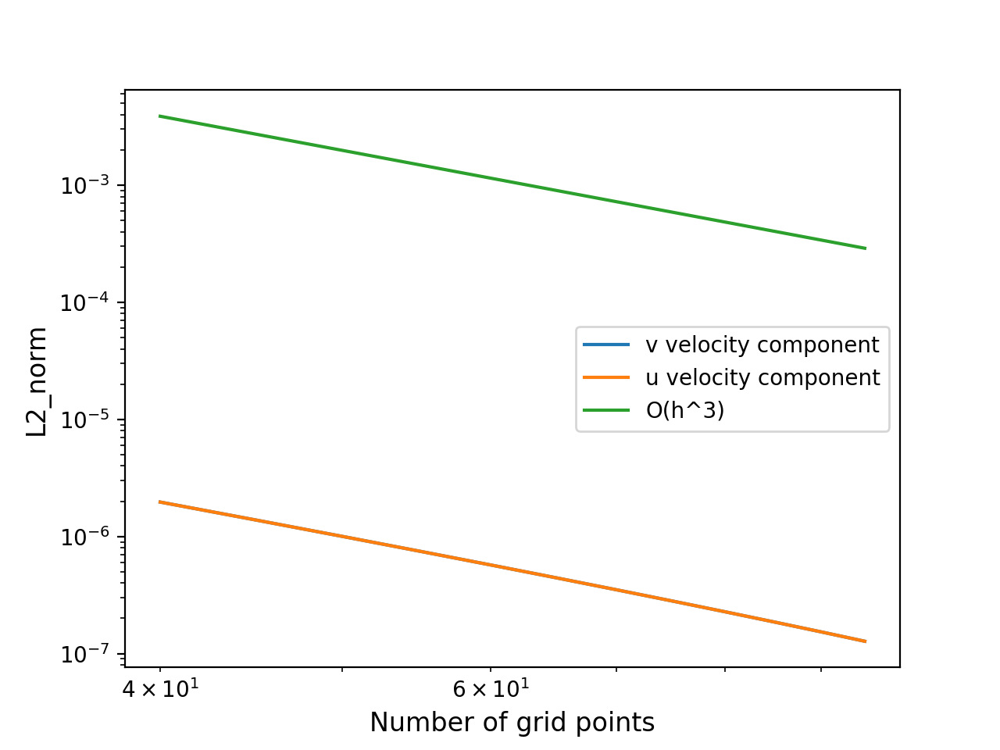

In [36]:
#%matplotlib notebook
import matplotlib.pyplot as plt
plt.loglog(n, v_error_, label = 'v velocity component')
plt.loglog(n, u_error_, label = 'u velocity component')
plt.loglog(n, (dx_**3),label = 'O(h^3)')
plt.xlabel("Number of grid points", fontsize = 12)
plt.ylabel("L2_norm", fontsize = 12)
plt.legend()